In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import gym
import torch
import random
import torch.nn as nn

In [2]:
class Env():
    def __init__(self):
        self.env = gym.make('CarRacing-v0')
        self.reward_threshold = self.env.spec.reward_threshold

    def reset(self):
        self.counter = 0
        self.av_r = self.reward_memory()
        self.die = False
        img_rgb = self.env.reset()
        img_gray = self.rgb2gray(img_rgb)
        self.stack = [img_gray] * 4
        return np.array(self.stack)

    def step(self, action):
        total_reward = 0
        for i in range(8):
            img_rgb, reward, die, _ = self.env.step(action)
            # don't penalize "die state"
            if die:
                reward += 100
            # green penalty
            if np.mean(img_rgb[:, :, 1]) > 185.0:
                reward -= 0.05
            total_reward += reward
            # if no reward recently, end the episode
            done = True if self.av_r(reward) <= -0.1 else False
            if done or die:
                break
        img_gray = self.rgb2gray(img_rgb)
        self.stack.pop(0)
        self.stack.append(img_gray)
        assert len(self.stack) == 4
        return np.array(self.stack), total_reward, done, die

    def render(self):
        self.env.render()
        
    def close(self):
        self.env.close()

    @staticmethod
    def rgb2gray(rgb, norm=True):
        gray = np.dot(rgb[..., :], [0.299, 0.587, 0.114])
        if norm:
            # normalize
            gray = gray / 128. - 1.
        return gray

    @staticmethod
    def reward_memory():
        count = 0
        length = 100
        history = np.zeros(length)

        def memory(reward):
            nonlocal count
            history[count] = reward
            count = (count + 1) % length
            return np.mean(history)

        return memory


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.cnn_base = nn.Sequential(  # input shape (4, 96, 96)
            nn.Conv2d(4, 8, kernel_size=4, stride=2),
            nn.ReLU(),  # activation
            nn.Conv2d(8, 16, kernel_size=3, stride=2),  # (8, 47, 47)
            nn.ReLU(),  # activation
            nn.Conv2d(16, 32, kernel_size=3, stride=2),  # (16, 23, 23)
            nn.ReLU(),  # activation
            nn.Conv2d(32, 64, kernel_size=3, stride=2),  # (32, 11, 11)
            nn.ReLU(),  # activation
            nn.Conv2d(64, 128, kernel_size=3, stride=1),  # (64, 5, 5)
            nn.ReLU(),  # activation
            nn.Conv2d(128, 256, kernel_size=3, stride=1),  # (128, 3, 3)
            nn.ReLU(),  # activation
        )  # output shape (256, 1, 1)
        self.v = nn.Sequential(nn.Linear(256, 100), nn.ReLU(), nn.Linear(100, 1))
        self.fc = nn.Sequential(nn.Linear(256, 100), nn.ReLU())
        self.alpha_head = nn.Sequential(nn.Linear(100, 3), nn.Softplus())
        self.beta_head = nn.Sequential(nn.Linear(100, 3), nn.Softplus())
        self.apply(self._weights_init)

    @staticmethod
    def _weights_init(m):
        if isinstance(m, nn.Conv2d):
            nn.init.xavier_uniform_(m.weight, gain=nn.init.calculate_gain('relu'))
            nn.init.constant_(m.bias, 0.1)

    def forward(self, x):
        x = self.cnn_base(x)
        x = x.view(-1, 256)
        v = self.v(x)
        x = self.fc(x)
        alpha = self.alpha_head(x) + 1
        beta = self.beta_head(x) + 1

        return (alpha, beta), v


class Agent():
    def __init__(self):
        self.net = Net().float().to(device)

    def select_action(self, state):
        state = torch.from_numpy(state).float().to(device).unsqueeze(0)
        with torch.no_grad():
            alpha, beta = self.net(state)[0]
        action = alpha / (alpha + beta)

        action = action.squeeze().cpu().numpy()
        return action

    def load_param(self):
        self.net.load_state_dict(torch.load('param/expert.pkl'))

Track generation: 1047..1318 -> 271-tiles track


C:\Users\awds2588\anaconda3\lib\site-packages\pyglet\image\codecs\wic.py:289: UserWarning: [WinError -2147417850] 執行緒模式設定後就不能再變更它。
  warnings.warn(str(err))


Epoch: 1
Expert	mean: 1031.90	variance: 0.00



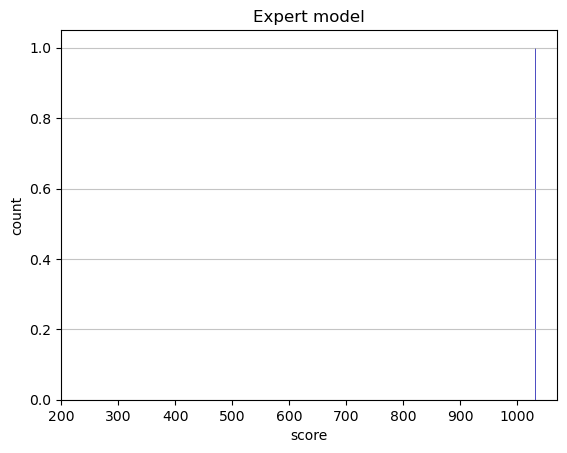

Track generation: 1134..1422 -> 288-tiles track
Epoch: 2
Expert	mean: 971.37	variance: 60.53



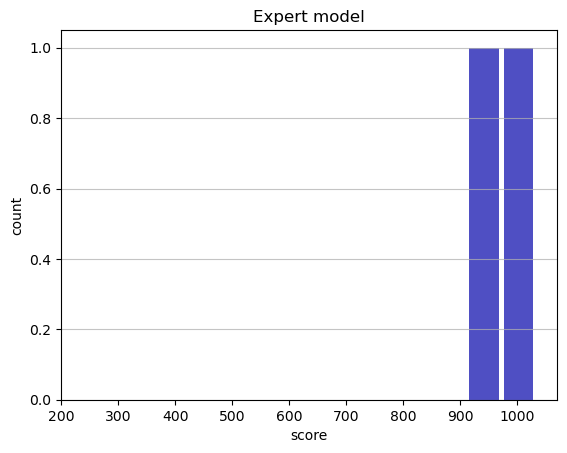

Track generation: 1145..1435 -> 290-tiles track
Epoch: 3
Expert	mean: 952.64	variance: 56.08



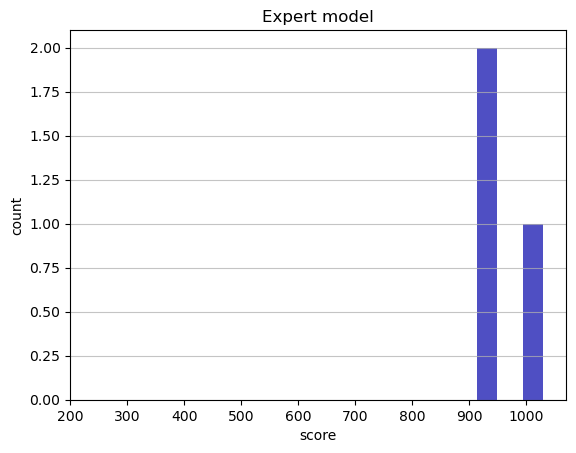

Track generation: 1148..1439 -> 291-tiles track
Epoch: 4
Expert	mean: 938.47	variance: 54.41



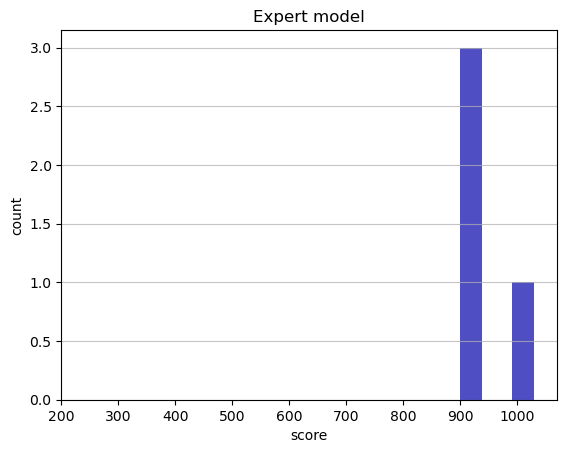

Track generation: 1062..1341 -> 279-tiles track
Epoch: 5
Expert	mean: 955.95	variance: 59.93



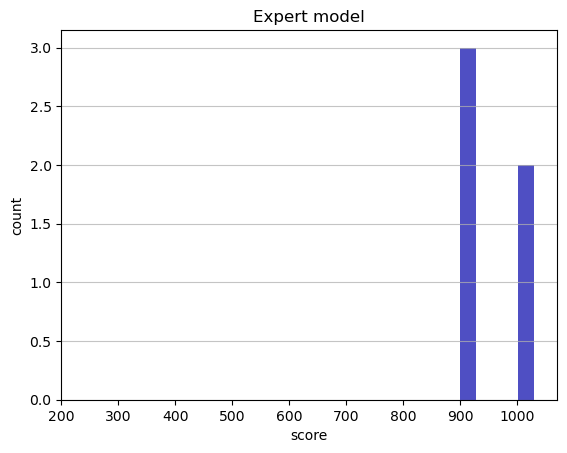

Track generation: 1080..1354 -> 274-tiles track
Epoch: 6
Expert	mean: 948.35	variance: 57.29



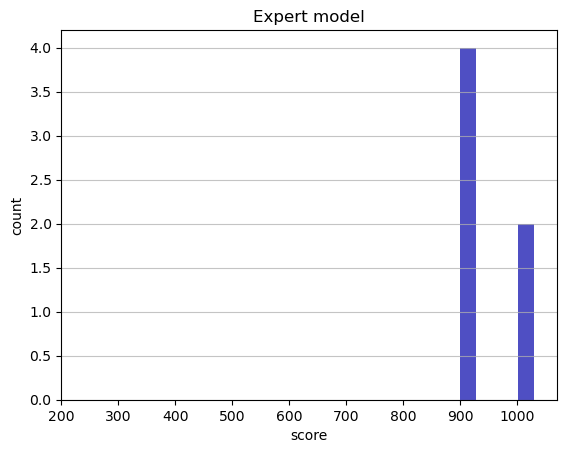

Track generation: 1051..1326 -> 275-tiles track
Epoch: 7
Expert	mean: 940.95	variance: 56.05



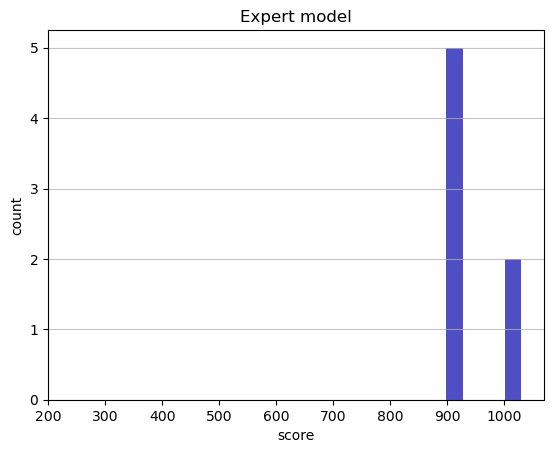

Track generation: 1170..1467 -> 297-tiles track
Epoch: 8
Expert	mean: 951.68	variance: 59.62



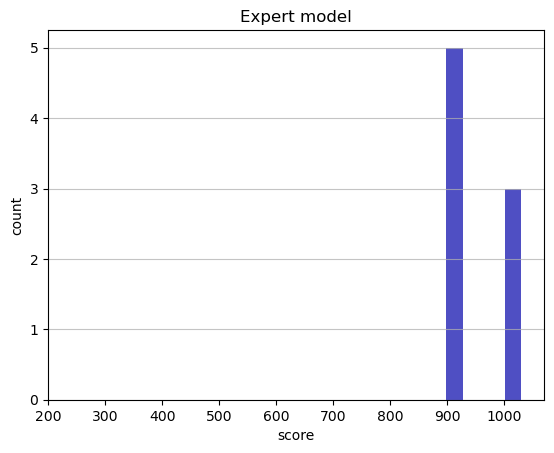

Track generation: 1259..1578 -> 319-tiles track
Epoch: 9
Expert	mean: 946.14	variance: 58.36



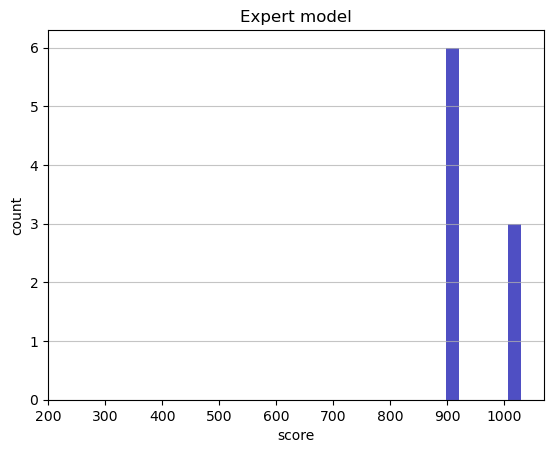

Track generation: 1143..1433 -> 290-tiles track
Epoch: 10
Expert	mean: 941.43	variance: 57.14



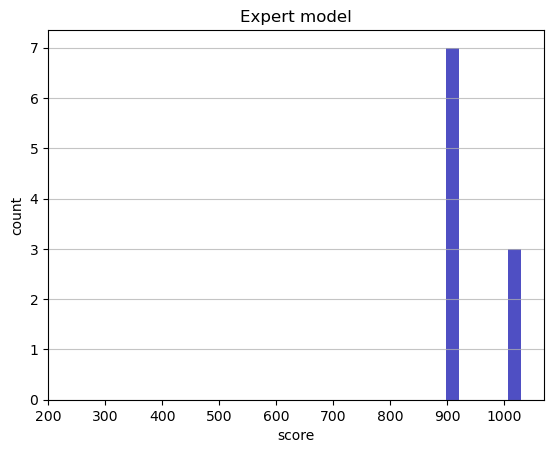

Track generation: 1171..1468 -> 297-tiles track
Epoch: 11
Expert	mean: 949.03	variance: 59.54



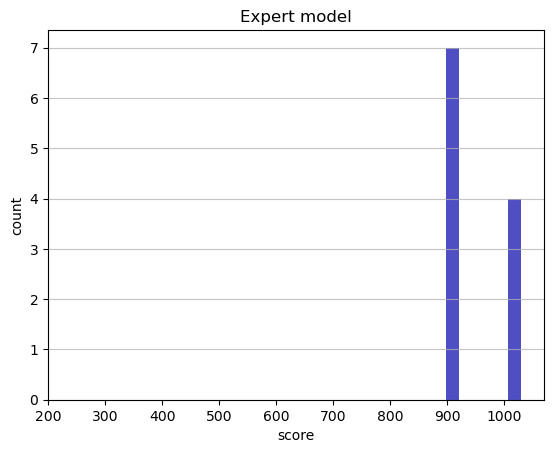

Track generation: 1103..1383 -> 280-tiles track
Epoch: 12
Expert	mean: 944.45	variance: 58.99



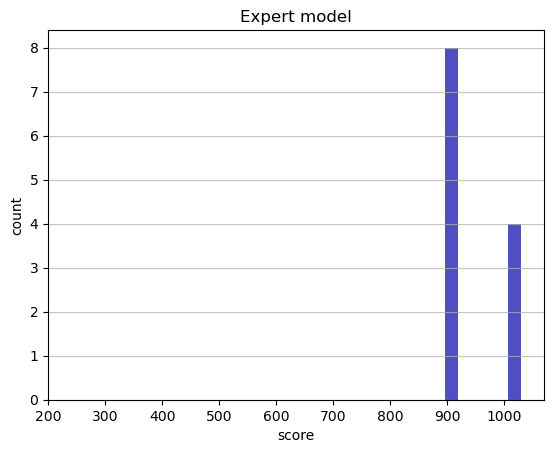

Track generation: 1055..1325 -> 270-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1152..1444 -> 292-tiles track
Epoch: 13
Expert	mean: 950.99	variance: 61.03



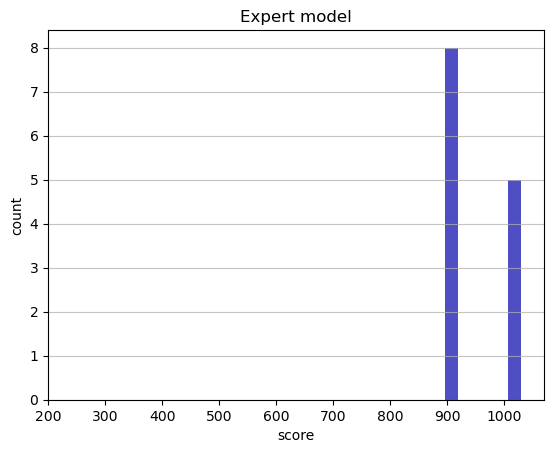

Track generation: 1013..1275 -> 262-tiles track
Epoch: 14
Expert	mean: 957.00	variance: 62.68



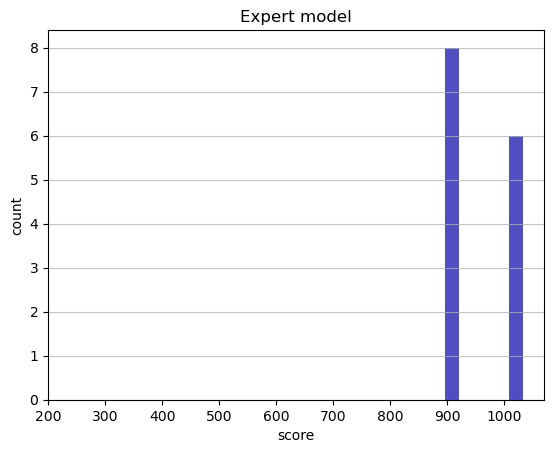

Track generation: 1068..1339 -> 271-tiles track
Epoch: 15
Expert	mean: 954.09	variance: 61.53



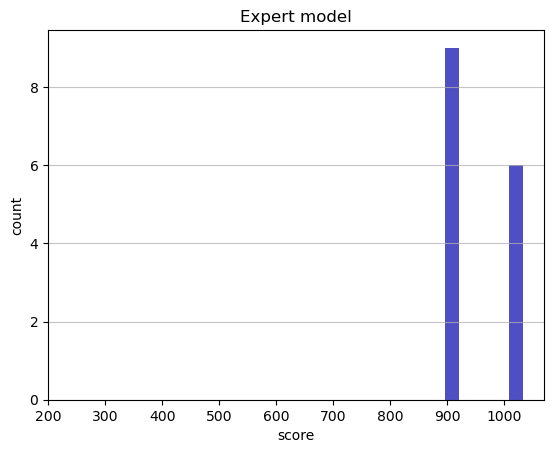

Track generation: 1043..1307 -> 264-tiles track
Epoch: 16
Expert	mean: 959.01	variance: 62.54



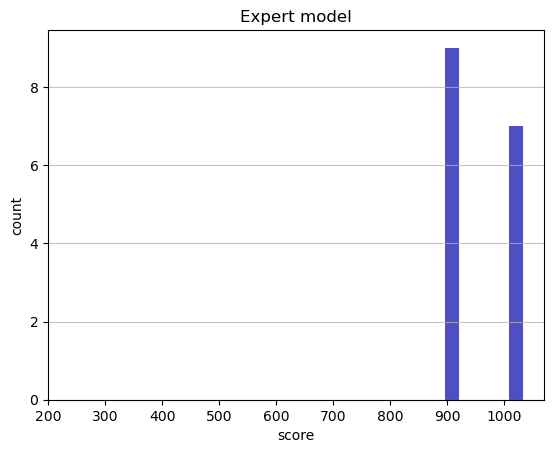

Track generation: 1076..1349 -> 273-tiles track
Epoch: 17
Expert	mean: 955.32	variance: 62.44



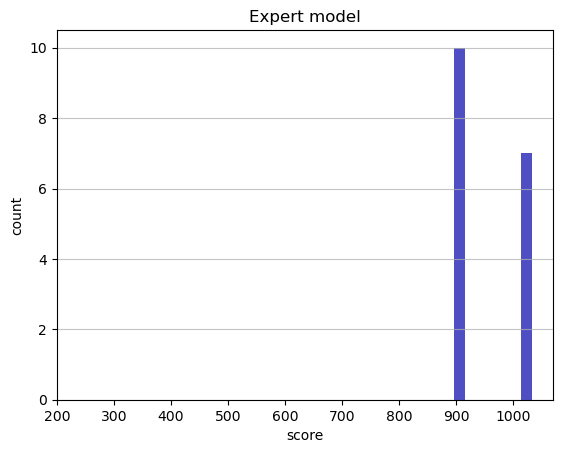

Track generation: 1227..1544 -> 317-tiles track
Epoch: 18
Expert	mean: 958.68	variance: 62.24



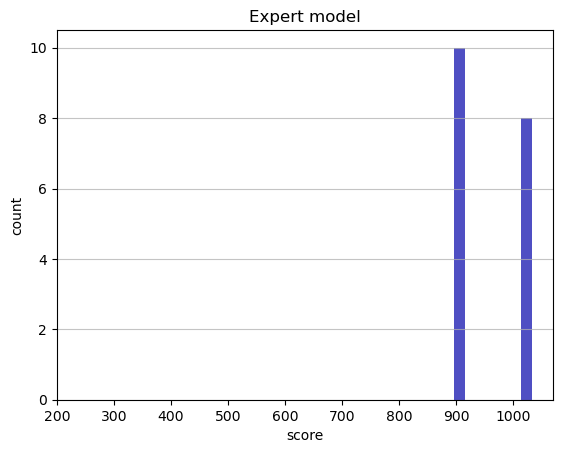

Track generation: 1155..1448 -> 293-tiles track
Epoch: 19
Expert	mean: 962.40	variance: 62.60



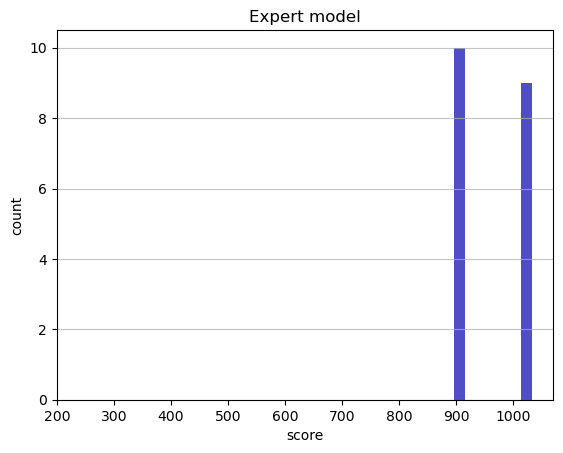

Track generation: 959..1207 -> 248-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1024..1287 -> 263-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1186..1494 -> 308-tiles track
Epoch: 20
Expert	mean: 937.08	variance: 126.09



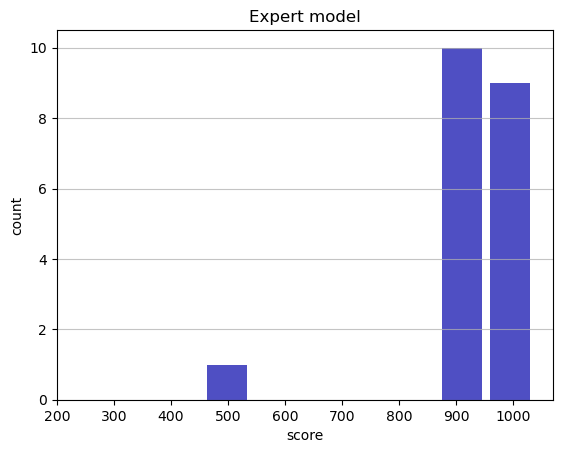

Track generation: 1124..1409 -> 285-tiles track
Epoch: 21
Expert	mean: 926.39	variance: 132.01



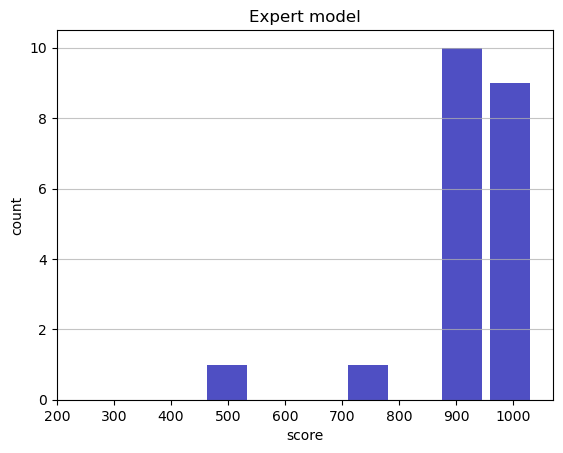

Track generation: 1222..1532 -> 310-tiles track
Epoch: 22
Expert	mean: 930.77	variance: 130.53



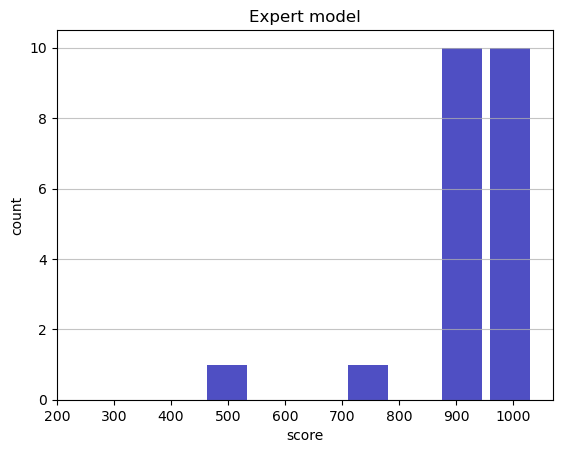

Track generation: 1275..1598 -> 323-tiles track
Epoch: 23
Expert	mean: 929.34	variance: 127.84



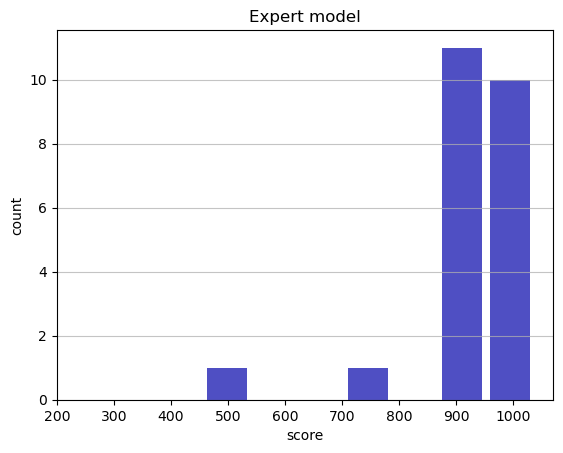

Track generation: 1331..1668 -> 337-tiles track
Epoch: 24
Expert	mean: 927.94	variance: 125.33



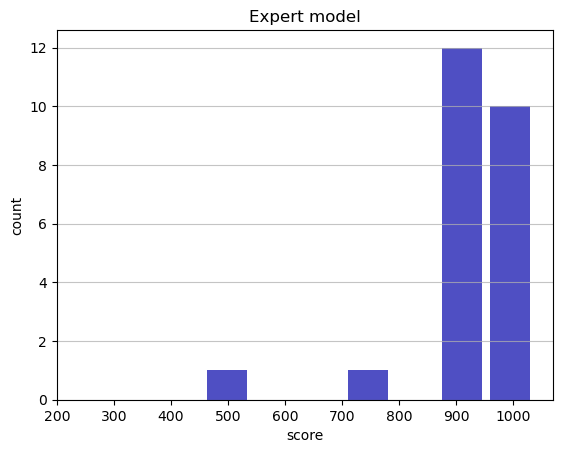

Track generation: 1235..1548 -> 313-tiles track
Epoch: 25
Expert	mean: 927.09	variance: 122.87



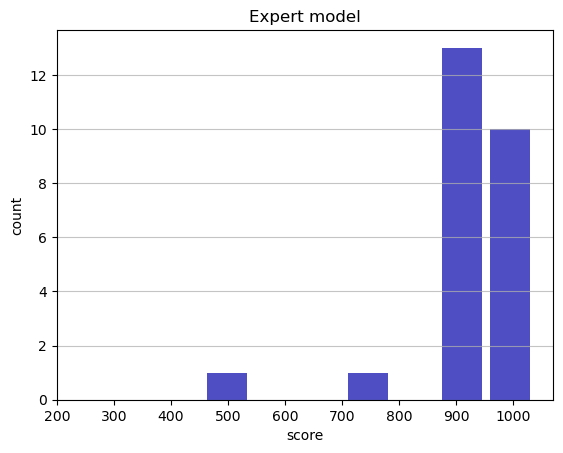

Track generation: 1152..1444 -> 292-tiles track
Epoch: 26
Expert	mean: 930.96	variance: 122.02



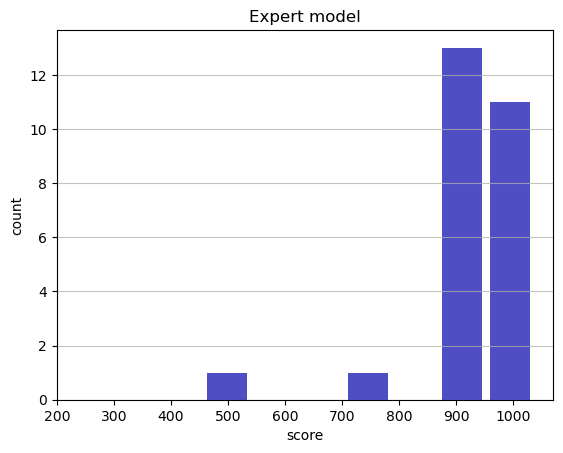

Track generation: 1149..1440 -> 291-tiles track
Epoch: 27
Expert	mean: 929.66	variance: 119.92



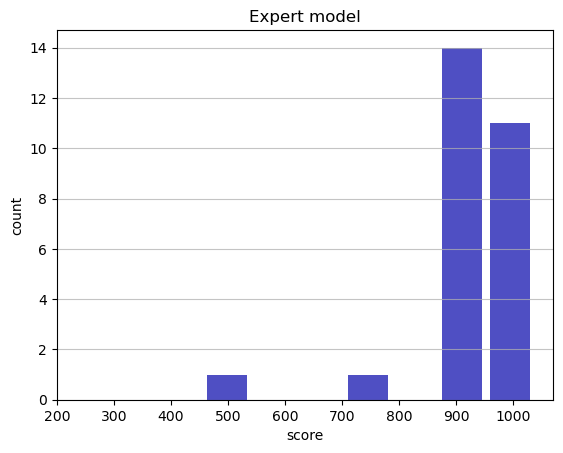

Track generation: 968..1214 -> 246-tiles track
Epoch: 28
Expert	mean: 929.22	variance: 117.78



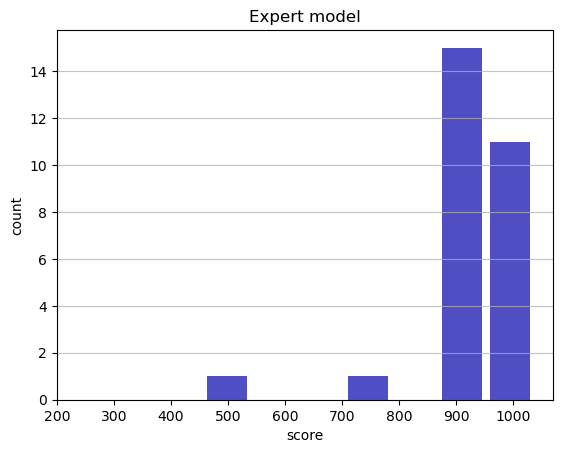

Track generation: 947..1196 -> 249-tiles track
Epoch: 29
Expert	mean: 932.95	variance: 117.41



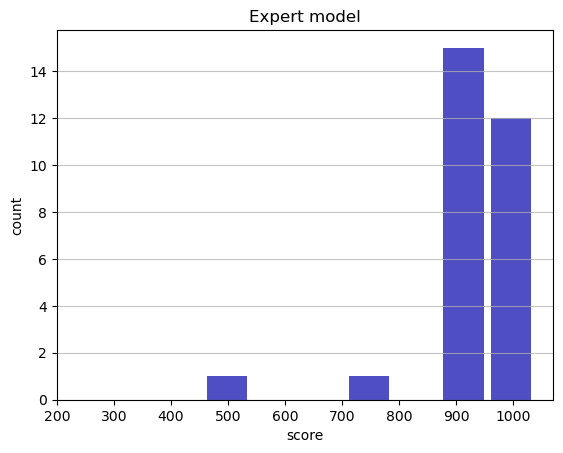

Track generation: 1204..1509 -> 305-tiles track
Epoch: 30
Expert	mean: 912.73	variance: 158.71



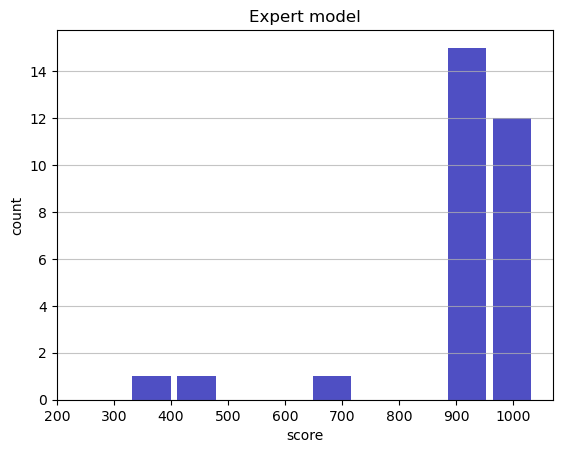

Track generation: 1063..1333 -> 270-tiles track
Epoch: 31
Expert	mean: 916.58	variance: 157.55



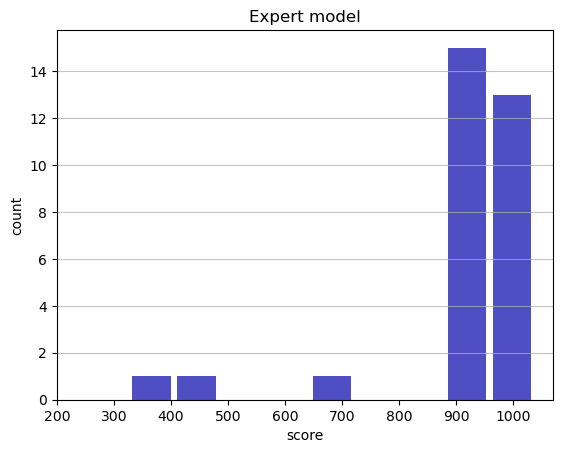

Track generation: 1005..1260 -> 255-tiles track
Epoch: 32
Expert	mean: 920.42	variance: 156.54



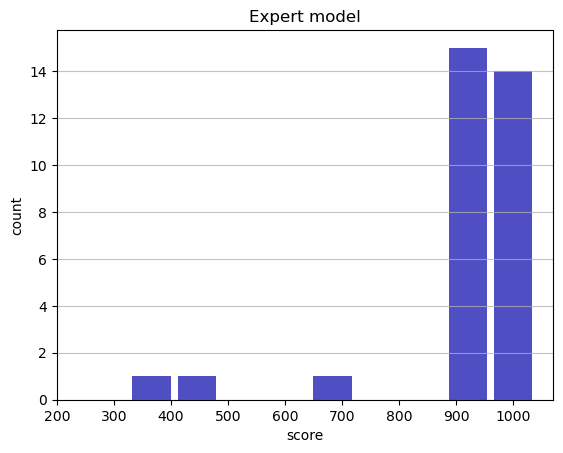

Track generation: 1159..1453 -> 294-tiles track
Epoch: 33
Expert	mean: 923.73	variance: 155.28



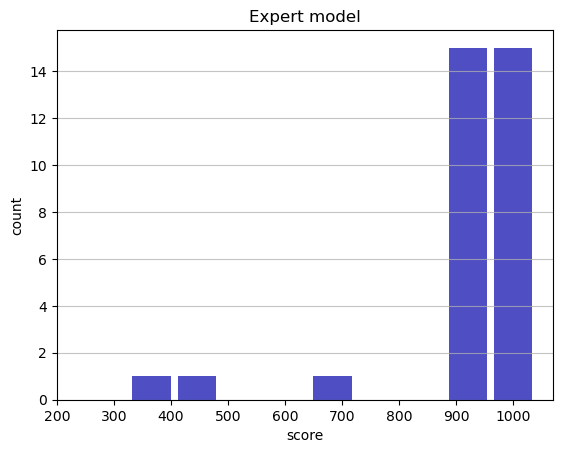

Track generation: 1107..1388 -> 281-tiles track
Epoch: 34
Expert	mean: 926.83	variance: 154.01



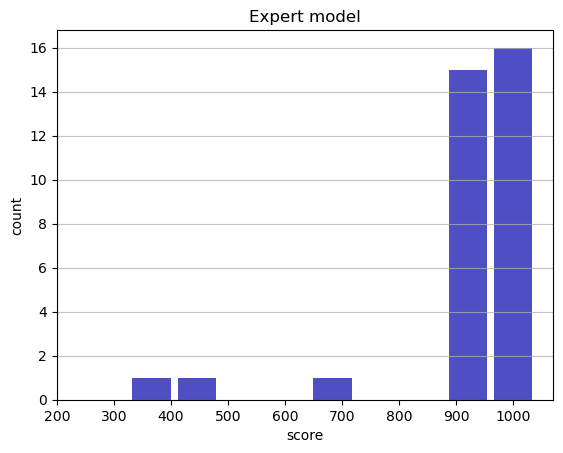

Track generation: 1371..1718 -> 347-tiles track
Epoch: 35
Expert	mean: 928.34	variance: 152.05



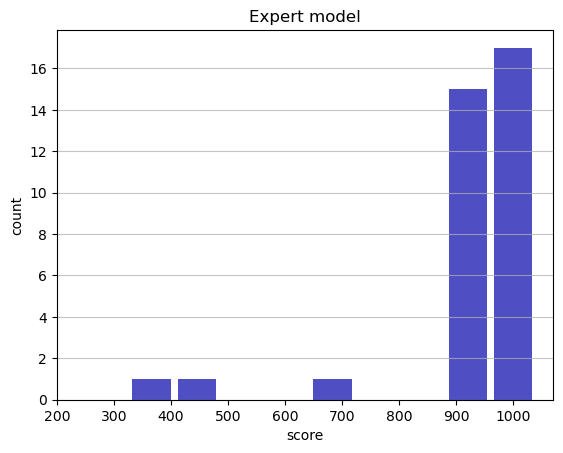

Track generation: 1079..1362 -> 283-tiles track
Epoch: 36
Expert	mean: 927.77	variance: 149.96



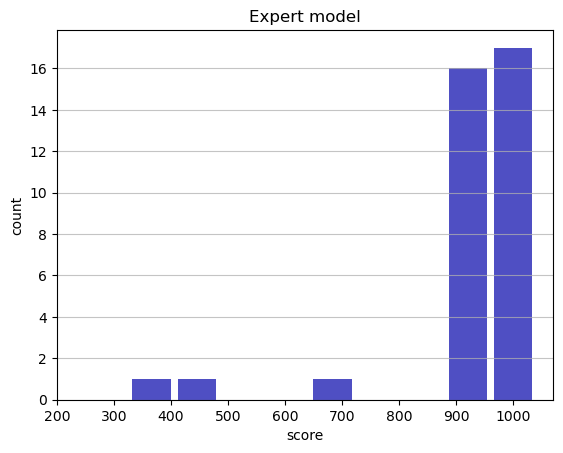

Track generation: 1277..1600 -> 323-tiles track
Epoch: 37
Expert	mean: 930.36	variance: 148.74



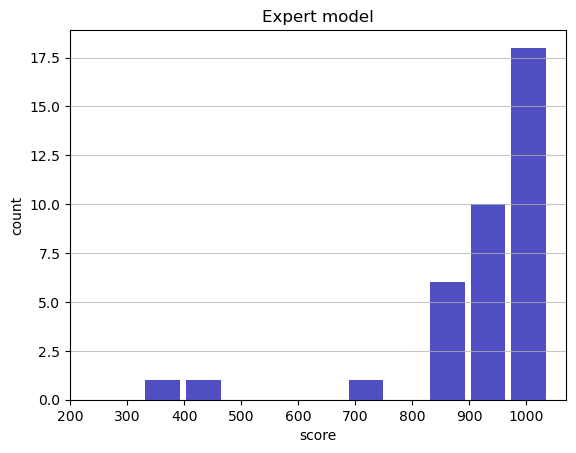

Track generation: 1272..1592 -> 320-tiles track
Epoch: 38
Expert	mean: 932.69	variance: 147.45



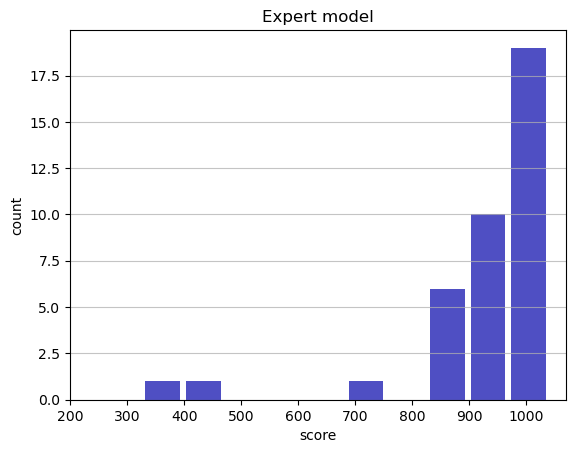

Track generation: 1140..1427 -> 287-tiles track
Epoch: 39
Expert	mean: 934.94	variance: 146.21



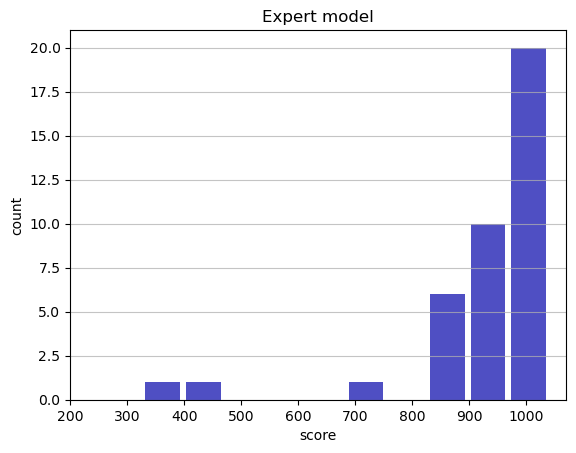

Track generation: 1179..1477 -> 298-tiles track
Epoch: 40
Expert	mean: 933.93	variance: 144.51



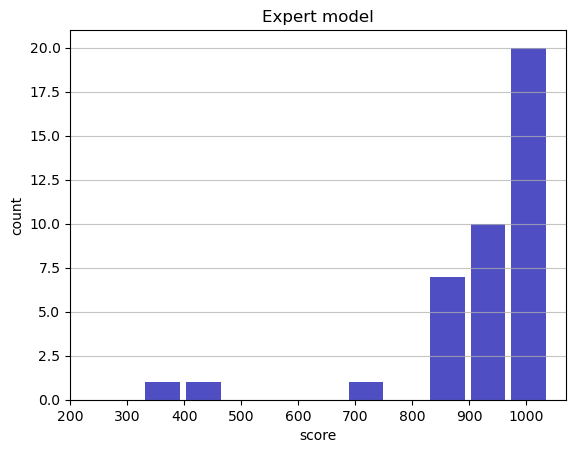

Track generation: 1152..1444 -> 292-tiles track
Epoch: 41
Expert	mean: 933.32	variance: 142.79



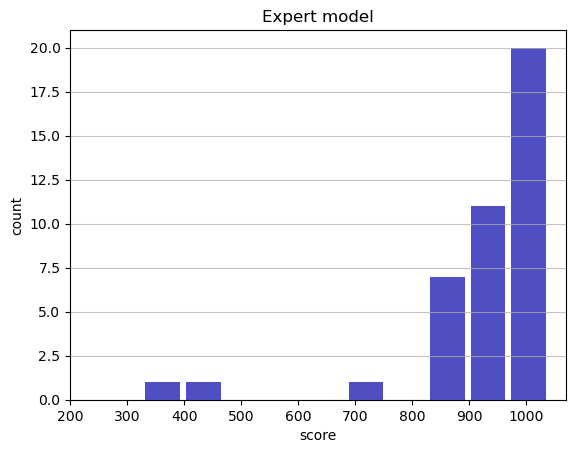

Track generation: 1004..1261 -> 257-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1040..1310 -> 270-tiles track
Epoch: 42
Expert	mean: 935.62	variance: 141.85



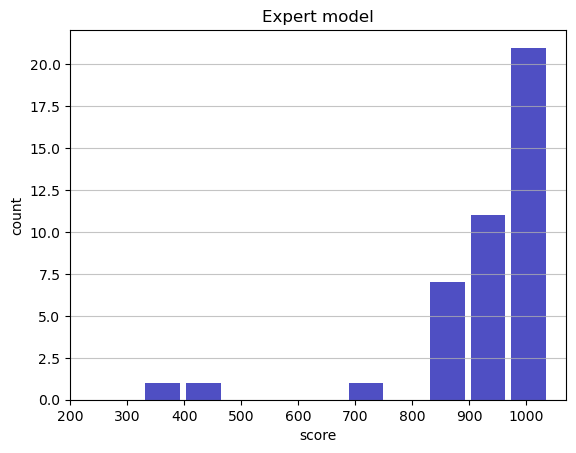

Track generation: 1068..1349 -> 281-tiles track
Epoch: 43
Expert	mean: 937.84	variance: 140.92



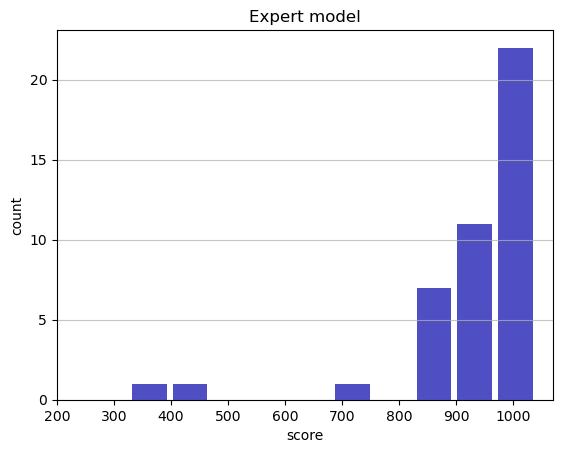

Track generation: 1245..1560 -> 315-tiles track
Epoch: 44
Expert	mean: 936.15	variance: 139.75



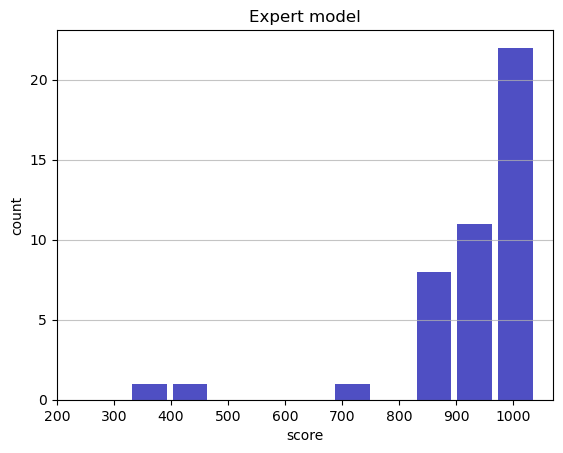

Track generation: 1083..1365 -> 282-tiles track
Epoch: 45
Expert	mean: 935.60	variance: 138.24



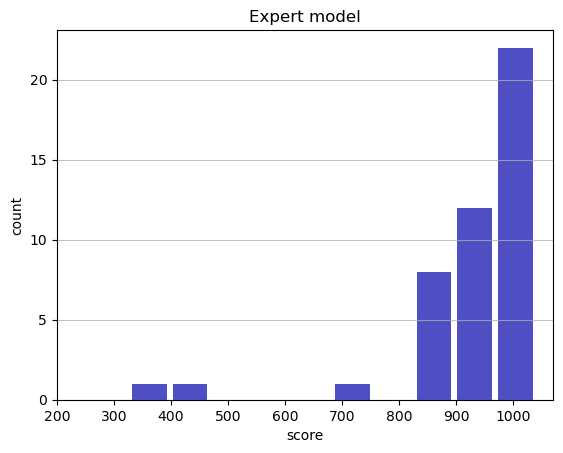

Track generation: 1190..1492 -> 302-tiles track
Epoch: 46
Expert	mean: 937.50	variance: 137.32



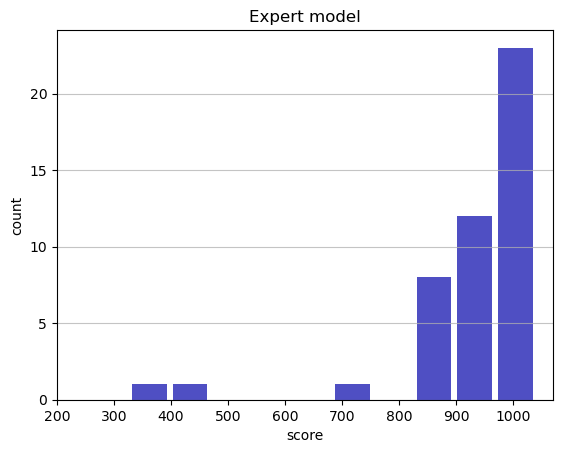

Track generation: 1209..1515 -> 306-tiles track
Epoch: 47
Expert	mean: 936.66	variance: 135.97



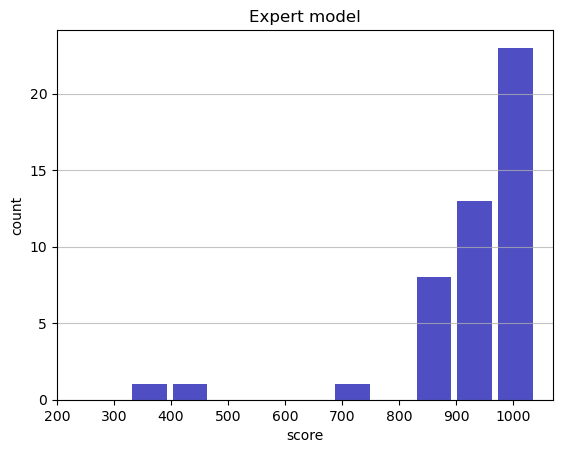

Track generation: 1060..1329 -> 269-tiles track
Epoch: 48
Expert	mean: 938.72	variance: 135.29



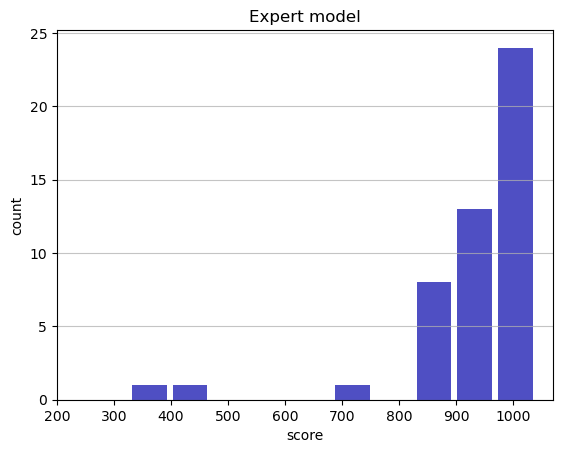

Track generation: 1224..1534 -> 310-tiles track
Epoch: 49
Expert	mean: 938.07	variance: 133.98



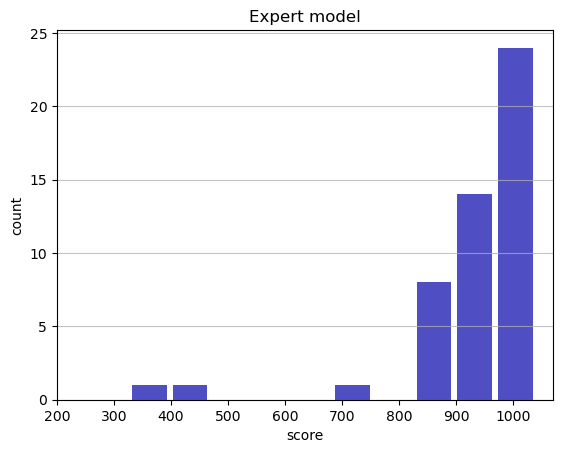

Track generation: 1240..1554 -> 314-tiles track
Epoch: 50
Expert	mean: 937.39	variance: 132.72



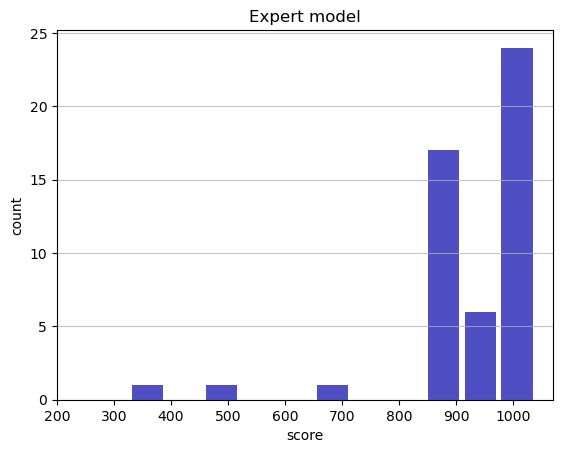

Track generation: 1193..1496 -> 303-tiles track
Epoch: 51
Expert	mean: 935.97	variance: 131.80



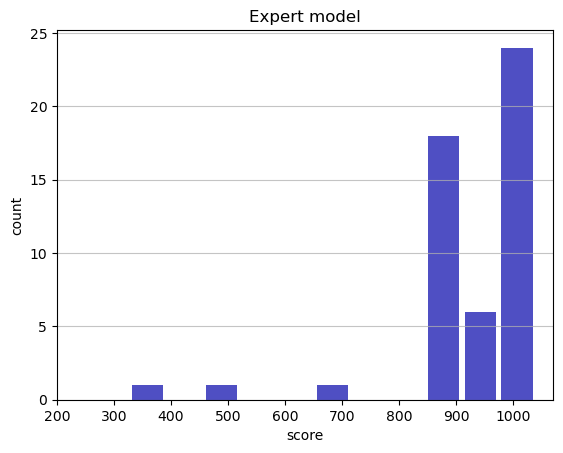

Track generation: 1283..1608 -> 325-tiles track
Epoch: 52
Expert	mean: 935.27	variance: 130.62



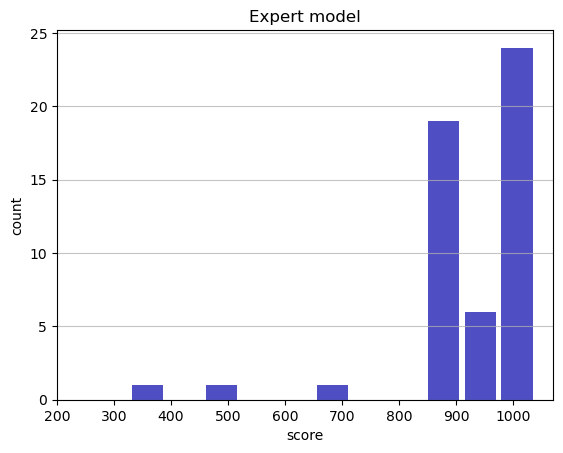

Track generation: 1292..1628 -> 336-tiles track
Epoch: 53
Expert	mean: 934.22	variance: 129.60



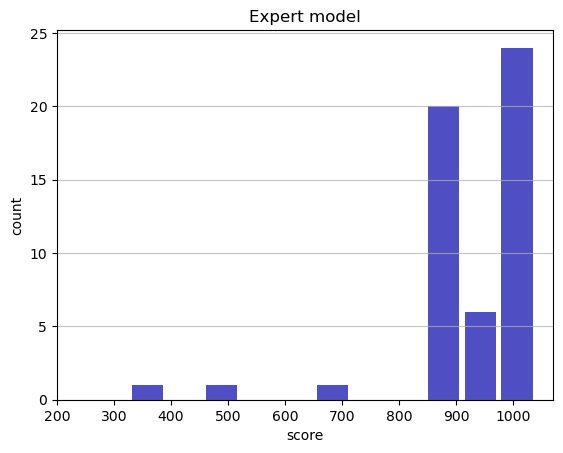

Track generation: 1228..1539 -> 311-tiles track
Epoch: 54
Expert	mean: 933.57	variance: 128.49



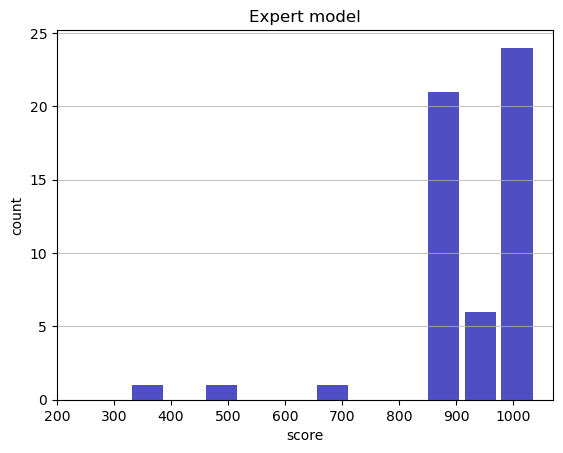

Track generation: 1072..1344 -> 272-tiles track
Epoch: 55
Expert	mean: 932.99	variance: 127.38



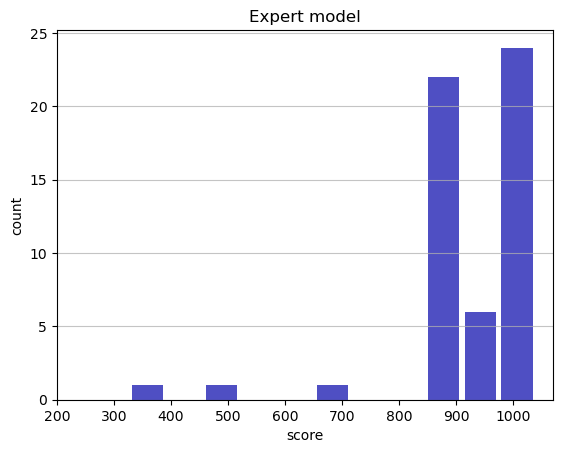

Track generation: 1224..1534 -> 310-tiles track
Epoch: 56
Expert	mean: 932.34	variance: 126.33



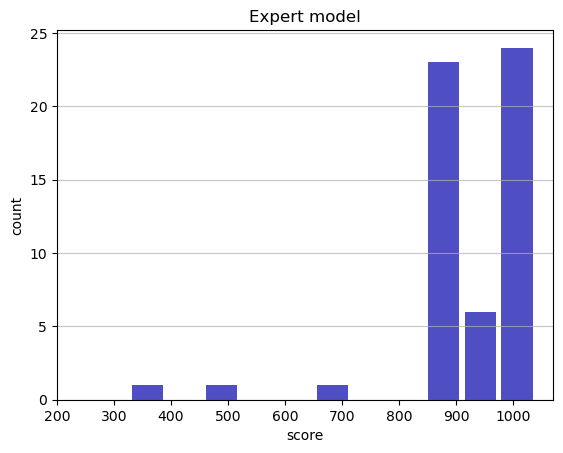

Track generation: 1211..1524 -> 313-tiles track
Epoch: 57
Expert	mean: 931.79	variance: 125.29



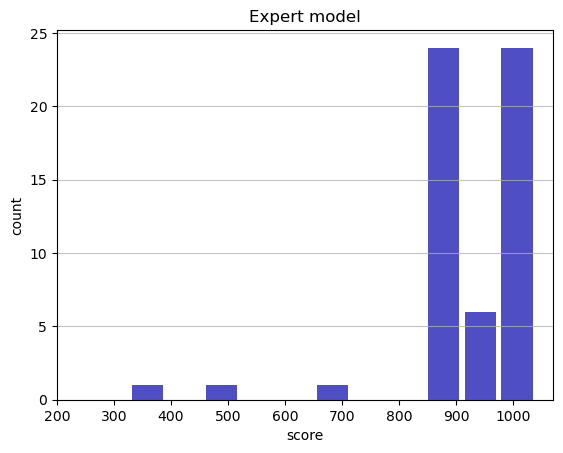

Track generation: 1184..1484 -> 300-tiles track
Epoch: 58
Expert	mean: 933.28	variance: 124.72



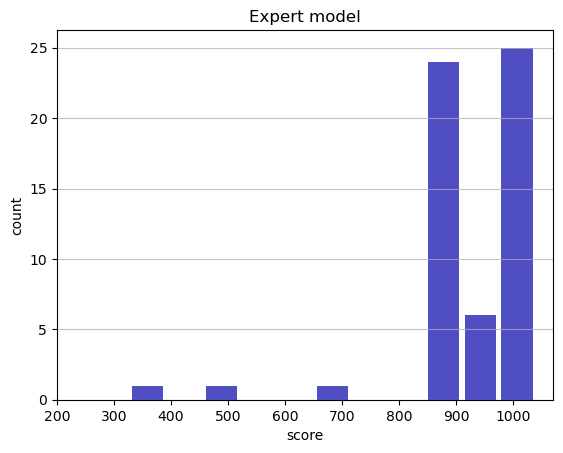

Track generation: 1079..1353 -> 274-tiles track
Epoch: 59
Expert	mean: 932.85	variance: 123.70



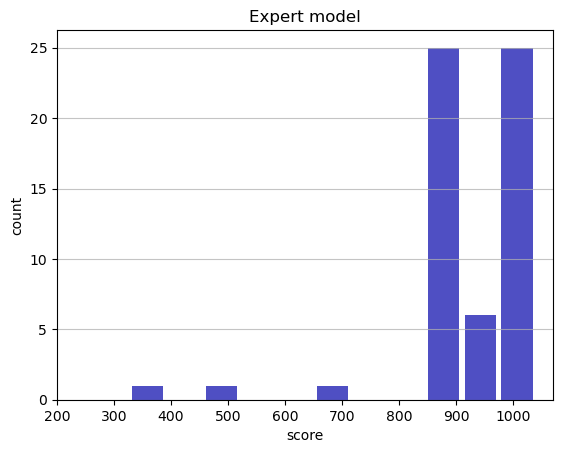

Track generation: 1185..1491 -> 306-tiles track
Epoch: 60
Expert	mean: 932.15	variance: 122.78



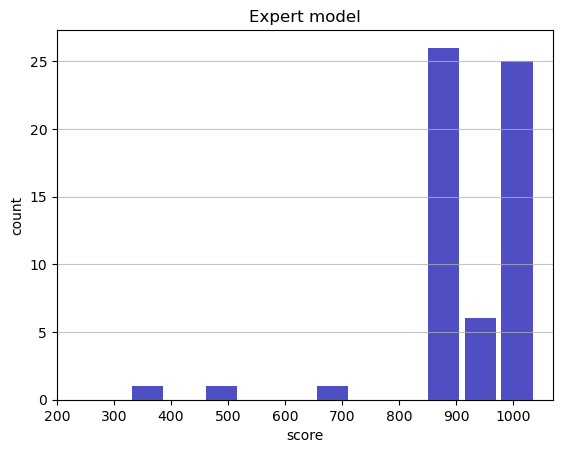

Track generation: 1328..1664 -> 336-tiles track
Epoch: 61
Expert	mean: 932.87	variance: 121.90



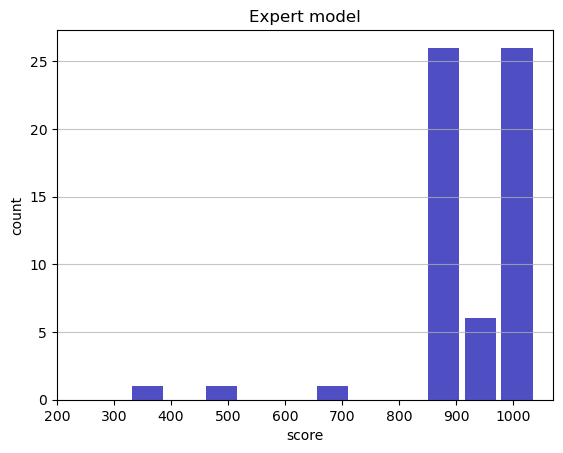

Track generation: 1143..1433 -> 290-tiles track
Epoch: 62
Expert	mean: 934.39	variance: 121.50



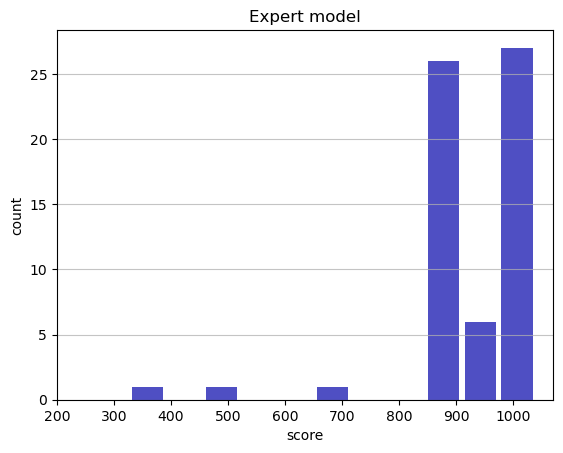

Track generation: 1054..1332 -> 278-tiles track
Epoch: 63
Expert	mean: 935.94	variance: 121.15



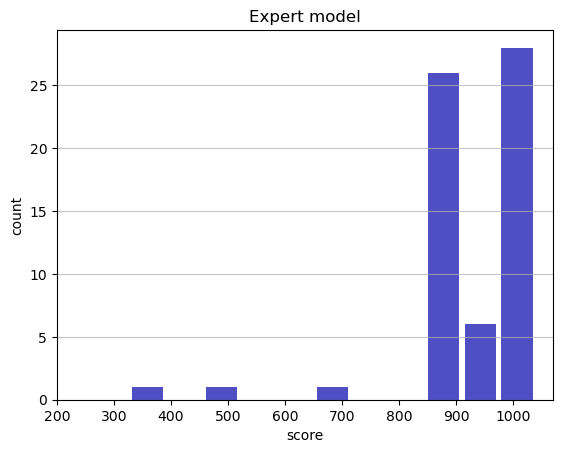

Track generation: 1229..1550 -> 321-tiles track
Epoch: 64
Expert	mean: 937.12	variance: 120.56



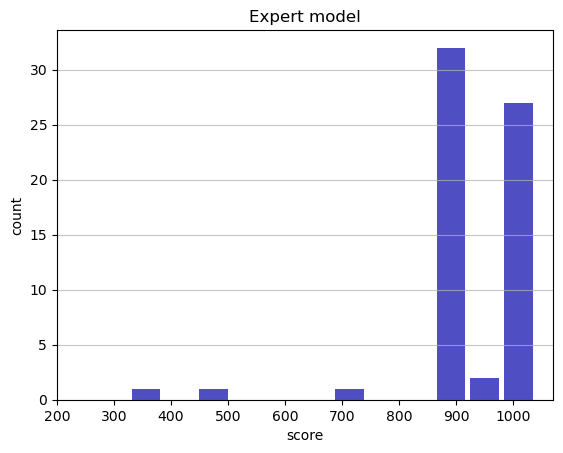

Track generation: 999..1254 -> 255-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1108..1389 -> 281-tiles track
Epoch: 65
Expert	mean: 938.66	variance: 120.26



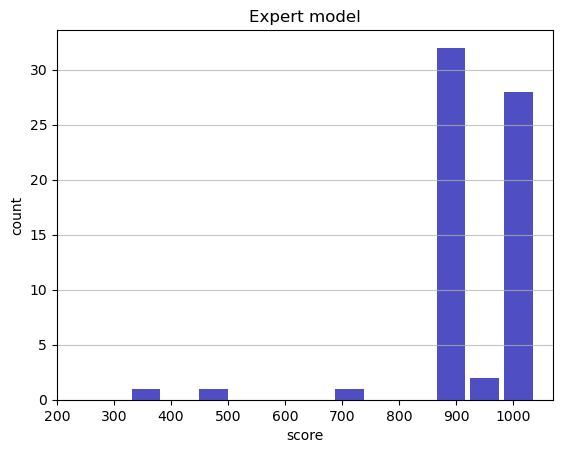

Track generation: 1347..1702 -> 355-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1105..1386 -> 281-tiles track
Epoch: 66
Expert	mean: 937.94	variance: 119.48



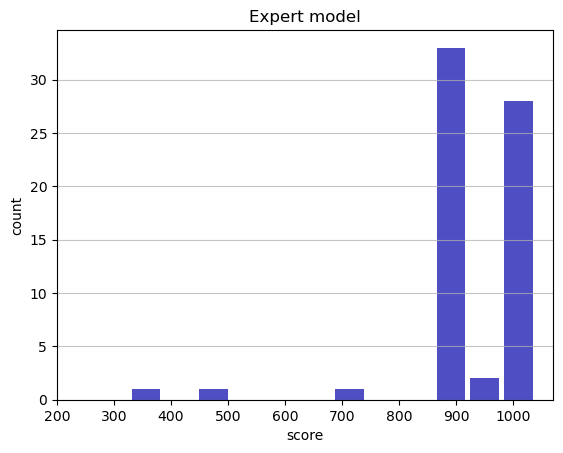

Track generation: 1160..1454 -> 294-tiles track
Epoch: 67
Expert	mean: 937.42	variance: 118.66



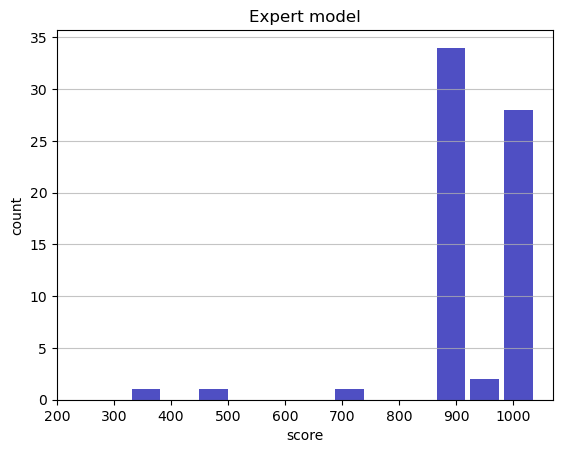

Track generation: 1232..1544 -> 312-tiles track
Epoch: 68
Expert	mean: 938.65	variance: 118.22



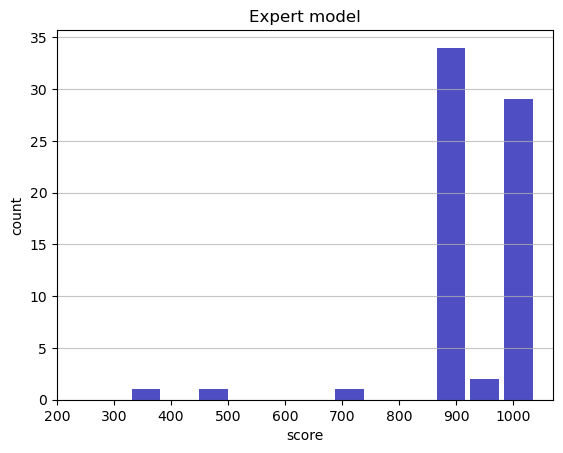

Track generation: 1255..1573 -> 318-tiles track
Epoch: 69
Expert	mean: 937.95	variance: 117.50



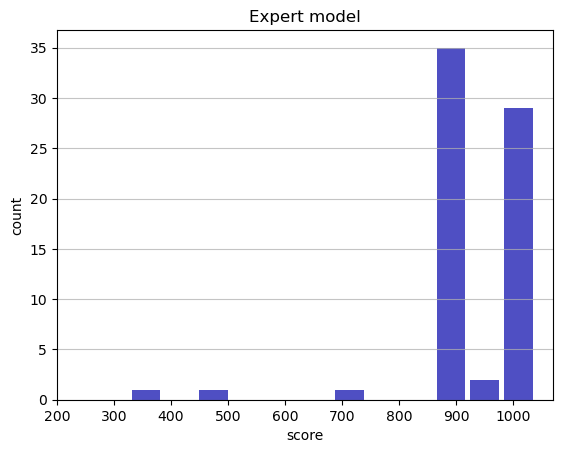

Track generation: 1088..1364 -> 276-tiles track
Epoch: 70
Expert	mean: 939.32	variance: 117.21



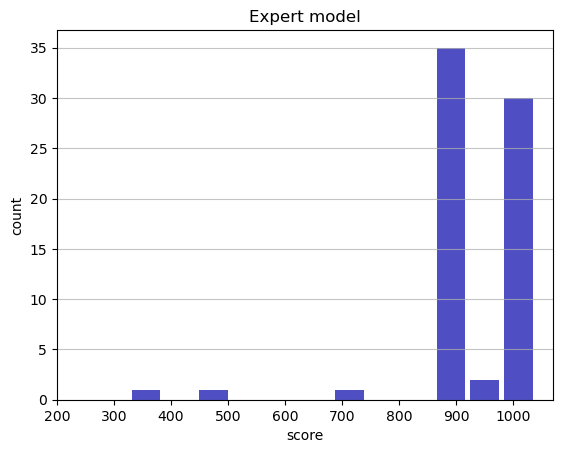

Track generation: 1053..1327 -> 274-tiles track
Epoch: 71
Expert	mean: 938.88	variance: 116.44



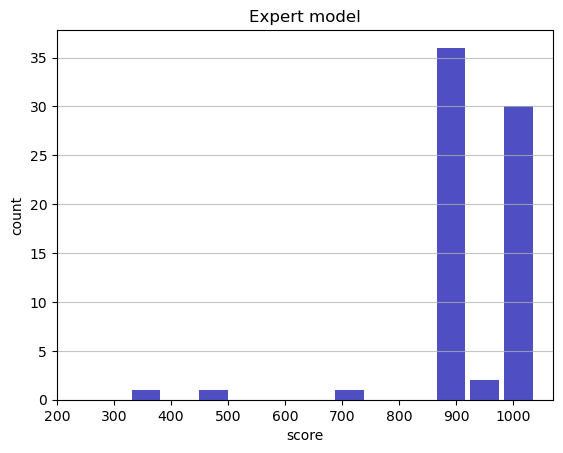

Track generation: 1195..1498 -> 303-tiles track
Epoch: 72
Expert	mean: 938.46	variance: 115.69



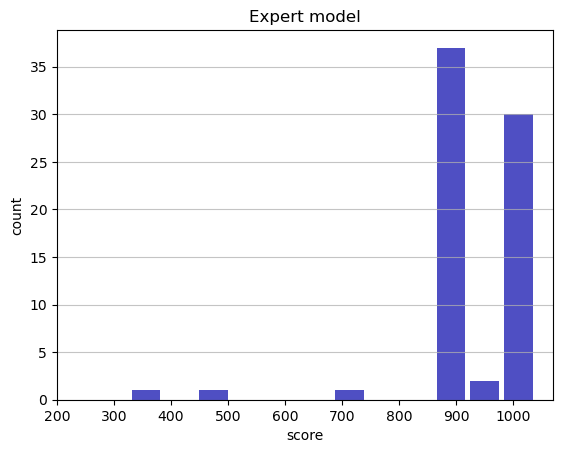

Track generation: 1296..1630 -> 334-tiles track
Epoch: 73
Expert	mean: 929.46	variance: 137.96



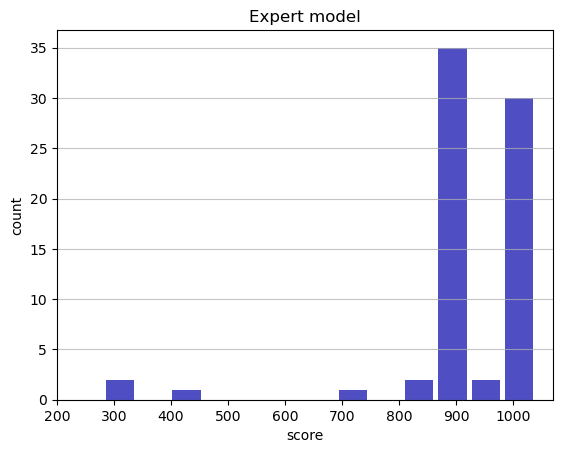

Track generation: 1296..1624 -> 328-tiles track
Epoch: 74
Expert	mean: 920.62	variance: 156.46



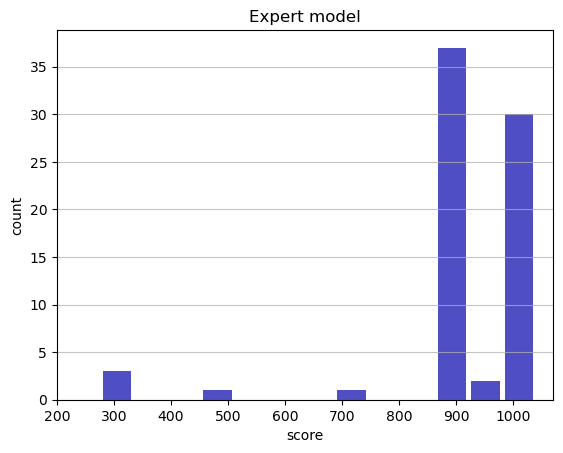

Track generation: 1178..1477 -> 299-tiles track
Epoch: 75
Expert	mean: 922.02	variance: 155.88



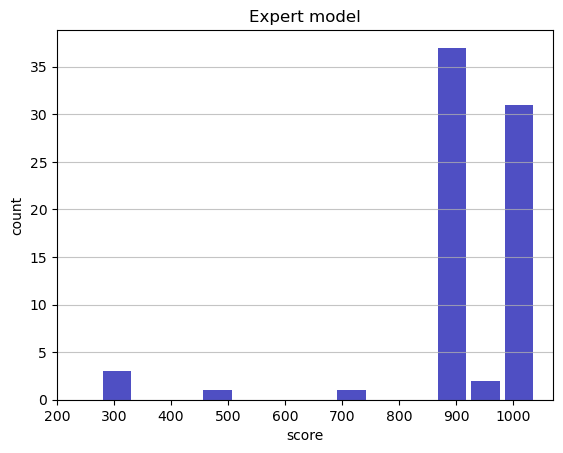

Track generation: 1181..1488 -> 307-tiles track
Epoch: 76
Expert	mean: 921.56	variance: 154.90



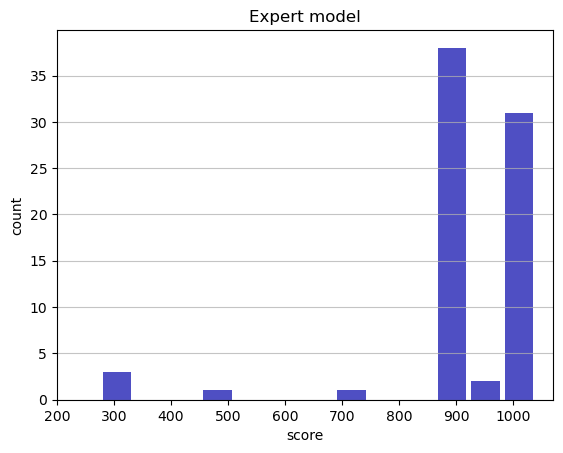

Track generation: 1099..1378 -> 279-tiles track
Epoch: 77
Expert	mean: 921.53	variance: 153.89



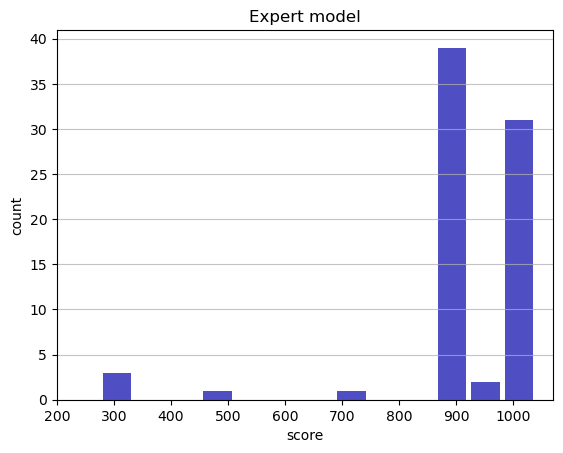

Track generation: 1113..1395 -> 282-tiles track
Epoch: 78
Expert	mean: 921.22	variance: 152.93



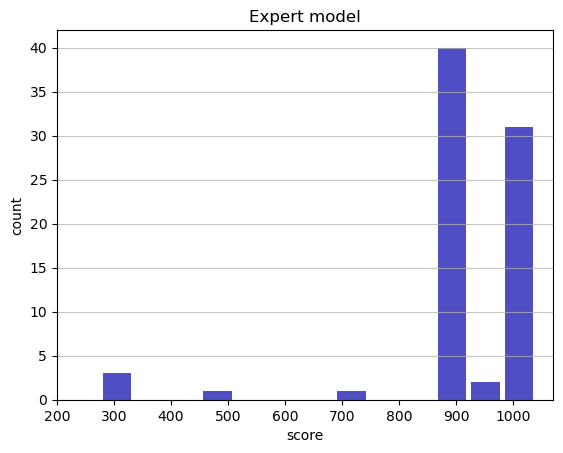

Track generation: 1052..1319 -> 267-tiles track
Epoch: 79
Expert	mean: 922.64	variance: 152.47



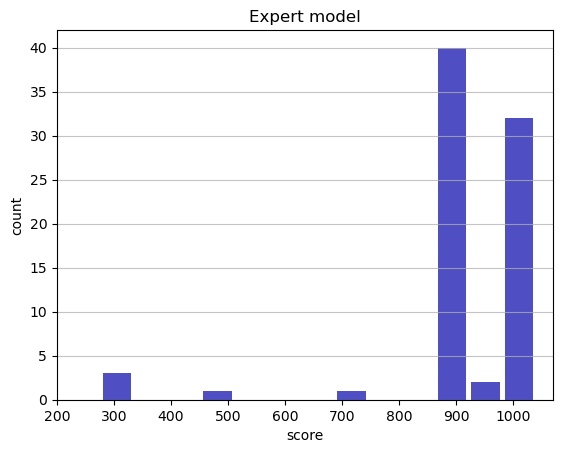

Track generation: 1213..1520 -> 307-tiles track
Epoch: 80
Expert	mean: 922.36	variance: 151.53



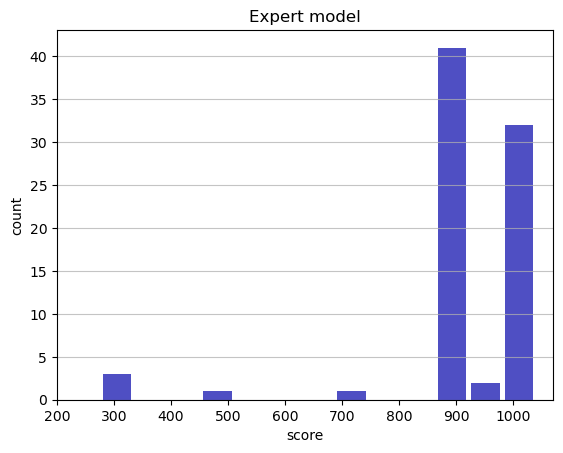

Track generation: 1020..1279 -> 259-tiles track
Epoch: 81
Expert	mean: 922.40	variance: 150.60



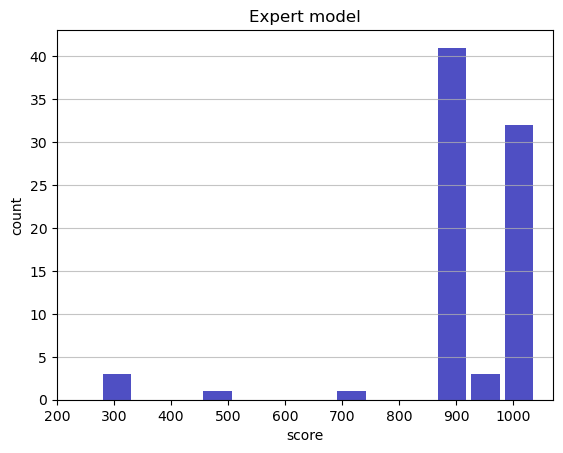

Track generation: 1056..1324 -> 268-tiles track
Epoch: 82
Expert	mean: 922.14	variance: 149.69



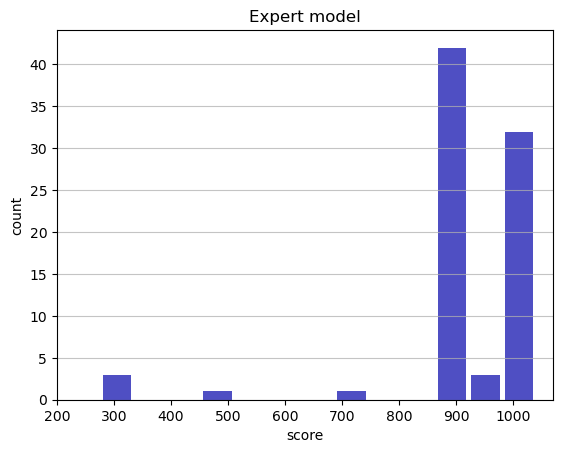

Track generation: 1215..1523 -> 308-tiles track
Epoch: 83
Expert	mean: 923.38	variance: 149.22



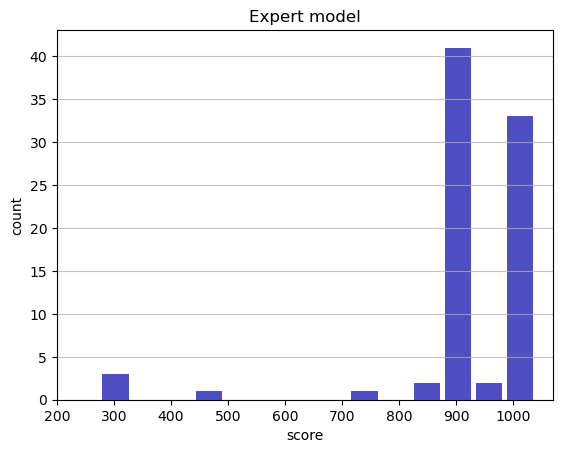

Track generation: 1066..1338 -> 272-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1188..1489 -> 301-tiles track
Epoch: 84
Expert	mean: 923.11	variance: 148.35



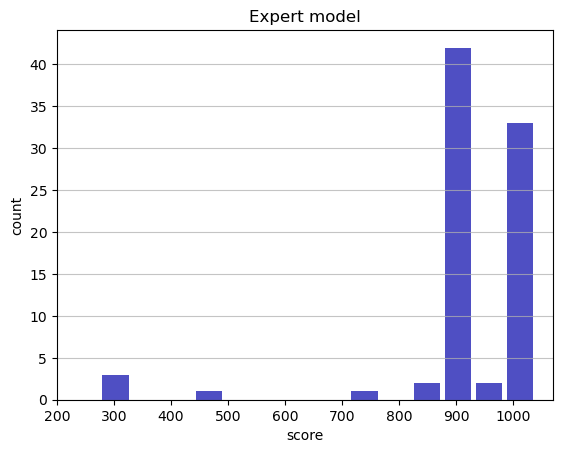

Track generation: 1210..1517 -> 307-tiles track
Epoch: 85
Expert	mean: 922.88	variance: 147.49



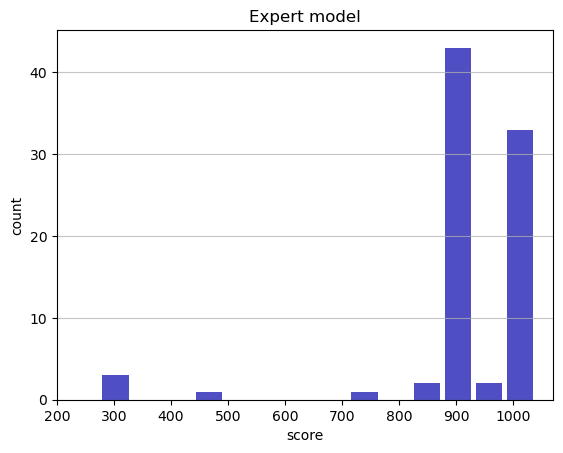

Track generation: 1179..1487 -> 308-tiles track
Epoch: 86
Expert	mean: 923.32	variance: 146.68



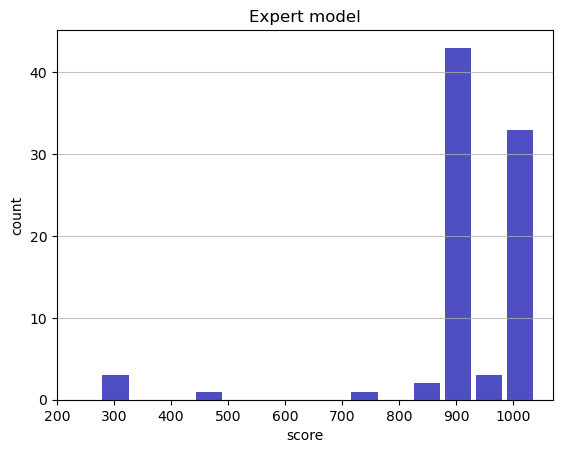

Track generation: 1216..1524 -> 308-tiles track
Epoch: 87
Expert	mean: 923.14	variance: 145.85



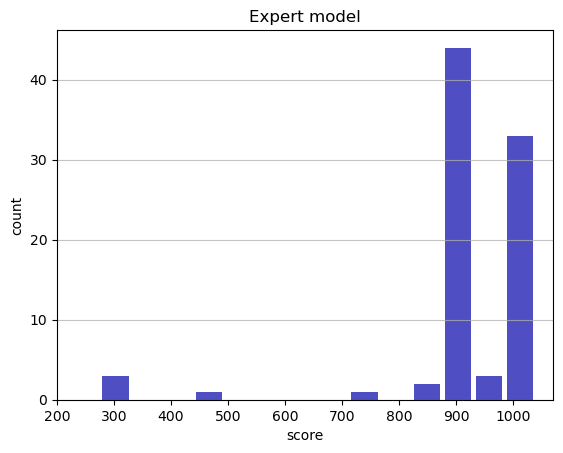

Track generation: 1307..1638 -> 331-tiles track
Epoch: 88
Expert	mean: 924.12	variance: 145.31



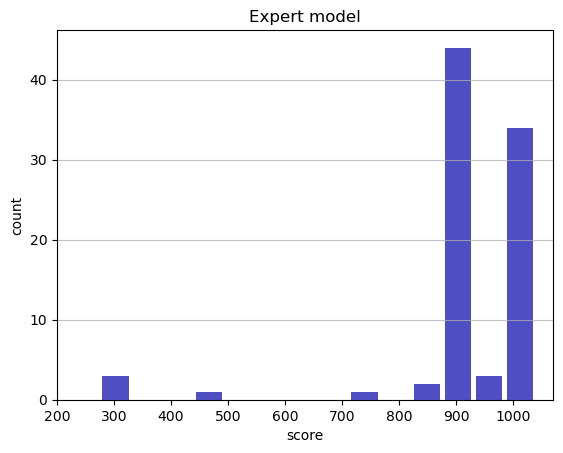

Track generation: 1120..1404 -> 284-tiles track
Epoch: 89
Expert	mean: 924.03	variance: 144.49



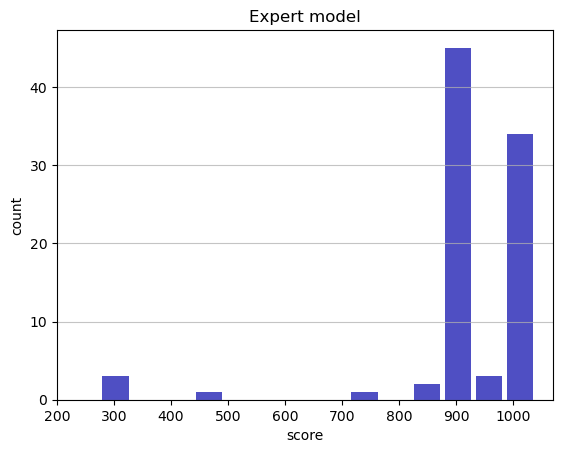

Track generation: 1095..1375 -> 280-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1116..1399 -> 283-tiles track
Epoch: 90
Expert	mean: 923.72	variance: 143.72



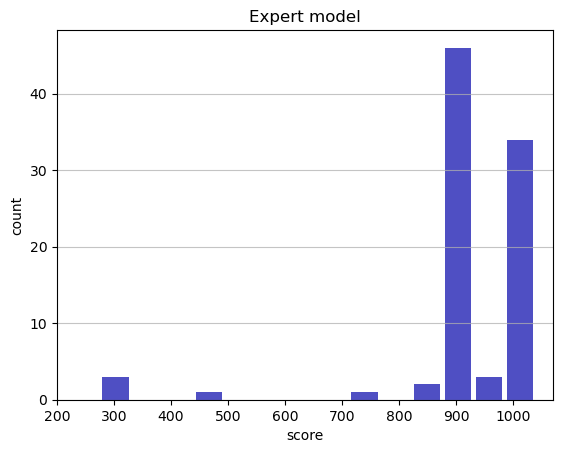

Track generation: 1159..1453 -> 294-tiles track
Epoch: 91
Expert	mean: 923.46	variance: 142.94



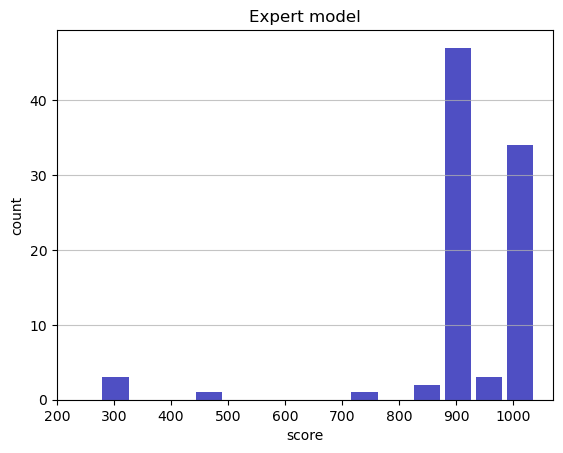

Track generation: 1191..1493 -> 302-tiles track
Epoch: 92
Expert	mean: 924.59	variance: 142.57



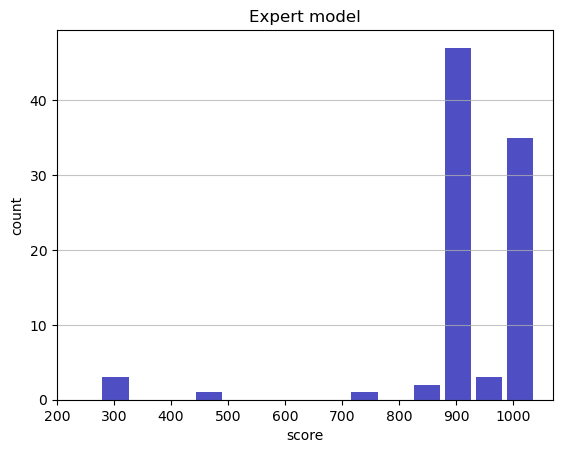

Track generation: 1116..1400 -> 284-tiles track
Epoch: 93
Expert	mean: 925.73	variance: 142.22



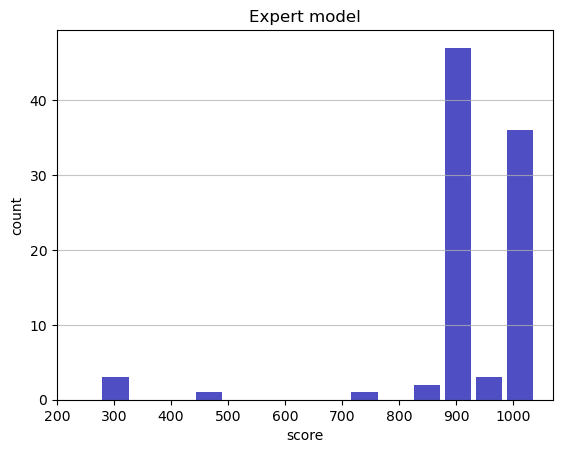

Track generation: 1212..1519 -> 307-tiles track
Epoch: 94
Expert	mean: 926.78	variance: 141.83



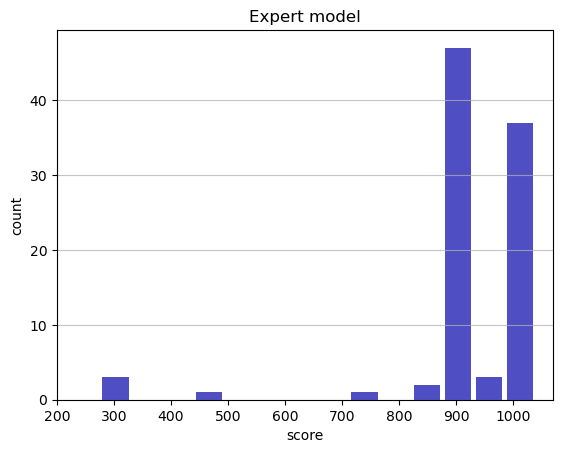

Track generation: 1115..1403 -> 288-tiles track
Epoch: 95
Expert	mean: 927.80	variance: 141.43



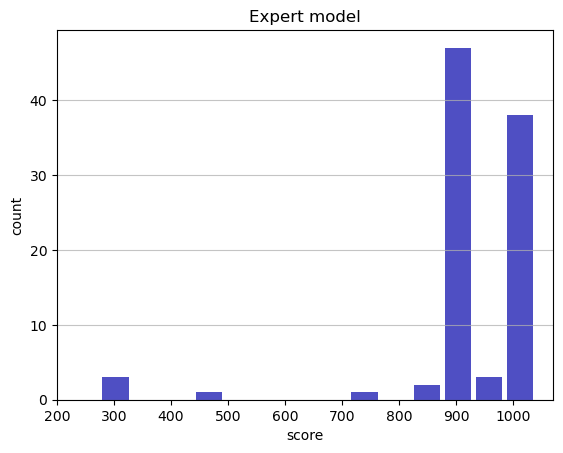

Track generation: 1068..1339 -> 271-tiles track
Epoch: 96
Expert	mean: 927.60	variance: 140.70



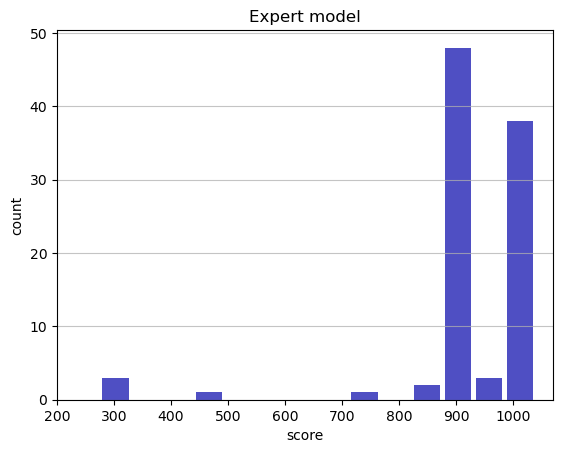

Track generation: 1131..1447 -> 316-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1091..1367 -> 276-tiles track
Epoch: 97
Expert	mean: 927.41	variance: 139.99



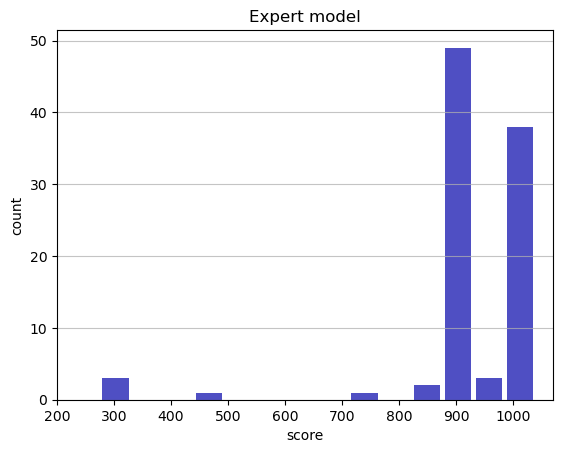

Track generation: 1168..1464 -> 296-tiles track
Epoch: 98
Expert	mean: 926.96	variance: 139.34



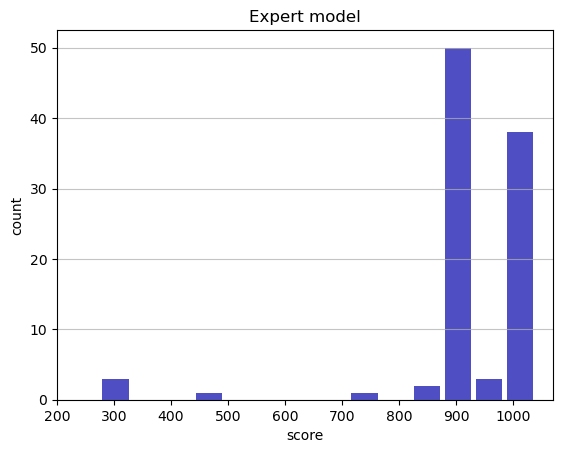

Track generation: 1023..1288 -> 265-tiles track
Epoch: 99
Expert	mean: 928.04	variance: 139.04



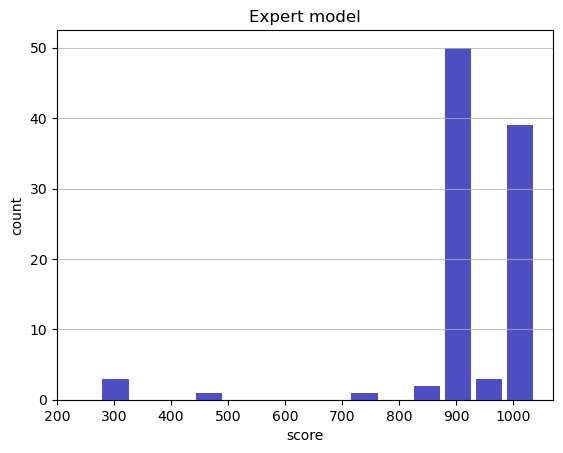

Track generation: 1046..1312 -> 266-tiles track
Epoch: 100
Expert	mean: 929.15	variance: 138.79



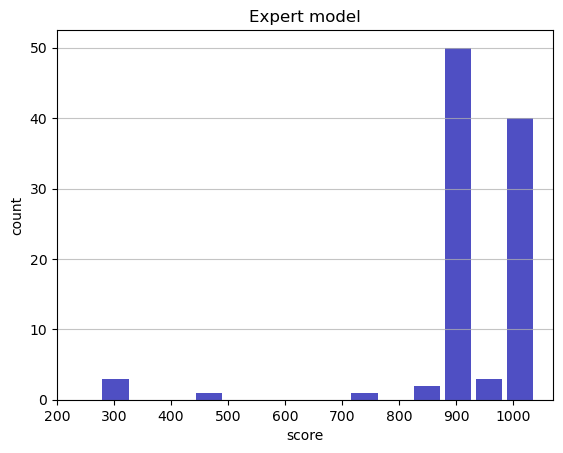

Track generation: 1035..1298 -> 263-tiles track
Epoch: 101
Expert	mean: 929.03	variance: 138.11



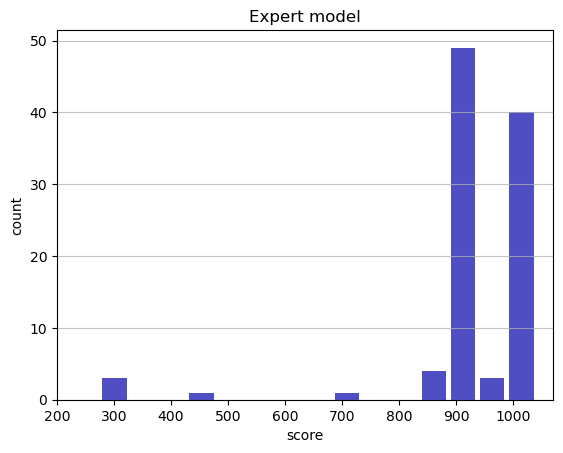

Track generation: 1006..1271 -> 265-tiles track
Epoch: 102
Expert	mean: 928.60	variance: 137.50



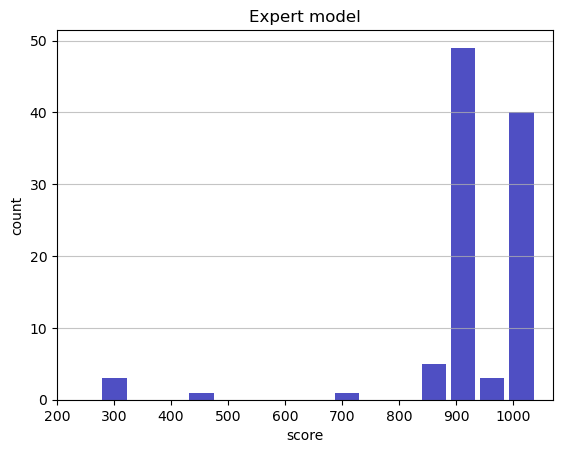

Track generation: 1164..1459 -> 295-tiles track
Epoch: 103
Expert	mean: 928.34	variance: 136.85



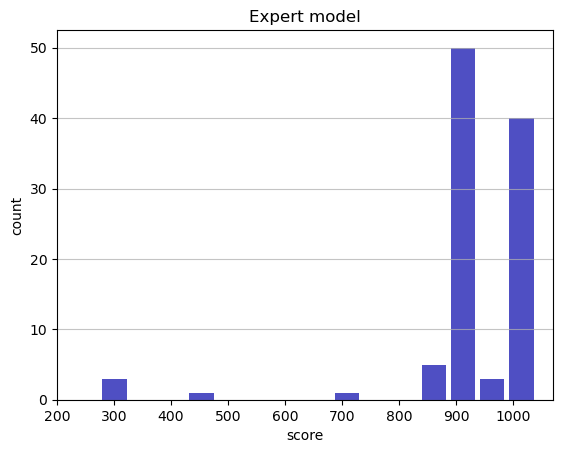

Track generation: 1196..1499 -> 303-tiles track
Epoch: 104
Expert	mean: 928.17	variance: 136.20



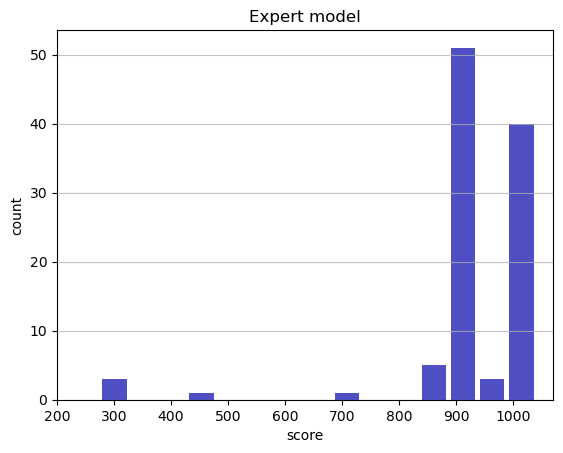

Track generation: 1155..1500 -> 345-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1112..1394 -> 282-tiles track
Epoch: 105
Expert	mean: 928.02	variance: 135.56



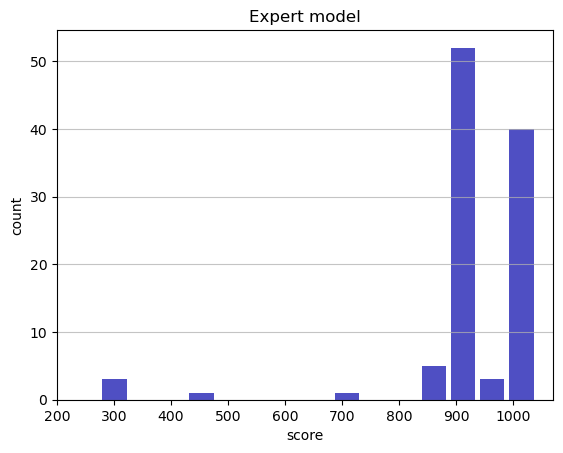

Track generation: 1022..1281 -> 259-tiles track
Epoch: 106
Expert	mean: 929.04	variance: 135.33



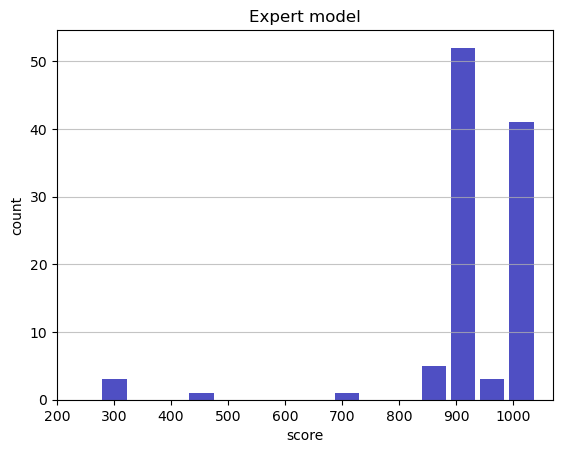

Track generation: 1037..1300 -> 263-tiles track
Epoch: 107
Expert	mean: 930.07	variance: 135.11



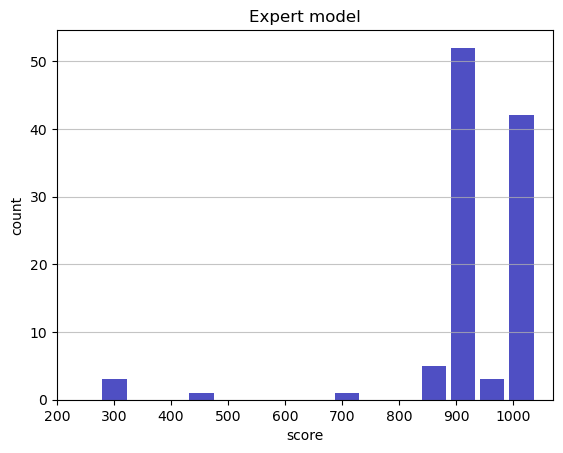

Track generation: 1049..1325 -> 276-tiles track
Epoch: 108
Expert	mean: 929.97	variance: 134.49



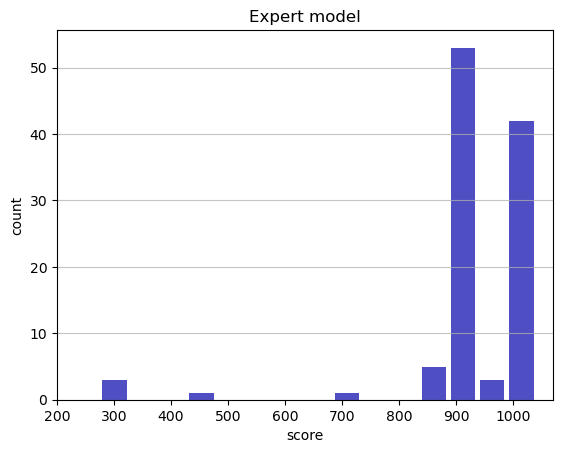

Track generation: 945..1183 -> 238-tiles track
Epoch: 109
Expert	mean: 929.87	variance: 133.87



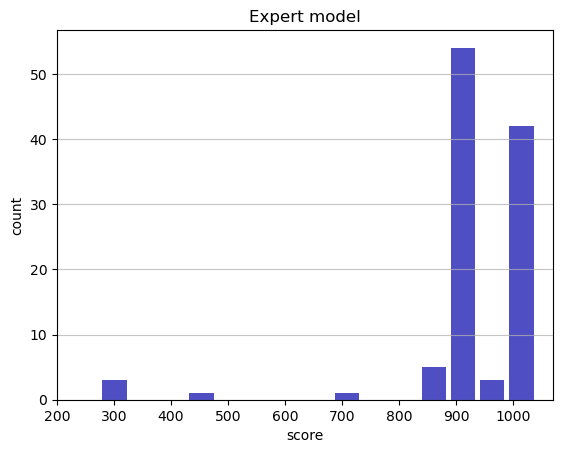

Track generation: 1203..1514 -> 311-tiles track
Epoch: 110
Expert	mean: 929.62	variance: 133.29



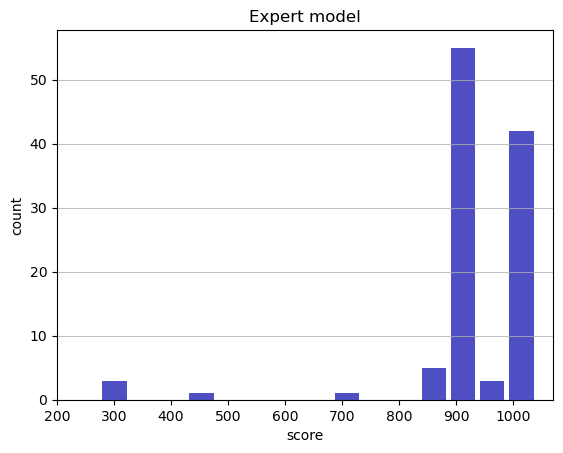

Track generation: 1039..1303 -> 264-tiles track
Epoch: 111
Expert	mean: 930.62	variance: 133.09



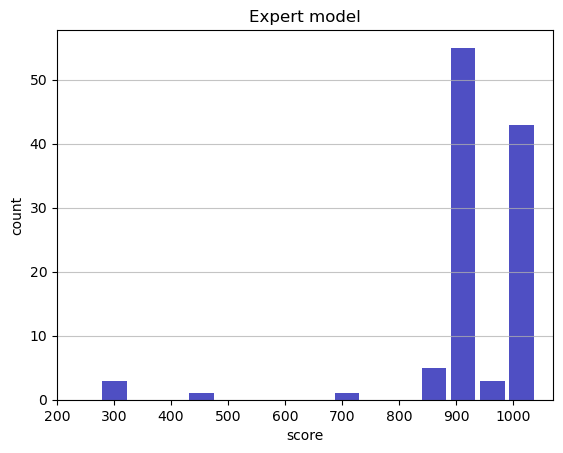

Track generation: 1140..1429 -> 289-tiles track
Epoch: 112
Expert	mean: 931.46	variance: 132.79



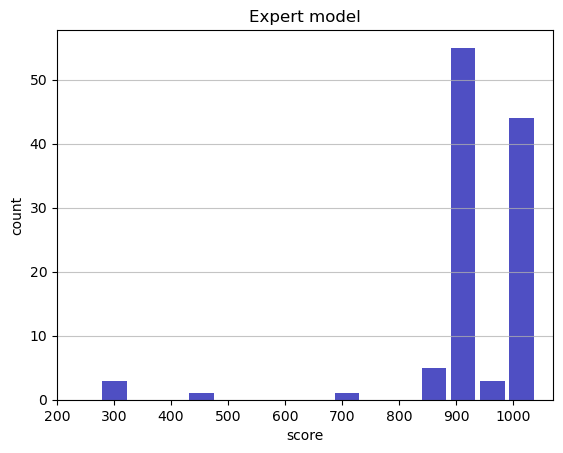

Track generation: 1206..1511 -> 305-tiles track
Epoch: 113
Expert	mean: 932.30	variance: 132.50



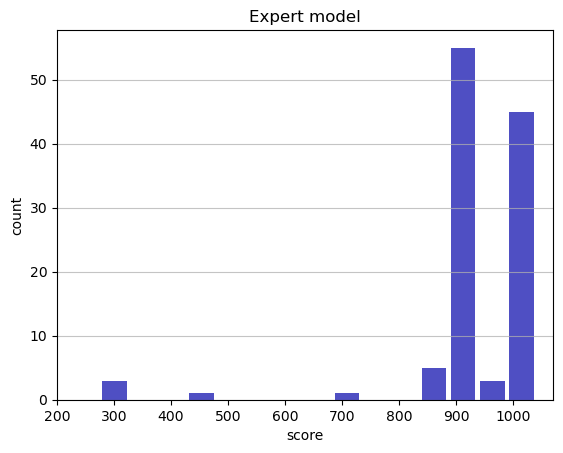

Track generation: 1152..1451 -> 299-tiles track
Epoch: 114
Expert	mean: 933.06	variance: 132.17



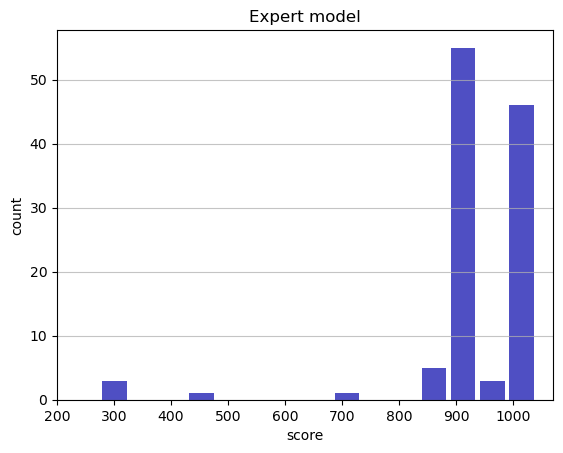

Track generation: 1236..1549 -> 313-tiles track
Epoch: 115
Expert	mean: 932.76	variance: 131.63



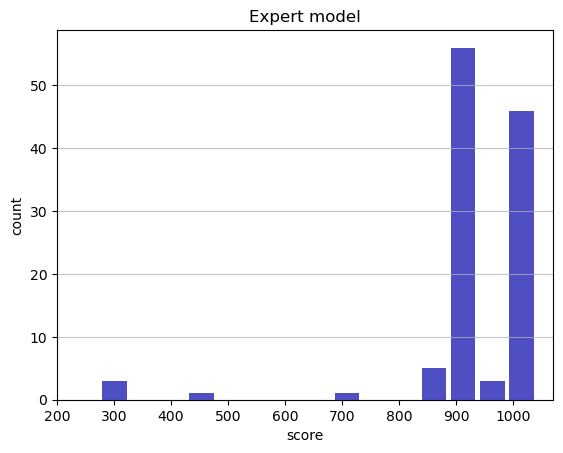

Track generation: 1203..1508 -> 305-tiles track
Epoch: 116
Expert	mean: 932.41	variance: 131.12



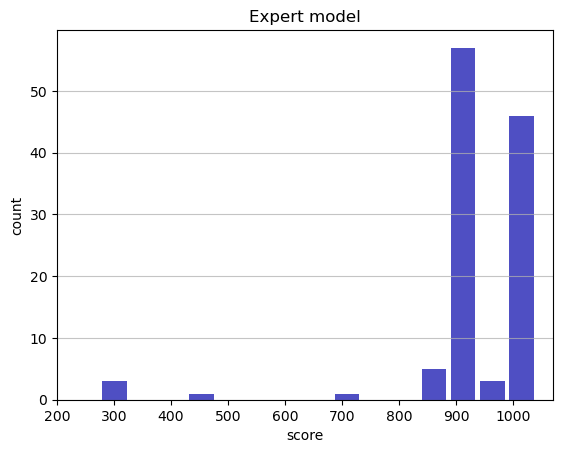

Track generation: 1153..1446 -> 293-tiles track
Epoch: 117
Expert	mean: 932.18	variance: 130.58



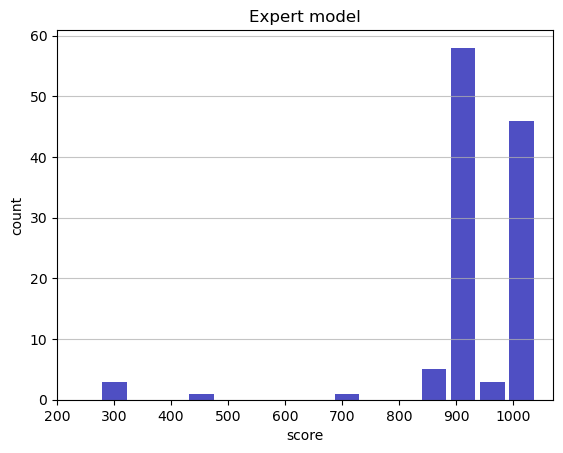

Track generation: 1118..1394 -> 276-tiles track
Epoch: 118
Expert	mean: 933.03	variance: 130.35



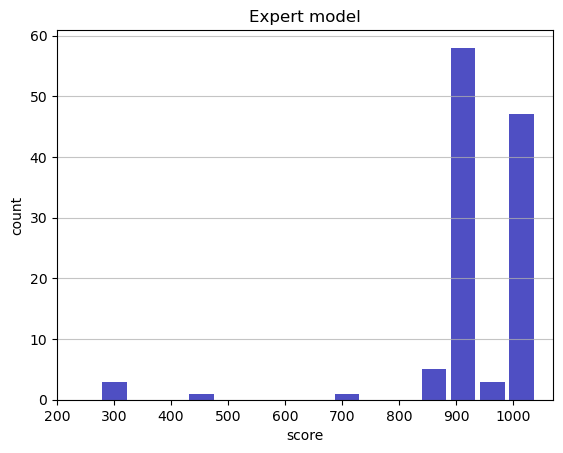

Track generation: 1215..1523 -> 308-tiles track
Epoch: 119
Expert	mean: 932.65	variance: 129.87



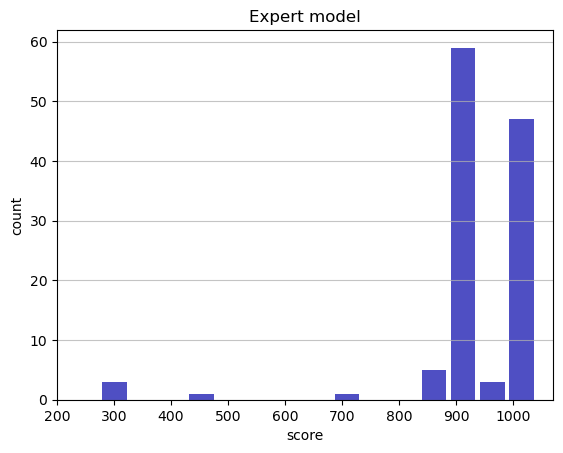

Track generation: 1175..1473 -> 298-tiles track
Epoch: 120
Expert	mean: 928.94	variance: 135.53



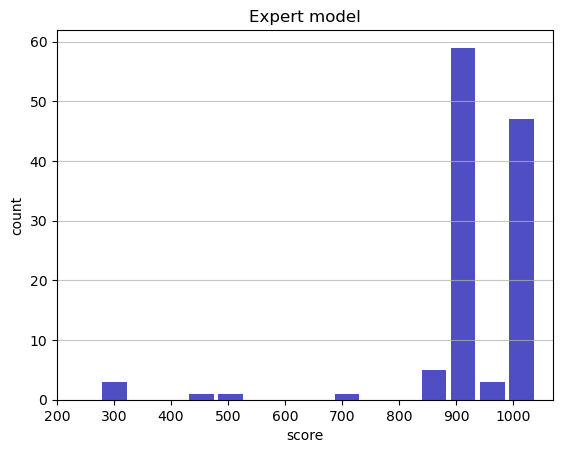

Track generation: 1203..1508 -> 305-tiles track
Epoch: 121
Expert	mean: 929.80	variance: 135.30



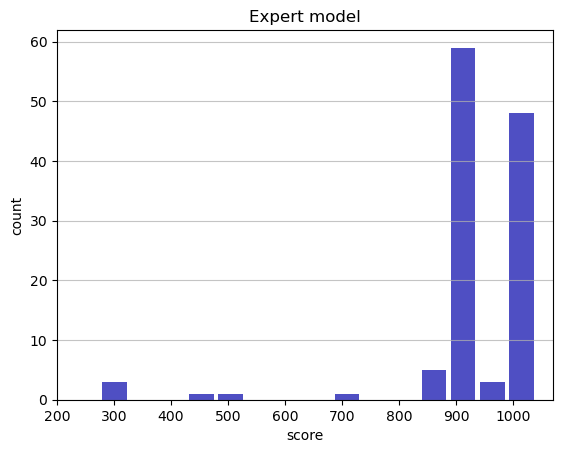

Track generation: 1009..1270 -> 261-tiles track
Epoch: 122
Expert	mean: 930.69	variance: 135.10



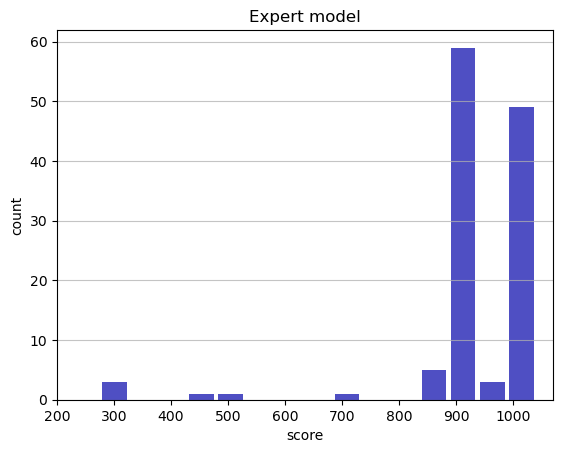

Track generation: 1079..1358 -> 279-tiles track
Epoch: 123
Expert	mean: 931.49	variance: 134.84



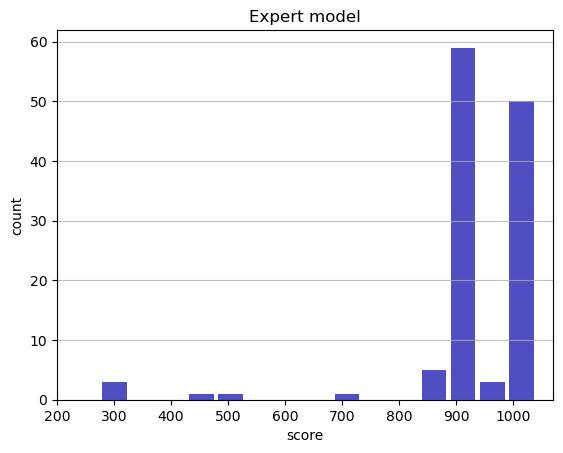

Track generation: 1090..1367 -> 277-tiles track
Epoch: 124
Expert	mean: 932.35	variance: 134.63



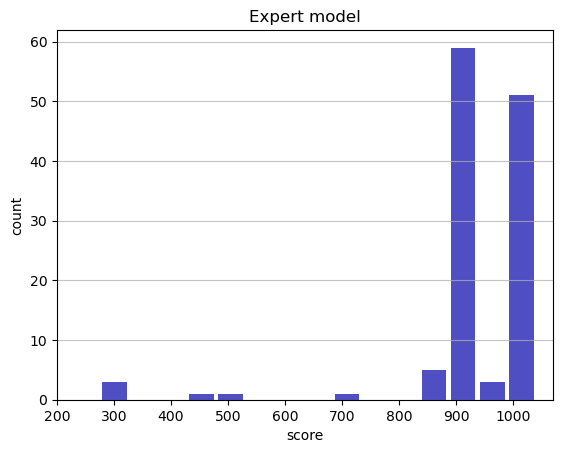

Track generation: 1087..1366 -> 279-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1107..1388 -> 281-tiles track
Epoch: 125
Expert	mean: 932.11	variance: 134.12



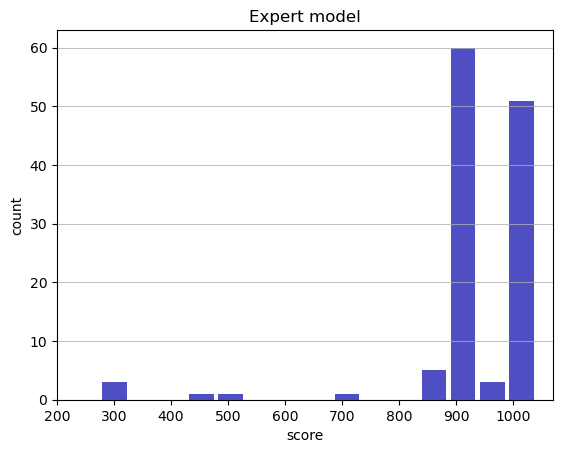

Track generation: 1179..1478 -> 299-tiles track
Epoch: 126
Expert	mean: 932.83	variance: 133.82



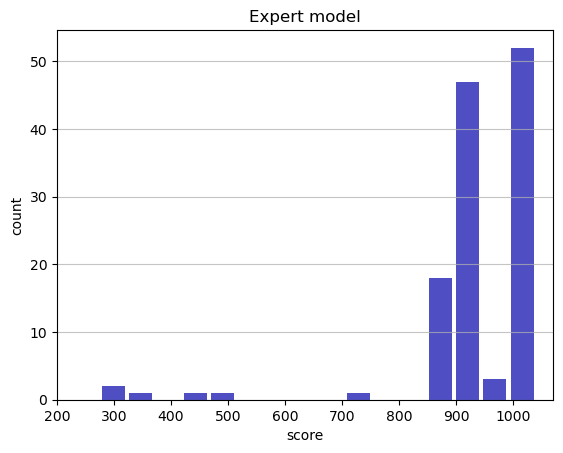

Track generation: 1296..1627 -> 331-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1075..1356 -> 281-tiles track
Epoch: 127
Expert	mean: 932.45	variance: 133.36



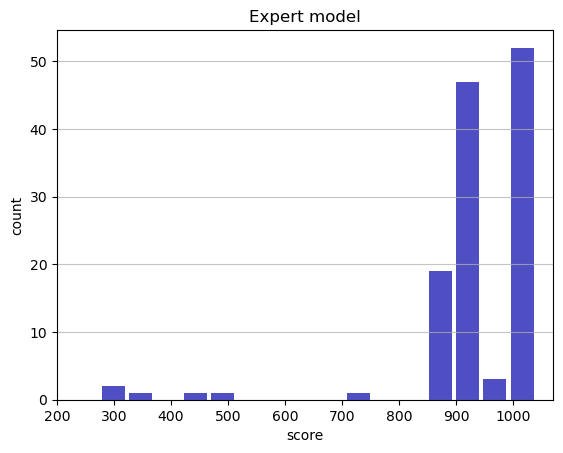

Track generation: 1123..1408 -> 285-tiles track
Epoch: 128
Expert	mean: 932.22	variance: 132.87



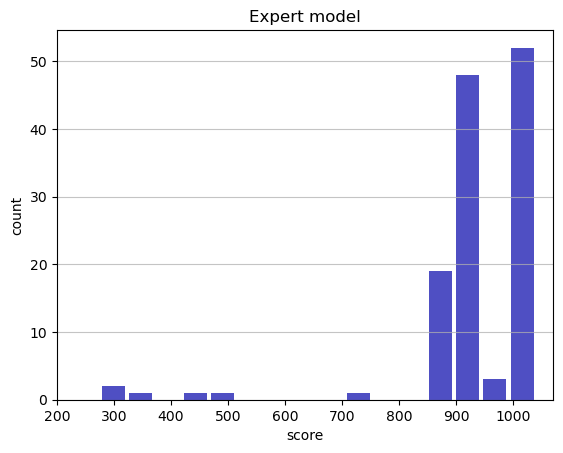

Track generation: 1272..1594 -> 322-tiles track
Epoch: 129
Expert	mean: 931.97	variance: 132.38



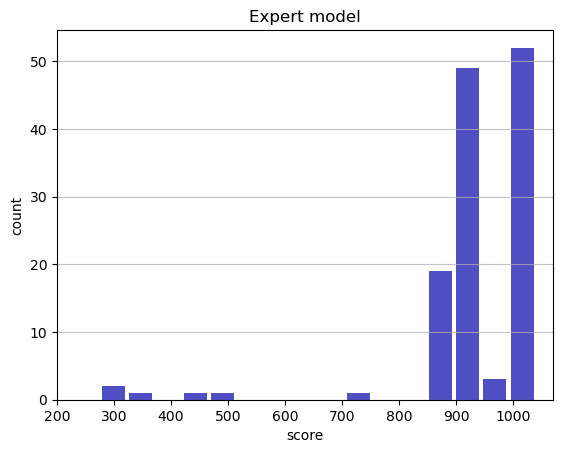

Track generation: 951..1193 -> 242-tiles track
Epoch: 130
Expert	mean: 932.80	variance: 132.21



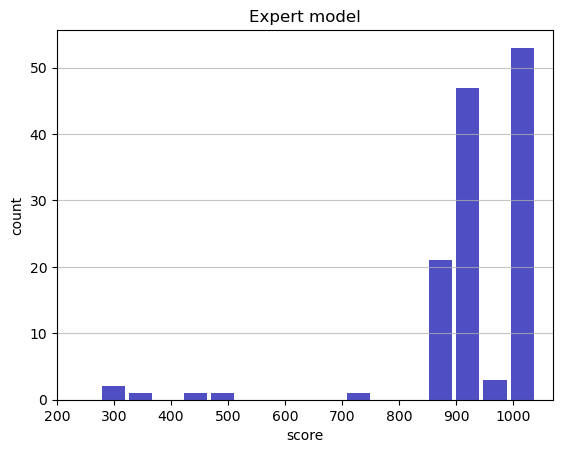

Track generation: 995..1248 -> 253-tiles track
Epoch: 131
Expert	mean: 932.73	variance: 131.70



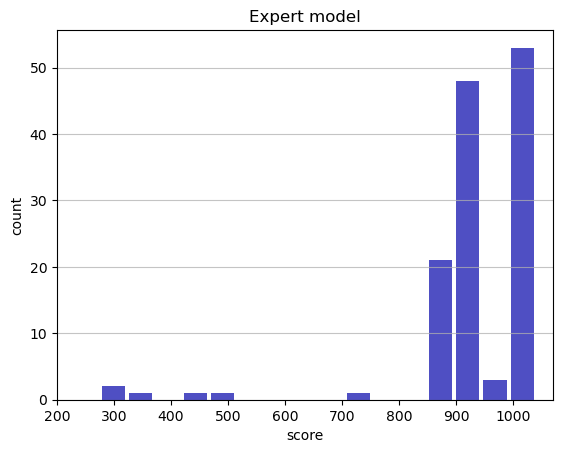

Track generation: 1161..1455 -> 294-tiles track
Epoch: 132
Expert	mean: 933.41	variance: 131.44



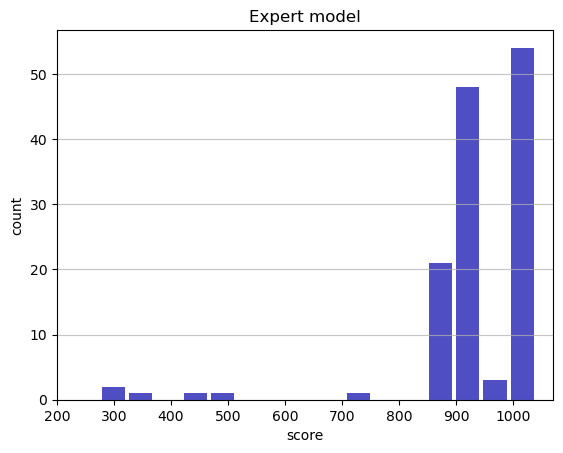

Track generation: 1167..1463 -> 296-tiles track
Epoch: 133
Expert	mean: 934.08	variance: 131.17



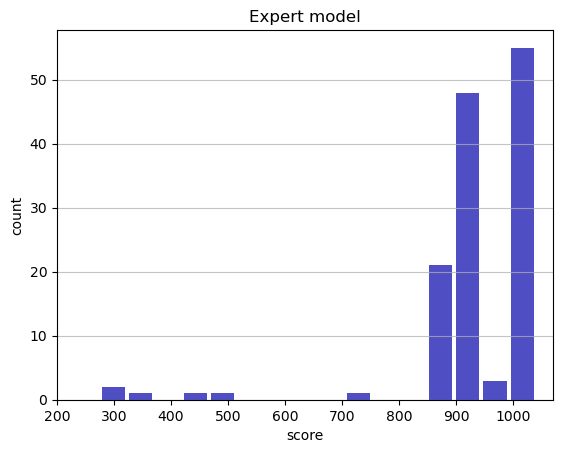

Track generation: 1196..1499 -> 303-tiles track
Epoch: 134
Expert	mean: 933.89	variance: 130.69



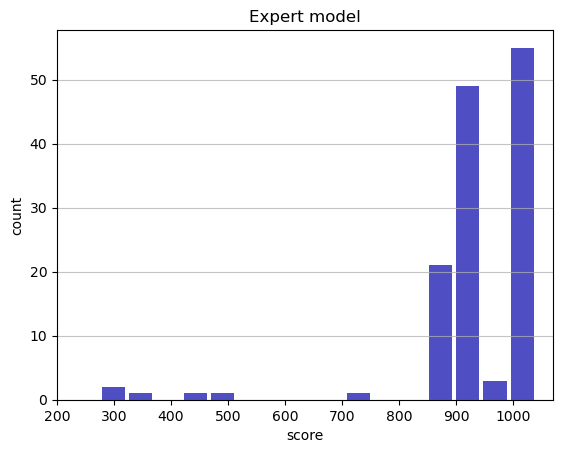

Track generation: 1160..1454 -> 294-tiles track
Epoch: 135
Expert	mean: 934.62	variance: 130.48



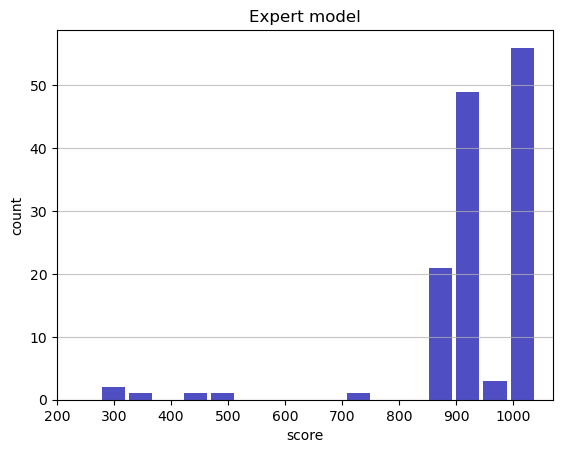

Track generation: 1103..1383 -> 280-tiles track
Epoch: 136
Expert	mean: 934.45	variance: 130.01



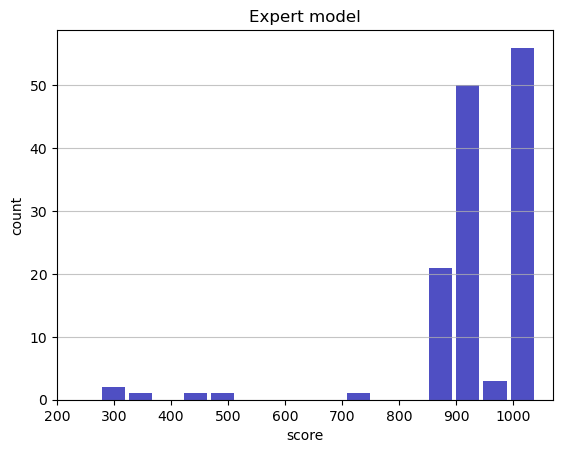

Track generation: 1296..1624 -> 328-tiles track
Epoch: 137
Expert	mean: 934.15	variance: 129.59



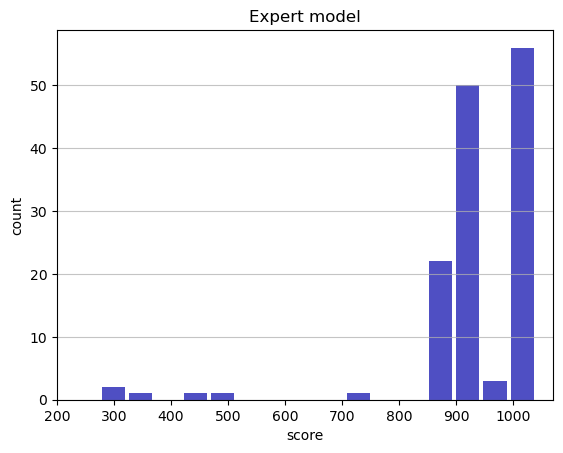

Track generation: 1188..1490 -> 302-tiles track
Epoch: 138
Expert	mean: 934.79	variance: 129.34



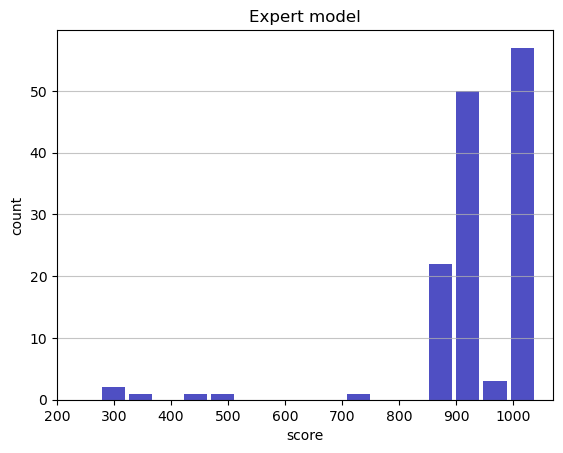

Track generation: 1092..1369 -> 277-tiles track
Epoch: 139
Expert	mean: 934.64	variance: 128.88



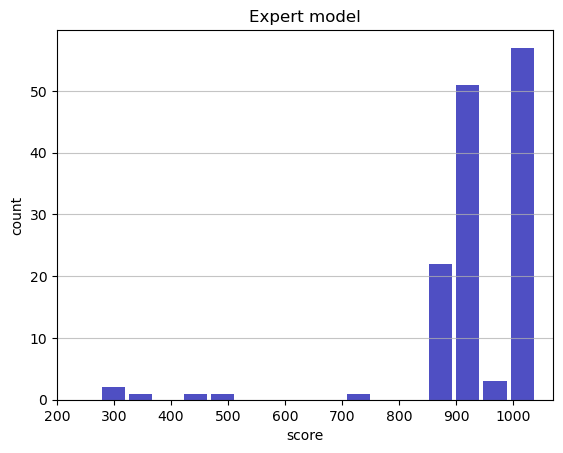

Track generation: 1037..1307 -> 270-tiles track
Epoch: 140
Expert	mean: 935.34	variance: 128.69



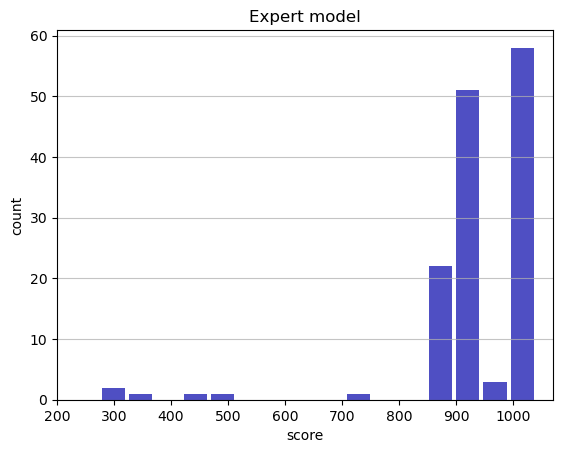

Track generation: 1011..1268 -> 257-tiles track
Epoch: 141
Expert	mean: 935.14	variance: 128.25



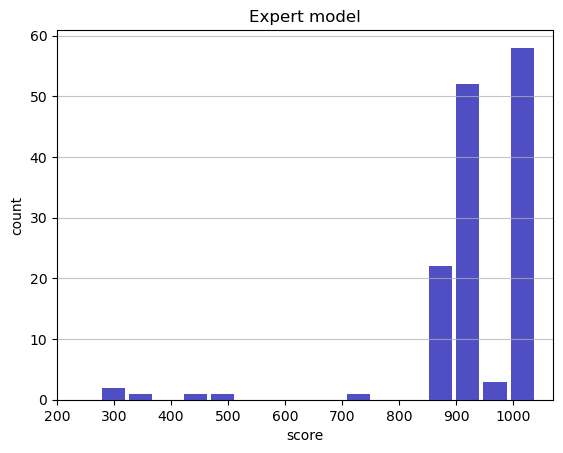

Track generation: 1319..1653 -> 334-tiles track
Epoch: 142
Expert	mean: 934.75	variance: 127.88



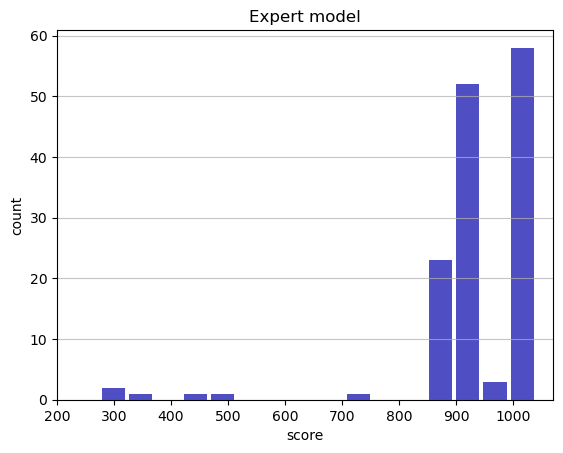

Track generation: 1216..1524 -> 308-tiles track
Epoch: 143
Expert	mean: 934.54	variance: 127.46



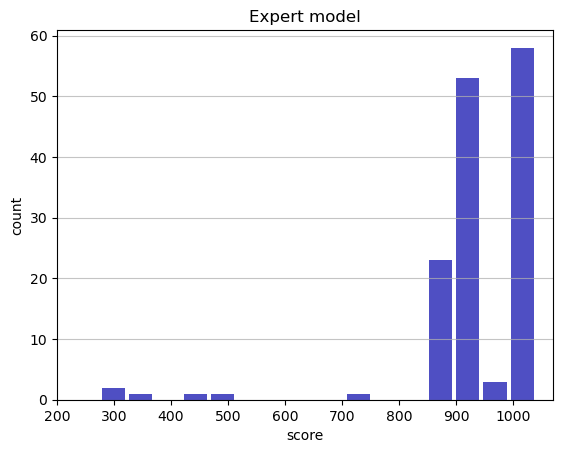

Track generation: 1186..1487 -> 301-tiles track
Epoch: 144
Expert	mean: 934.14	variance: 127.11



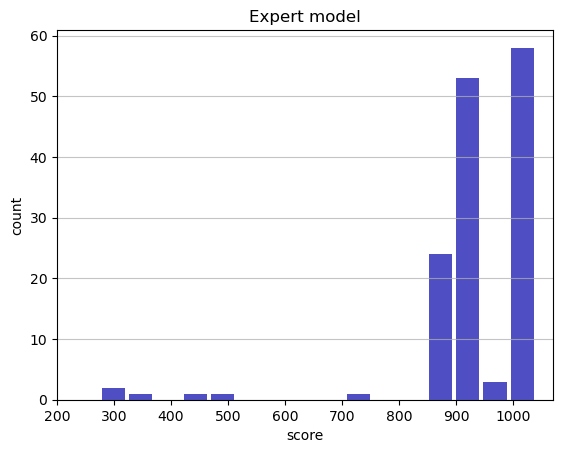

Track generation: 1219..1535 -> 316-tiles track
Epoch: 145
Expert	mean: 934.72	variance: 126.85



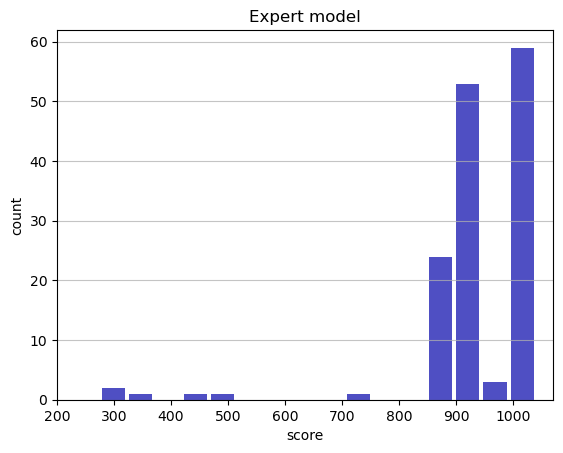

Track generation: 1155..1448 -> 293-tiles track
Epoch: 146
Expert	mean: 935.37	variance: 126.66



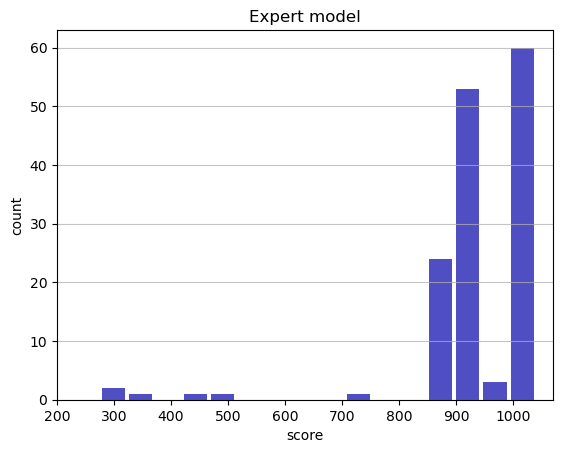

Track generation: 1216..1524 -> 308-tiles track
Epoch: 147
Expert	mean: 935.16	variance: 126.25



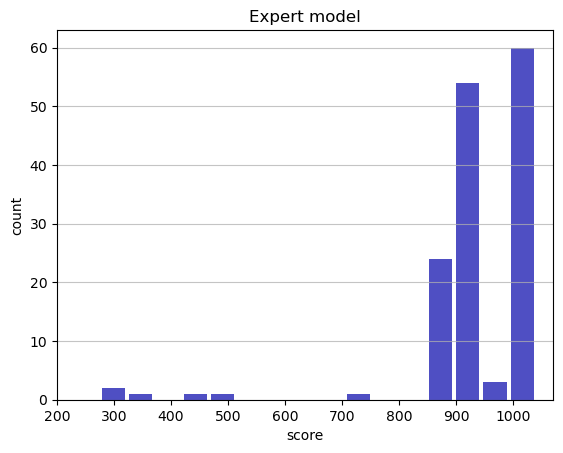

Track generation: 1000..1261 -> 261-tiles track
Epoch: 148
Expert	mean: 935.02	variance: 125.84



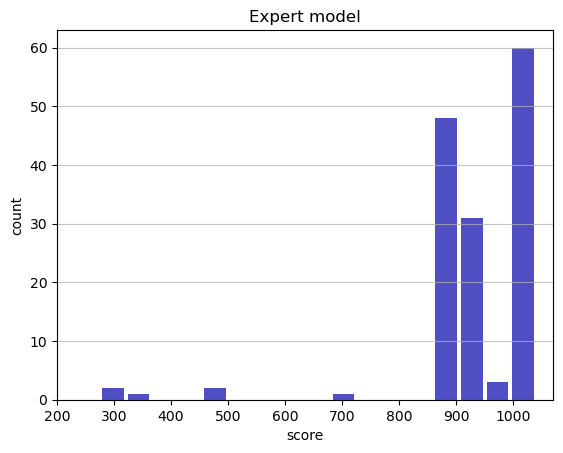

Track generation: 1257..1576 -> 319-tiles track
Epoch: 149
Expert	mean: 934.69	variance: 125.48



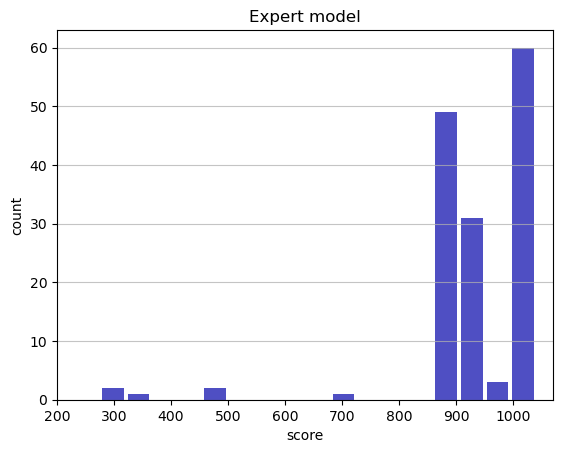

Track generation: 1079..1361 -> 282-tiles track
Epoch: 150
Expert	mean: 934.49	variance: 125.08



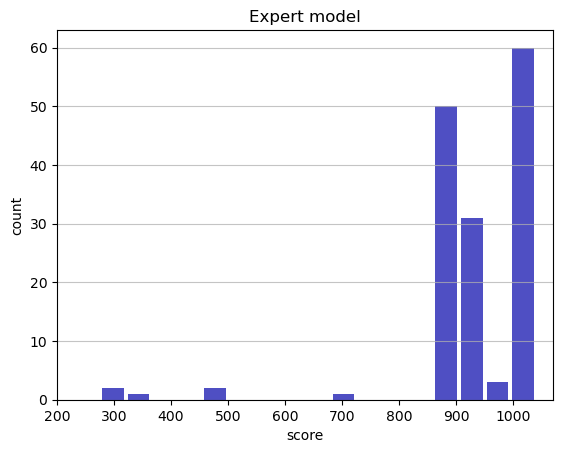

Track generation: 1317..1650 -> 333-tiles track
Epoch: 151
Expert	mean: 934.24	variance: 124.71



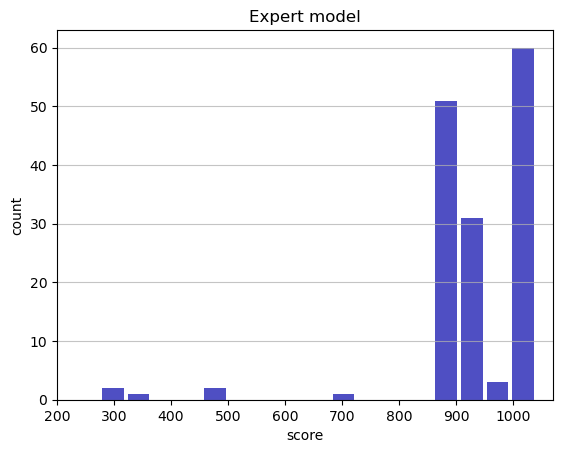

Track generation: 1140..1429 -> 289-tiles track
Epoch: 152
Expert	mean: 934.87	variance: 124.54



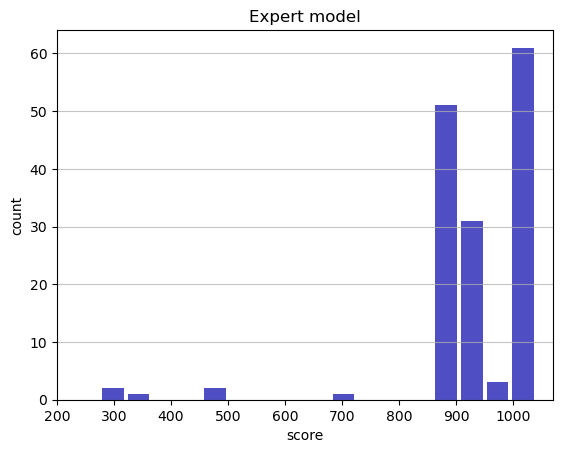

Track generation: 1166..1462 -> 296-tiles track
Epoch: 153
Expert	mean: 930.90	variance: 133.44



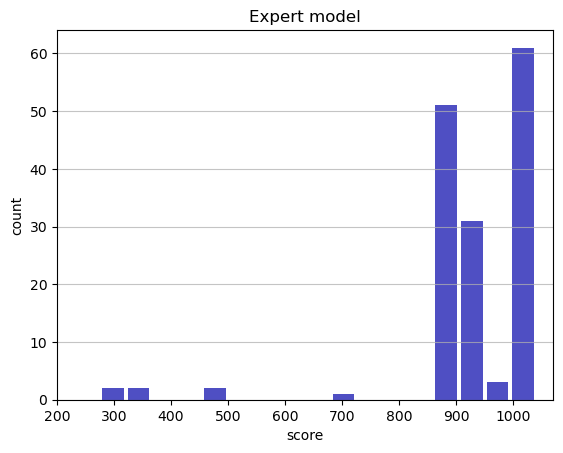

Track generation: 1209..1515 -> 306-tiles track
Epoch: 154
Expert	mean: 931.49	variance: 133.21



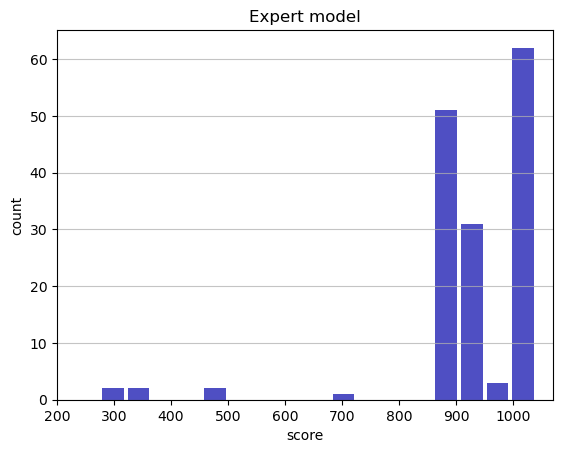

Track generation: 1136..1424 -> 288-tiles track
Epoch: 155
Expert	mean: 931.21	variance: 132.83



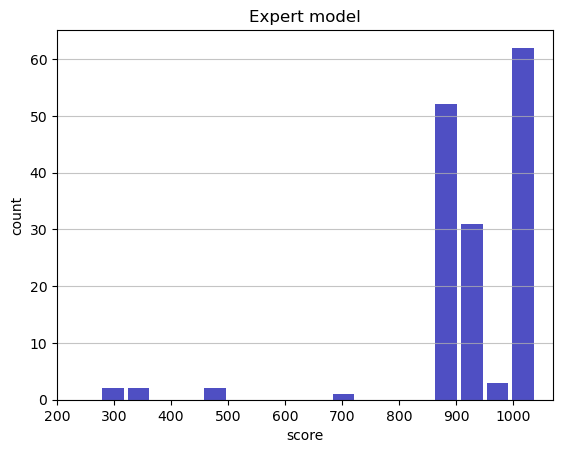

Track generation: 1107..1395 -> 288-tiles track
Epoch: 156
Expert	mean: 931.80	variance: 132.60



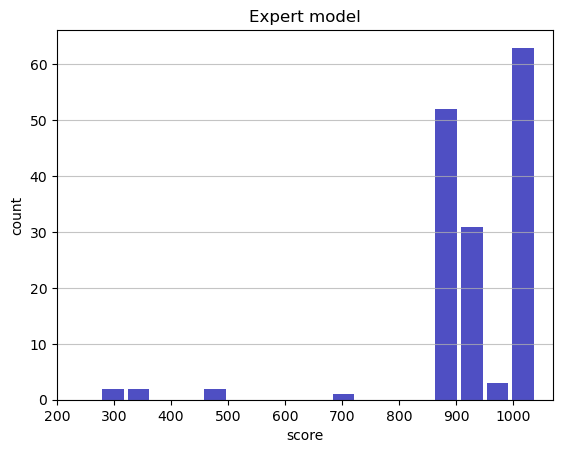

Track generation: 1176..1474 -> 298-tiles track
Epoch: 157
Expert	mean: 931.59	variance: 132.20



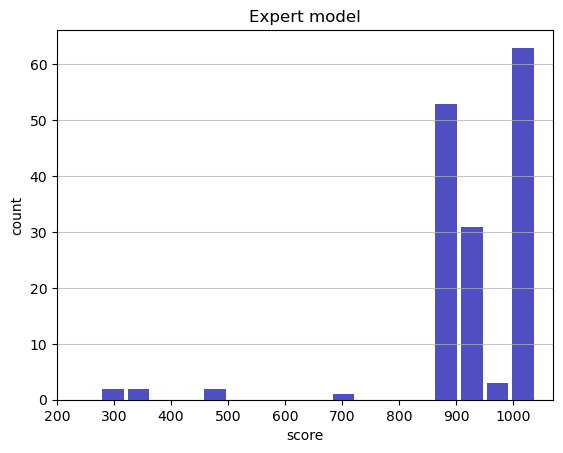

Track generation: 1014..1280 -> 266-tiles track
Epoch: 158
Expert	mean: 932.22	variance: 132.02



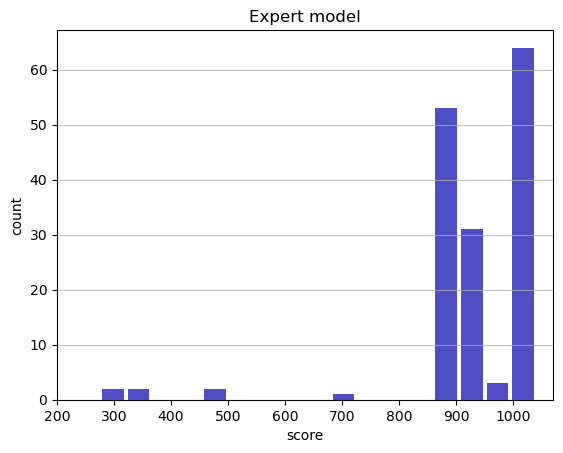

Track generation: 964..1213 -> 249-tiles track
Epoch: 159
Expert	mean: 932.14	variance: 131.61



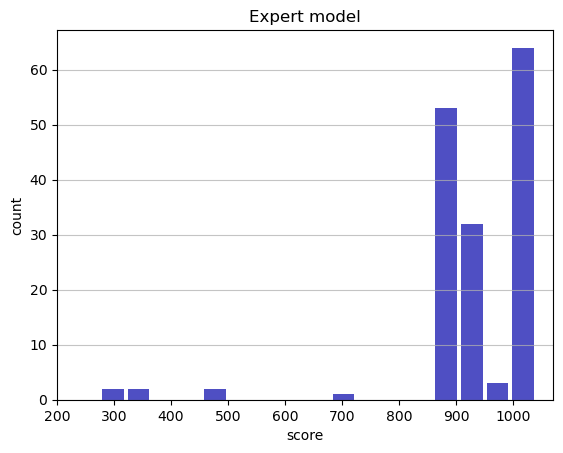

Track generation: 1240..1554 -> 314-tiles track
Epoch: 160
Expert	mean: 931.89	variance: 131.23



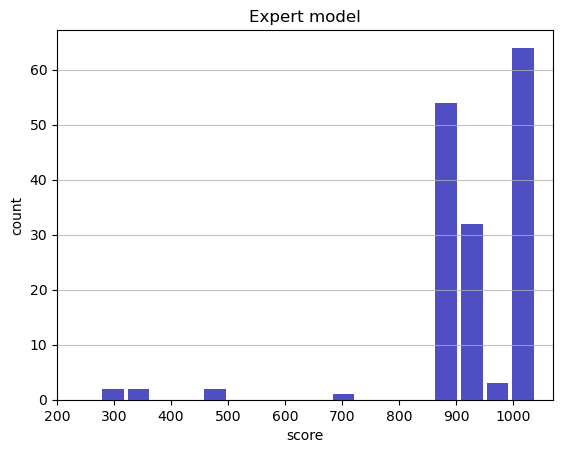

Track generation: 1132..1419 -> 287-tiles track
Epoch: 161
Expert	mean: 931.72	variance: 130.84



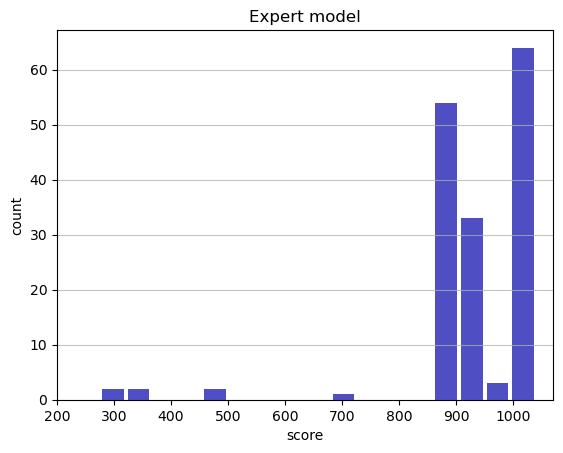

Track generation: 1020..1281 -> 261-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1123..1408 -> 285-tiles track
Epoch: 162
Expert	mean: 931.58	variance: 130.45



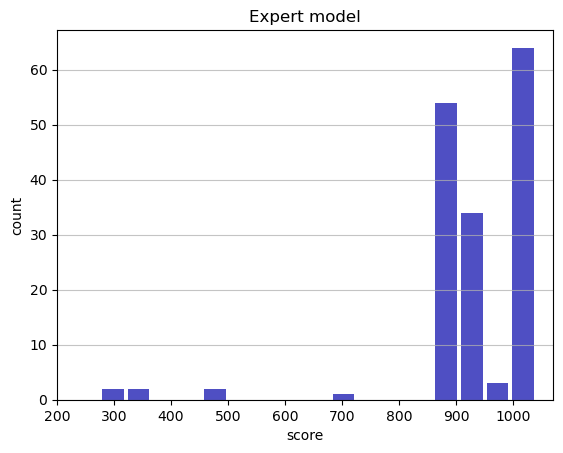

Track generation: 1142..1440 -> 298-tiles track
Epoch: 163
Expert	mean: 931.34	variance: 130.09



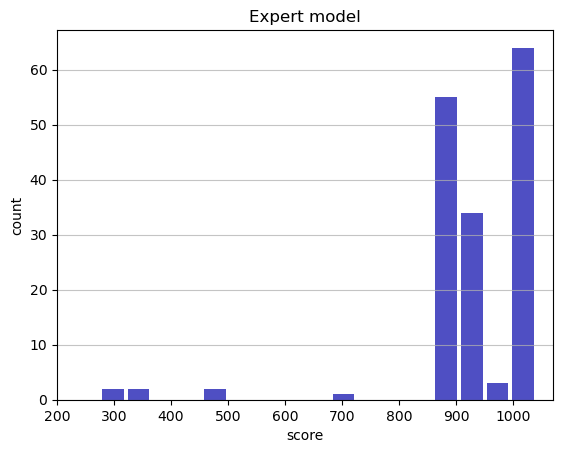

Track generation: 999..1258 -> 259-tiles track
Epoch: 164
Expert	mean: 931.94	variance: 129.91



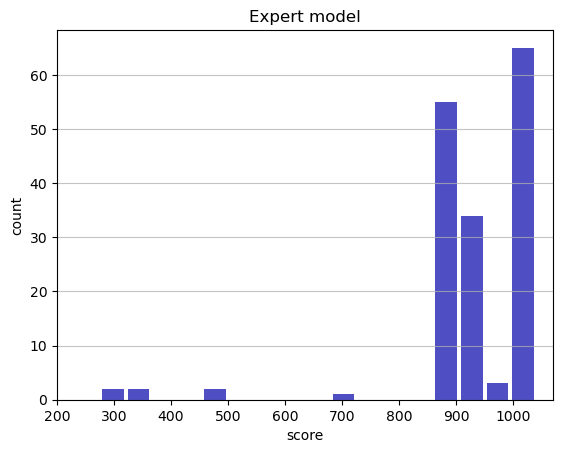

Track generation: 1259..1533 -> 274-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1293..1621 -> 328-tiles track
Epoch: 165
Expert	mean: 932.19	variance: 129.56



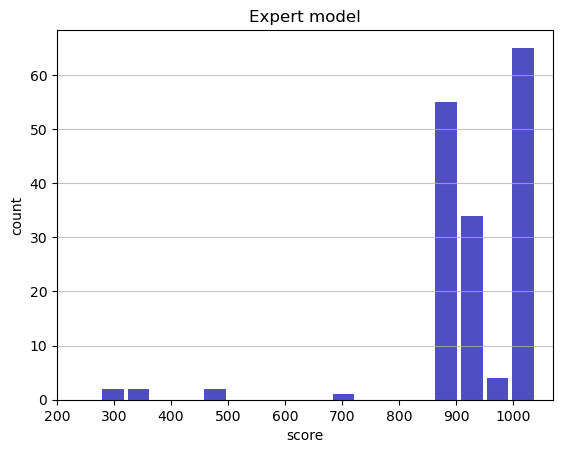

Track generation: 1148..1439 -> 291-tiles track
Epoch: 166
Expert	mean: 932.75	variance: 129.37



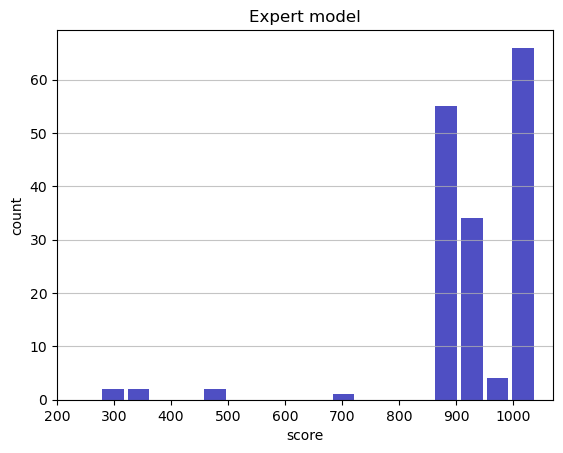

Track generation: 1040..1304 -> 264-tiles track
Epoch: 167
Expert	mean: 932.65	variance: 128.99



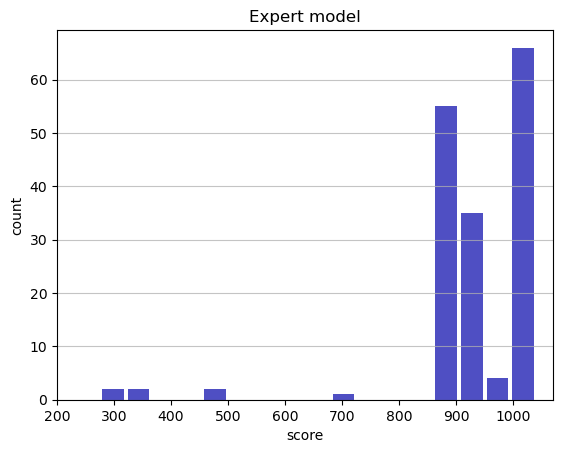

Track generation: 1257..1575 -> 318-tiles track
Epoch: 168
Expert	mean: 932.47	variance: 128.63



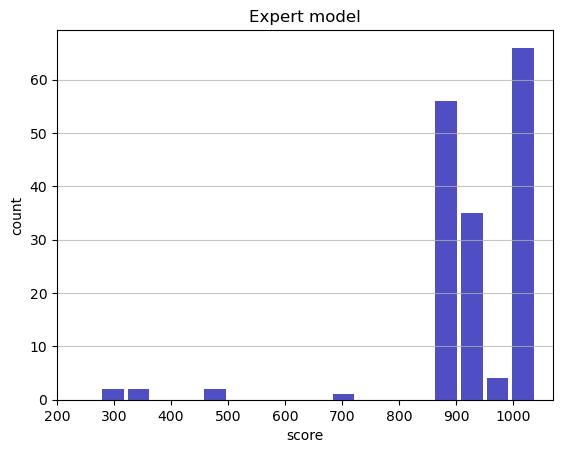

Track generation: 1142..1438 -> 296-tiles track
Epoch: 169
Expert	mean: 933.07	variance: 128.48



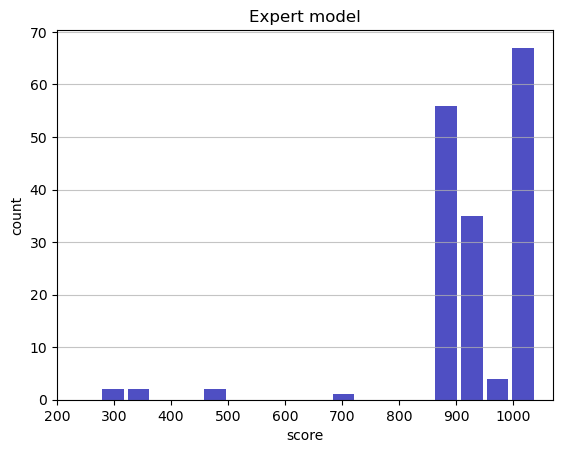

Track generation: 1216..1524 -> 308-tiles track
Epoch: 170
Expert	mean: 929.27	variance: 137.31



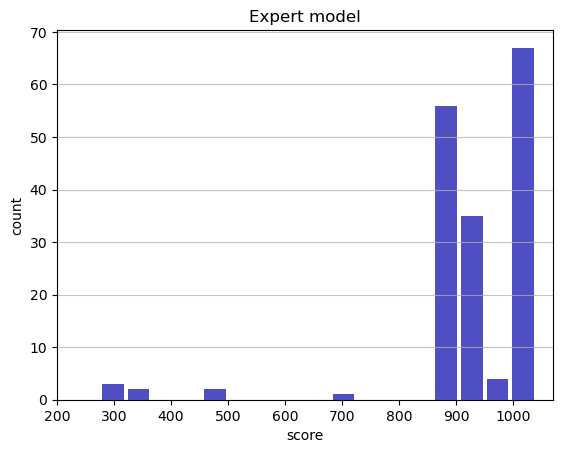

Track generation: 1098..1384 -> 286-tiles track
Epoch: 171
Expert	mean: 929.03	variance: 136.94



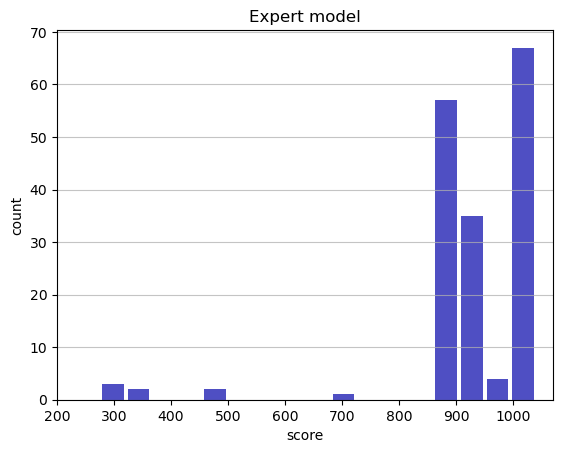

Track generation: 1099..1383 -> 284-tiles track
Epoch: 172
Expert	mean: 929.61	variance: 136.75



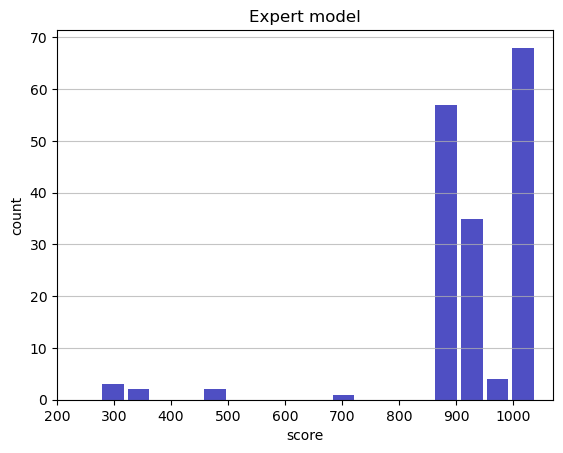

Track generation: 1160..1459 -> 299-tiles track
Epoch: 173
Expert	mean: 930.17	variance: 136.55



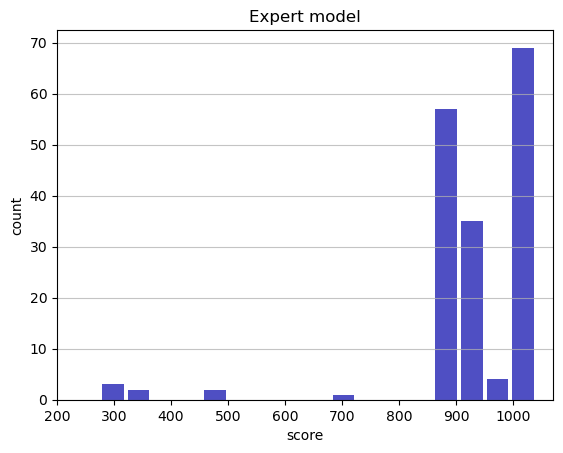

Track generation: 1167..1463 -> 296-tiles track
Epoch: 174
Expert	mean: 926.99	variance: 142.45



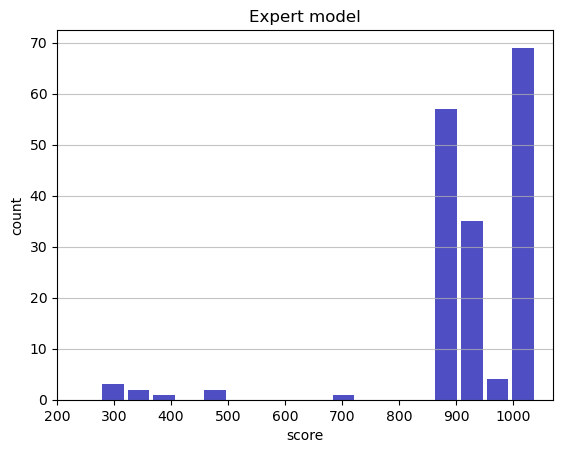

Track generation: 1153..1445 -> 292-tiles track
Epoch: 175
Expert	mean: 926.87	variance: 142.05



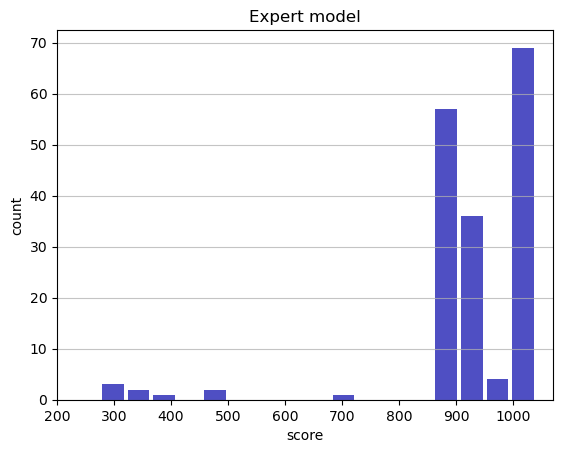

Track generation: 1145..1435 -> 290-tiles track
Epoch: 176
Expert	mean: 927.41	variance: 141.83



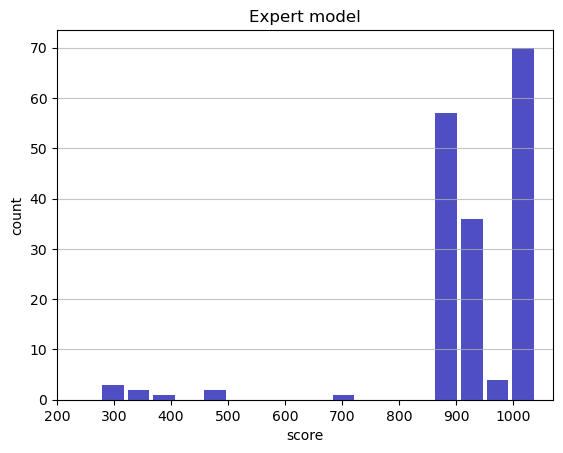

Track generation: 1028..1289 -> 261-tiles track
Epoch: 177
Expert	mean: 927.29	variance: 141.44



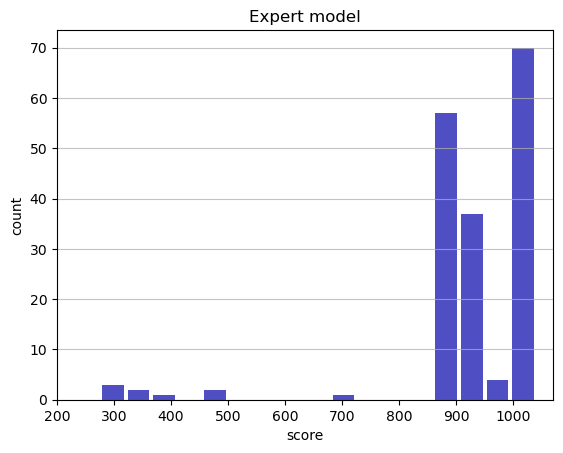

Track generation: 1227..1538 -> 311-tiles track
Epoch: 178
Expert	mean: 927.07	variance: 141.07



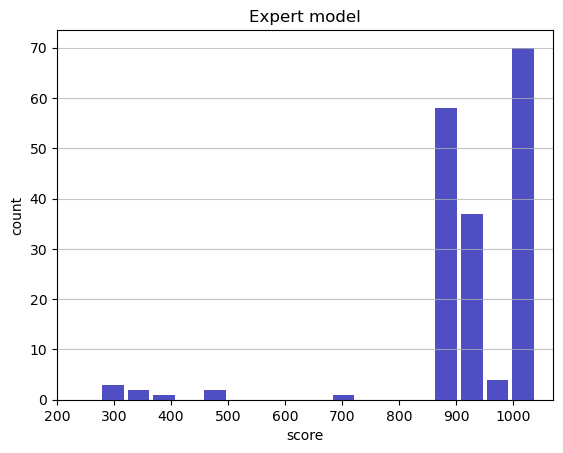

Track generation: 1180..1479 -> 299-tiles track
Epoch: 179
Expert	mean: 926.93	variance: 140.69



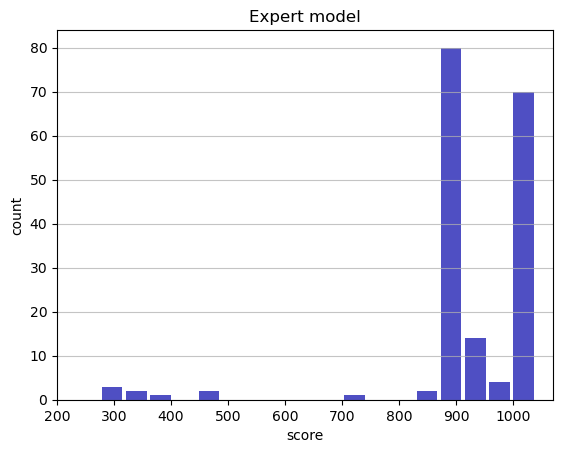

Track generation: 1103..1383 -> 280-tiles track
Epoch: 180
Expert	mean: 927.51	variance: 140.51



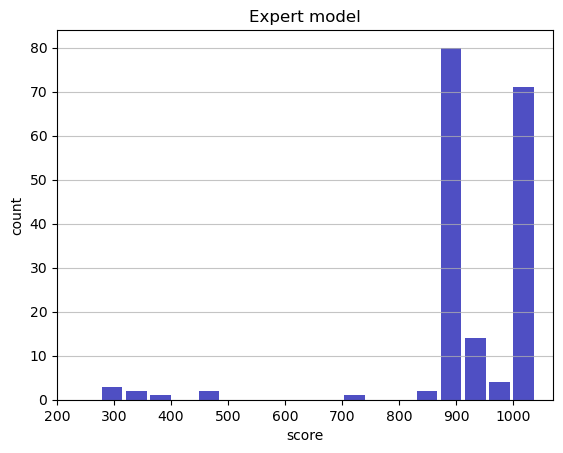

Track generation: 1067..1338 -> 271-tiles track
Epoch: 181
Expert	mean: 927.39	variance: 140.13



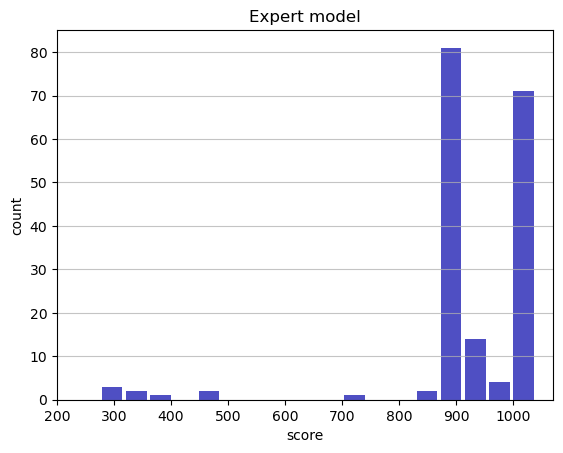

Track generation: 1151..1449 -> 298-tiles track
Epoch: 182
Expert	mean: 927.90	variance: 139.91



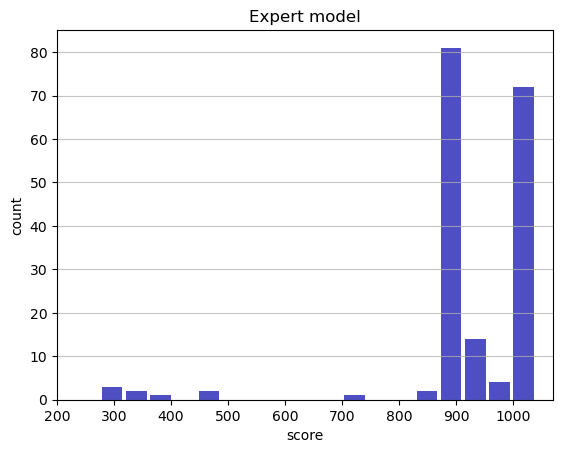

Track generation: 1285..1610 -> 325-tiles track
Epoch: 183
Expert	mean: 927.75	variance: 139.54



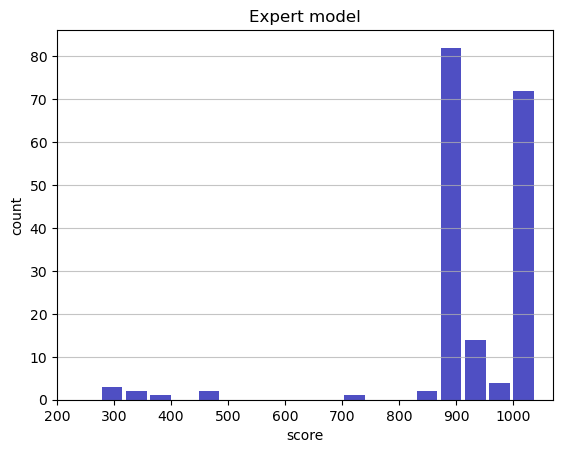

Track generation: 1027..1288 -> 261-tiles track
Epoch: 184
Expert	mean: 928.33	variance: 139.39



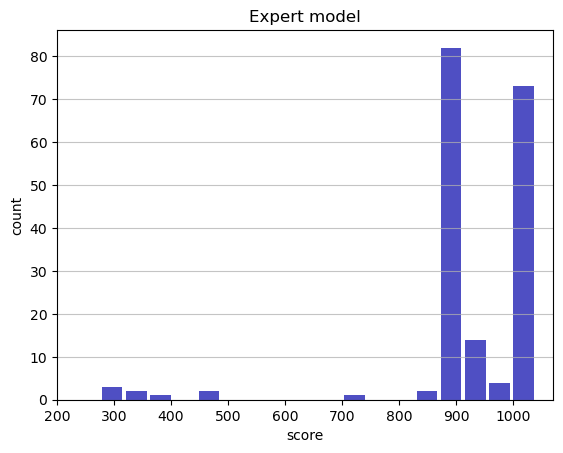

Track generation: 1069..1346 -> 277-tiles track
Epoch: 185
Expert	mean: 928.89	variance: 139.21



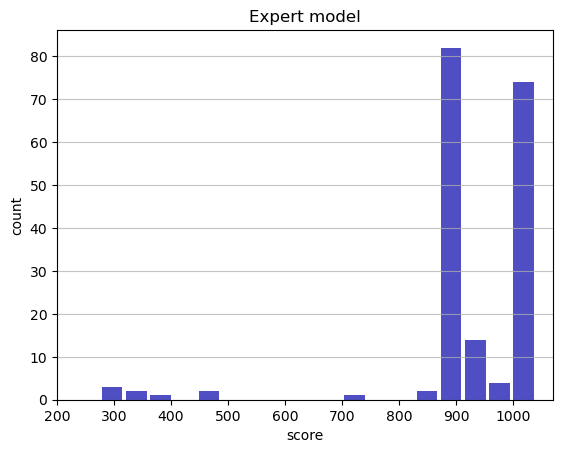

Track generation: 1131..1418 -> 287-tiles track
Epoch: 186
Expert	mean: 928.81	variance: 138.84



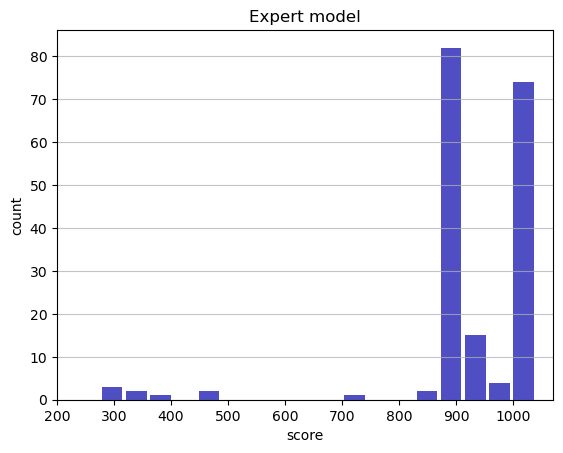

Track generation: 1072..1344 -> 272-tiles track
Epoch: 187
Expert	mean: 928.72	variance: 138.48



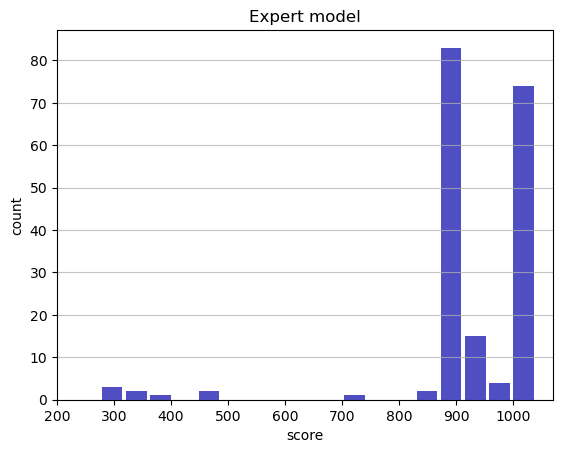

Track generation: 1132..1419 -> 287-tiles track
Epoch: 188
Expert	mean: 929.25	variance: 138.30



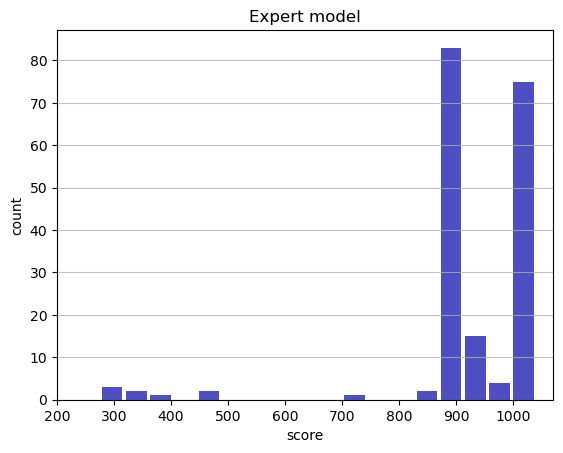

Track generation: 1086..1362 -> 276-tiles track
Epoch: 189
Expert	mean: 929.10	variance: 137.95



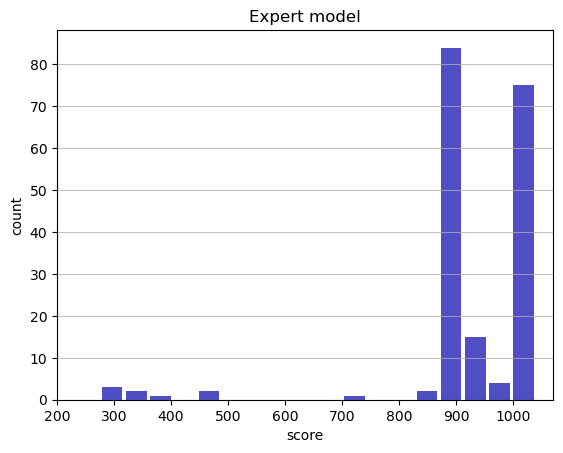

Track generation: 1078..1357 -> 279-tiles track
Epoch: 190
Expert	mean: 929.00	variance: 137.59



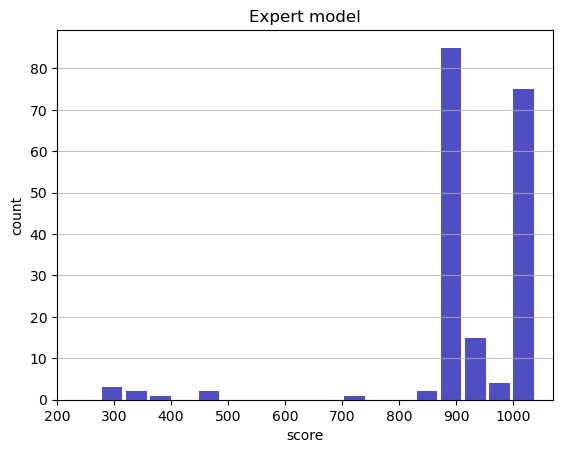

Track generation: 1123..1413 -> 290-tiles track
Epoch: 191
Expert	mean: 928.89	variance: 137.24



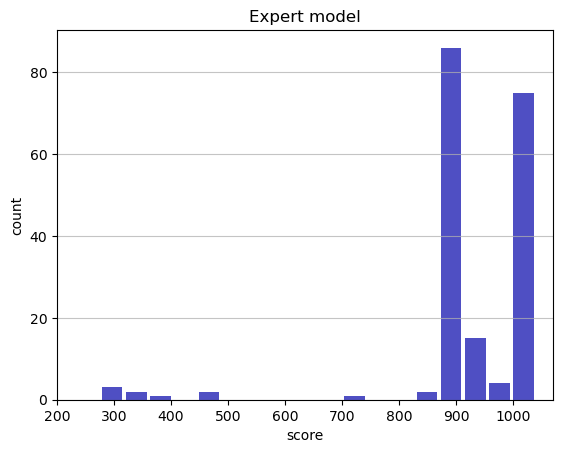

Track generation: 1192..1494 -> 302-tiles track
Epoch: 192
Expert	mean: 929.38	variance: 137.05



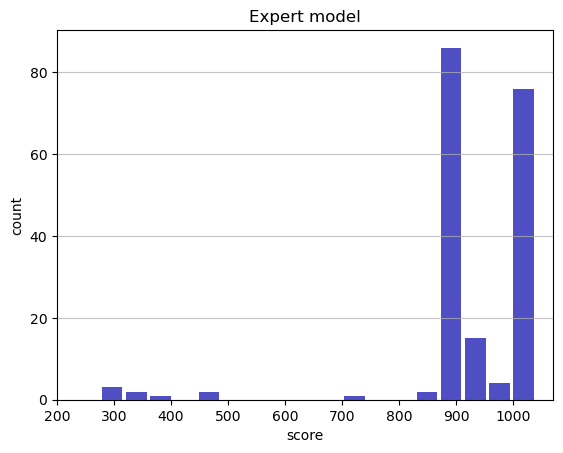

Track generation: 1175..1473 -> 298-tiles track
Epoch: 193
Expert	mean: 929.27	variance: 136.70



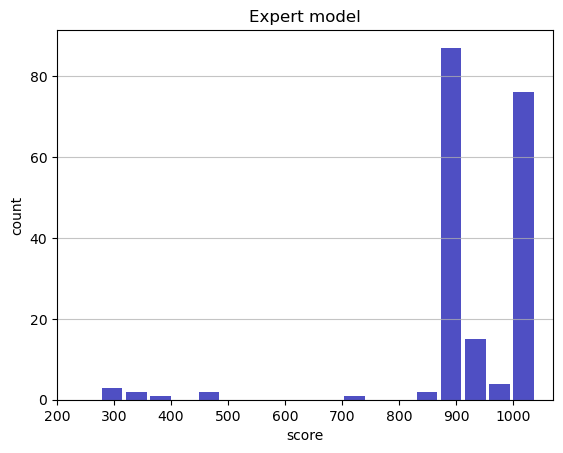

Track generation: 1003..1258 -> 255-tiles track
Epoch: 194
Expert	mean: 929.83	variance: 136.58



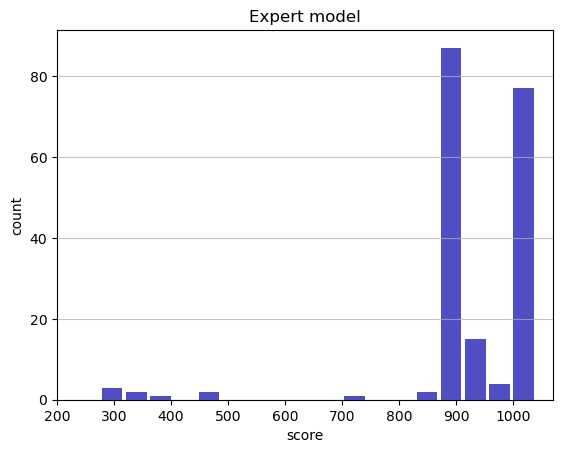

Track generation: 1001..1258 -> 257-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1186..1488 -> 302-tiles track
Epoch: 195
Expert	mean: 929.58	variance: 136.27



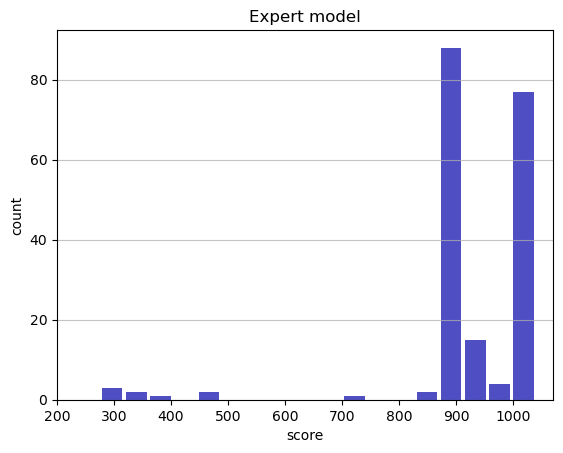

Track generation: 1235..1548 -> 313-tiles track
Epoch: 196
Expert	mean: 929.31	variance: 135.97



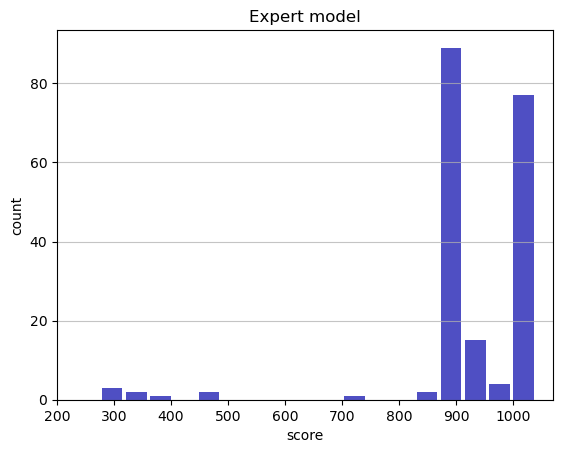

Track generation: 1084..1359 -> 275-tiles track
Epoch: 197
Expert	mean: 929.85	variance: 135.84



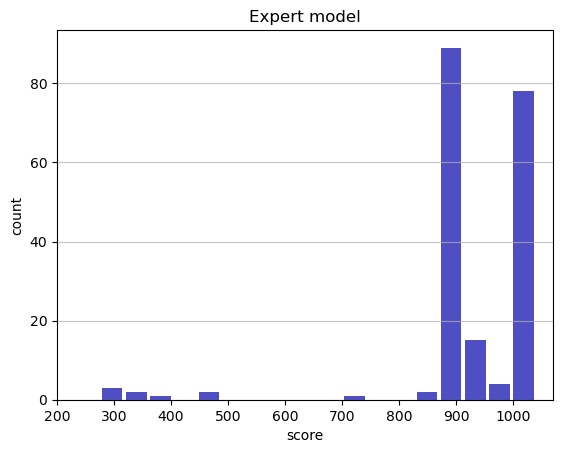

Track generation: 1030..1293 -> 263-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1060..1329 -> 269-tiles track
Epoch: 198
Expert	mean: 930.41	variance: 135.72



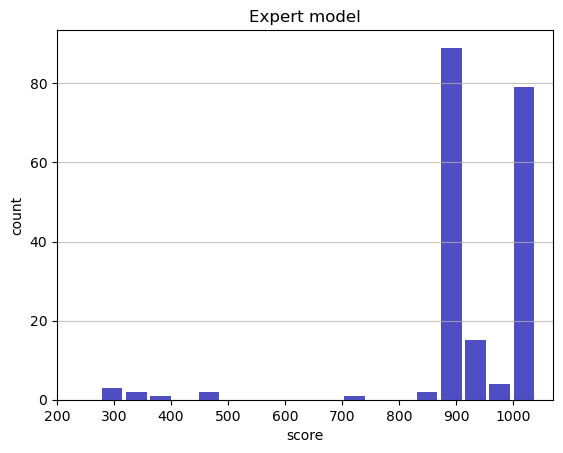

Track generation: 1236..1549 -> 313-tiles track
Epoch: 199
Expert	mean: 930.24	variance: 135.40



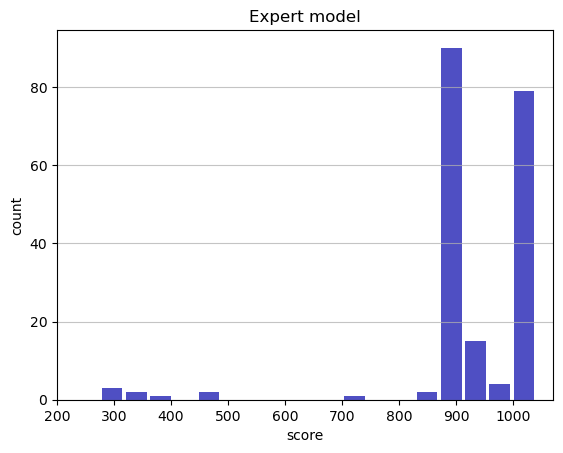

Track generation: 1048..1319 -> 271-tiles track
Epoch: 200
Expert	mean: 929.89	variance: 135.15



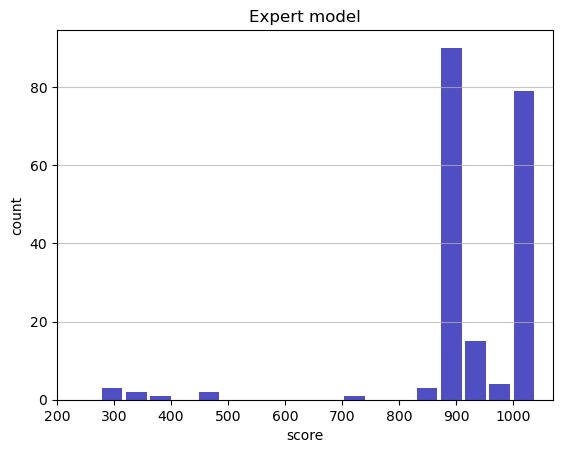

Track generation: 1116..1404 -> 288-tiles track
Epoch: 201
Expert	mean: 930.38	variance: 134.98



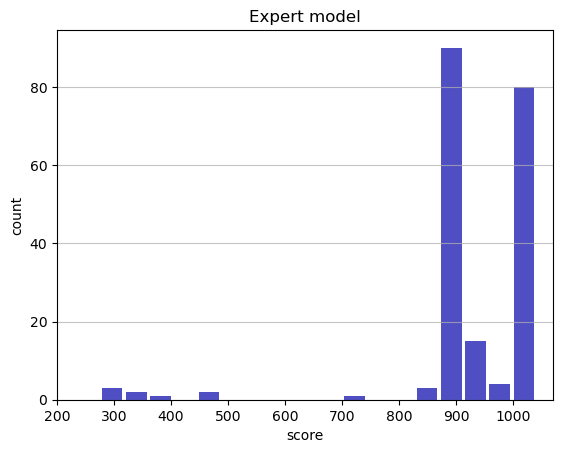

Track generation: 1068..1339 -> 271-tiles track
Epoch: 202
Expert	mean: 930.91	variance: 134.87



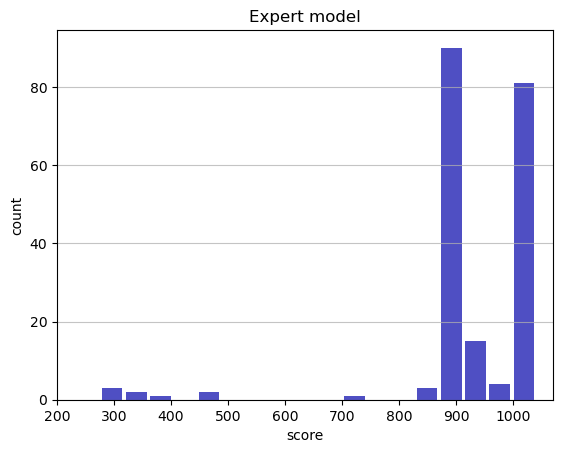

Track generation: 1121..1406 -> 285-tiles track
Epoch: 203
Expert	mean: 930.75	variance: 134.55



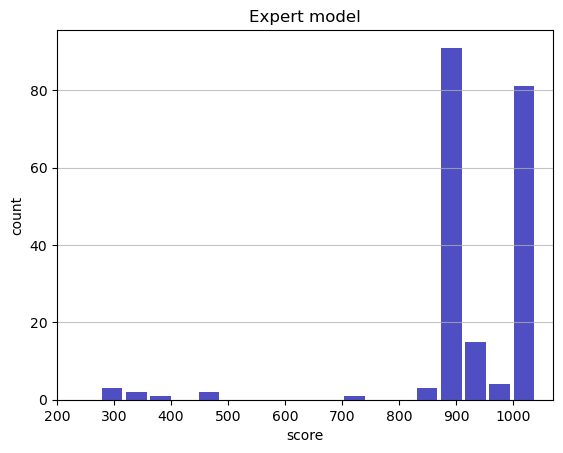

Track generation: 1112..1394 -> 282-tiles track
Epoch: 204
Expert	mean: 930.67	variance: 134.23



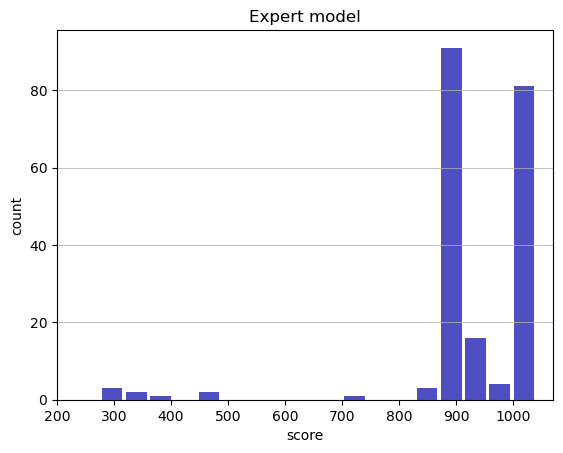

Track generation: 1200..1515 -> 315-tiles track
Epoch: 205
Expert	mean: 930.41	variance: 133.95



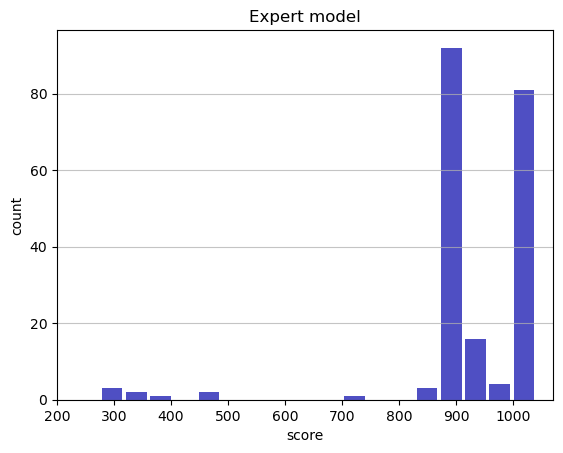

Track generation: 1237..1552 -> 315-tiles track
Epoch: 206
Expert	mean: 930.84	variance: 133.77



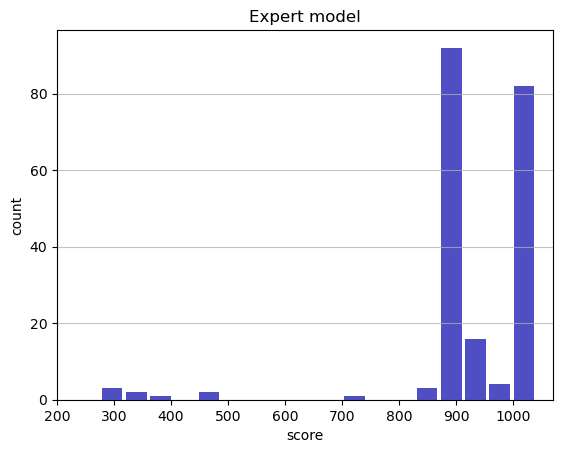

Track generation: 972..1227 -> 255-tiles track
Epoch: 207
Expert	mean: 931.36	variance: 133.65



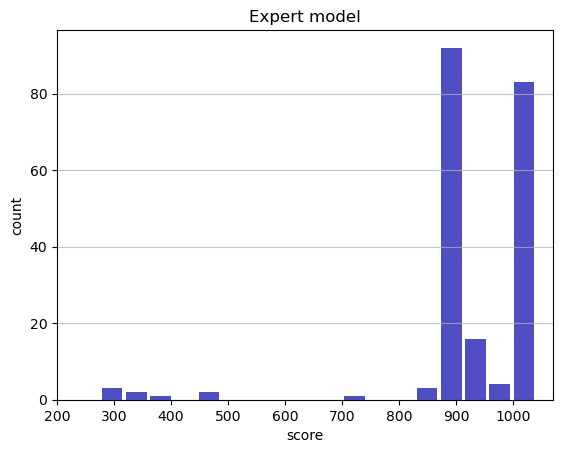

Track generation: 1109..1390 -> 281-tiles track
Epoch: 208
Expert	mean: 931.85	variance: 133.52



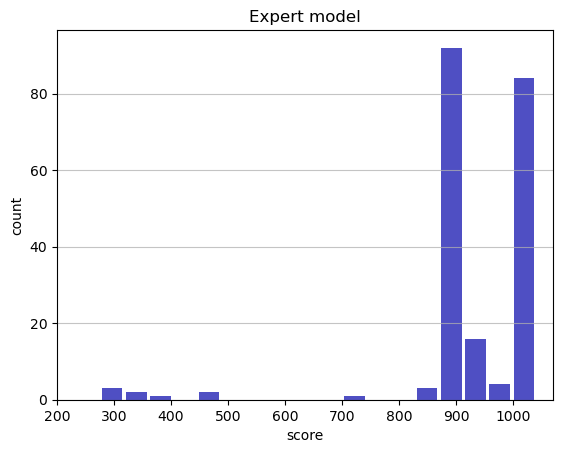

Track generation: 907..1141 -> 234-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1159..1452 -> 293-tiles track
Epoch: 209
Expert	mean: 931.73	variance: 133.21



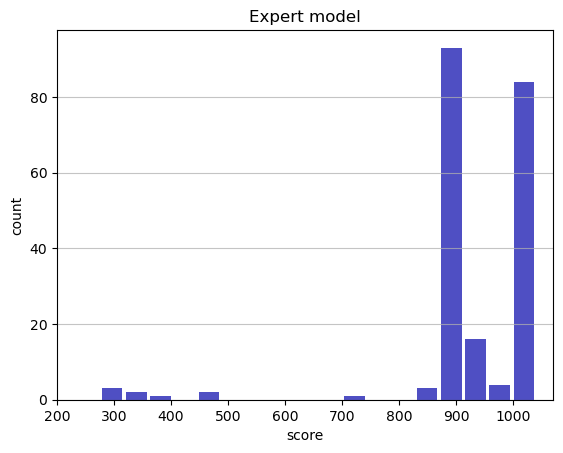

Track generation: 1278..1601 -> 323-tiles track
Epoch: 210
Expert	mean: 931.56	variance: 132.91



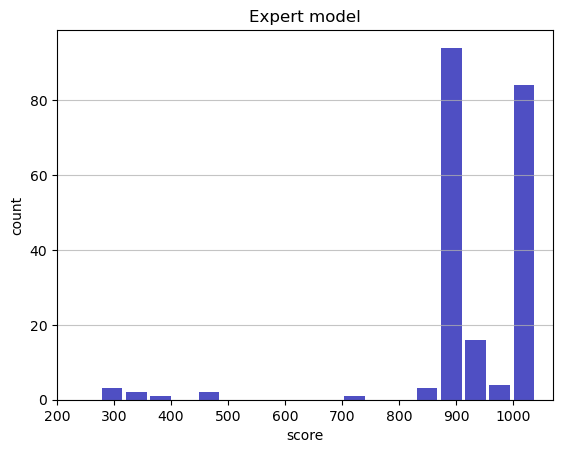

Track generation: 1052..1319 -> 267-tiles track
Epoch: 211
Expert	mean: 932.07	variance: 132.81



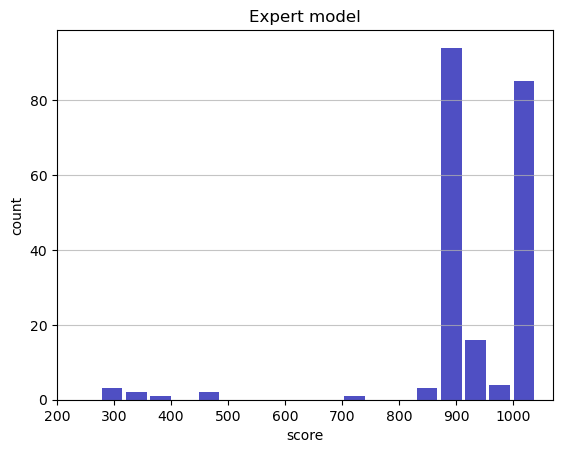

Track generation: 991..1243 -> 252-tiles track
Epoch: 212
Expert	mean: 932.60	variance: 132.71



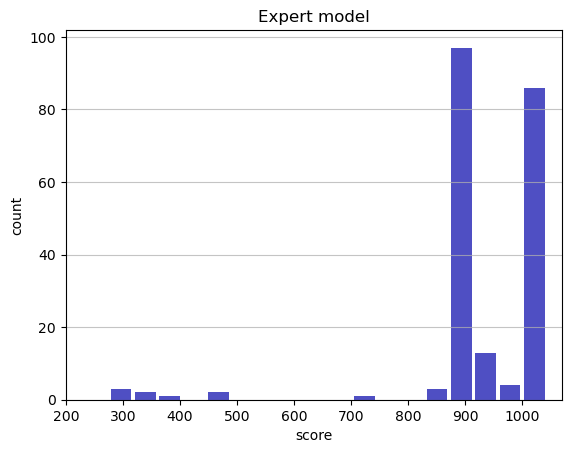

Track generation: 1089..1365 -> 276-tiles track
Epoch: 213
Expert	mean: 932.49	variance: 132.41



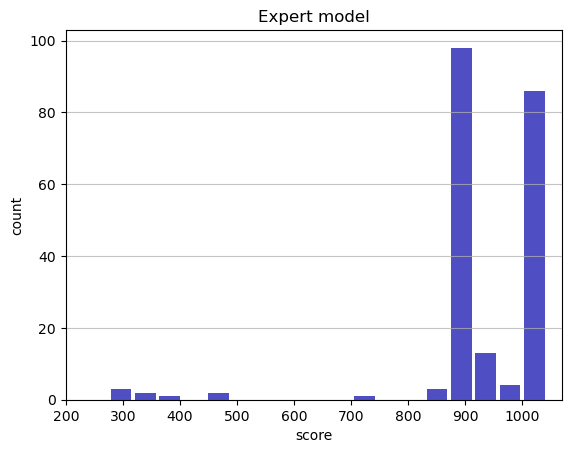

Track generation: 1263..1583 -> 320-tiles track
Epoch: 214
Expert	mean: 932.89	variance: 132.22



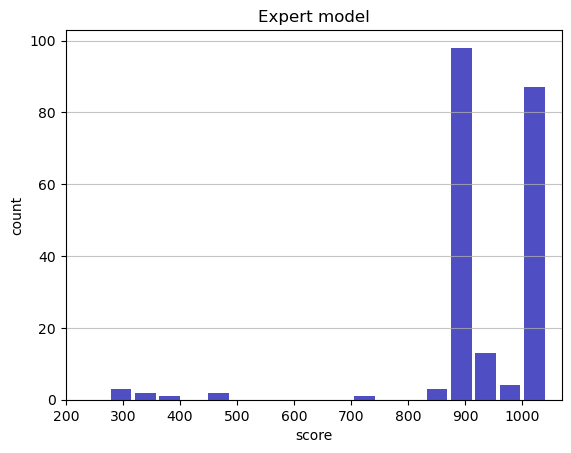

Track generation: 1074..1354 -> 280-tiles track
Epoch: 215
Expert	mean: 932.66	variance: 131.95



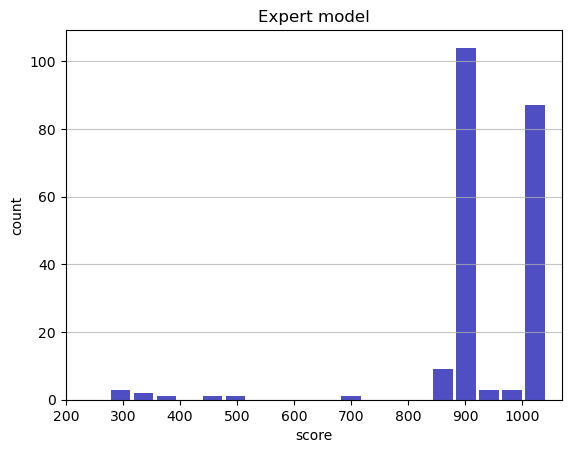

Track generation: 1116..1399 -> 283-tiles track
Epoch: 216
Expert	mean: 932.50	variance: 131.67



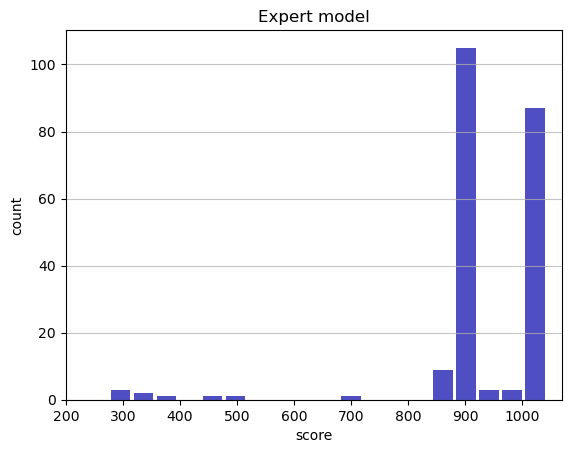

Track generation: 1092..1369 -> 277-tiles track
Epoch: 217
Expert	mean: 932.33	variance: 131.39



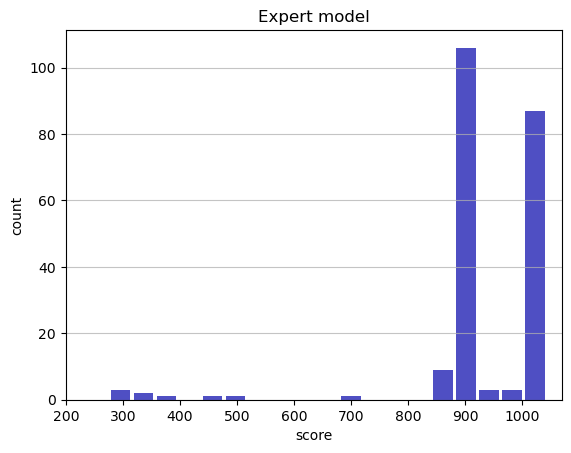

Track generation: 1112..1394 -> 282-tiles track
Epoch: 218
Expert	mean: 932.24	variance: 131.09



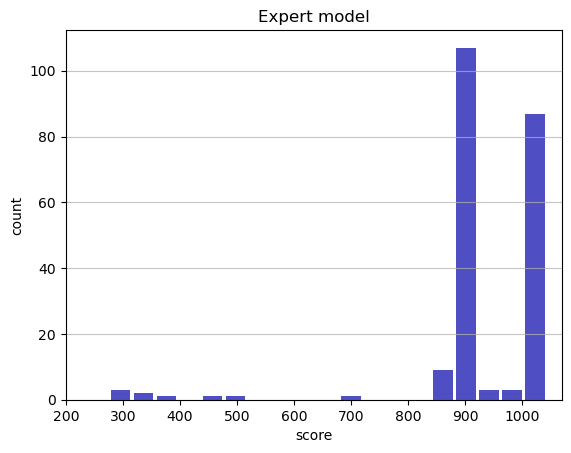

Track generation: 1216..1524 -> 308-tiles track
Epoch: 219
Expert	mean: 932.09	variance: 130.81



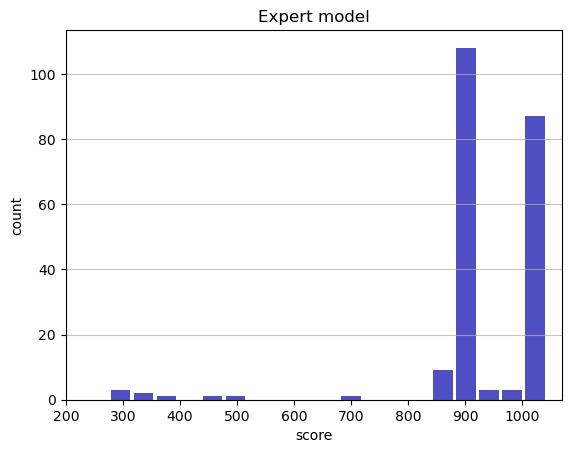

Track generation: 1152..1444 -> 292-tiles track
Epoch: 220
Expert	mean: 931.97	variance: 130.53



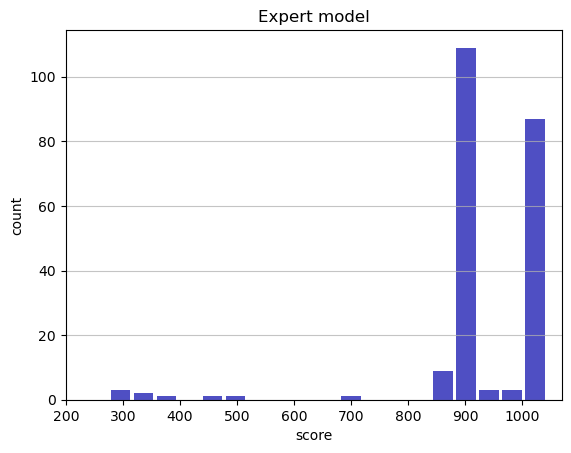

Track generation: 1123..1408 -> 285-tiles track
Epoch: 221
Expert	mean: 931.85	variance: 130.24



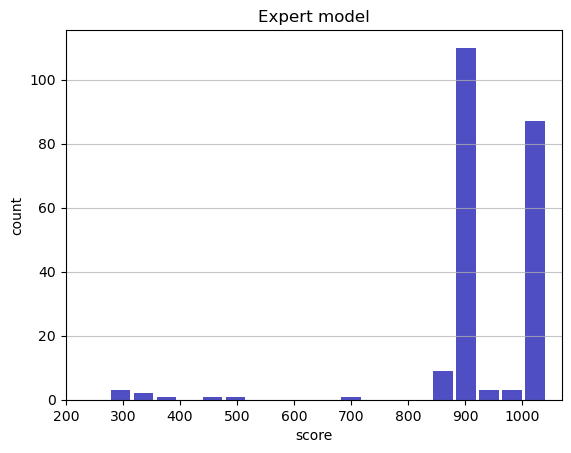

Track generation: 1112..1394 -> 282-tiles track
Epoch: 222
Expert	mean: 932.30	variance: 130.12



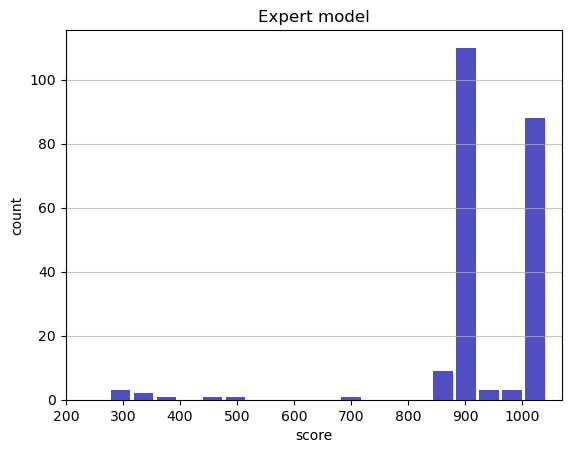

Track generation: 1079..1361 -> 282-tiles track
Epoch: 223
Expert	mean: 932.19	variance: 129.84



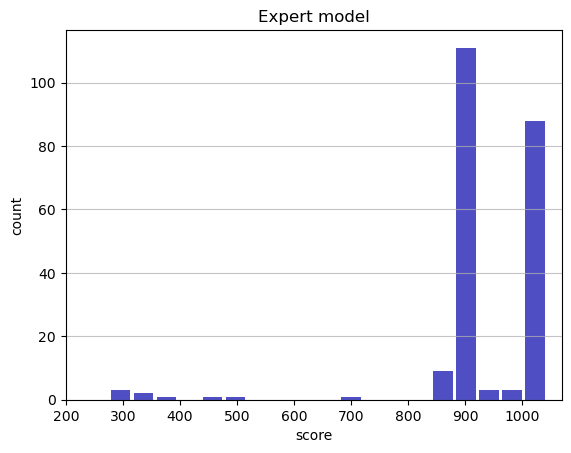

Track generation: 1089..1365 -> 276-tiles track
Epoch: 224
Expert	mean: 932.11	variance: 129.55



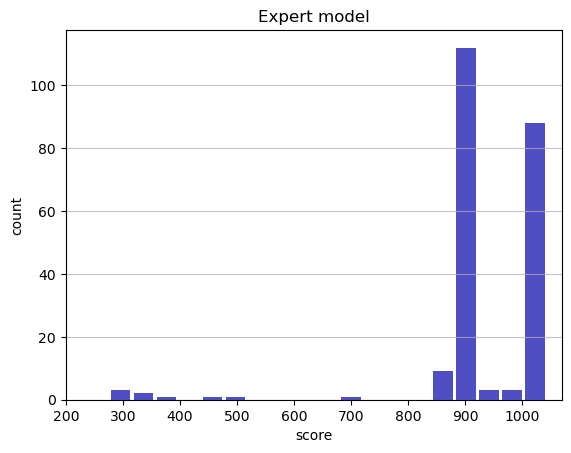

Track generation: 1143..1433 -> 290-tiles track
Epoch: 225
Expert	mean: 932.53	variance: 129.42



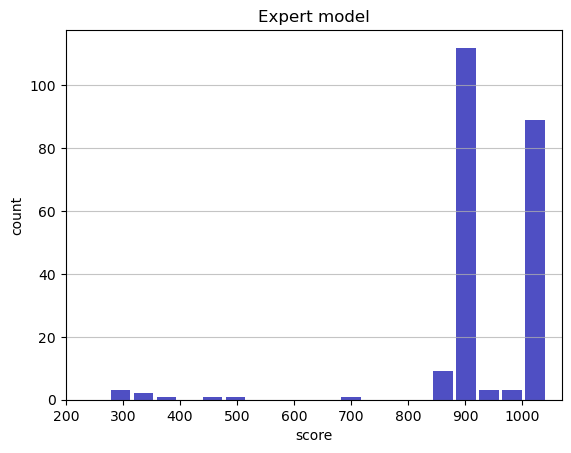

Track generation: 1129..1415 -> 286-tiles track
Epoch: 226
Expert	mean: 932.97	variance: 129.30



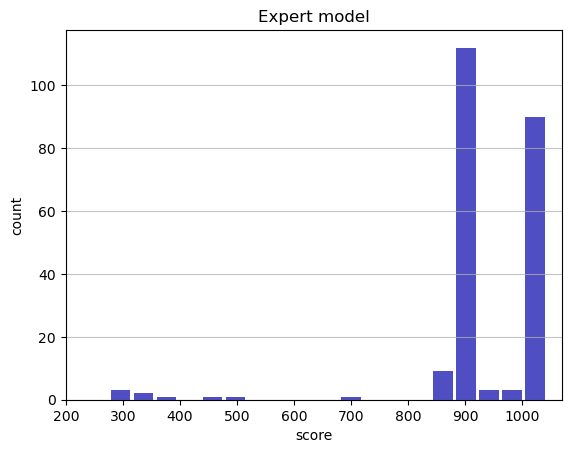

Track generation: 1113..1400 -> 287-tiles track
Epoch: 227
Expert	mean: 932.80	variance: 129.04



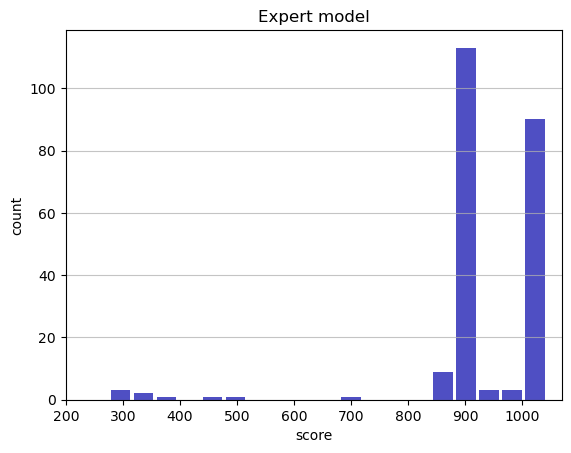

Track generation: 1331..1668 -> 337-tiles track
Epoch: 228
Expert	mean: 932.58	variance: 128.80



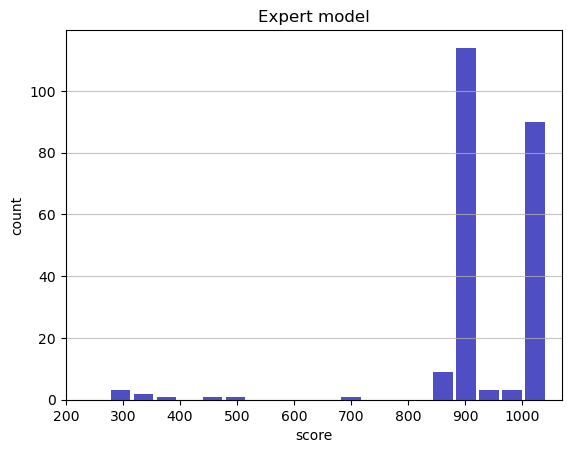

Track generation: 1166..1461 -> 295-tiles track
Epoch: 229
Expert	mean: 932.98	variance: 128.66



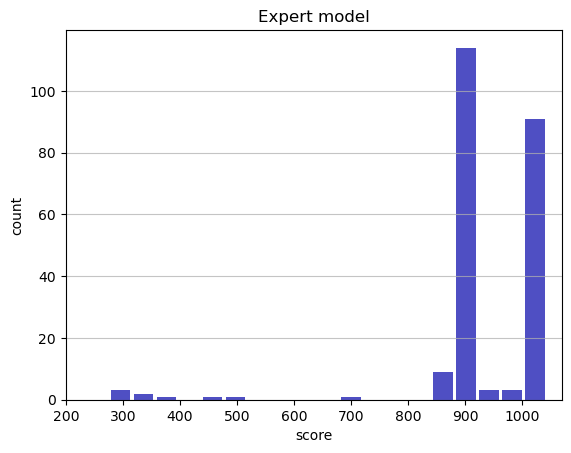

Track generation: 1250..1567 -> 317-tiles track
Epoch: 230
Expert	mean: 933.36	variance: 128.52



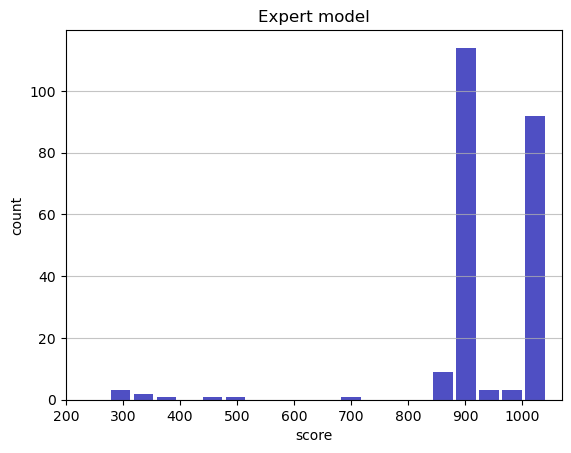

Track generation: 1220..1529 -> 309-tiles track
Epoch: 231
Expert	mean: 933.76	variance: 128.38



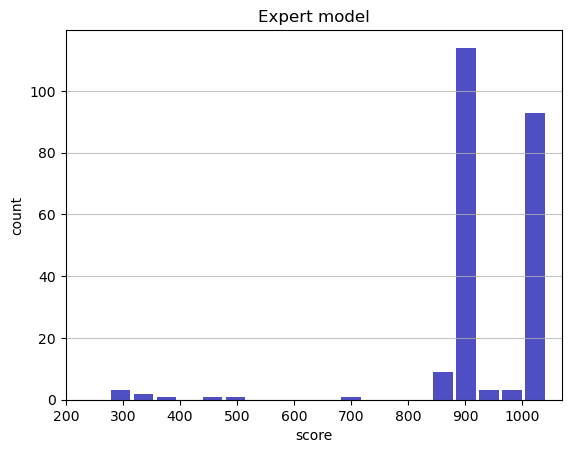

Track generation: 1101..1380 -> 279-tiles track
Epoch: 232
Expert	mean: 933.59	variance: 128.13



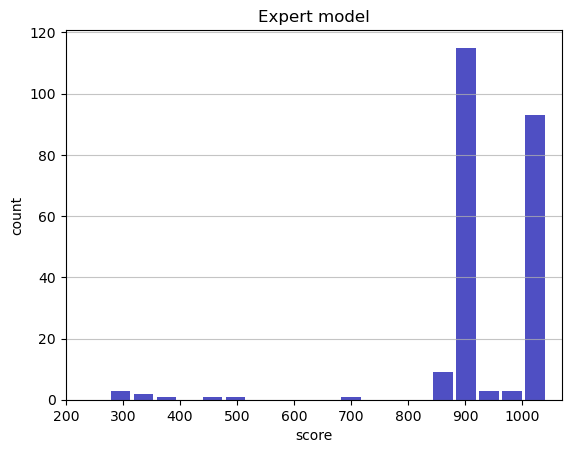

Track generation: 1227..1538 -> 311-tiles track
Epoch: 233
Expert	mean: 933.96	variance: 127.97



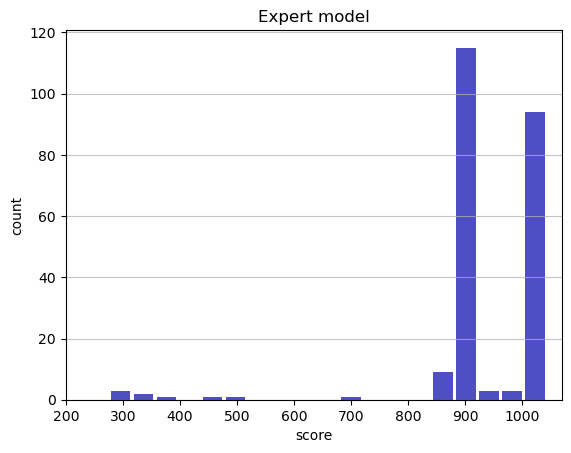

Track generation: 1145..1435 -> 290-tiles track
Epoch: 234
Expert	mean: 933.77	variance: 127.73



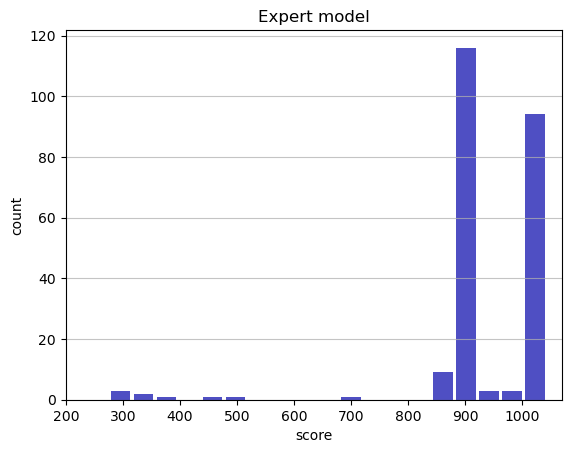

Track generation: 1233..1546 -> 313-tiles track
Epoch: 235
Expert	mean: 933.57	variance: 127.50



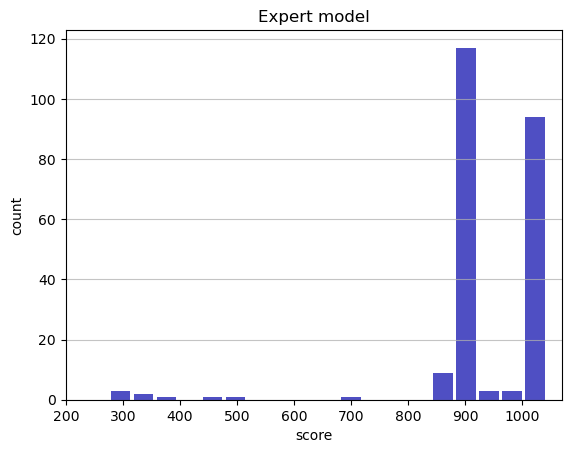

Track generation: 1180..1479 -> 299-tiles track
Epoch: 236
Expert	mean: 933.95	variance: 127.36



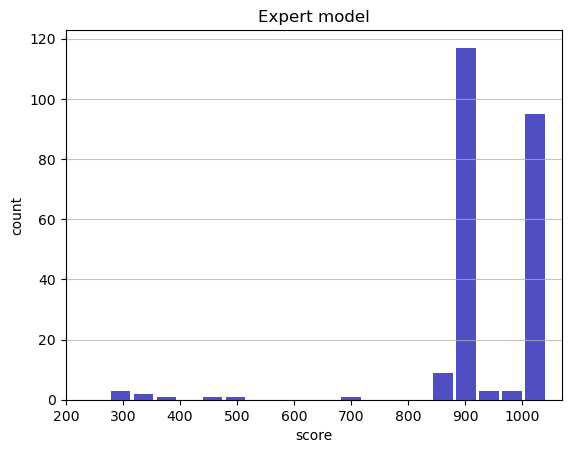

Track generation: 1125..1419 -> 294-tiles track
Epoch: 237
Expert	mean: 933.85	variance: 127.10



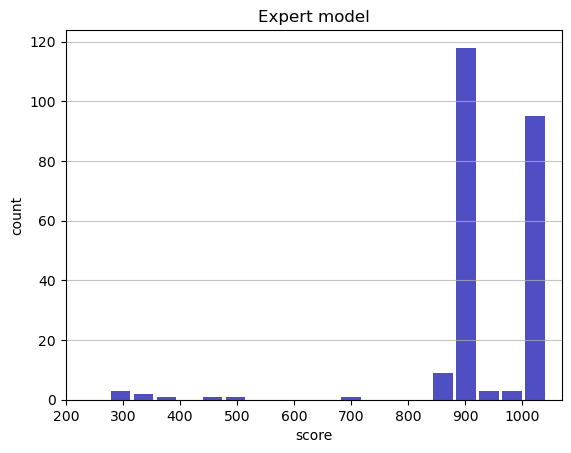

Track generation: 1119..1403 -> 284-tiles track
Epoch: 238
Expert	mean: 933.72	variance: 126.85



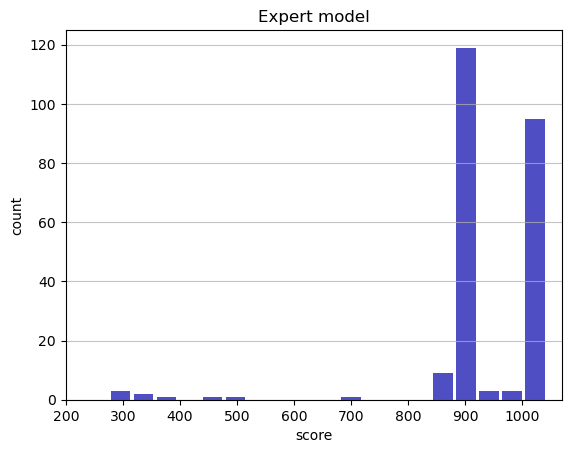

Track generation: 1049..1315 -> 266-tiles track
Epoch: 239
Expert	mean: 933.53	variance: 126.62



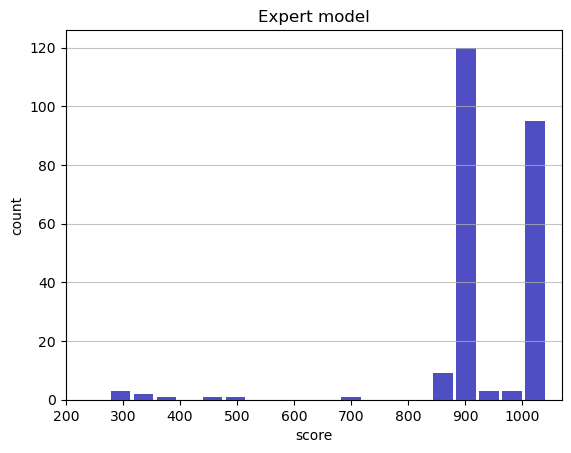

Track generation: 1165..1460 -> 295-tiles track
Epoch: 240
Expert	mean: 933.35	variance: 126.38



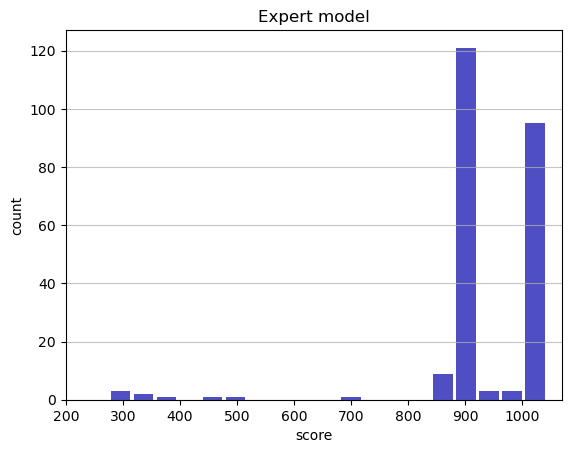

Track generation: 1173..1470 -> 297-tiles track
Epoch: 241
Expert	mean: 933.16	variance: 126.15



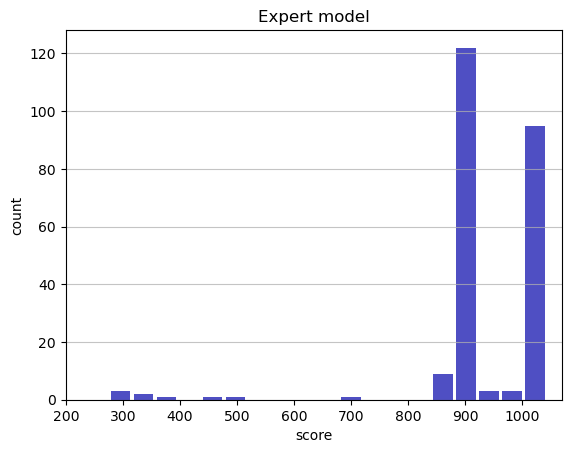

Track generation: 1073..1350 -> 277-tiles track
Epoch: 242
Expert	mean: 933.55	variance: 126.04



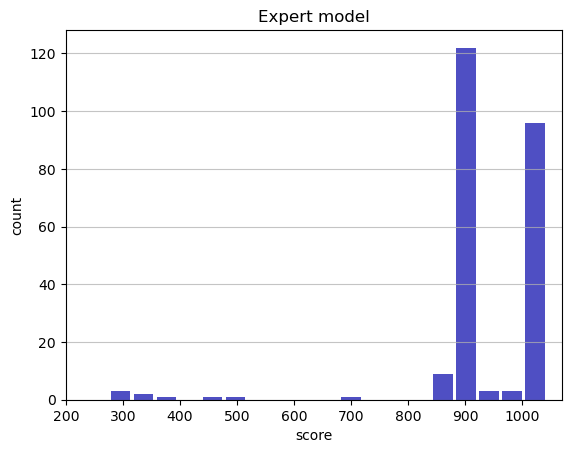

Track generation: 1168..1464 -> 296-tiles track
Epoch: 243
Expert	mean: 933.42	variance: 125.79



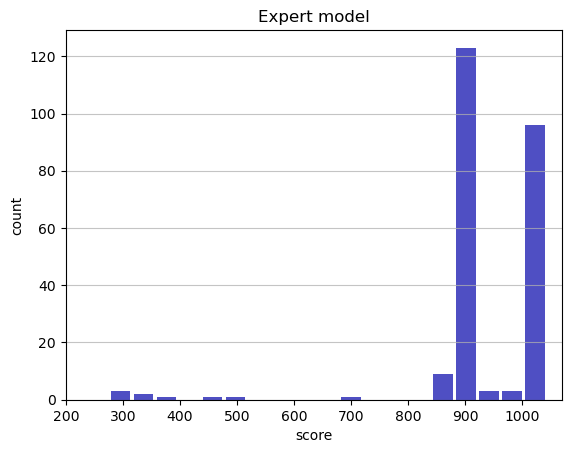

Track generation: 1119..1403 -> 284-tiles track
Epoch: 244
Expert	mean: 933.35	variance: 125.54



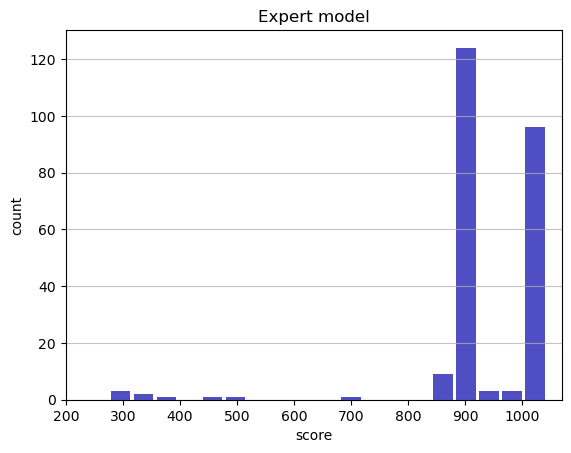

Track generation: 1011..1268 -> 257-tiles track
Epoch: 245
Expert	mean: 933.30	variance: 125.29



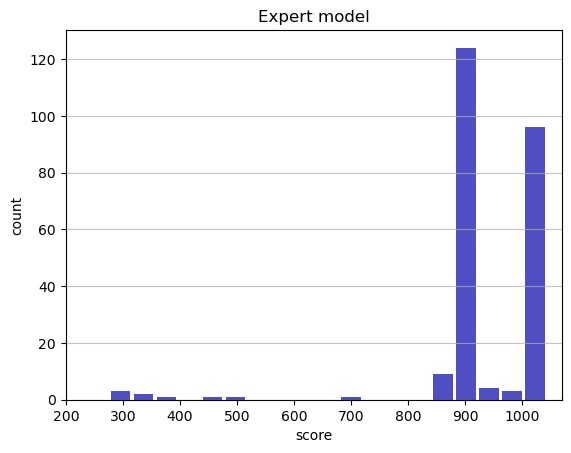

Track generation: 1283..1608 -> 325-tiles track
Epoch: 246
Expert	mean: 933.62	variance: 125.13



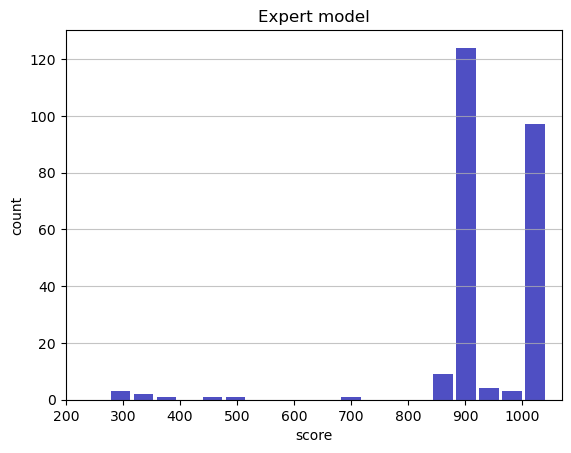

Track generation: 1152..1444 -> 292-tiles track
Epoch: 247
Expert	mean: 934.00	variance: 125.02



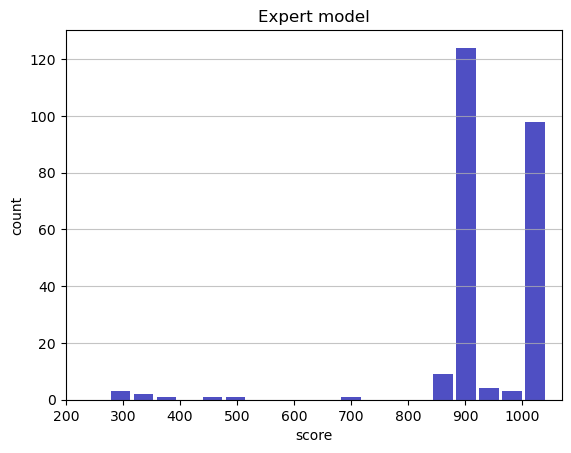

Track generation: 1172..1469 -> 297-tiles track
Epoch: 248
Expert	mean: 934.37	variance: 124.90



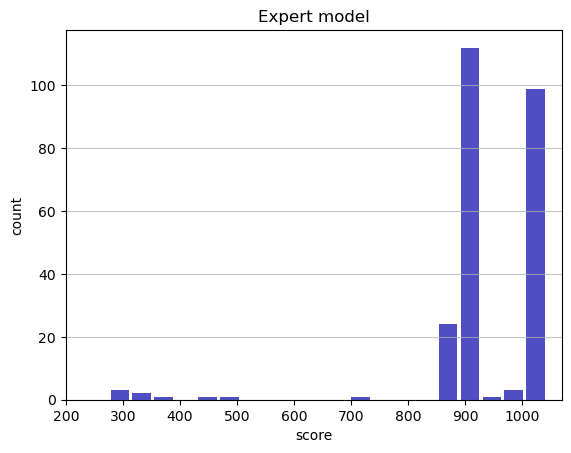

Track generation: 1243..1558 -> 315-tiles track
Epoch: 249
Expert	mean: 934.73	variance: 124.78



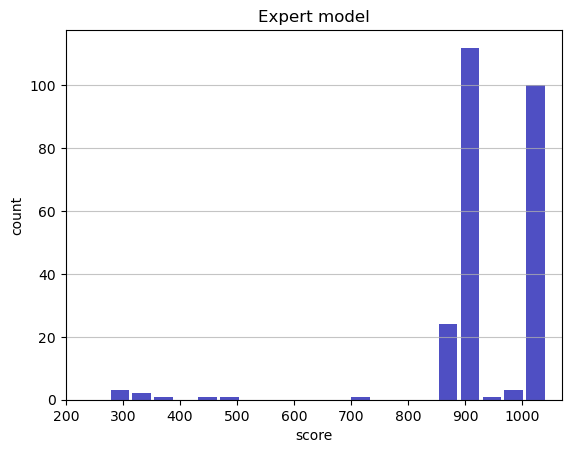

Track generation: 1024..1284 -> 260-tiles track
Epoch: 250
Expert	mean: 935.15	variance: 124.71



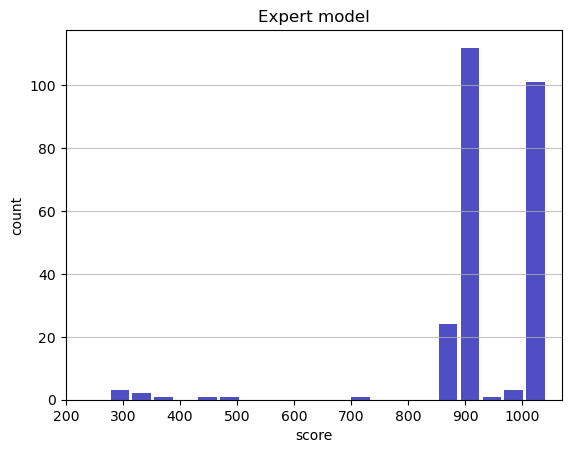

Track generation: 1059..1331 -> 272-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1138..1428 -> 290-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1239..1553 -> 314-tiles track
Epoch: 251
Expert	mean: 934.94	variance: 124.51



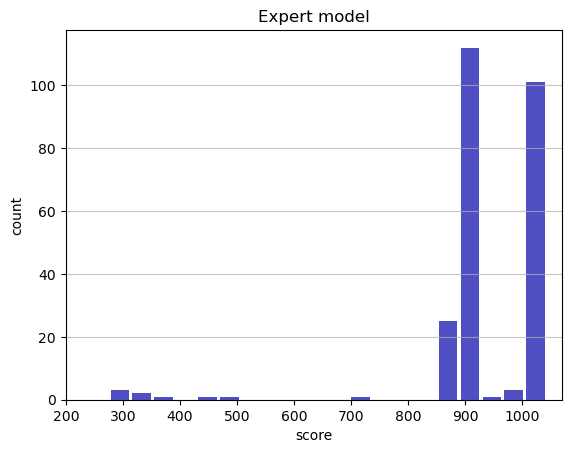

Track generation: 1081..1355 -> 274-tiles track
Epoch: 252
Expert	mean: 934.87	variance: 124.27



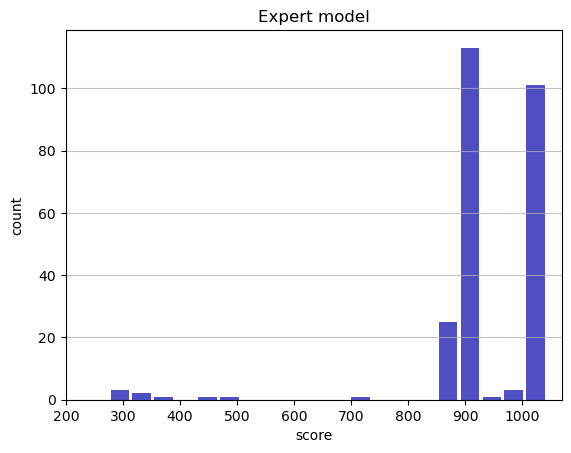

Track generation: 1092..1369 -> 277-tiles track
Epoch: 253
Expert	mean: 934.74	variance: 124.04



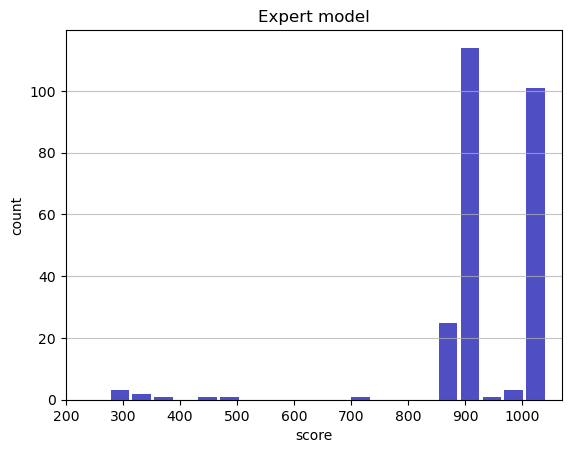

Track generation: 1148..1439 -> 291-tiles track
Epoch: 254
Expert	mean: 934.65	variance: 123.80



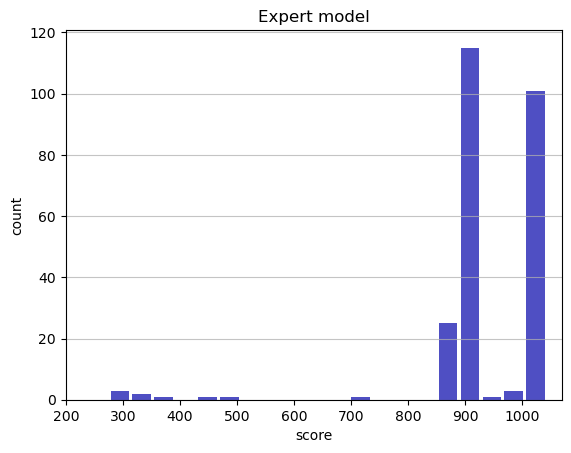

Track generation: 1083..1358 -> 275-tiles track
Epoch: 255
Expert	mean: 934.55	variance: 123.57



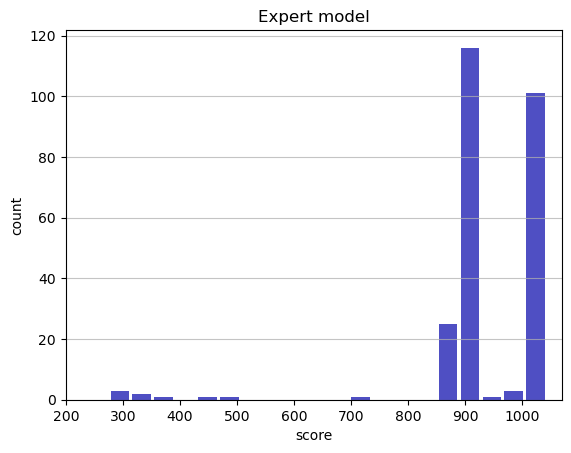

Track generation: 1096..1374 -> 278-tiles track
Epoch: 256
Expert	mean: 934.93	variance: 123.48



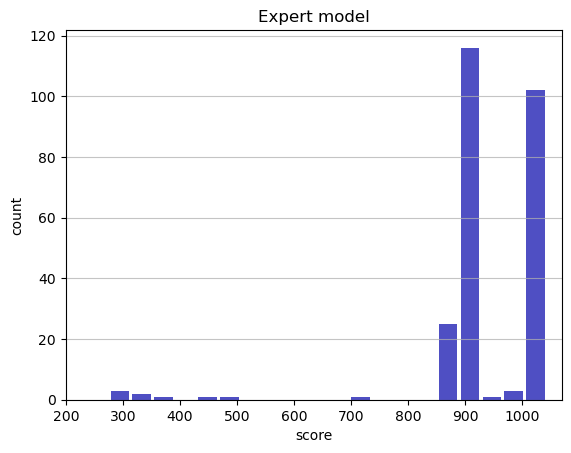

Track generation: 1232..1544 -> 312-tiles track
Epoch: 257
Expert	mean: 934.14	variance: 123.89



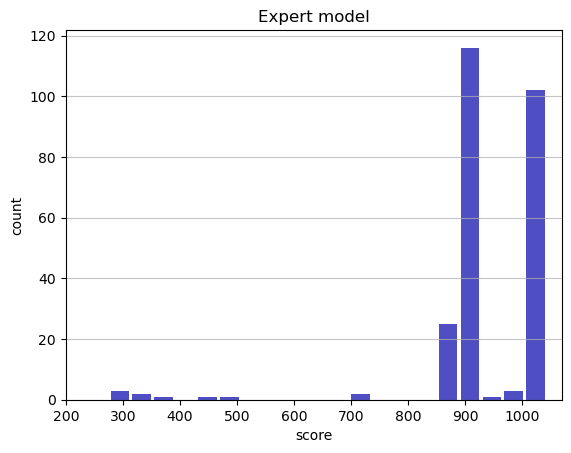

Track generation: 1151..1443 -> 292-tiles track
Epoch: 258
Expert	mean: 933.95	variance: 123.68



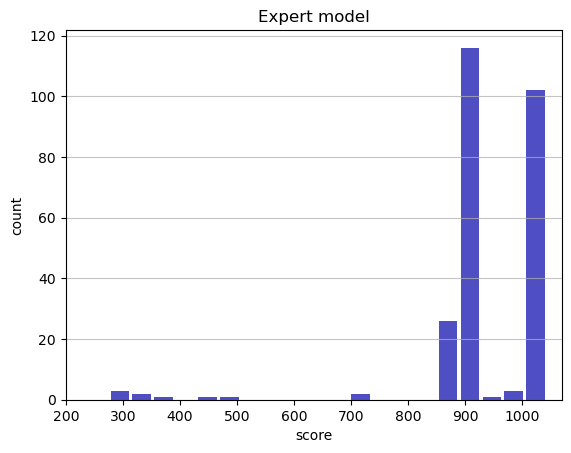

Track generation: 1243..1558 -> 315-tiles track
Epoch: 259
Expert	mean: 934.29	variance: 123.57



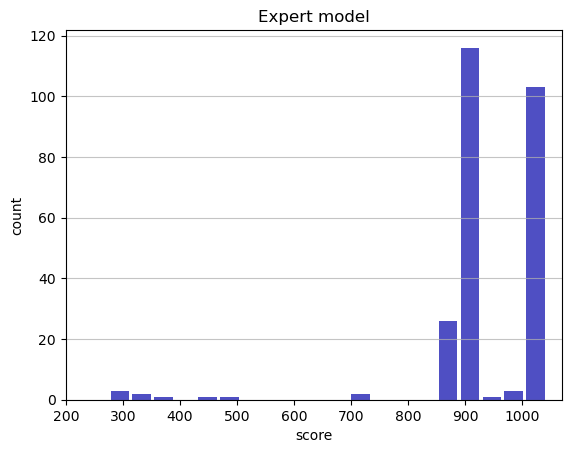

Track generation: 1306..1636 -> 330-tiles track
Epoch: 260
Expert	mean: 934.60	variance: 123.43



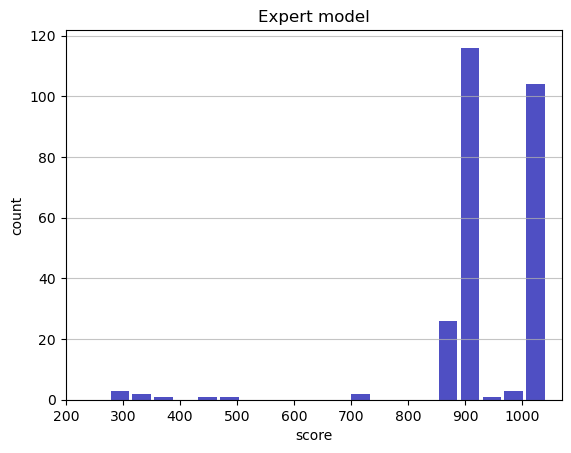

Track generation: 1206..1512 -> 306-tiles track
Epoch: 261
Expert	mean: 934.48	variance: 123.21



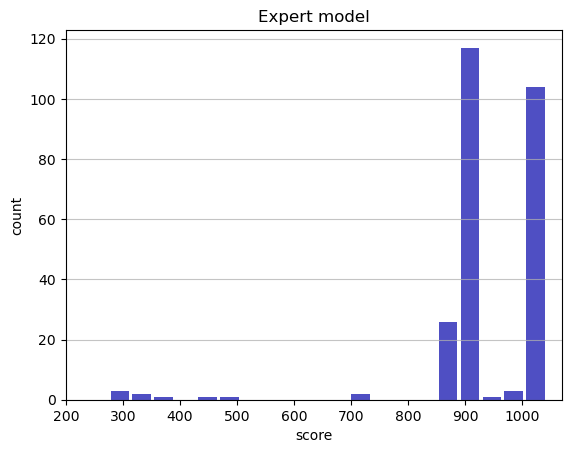

Track generation: 1168..1463 -> 295-tiles track
Epoch: 262
Expert	mean: 934.34	variance: 122.99



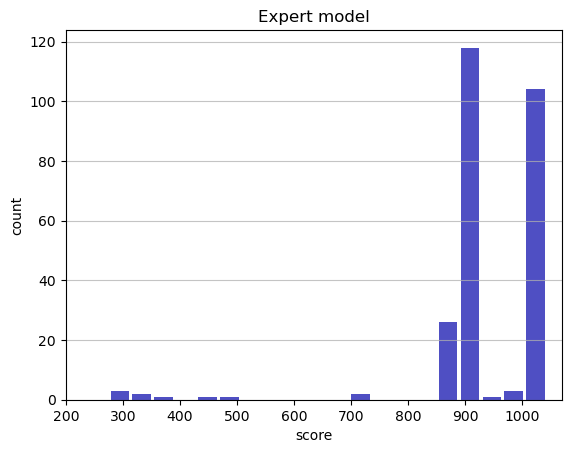

Track generation: 1233..1545 -> 312-tiles track
Epoch: 263
Expert	mean: 934.13	variance: 122.80



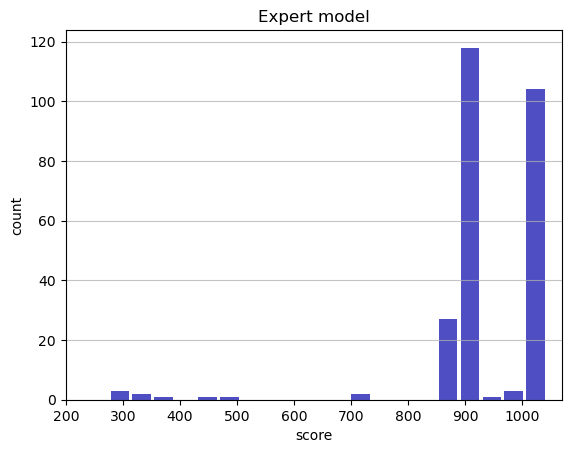

Track generation: 1161..1455 -> 294-tiles track
Epoch: 264
Expert	mean: 934.49	variance: 122.71



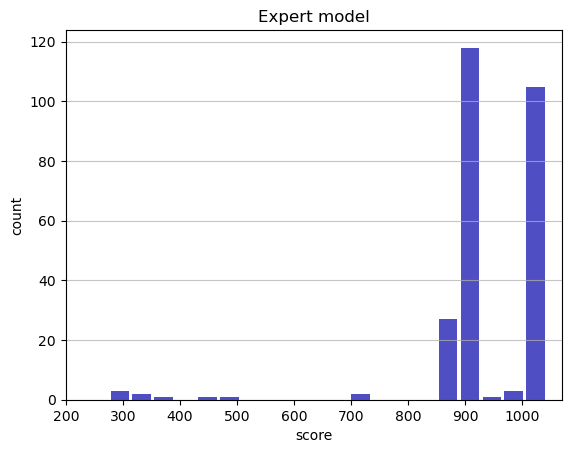

Track generation: 1060..1334 -> 274-tiles track
Epoch: 265
Expert	mean: 934.35	variance: 122.50



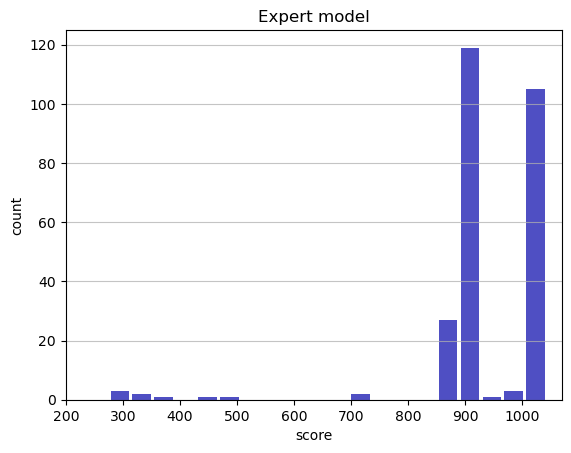

Track generation: 1392..1744 -> 352-tiles track
Epoch: 266
Expert	mean: 934.55	variance: 122.31



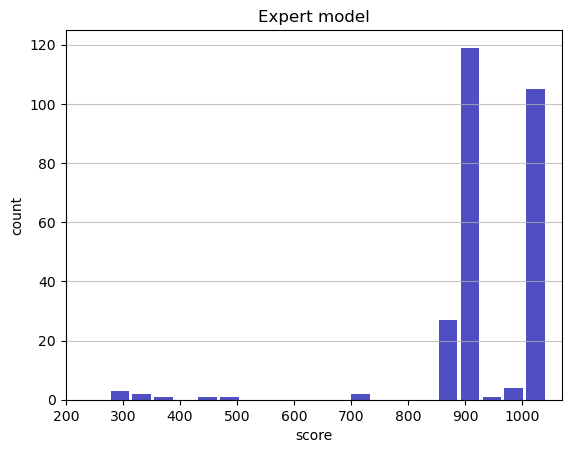

Track generation: 1123..1408 -> 285-tiles track
Epoch: 267
Expert	mean: 934.46	variance: 122.09



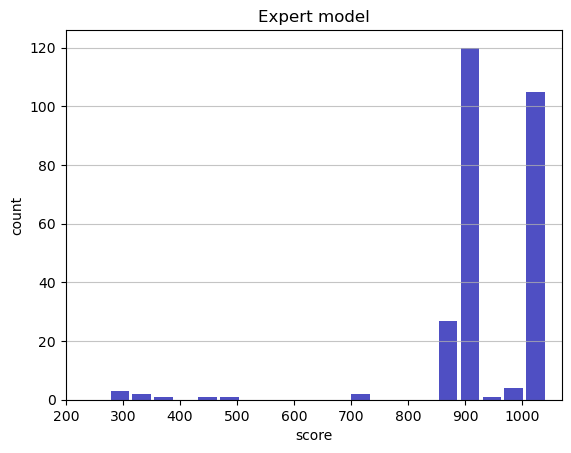

Track generation: 1282..1606 -> 324-tiles track
Epoch: 268
Expert	mean: 934.79	variance: 121.99



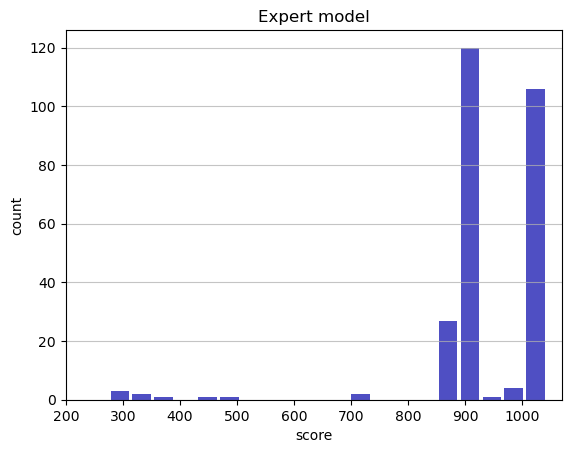

Track generation: 1132..1419 -> 287-tiles track
Epoch: 269
Expert	mean: 934.72	variance: 121.76



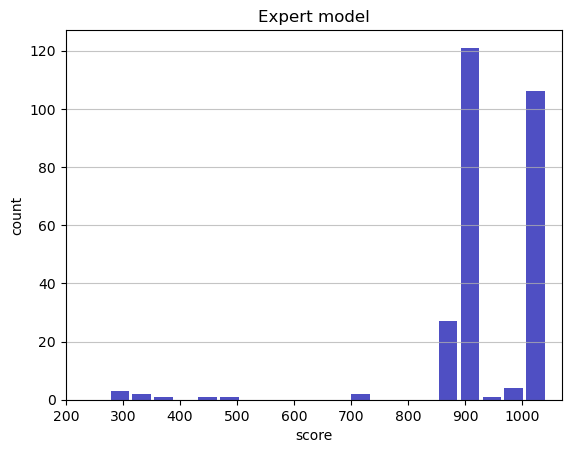

Track generation: 1250..1567 -> 317-tiles track
Epoch: 270
Expert	mean: 935.04	variance: 121.65



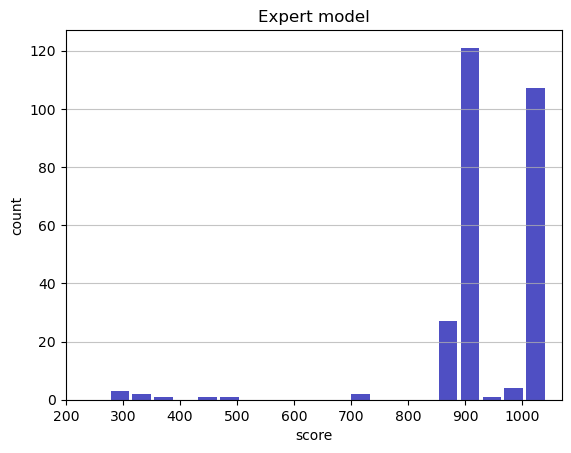

Track generation: 1078..1358 -> 280-tiles track
Epoch: 271
Expert	mean: 934.92	variance: 121.44



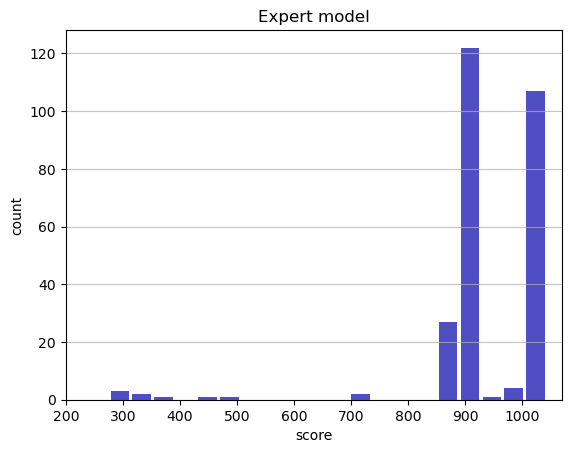

Track generation: 1132..1419 -> 287-tiles track
Epoch: 272
Expert	mean: 934.79	variance: 121.23



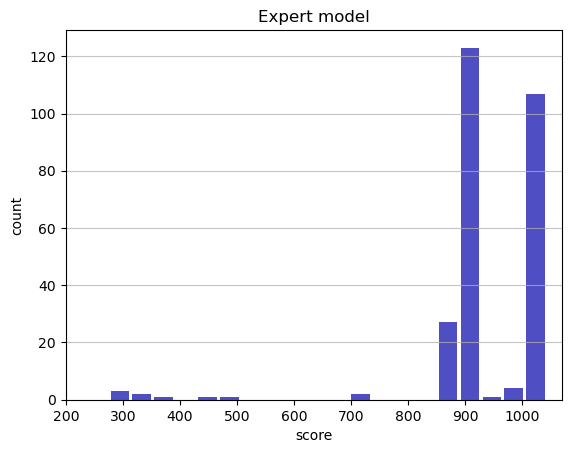

Track generation: 1180..1479 -> 299-tiles track
Epoch: 273
Expert	mean: 935.14	variance: 121.15



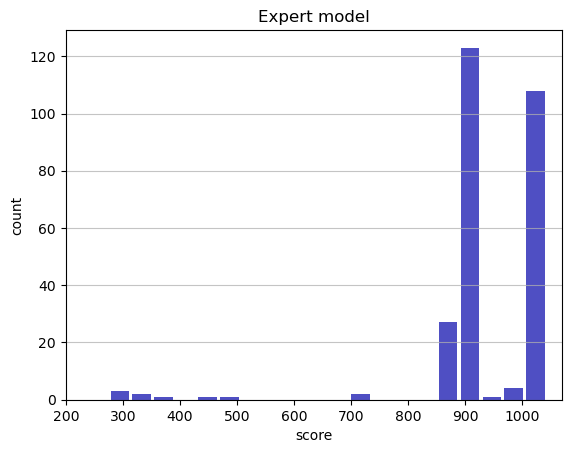

Track generation: 1053..1321 -> 268-tiles track
Epoch: 274
Expert	mean: 935.06	variance: 120.93



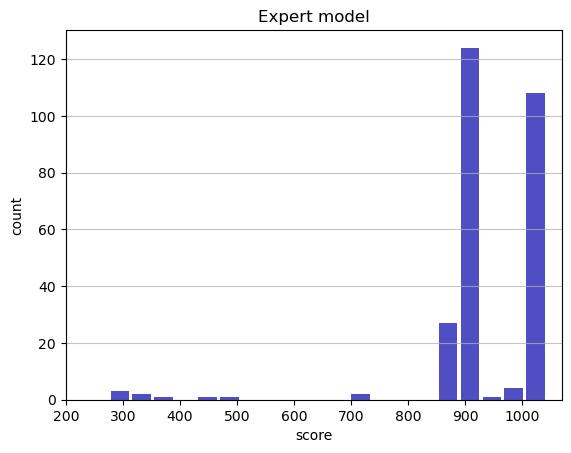

Track generation: 1068..1342 -> 274-tiles track
Epoch: 275
Expert	mean: 934.93	variance: 120.73



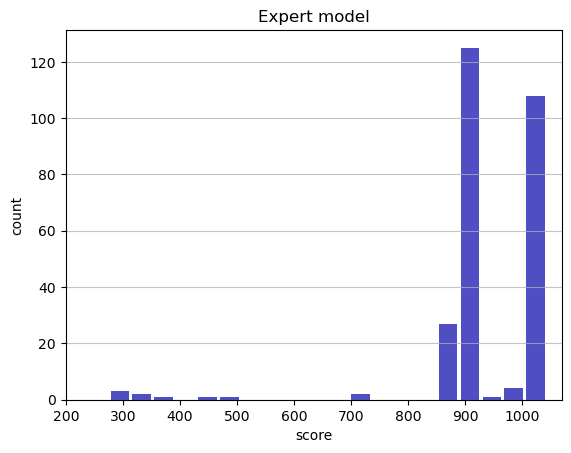

Track generation: 1232..1553 -> 321-tiles track
Epoch: 276
Expert	mean: 935.25	variance: 120.62



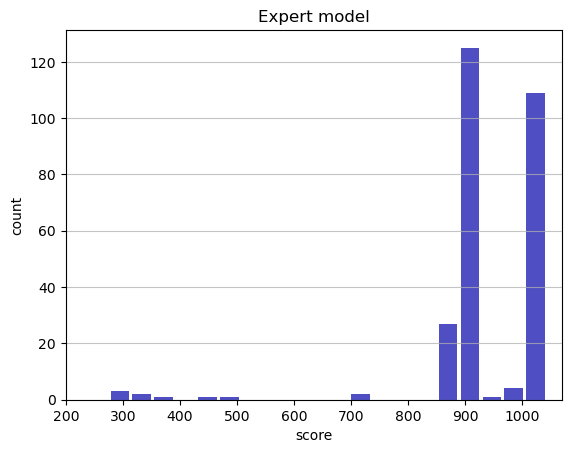

Track generation: 1308..1647 -> 339-tiles track
Epoch: 277
Expert	mean: 935.40	variance: 120.43



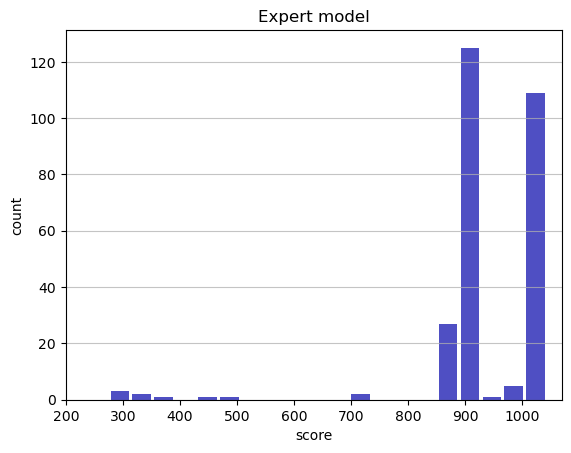

Track generation: 1120..1409 -> 289-tiles track
Epoch: 278
Expert	mean: 935.73	variance: 120.34



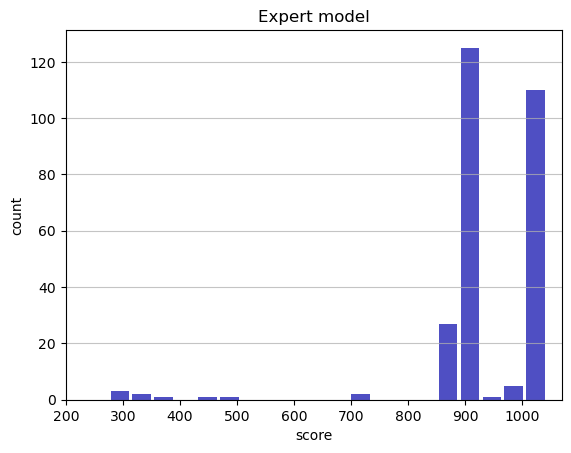

Track generation: 1315..1649 -> 334-tiles track
Epoch: 279
Expert	mean: 935.51	variance: 120.18



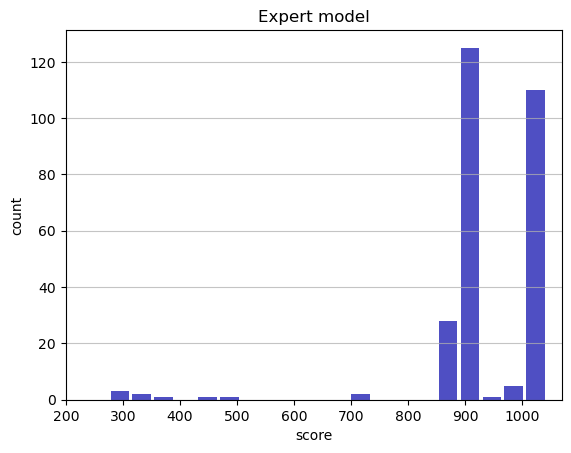

Track generation: 1027..1289 -> 262-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1121..1413 -> 292-tiles track
Epoch: 280
Expert	mean: 935.40	variance: 119.98



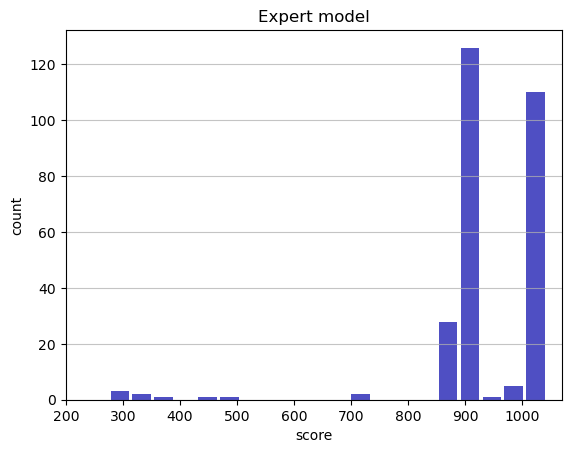

Track generation: 1164..1459 -> 295-tiles track
Epoch: 281
Expert	mean: 935.30	variance: 119.78



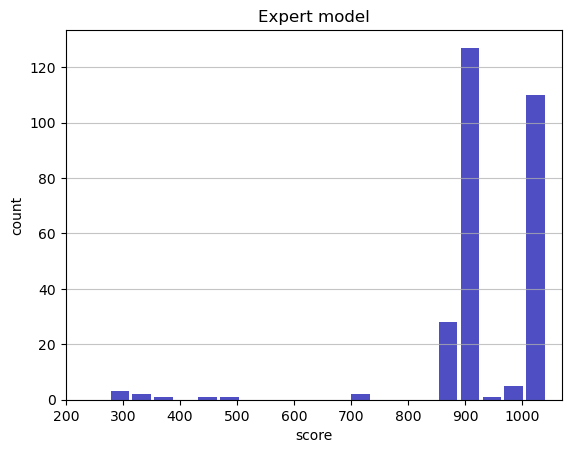

Track generation: 1377..1735 -> 358-tiles track
Epoch: 282
Expert	mean: 935.49	variance: 119.61



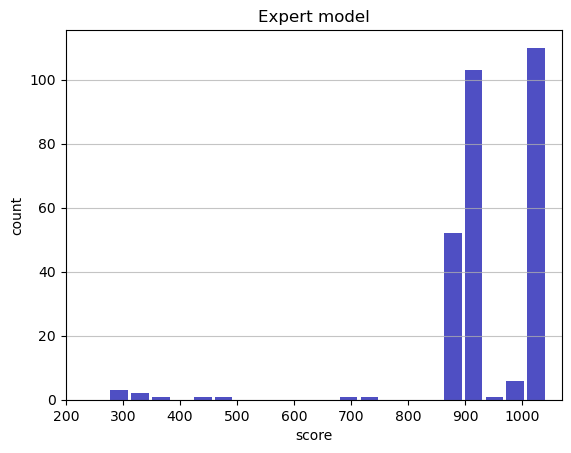

Track generation: 1263..1583 -> 320-tiles track
Epoch: 283
Expert	mean: 935.80	variance: 119.50



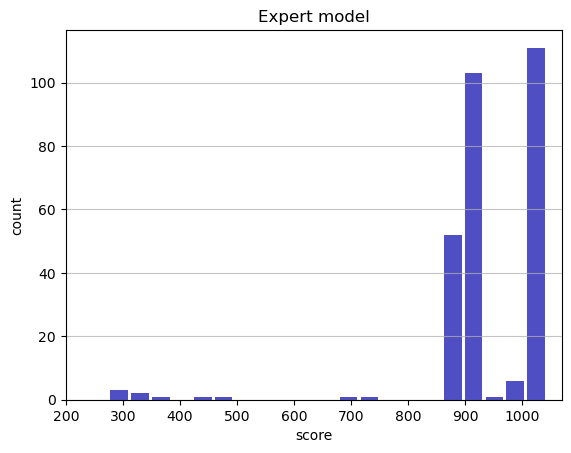

Track generation: 1167..1463 -> 296-tiles track
Epoch: 284
Expert	mean: 936.14	variance: 119.43



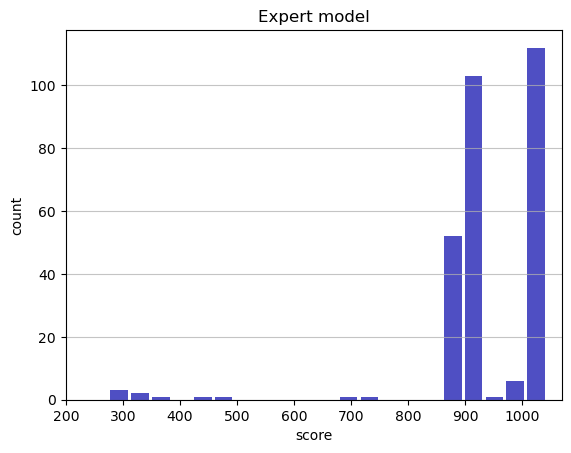

Track generation: 1337..1682 -> 345-tiles track
Epoch: 285
Expert	mean: 936.30	variance: 119.25



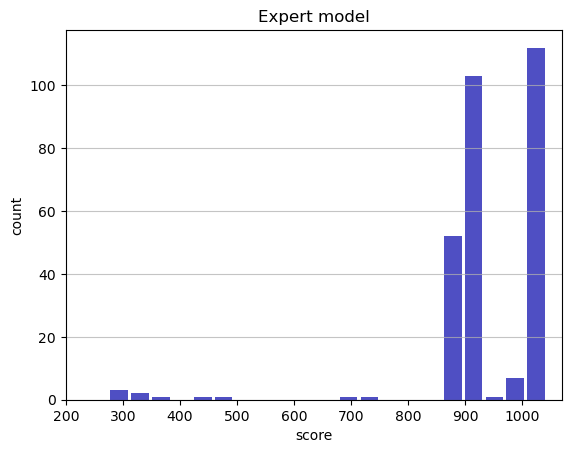

Track generation: 1139..1428 -> 289-tiles track
Epoch: 286
Expert	mean: 935.99	variance: 119.16



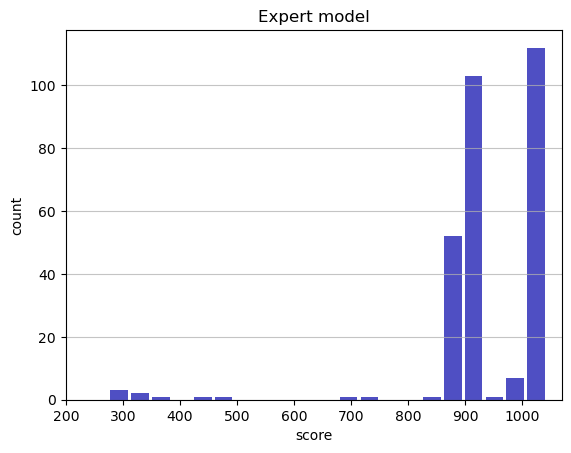

Track generation: 1079..1353 -> 274-tiles track
Epoch: 287
Expert	mean: 934.82	variance: 120.59



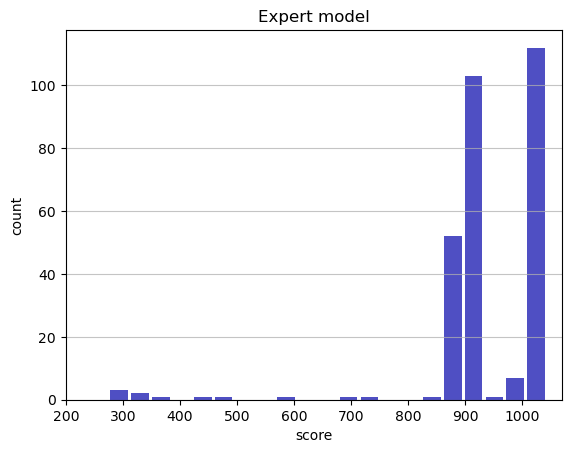

Track generation: 1244..1559 -> 315-tiles track
Epoch: 288
Expert	mean: 934.50	variance: 120.49



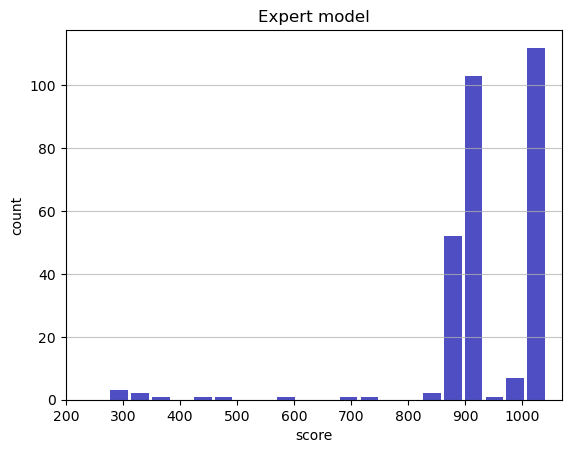

Track generation: 1291..1618 -> 327-tiles track
Epoch: 289
Expert	mean: 934.79	variance: 120.38



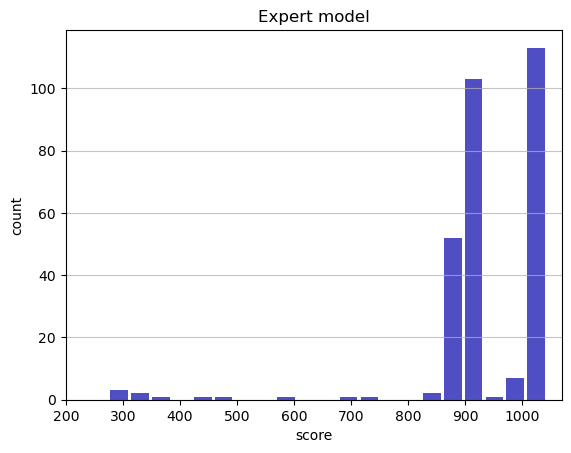

Track generation: 1146..1434 -> 288-tiles track
Epoch: 290
Expert	mean: 934.70	variance: 120.19



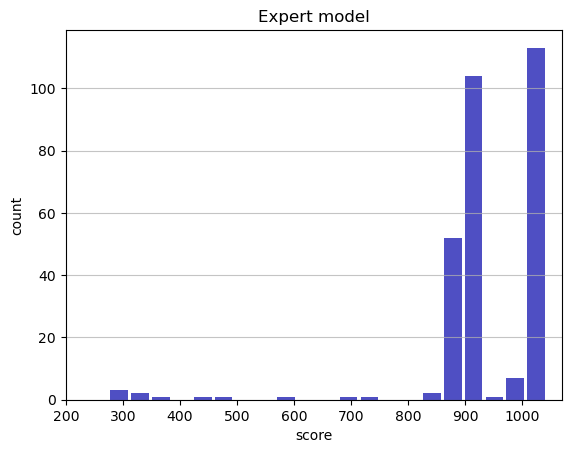

Track generation: 1255..1573 -> 318-tiles track
Epoch: 291
Expert	mean: 934.99	variance: 120.08



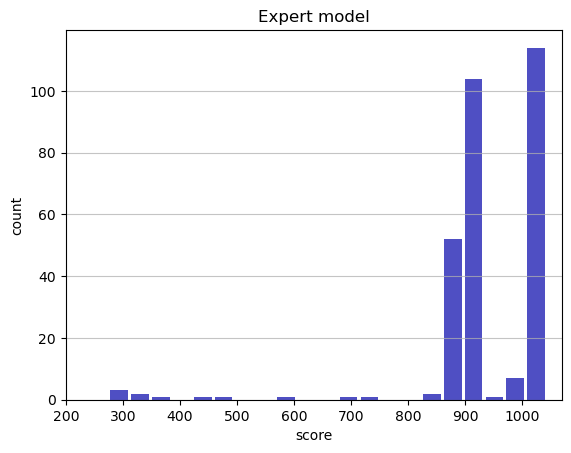

Track generation: 1160..1454 -> 294-tiles track
Epoch: 292
Expert	mean: 935.30	variance: 119.99



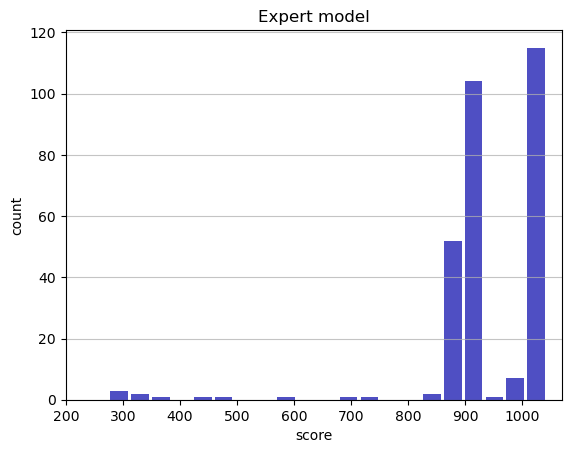

Track generation: 1164..1459 -> 295-tiles track
Epoch: 293
Expert	mean: 935.18	variance: 119.80



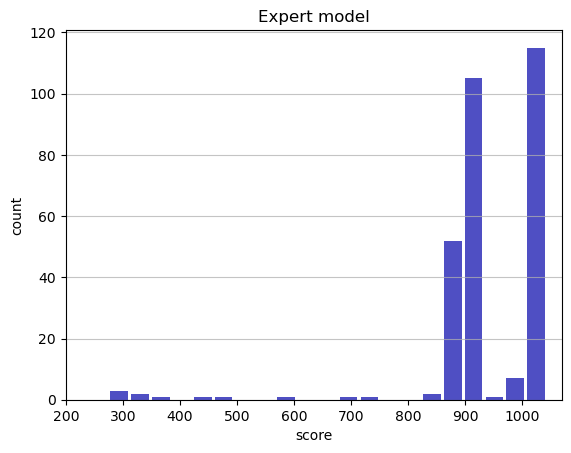

Track generation: 986..1240 -> 254-tiles track
Epoch: 294
Expert	mean: 935.54	variance: 119.76



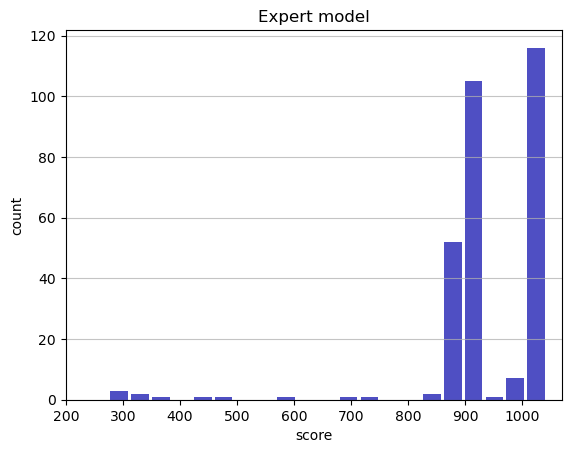

Track generation: 1024..1291 -> 267-tiles track
Epoch: 295
Expert	mean: 935.48	variance: 119.56



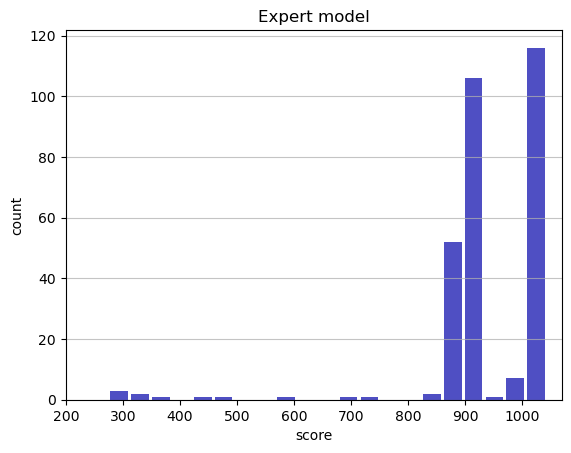

Track generation: 1160..1454 -> 294-tiles track
Epoch: 296
Expert	mean: 935.80	variance: 119.48



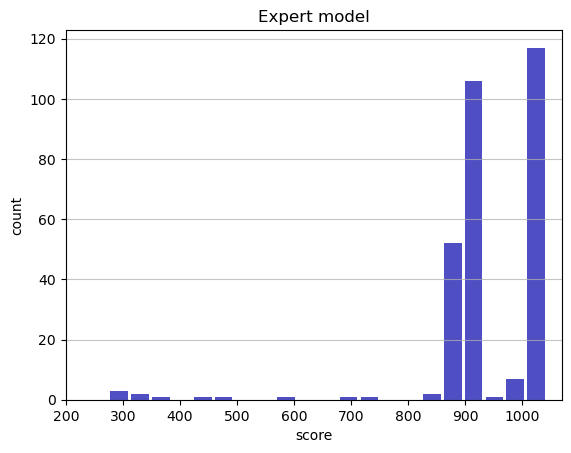

Track generation: 1103..1383 -> 280-tiles track
Epoch: 297
Expert	mean: 936.12	variance: 119.41



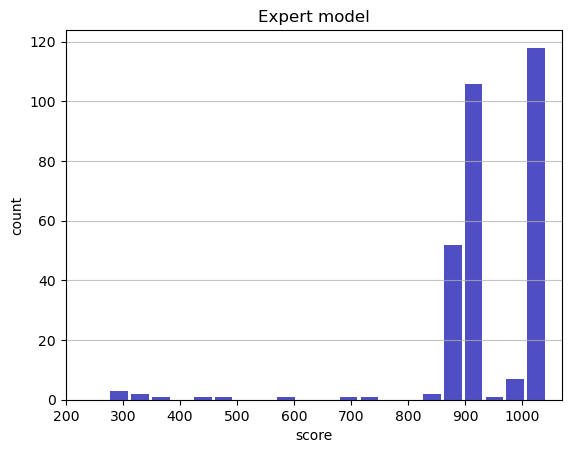

Track generation: 1223..1533 -> 310-tiles track
Epoch: 298
Expert	mean: 936.42	variance: 119.33



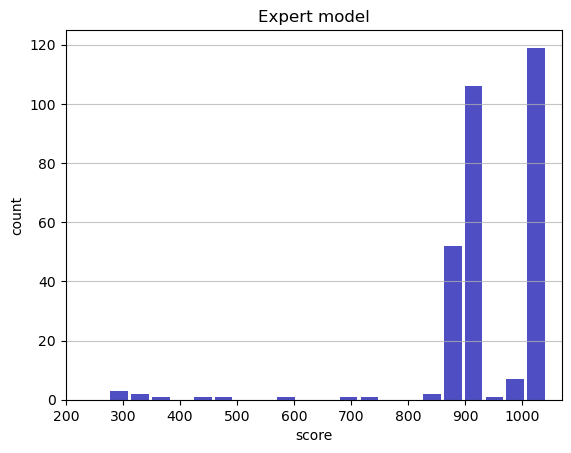

Track generation: 919..1160 -> 241-tiles track
Epoch: 299
Expert	mean: 936.77	variance: 119.27



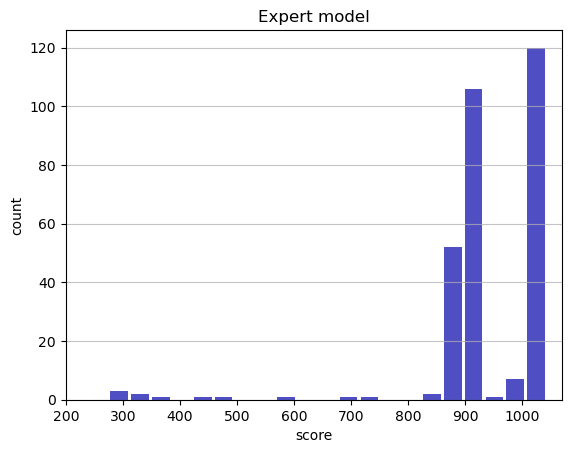

Track generation: 1180..1479 -> 299-tiles track
Epoch: 300
Expert	mean: 937.09	variance: 119.21



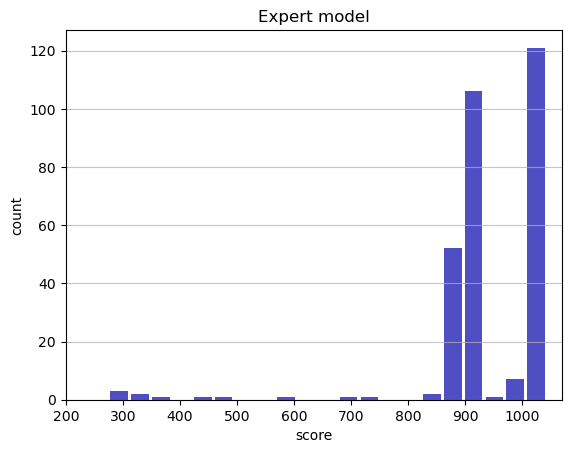

Track generation: 1023..1286 -> 263-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1108..1389 -> 281-tiles track
Epoch: 301
Expert	mean: 937.02	variance: 119.01



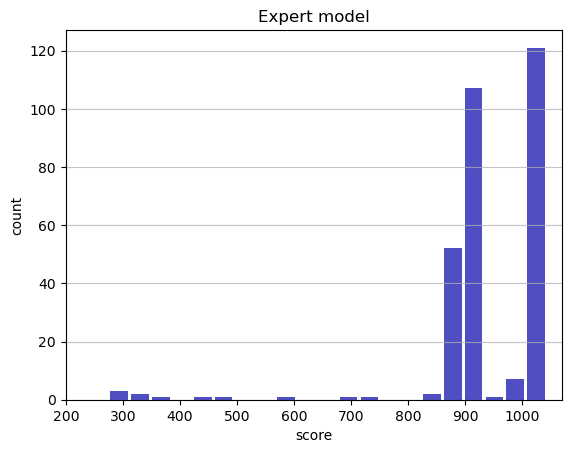

Track generation: 1063..1332 -> 269-tiles track
Epoch: 302
Expert	mean: 937.34	variance: 118.95



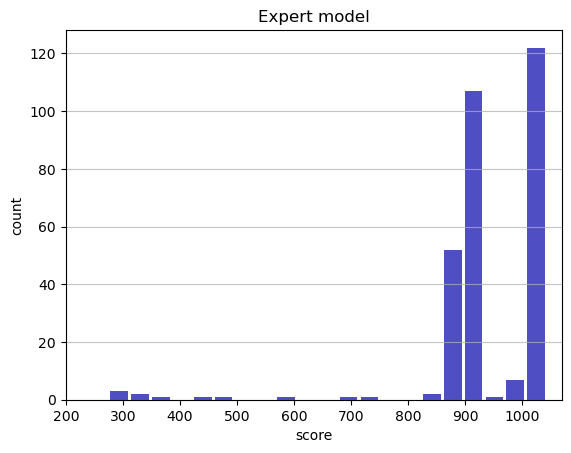

Track generation: 1276..1604 -> 328-tiles track
Epoch: 303
Expert	mean: 937.19	variance: 118.78



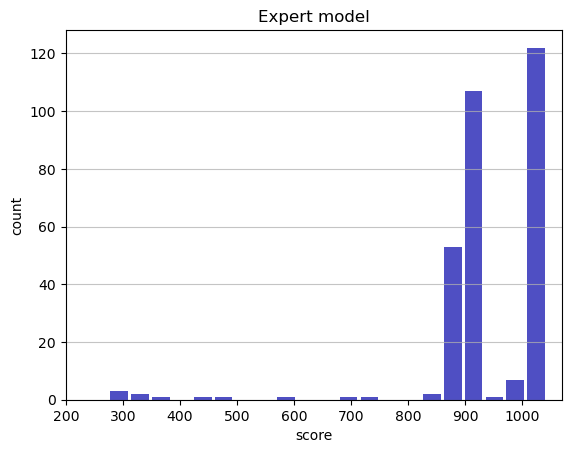

Track generation: 1056..1324 -> 268-tiles track
Epoch: 304
Expert	mean: 937.12	variance: 118.59



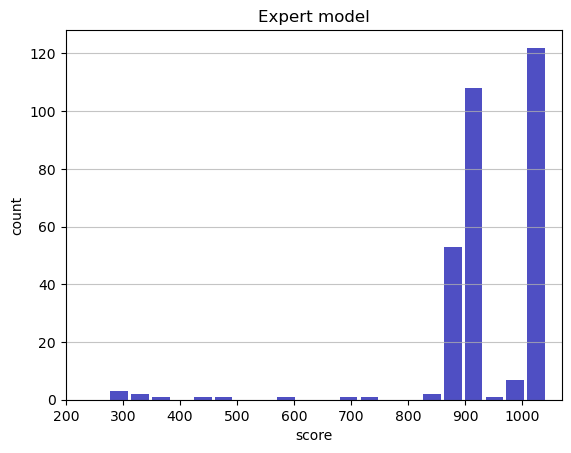

Track generation: 1262..1582 -> 320-tiles track
Epoch: 305
Expert	mean: 936.98	variance: 118.42



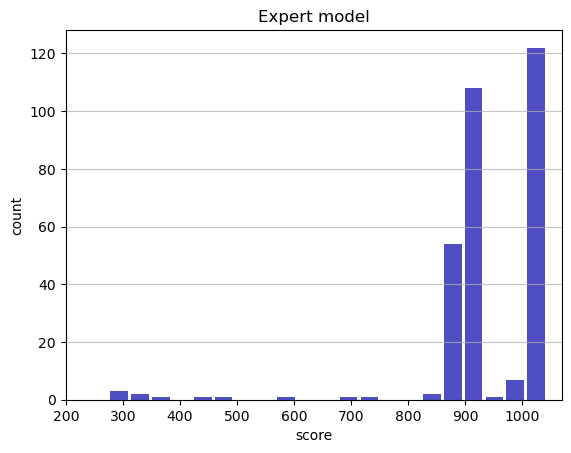

Track generation: 1072..1349 -> 277-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1192..1494 -> 302-tiles track
Epoch: 306
Expert	mean: 936.80	variance: 118.27



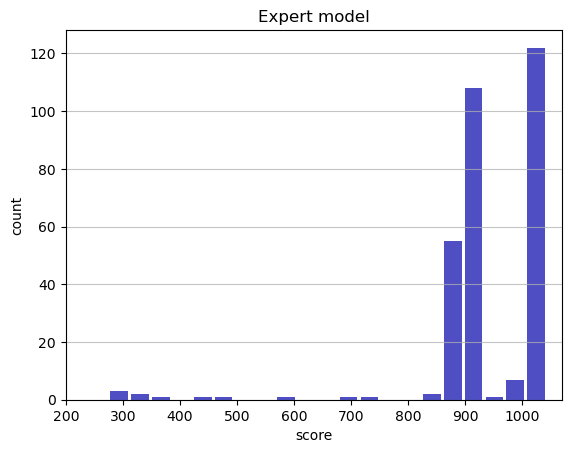

Track generation: 1140..1429 -> 289-tiles track
Epoch: 307
Expert	mean: 937.10	variance: 118.19



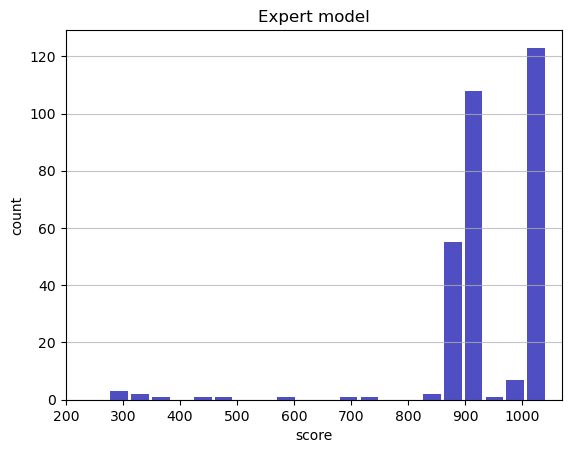

Track generation: 1199..1503 -> 304-tiles track
Epoch: 308
Expert	mean: 936.95	variance: 118.03



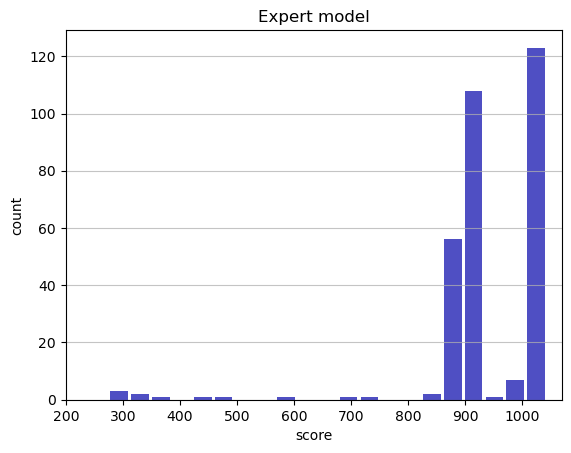

Track generation: 1201..1506 -> 305-tiles track
Epoch: 309
Expert	mean: 936.79	variance: 117.87



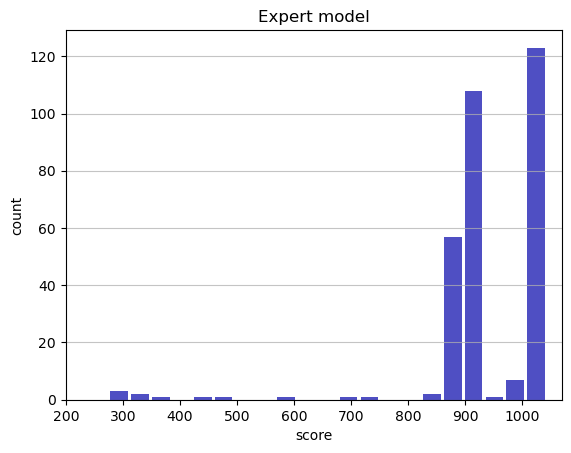

Track generation: 1081..1355 -> 274-tiles track
Epoch: 310
Expert	mean: 936.67	variance: 117.70



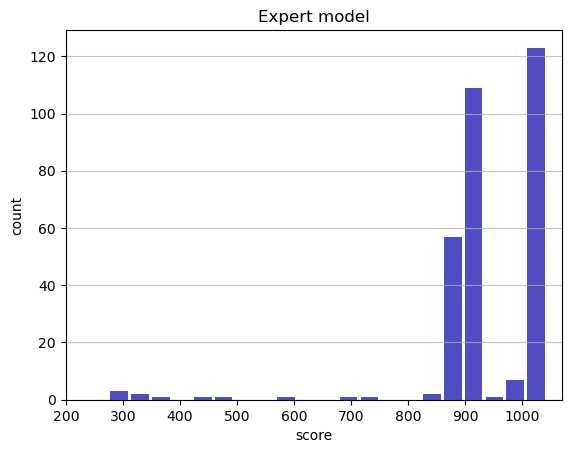

Track generation: 1103..1389 -> 286-tiles track
Epoch: 311
Expert	mean: 936.57	variance: 117.52



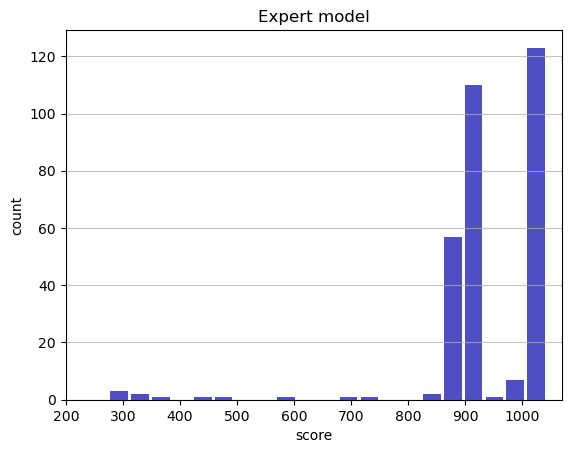

Track generation: 1138..1427 -> 289-tiles track
Epoch: 312
Expert	mean: 936.87	variance: 117.45



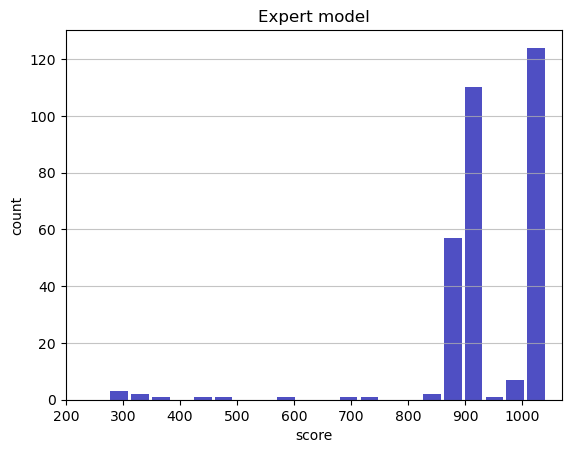

Track generation: 1253..1570 -> 317-tiles track
Epoch: 313
Expert	mean: 936.72	variance: 117.29



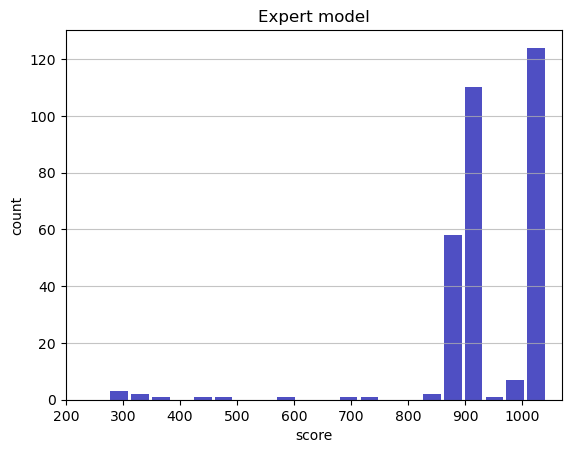

Track generation: 1088..1364 -> 276-tiles track
Epoch: 314
Expert	mean: 937.02	variance: 117.22



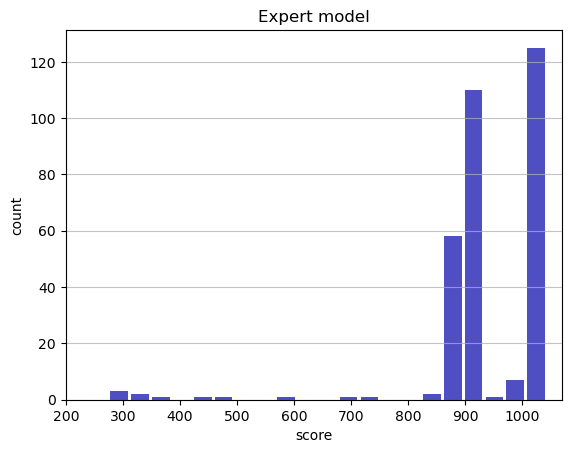

Track generation: 933..1174 -> 241-tiles track
Epoch: 315
Expert	mean: 937.35	variance: 117.18



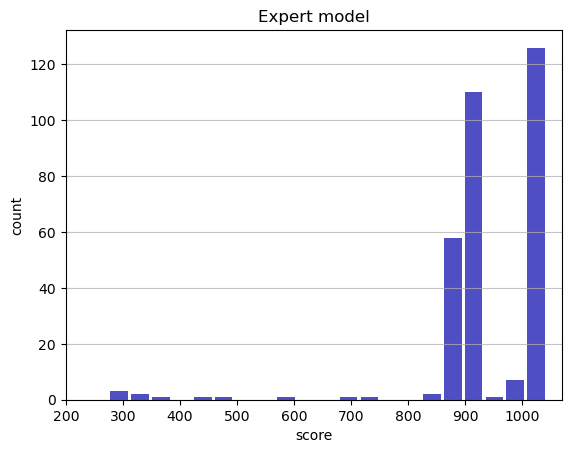

Track generation: 1136..1424 -> 288-tiles track
Epoch: 316
Expert	mean: 937.28	variance: 117.00



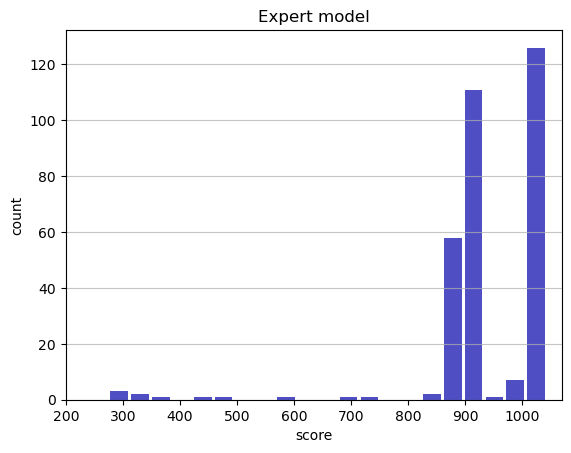

Track generation: 1103..1383 -> 280-tiles track
Epoch: 317
Expert	mean: 937.58	variance: 116.94



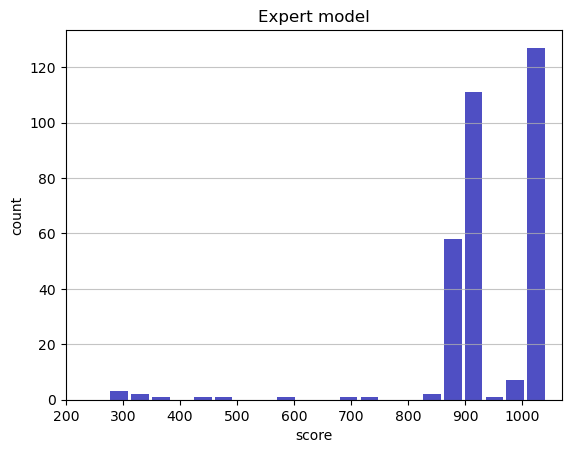

Track generation: 1158..1452 -> 294-tiles track
Epoch: 318
Expert	mean: 937.86	variance: 116.86



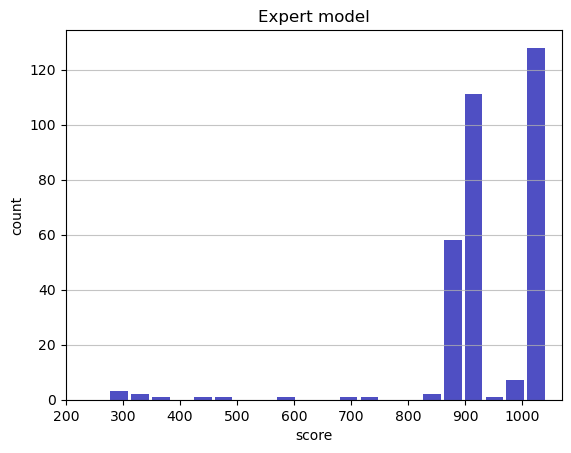

Track generation: 1210..1520 -> 310-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1199..1503 -> 304-tiles track
Epoch: 319
Expert	mean: 938.14	variance: 116.79



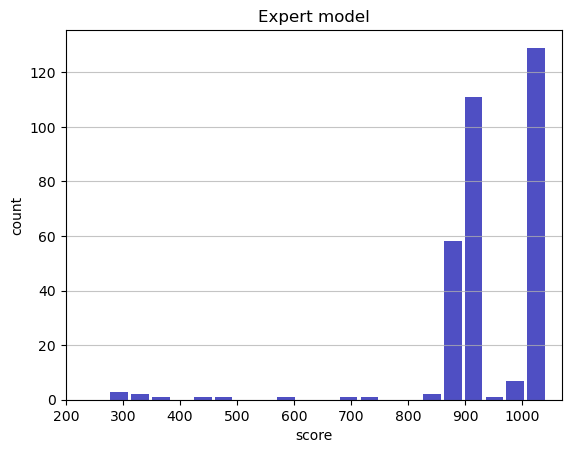

Track generation: 1231..1543 -> 312-tiles track
Epoch: 320
Expert	mean: 938.40	variance: 116.69



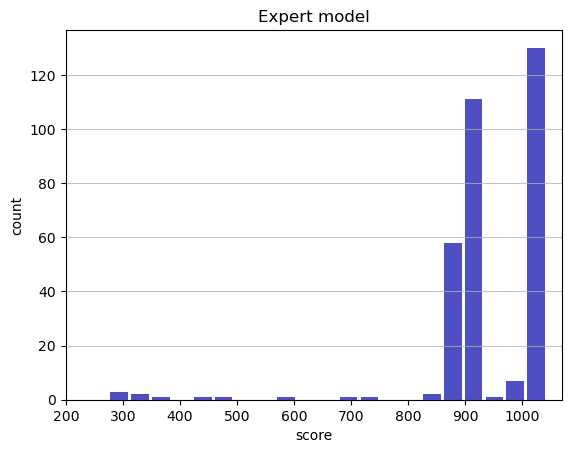

Track generation: 1115..1398 -> 283-tiles track
Epoch: 321
Expert	mean: 938.67	variance: 116.61



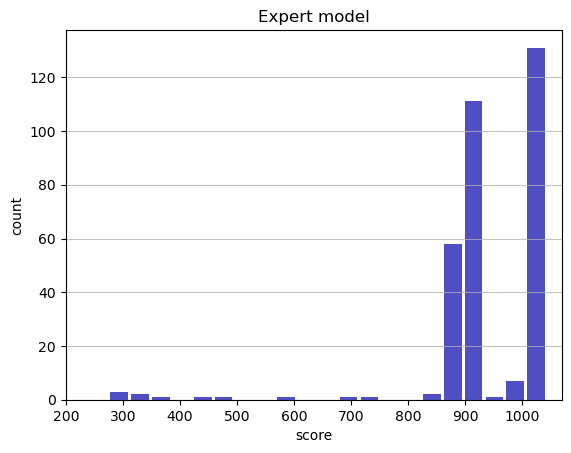

Track generation: 1174..1471 -> 297-tiles track
Epoch: 322
Expert	mean: 938.95	variance: 116.54



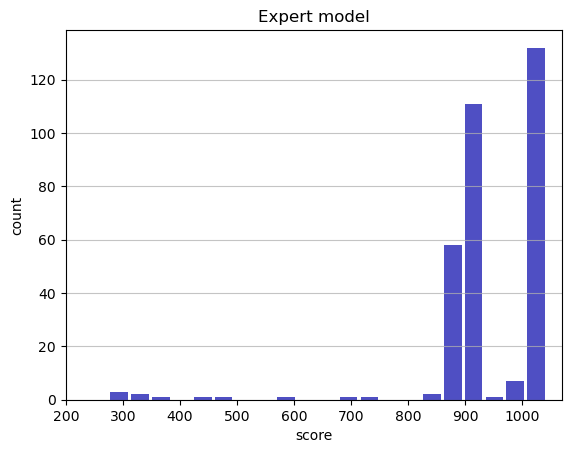

Track generation: 1162..1456 -> 294-tiles track
Epoch: 323
Expert	mean: 939.22	variance: 116.46



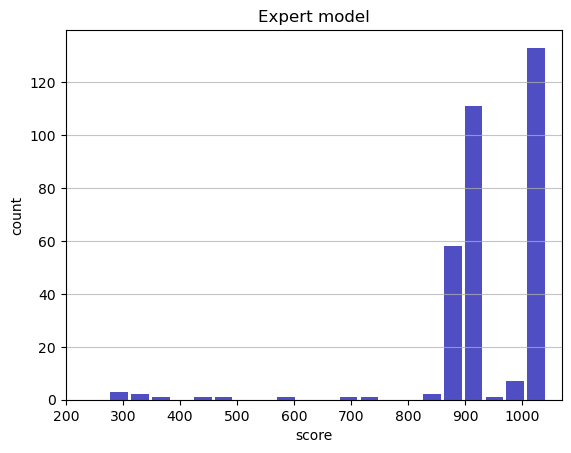

Track generation: 1121..1413 -> 292-tiles track
Epoch: 324
Expert	mean: 939.04	variance: 116.32



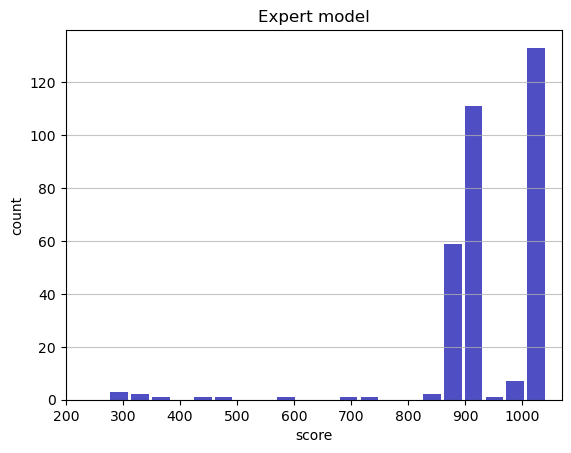

Track generation: 1188..1497 -> 309-tiles track
Epoch: 325
Expert	mean: 939.29	variance: 116.23



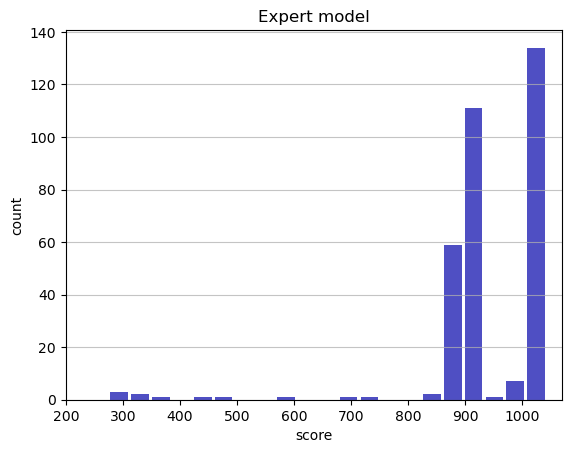

Track generation: 1210..1524 -> 314-tiles track
Epoch: 326
Expert	mean: 939.15	variance: 116.08



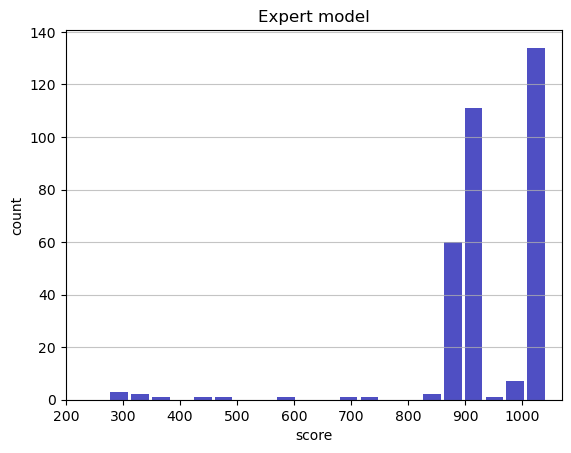

Track generation: 1240..1554 -> 314-tiles track
Epoch: 327
Expert	mean: 939.02	variance: 115.92



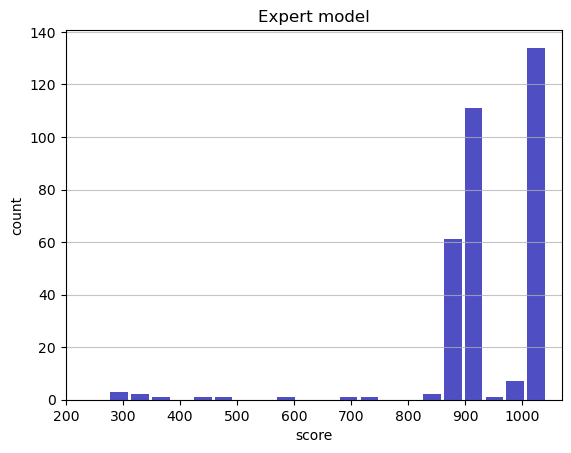

Track generation: 1039..1303 -> 264-tiles track
Epoch: 328
Expert	mean: 939.31	variance: 115.87



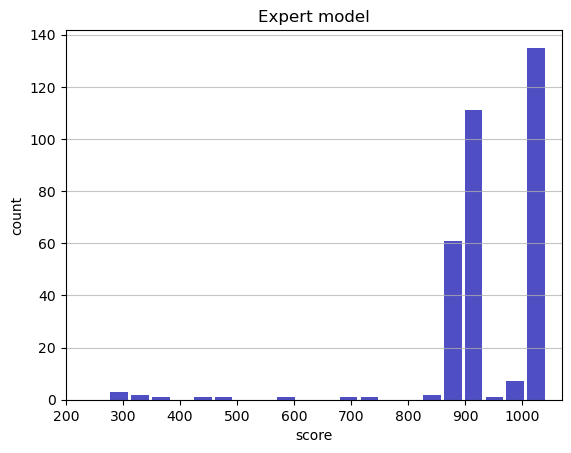

Track generation: 1045..1314 -> 269-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1288..1614 -> 326-tiles track
Epoch: 329
Expert	mean: 939.15	variance: 115.72



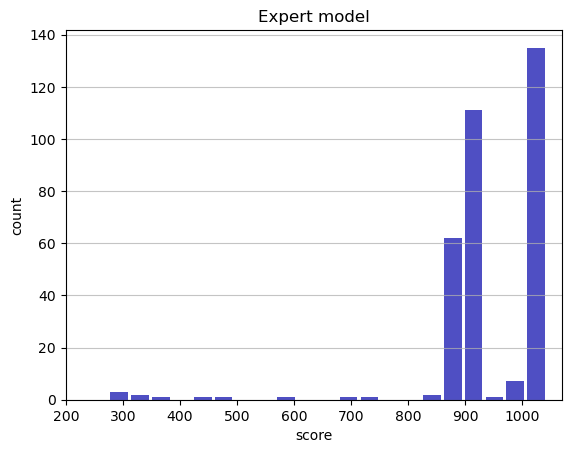

Track generation: 1060..1329 -> 269-tiles track
Epoch: 330
Expert	mean: 939.44	variance: 115.67



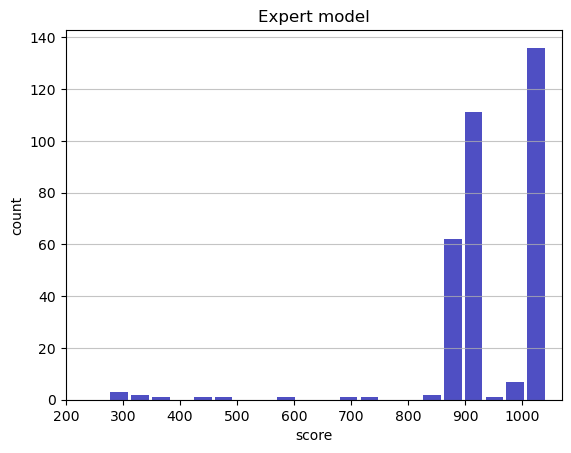

Track generation: 1189..1490 -> 301-tiles track
Epoch: 331
Expert	mean: 939.70	variance: 115.59



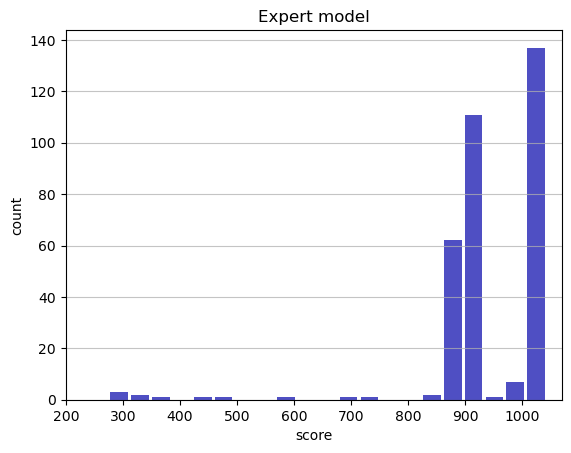

Track generation: 1115..1398 -> 283-tiles track
Epoch: 332
Expert	mean: 939.58	variance: 115.44



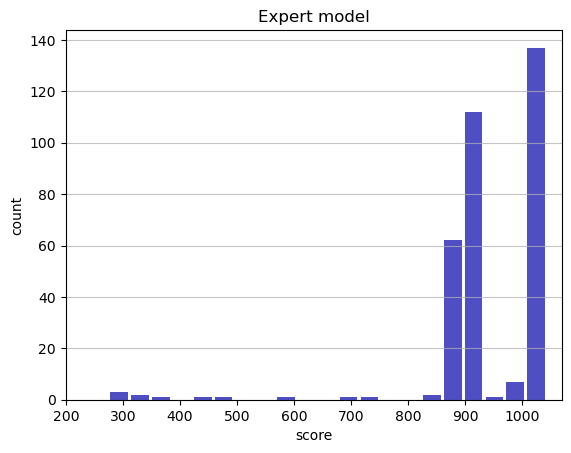

Track generation: 990..1249 -> 259-tiles track
Epoch: 333
Expert	mean: 939.87	variance: 115.39



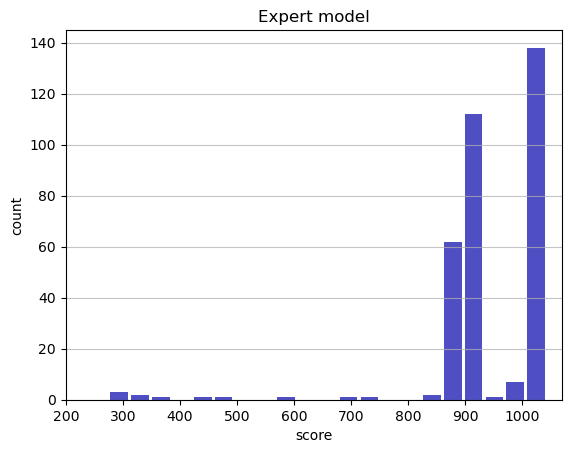

Track generation: 1089..1371 -> 282-tiles track
Epoch: 334
Expert	mean: 940.13	variance: 115.32



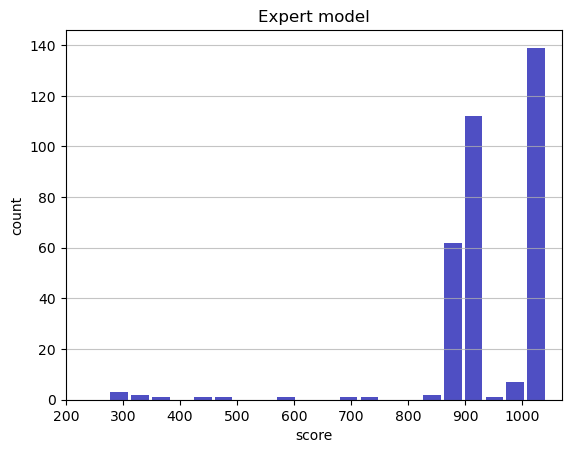

Track generation: 1139..1427 -> 288-tiles track
Epoch: 335
Expert	mean: 939.95	variance: 115.20



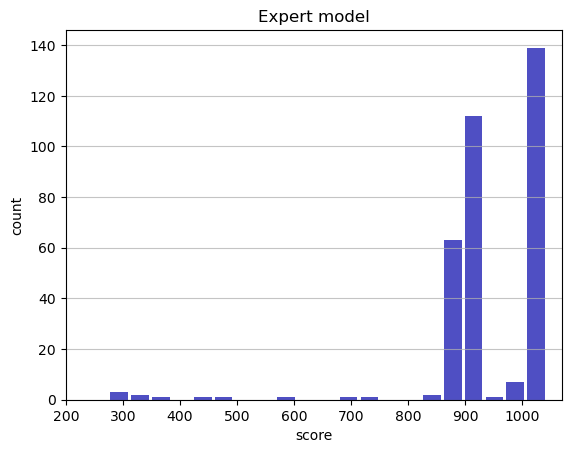

Track generation: 1143..1433 -> 290-tiles track
Epoch: 336
Expert	mean: 940.19	variance: 115.11



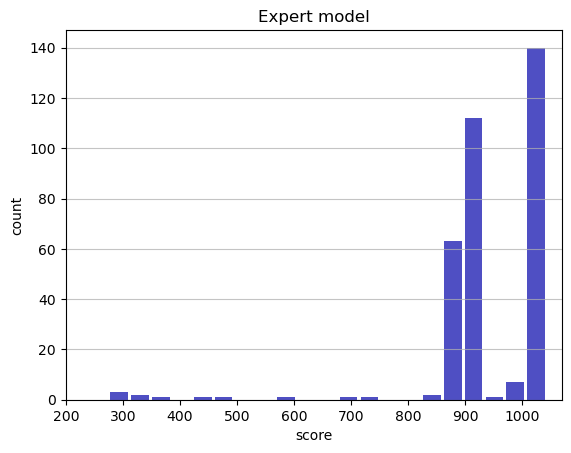

Track generation: 1073..1348 -> 275-tiles track
Epoch: 337
Expert	mean: 940.48	variance: 115.06



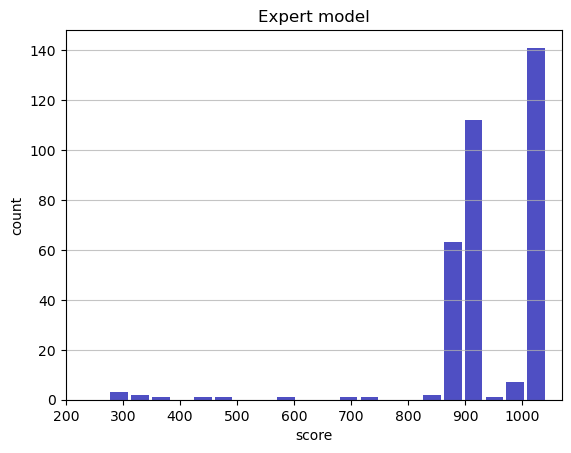

Track generation: 1205..1510 -> 305-tiles track
Epoch: 338
Expert	mean: 940.38	variance: 114.91



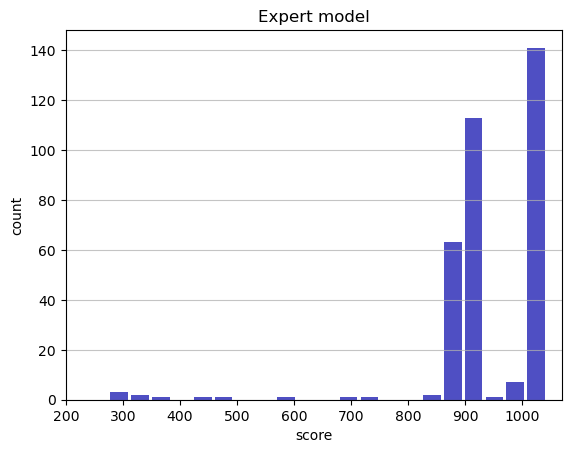

Track generation: 1114..1400 -> 286-tiles track
Epoch: 339
Expert	mean: 940.24	variance: 114.76



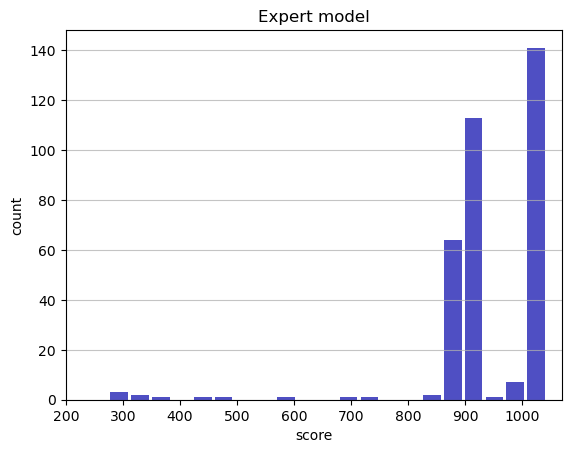

Track generation: 1114..1397 -> 283-tiles track
Epoch: 340
Expert	mean: 940.14	variance: 114.61



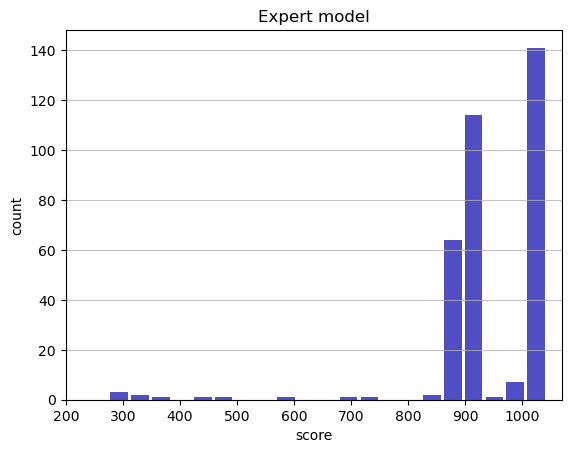

Track generation: 1082..1357 -> 275-tiles track
Epoch: 341
Expert	mean: 940.40	variance: 114.54



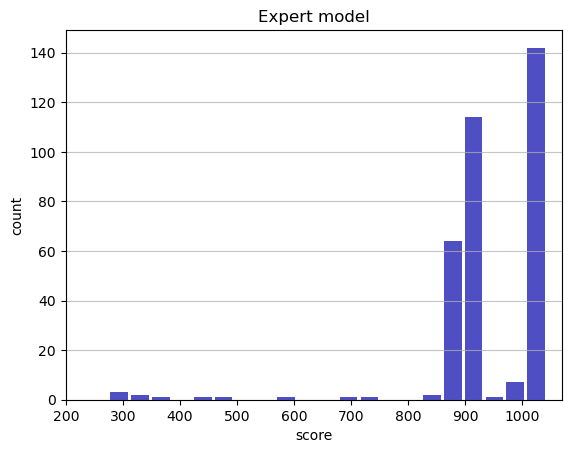

Track generation: 1122..1406 -> 284-tiles track
Epoch: 342
Expert	mean: 940.23	variance: 114.42



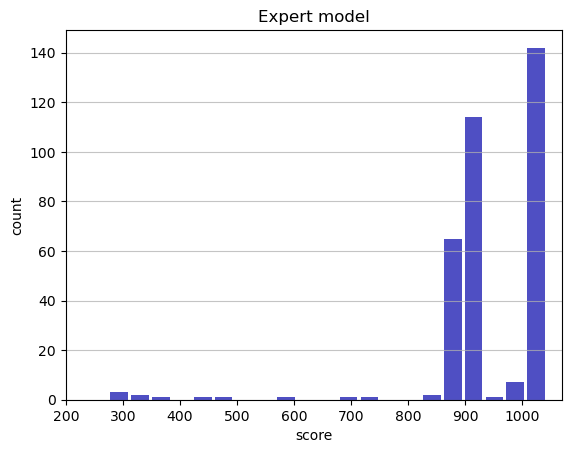

Track generation: 1175..1483 -> 308-tiles track
Epoch: 343
Expert	mean: 940.46	variance: 114.33



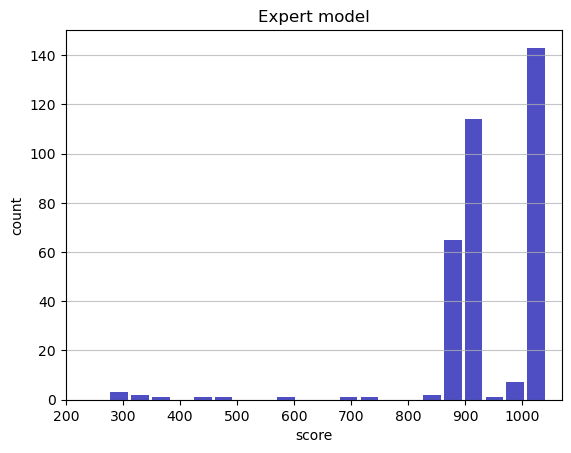

Track generation: 1213..1520 -> 307-tiles track
Epoch: 344
Expert	mean: 940.69	variance: 114.25



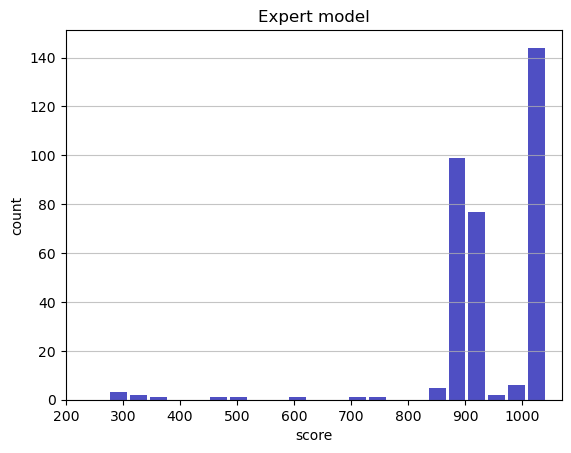

Track generation: 1132..1419 -> 287-tiles track
Epoch: 345
Expert	mean: 940.57	variance: 114.10



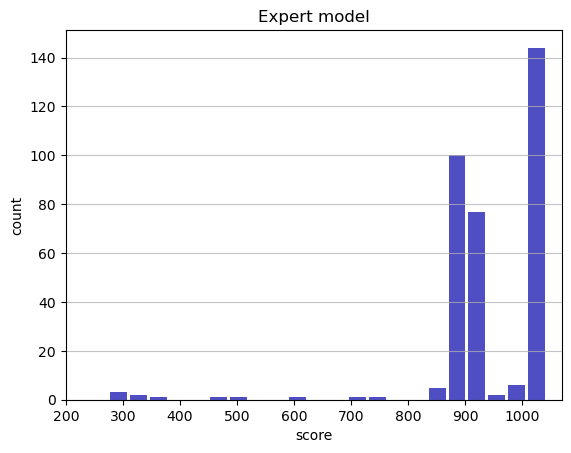

Track generation: 1223..1533 -> 310-tiles track
Epoch: 346
Expert	mean: 940.46	variance: 113.96



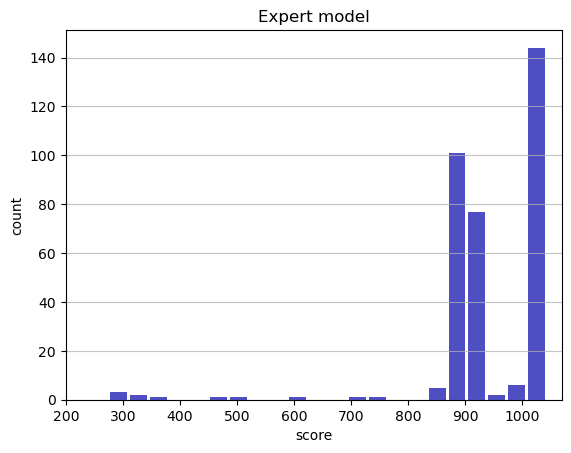

Track generation: 1032..1294 -> 262-tiles track
Epoch: 347
Expert	mean: 940.73	variance: 113.90



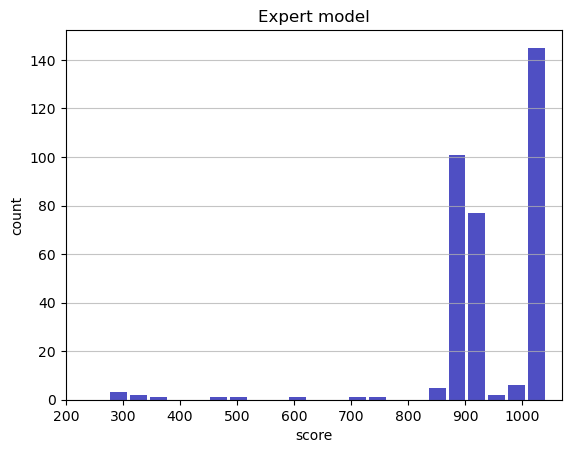

Track generation: 1280..1604 -> 324-tiles track
Epoch: 348
Expert	mean: 940.59	variance: 113.76



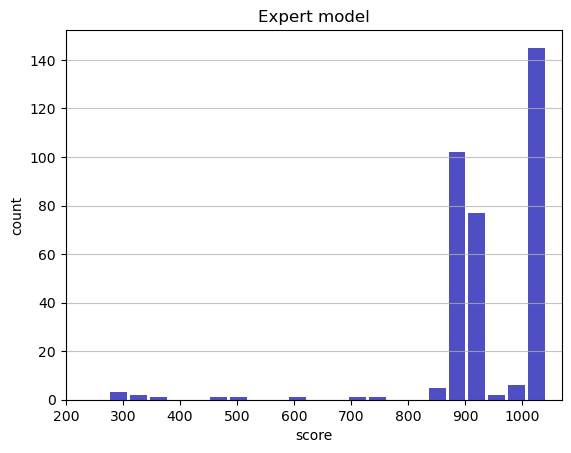

Track generation: 1195..1498 -> 303-tiles track
Epoch: 349
Expert	mean: 940.83	variance: 113.69



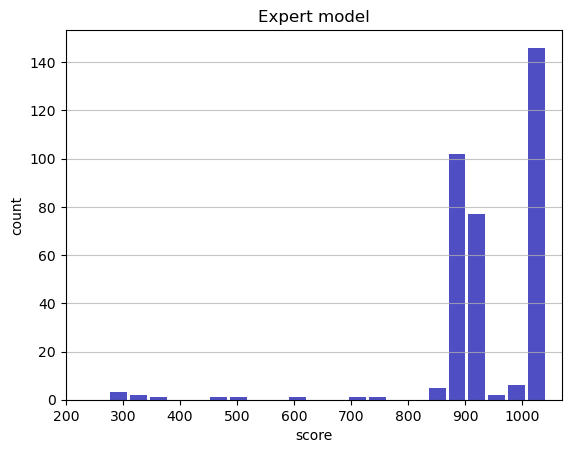

Track generation: 1115..1398 -> 283-tiles track
Epoch: 350
Expert	mean: 941.10	variance: 113.64



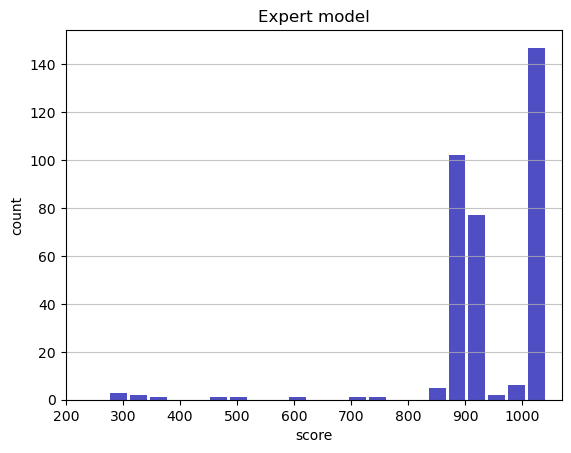

Track generation: 1286..1611 -> 325-tiles track
Epoch: 351
Expert	mean: 940.91	variance: 113.53



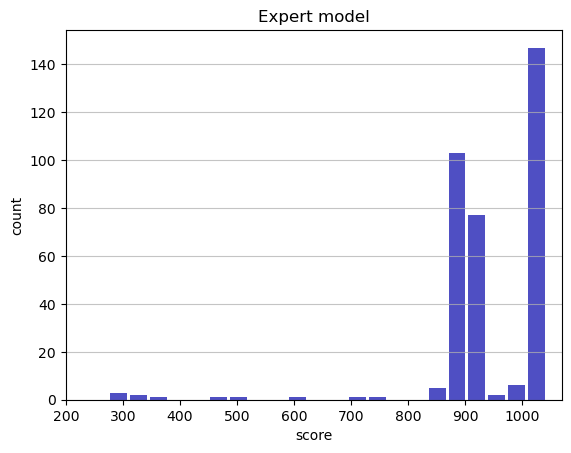

Track generation: 1178..1487 -> 309-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1121..1412 -> 291-tiles track
Epoch: 352
Expert	mean: 940.73	variance: 113.42



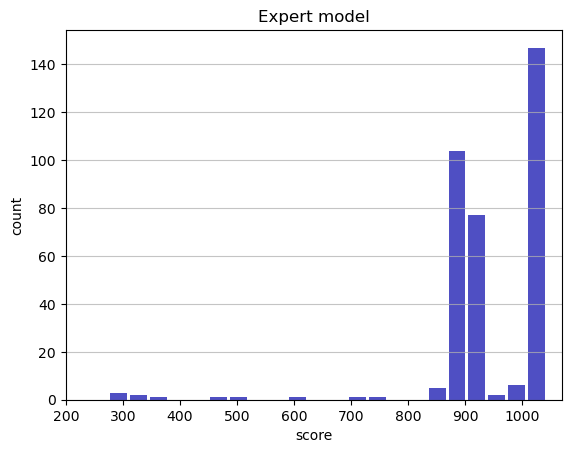

Track generation: 1046..1316 -> 270-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1163..1458 -> 295-tiles track
Epoch: 353
Expert	mean: 940.97	variance: 113.35



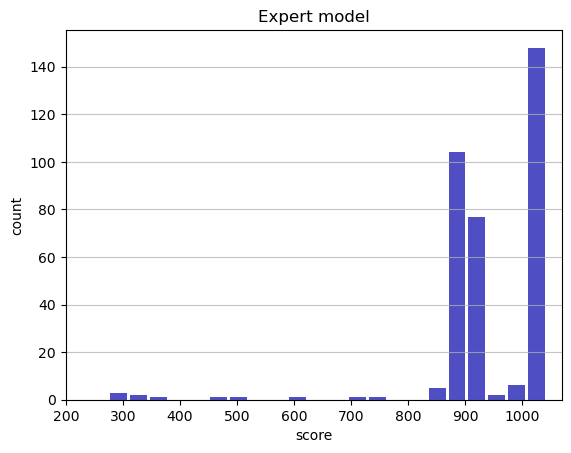

Track generation: 1099..1378 -> 279-tiles track
Epoch: 354
Expert	mean: 941.23	variance: 113.30



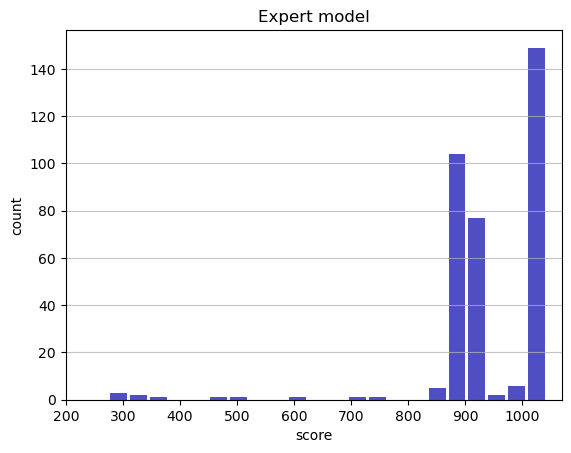

Track generation: 1158..1454 -> 296-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1108..1389 -> 281-tiles track
Epoch: 355
Expert	mean: 941.50	variance: 113.25



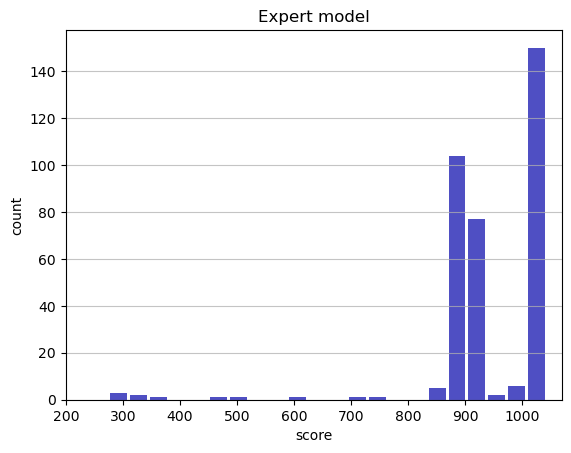

Track generation: 1210..1517 -> 307-tiles track
Epoch: 356
Expert	mean: 941.73	variance: 113.17



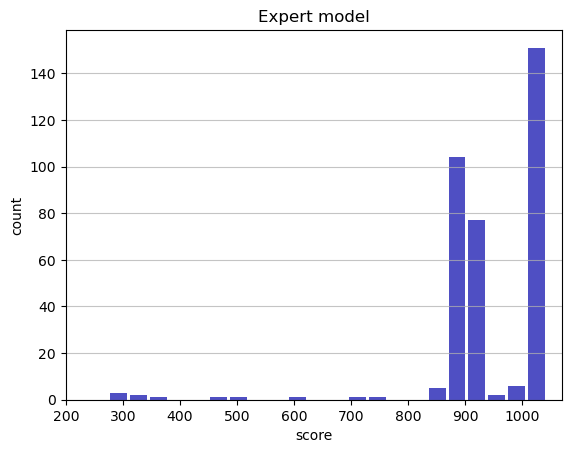

Track generation: 1111..1393 -> 282-tiles track
Epoch: 357
Expert	mean: 941.66	variance: 113.02



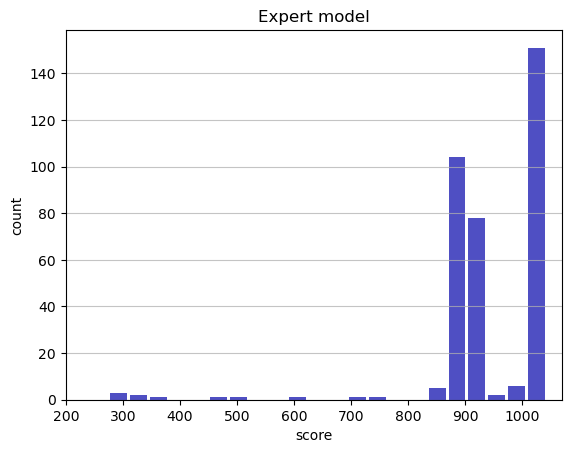

Track generation: 1278..1601 -> 323-tiles track
Epoch: 358
Expert	mean: 941.49	variance: 112.91



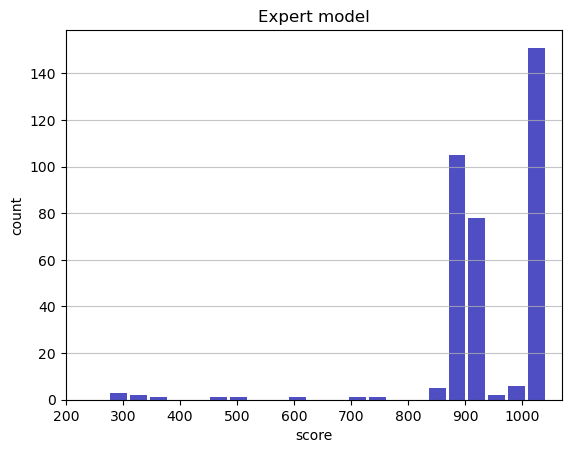

Track generation: 1026..1289 -> 263-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1231..1545 -> 314-tiles track
Epoch: 359
Expert	mean: 941.69	variance: 112.81



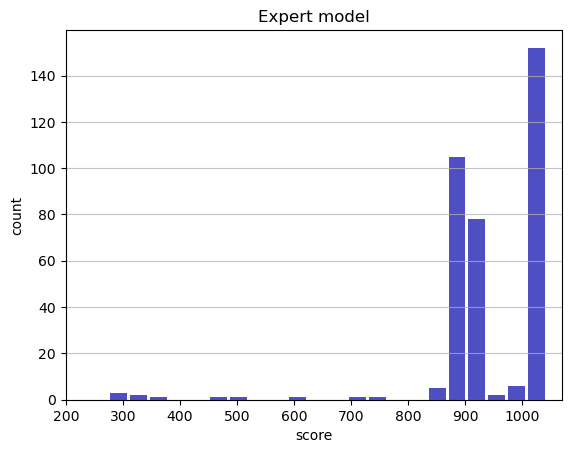

Track generation: 1231..1543 -> 312-tiles track
Epoch: 360
Expert	mean: 941.59	variance: 112.67



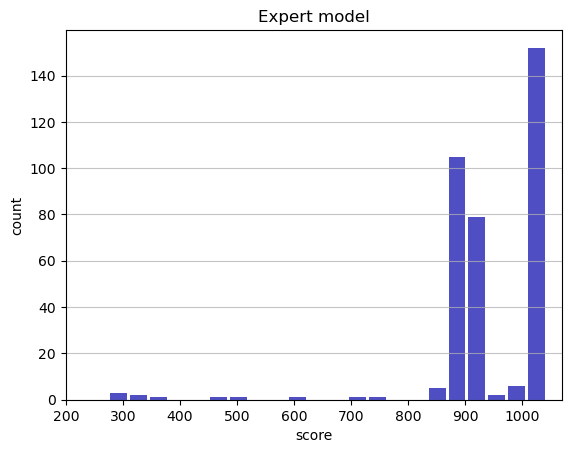

Track generation: 1182..1482 -> 300-tiles track
Epoch: 361
Expert	mean: 941.82	variance: 112.60



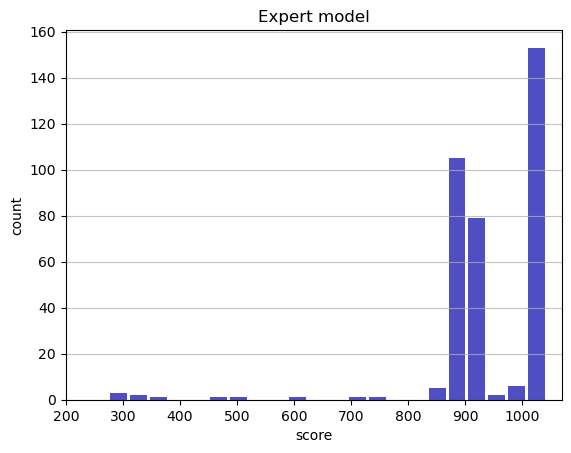

Track generation: 1191..1493 -> 302-tiles track
Epoch: 362
Expert	mean: 941.68	variance: 112.48



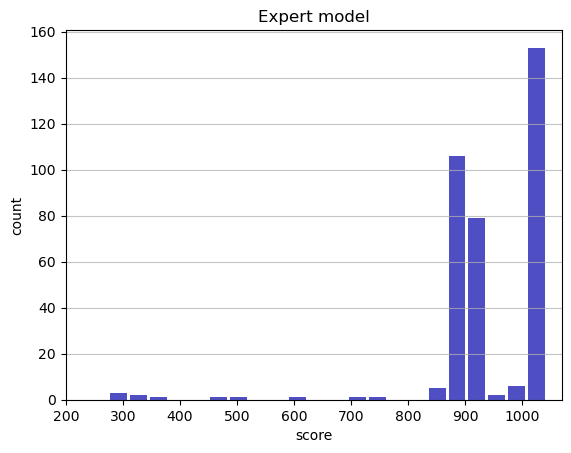

Track generation: 1112..1394 -> 282-tiles track
Epoch: 363
Expert	mean: 941.93	variance: 112.42



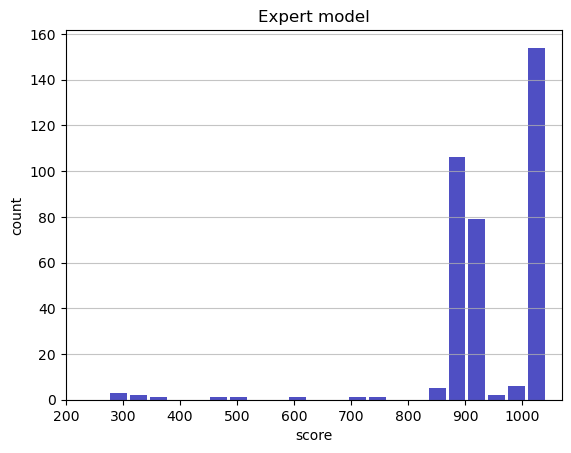

Track generation: 1017..1275 -> 258-tiles track
Epoch: 364
Expert	mean: 941.87	variance: 112.27



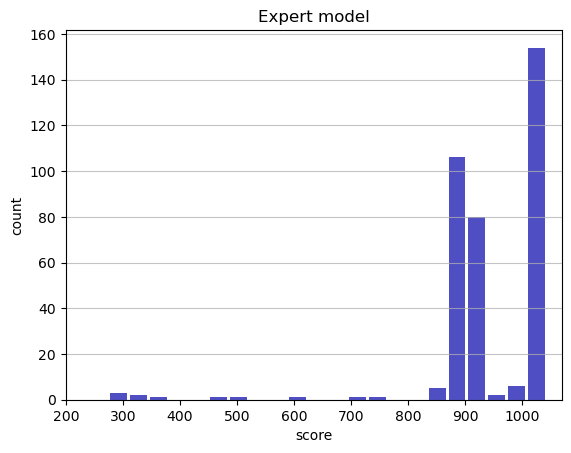

Track generation: 1015..1273 -> 258-tiles track
Epoch: 365
Expert	mean: 941.78	variance: 112.13



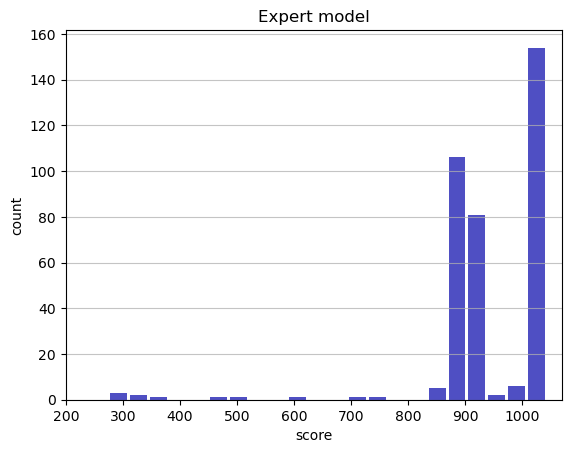

Track generation: 1041..1306 -> 265-tiles track
Epoch: 366
Expert	mean: 942.04	variance: 112.08



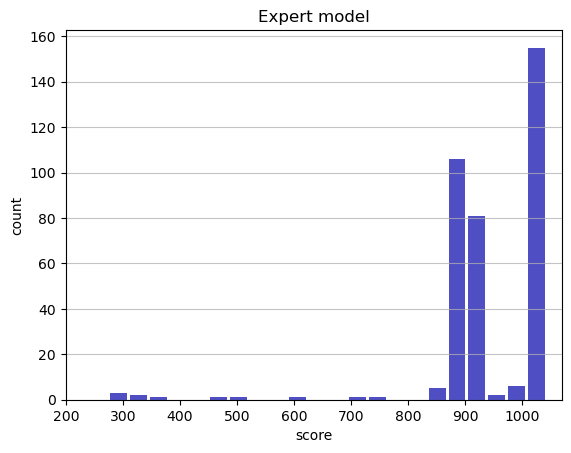

Track generation: 1110..1389 -> 279-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1204..1515 -> 311-tiles track
Epoch: 367
Expert	mean: 942.25	variance: 112.01



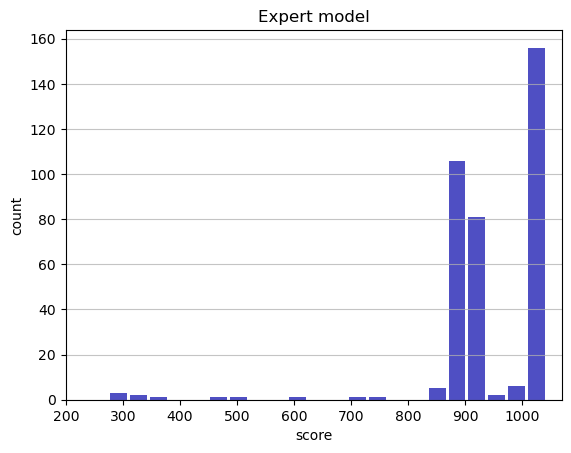

Track generation: 1200..1504 -> 304-tiles track
Epoch: 368
Expert	mean: 942.15	variance: 111.87



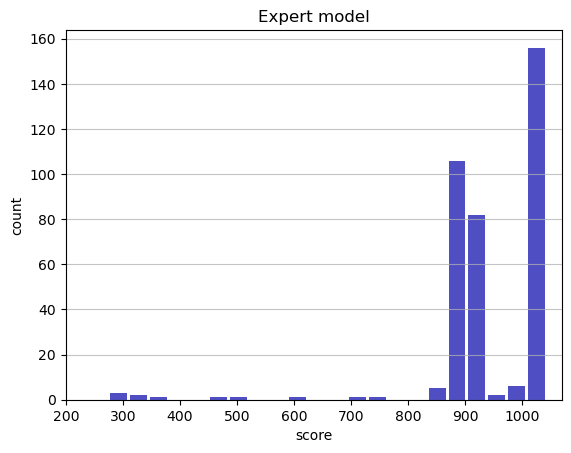

Track generation: 1273..1595 -> 322-tiles track
Epoch: 369
Expert	mean: 942.35	variance: 111.78



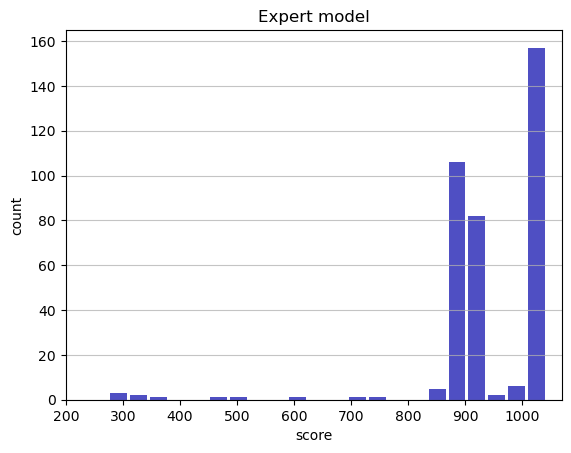

Track generation: 1032..1302 -> 270-tiles track
Epoch: 370
Expert	mean: 942.28	variance: 111.64



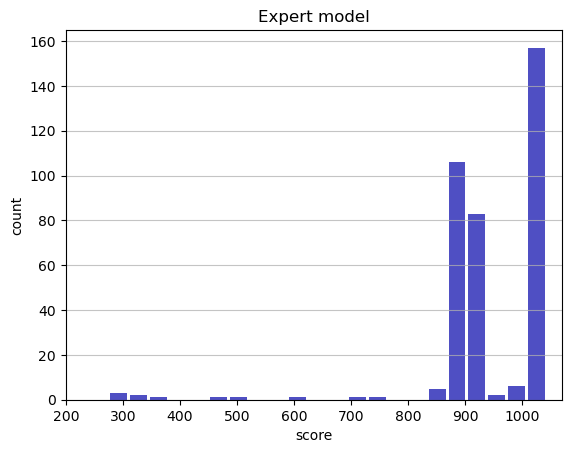

Track generation: 1339..1678 -> 339-tiles track
Epoch: 371
Expert	mean: 942.39	variance: 111.51



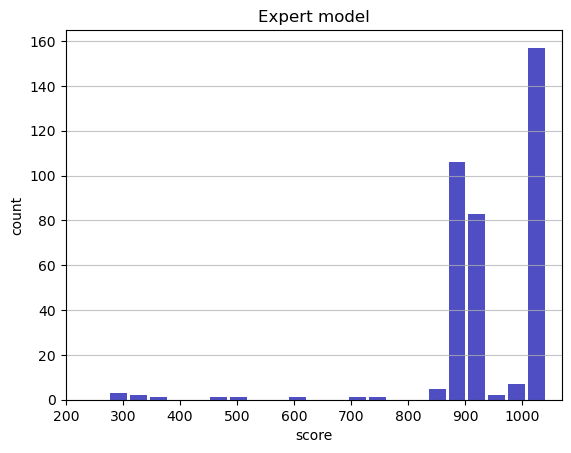

Track generation: 1068..1342 -> 274-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1310..1641 -> 331-tiles track
Epoch: 372
Expert	mean: 942.60	variance: 111.43



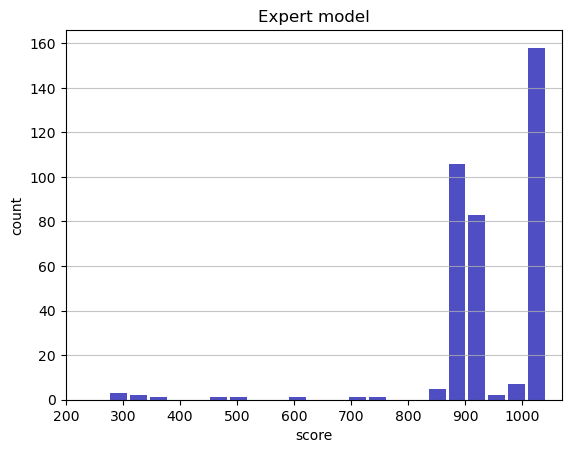

Track generation: 1136..1424 -> 288-tiles track
Epoch: 373
Expert	mean: 942.84	variance: 111.38



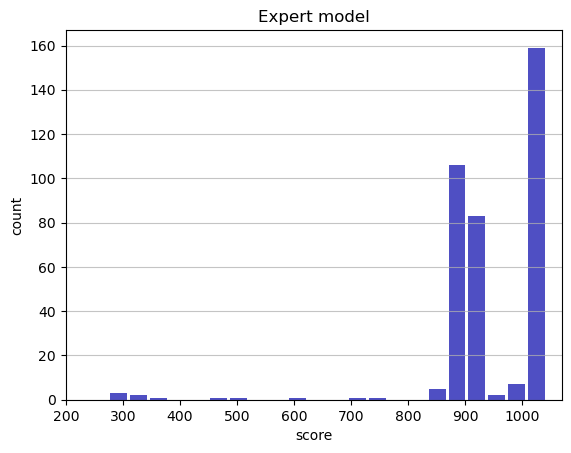

Track generation: 1120..1404 -> 284-tiles track
Epoch: 374
Expert	mean: 942.70	variance: 111.26



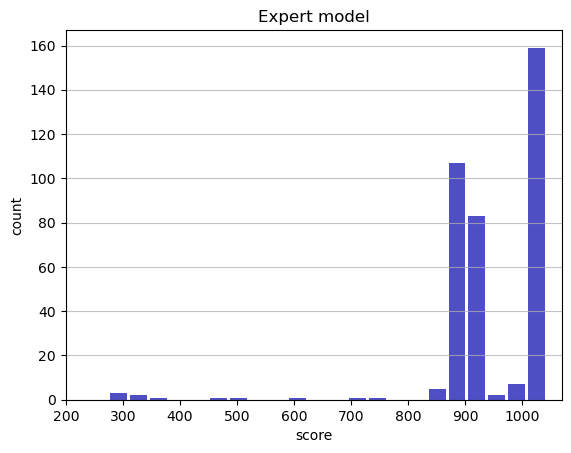

Track generation: 1123..1408 -> 285-tiles track
Epoch: 375
Expert	mean: 942.58	variance: 111.14



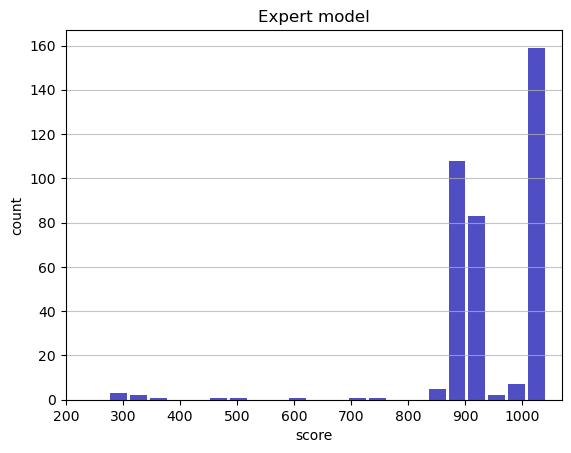

Track generation: 1139..1427 -> 288-tiles track
Epoch: 376
Expert	mean: 942.46	variance: 111.01



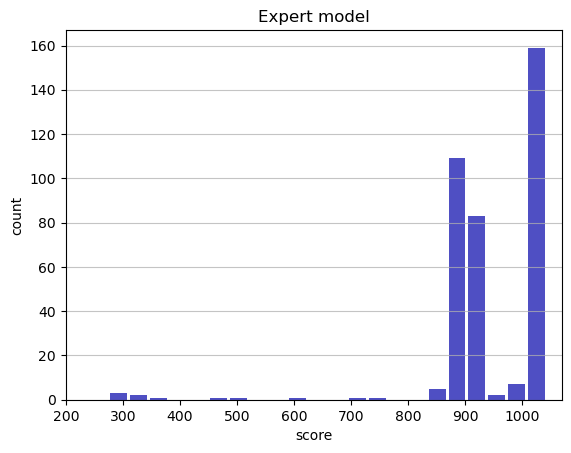

Track generation: 1343..1683 -> 340-tiles track
Epoch: 377
Expert	mean: 942.30	variance: 110.91



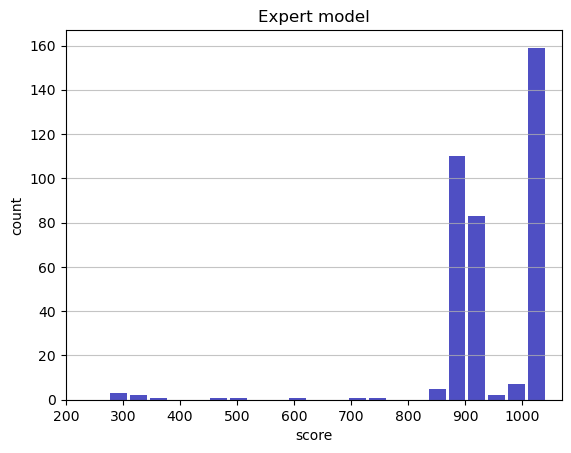

Track generation: 1063..1339 -> 276-tiles track
Epoch: 378
Expert	mean: 942.54	variance: 110.85



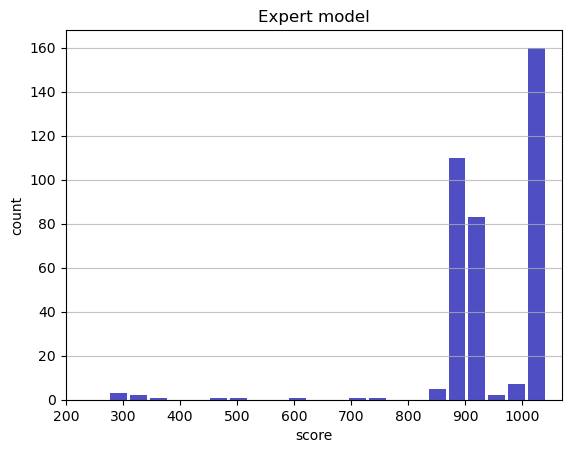

Track generation: 1208..1514 -> 306-tiles track
Epoch: 379
Expert	mean: 942.75	variance: 110.79



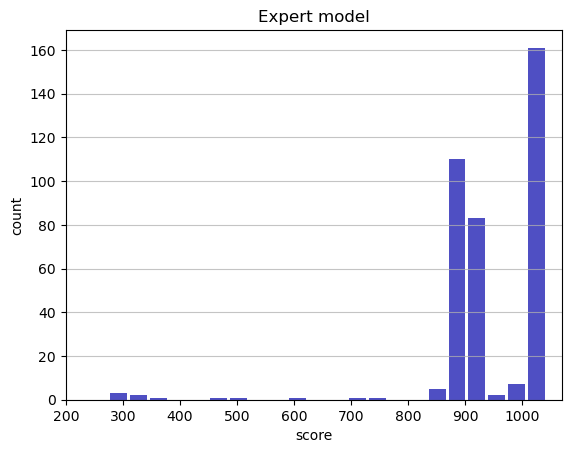

Track generation: 1294..1622 -> 328-tiles track
Epoch: 380
Expert	mean: 942.95	variance: 110.71



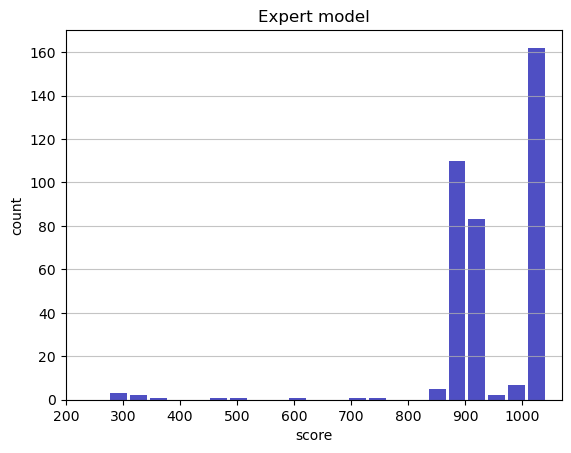

Track generation: 1007..1263 -> 256-tiles track
Epoch: 381
Expert	mean: 943.21	variance: 110.68



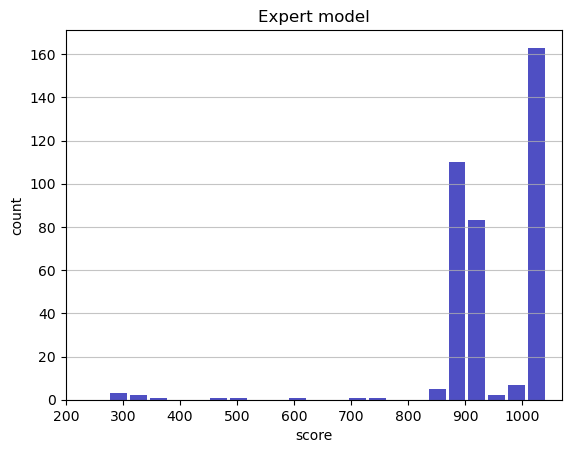

Track generation: 1080..1354 -> 274-tiles track
Epoch: 382
Expert	mean: 943.12	variance: 110.55



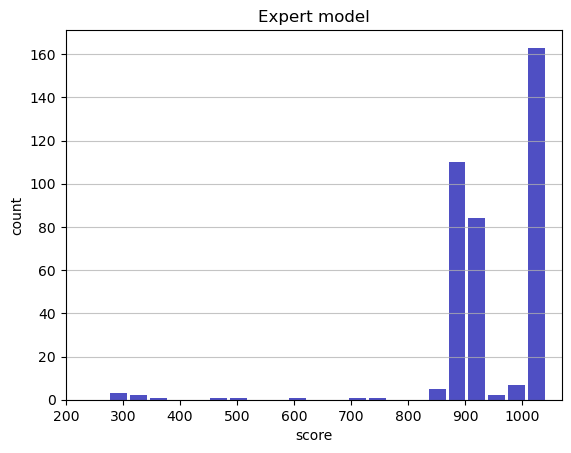

Track generation: 1251..1568 -> 317-tiles track
Epoch: 383
Expert	mean: 943.31	variance: 110.48



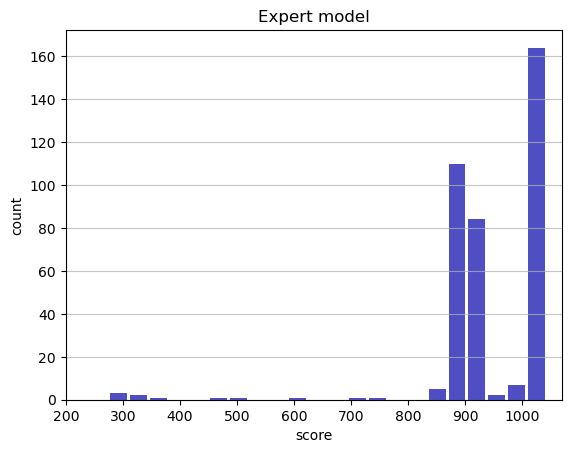

Track generation: 1180..1484 -> 304-tiles track
Epoch: 384
Expert	mean: 943.52	variance: 110.41



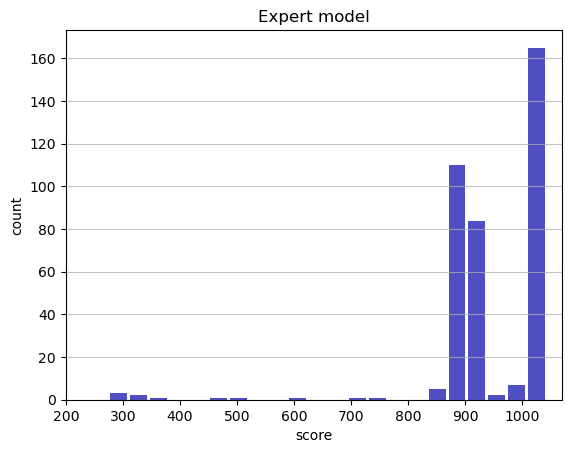

Track generation: 1156..1449 -> 293-tiles track
Epoch: 385
Expert	mean: 943.40	variance: 110.29



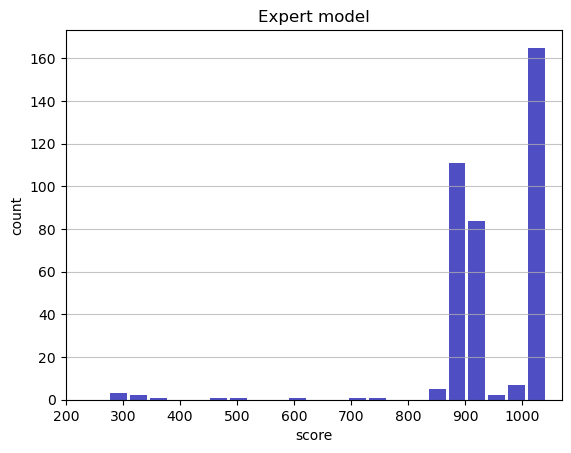

Track generation: 1128..1414 -> 286-tiles track
Epoch: 386
Expert	mean: 943.63	variance: 110.24



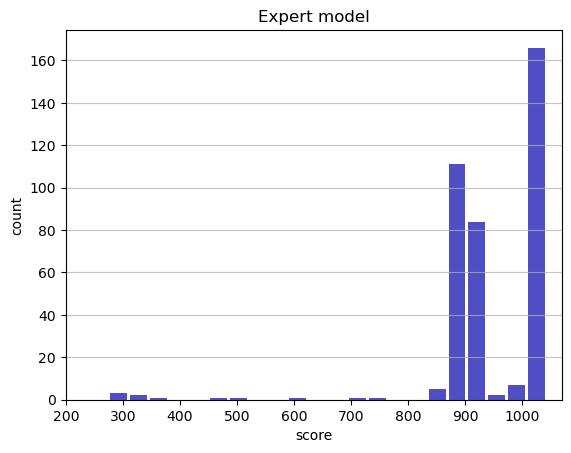

Track generation: 1200..1504 -> 304-tiles track
Epoch: 387
Expert	mean: 943.52	variance: 110.12



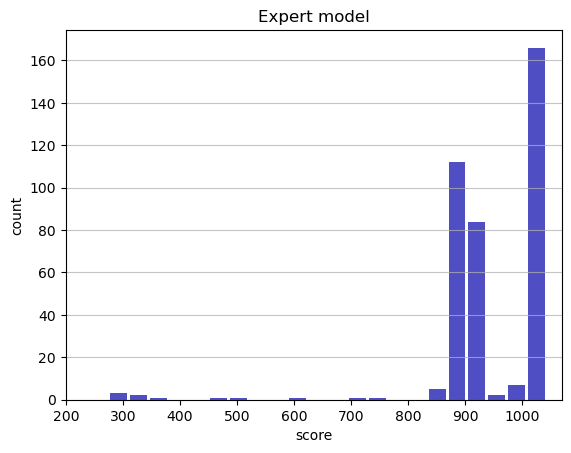

Track generation: 1179..1483 -> 304-tiles track
Epoch: 388
Expert	mean: 943.42	variance: 109.99



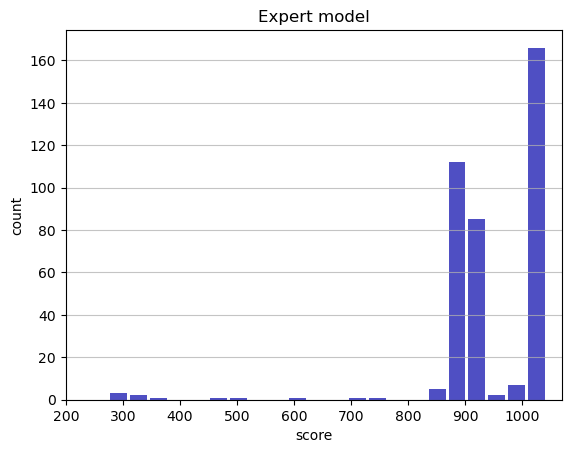

Track generation: 1057..1325 -> 268-tiles track
Epoch: 389
Expert	mean: 943.67	variance: 109.96



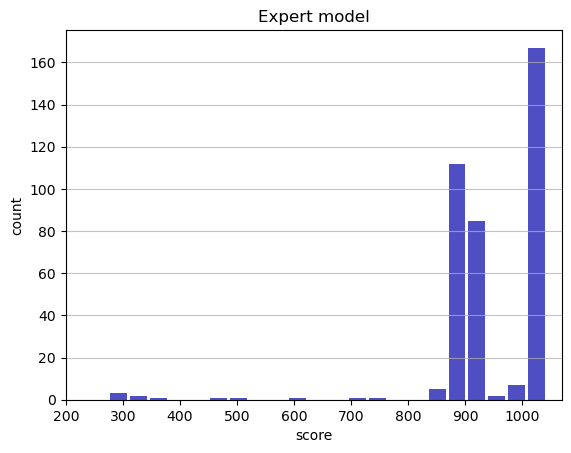

Track generation: 1171..1468 -> 297-tiles track
Epoch: 390
Expert	mean: 943.88	variance: 109.90



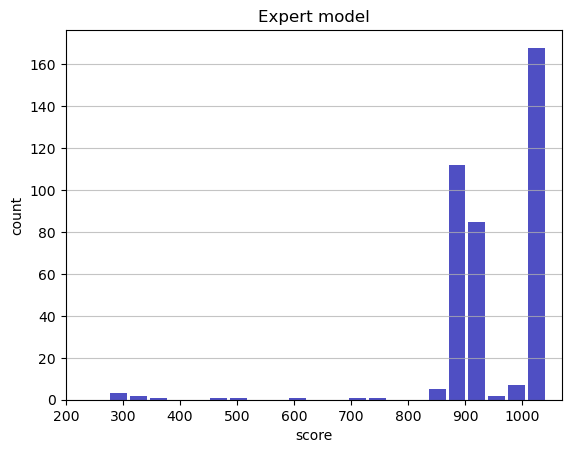

Track generation: 1111..1392 -> 281-tiles track
Epoch: 391
Expert	mean: 943.80	variance: 109.77



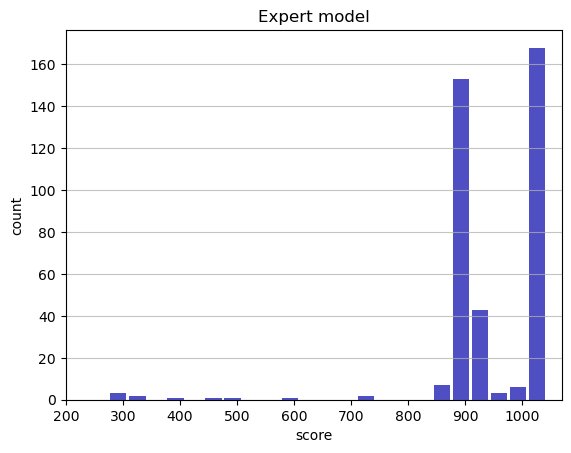

Track generation: 949..1195 -> 246-tiles track
Epoch: 392
Expert	mean: 943.74	variance: 109.63



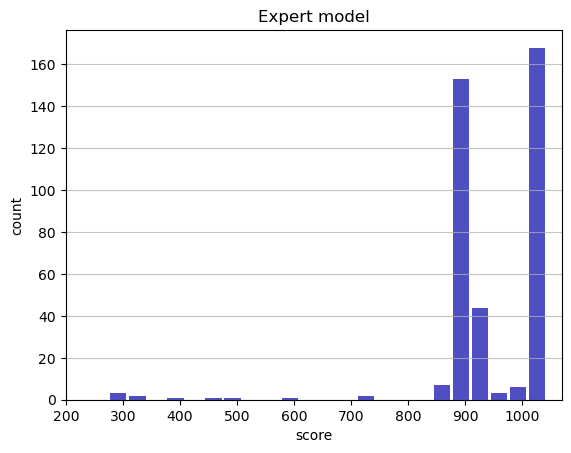

Track generation: 1152..1452 -> 300-tiles track
Epoch: 393
Expert	mean: 943.48	variance: 109.62



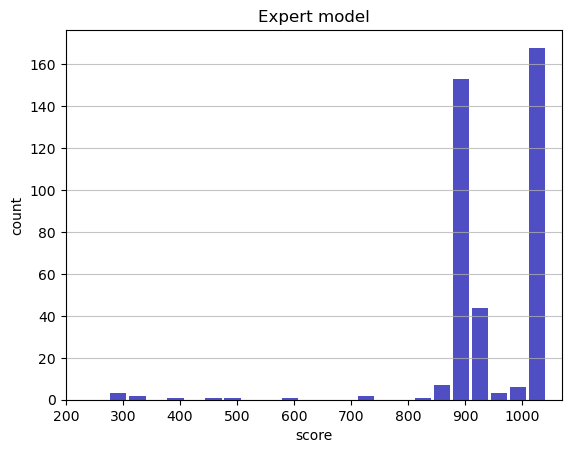

Track generation: 1103..1390 -> 287-tiles track
Epoch: 394
Expert	mean: 943.69	variance: 109.56



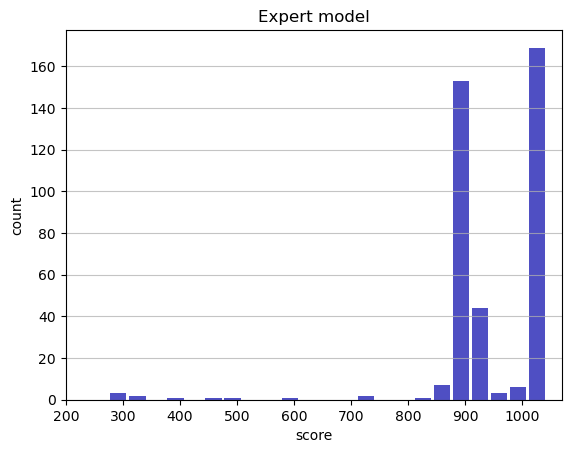

Track generation: 1115..1398 -> 283-tiles track
Epoch: 395
Expert	mean: 943.91	variance: 109.51



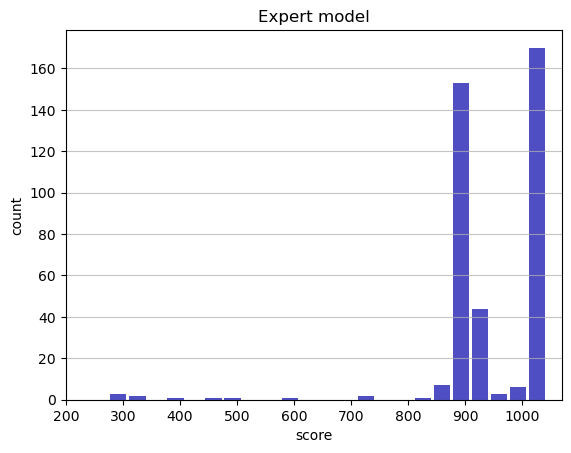

Track generation: 1232..1544 -> 312-tiles track
Epoch: 396
Expert	mean: 944.10	variance: 109.43



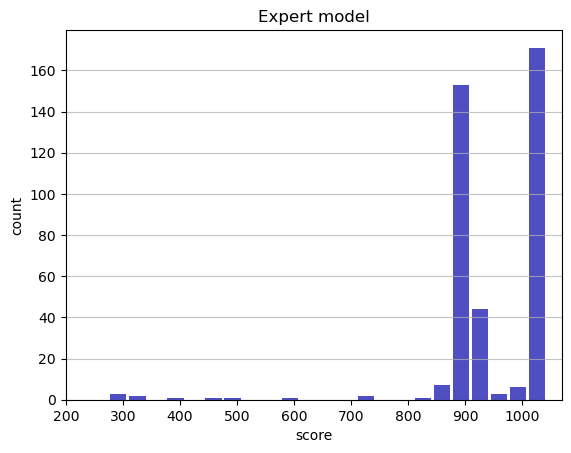

Track generation: 1235..1548 -> 313-tiles track
Epoch: 397
Expert	mean: 943.97	variance: 109.32



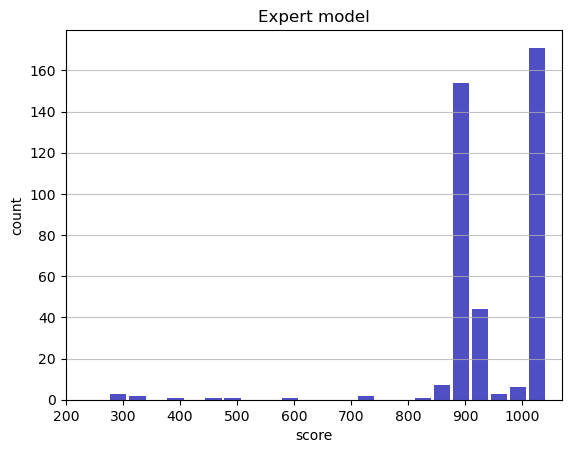

Track generation: 1152..1444 -> 292-tiles track
Epoch: 398
Expert	mean: 943.89	variance: 109.20



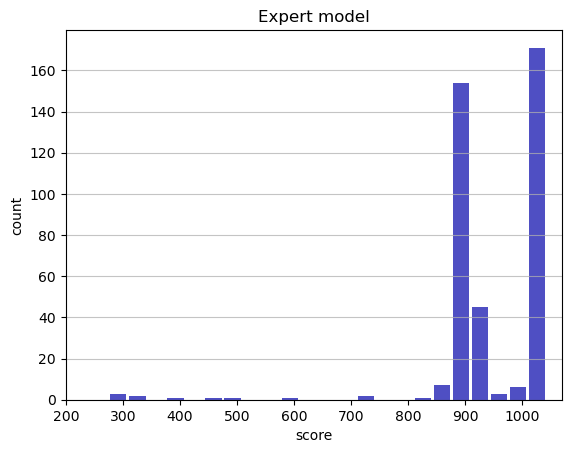

Track generation: 1176..1481 -> 305-tiles track
Epoch: 399
Expert	mean: 944.08	variance: 109.13



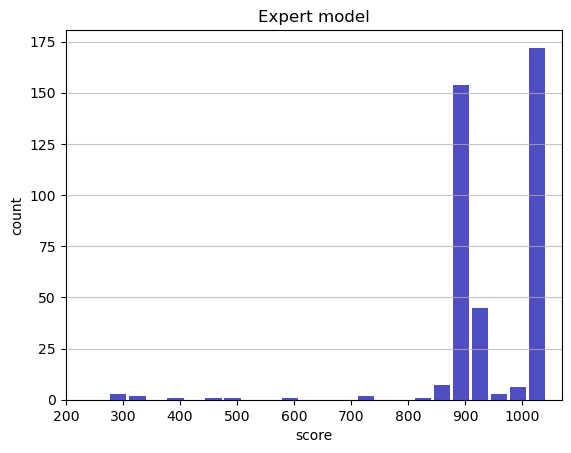

Track generation: 1185..1485 -> 300-tiles track
Epoch: 400
Expert	mean: 944.29	variance: 109.07



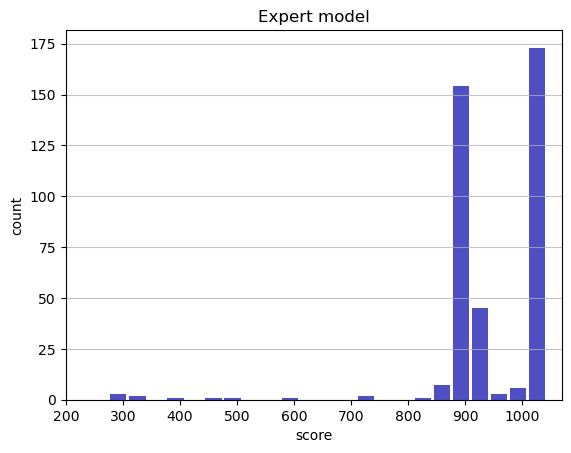

Track generation: 1087..1367 -> 280-tiles track
Epoch: 401
Expert	mean: 944.48	variance: 109.00



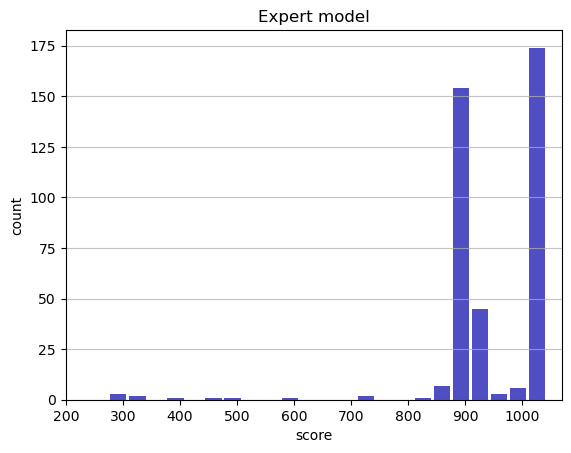

Track generation: 1061..1330 -> 269-tiles track
Epoch: 402
Expert	mean: 944.71	variance: 108.96



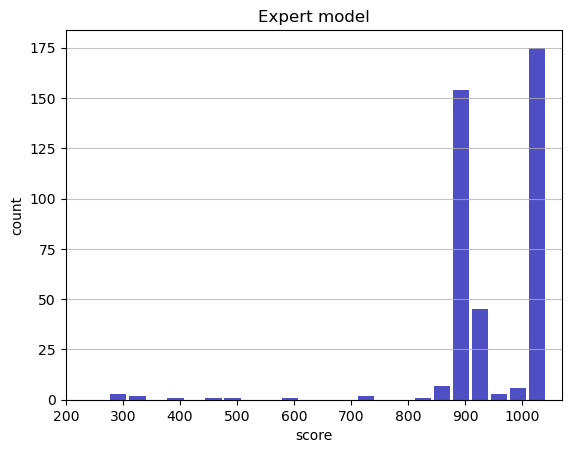

Track generation: 1086..1367 -> 281-tiles track
Epoch: 403
Expert	mean: 944.62	variance: 108.84



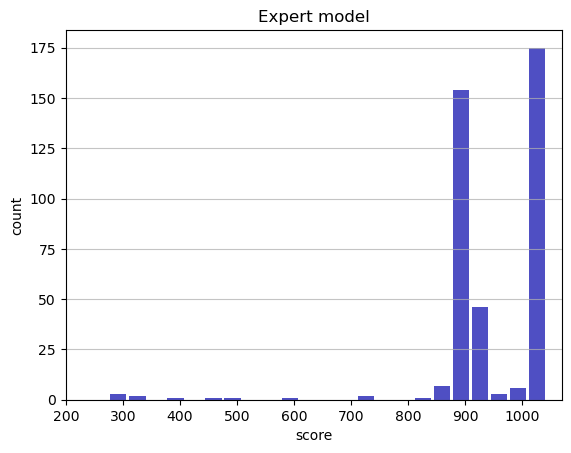

Track generation: 1118..1410 -> 292-tiles track
Epoch: 404
Expert	mean: 944.53	variance: 108.72



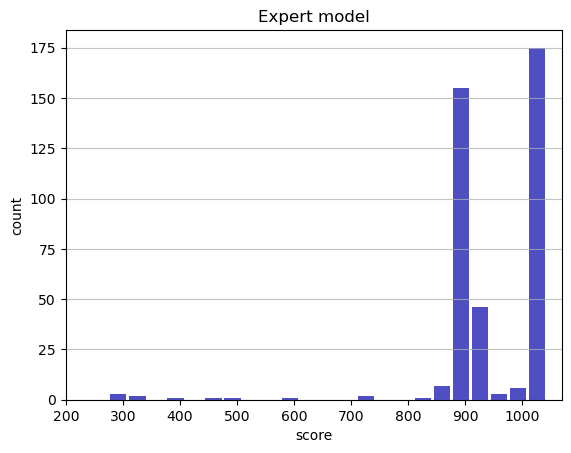

Track generation: 1172..1476 -> 304-tiles track
Epoch: 405
Expert	mean: 944.72	variance: 108.65



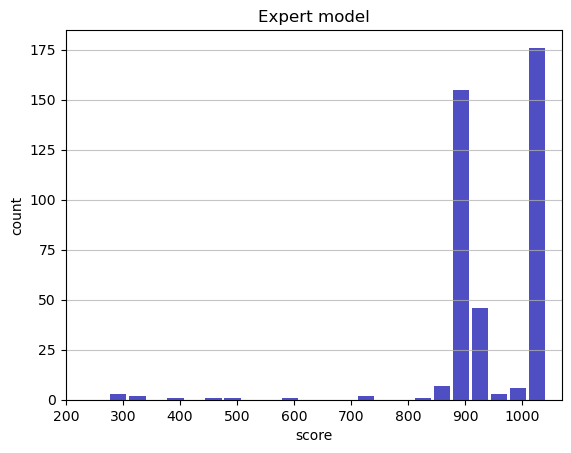

Track generation: 1132..1419 -> 287-tiles track
Epoch: 406
Expert	mean: 944.56	variance: 108.57



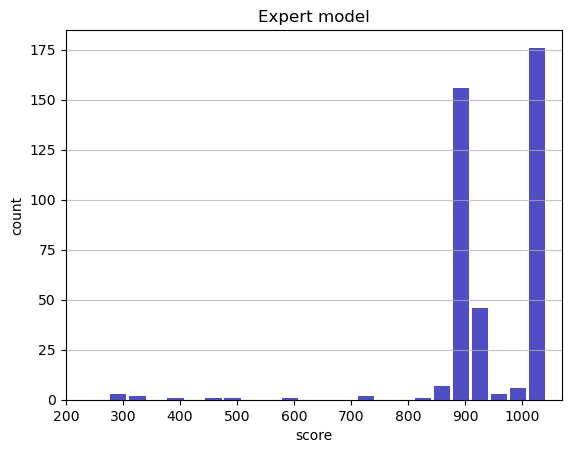

Track generation: 1073..1345 -> 272-tiles track
Epoch: 407
Expert	mean: 944.46	variance: 108.45



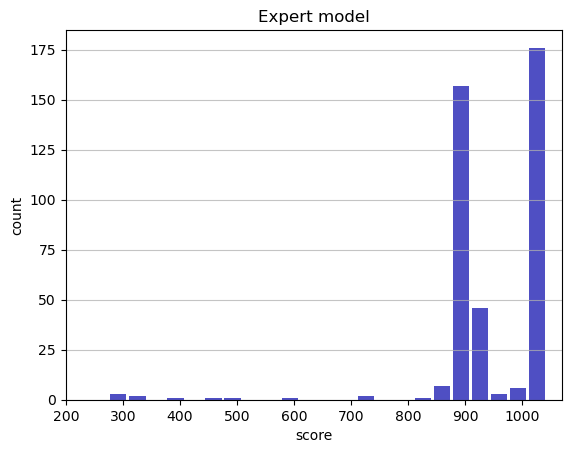

Track generation: 1187..1488 -> 301-tiles track
Epoch: 408
Expert	mean: 944.37	variance: 108.33



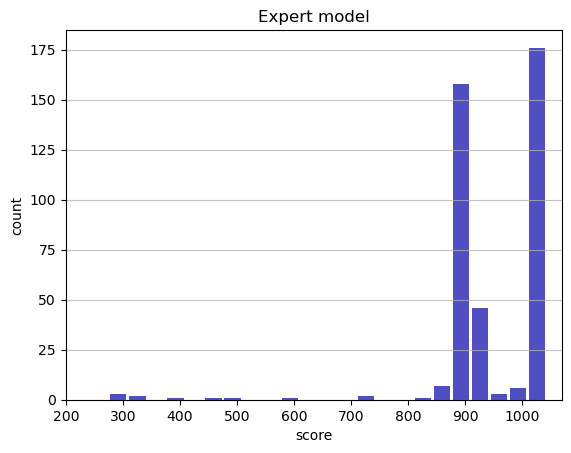

Track generation: 1074..1353 -> 279-tiles track
Epoch: 409
Expert	mean: 944.57	variance: 108.28



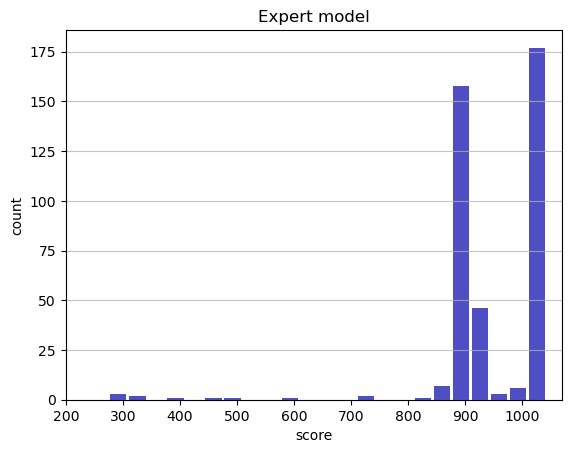

Track generation: 1240..1554 -> 314-tiles track
Epoch: 410
Expert	mean: 944.76	variance: 108.22



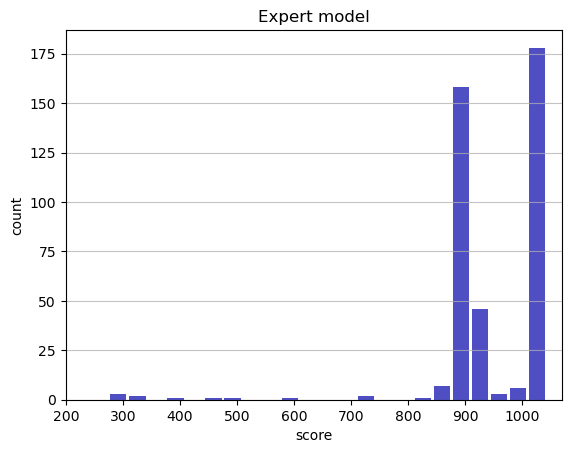

Track generation: 1112..1394 -> 282-tiles track
Epoch: 411
Expert	mean: 944.67	variance: 108.11



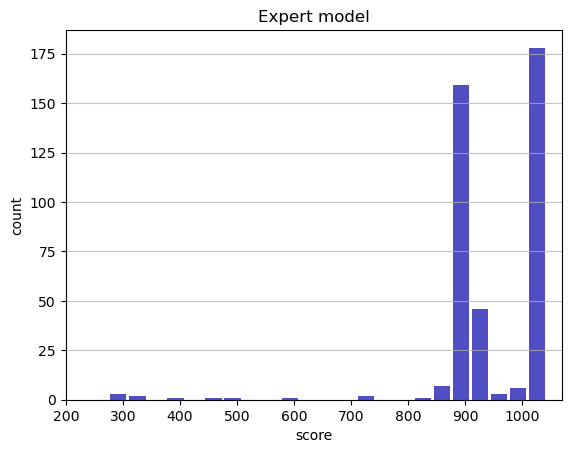

Track generation: 1131..1418 -> 287-tiles track
Epoch: 412
Expert	mean: 944.88	variance: 108.06



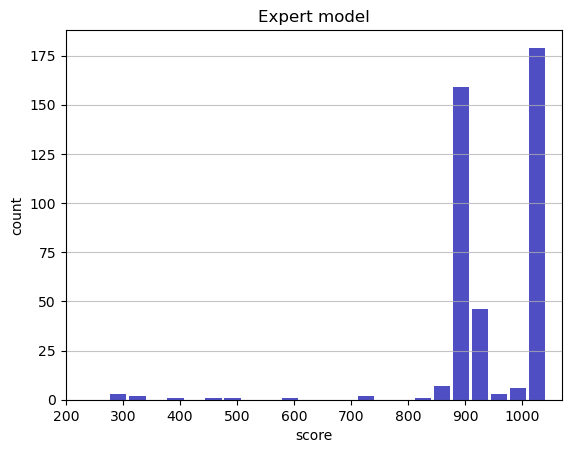

Track generation: 1175..1473 -> 298-tiles track
Epoch: 413
Expert	mean: 944.74	variance: 107.96



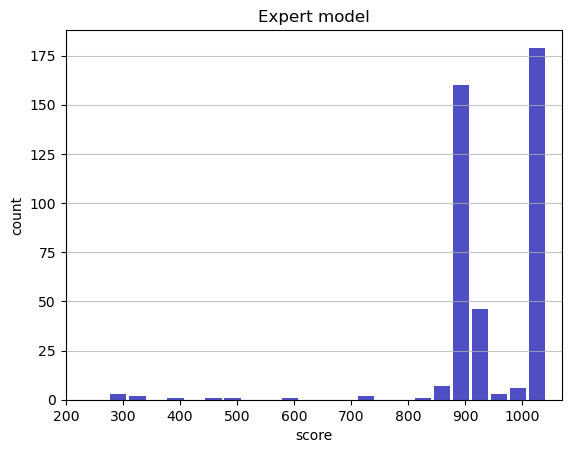

Track generation: 1168..1464 -> 296-tiles track
Epoch: 414
Expert	mean: 944.93	variance: 107.90



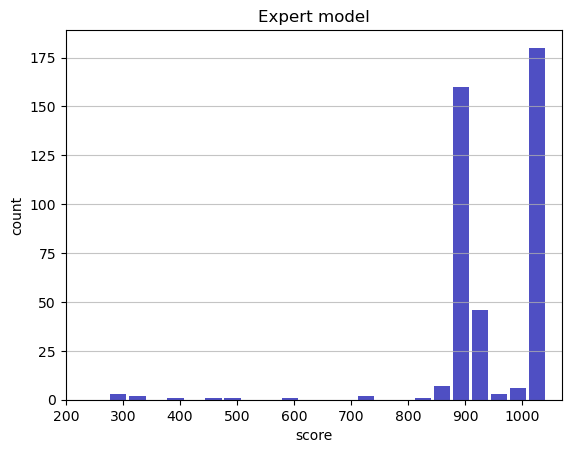

Track generation: 1028..1293 -> 265-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1171..1468 -> 297-tiles track
Epoch: 415
Expert	mean: 945.13	variance: 107.85



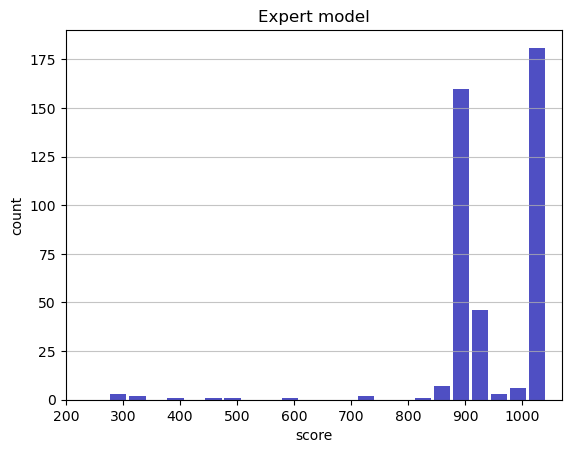

Track generation: 1187..1488 -> 301-tiles track
Epoch: 416
Expert	mean: 945.03	variance: 107.74



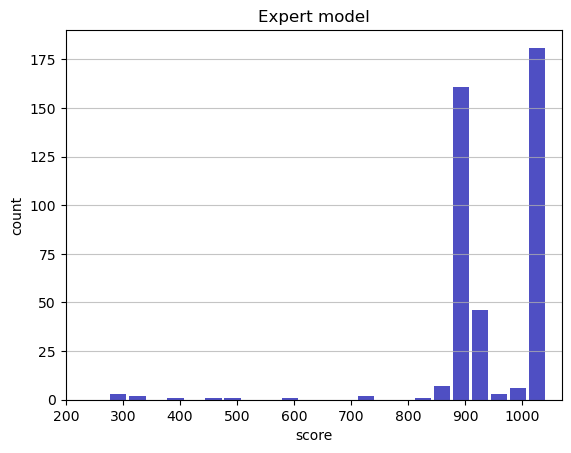

Track generation: 1092..1374 -> 282-tiles track
Epoch: 417
Expert	mean: 945.23	variance: 107.68



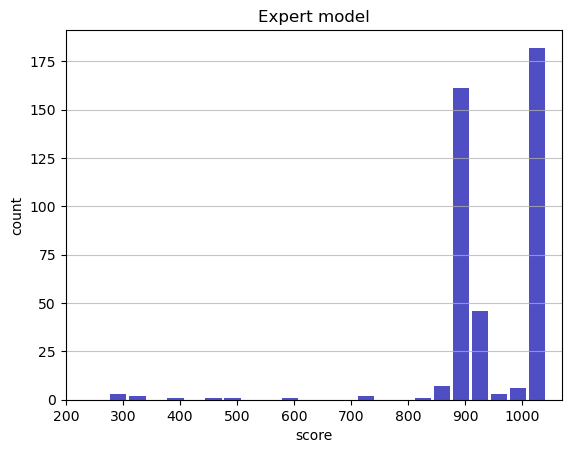

Track generation: 1151..1443 -> 292-tiles track
Epoch: 418
Expert	mean: 945.43	variance: 107.63



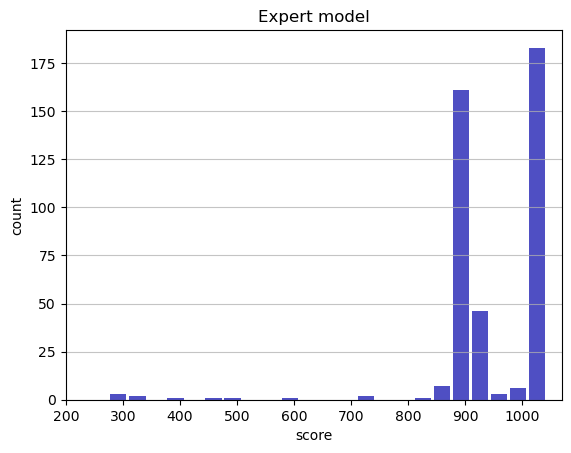

Track generation: 1142..1431 -> 289-tiles track
Epoch: 419
Expert	mean: 945.35	variance: 107.51



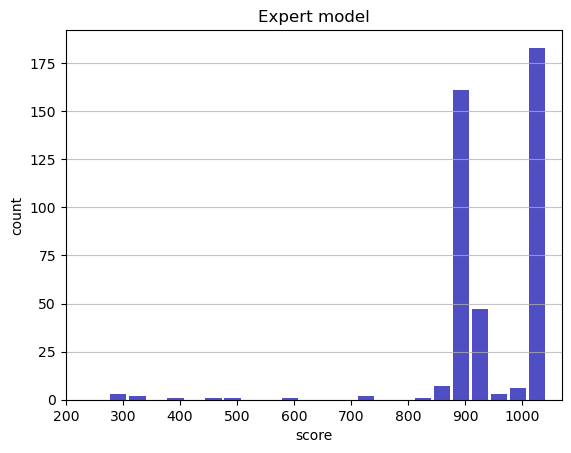

Track generation: 1284..1609 -> 325-tiles track
Epoch: 420
Expert	mean: 945.52	variance: 107.44



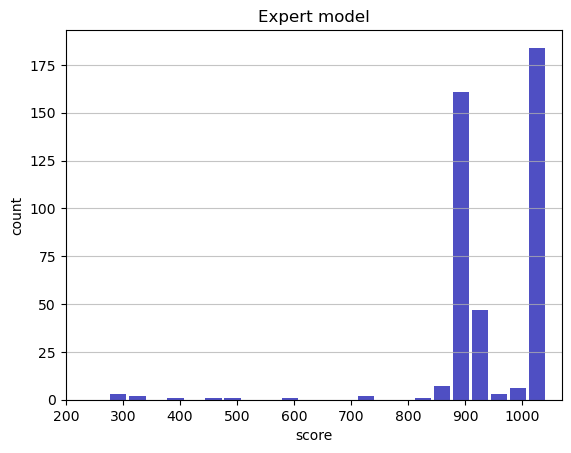

Track generation: 1208..1514 -> 306-tiles track
Epoch: 421
Expert	mean: 945.40	variance: 107.34



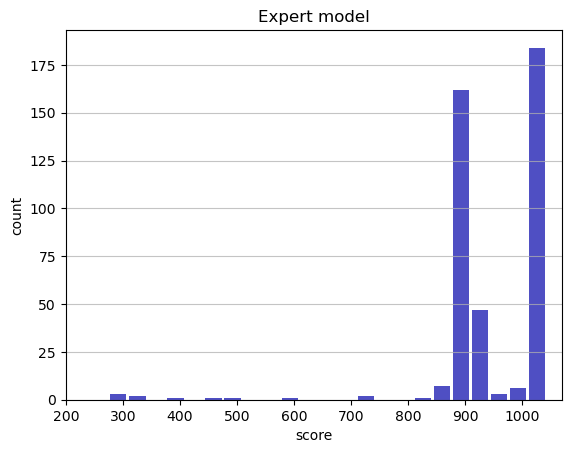

Track generation: 1341..1679 -> 338-tiles track
Epoch: 422
Expert	mean: 945.55	variance: 107.26



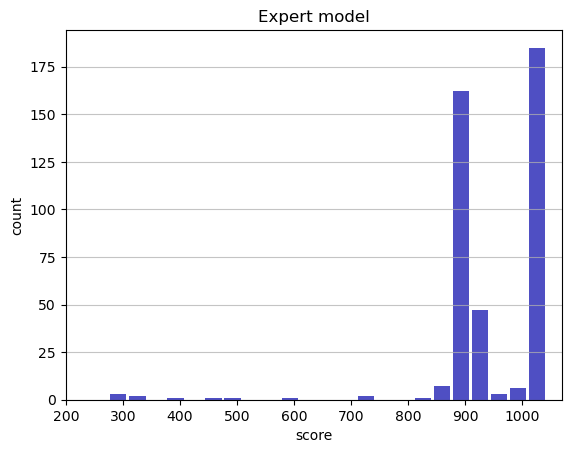

Track generation: 1186..1487 -> 301-tiles track
Epoch: 423
Expert	mean: 945.74	variance: 107.20



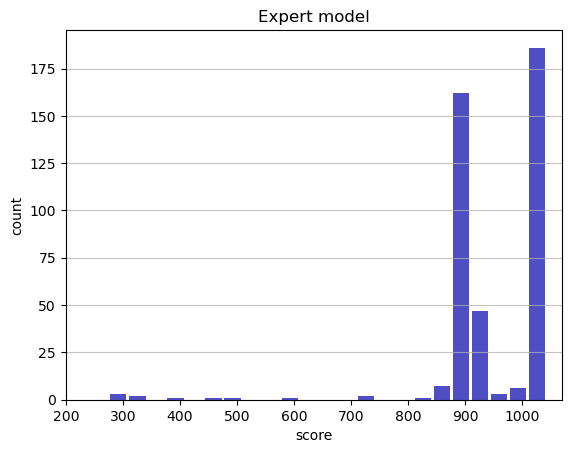

Track generation: 1166..1464 -> 298-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1192..1494 -> 302-tiles track
Epoch: 424
Expert	mean: 945.62	variance: 107.10



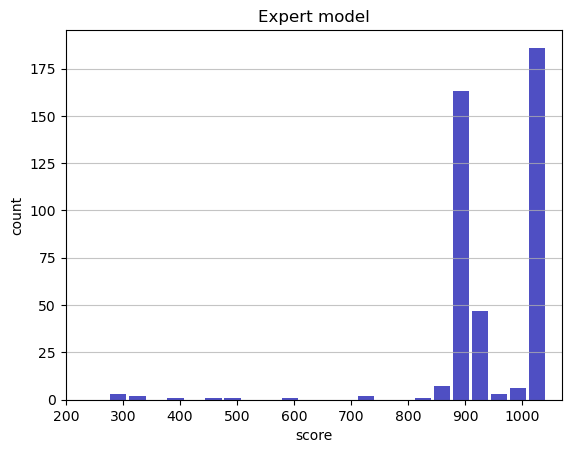

Track generation: 1056..1324 -> 268-tiles track
Epoch: 425
Expert	mean: 945.53	variance: 106.99



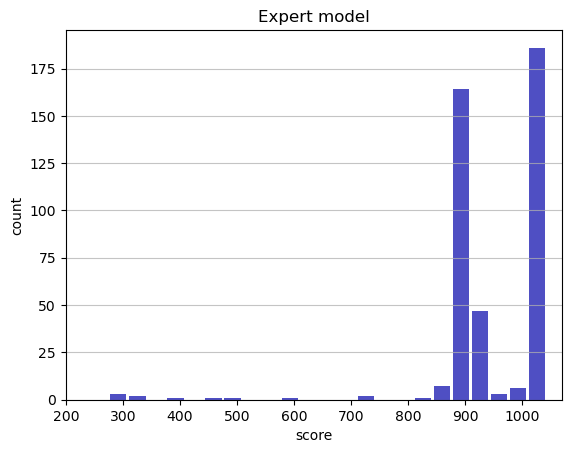

Track generation: 1039..1307 -> 268-tiles track
Epoch: 426
Expert	mean: 945.74	variance: 106.95



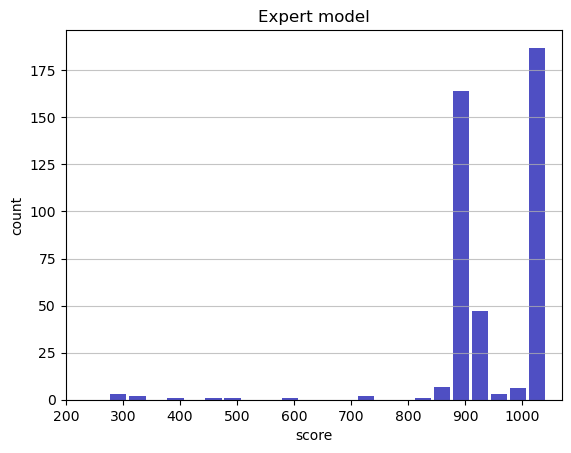

Track generation: 1067..1338 -> 271-tiles track
Epoch: 427
Expert	mean: 945.95	variance: 106.92



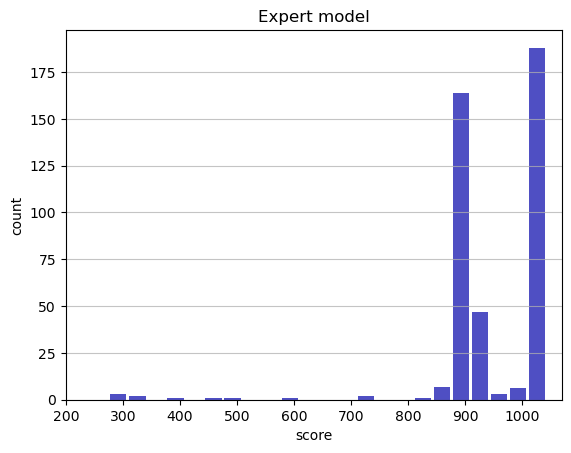

Track generation: 1153..1446 -> 293-tiles track
Epoch: 428
Expert	mean: 945.84	variance: 106.81



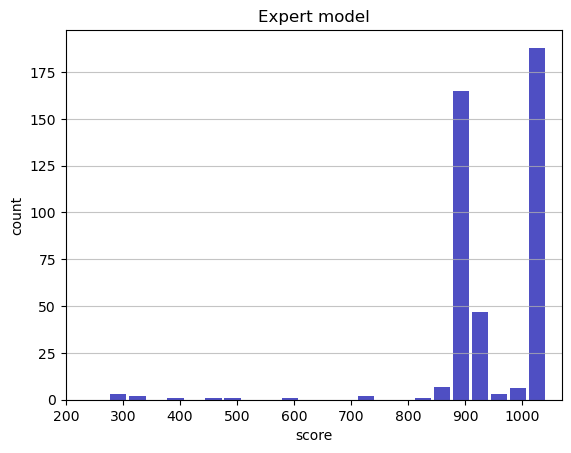

Track generation: 1200..1504 -> 304-tiles track
Epoch: 429
Expert	mean: 945.69	variance: 106.74



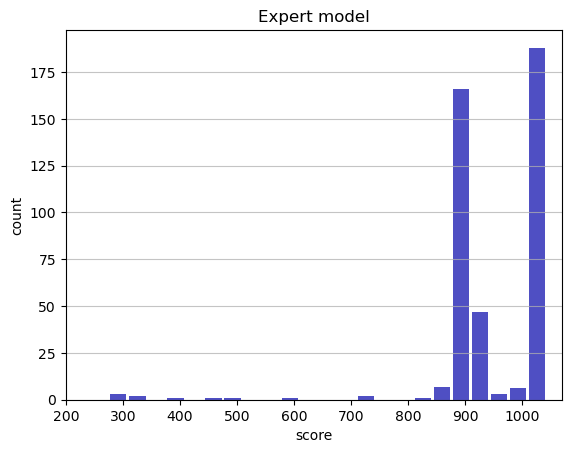

Track generation: 1299..1624 -> 325-tiles track
Epoch: 430
Expert	mean: 945.85	variance: 106.67



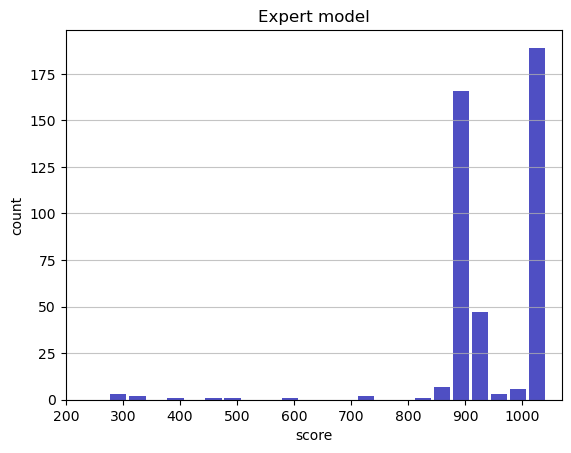

Track generation: 1046..1311 -> 265-tiles track
Epoch: 431
Expert	mean: 945.76	variance: 106.56



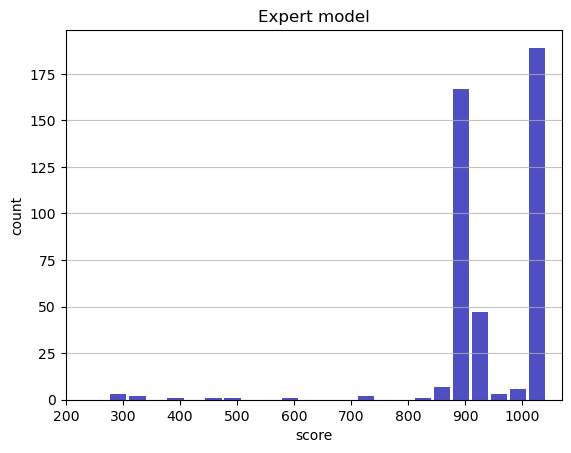

Track generation: 1279..1603 -> 324-tiles track
Epoch: 432
Expert	mean: 945.58	variance: 106.50



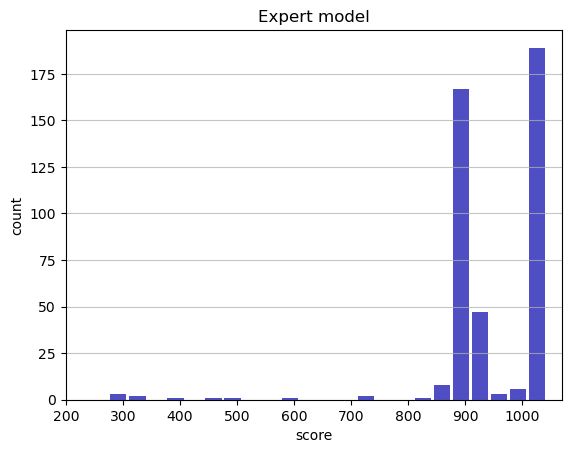

Track generation: 1155..1448 -> 293-tiles track
Epoch: 433
Expert	mean: 945.50	variance: 106.39



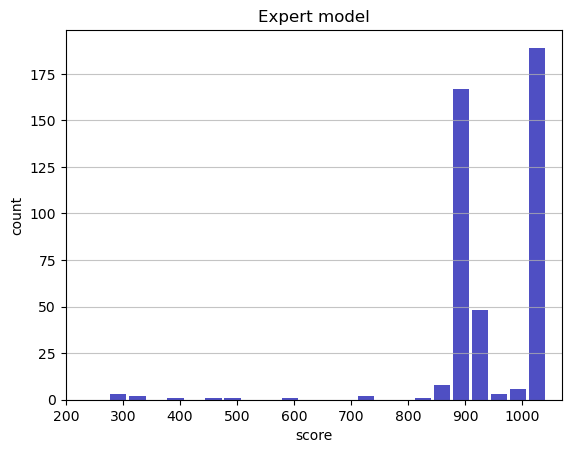

Track generation: 1121..1405 -> 284-tiles track
Epoch: 434
Expert	mean: 945.38	variance: 106.30



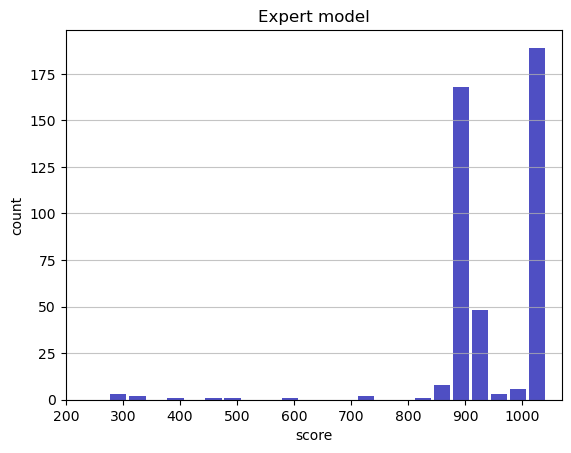

Track generation: 1172..1469 -> 297-tiles track
Epoch: 435
Expert	mean: 945.24	variance: 106.22



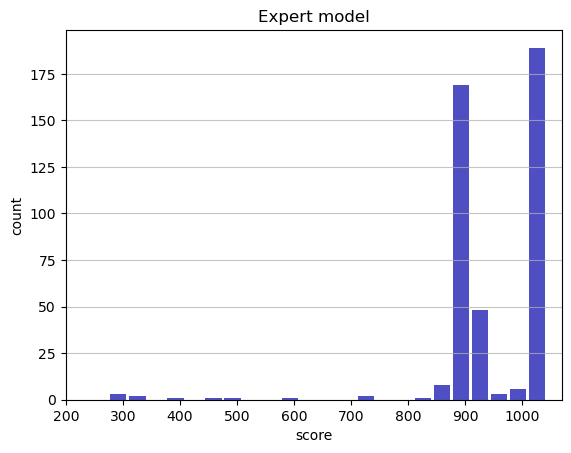

Track generation: 1221..1530 -> 309-tiles track
Epoch: 436
Expert	mean: 945.09	variance: 106.14



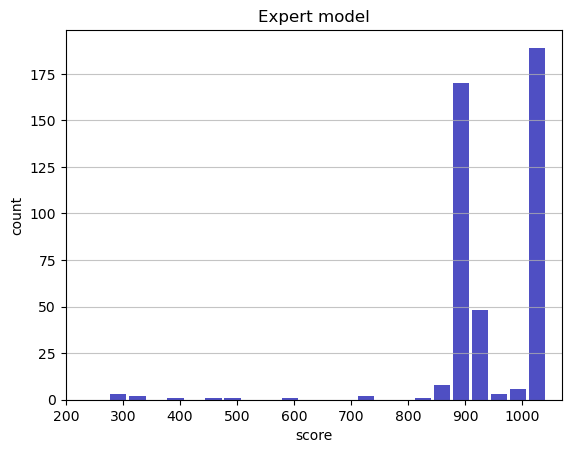

Track generation: 1119..1403 -> 284-tiles track
Epoch: 437
Expert	mean: 944.98	variance: 106.04



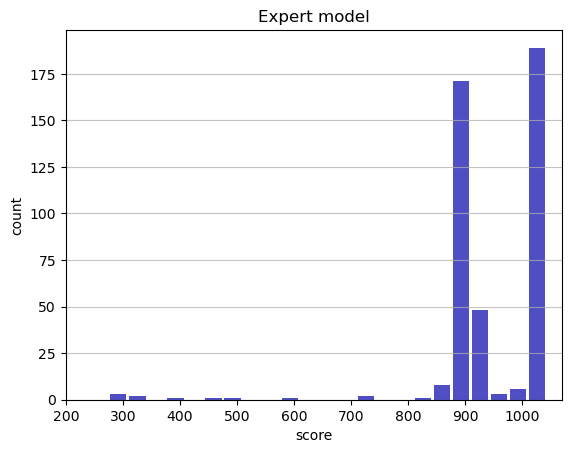

Track generation: 1151..1452 -> 301-tiles track
Epoch: 438
Expert	mean: 944.83	variance: 105.97



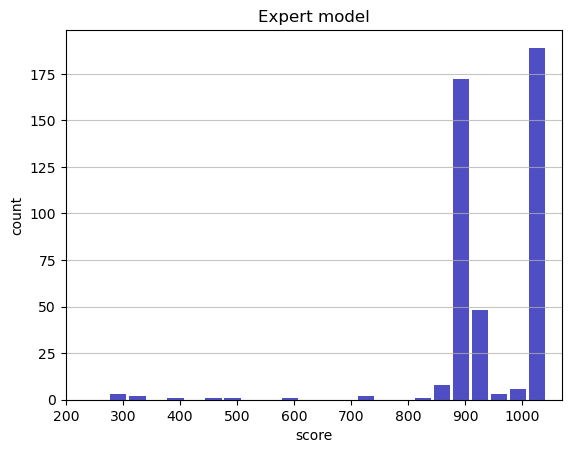

Track generation: 1003..1258 -> 255-tiles track
Epoch: 439
Expert	mean: 945.03	variance: 105.94



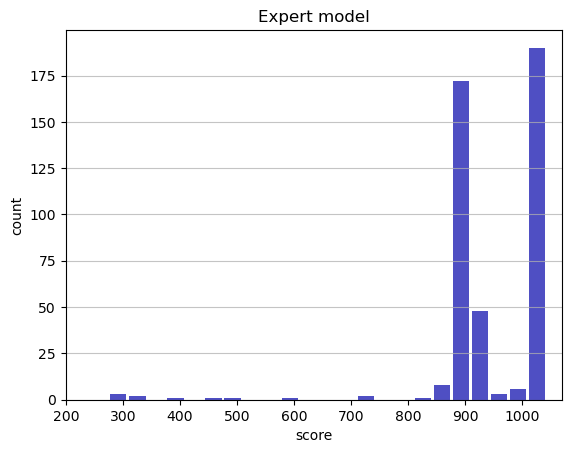

Track generation: 1063..1333 -> 270-tiles track
Epoch: 440
Expert	mean: 945.23	variance: 105.90



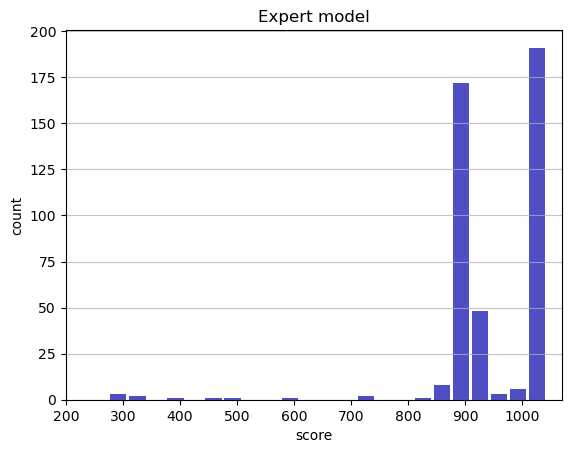

Track generation: 1312..1644 -> 332-tiles track
Epoch: 441
Expert	mean: 945.39	variance: 105.83



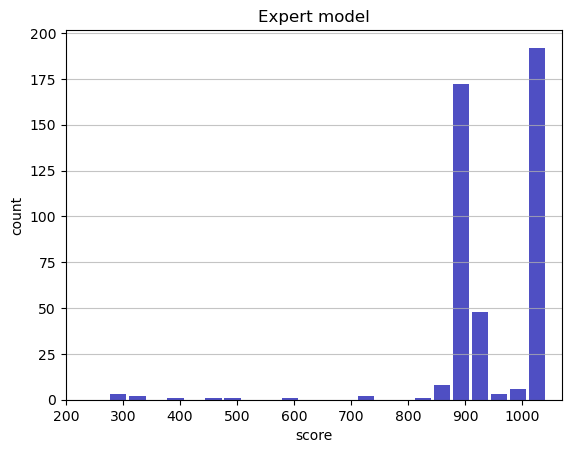

Track generation: 1083..1358 -> 275-tiles track
Epoch: 442
Expert	mean: 945.60	variance: 105.80



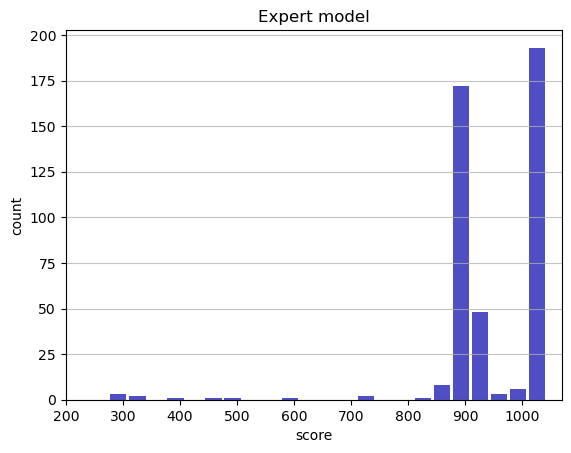

Track generation: 1172..1479 -> 307-tiles track
Epoch: 443
Expert	mean: 945.76	variance: 105.73



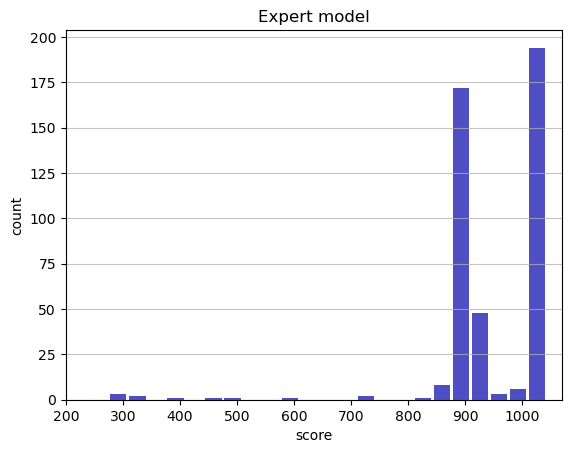

Track generation: 1212..1519 -> 307-tiles track
Epoch: 444
Expert	mean: 945.64	variance: 105.65



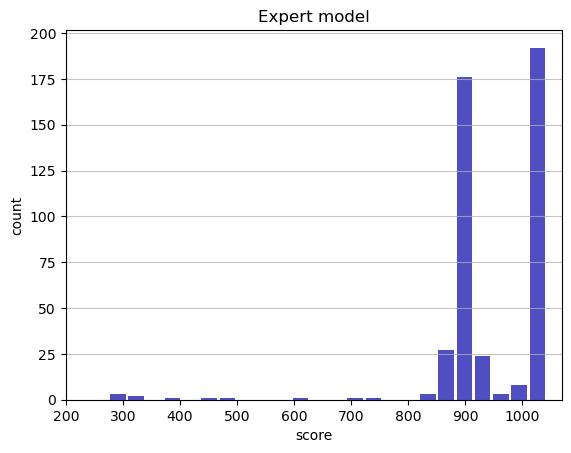

Track generation: 1091..1368 -> 277-tiles track
Epoch: 445
Expert	mean: 945.55	variance: 105.54



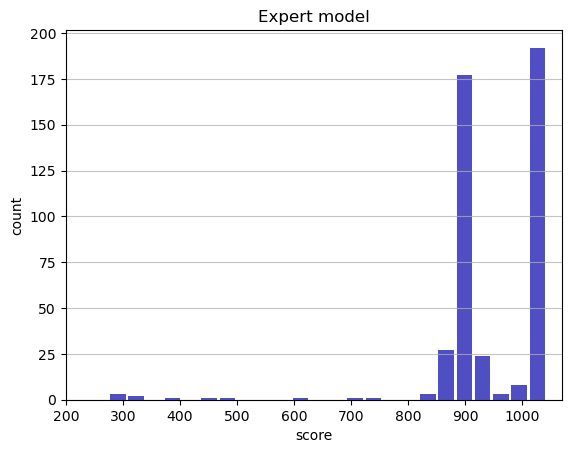

Track generation: 1159..1453 -> 294-tiles track
Epoch: 446
Expert	mean: 945.45	variance: 105.45



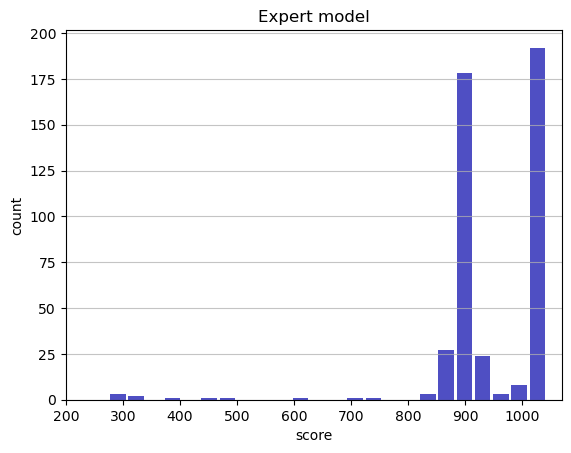

Track generation: 1236..1549 -> 313-tiles track
Epoch: 447
Expert	mean: 945.62	variance: 105.39



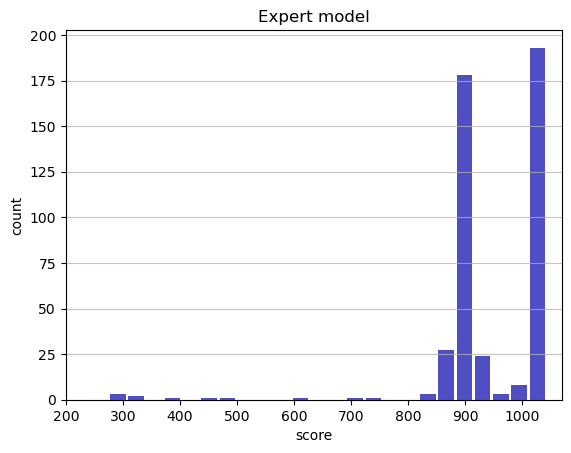

Track generation: 1428..1789 -> 361-tiles track
Epoch: 448
Expert	mean: 945.70	variance: 105.29



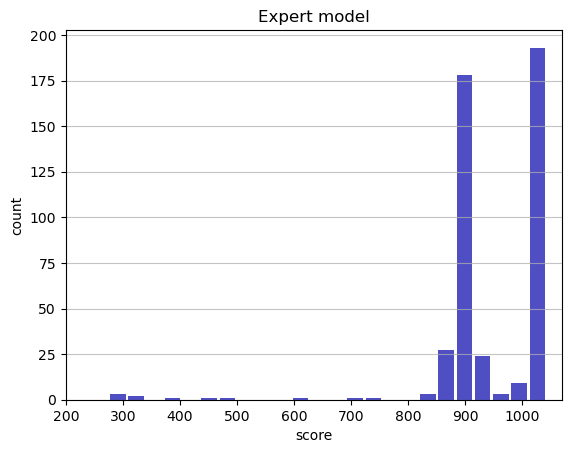

Track generation: 1179..1478 -> 299-tiles track
Epoch: 449
Expert	mean: 945.58	variance: 105.20



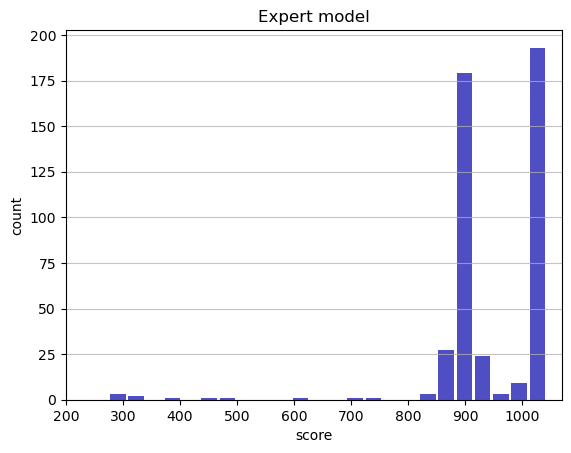

Track generation: 1144..1434 -> 290-tiles track
Epoch: 450
Expert	mean: 945.46	variance: 105.11



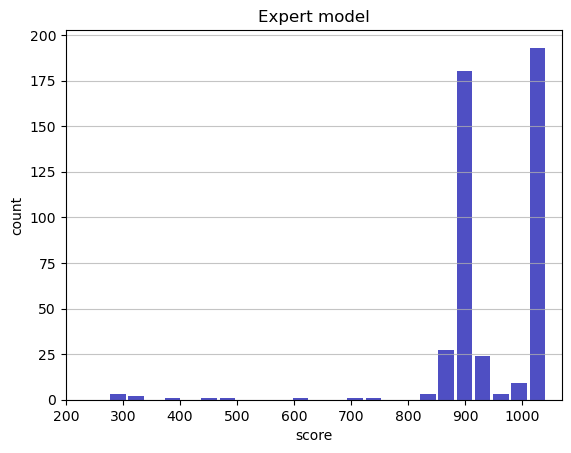

Track generation: 1135..1423 -> 288-tiles track
Epoch: 451
Expert	mean: 945.36	variance: 105.02



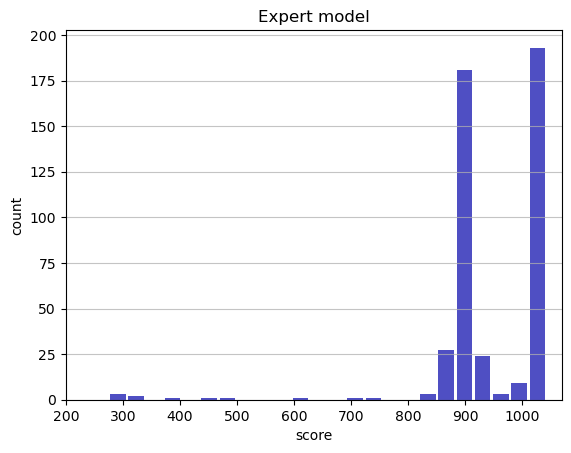

Track generation: 1105..1394 -> 289-tiles track
Epoch: 452
Expert	mean: 945.54	variance: 104.97



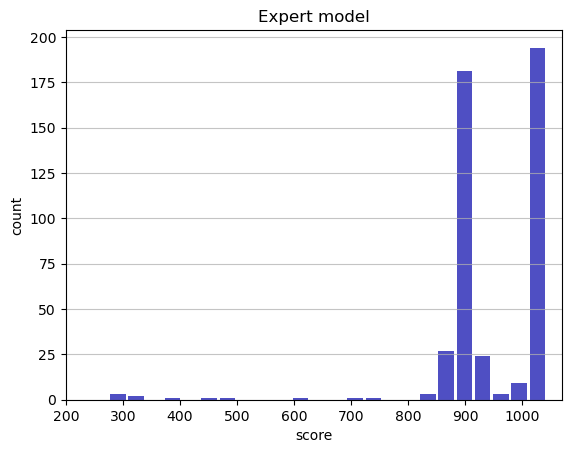

Track generation: 1118..1402 -> 284-tiles track
Epoch: 453
Expert	mean: 945.46	variance: 104.87



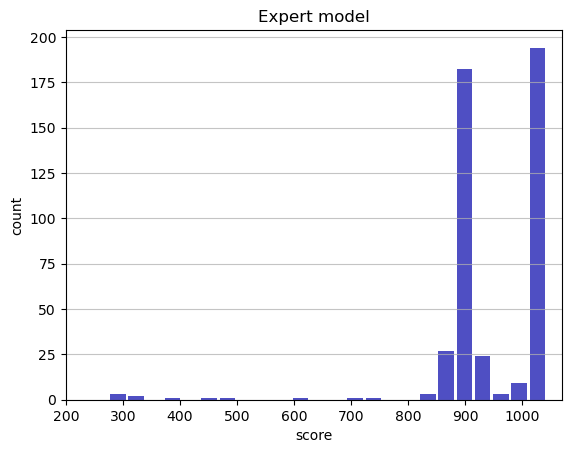

Track generation: 1095..1379 -> 284-tiles track
Epoch: 454
Expert	mean: 945.64	variance: 104.83



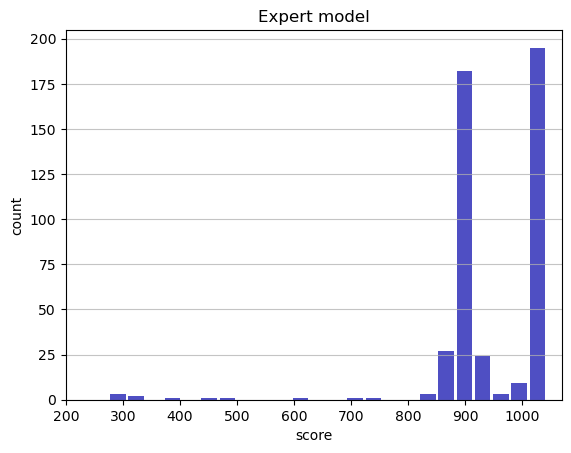

Track generation: 1057..1330 -> 273-tiles track
Epoch: 455
Expert	mean: 945.51	variance: 104.75



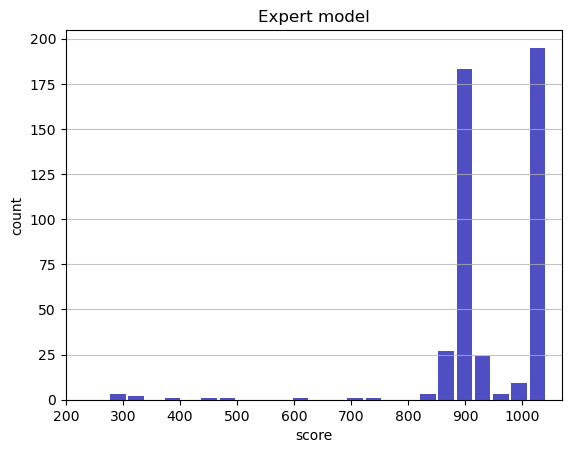

Track generation: 1277..1600 -> 323-tiles track
Epoch: 456
Expert	mean: 945.38	variance: 104.67



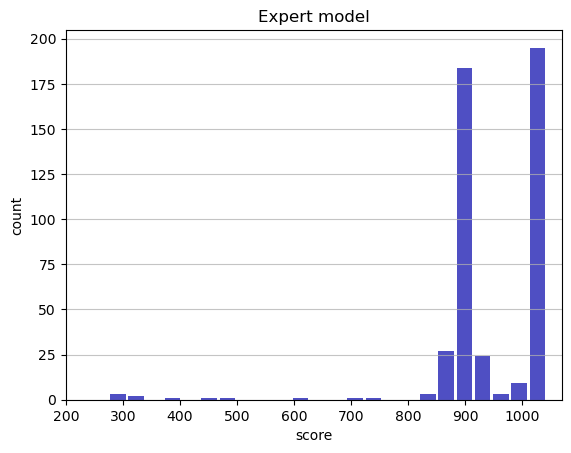

Track generation: 1084..1359 -> 275-tiles track
Epoch: 457
Expert	mean: 945.58	variance: 104.63



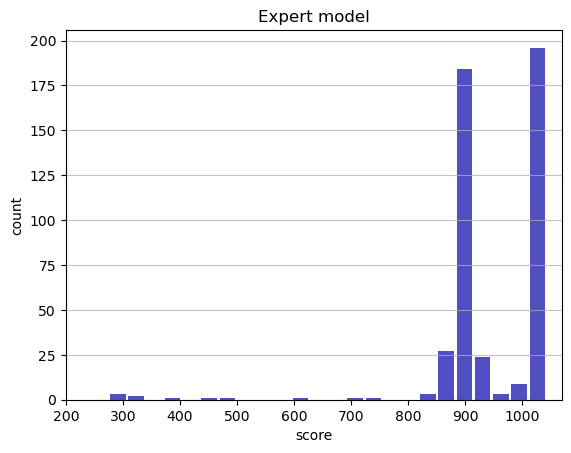

Track generation: 1219..1528 -> 309-tiles track
Epoch: 458
Expert	mean: 945.75	variance: 104.58



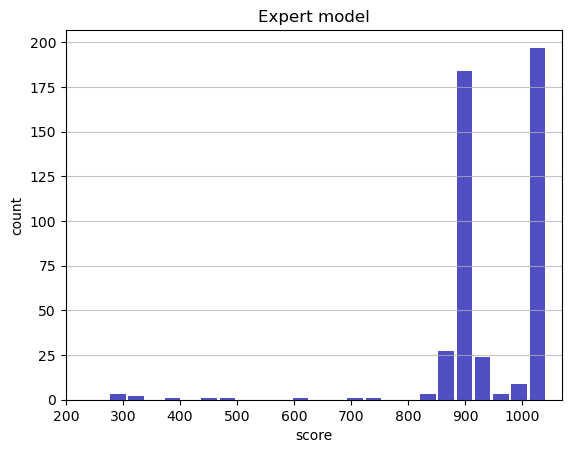

Track generation: 1109..1390 -> 281-tiles track
Epoch: 459
Expert	mean: 945.93	variance: 104.54



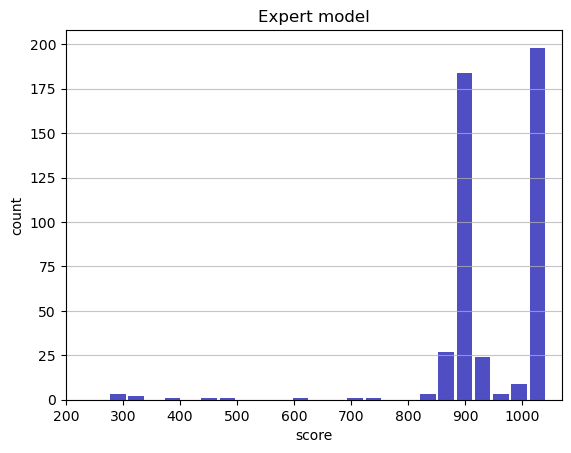

Track generation: 1154..1447 -> 293-tiles track
Epoch: 460
Expert	mean: 946.11	variance: 104.50



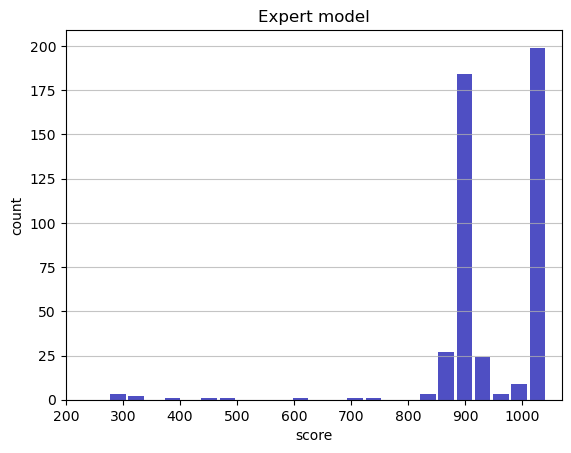

Track generation: 1098..1383 -> 285-tiles track
Epoch: 461
Expert	mean: 946.29	variance: 104.46



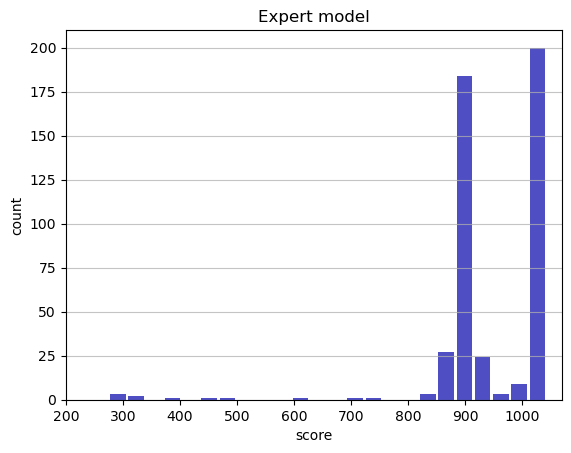

Track generation: 1081..1355 -> 274-tiles track
Epoch: 462
Expert	mean: 946.21	variance: 104.36



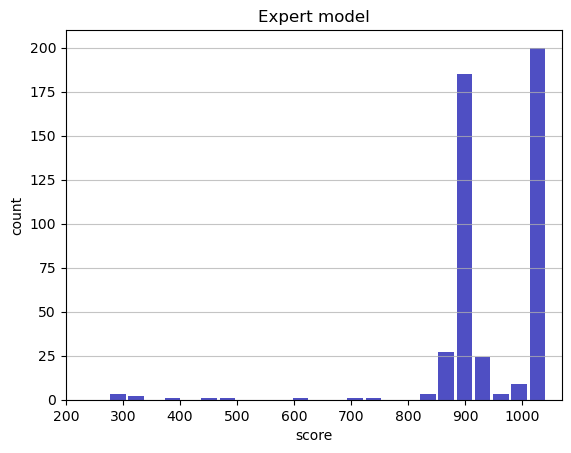

Track generation: 1109..1390 -> 281-tiles track
Epoch: 463
Expert	mean: 946.39	variance: 104.32



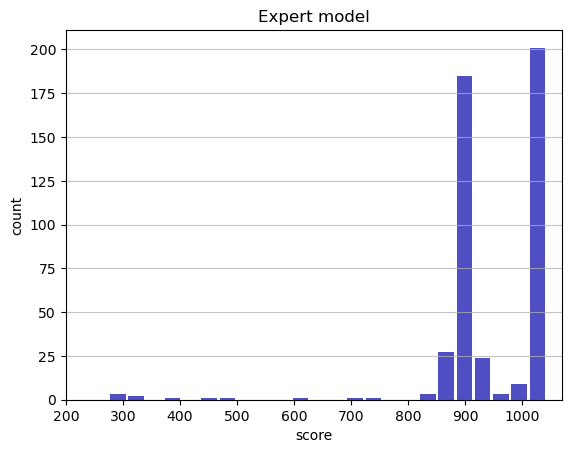

Track generation: 1075..1348 -> 273-tiles track
Epoch: 464
Expert	mean: 946.30	variance: 104.23



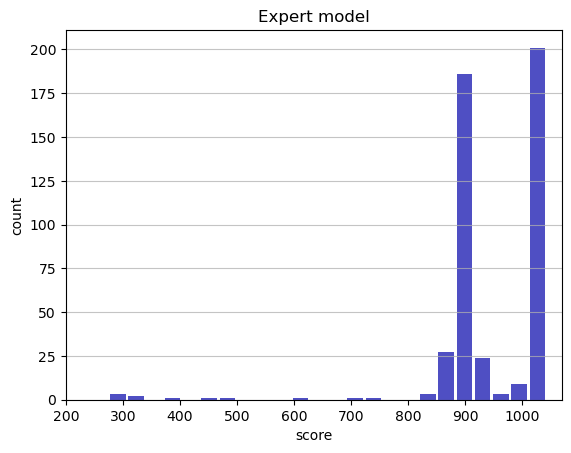

Track generation: 1156..1449 -> 293-tiles track
Epoch: 465
Expert	mean: 946.13	variance: 104.19



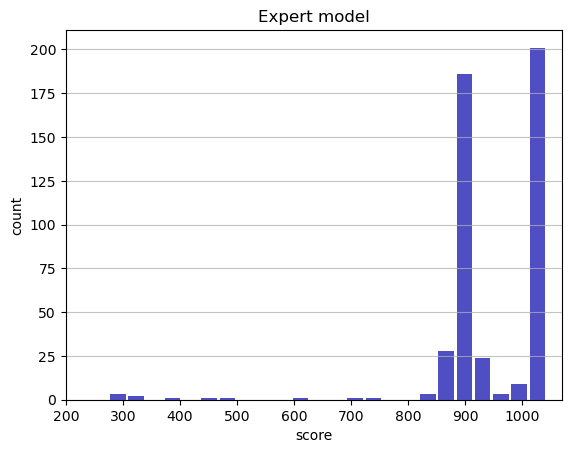

Track generation: 1028..1293 -> 265-tiles track
Epoch: 466
Expert	mean: 946.07	variance: 104.08



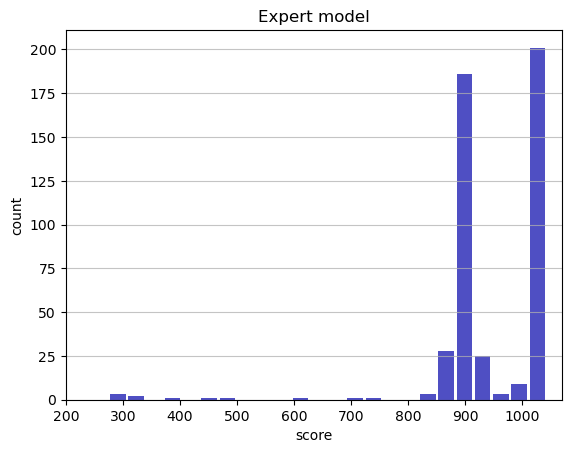

Track generation: 1107..1388 -> 281-tiles track
Epoch: 467
Expert	mean: 945.96	variance: 104.00



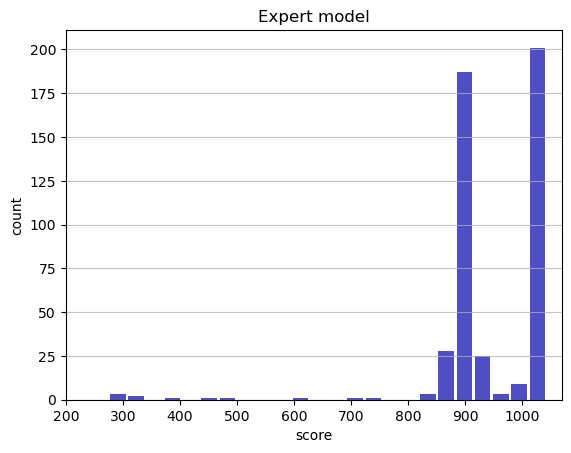

Track generation: 1223..1537 -> 314-tiles track
Epoch: 468
Expert	mean: 946.11	variance: 103.94



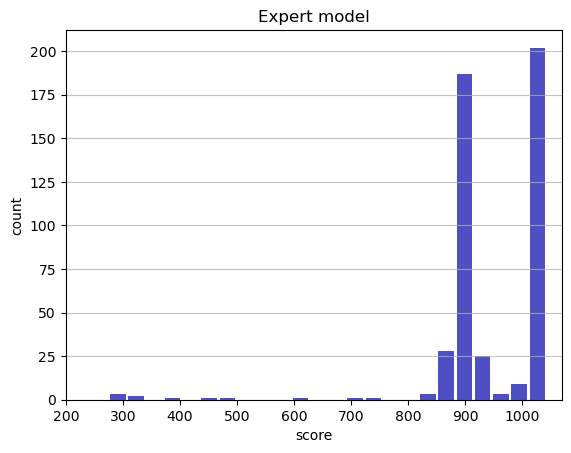

Track generation: 1171..1468 -> 297-tiles track
Epoch: 469
Expert	mean: 946.00	variance: 103.85



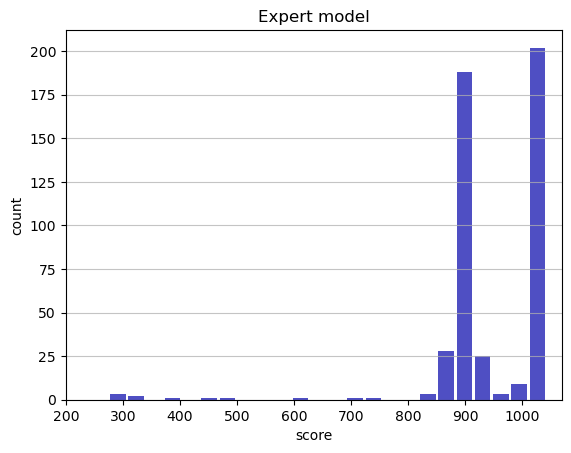

Track generation: 1327..1663 -> 336-tiles track
Epoch: 470
Expert	mean: 946.15	variance: 103.79



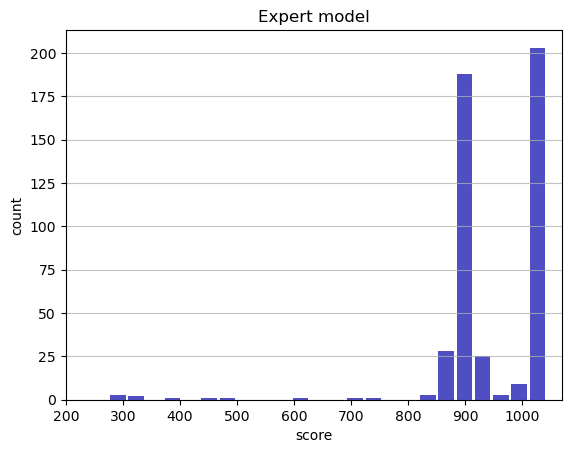

Track generation: 1051..1325 -> 274-tiles track
Epoch: 471
Expert	mean: 946.35	variance: 103.76



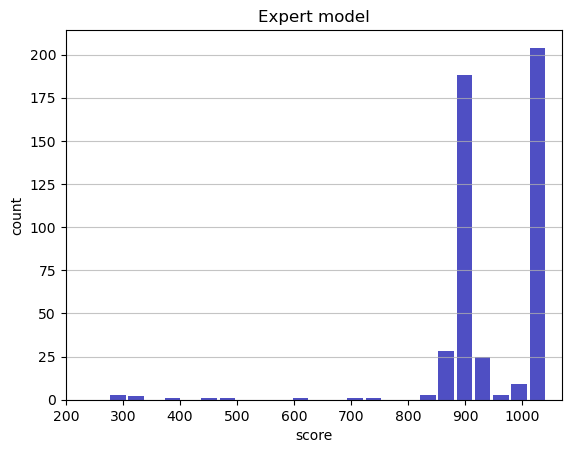

Track generation: 1201..1512 -> 311-tiles track
Epoch: 472
Expert	mean: 946.50	variance: 103.71



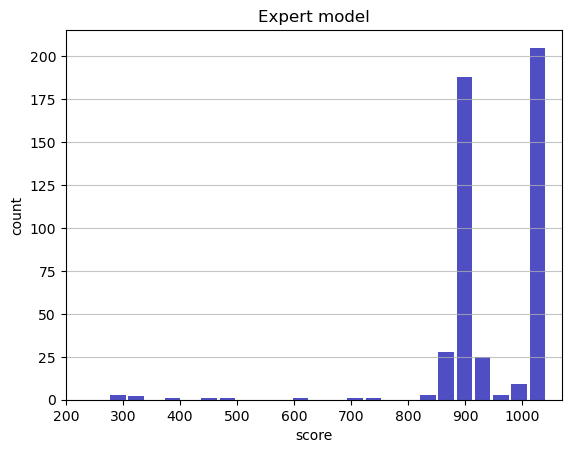

Track generation: 1244..1559 -> 315-tiles track
Epoch: 473
Expert	mean: 946.42	variance: 103.61



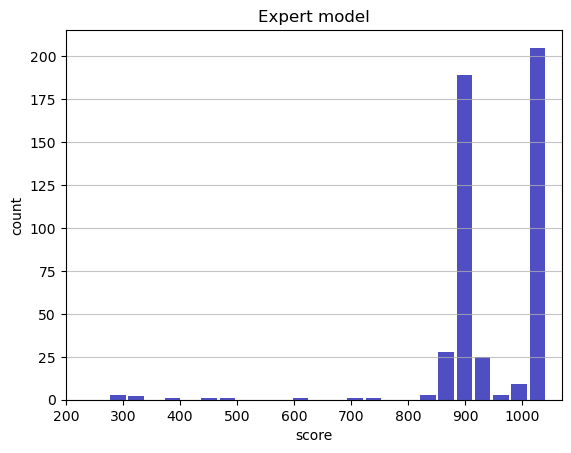

Track generation: 1132..1419 -> 287-tiles track
Epoch: 474
Expert	mean: 946.34	variance: 103.52



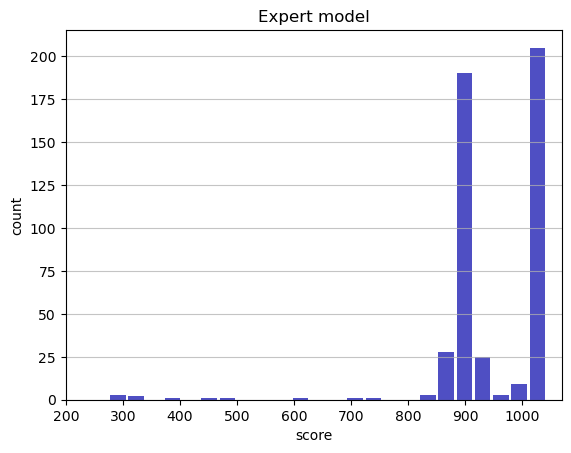

Track generation: 1358..1702 -> 344-tiles track
Epoch: 475
Expert	mean: 946.47	variance: 103.45



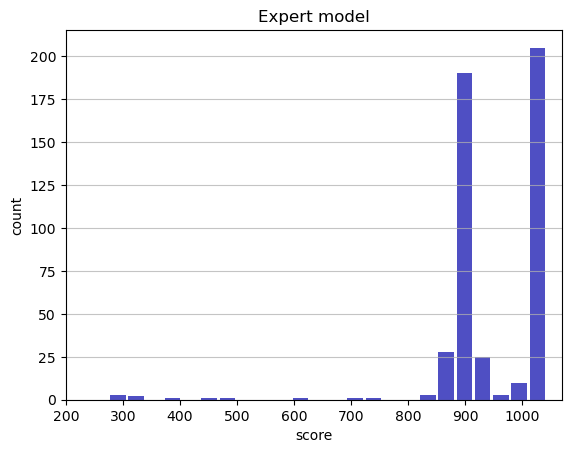

Track generation: 1060..1336 -> 276-tiles track
Epoch: 476
Expert	mean: 946.67	variance: 103.43



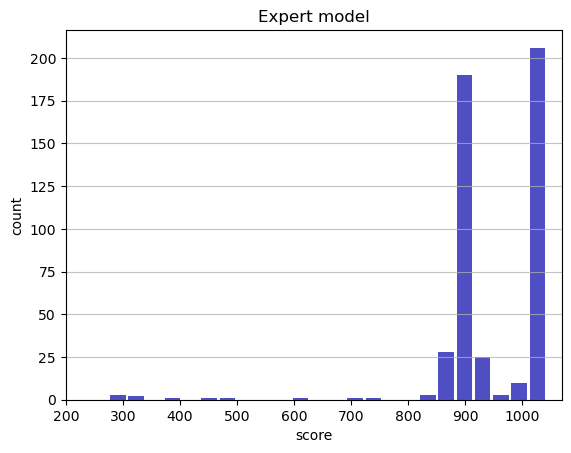

Track generation: 1200..1504 -> 304-tiles track
Epoch: 477
Expert	mean: 946.58	variance: 103.34



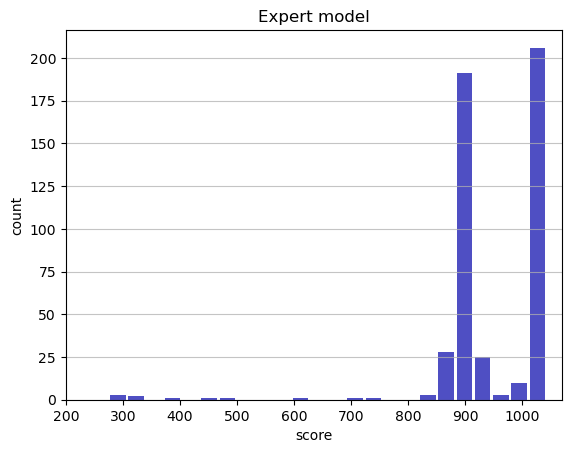

Track generation: 1116..1408 -> 292-tiles track
Epoch: 478
Expert	mean: 946.74	variance: 103.29



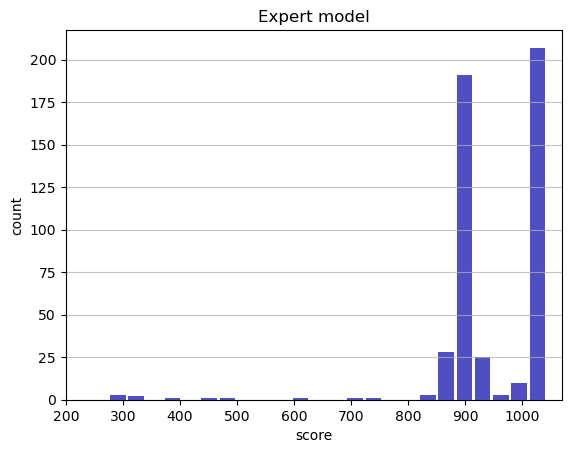

Track generation: 1107..1388 -> 281-tiles track
Epoch: 479
Expert	mean: 946.91	variance: 103.25



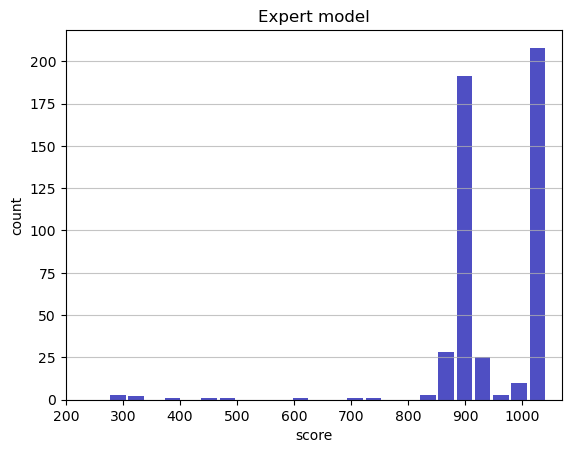

Track generation: 1099..1378 -> 279-tiles track
Epoch: 480
Expert	mean: 946.81	variance: 103.17



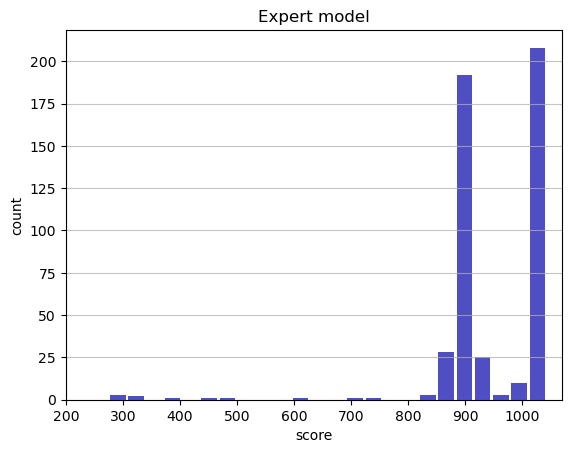

Track generation: 1243..1567 -> 324-tiles track
Epoch: 481
Expert	mean: 946.67	variance: 103.10



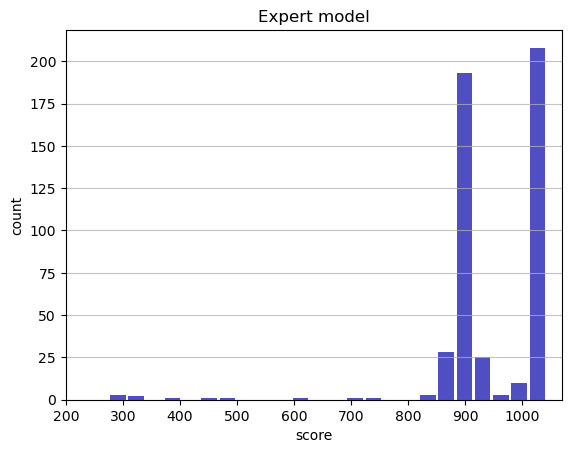

Track generation: 1040..1304 -> 264-tiles track
Epoch: 482
Expert	mean: 946.86	variance: 103.08



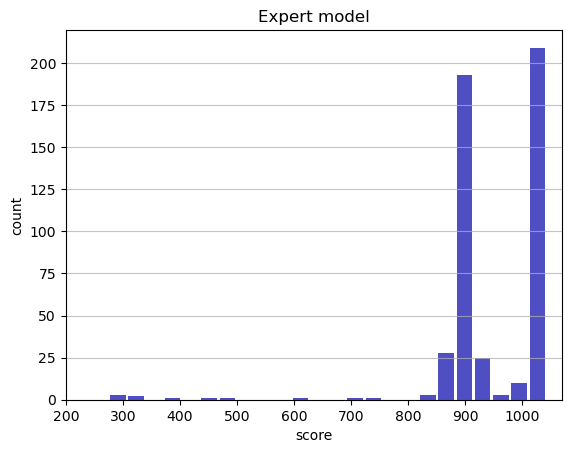

Track generation: 983..1236 -> 253-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1082..1364 -> 282-tiles track
Epoch: 483
Expert	mean: 947.04	variance: 103.04



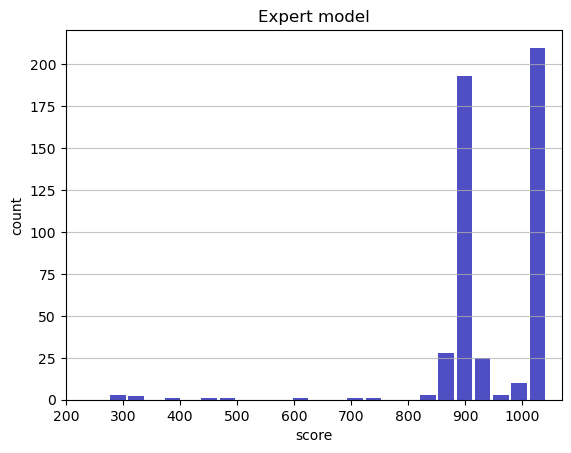

Track generation: 1152..1453 -> 301-tiles track
Epoch: 484
Expert	mean: 946.96	variance: 102.95



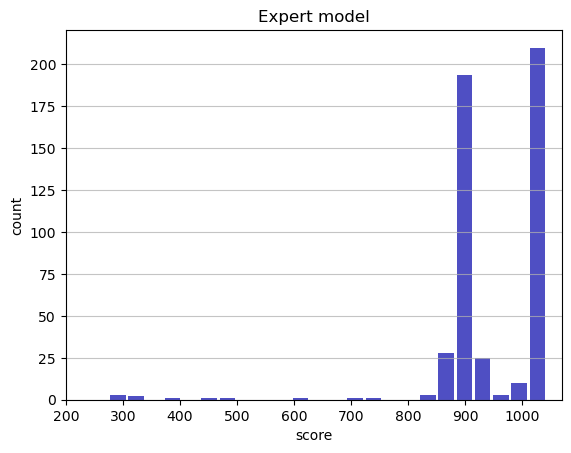

Track generation: 1151..1443 -> 292-tiles track
Epoch: 485
Expert	mean: 946.85	variance: 102.87



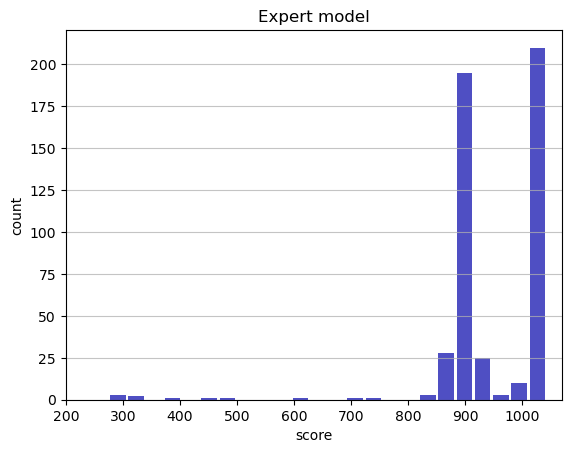

Track generation: 1223..1533 -> 310-tiles track
Epoch: 486
Expert	mean: 946.77	variance: 102.78



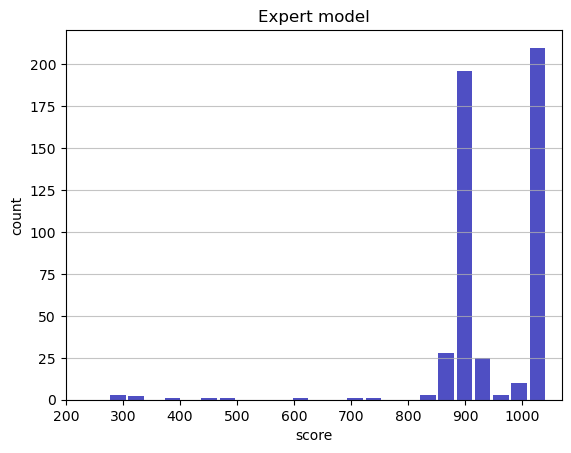

Track generation: 1068..1339 -> 271-tiles track
Epoch: 487
Expert	mean: 946.69	variance: 102.69



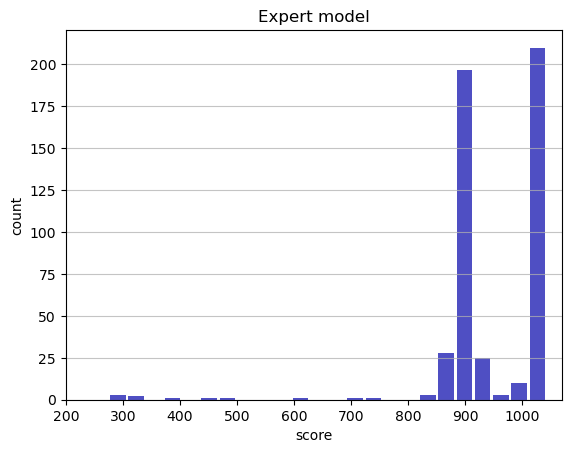

Track generation: 1247..1563 -> 316-tiles track
Epoch: 488
Expert	mean: 946.83	variance: 102.64



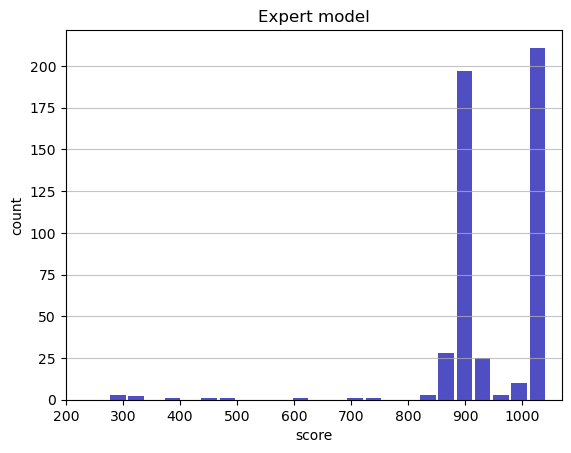

Track generation: 1099..1378 -> 279-tiles track
Epoch: 489
Expert	mean: 946.74	variance: 102.55



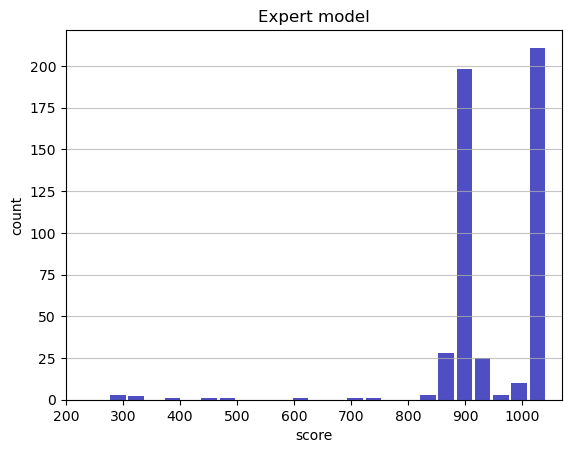

Track generation: 965..1214 -> 249-tiles track
Epoch: 490
Expert	mean: 946.93	variance: 102.53



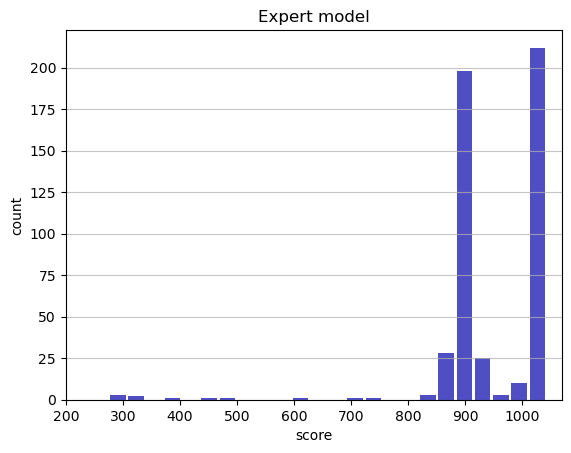

Track generation: 1291..1618 -> 327-tiles track
Epoch: 491
Expert	mean: 947.08	variance: 102.48



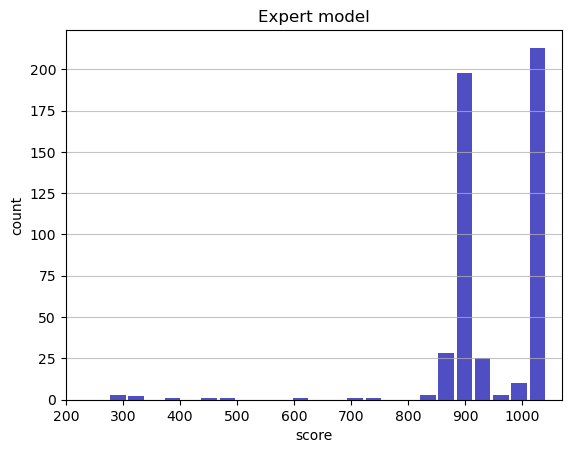

Track generation: 1197..1508 -> 311-tiles track
Epoch: 492
Expert	mean: 946.98	variance: 102.40



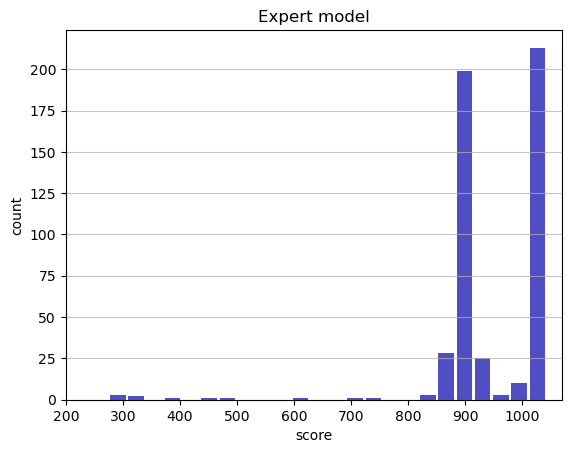

Track generation: 1323..1658 -> 335-tiles track
Epoch: 493
Expert	mean: 947.06	variance: 102.31



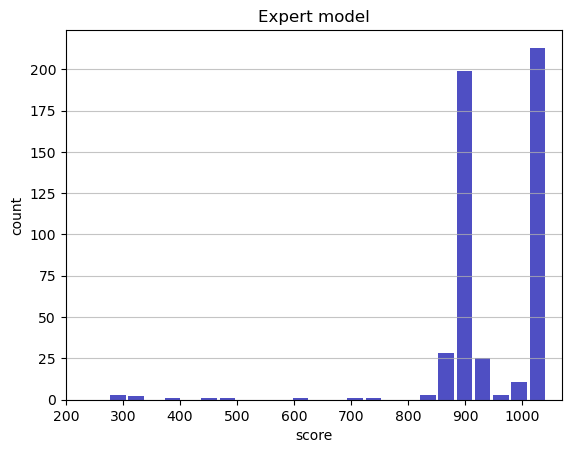

Track generation: 1119..1403 -> 284-tiles track
Epoch: 494
Expert	mean: 946.97	variance: 102.23



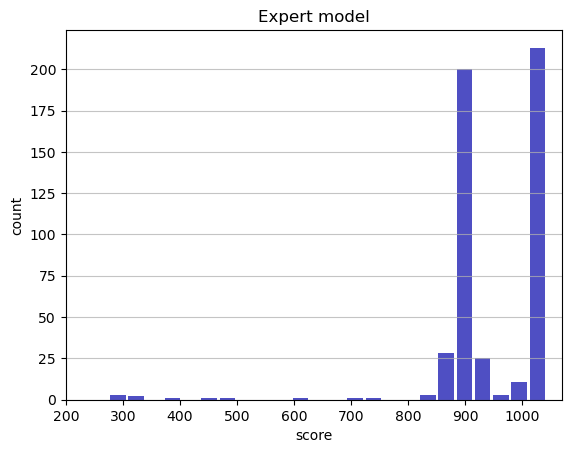

Track generation: 1165..1464 -> 299-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1207..1512 -> 305-tiles track
Epoch: 495
Expert	mean: 946.85	variance: 102.16



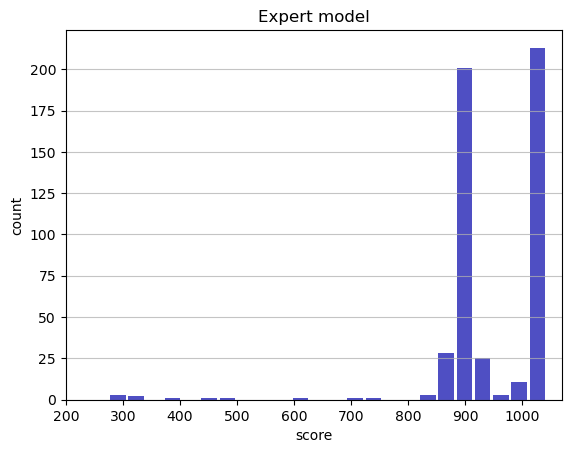

Track generation: 1159..1452 -> 293-tiles track
Epoch: 496
Expert	mean: 946.78	variance: 102.07



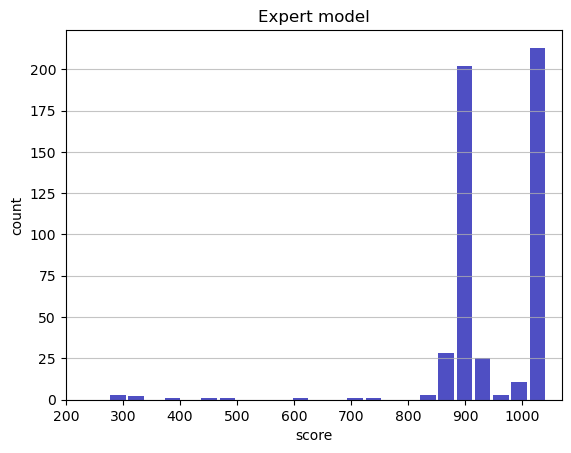

Track generation: 1235..1548 -> 313-tiles track
Epoch: 497
Expert	mean: 946.68	variance: 101.99



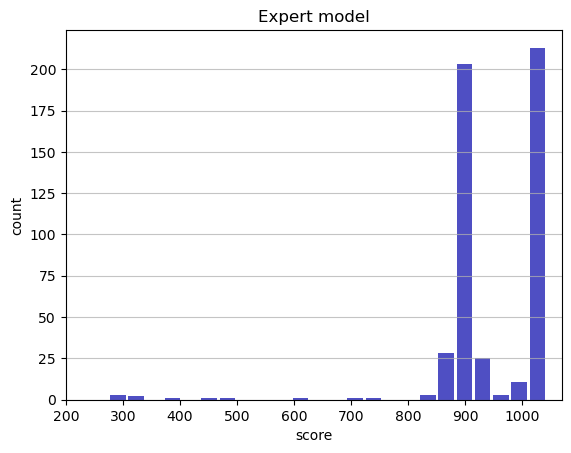

Track generation: 1024..1291 -> 267-tiles track
Epoch: 498
Expert	mean: 946.60	variance: 101.90



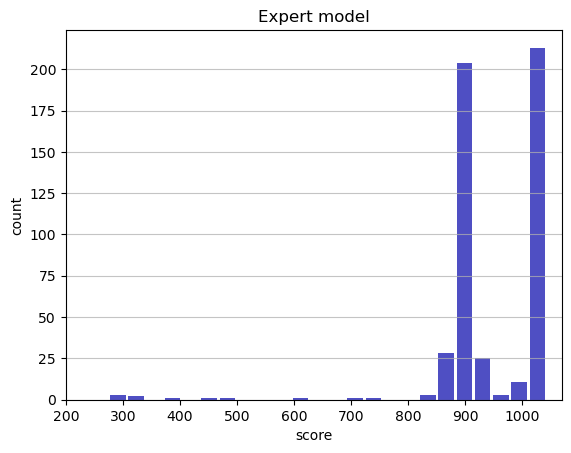

Track generation: 982..1232 -> 250-tiles track
Epoch: 499
Expert	mean: 946.53	variance: 101.81



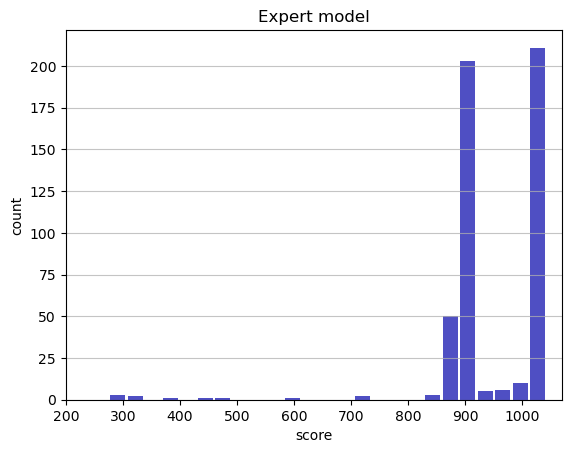

Track generation: 1097..1375 -> 278-tiles track
Epoch: 500
Expert	mean: 946.45	variance: 101.73



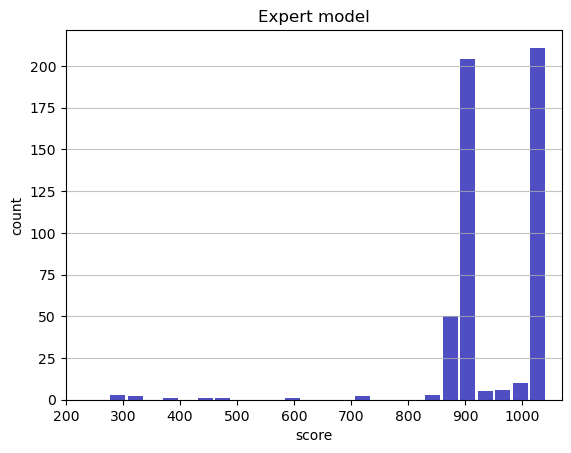

Track generation: 1191..1493 -> 302-tiles track
Epoch: 501
Expert	mean: 946.37	variance: 101.64



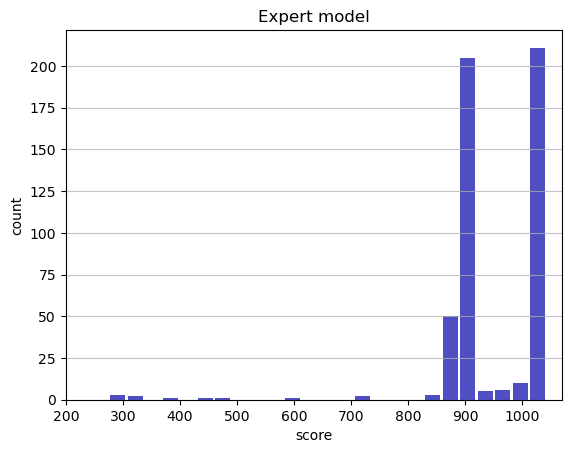

Track generation: 1114..1403 -> 289-tiles track
Epoch: 502
Expert	mean: 946.27	variance: 101.57



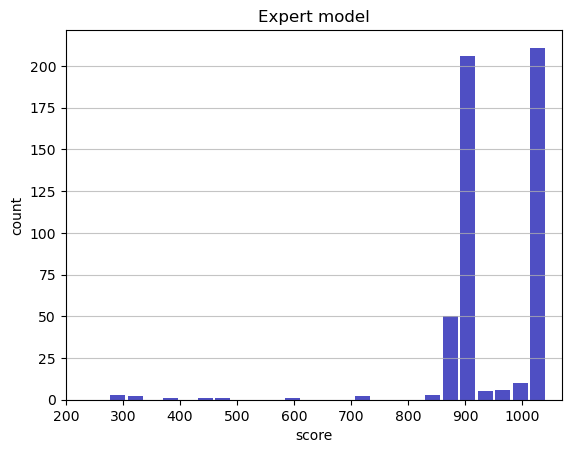

Track generation: 1187..1495 -> 308-tiles track
Epoch: 503
Expert	mean: 946.13	variance: 101.51



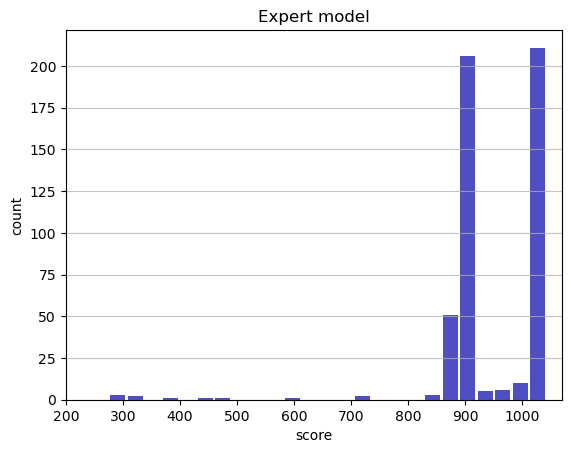

Track generation: 1124..1409 -> 285-tiles track
Epoch: 504
Expert	mean: 946.30	variance: 101.48



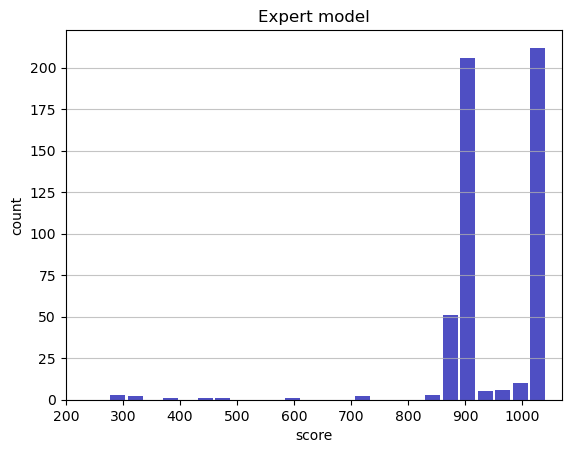

Track generation: 1181..1480 -> 299-tiles track
Epoch: 505
Expert	mean: 946.21	variance: 101.40



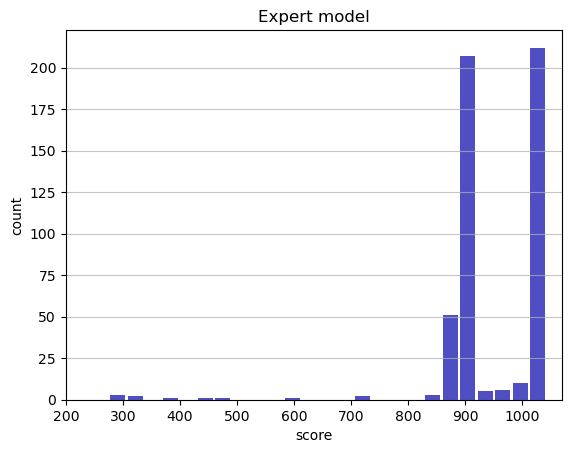

Track generation: 1069..1341 -> 272-tiles track
Epoch: 506
Expert	mean: 946.12	variance: 101.32



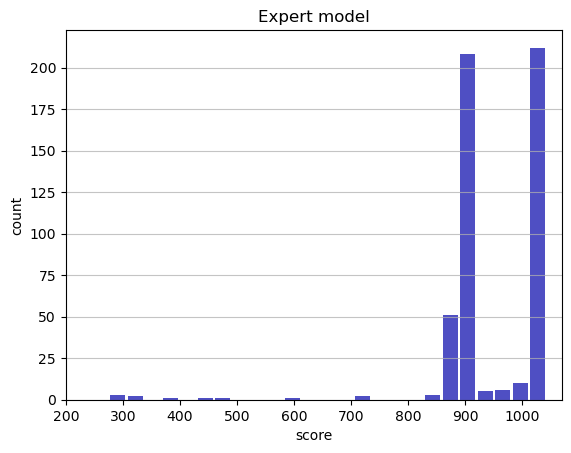

Track generation: 1348..1689 -> 341-tiles track
Epoch: 507
Expert	mean: 946.25	variance: 101.26



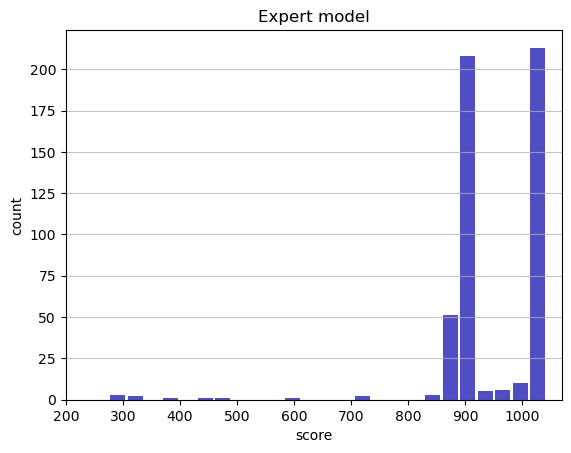

Track generation: 1181..1488 -> 307-tiles track
Epoch: 508
Expert	mean: 946.40	variance: 101.22



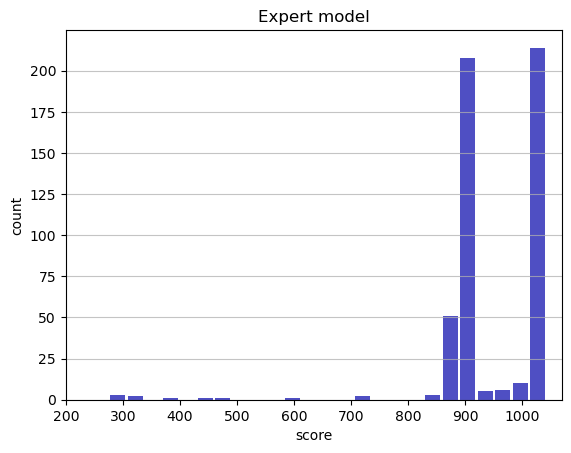

Track generation: 1097..1379 -> 282-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1063..1333 -> 270-tiles track
Epoch: 509
Expert	mean: 946.32	variance: 101.13



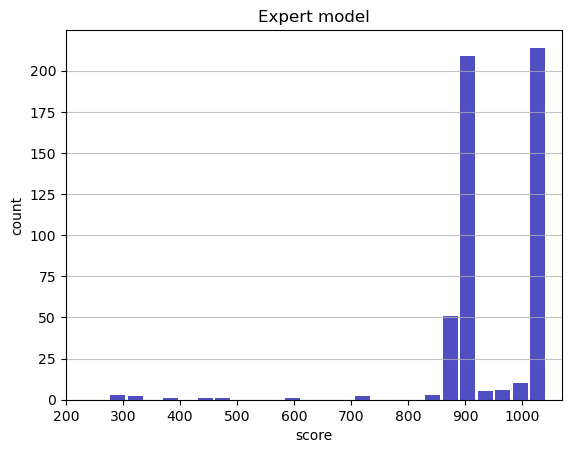

Track generation: 1147..1438 -> 291-tiles track
Epoch: 510
Expert	mean: 946.48	variance: 101.10



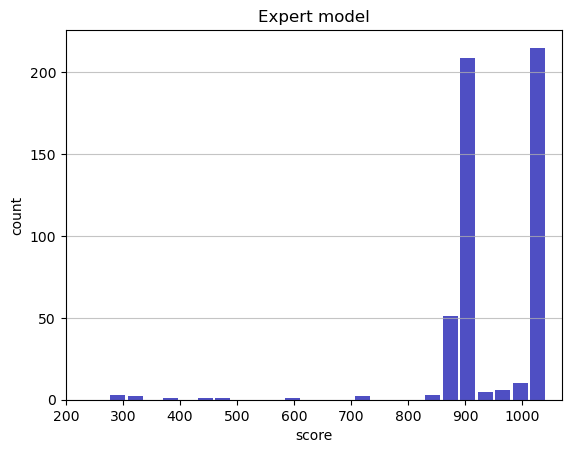

Track generation: 1003..1261 -> 258-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1049..1316 -> 267-tiles track
Epoch: 511
Expert	mean: 946.40	variance: 101.02



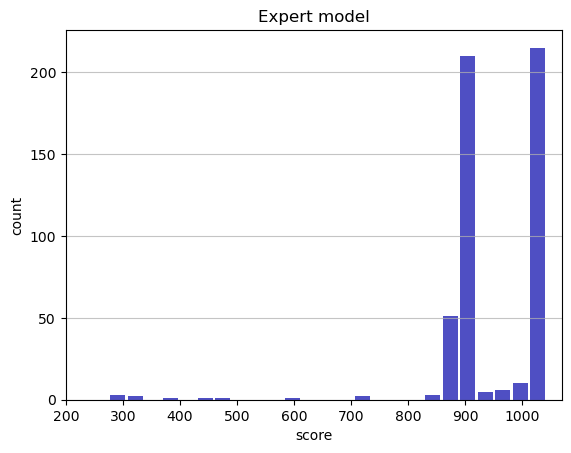

Track generation: 1143..1433 -> 290-tiles track
Epoch: 512
Expert	mean: 946.30	variance: 100.94



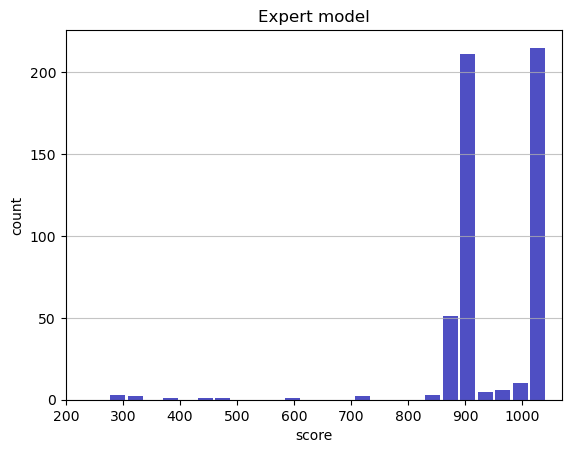

Track generation: 1185..1485 -> 300-tiles track
Epoch: 513
Expert	mean: 946.47	variance: 100.91



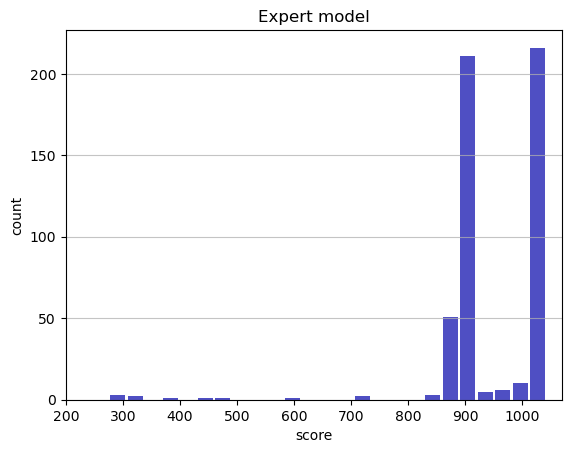

Track generation: 1111..1393 -> 282-tiles track
Epoch: 514
Expert	mean: 946.40	variance: 100.82



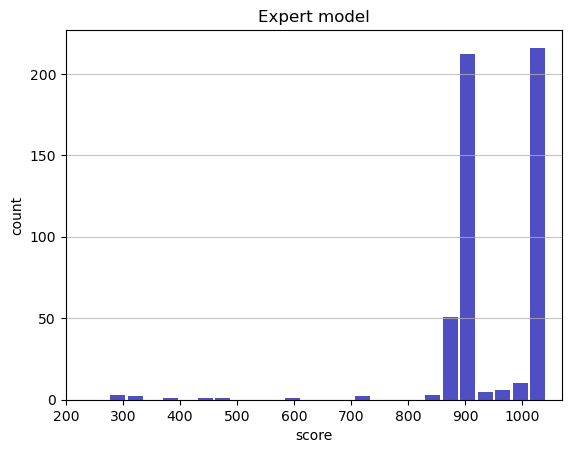

Track generation: 1082..1359 -> 277-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1195..1498 -> 303-tiles track
Epoch: 515
Expert	mean: 946.32	variance: 100.74



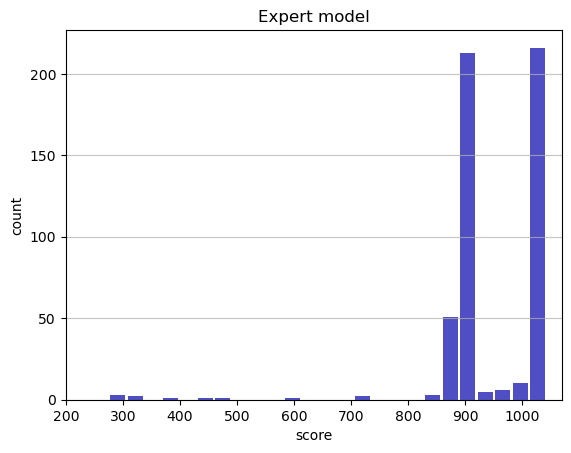

Track generation: 1212..1519 -> 307-tiles track
Epoch: 516
Expert	mean: 946.47	variance: 100.70



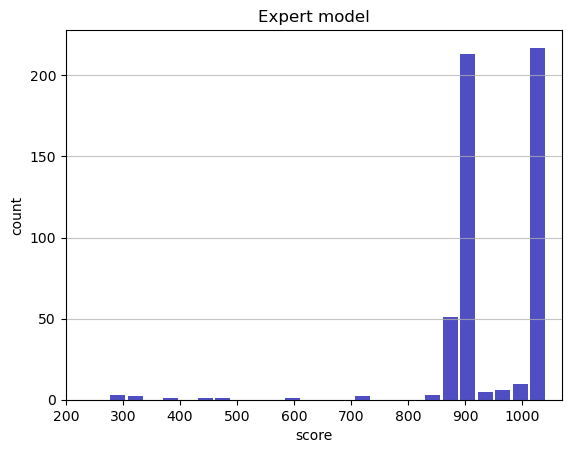

Track generation: 1023..1283 -> 260-tiles track
Epoch: 517
Expert	mean: 946.43	variance: 100.61



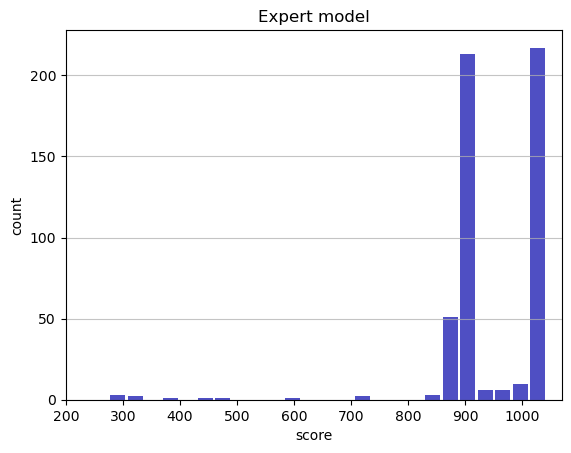

Track generation: 1220..1529 -> 309-tiles track
Epoch: 518
Expert	mean: 946.31	variance: 100.55



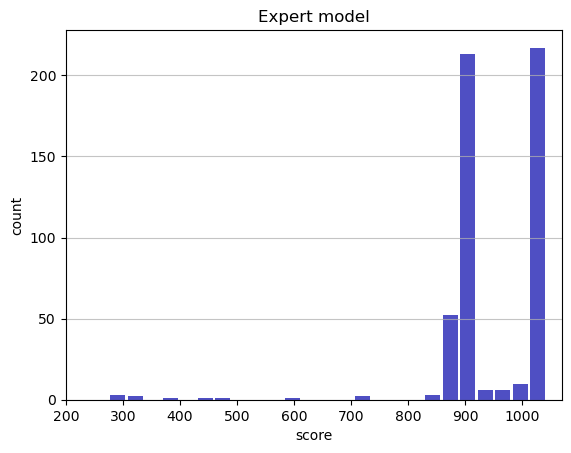

Track generation: 1242..1557 -> 315-tiles track
Epoch: 519
Expert	mean: 946.46	variance: 100.51



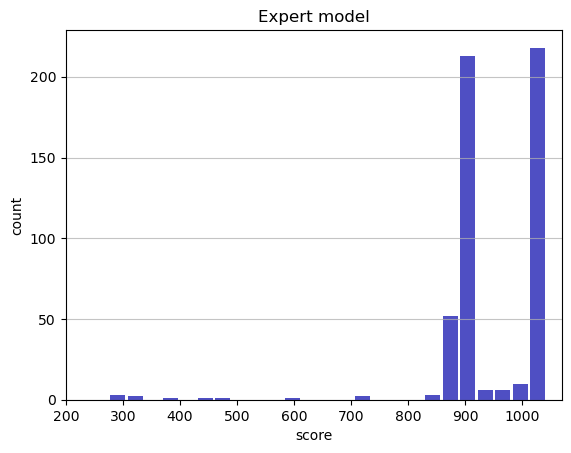

Track generation: 1124..1409 -> 285-tiles track
Epoch: 520
Expert	mean: 946.37	variance: 100.43



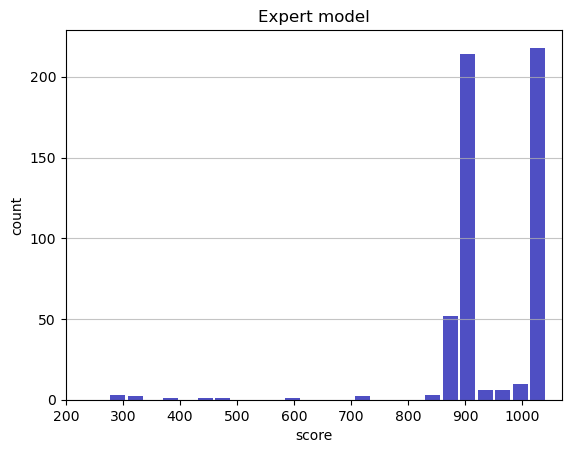

Track generation: 1140..1438 -> 298-tiles track
Epoch: 521
Expert	mean: 946.28	variance: 100.36



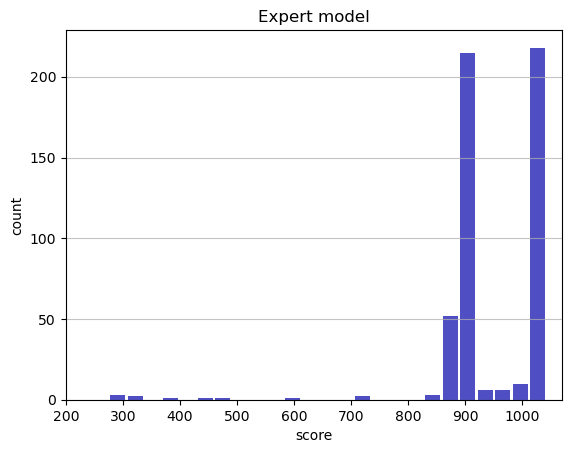

Track generation: 1242..1556 -> 314-tiles track
Epoch: 522
Expert	mean: 946.18	variance: 100.29



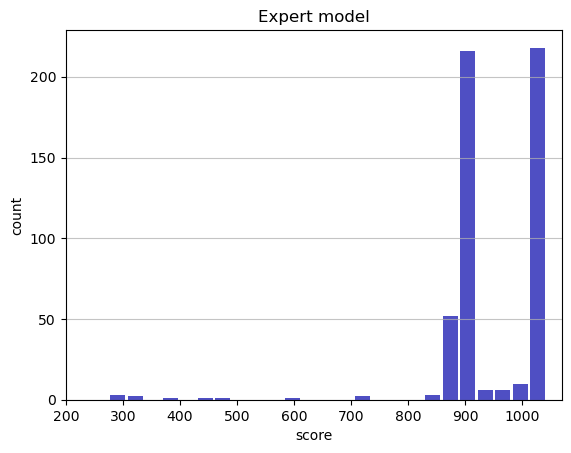

Track generation: 1103..1383 -> 280-tiles track
Epoch: 523
Expert	mean: 946.36	variance: 100.27



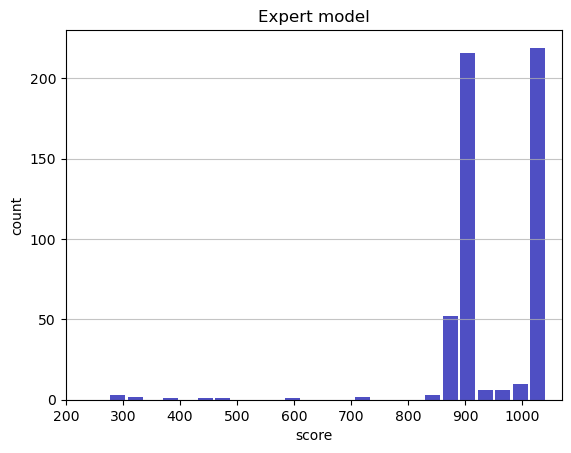

Track generation: 1319..1653 -> 334-tiles track
Epoch: 524
Expert	mean: 946.25	variance: 100.20



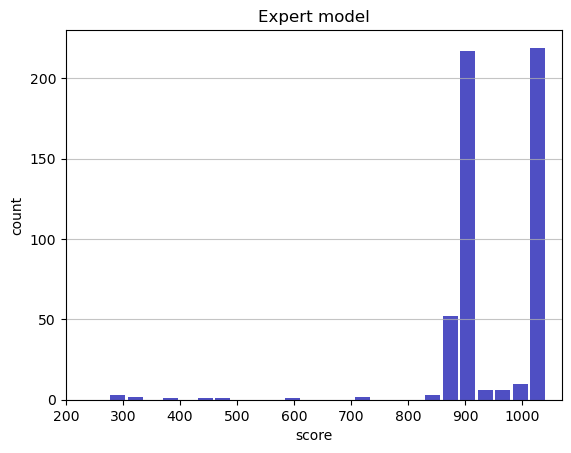

Track generation: 1161..1455 -> 294-tiles track
Epoch: 525
Expert	mean: 946.40	variance: 100.16



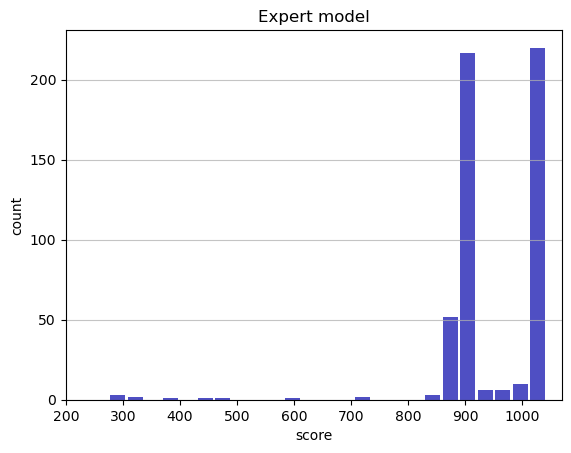

Track generation: 1031..1293 -> 262-tiles track
Epoch: 526
Expert	mean: 946.57	variance: 100.14



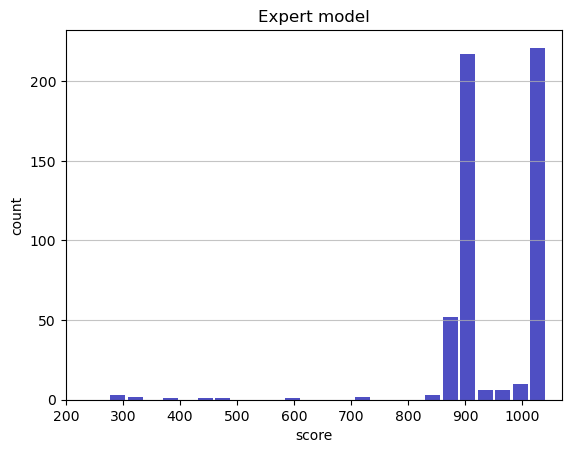

Track generation: 1117..1410 -> 293-tiles track
Epoch: 527
Expert	mean: 946.51	variance: 100.06



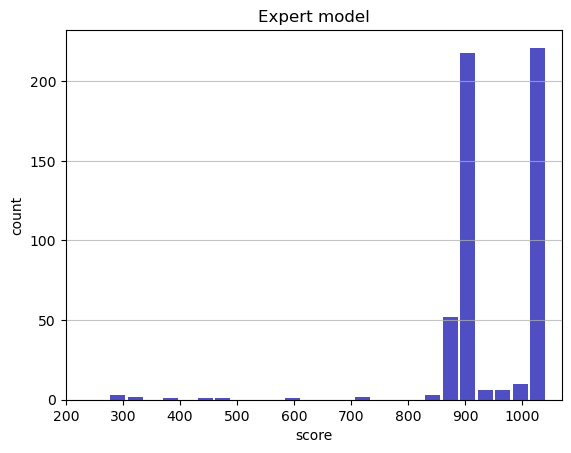

Track generation: 1131..1418 -> 287-tiles track
Epoch: 528
Expert	mean: 946.41	variance: 99.99



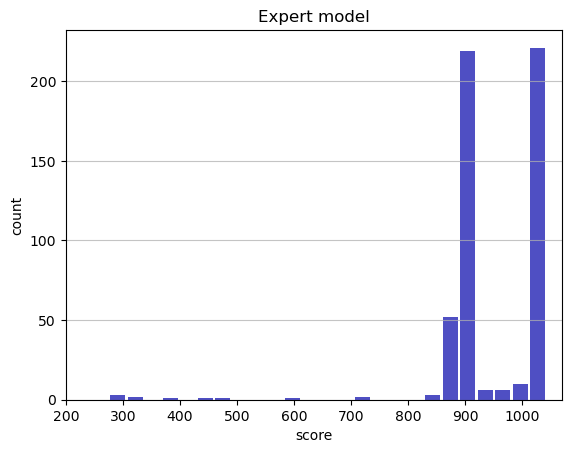

Track generation: 1202..1508 -> 306-tiles track
Epoch: 529
Expert	mean: 946.32	variance: 99.91



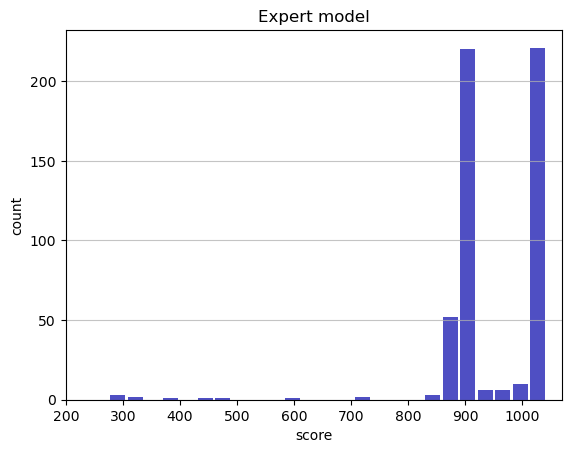

Track generation: 1092..1369 -> 277-tiles track
Epoch: 530
Expert	mean: 946.23	variance: 99.84



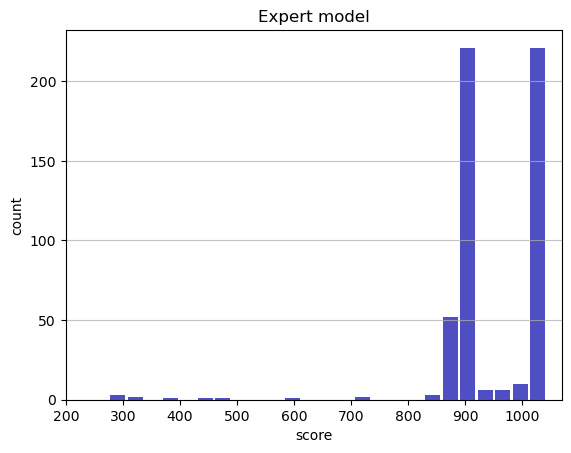

Track generation: 1247..1562 -> 315-tiles track
Epoch: 531
Expert	mean: 946.37	variance: 99.79



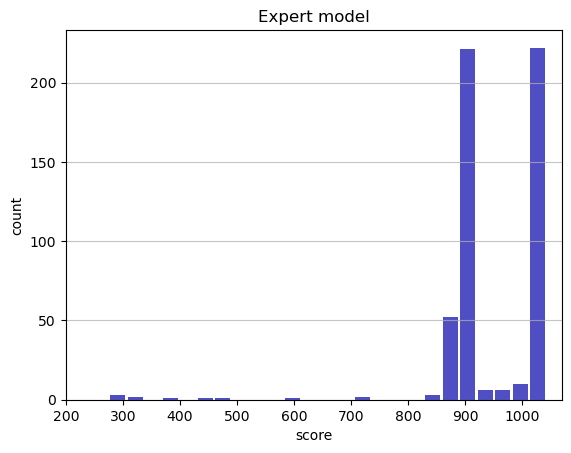

Track generation: 1299..1628 -> 329-tiles track
Epoch: 532
Expert	mean: 946.44	variance: 99.72



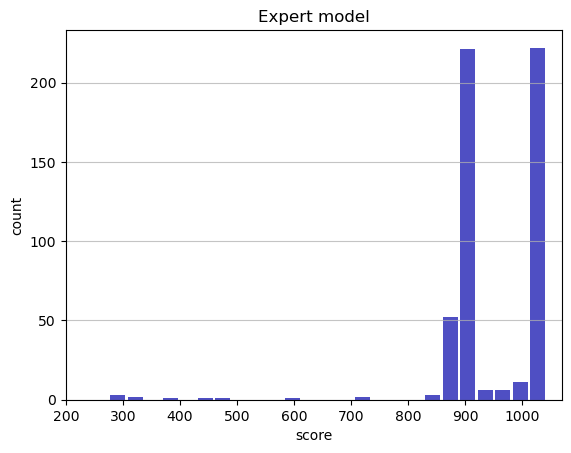

Track generation: 1258..1584 -> 326-tiles track
Epoch: 533
Expert	mean: 946.53	variance: 99.64



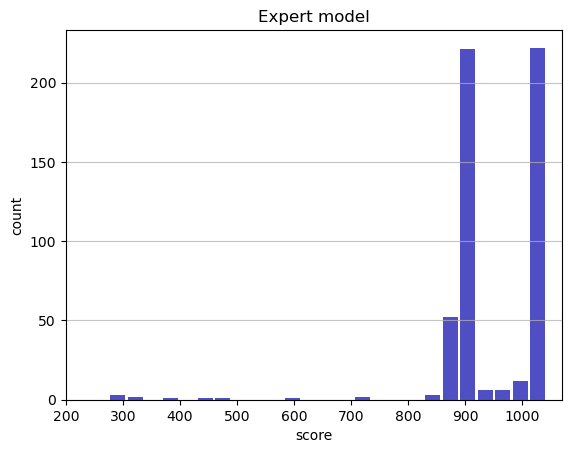

Track generation: 1104..1384 -> 280-tiles track
Epoch: 534
Expert	mean: 946.45	variance: 99.56



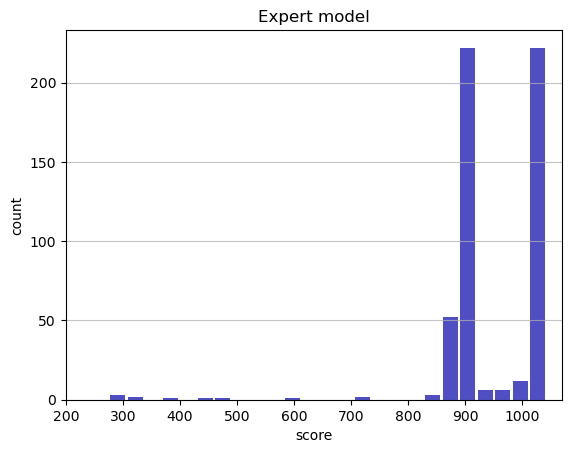

Track generation: 1118..1405 -> 287-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1239..1553 -> 314-tiles track
Epoch: 535
Expert	mean: 946.36	variance: 99.49



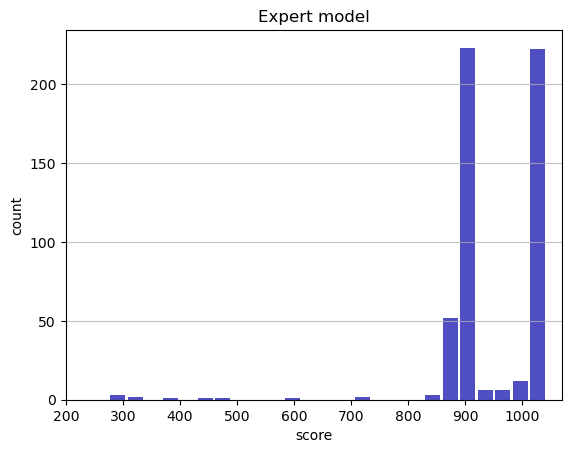

Track generation: 1163..1458 -> 295-tiles track
Epoch: 536
Expert	mean: 946.26	variance: 99.42



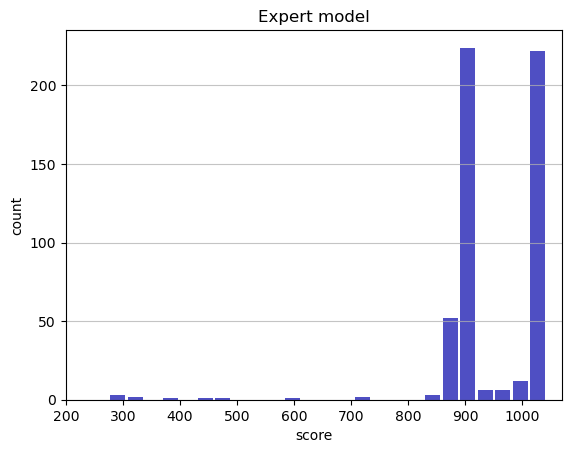

Track generation: 1056..1324 -> 268-tiles track
Epoch: 537
Expert	mean: 946.17	variance: 99.35



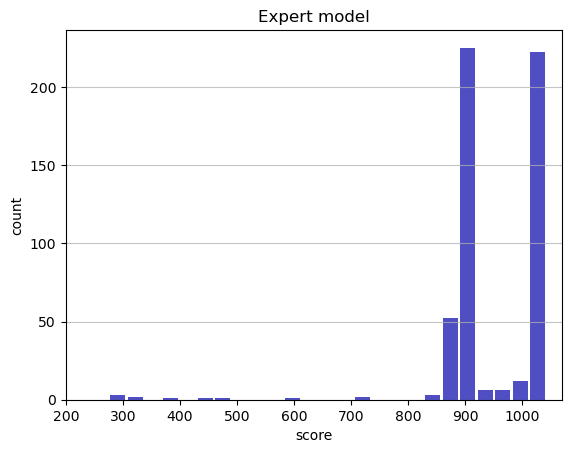

Track generation: 1199..1503 -> 304-tiles track
Epoch: 538
Expert	mean: 946.10	variance: 99.28



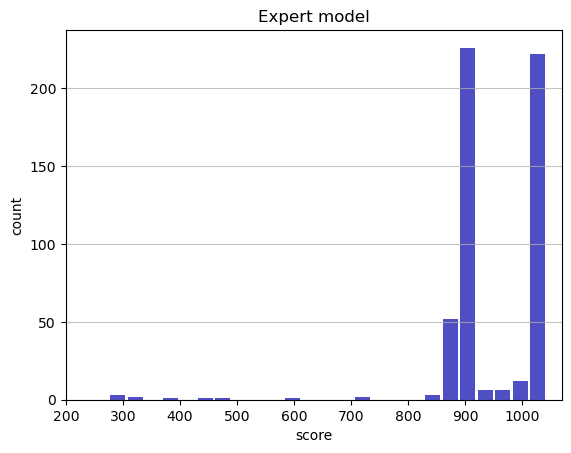

Track generation: 1195..1498 -> 303-tiles track
Epoch: 539
Expert	mean: 946.02	variance: 99.20



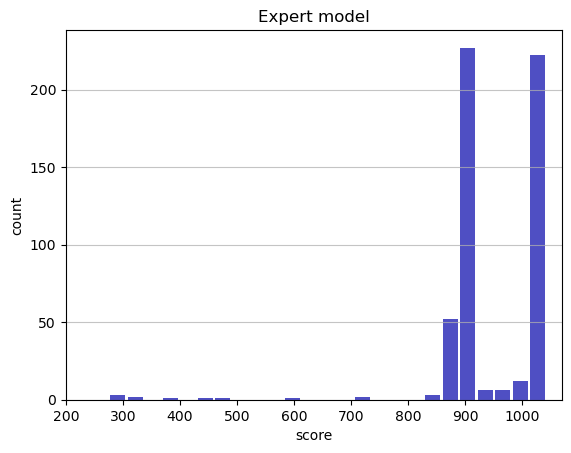

Track generation: 1221..1530 -> 309-tiles track
Epoch: 540
Expert	mean: 946.16	variance: 99.16



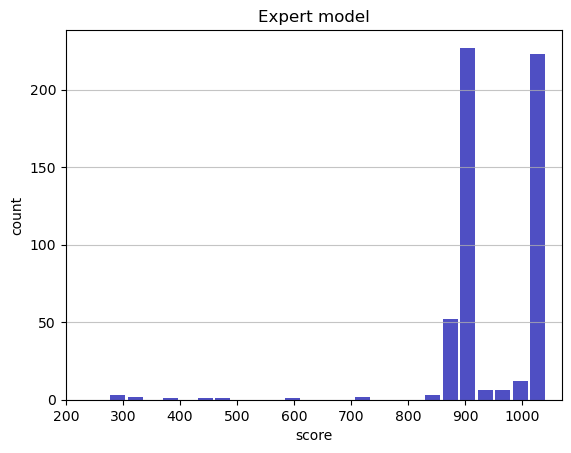

Track generation: 1175..1481 -> 306-tiles track
Epoch: 541
Expert	mean: 946.30	variance: 99.12



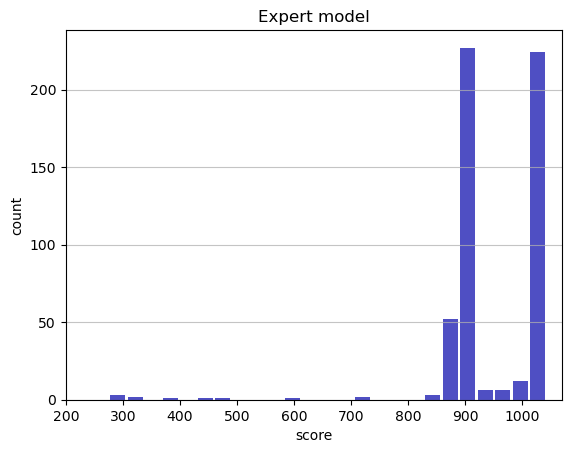

Track generation: 1123..1408 -> 285-tiles track
Epoch: 542
Expert	mean: 946.46	variance: 99.10



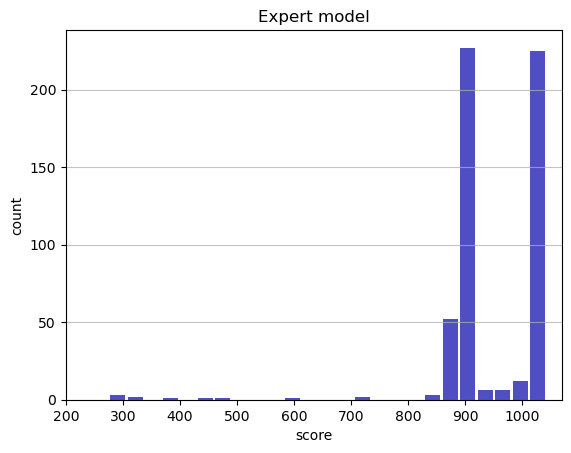

Track generation: 1052..1319 -> 267-tiles track
Epoch: 543
Expert	mean: 946.63	variance: 99.09



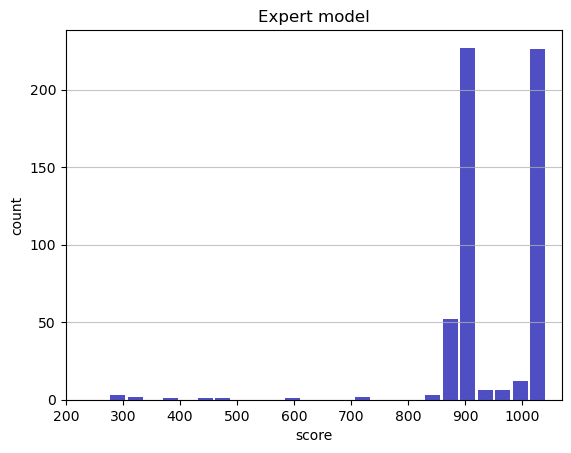

Track generation: 946..1193 -> 247-tiles track
Epoch: 544
Expert	mean: 946.79	variance: 99.07



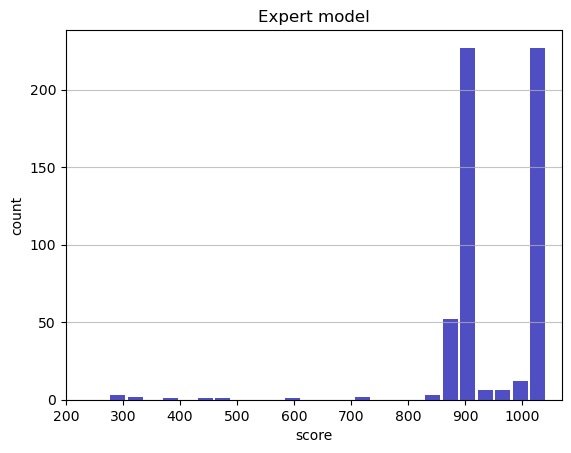

Track generation: 1292..1619 -> 327-tiles track
Epoch: 545
Expert	mean: 946.67	variance: 99.02



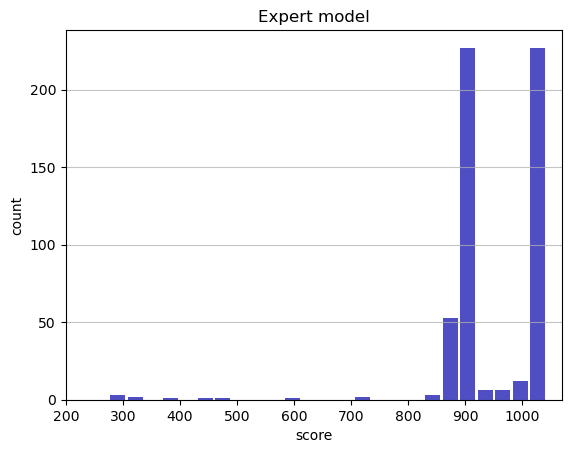

Track generation: 1194..1496 -> 302-tiles track
Epoch: 546
Expert	mean: 946.81	variance: 98.99



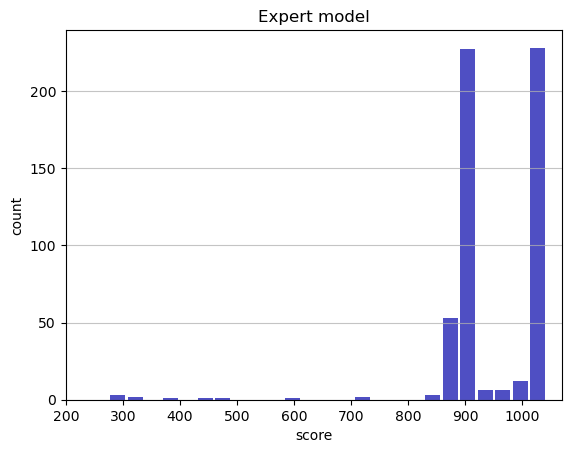

Track generation: 1054..1324 -> 270-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1357..1700 -> 343-tiles track
Epoch: 547
Expert	mean: 946.85	variance: 98.90



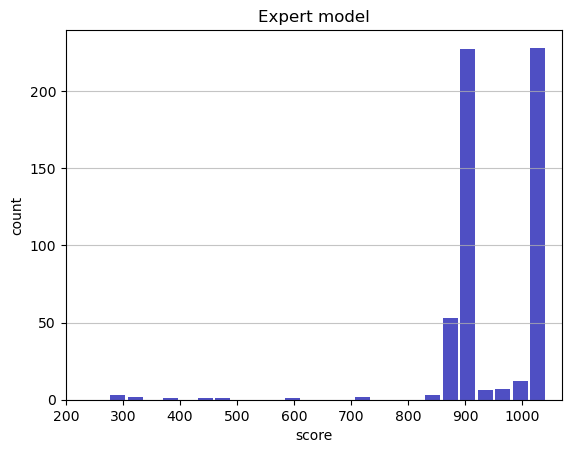

Track generation: 1136..1424 -> 288-tiles track
Epoch: 548
Expert	mean: 947.01	variance: 98.88



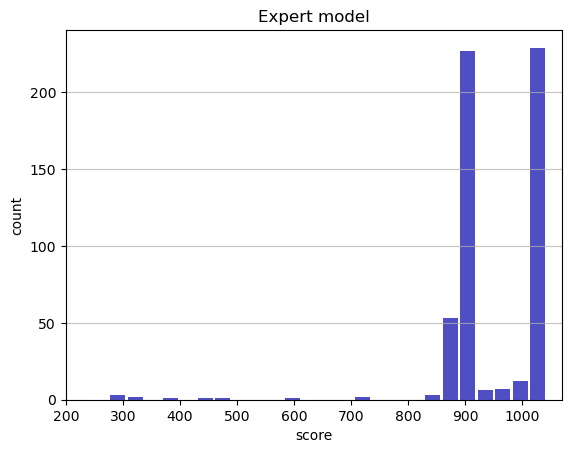

Track generation: 1077..1351 -> 274-tiles track
Epoch: 549
Expert	mean: 947.17	variance: 98.86



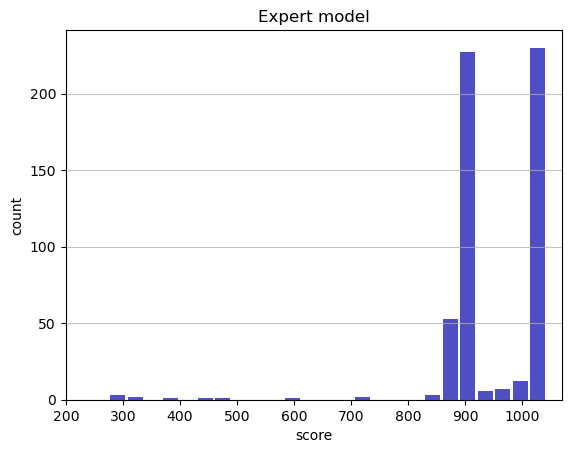

Track generation: 1197..1501 -> 304-tiles track
Epoch: 550
Expert	mean: 947.30	variance: 98.82



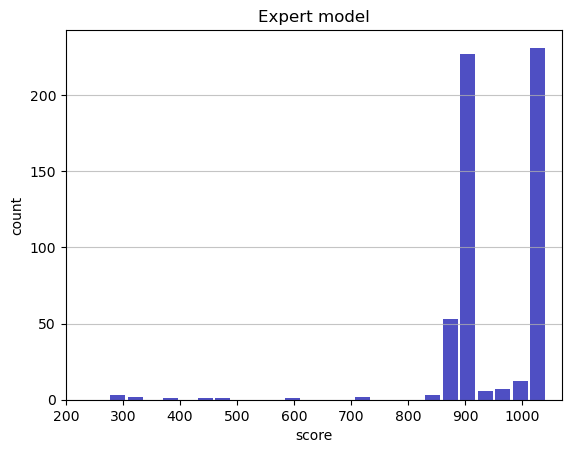

Track generation: 1004..1265 -> 261-tiles track
Epoch: 551
Expert	mean: 947.45	variance: 98.79



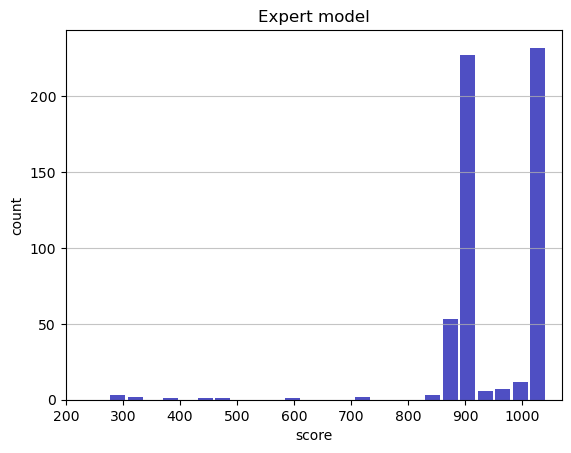

Track generation: 1116..1399 -> 283-tiles track
Epoch: 552
Expert	mean: 947.61	variance: 98.77



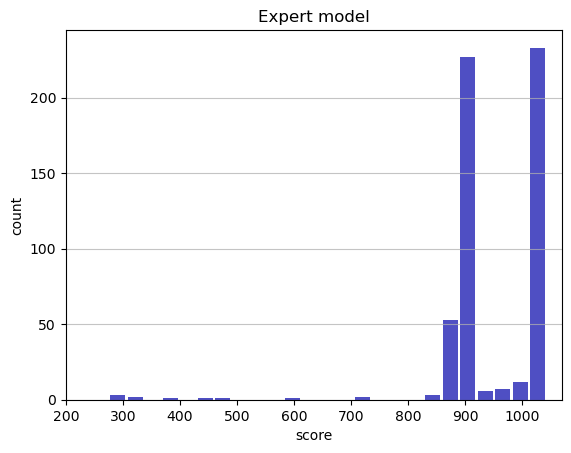

Track generation: 1109..1390 -> 281-tiles track
Epoch: 553
Expert	mean: 947.53	variance: 98.69



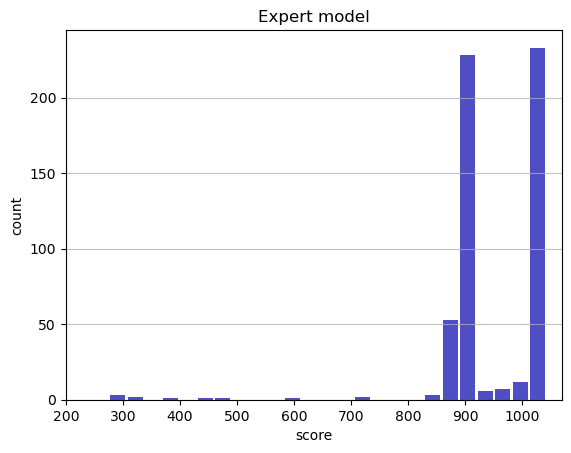

Track generation: 1060..1329 -> 269-tiles track
Epoch: 554
Expert	mean: 947.70	variance: 98.68



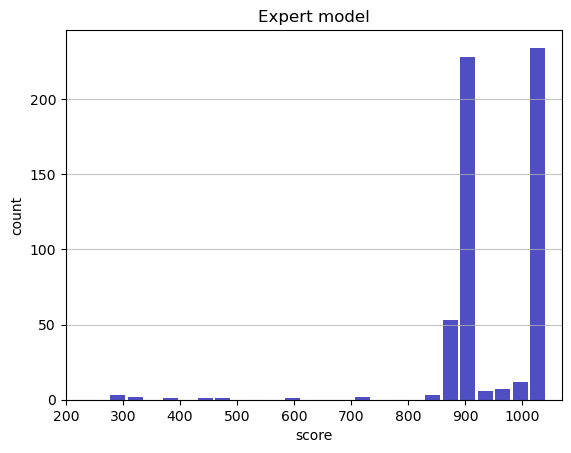

Track generation: 977..1232 -> 255-tiles track
Epoch: 555
Expert	mean: 947.86	variance: 98.66



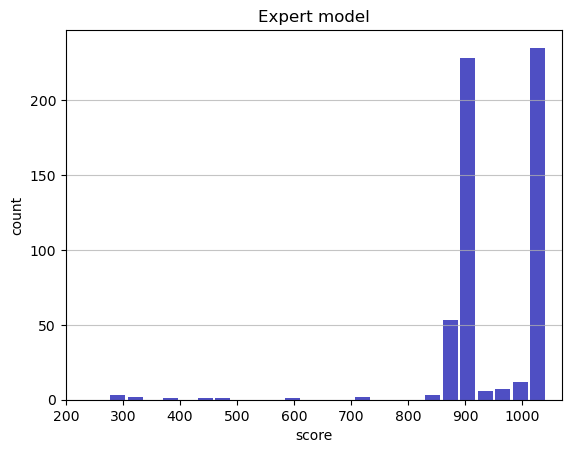

Track generation: 1094..1372 -> 278-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1128..1414 -> 286-tiles track
Epoch: 556
Expert	mean: 947.75	variance: 98.61



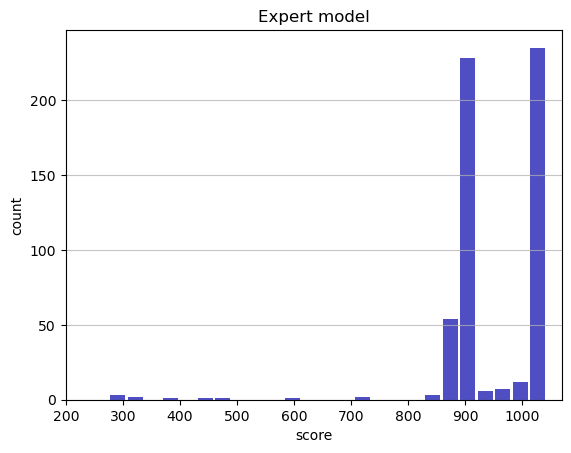

Track generation: 1190..1501 -> 311-tiles track
Epoch: 557
Expert	mean: 947.66	variance: 98.54



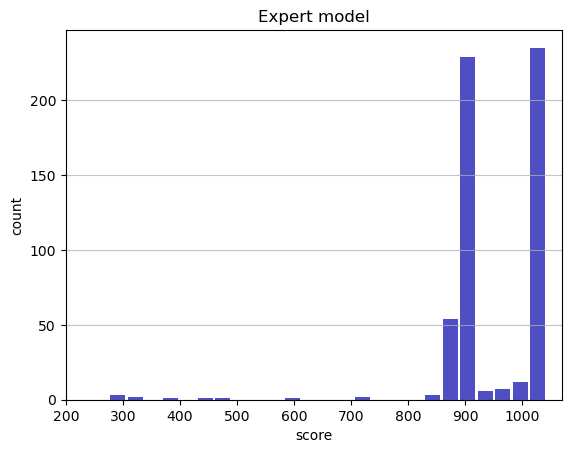

Track generation: 1185..1485 -> 300-tiles track
Epoch: 558
Expert	mean: 947.80	variance: 98.51



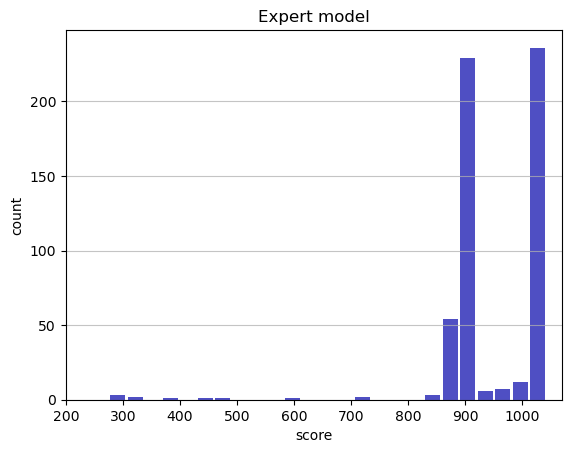

Track generation: 1362..1706 -> 344-tiles track
Epoch: 559
Expert	mean: 947.92	variance: 98.45



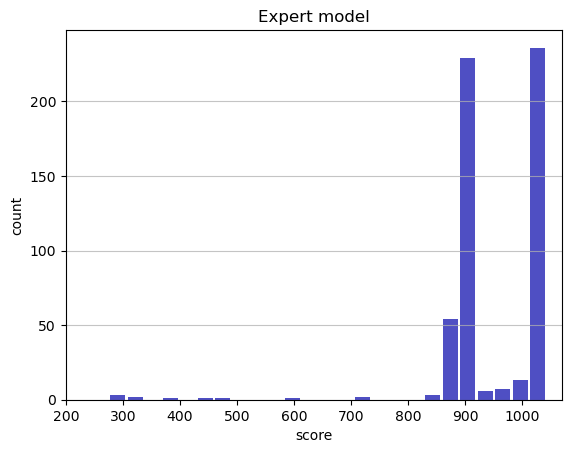

Track generation: 1044..1309 -> 265-tiles track
Epoch: 560
Expert	mean: 947.85	variance: 98.38



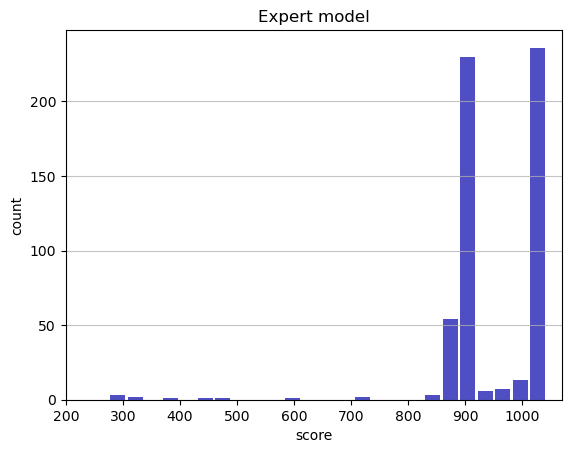

Track generation: 1073..1359 -> 286-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1104..1384 -> 280-tiles track
Epoch: 561
Expert	mean: 947.75	variance: 98.32



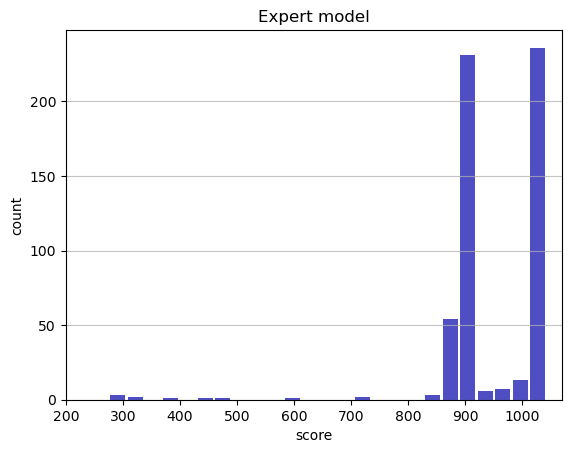

Track generation: 1204..1517 -> 313-tiles track
Epoch: 562
Expert	mean: 947.88	variance: 98.28



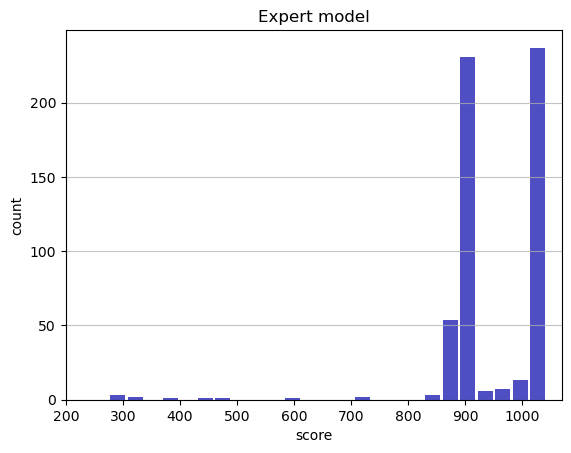

Track generation: 1180..1479 -> 299-tiles track
Epoch: 563
Expert	mean: 947.79	variance: 98.21



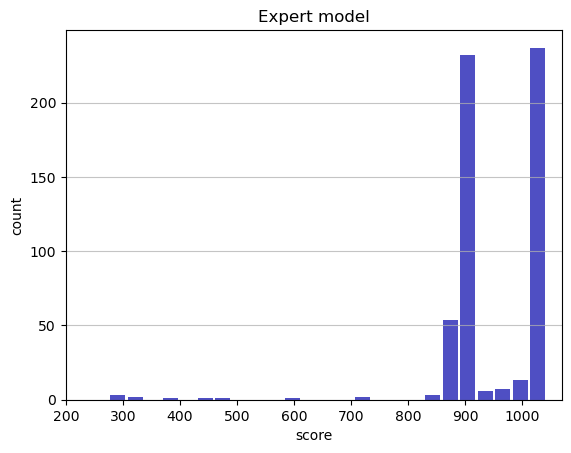

Track generation: 1196..1499 -> 303-tiles track
Epoch: 564
Expert	mean: 947.93	variance: 98.18



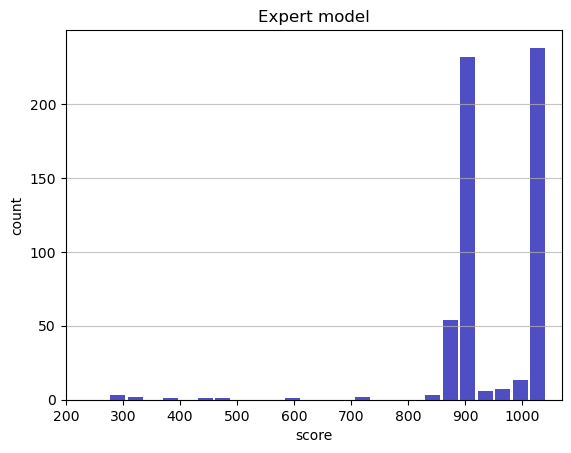

Track generation: 1071..1343 -> 272-tiles track
Epoch: 565
Expert	mean: 947.86	variance: 98.10



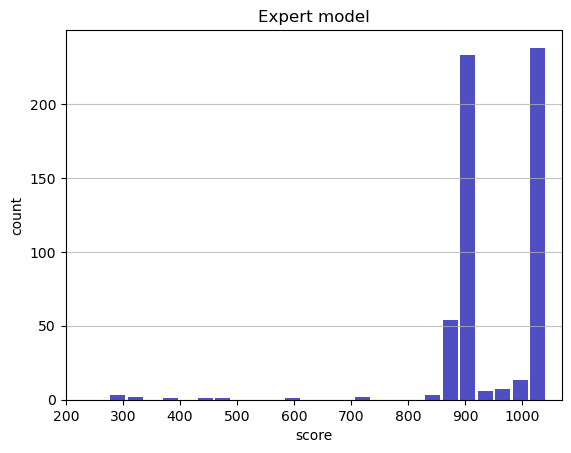

Track generation: 1098..1382 -> 284-tiles track
Epoch: 566
Expert	mean: 948.00	variance: 98.07



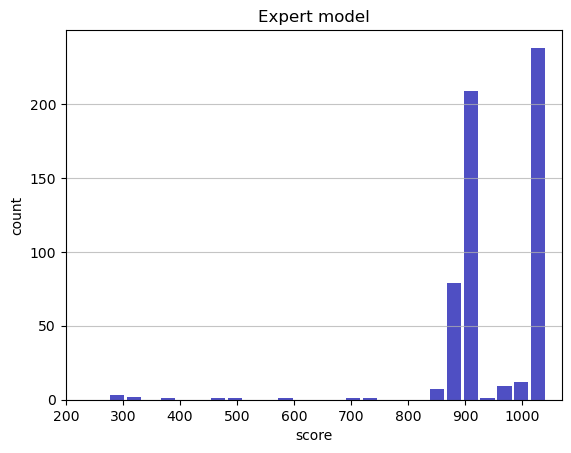

Track generation: 1129..1424 -> 295-tiles track
Epoch: 567
Expert	mean: 947.93	variance: 98.00



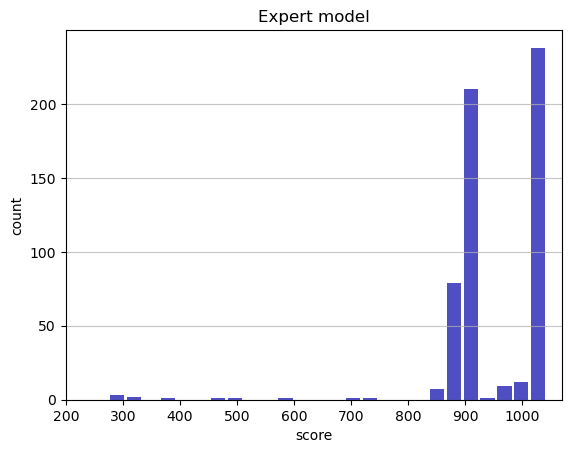

Track generation: 948..1195 -> 247-tiles track
Epoch: 568
Expert	mean: 948.09	variance: 97.99



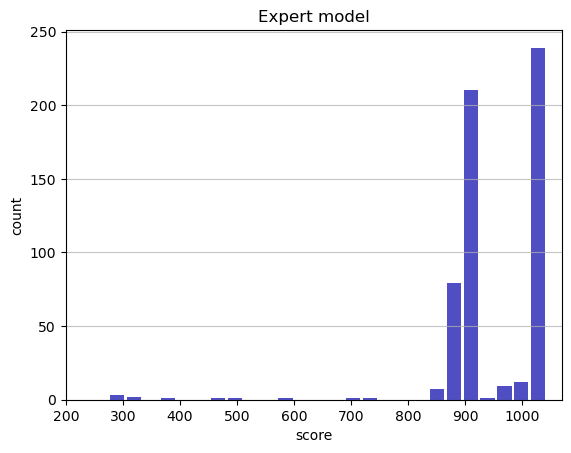

Track generation: 1181..1481 -> 300-tiles track
Epoch: 569
Expert	mean: 948.02	variance: 97.92



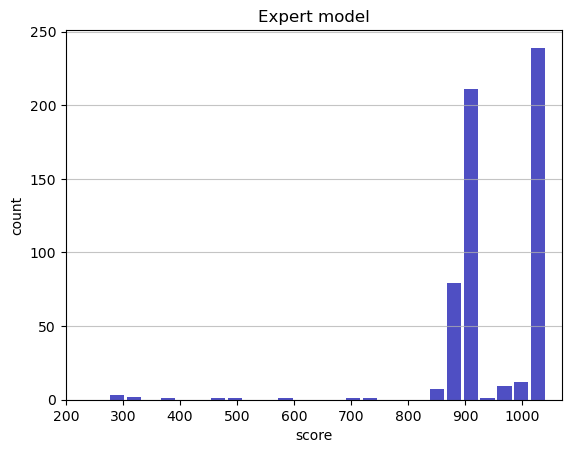

Track generation: 1205..1511 -> 306-tiles track
Epoch: 570
Expert	mean: 948.15	variance: 97.88



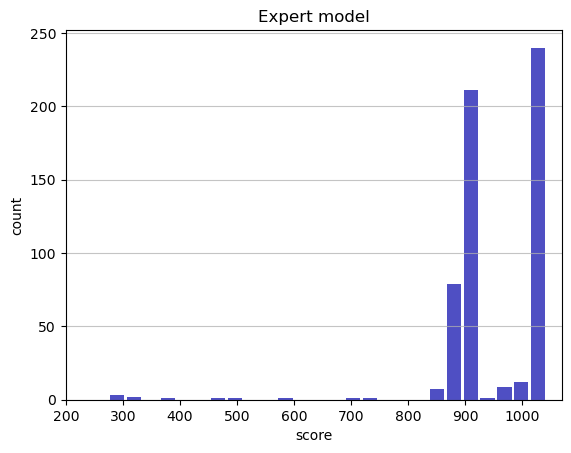

Track generation: 1208..1514 -> 306-tiles track
Epoch: 571
Expert	mean: 948.06	variance: 97.82



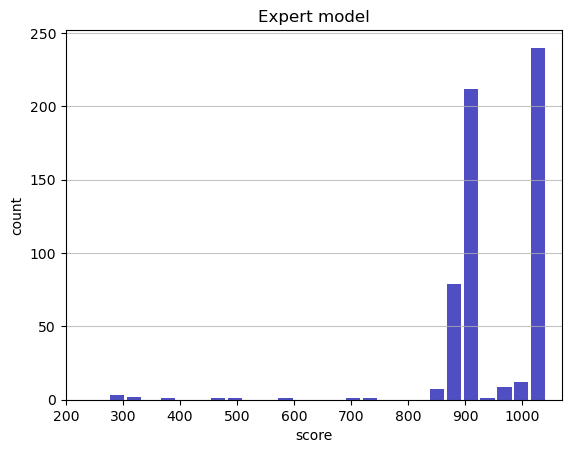

Track generation: 1156..1449 -> 293-tiles track
Epoch: 572
Expert	mean: 948.21	variance: 97.79



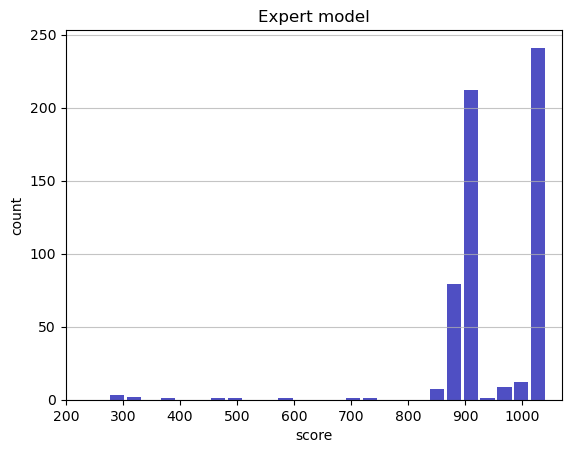

Track generation: 895..1131 -> 236-tiles track
Epoch: 573
Expert	mean: 948.37	variance: 97.78



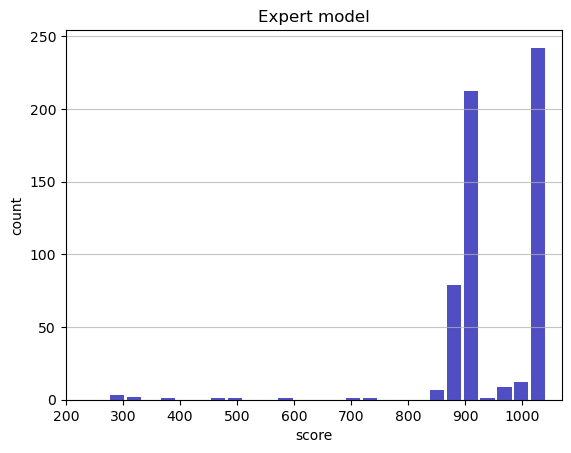

Track generation: 1112..1401 -> 289-tiles track
Epoch: 574
Expert	mean: 948.28	variance: 97.72



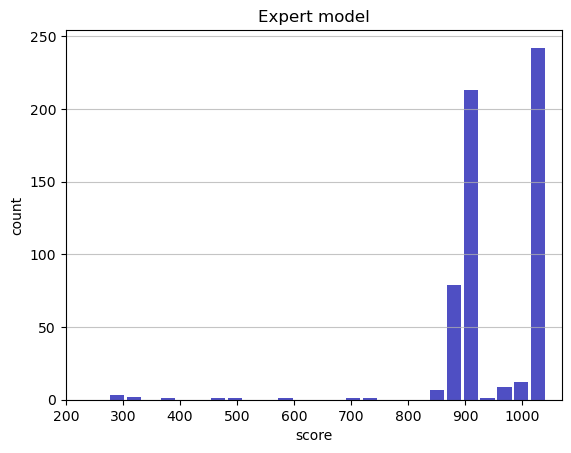

Track generation: 1136..1424 -> 288-tiles track
Epoch: 575
Expert	mean: 948.20	variance: 97.65



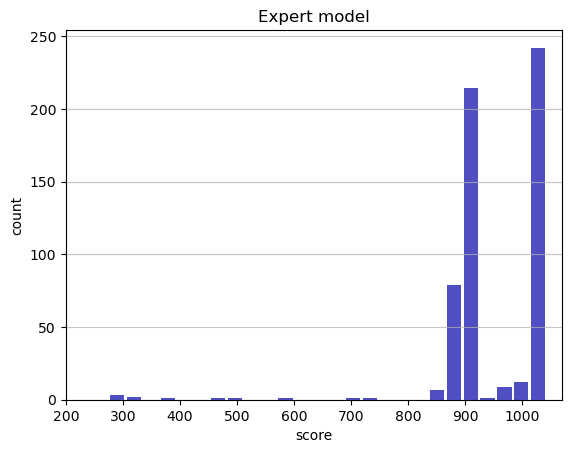

Track generation: 1248..1564 -> 316-tiles track
Epoch: 576
Expert	mean: 948.34	variance: 97.62



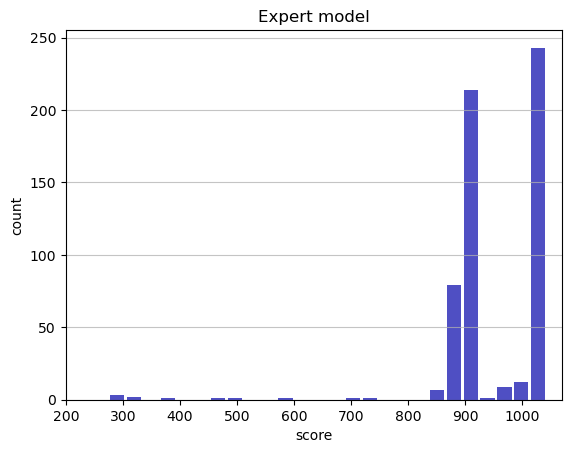

Track generation: 1007..1262 -> 255-tiles track
Epoch: 577
Expert	mean: 948.50	variance: 97.62



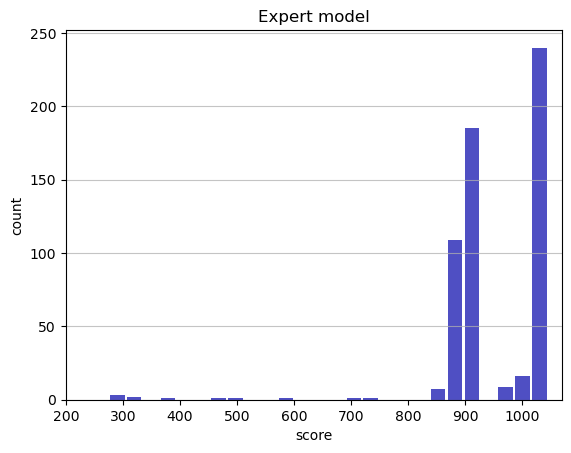

Track generation: 1375..1723 -> 348-tiles track
Epoch: 578
Expert	mean: 948.55	variance: 97.54



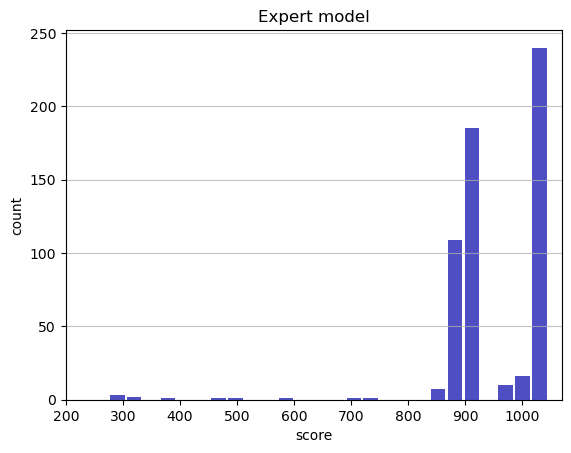

Track generation: 1135..1430 -> 295-tiles track
Epoch: 579
Expert	mean: 948.68	variance: 97.51



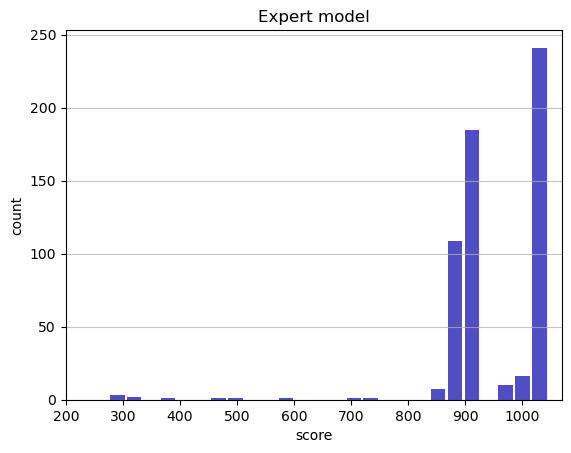

Track generation: 1169..1465 -> 296-tiles track
Epoch: 580
Expert	mean: 948.59	variance: 97.45



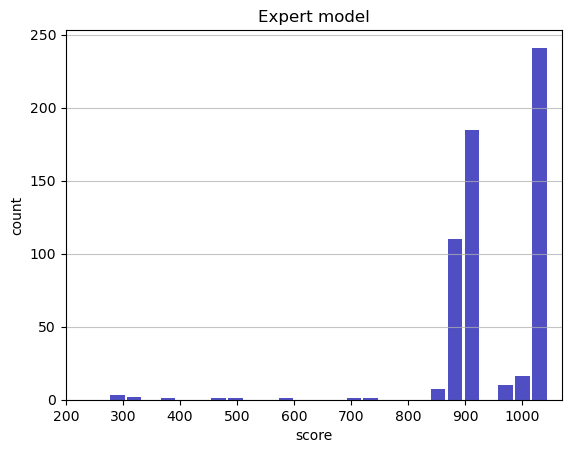

Track generation: 1085..1366 -> 281-tiles track
Epoch: 581
Expert	mean: 948.72	variance: 97.42



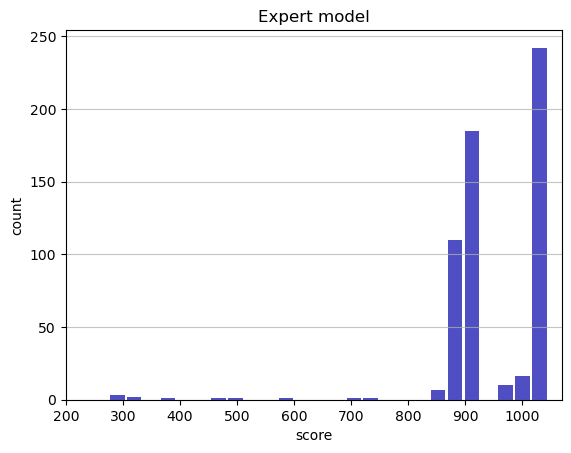

Track generation: 1343..1682 -> 339-tiles track
Epoch: 582
Expert	mean: 948.83	variance: 97.37



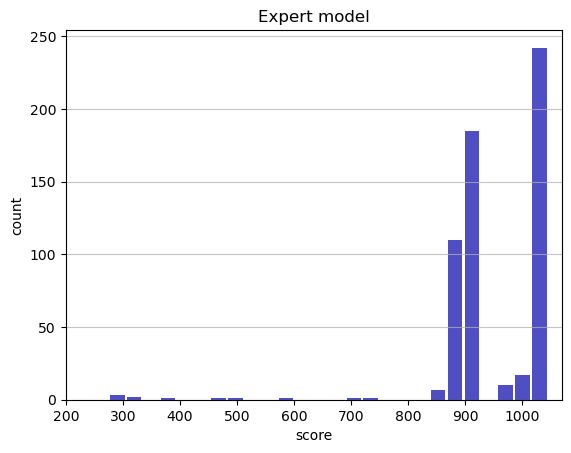

Track generation: 1200..1504 -> 304-tiles track
Epoch: 583
Expert	mean: 948.75	variance: 97.31



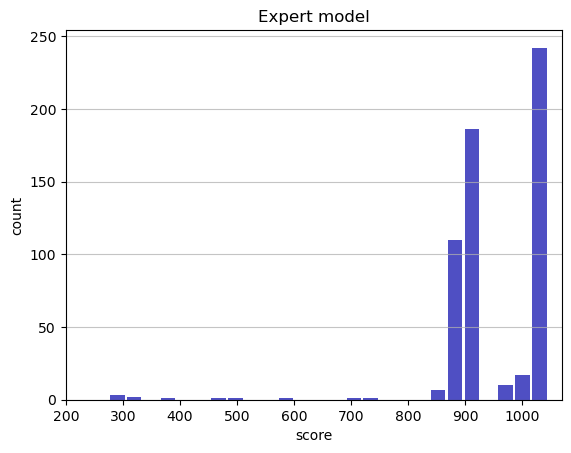

Track generation: 1160..1461 -> 301-tiles track
Epoch: 584
Expert	mean: 948.88	variance: 97.27



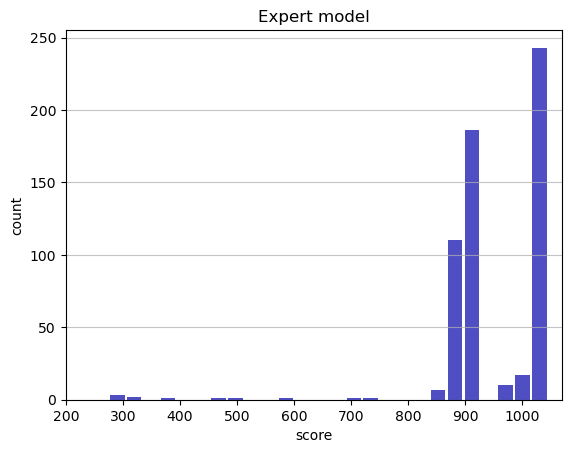

Track generation: 1165..1460 -> 295-tiles track
Epoch: 585
Expert	mean: 949.01	variance: 97.24



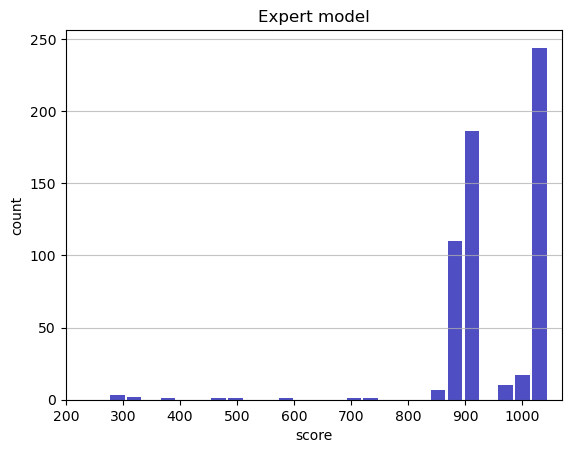

Track generation: 1244..1559 -> 315-tiles track
Epoch: 586
Expert	mean: 949.13	variance: 97.20



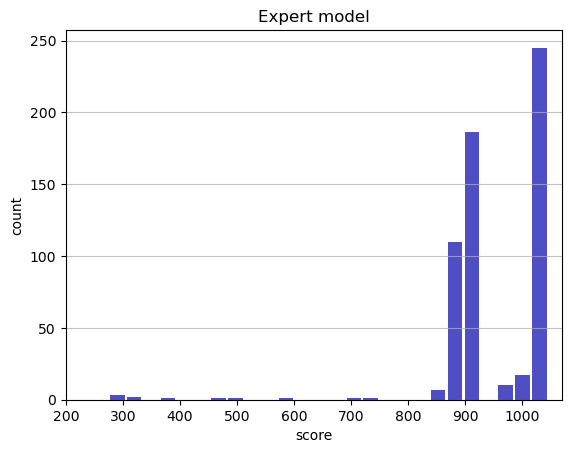

Track generation: 1132..1419 -> 287-tiles track
Epoch: 587
Expert	mean: 949.27	variance: 97.18



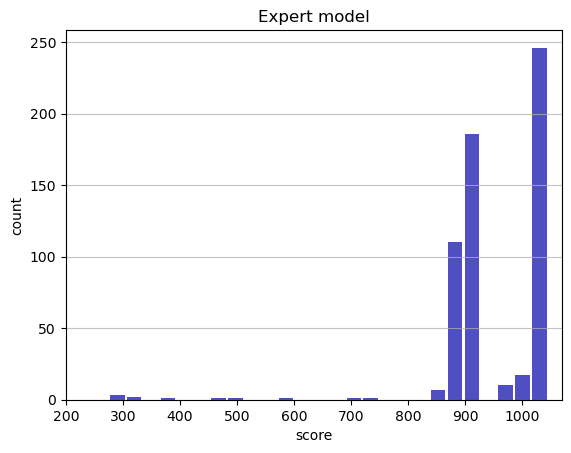

Track generation: 1273..1595 -> 322-tiles track
Epoch: 588
Expert	mean: 949.19	variance: 97.11



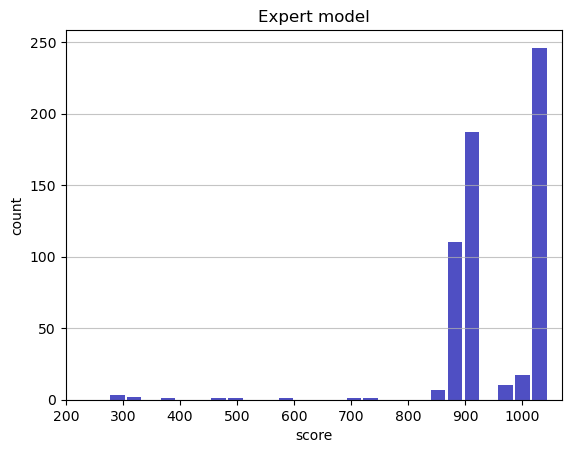

Track generation: 1188..1489 -> 301-tiles track
Epoch: 589
Expert	mean: 949.13	variance: 97.05



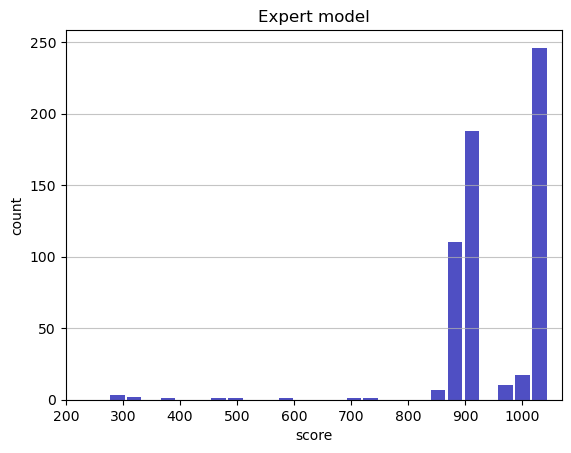

Track generation: 1134..1421 -> 287-tiles track
Epoch: 590
Expert	mean: 949.26	variance: 97.02



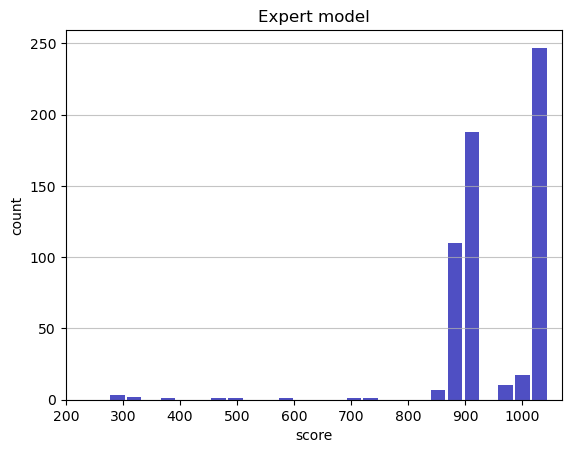

Track generation: 1136..1424 -> 288-tiles track
Epoch: 591
Expert	mean: 949.21	variance: 96.95



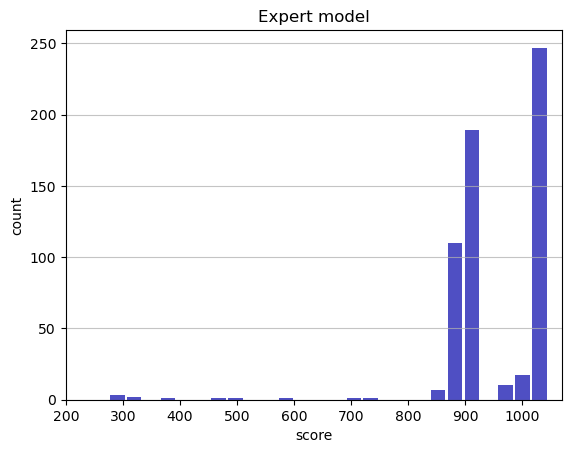

Track generation: 1275..1598 -> 323-tiles track
Epoch: 592
Expert	mean: 948.04	variance: 100.94



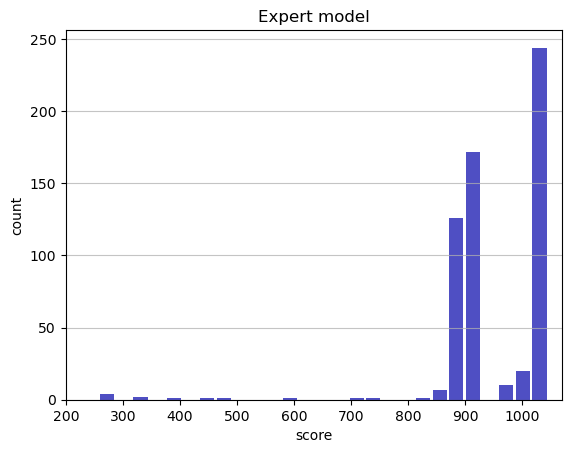

Track generation: 1180..1479 -> 299-tiles track
Epoch: 593
Expert	mean: 947.92	variance: 100.89



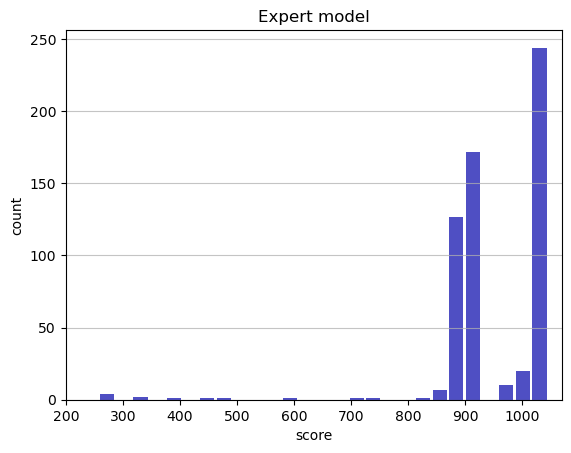

Track generation: 1013..1275 -> 262-tiles track
Epoch: 594
Expert	mean: 948.07	variance: 100.88



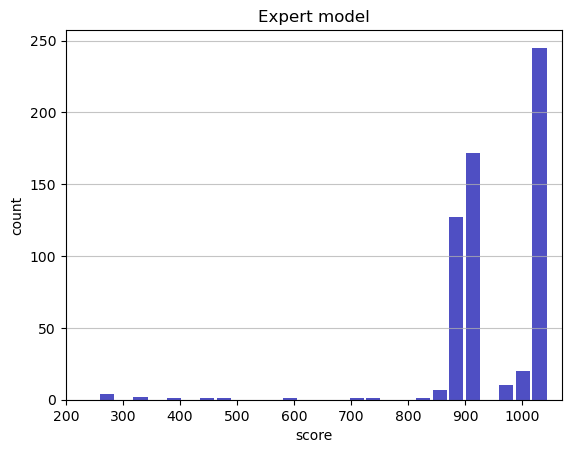

Track generation: 1316..1649 -> 333-tiles track
Epoch: 595
Expert	mean: 947.99	variance: 100.81



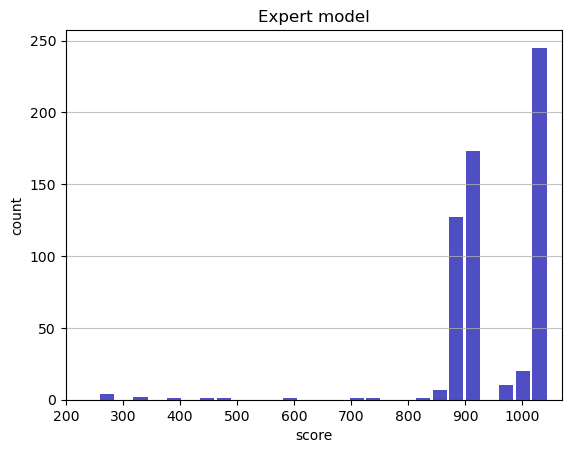

Track generation: 1065..1340 -> 275-tiles track
Epoch: 596
Expert	mean: 948.13	variance: 100.78



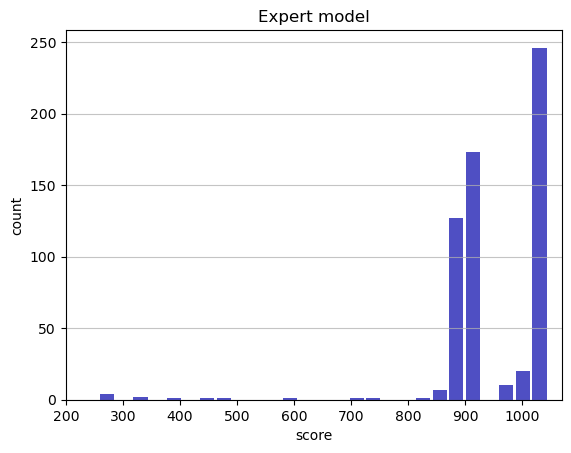

Track generation: 1047..1313 -> 266-tiles track
Epoch: 597
Expert	mean: 948.28	variance: 100.76



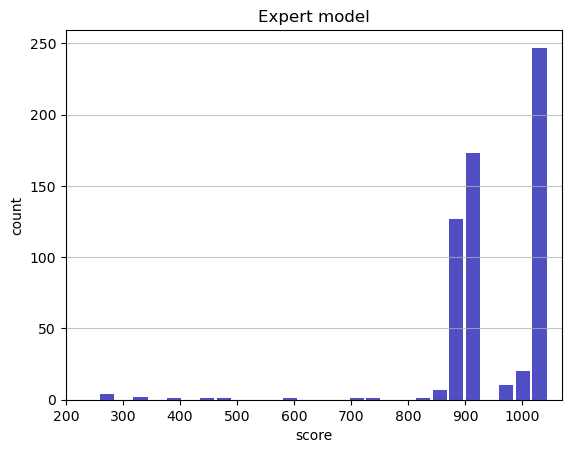

Track generation: 1170..1473 -> 303-tiles track
Epoch: 598
Expert	mean: 948.41	variance: 100.73



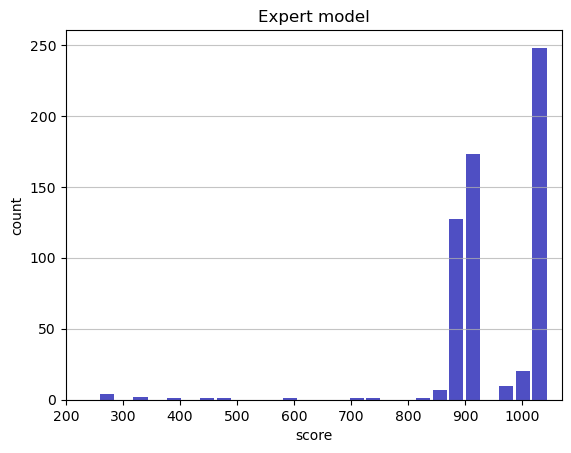

Track generation: 1032..1301 -> 269-tiles track
Epoch: 599
Expert	mean: 948.55	variance: 100.70



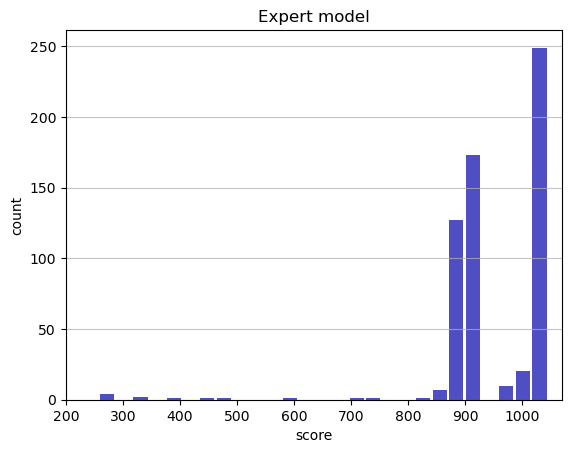

Track generation: 1147..1439 -> 292-tiles track
Epoch: 600
Expert	mean: 948.44	variance: 100.65



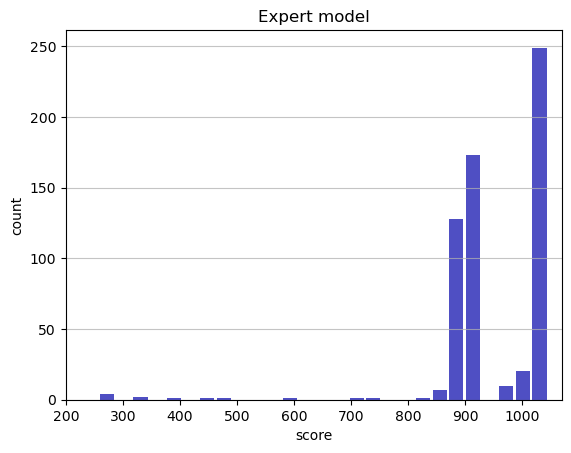

Track generation: 1199..1502 -> 303-tiles track
Epoch: 601
Expert	mean: 948.56	variance: 100.61



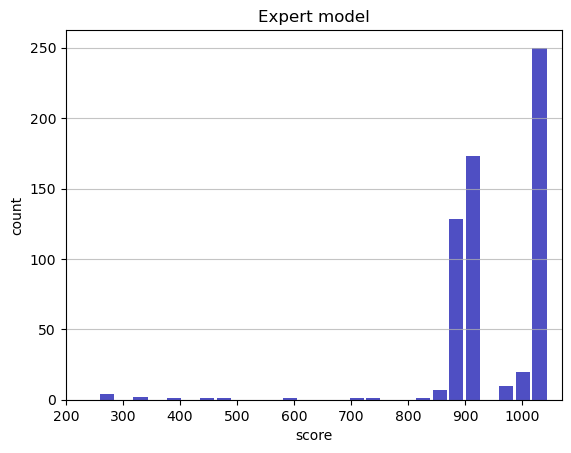

Track generation: 1126..1412 -> 286-tiles track
Epoch: 602
Expert	mean: 948.69	variance: 100.58



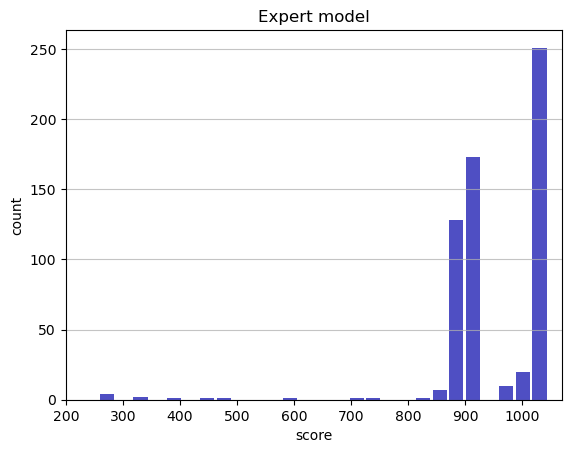

Track generation: 1031..1293 -> 262-tiles track
Epoch: 603
Expert	mean: 948.62	variance: 100.51



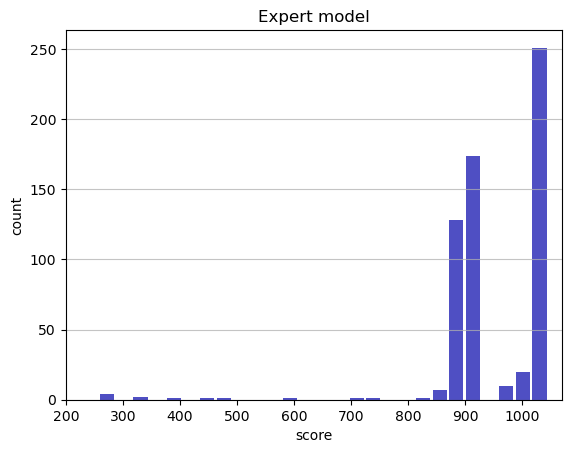

Track generation: 1087..1363 -> 276-tiles track
Epoch: 604
Expert	mean: 948.77	variance: 100.49



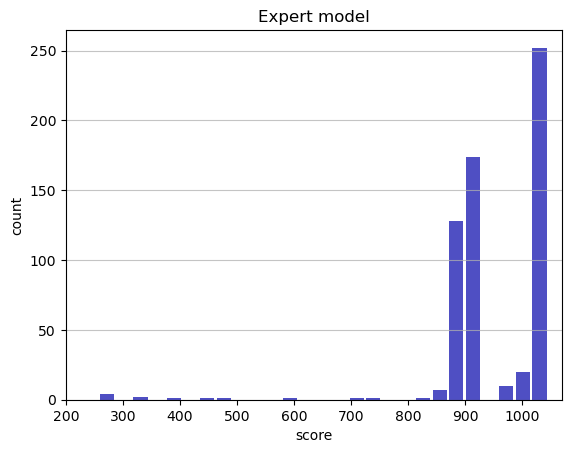

Track generation: 1162..1457 -> 295-tiles track
Epoch: 605
Expert	mean: 948.90	variance: 100.46



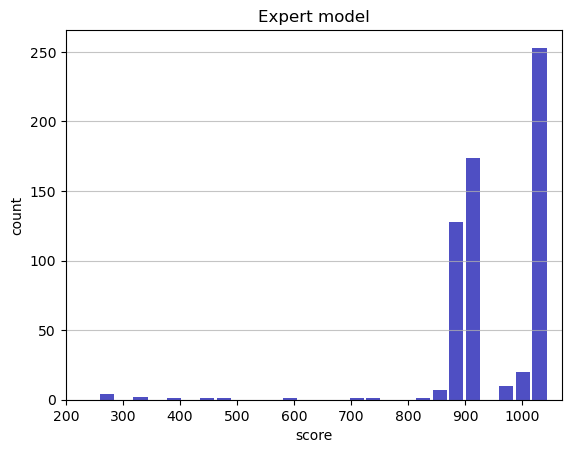

Track generation: 1145..1432 -> 287-tiles track
Epoch: 606
Expert	mean: 949.02	variance: 100.42



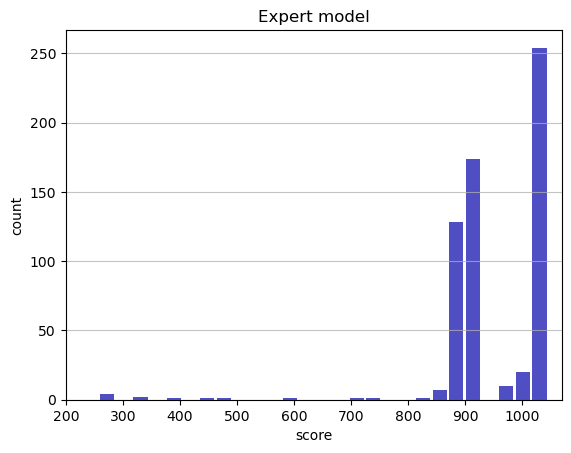

Track generation: 1115..1398 -> 283-tiles track
Epoch: 607
Expert	mean: 949.16	variance: 100.39



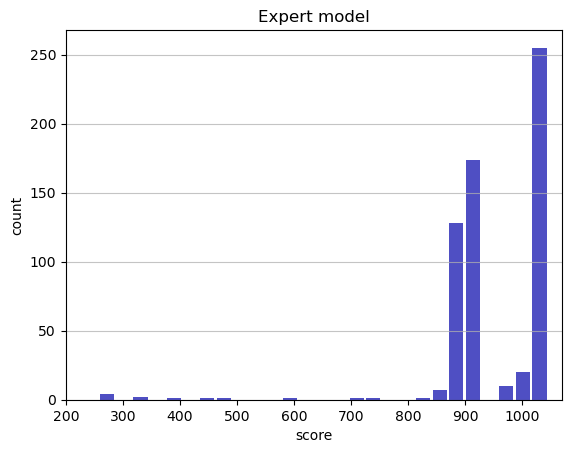

Track generation: 939..1183 -> 244-tiles track
Epoch: 608
Expert	mean: 949.31	variance: 100.38



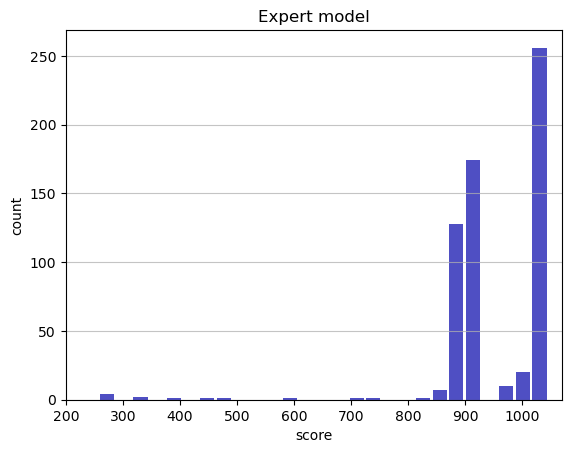

Track generation: 1228..1539 -> 311-tiles track
Epoch: 609
Expert	mean: 949.43	variance: 100.34



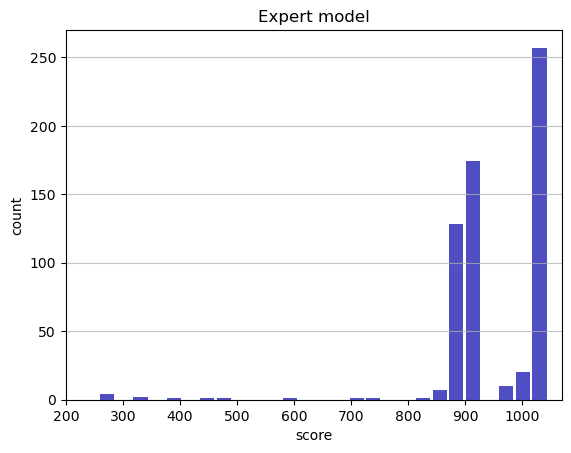

Track generation: 1076..1349 -> 273-tiles track
Epoch: 610
Expert	mean: 949.36	variance: 100.27



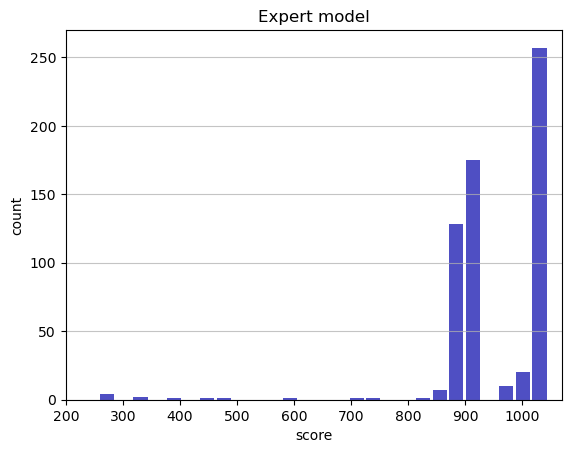

Track generation: 1119..1402 -> 283-tiles track
Epoch: 611
Expert	mean: 949.50	variance: 100.24



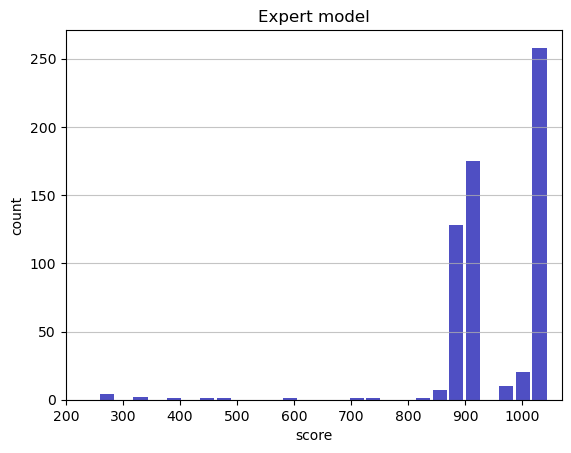

Track generation: 1124..1409 -> 285-tiles track
Epoch: 612
Expert	mean: 949.63	variance: 100.22



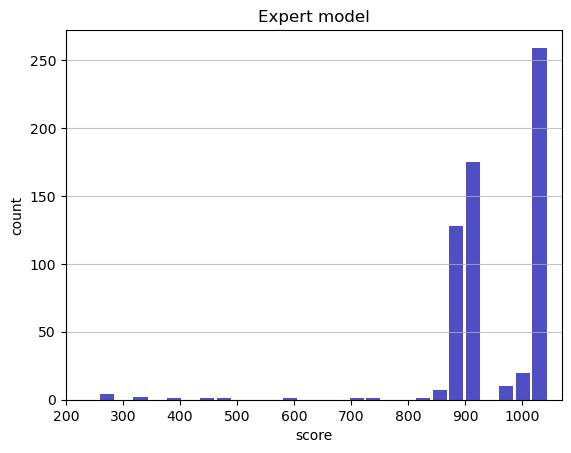

Track generation: 955..1205 -> 250-tiles track
Epoch: 613
Expert	mean: 949.78	variance: 100.20



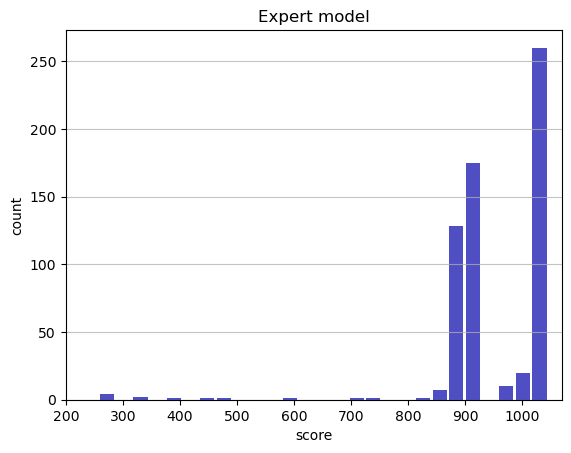

Track generation: 1285..1610 -> 325-tiles track
Epoch: 614
Expert	mean: 949.66	variance: 100.16



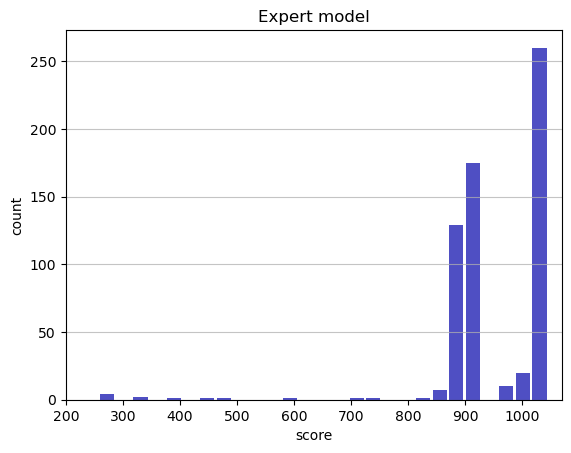

Track generation: 1241..1555 -> 314-tiles track
Epoch: 615
Expert	mean: 949.57	variance: 100.10



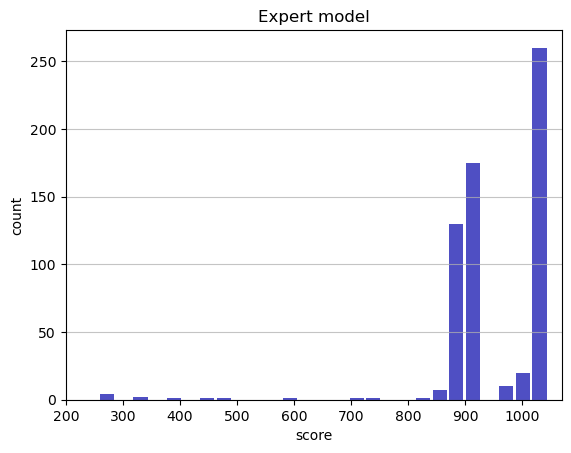

Track generation: 1180..1479 -> 299-tiles track
Epoch: 616
Expert	mean: 949.49	variance: 100.04



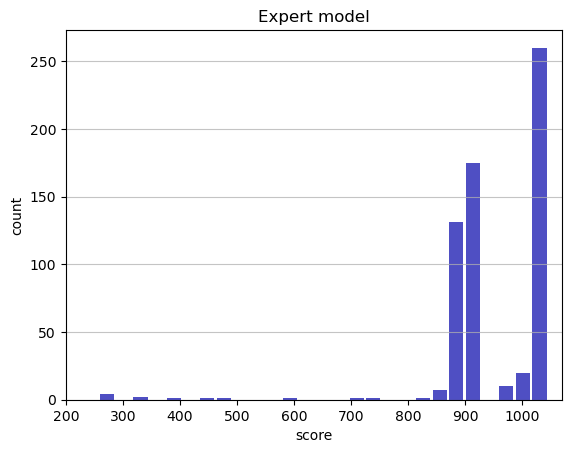

Track generation: 1132..1419 -> 287-tiles track
Epoch: 617
Expert	mean: 948.49	variance: 102.96



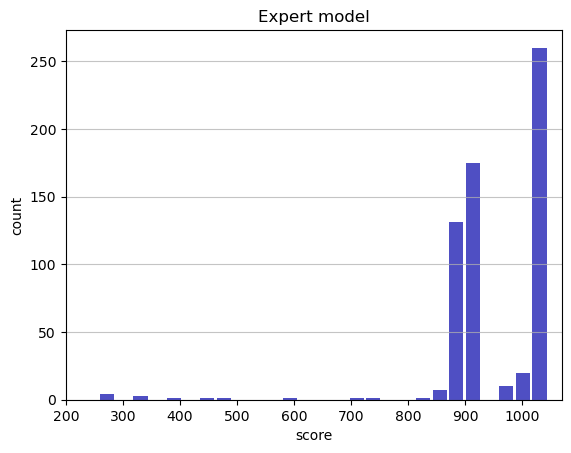

Track generation: 1142..1436 -> 294-tiles track
Epoch: 618
Expert	mean: 948.62	variance: 102.93



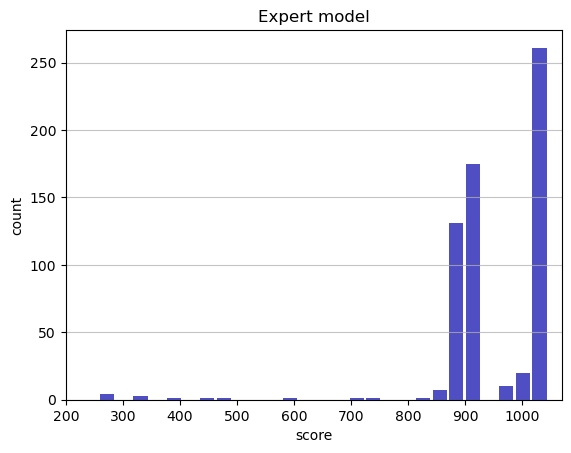

Track generation: 1136..1424 -> 288-tiles track
Epoch: 619
Expert	mean: 948.53	variance: 102.87



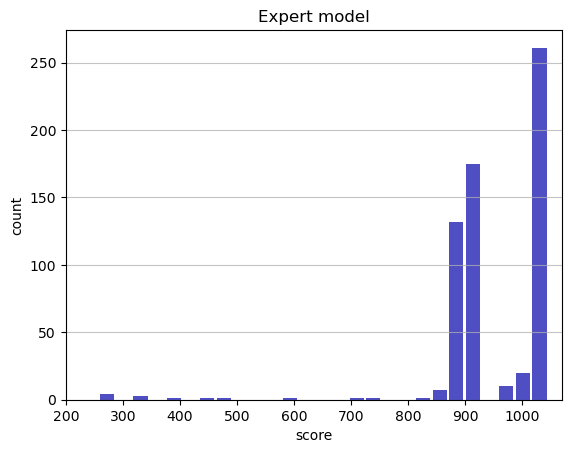

Track generation: 980..1231 -> 251-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1180..1479 -> 299-tiles track
Epoch: 620
Expert	mean: 948.45	variance: 102.80



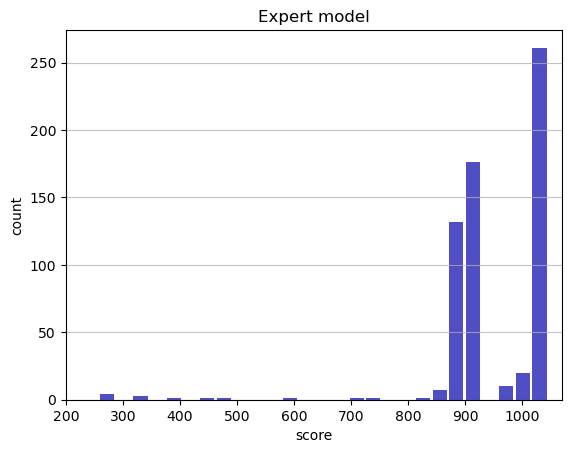

Track generation: 1275..1598 -> 323-tiles track
Epoch: 621
Expert	mean: 948.37	variance: 102.74



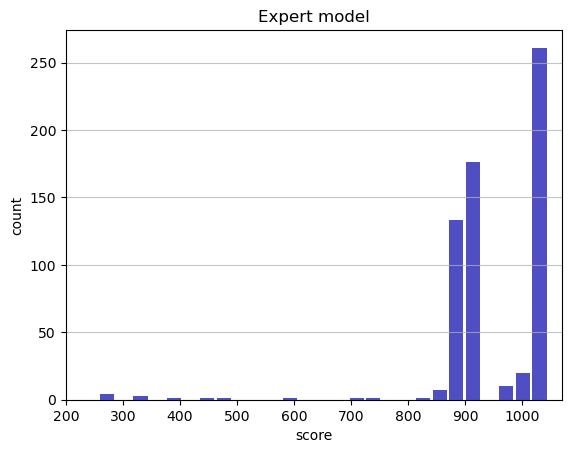

Track generation: 1071..1342 -> 271-tiles track
Epoch: 622
Expert	mean: 948.31	variance: 102.67



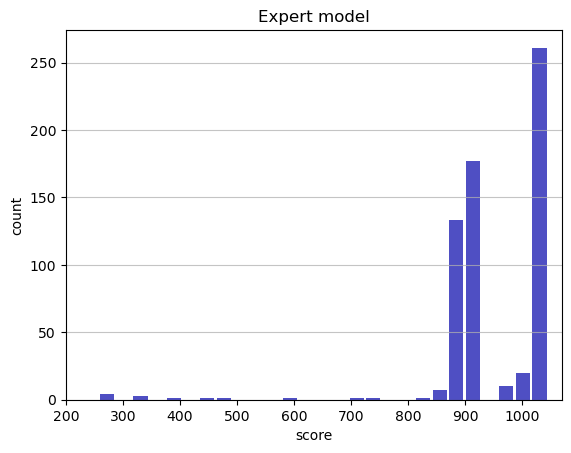

Track generation: 1144..1441 -> 297-tiles track
Epoch: 623
Expert	mean: 948.43	variance: 102.63



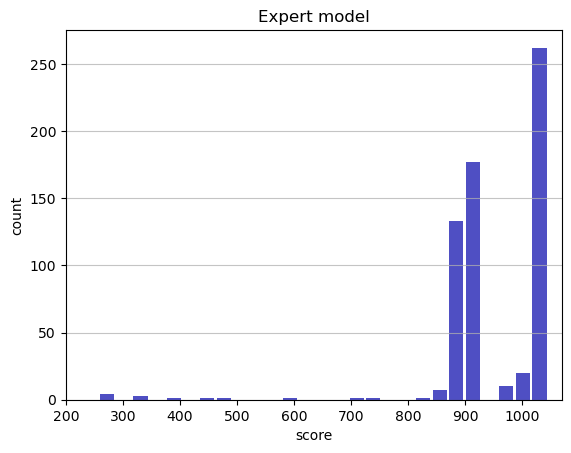

Track generation: 1336..1674 -> 338-tiles track
Epoch: 624
Expert	mean: 948.50	variance: 102.56



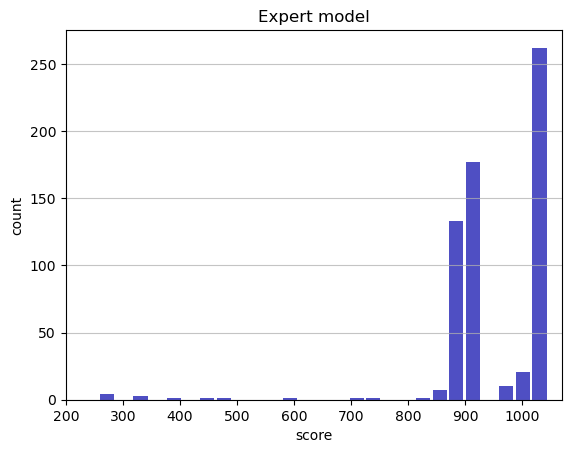

Track generation: 1200..1512 -> 312-tiles track
Epoch: 625
Expert	mean: 947.78	variance: 104.06



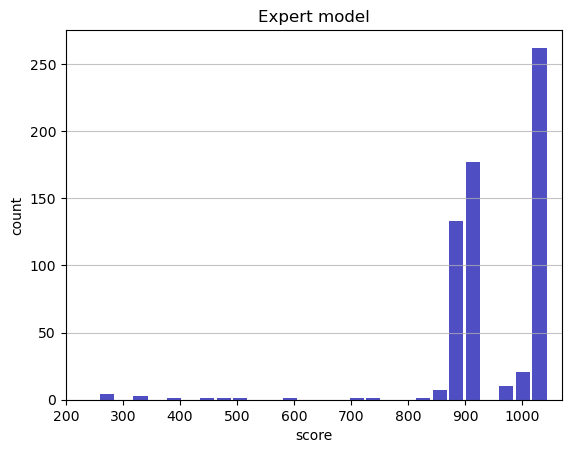

Track generation: 1220..1529 -> 309-tiles track
Epoch: 626
Expert	mean: 947.90	variance: 104.02



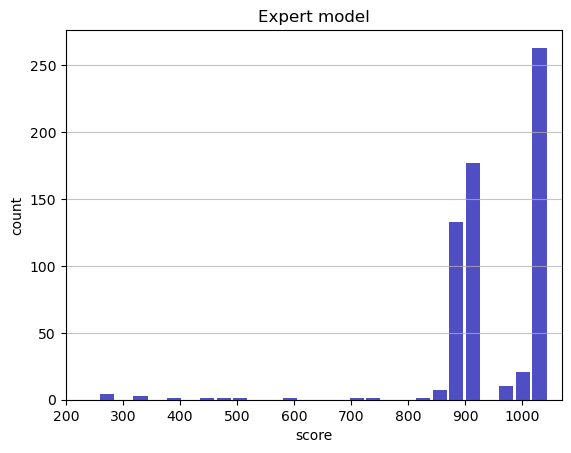

Track generation: 1047..1313 -> 266-tiles track
Epoch: 627
Expert	mean: 948.05	variance: 104.00



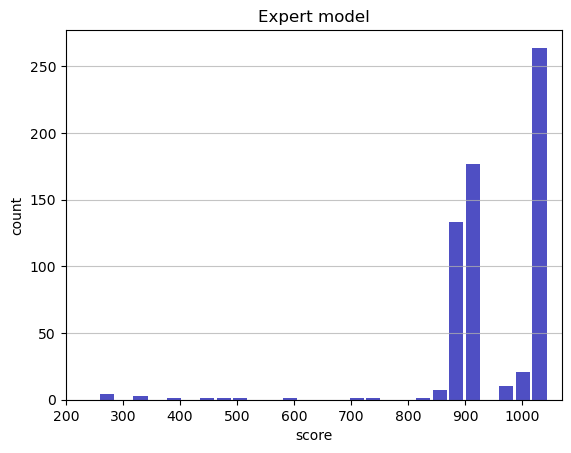

Track generation: 1009..1265 -> 256-tiles track
Epoch: 628
Expert	mean: 947.98	variance: 103.93



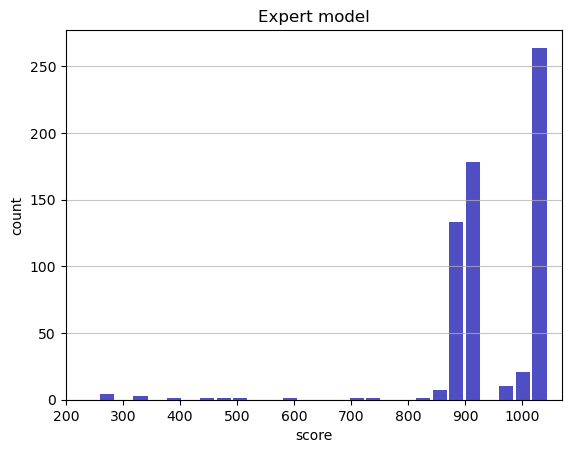

Track generation: 1096..1374 -> 278-tiles track
Epoch: 629
Expert	mean: 947.89	variance: 103.87



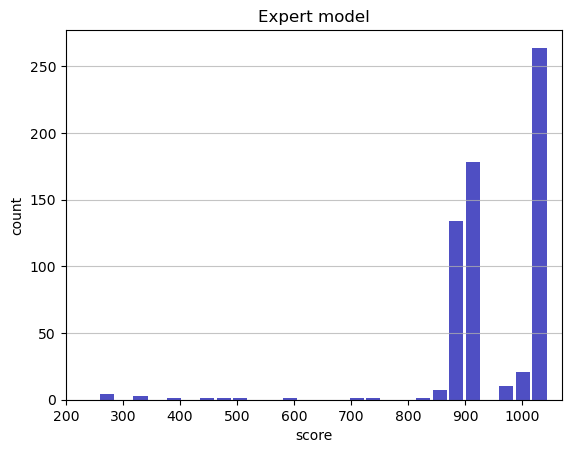

Track generation: 1250..1566 -> 316-tiles track
Epoch: 630
Expert	mean: 947.83	variance: 103.80



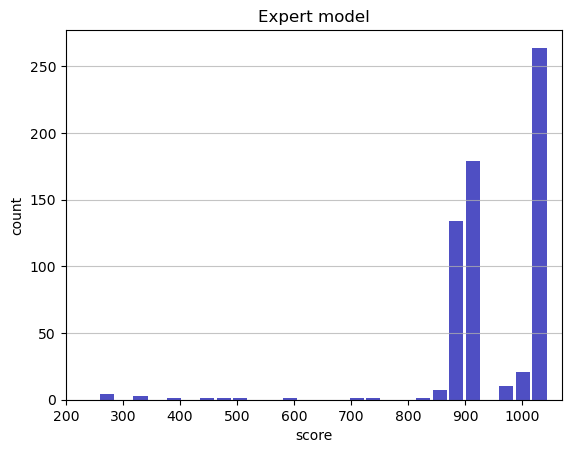

Track generation: 1191..1492 -> 301-tiles track
Epoch: 631
Expert	mean: 947.94	variance: 103.76



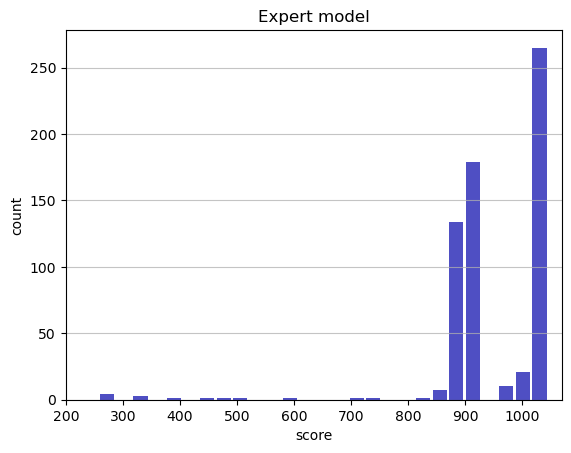

Track generation: 1122..1407 -> 285-tiles track
Epoch: 632
Expert	mean: 948.07	variance: 103.73



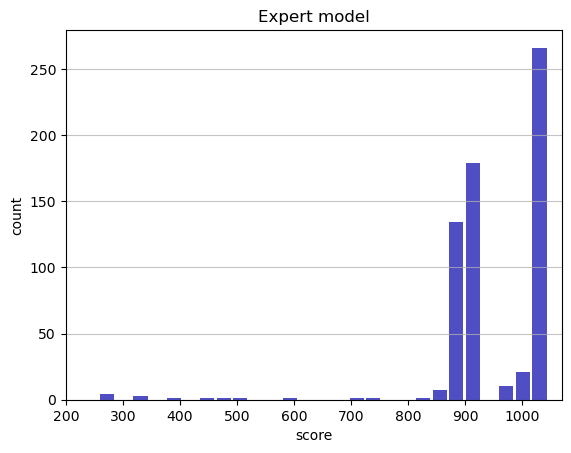

Track generation: 1141..1431 -> 290-tiles track
Epoch: 633
Expert	mean: 948.20	variance: 103.69



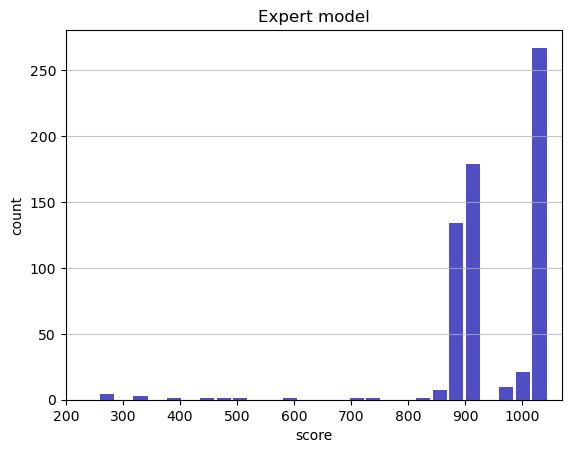

Track generation: 1204..1509 -> 305-tiles track
Epoch: 634
Expert	mean: 948.12	variance: 103.63



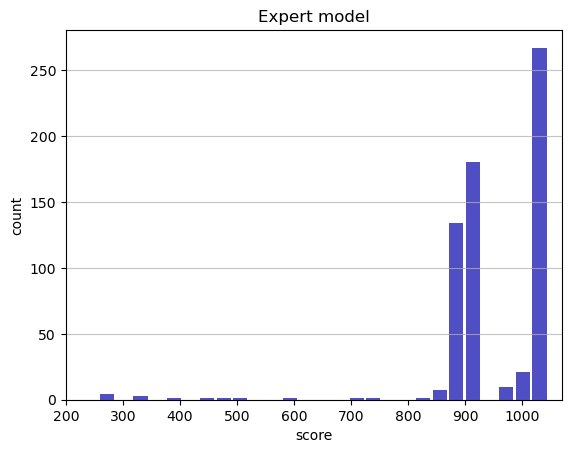

Track generation: 1094..1371 -> 277-tiles track
Epoch: 635
Expert	mean: 948.03	variance: 103.57



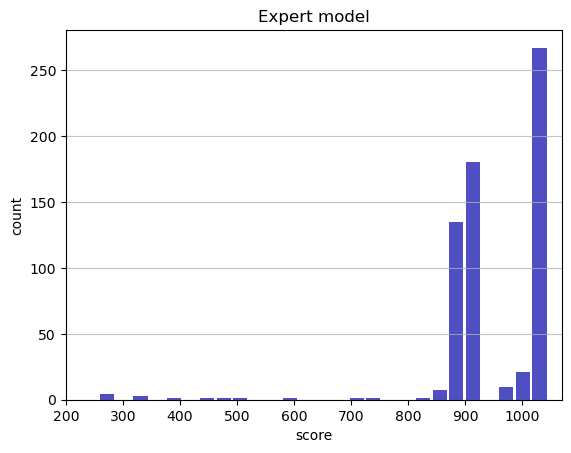

Track generation: 1134..1422 -> 288-tiles track
Epoch: 636
Expert	mean: 947.93	variance: 103.53



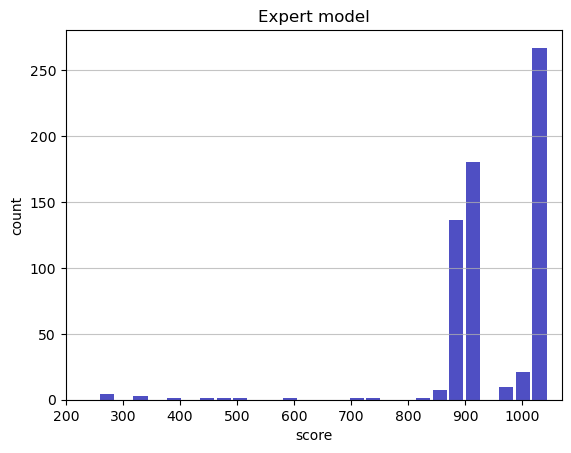

Track generation: 1219..1536 -> 317-tiles track
Epoch: 637
Expert	mean: 948.03	variance: 103.48



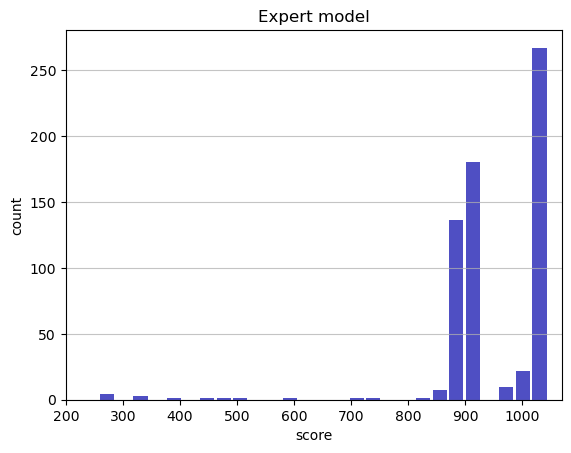

Track generation: 1052..1319 -> 267-tiles track
Epoch: 638
Expert	mean: 948.17	variance: 103.46



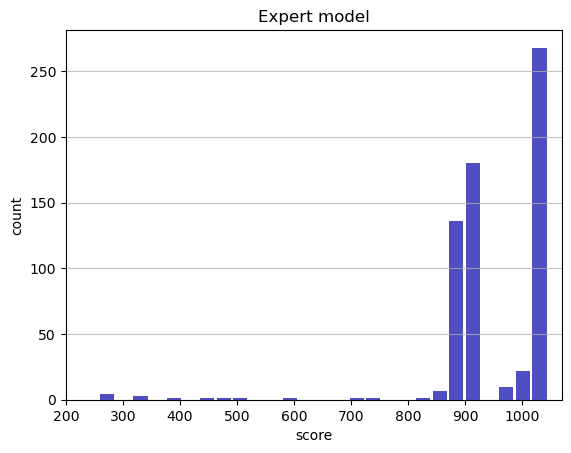

Track generation: 1050..1321 -> 271-tiles track
Epoch: 639
Expert	mean: 948.30	variance: 103.43



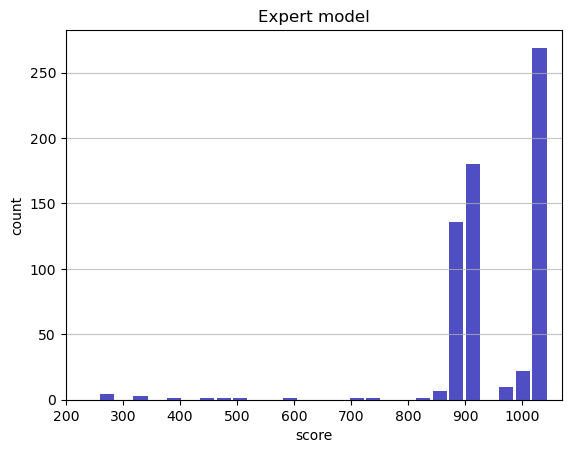

Track generation: 1065..1338 -> 273-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1070..1347 -> 277-tiles track
Epoch: 640
Expert	mean: 948.42	variance: 103.40



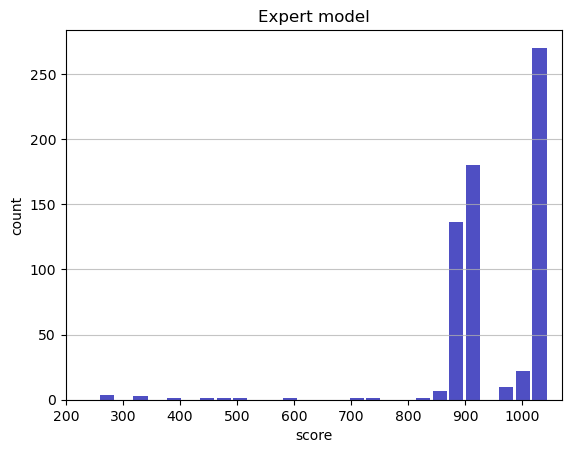

Track generation: 1207..1513 -> 306-tiles track
Epoch: 641
Expert	mean: 948.35	variance: 103.33



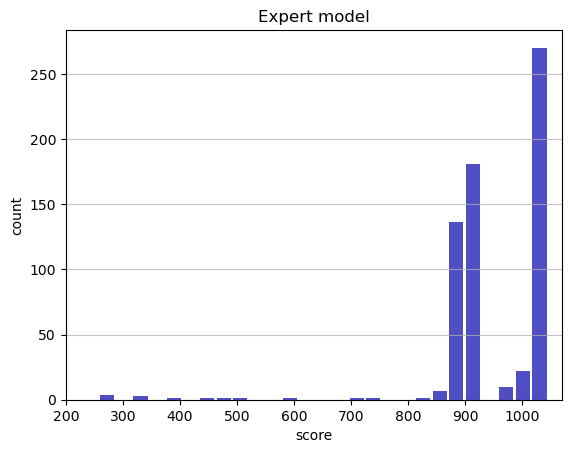

Track generation: 1086..1371 -> 285-tiles track
Epoch: 642
Expert	mean: 948.48	variance: 103.30



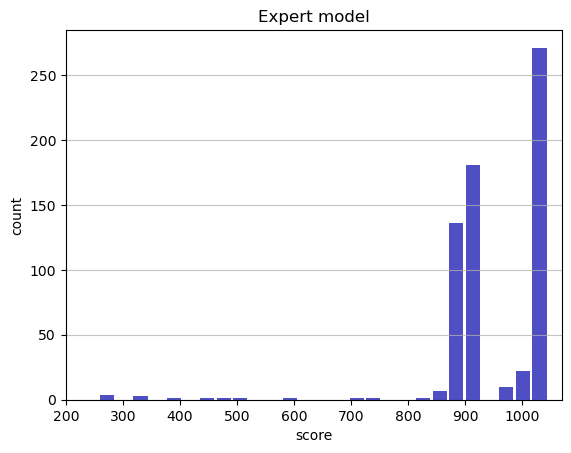

Track generation: 1219..1528 -> 309-tiles track
Epoch: 643
Expert	mean: 948.37	variance: 103.26



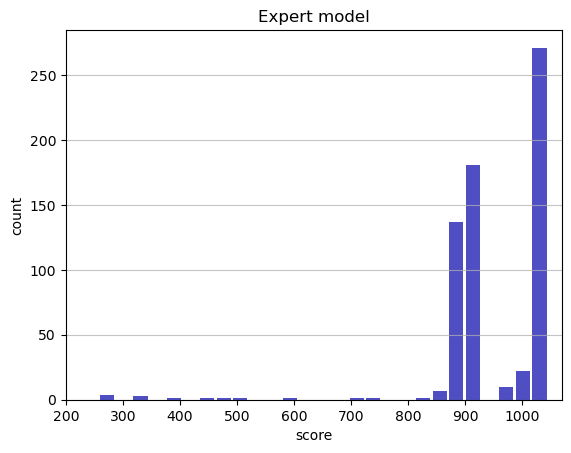

Track generation: 1213..1521 -> 308-tiles track
Epoch: 644
Expert	mean: 948.29	variance: 103.20



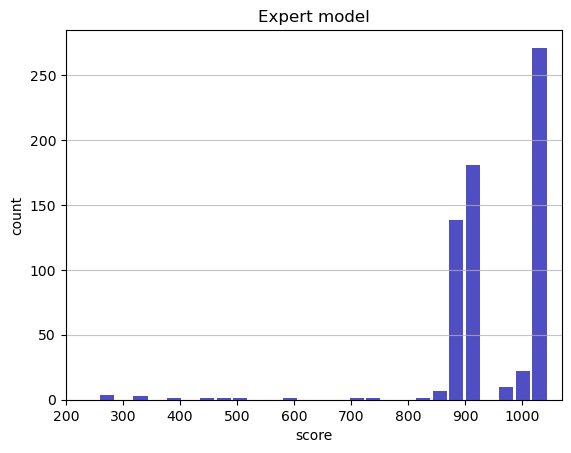

Track generation: 1069..1340 -> 271-tiles track
Epoch: 645
Expert	mean: 948.41	variance: 103.16



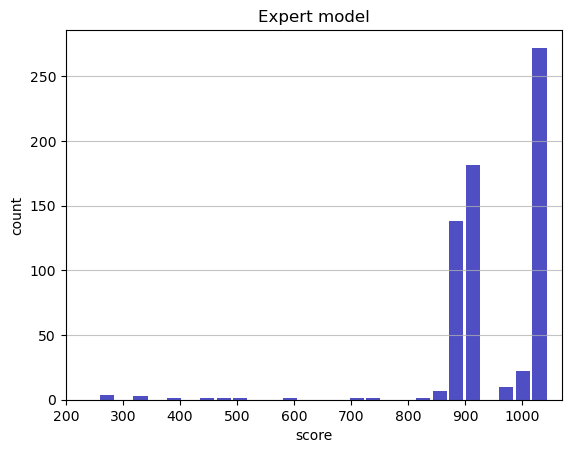

Track generation: 1288..1614 -> 326-tiles track
Epoch: 646
Expert	mean: 948.51	variance: 103.12



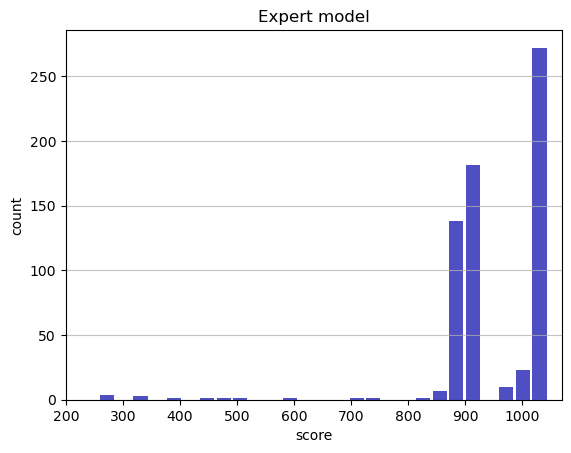

Track generation: 1135..1423 -> 288-tiles track
Epoch: 647
Expert	mean: 948.64	variance: 103.08



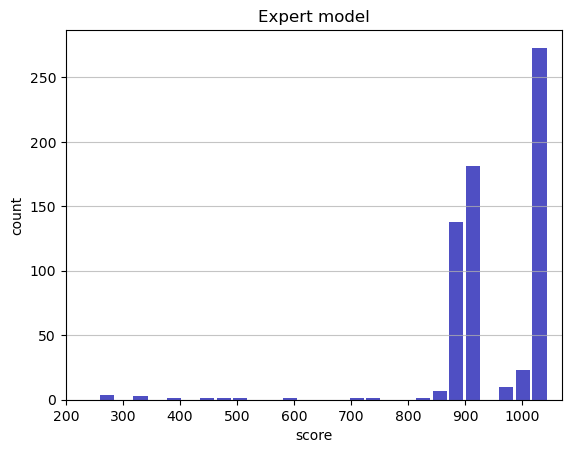

Track generation: 1087..1363 -> 276-tiles track
Epoch: 648
Expert	mean: 948.57	variance: 103.02



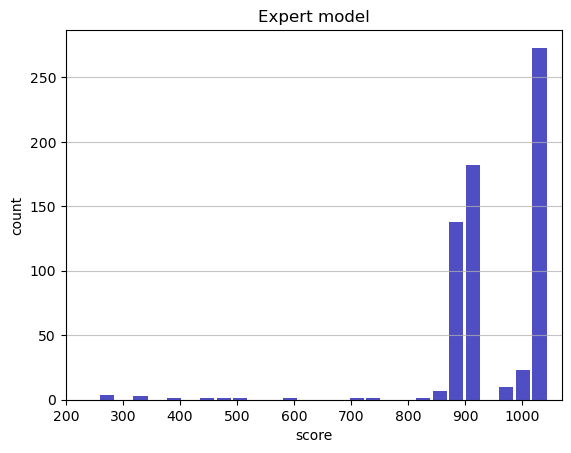

Track generation: 1151..1443 -> 292-tiles track
Epoch: 649
Expert	mean: 948.70	variance: 102.98



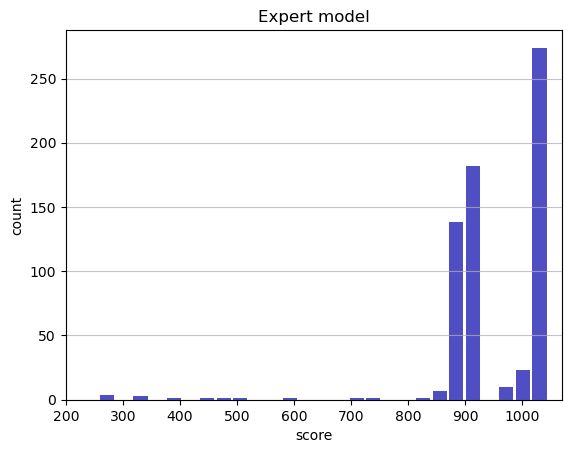

Track generation: 1055..1323 -> 268-tiles track
Epoch: 650
Expert	mean: 948.84	variance: 102.97



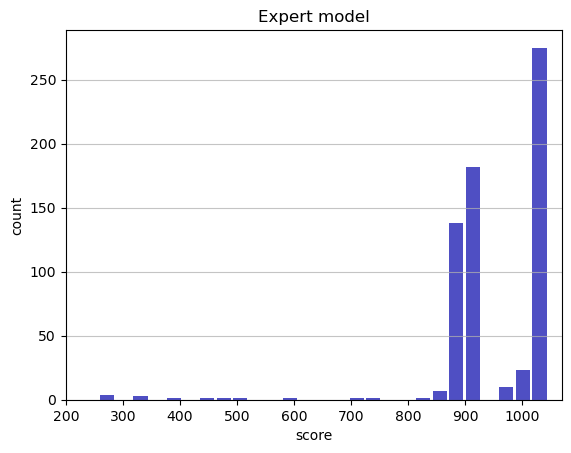

Track generation: 1148..1439 -> 291-tiles track
Epoch: 651
Expert	mean: 948.95	variance: 102.93



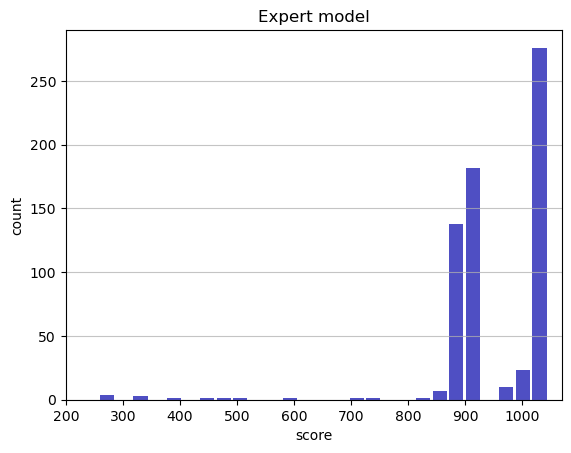

Track generation: 1077..1350 -> 273-tiles track
Epoch: 652
Expert	mean: 949.09	variance: 102.91



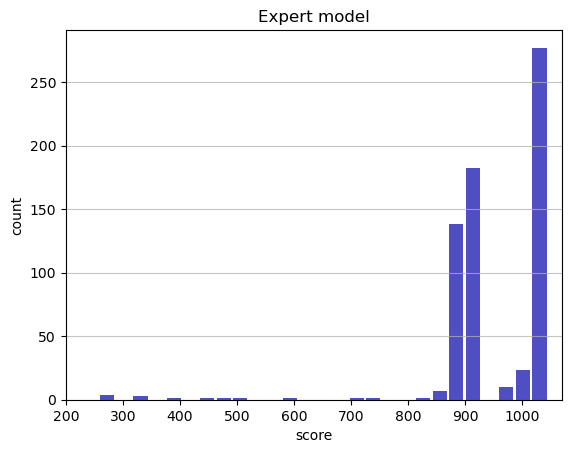

Track generation: 1078..1356 -> 278-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 987..1244 -> 257-tiles track
Epoch: 653
Expert	mean: 949.22	variance: 102.89



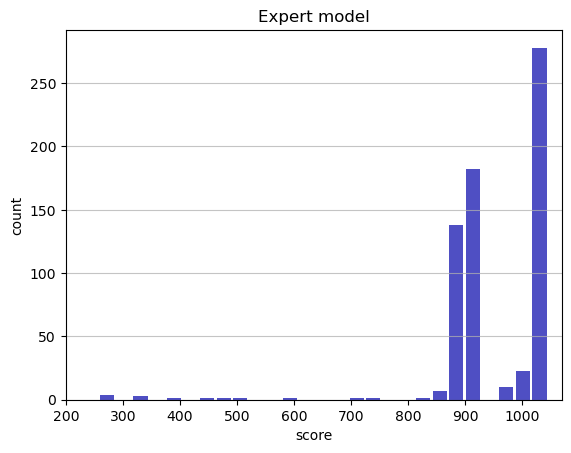

Track generation: 1171..1468 -> 297-tiles track
Epoch: 654
Expert	mean: 949.15	variance: 102.83



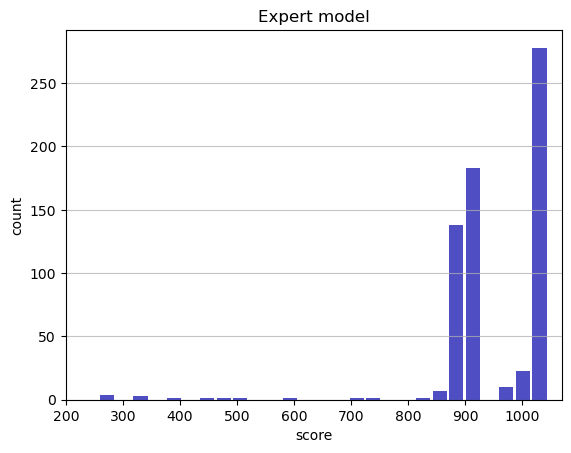

Track generation: 1107..1389 -> 282-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1148..1439 -> 291-tiles track
Epoch: 655
Expert	mean: 949.07	variance: 102.77



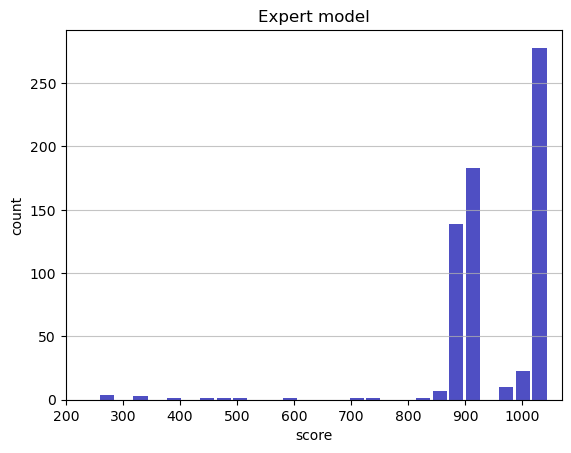

Track generation: 1083..1365 -> 282-tiles track
Epoch: 656
Expert	mean: 948.27	variance: 104.72



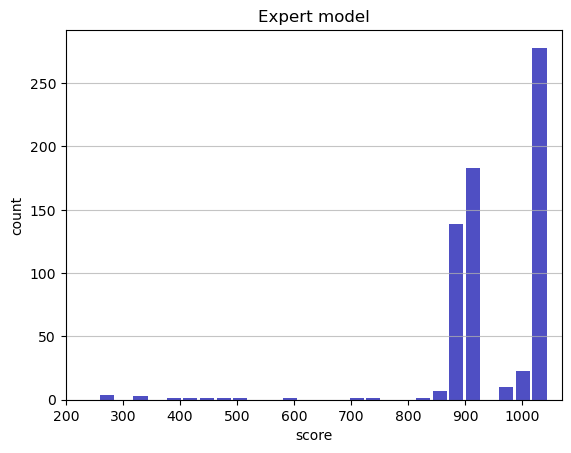

Track generation: 1168..1464 -> 296-tiles track
Epoch: 657
Expert	mean: 948.20	variance: 104.65



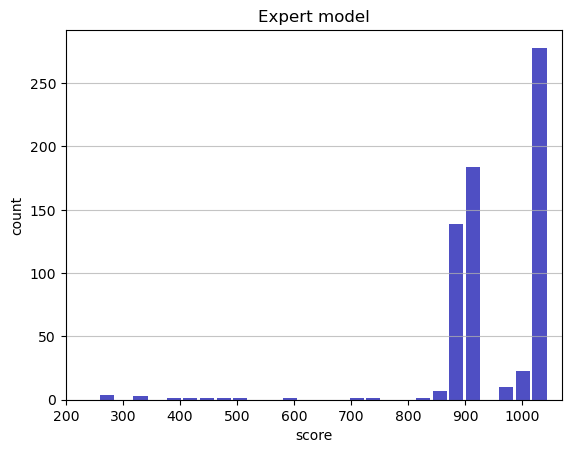

Track generation: 994..1251 -> 257-tiles track
Epoch: 658
Expert	mean: 948.34	variance: 104.63



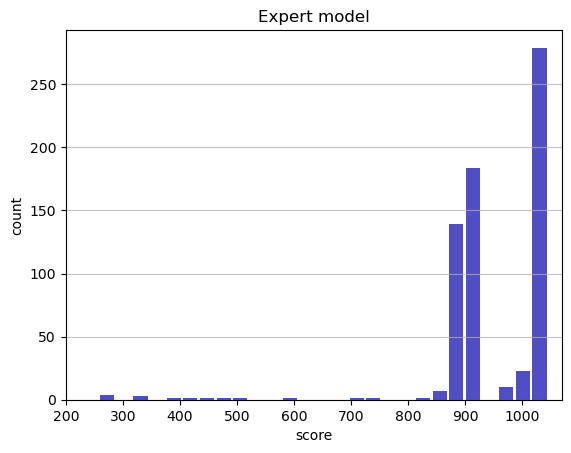

Track generation: 1056..1324 -> 268-tiles track
Epoch: 659
Expert	mean: 948.28	variance: 104.56



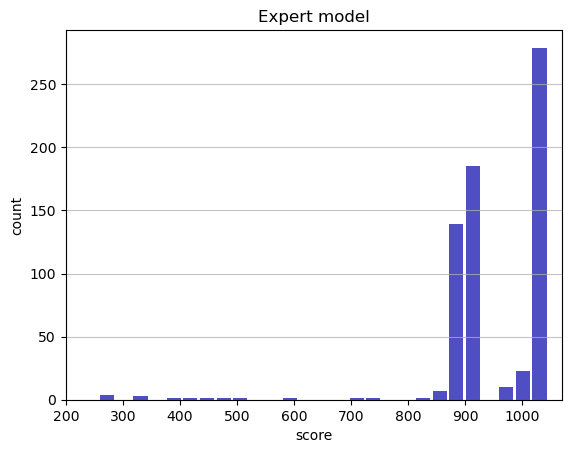

Track generation: 1140..1429 -> 289-tiles track
Epoch: 660
Expert	mean: 948.23	variance: 104.49



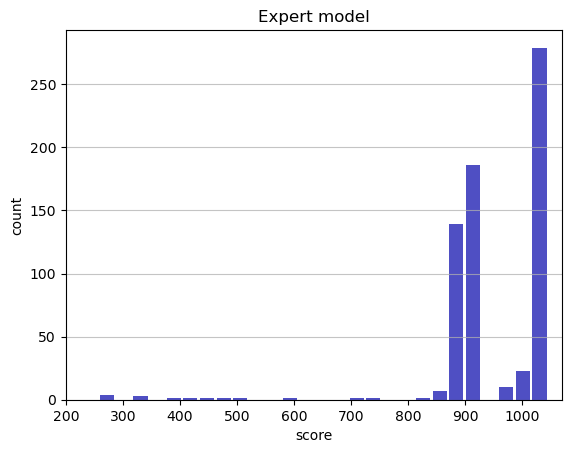

Track generation: 1173..1470 -> 297-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1176..1474 -> 298-tiles track
Epoch: 661
Expert	mean: 948.16	variance: 104.42



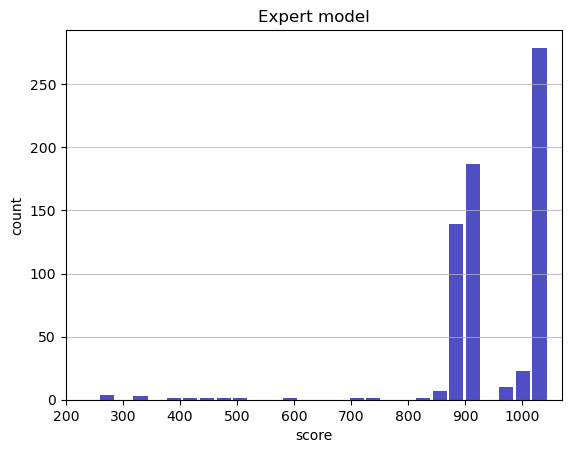

Track generation: 1164..1459 -> 295-tiles track
Epoch: 662
Expert	mean: 948.28	variance: 104.39



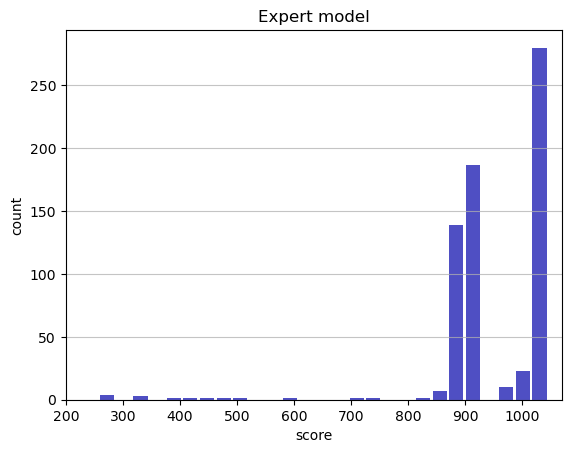

Track generation: 1236..1549 -> 313-tiles track
Epoch: 663
Expert	mean: 948.39	variance: 104.35



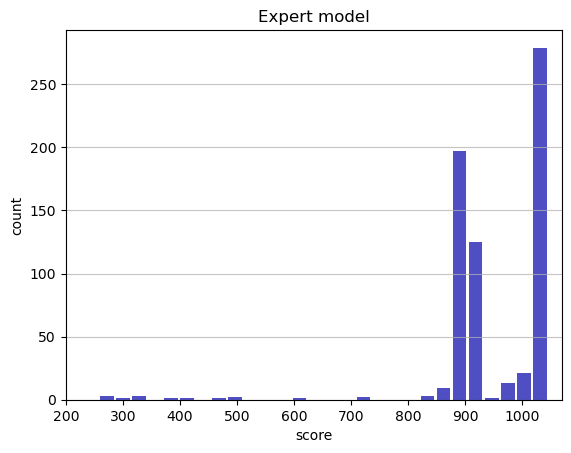

Track generation: 1058..1326 -> 268-tiles track
Epoch: 664
Expert	mean: 948.51	variance: 104.32



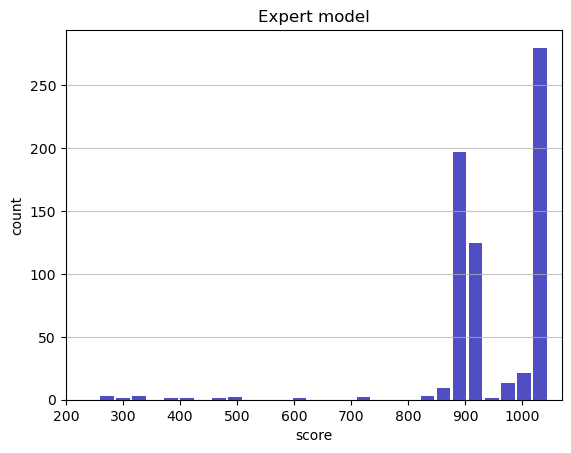

Track generation: 1176..1474 -> 298-tiles track
Epoch: 665
Expert	mean: 948.44	variance: 104.26



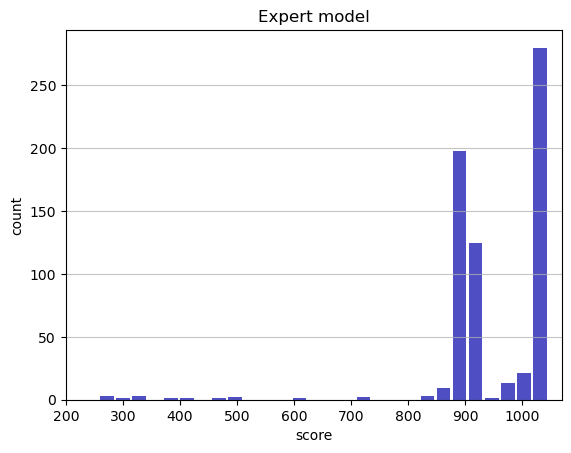

Track generation: 1101..1382 -> 281-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1083..1358 -> 275-tiles track
Epoch: 666
Expert	mean: 948.57	variance: 104.24



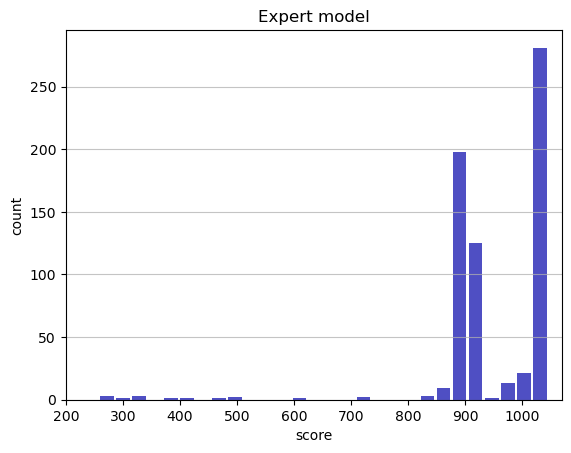

Track generation: 1229..1540 -> 311-tiles track
Epoch: 667
Expert	mean: 948.68	variance: 104.20



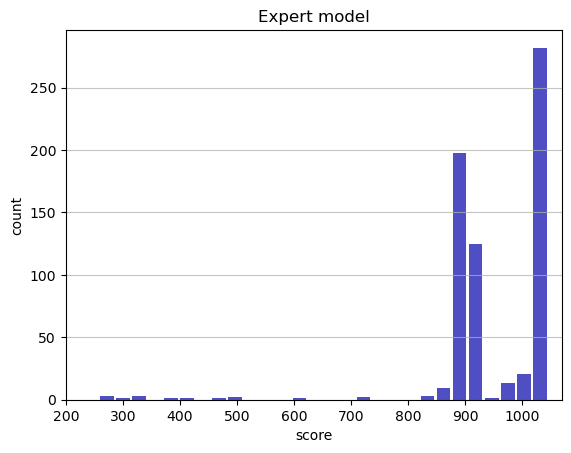

Track generation: 1099..1378 -> 279-tiles track
Epoch: 668
Expert	mean: 948.80	variance: 104.17



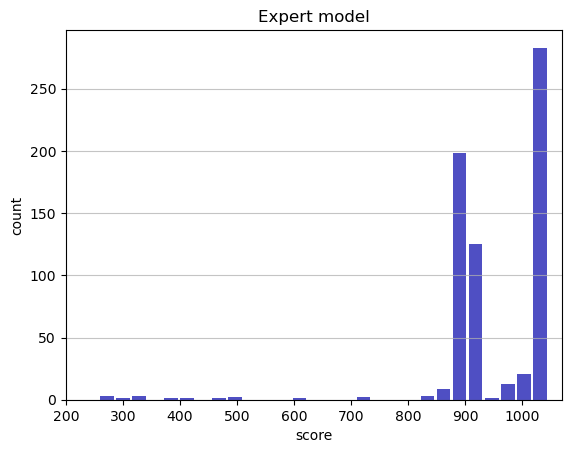

Track generation: 1023..1289 -> 266-tiles track
Epoch: 669
Expert	mean: 948.93	variance: 104.14



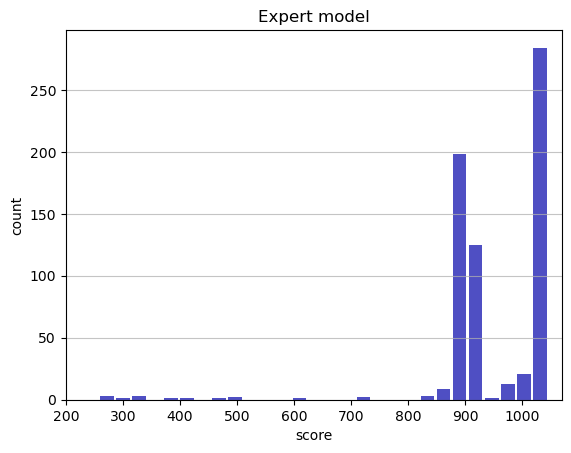

Track generation: 1216..1524 -> 308-tiles track
Epoch: 670
Expert	mean: 949.04	variance: 104.10



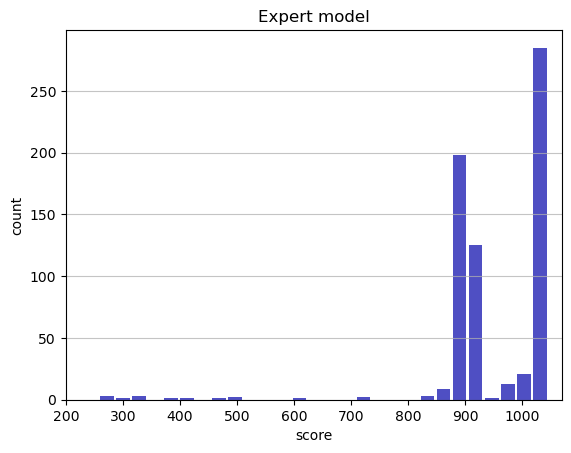

Track generation: 1095..1373 -> 278-tiles track
Epoch: 671
Expert	mean: 948.96	variance: 104.05



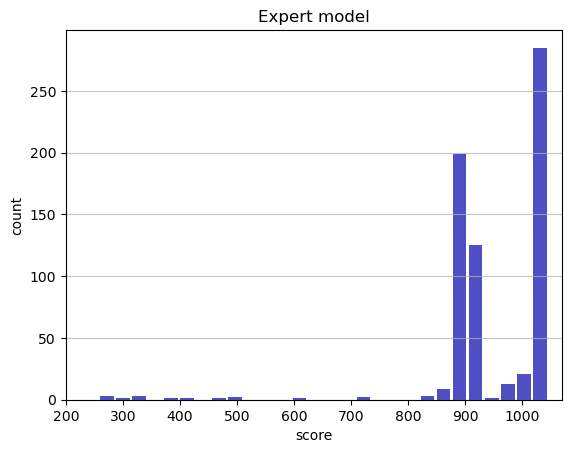

Track generation: 1219..1528 -> 309-tiles track
Epoch: 672
Expert	mean: 949.07	variance: 104.01



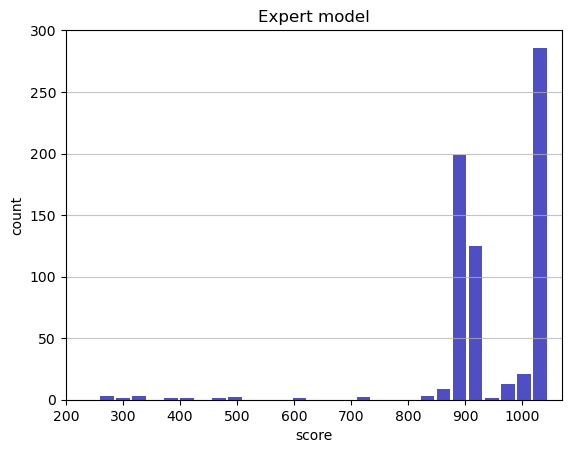

Track generation: 1033..1295 -> 262-tiles track
Epoch: 673
Expert	mean: 949.03	variance: 103.94



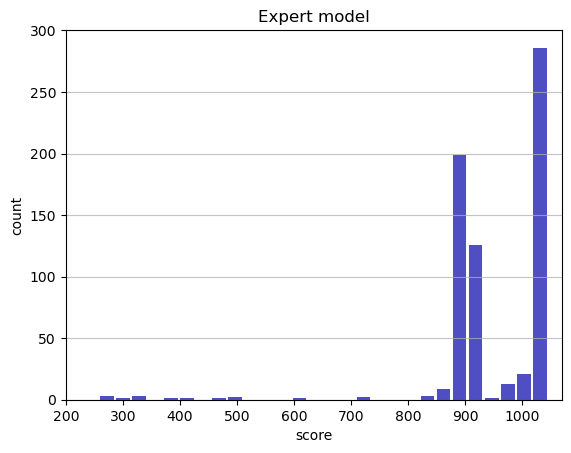

Track generation: 1057..1333 -> 276-tiles track
Epoch: 674
Expert	mean: 949.15	variance: 103.90



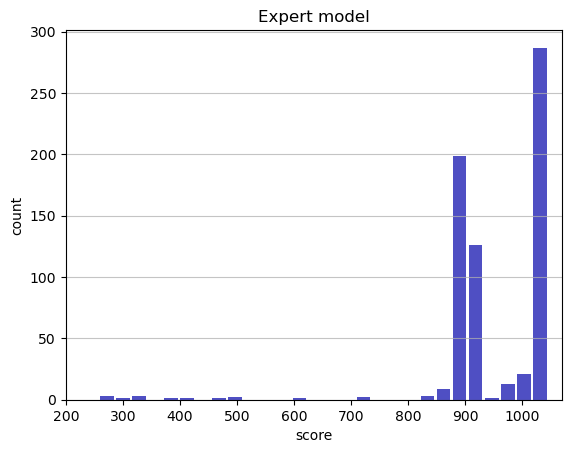

Track generation: 1112..1394 -> 282-tiles track
Epoch: 675
Expert	mean: 949.09	variance: 103.84



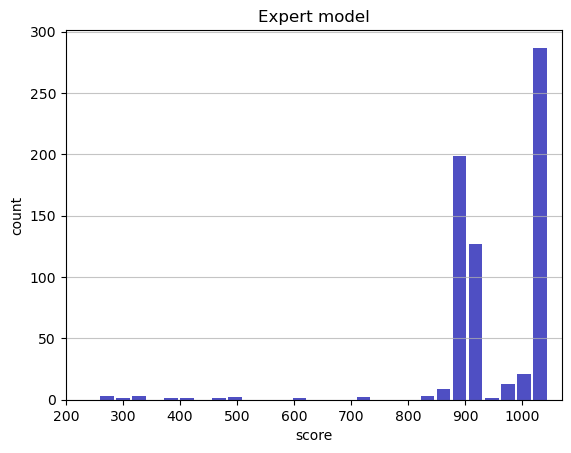

Track generation: 1403..1758 -> 355-tiles track
Epoch: 676
Expert	mean: 949.14	variance: 103.77



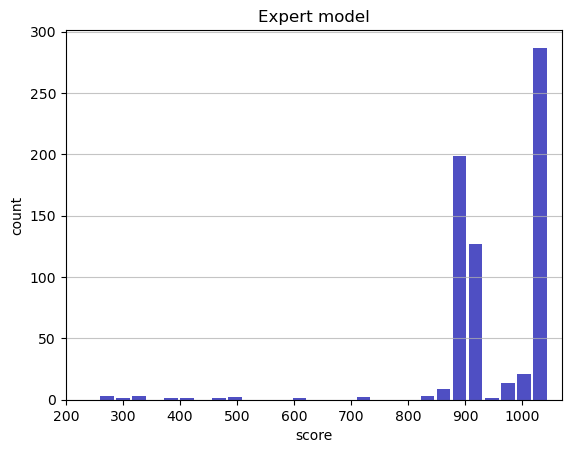

Track generation: 998..1258 -> 260-tiles track
Epoch: 677
Expert	mean: 949.27	variance: 103.75



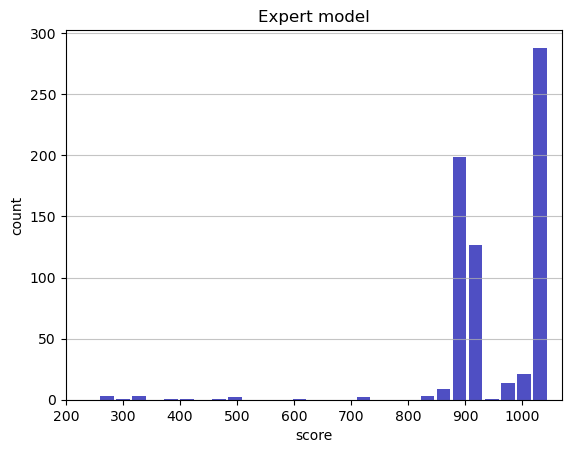

Track generation: 1220..1529 -> 309-tiles track
Epoch: 678
Expert	mean: 949.20	variance: 103.68



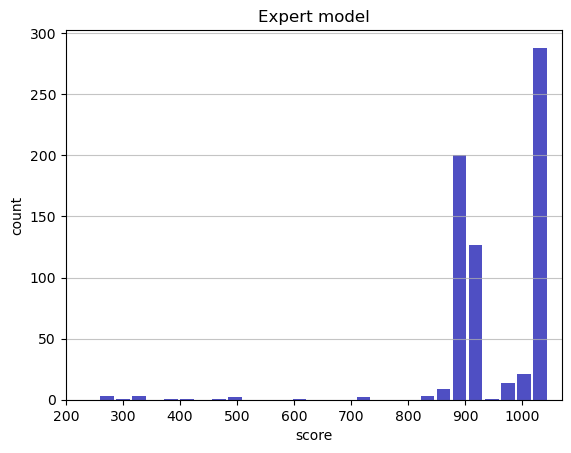

Track generation: 1151..1446 -> 295-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1042..1309 -> 267-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1296..1624 -> 328-tiles track
Epoch: 679
Expert	mean: 949.30	variance: 103.64



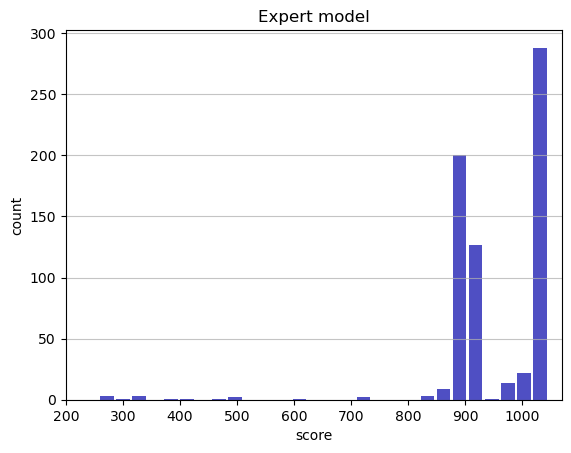

Track generation: 1010..1275 -> 265-tiles track
Epoch: 680
Expert	mean: 949.22	variance: 103.58



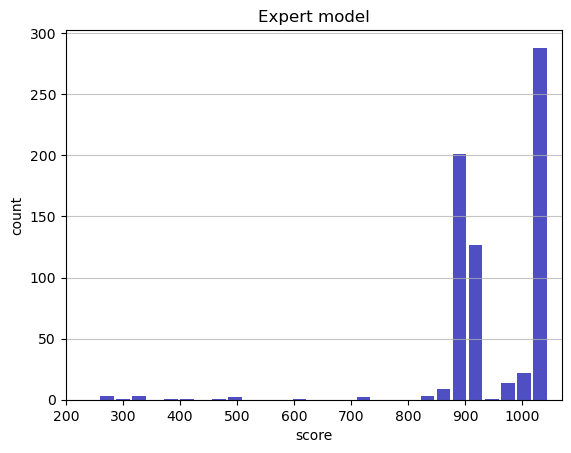

Track generation: 1219..1528 -> 309-tiles track
Epoch: 681
Expert	mean: 949.16	variance: 103.52



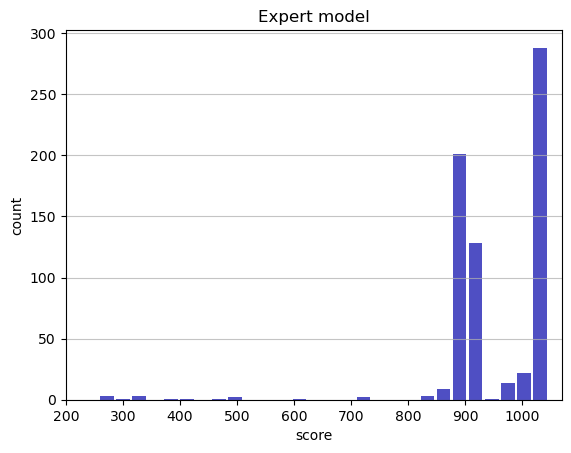

Track generation: 1231..1543 -> 312-tiles track
Epoch: 682
Expert	mean: 949.25	variance: 103.47



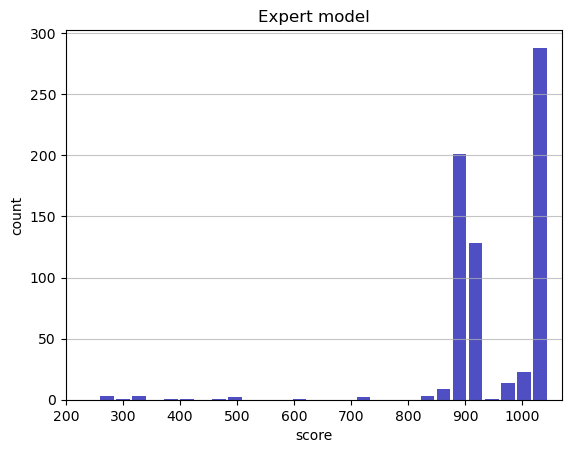

Track generation: 1068..1339 -> 271-tiles track
Epoch: 683
Expert	mean: 949.20	variance: 103.41



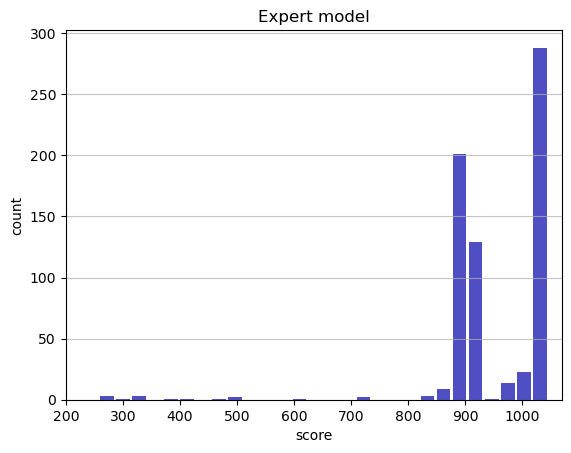

Track generation: 1095..1373 -> 278-tiles track
Epoch: 684
Expert	mean: 949.32	variance: 103.38



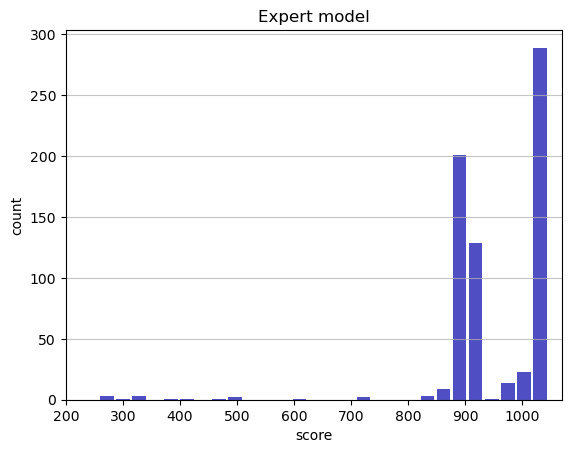

Track generation: 1357..1701 -> 344-tiles track
Epoch: 685
Expert	mean: 949.39	variance: 103.32



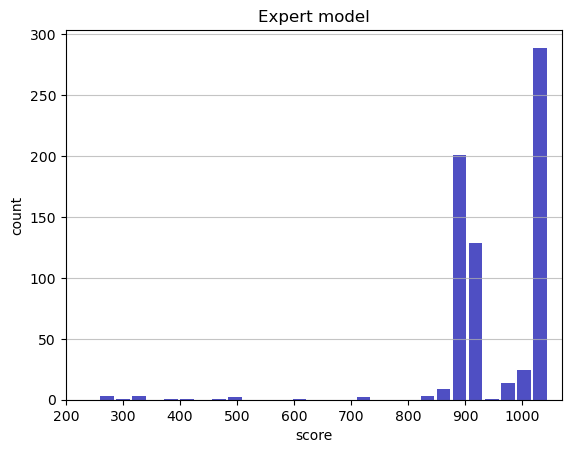

Track generation: 1195..1506 -> 311-tiles track
Epoch: 686
Expert	mean: 949.30	variance: 103.27



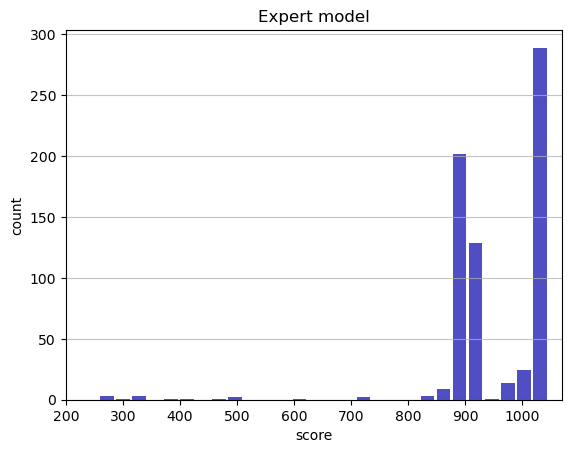

Track generation: 1145..1435 -> 290-tiles track
Epoch: 687
Expert	mean: 949.41	variance: 103.24



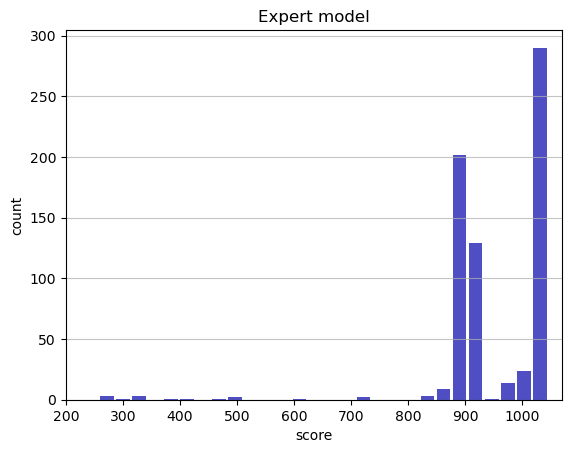

Track generation: 1160..1464 -> 304-tiles track
Epoch: 688
Expert	mean: 948.96	variance: 103.84



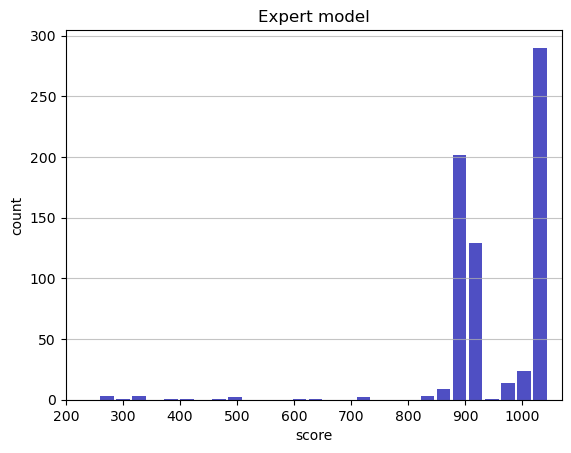

Track generation: 1203..1508 -> 305-tiles track
Epoch: 689
Expert	mean: 949.07	variance: 103.81



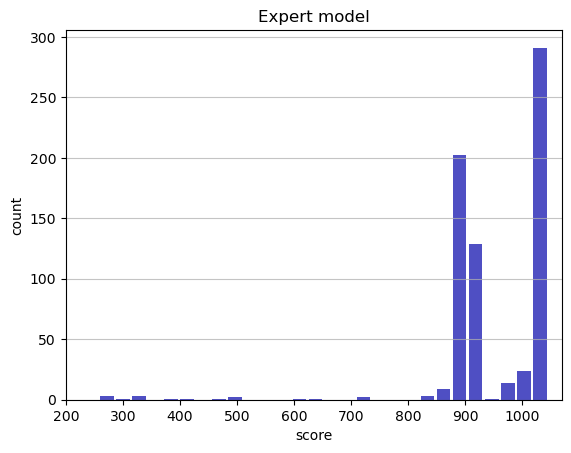

Track generation: 1077..1349 -> 272-tiles track
Epoch: 690
Expert	mean: 949.01	variance: 103.75



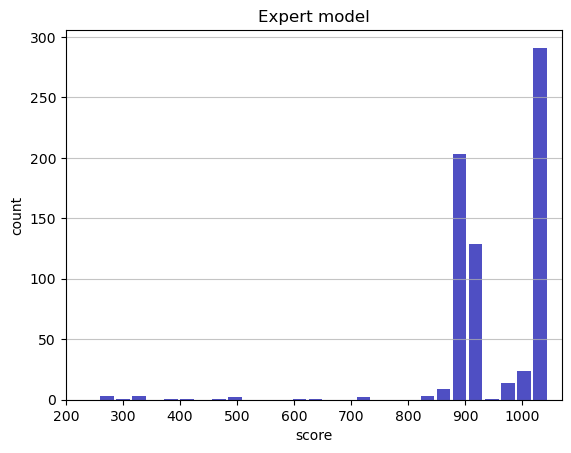

Track generation: 1111..1393 -> 282-tiles track
Epoch: 691
Expert	mean: 949.12	variance: 103.72



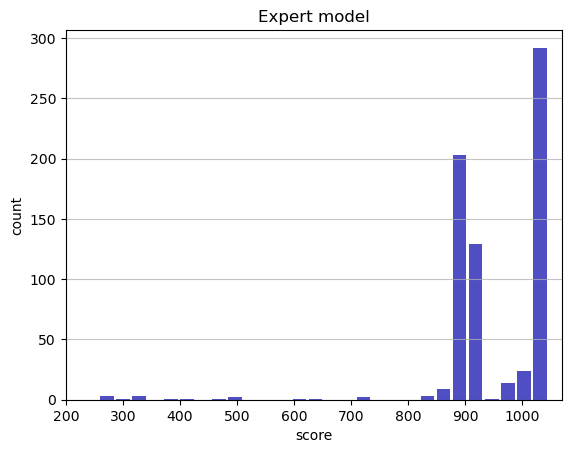

Track generation: 1016..1274 -> 258-tiles track
Epoch: 692
Expert	mean: 949.07	variance: 103.66



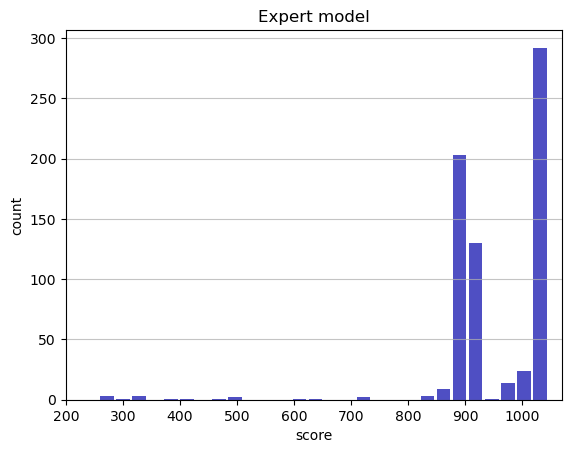

Track generation: 1324..1659 -> 335-tiles track
Epoch: 693
Expert	mean: 948.54	variance: 104.50



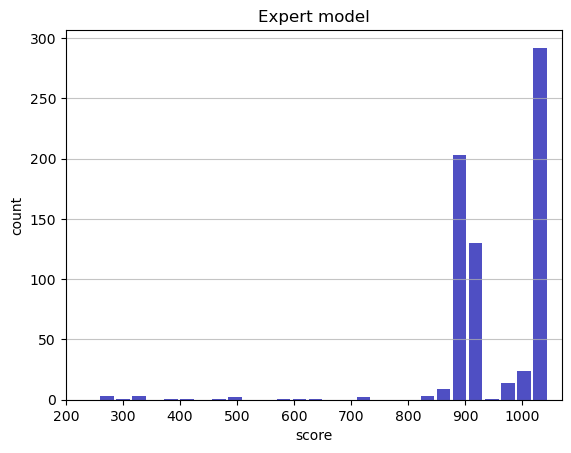

Track generation: 959..1203 -> 244-tiles track
Epoch: 694
Expert	mean: 948.50	variance: 104.43



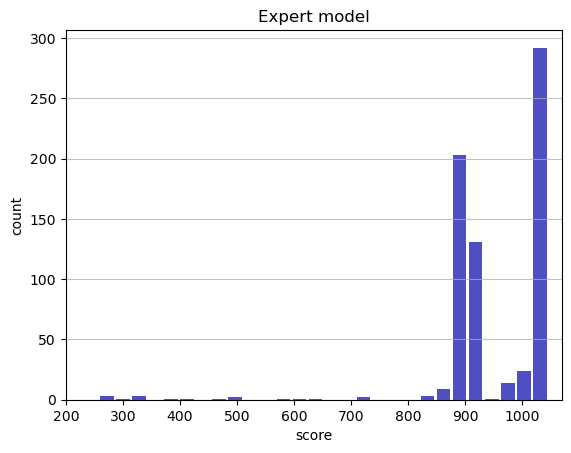

Track generation: 1099..1377 -> 278-tiles track
Epoch: 695
Expert	mean: 948.45	variance: 104.36



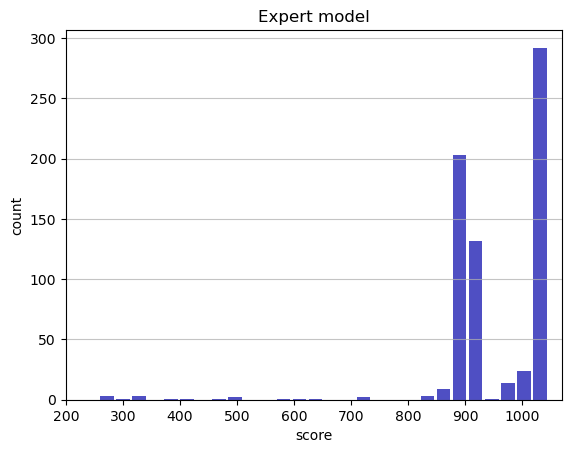

Track generation: 1212..1519 -> 307-tiles track
Epoch: 696
Expert	mean: 948.40	variance: 104.30



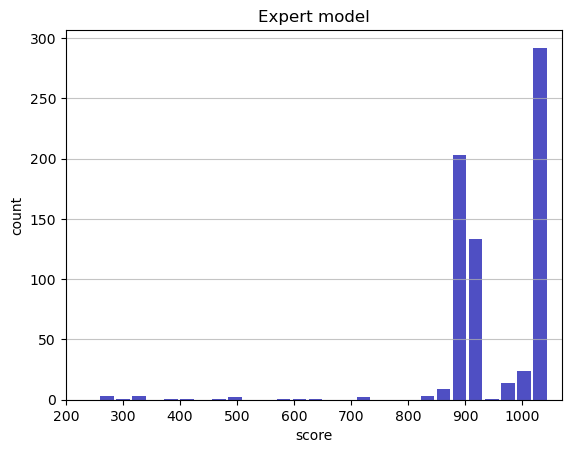

Track generation: 1192..1494 -> 302-tiles track
Epoch: 697
Expert	mean: 948.34	variance: 104.23



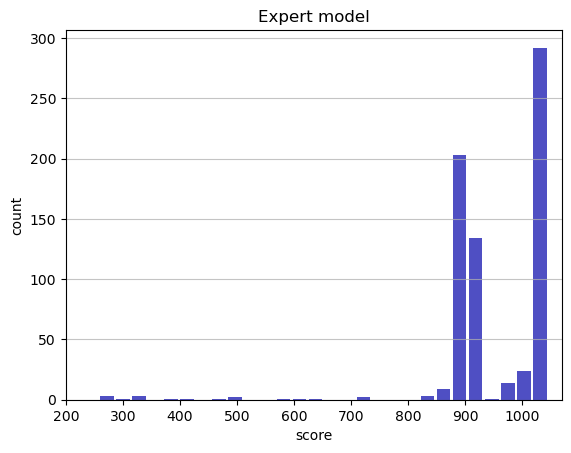

Track generation: 1208..1514 -> 306-tiles track
Epoch: 698
Expert	mean: 948.45	variance: 104.20



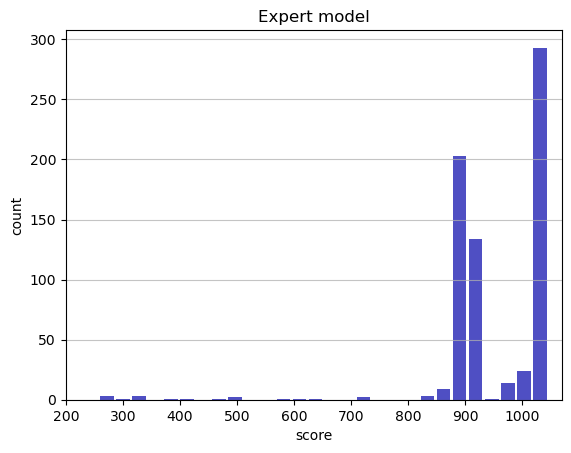

Track generation: 1063..1341 -> 278-tiles track
Epoch: 699
Expert	mean: 948.57	variance: 104.17



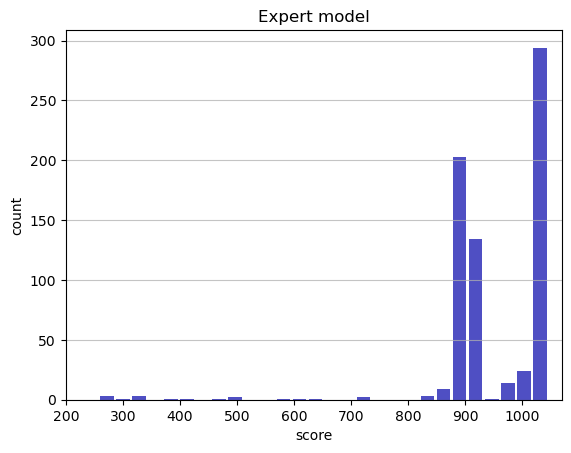

Track generation: 1207..1513 -> 306-tiles track
Epoch: 700
Expert	mean: 948.48	variance: 104.12



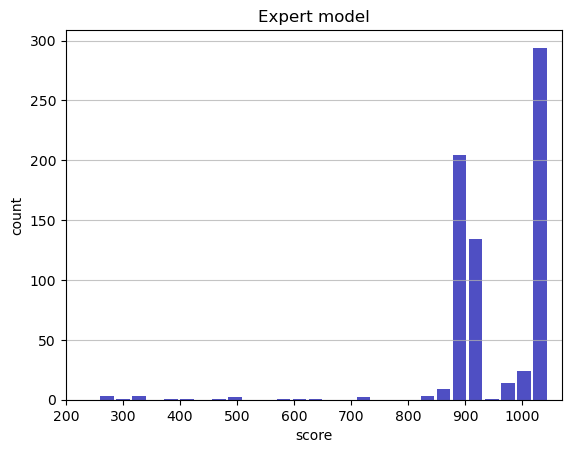

Track generation: 1165..1460 -> 295-tiles track
Epoch: 701
Expert	mean: 948.59	variance: 104.09



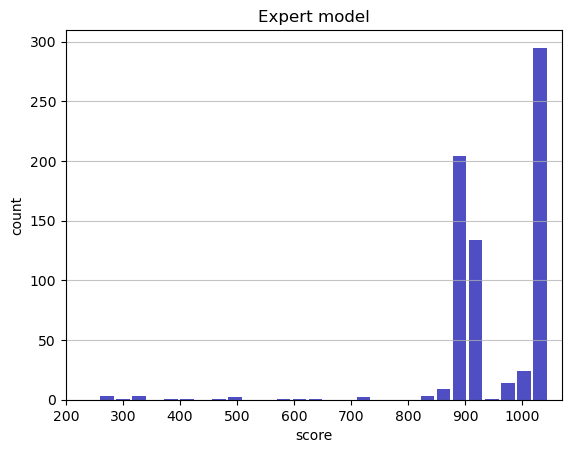

Track generation: 1292..1619 -> 327-tiles track
Epoch: 702
Expert	mean: 948.26	variance: 104.40



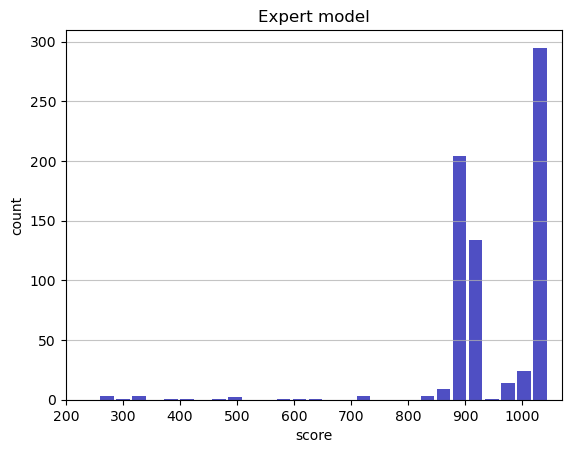

Track generation: 1224..1534 -> 310-tiles track
Epoch: 703
Expert	mean: 948.16	variance: 104.35



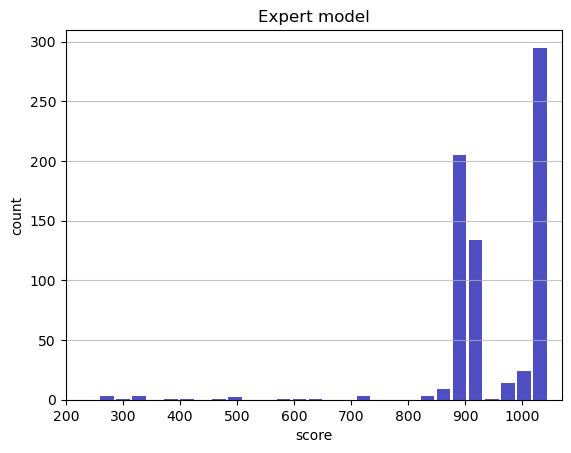

Track generation: 1073..1352 -> 279-tiles track
Epoch: 704
Expert	mean: 947.94	variance: 104.44



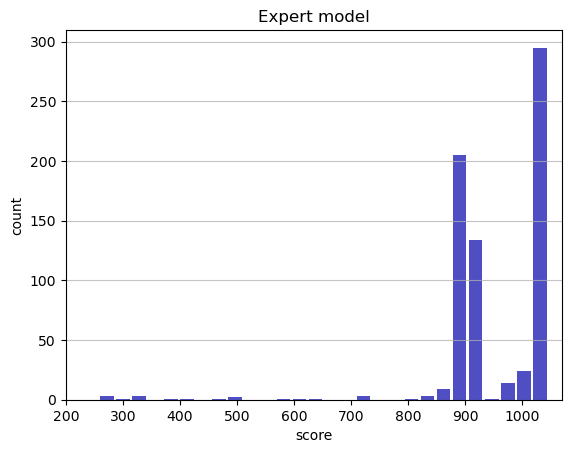

Track generation: 1235..1548 -> 313-tiles track
Epoch: 705
Expert	mean: 948.04	variance: 104.41



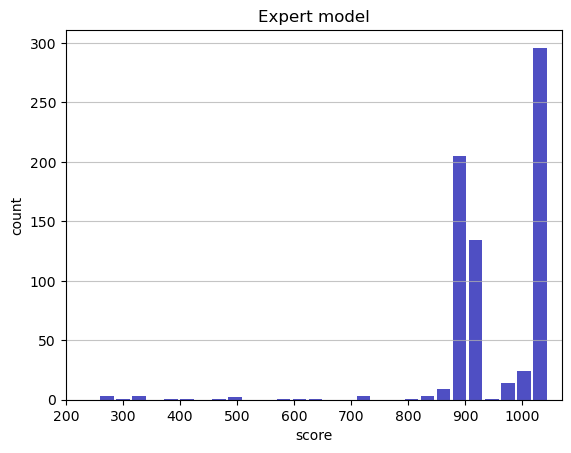

Track generation: 1195..1498 -> 303-tiles track
Epoch: 706
Expert	mean: 948.15	variance: 104.37



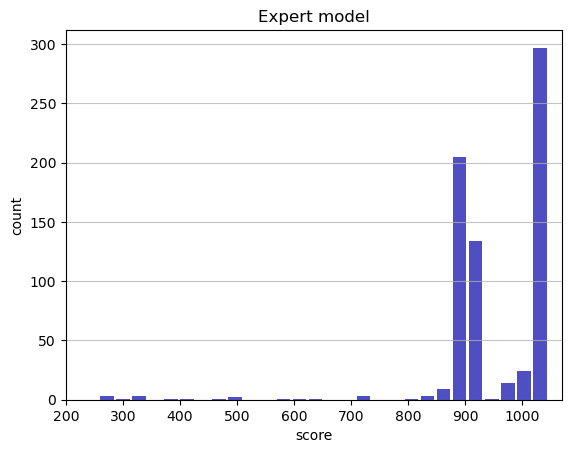

Track generation: 1109..1394 -> 285-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1146..1447 -> 301-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1028..1289 -> 261-tiles track
Epoch: 707
Expert	mean: 948.28	variance: 104.35



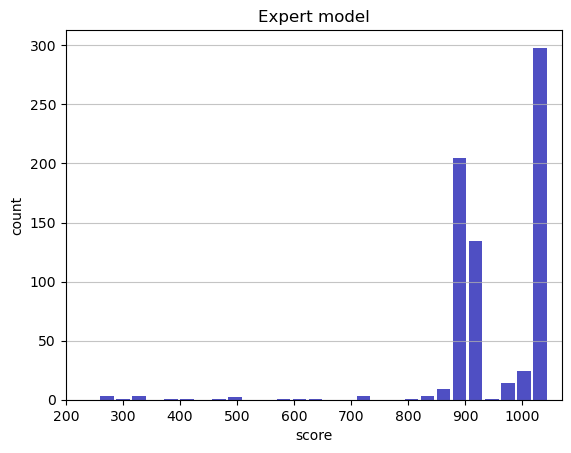

Track generation: 1113..1405 -> 292-tiles track
Epoch: 708
Expert	mean: 948.22	variance: 104.29



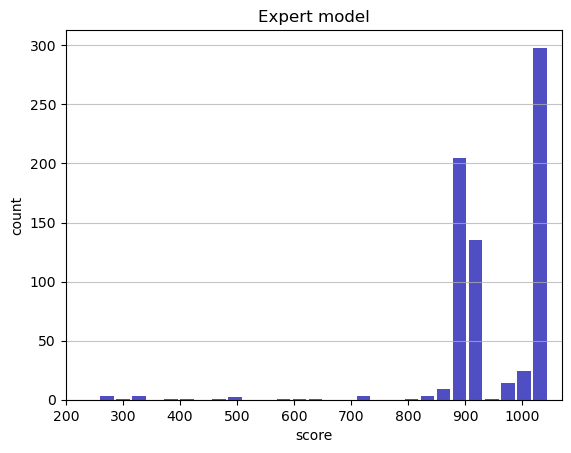

Track generation: 1192..1494 -> 302-tiles track
Epoch: 709
Expert	mean: 948.15	variance: 104.23



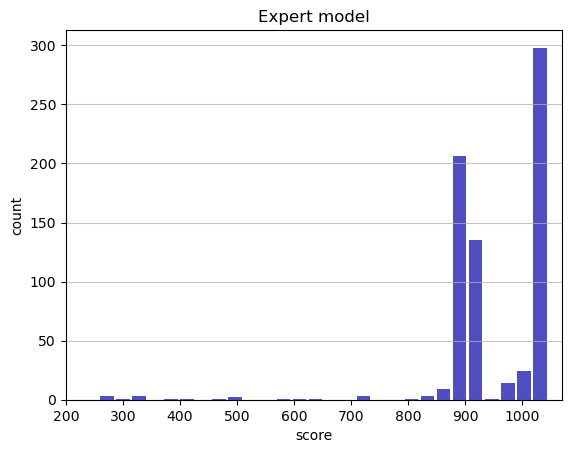

Track generation: 1000..1257 -> 257-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 994..1246 -> 252-tiles track
Epoch: 710
Expert	mean: 948.28	variance: 104.22



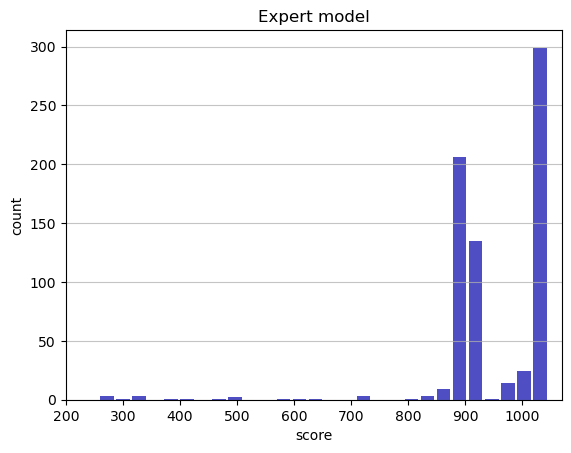

Track generation: 1097..1377 -> 280-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1270..1592 -> 322-tiles track
Epoch: 711
Expert	mean: 948.20	variance: 104.17



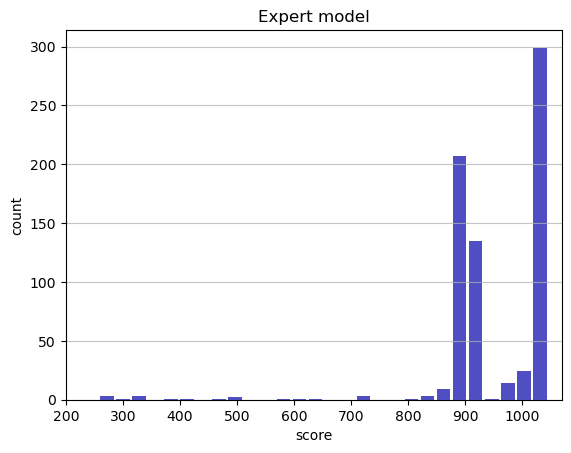

Track generation: 1176..1474 -> 298-tiles track
Epoch: 712
Expert	mean: 948.32	variance: 104.14



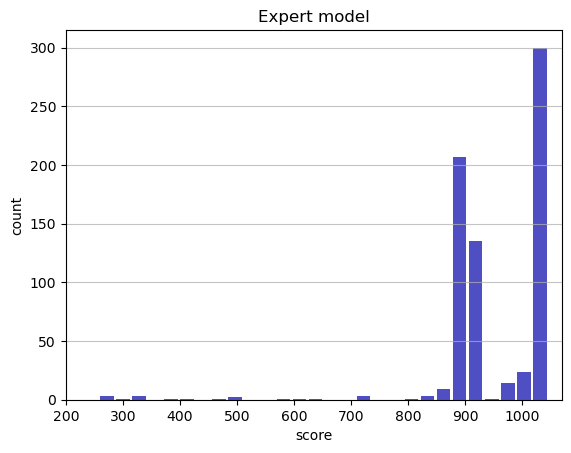

Track generation: 1027..1288 -> 261-tiles track
Epoch: 713
Expert	mean: 948.26	variance: 104.08



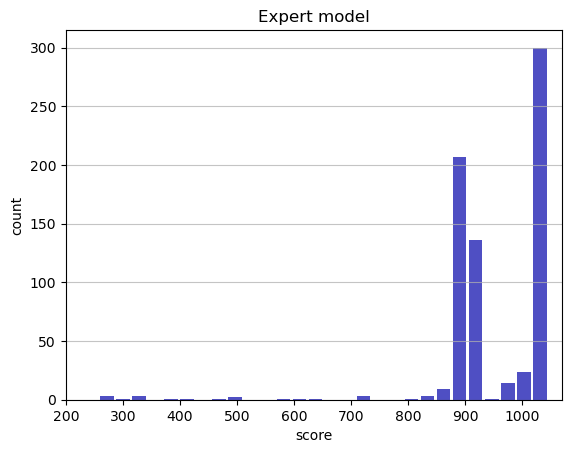

Track generation: 951..1193 -> 242-tiles track
Epoch: 714
Expert	mean: 948.40	variance: 104.07



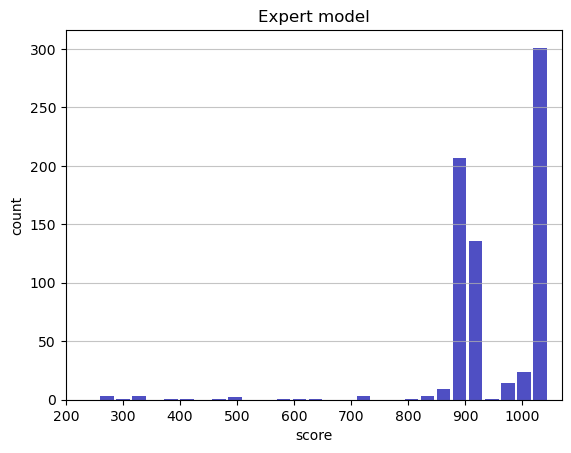

Track generation: 1125..1417 -> 292-tiles track
Epoch: 715
Expert	mean: 948.51	variance: 104.04



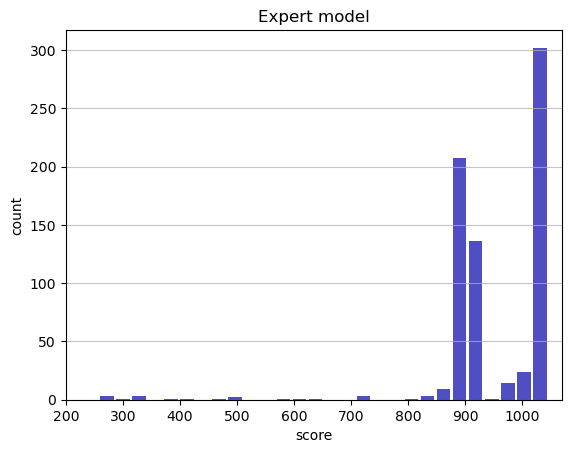

Track generation: 1224..1541 -> 317-tiles track
Epoch: 716
Expert	mean: 948.60	variance: 103.99



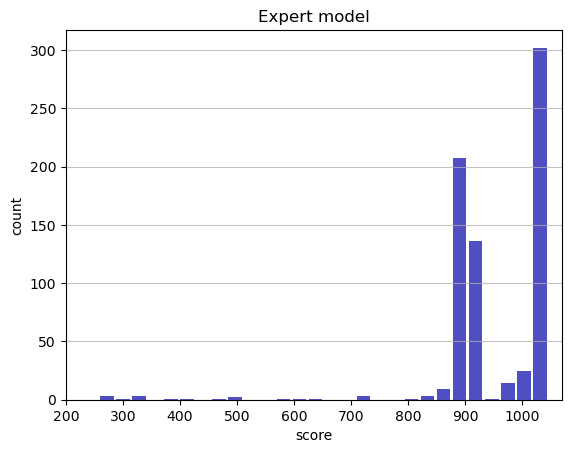

Track generation: 1087..1361 -> 274-tiles track
Epoch: 717
Expert	mean: 948.51	variance: 103.95



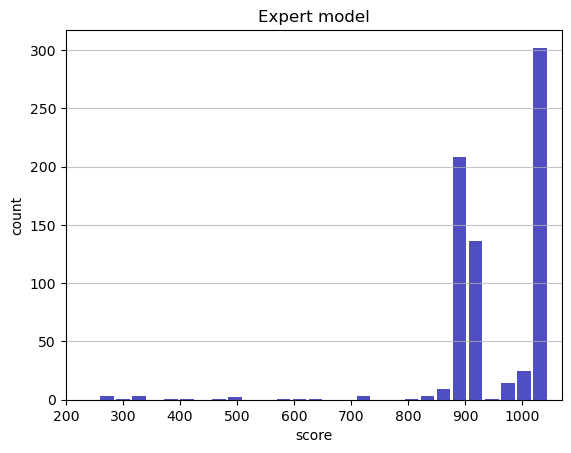

Track generation: 1200..1504 -> 304-tiles track
Epoch: 718
Expert	mean: 948.43	variance: 103.90



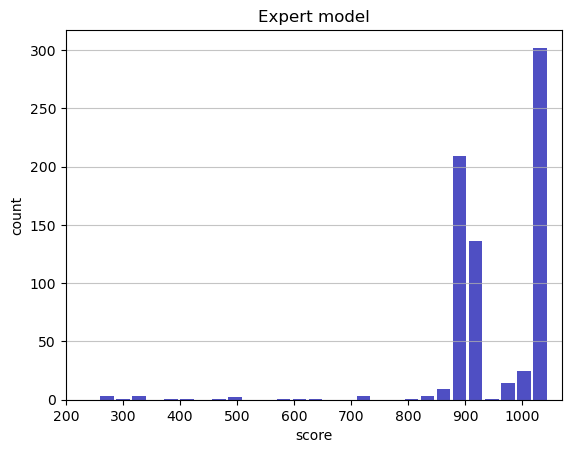

Track generation: 1124..1409 -> 285-tiles track
Epoch: 719
Expert	mean: 948.55	variance: 103.88



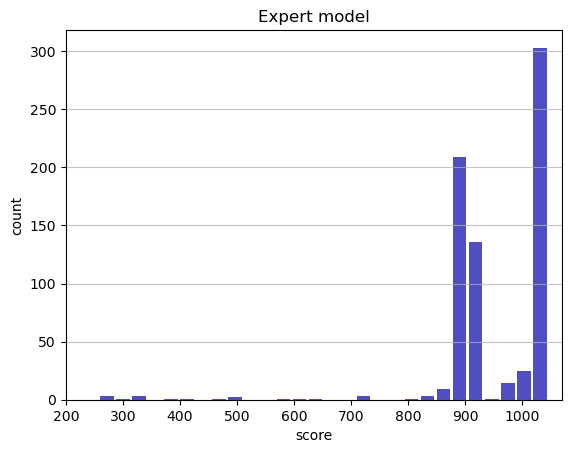

Track generation: 1045..1316 -> 271-tiles track
Epoch: 720
Expert	mean: 948.67	variance: 103.85



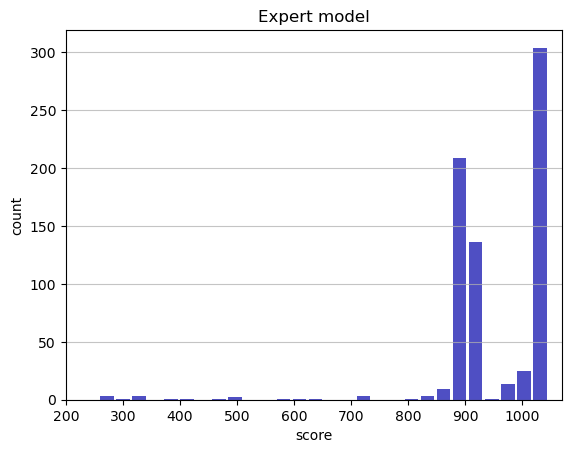

Track generation: 1164..1463 -> 299-tiles track
Epoch: 721
Expert	mean: 948.58	variance: 103.81



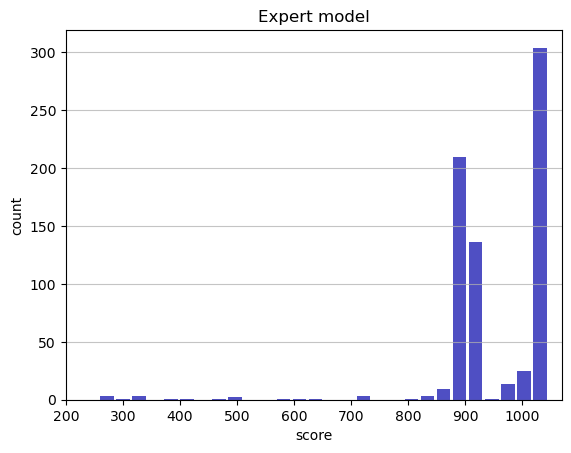

Track generation: 1194..1497 -> 303-tiles track
Epoch: 722
Expert	mean: 948.68	variance: 103.77



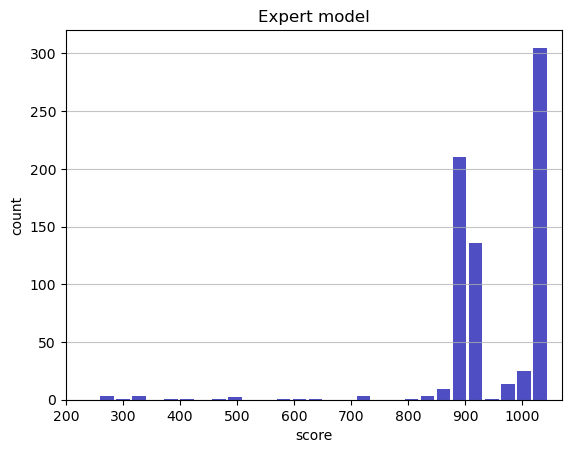

Track generation: 1161..1463 -> 302-tiles track
Epoch: 723
Expert	mean: 948.60	variance: 103.73



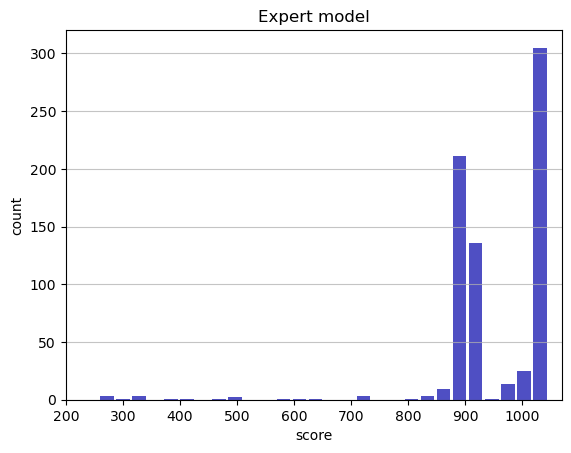

Track generation: 1299..1628 -> 329-tiles track
Epoch: 724
Expert	mean: 948.51	variance: 103.68



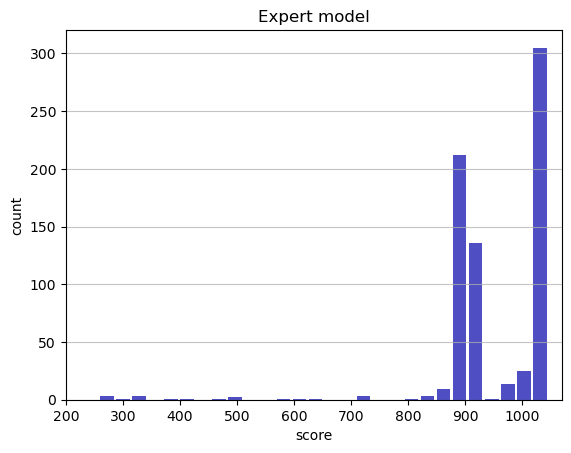

Track generation: 1195..1498 -> 303-tiles track
Epoch: 725
Expert	mean: 948.43	variance: 103.63



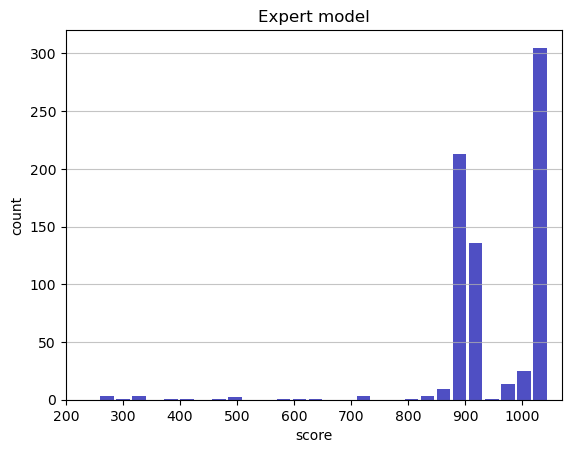

Track generation: 1002..1261 -> 259-tiles track
Epoch: 726
Expert	mean: 948.55	variance: 103.61



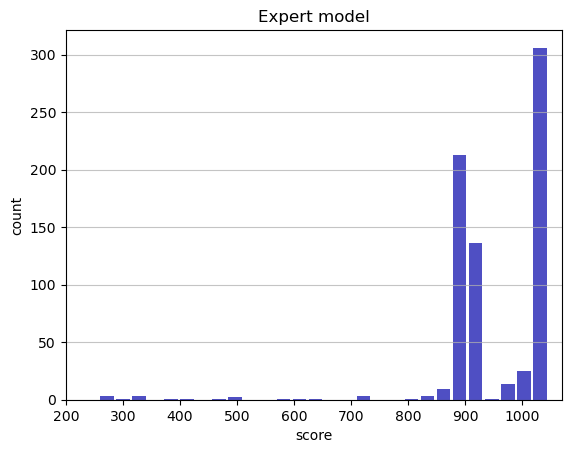

Track generation: 1140..1429 -> 289-tiles track
Epoch: 727
Expert	mean: 948.67	variance: 103.59



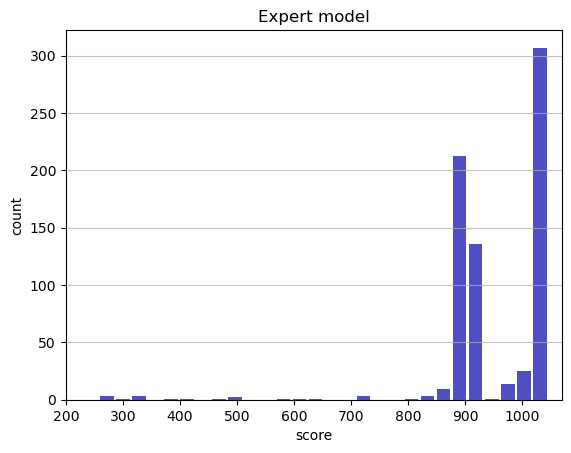

Track generation: 1292..1619 -> 327-tiles track
Epoch: 728
Expert	mean: 948.57	variance: 103.55



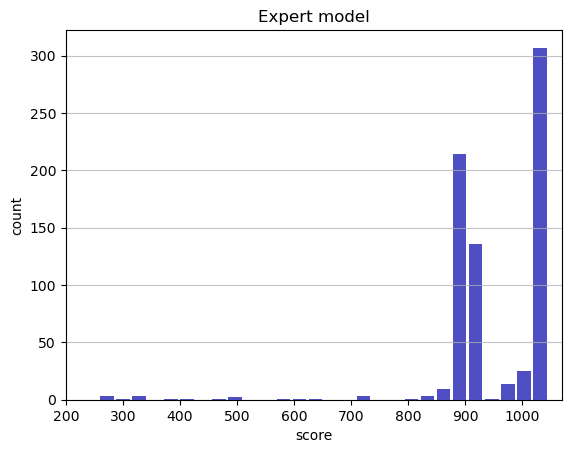

Track generation: 1151..1452 -> 301-tiles track
Epoch: 729
Expert	mean: 948.52	variance: 103.49



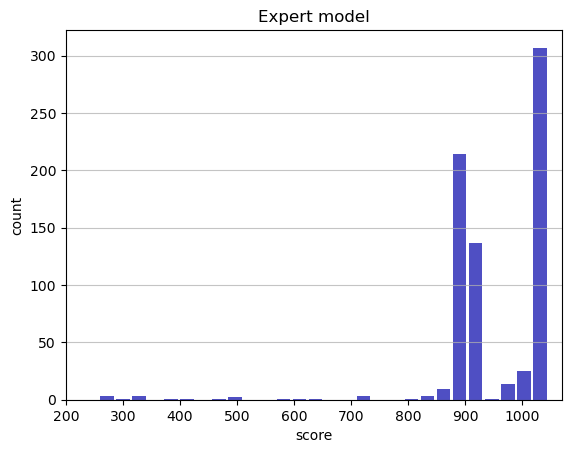

Track generation: 1163..1458 -> 295-tiles track
Epoch: 730
Expert	mean: 948.44	variance: 103.44



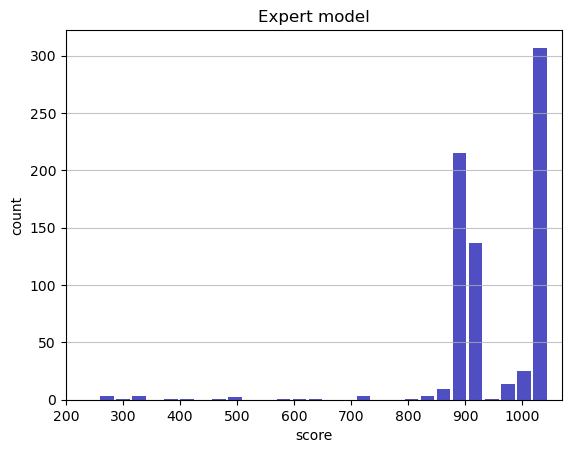

Track generation: 1179..1478 -> 299-tiles track
Epoch: 731
Expert	mean: 948.55	variance: 103.41



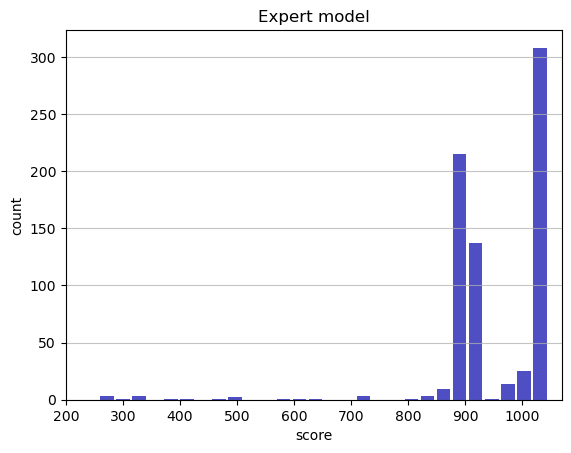

Track generation: 1037..1309 -> 272-tiles track
Epoch: 732
Expert	mean: 948.49	variance: 103.35



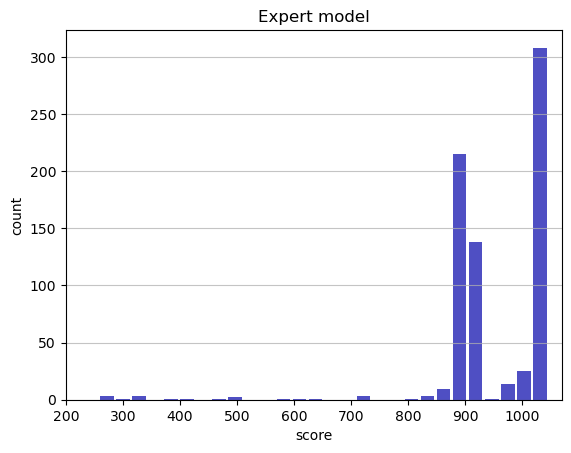

Track generation: 1182..1482 -> 300-tiles track
Epoch: 733
Expert	mean: 948.60	variance: 103.32



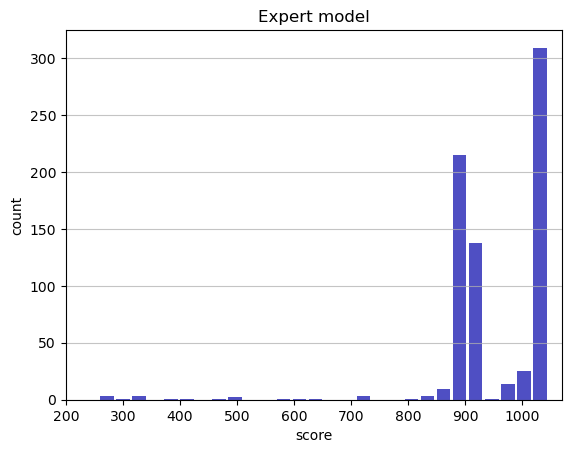

Track generation: 916..1149 -> 233-tiles track
Epoch: 734
Expert	mean: 948.56	variance: 103.26



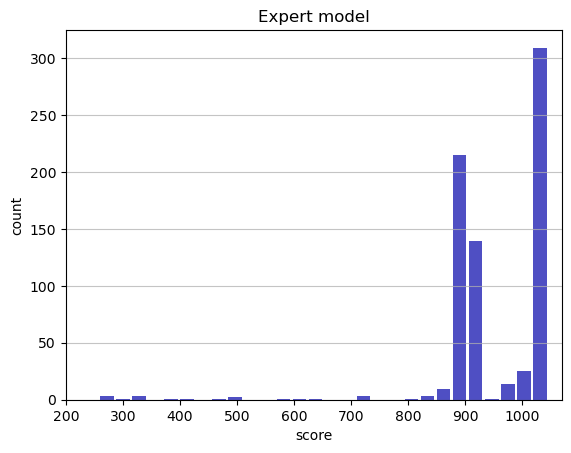

Track generation: 1015..1273 -> 258-tiles track
Epoch: 735
Expert	mean: 948.49	variance: 103.20



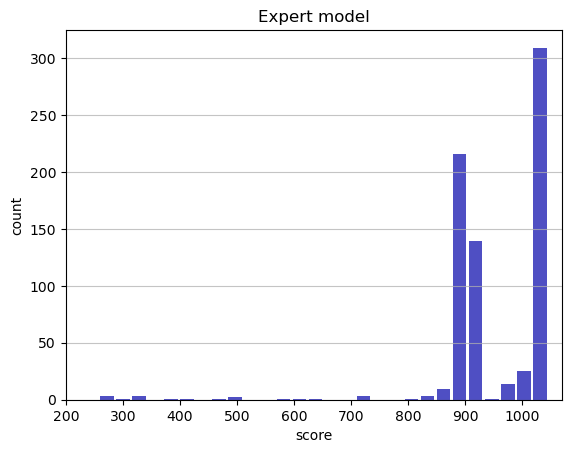

Track generation: 1100..1388 -> 288-tiles track
Epoch: 736
Expert	mean: 948.60	variance: 103.17



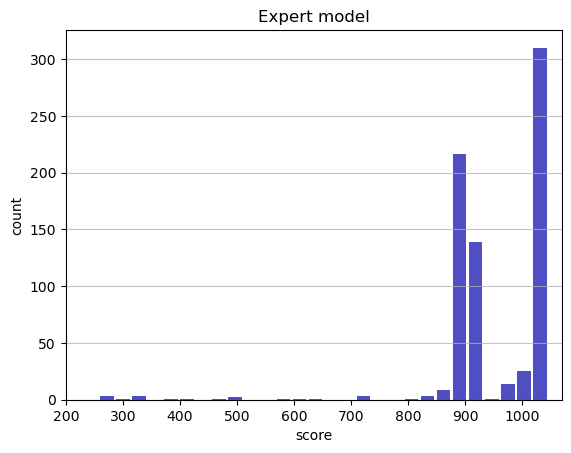

Track generation: 956..1205 -> 249-tiles track
Epoch: 737
Expert	mean: 948.71	variance: 103.15



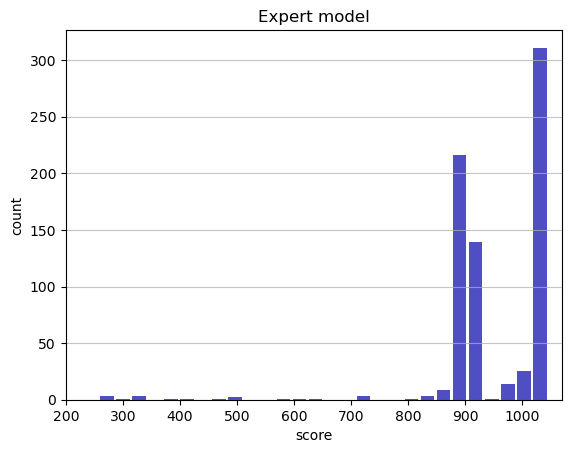

Track generation: 1103..1383 -> 280-tiles track
Epoch: 738
Expert	mean: 948.83	variance: 103.12



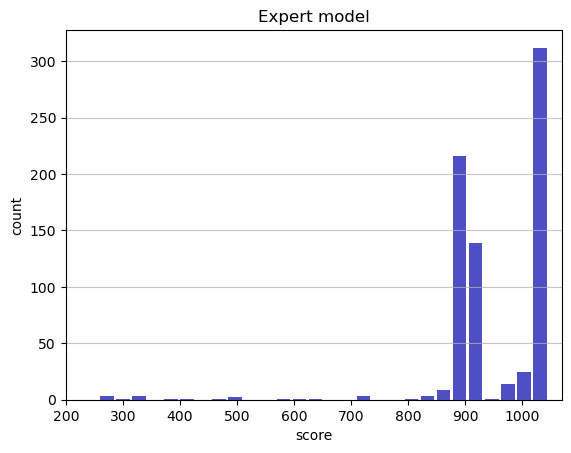

Track generation: 1093..1379 -> 286-tiles track
Epoch: 739
Expert	mean: 948.75	variance: 103.08



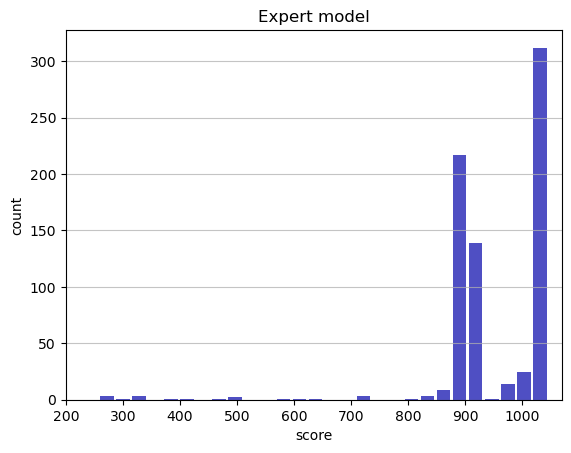

Track generation: 944..1184 -> 240-tiles track
Epoch: 740
Expert	mean: 948.71	variance: 103.02



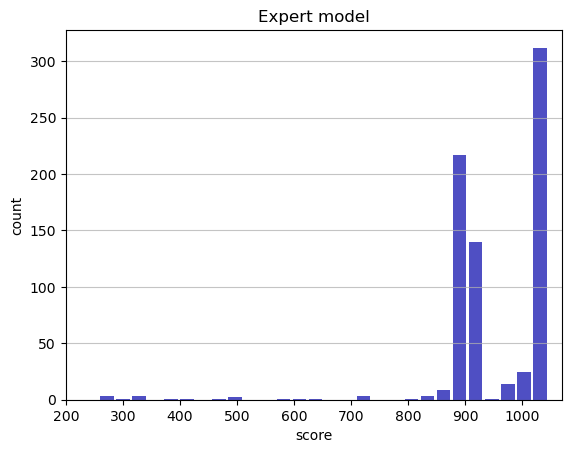

Track generation: 1179..1478 -> 299-tiles track
Epoch: 741
Expert	mean: 948.63	variance: 102.97



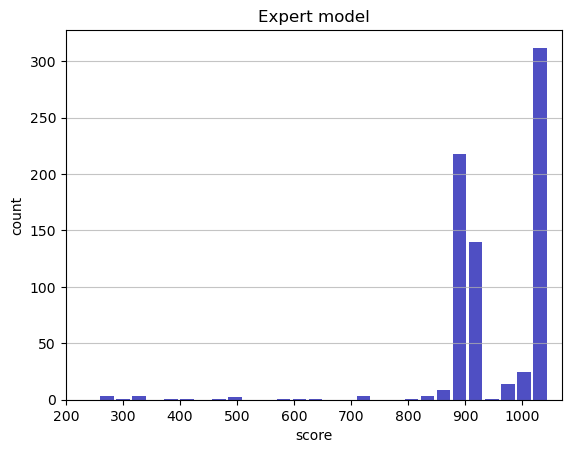

Track generation: 1168..1464 -> 296-tiles track
Epoch: 742
Expert	mean: 948.74	variance: 102.94



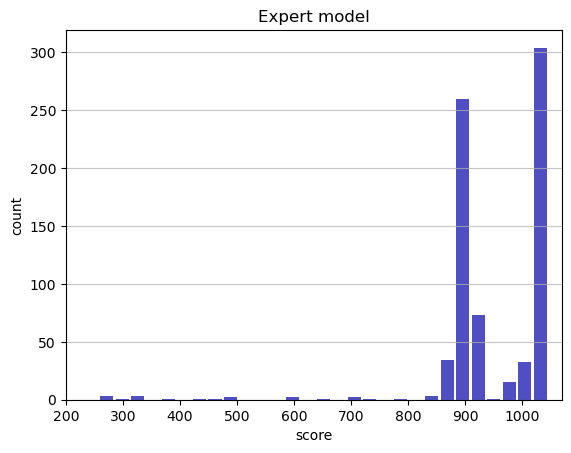

Track generation: 1218..1535 -> 317-tiles track
Epoch: 743
Expert	mean: 948.64	variance: 102.90



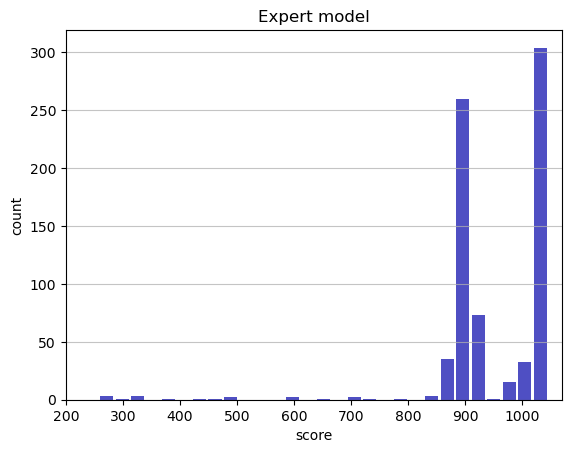

Track generation: 1262..1581 -> 319-tiles track
Epoch: 744
Expert	mean: 948.73	variance: 102.86



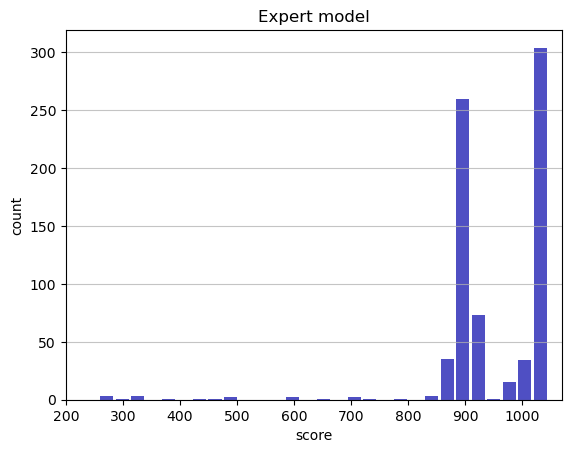

Track generation: 1144..1434 -> 290-tiles track
Epoch: 745
Expert	mean: 948.67	variance: 102.81



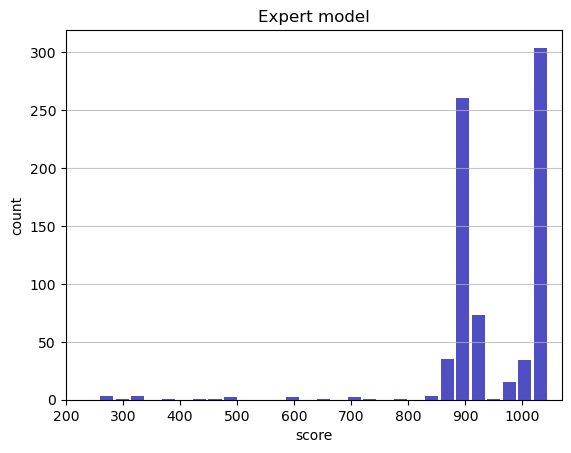

Track generation: 1047..1313 -> 266-tiles track
Epoch: 746
Expert	mean: 948.79	variance: 102.79



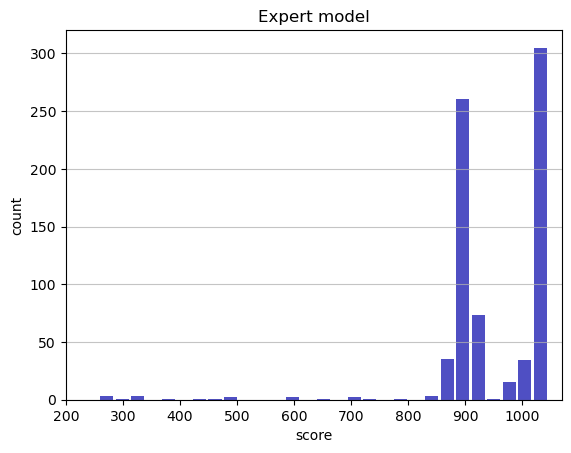

Track generation: 1156..1449 -> 293-tiles track
Epoch: 747
Expert	mean: 948.89	variance: 102.77



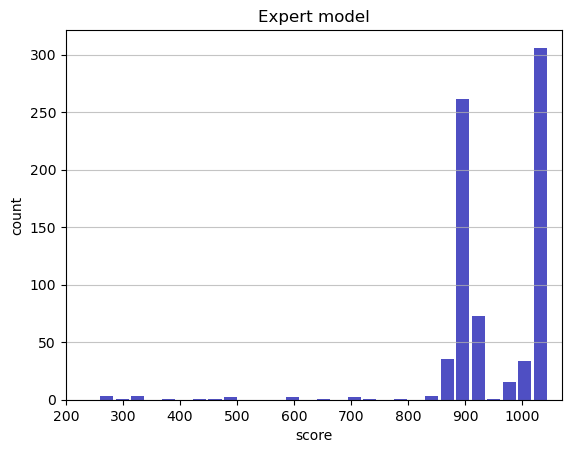

Track generation: 1252..1569 -> 317-tiles track
Epoch: 748
Expert	mean: 948.81	variance: 102.72



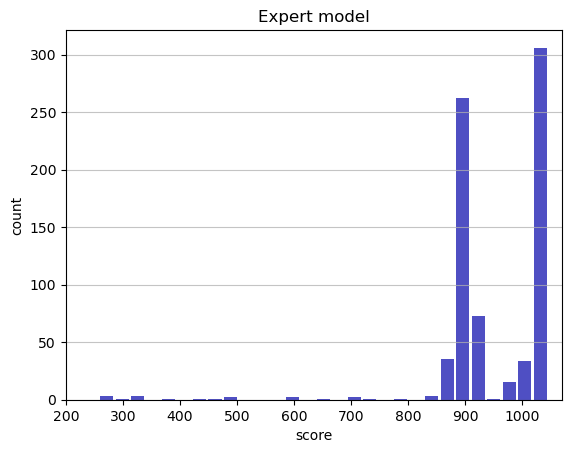

Track generation: 1152..1444 -> 292-tiles track
Epoch: 749
Expert	mean: 948.92	variance: 102.71



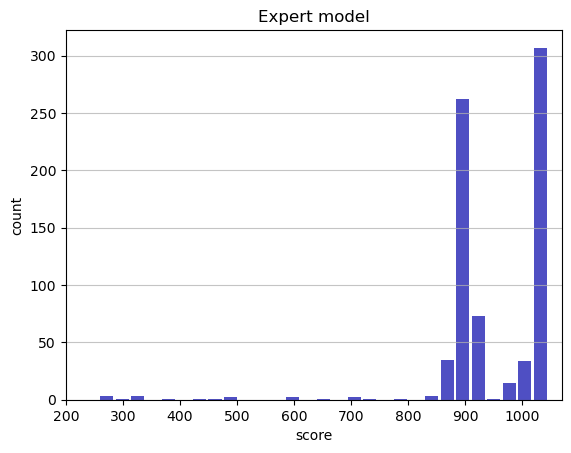

Track generation: 1039..1306 -> 267-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1124..1409 -> 285-tiles track
Epoch: 750
Expert	mean: 948.87	variance: 102.65



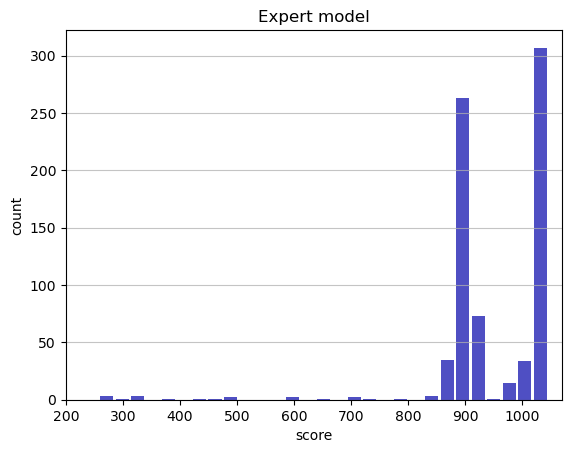

Track generation: 1036..1301 -> 265-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 997..1259 -> 262-tiles track
Epoch: 751
Expert	mean: 948.83	variance: 102.58



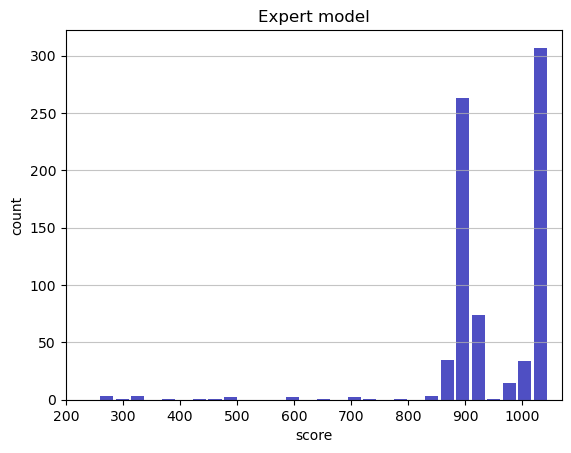

Track generation: 1020..1279 -> 259-tiles track
Epoch: 752
Expert	mean: 948.95	variance: 102.57



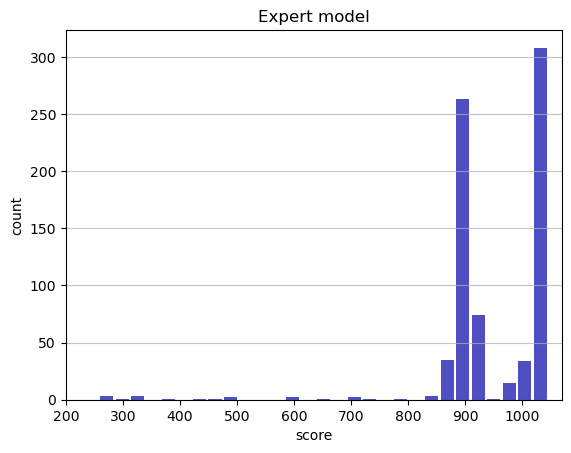

Track generation: 1040..1308 -> 268-tiles track
Epoch: 753
Expert	mean: 949.06	variance: 102.54



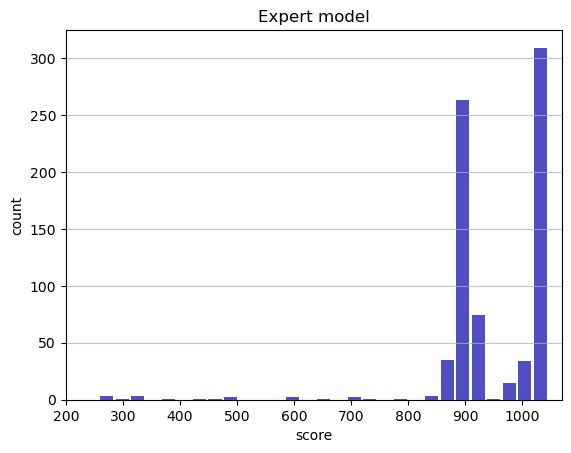

Track generation: 1100..1379 -> 279-tiles track
Epoch: 754
Expert	mean: 949.17	variance: 102.52



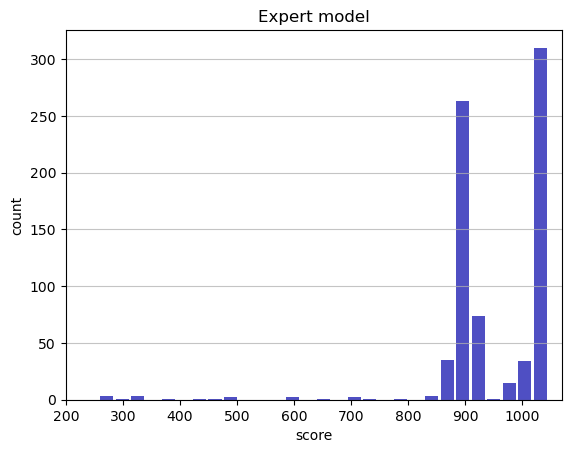

Track generation: 1087..1363 -> 276-tiles track
Epoch: 755
Expert	mean: 949.28	variance: 102.50



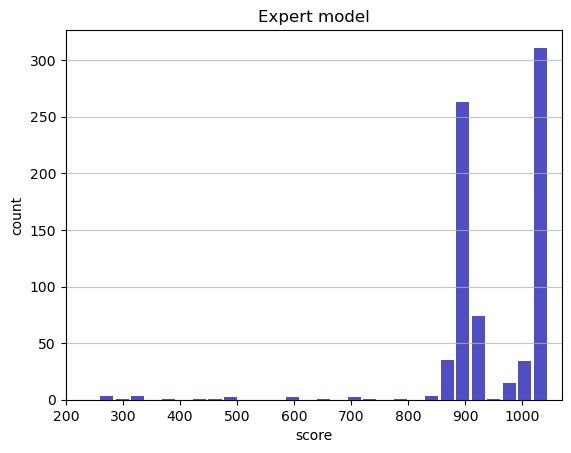

Track generation: 1132..1419 -> 287-tiles track
Epoch: 756
Expert	mean: 949.23	variance: 102.44



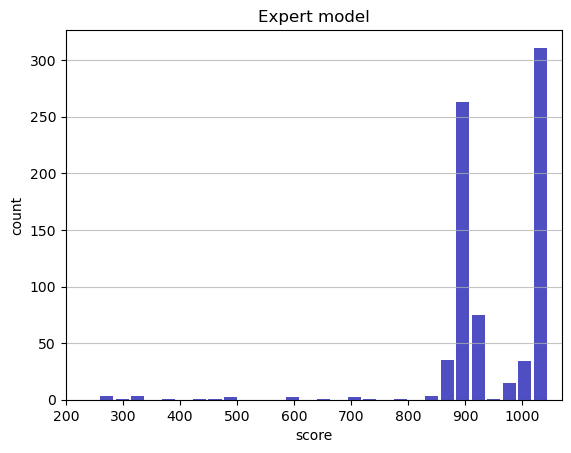

Track generation: 1181..1480 -> 299-tiles track
Epoch: 757
Expert	mean: 949.33	variance: 102.41



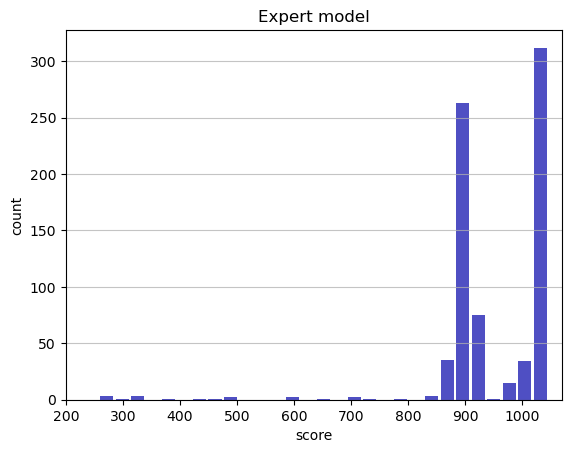

Track generation: 1078..1352 -> 274-tiles track
Epoch: 758
Expert	mean: 949.26	variance: 102.36



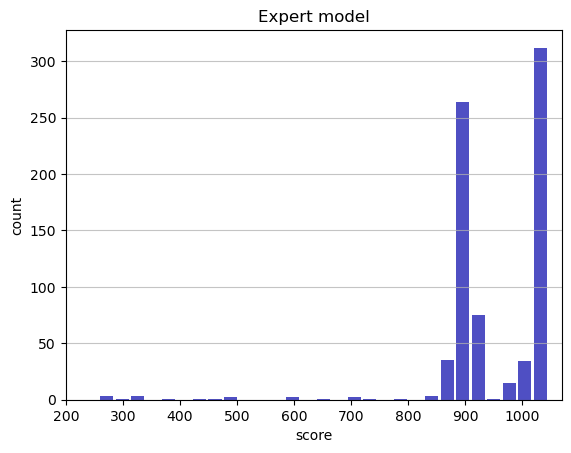

Track generation: 1262..1580 -> 318-tiles track
Epoch: 759
Expert	mean: 949.36	variance: 102.32



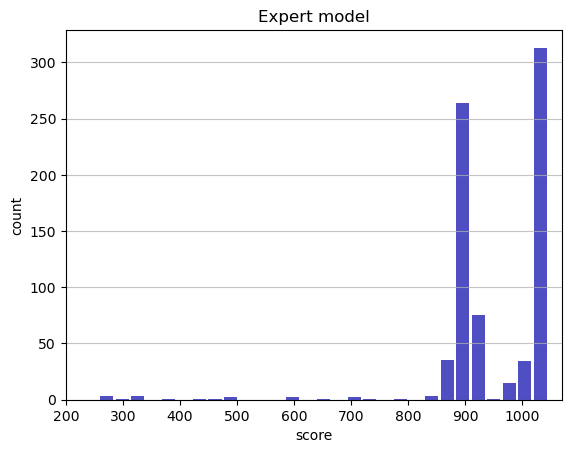

Track generation: 1177..1475 -> 298-tiles track
Epoch: 760
Expert	mean: 949.29	variance: 102.27



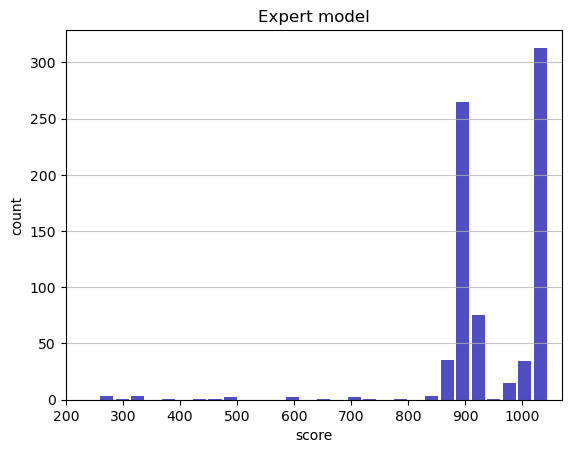

Track generation: 1144..1440 -> 296-tiles track
Epoch: 761
Expert	mean: 949.39	variance: 102.24



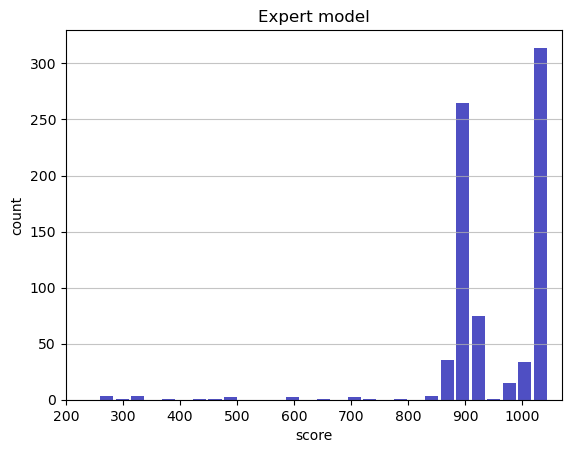

Track generation: 1308..1639 -> 331-tiles track
Epoch: 762
Expert	mean: 949.48	variance: 102.20



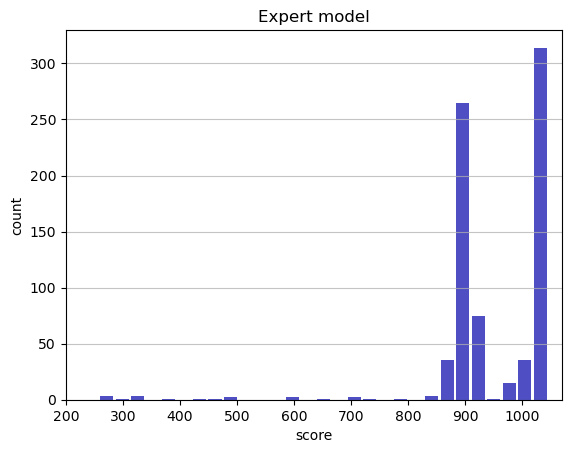

Track generation: 1310..1641 -> 331-tiles track
Epoch: 763
Expert	mean: 949.57	variance: 102.16



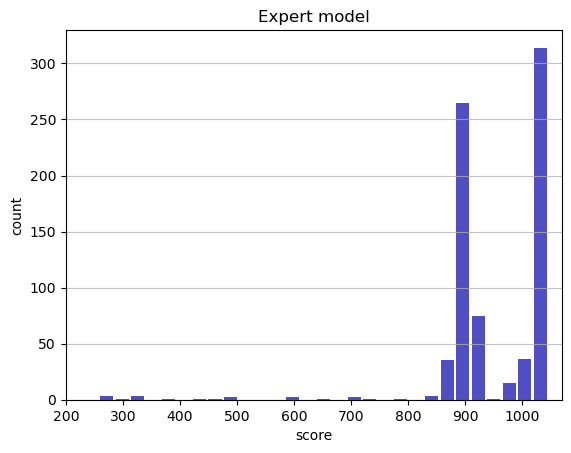

Track generation: 1208..1514 -> 306-tiles track
Epoch: 764
Expert	mean: 949.49	variance: 102.12



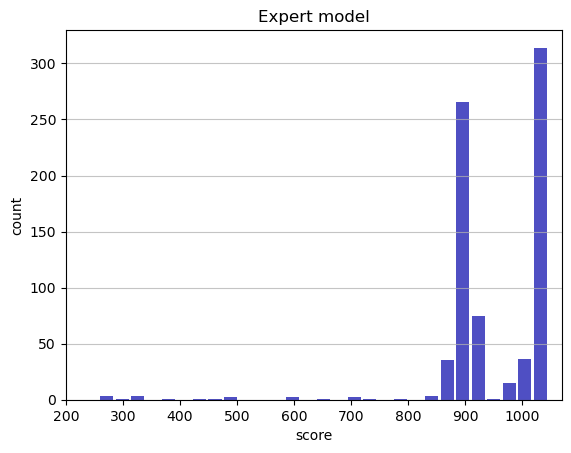

Track generation: 1125..1410 -> 285-tiles track
Epoch: 765
Expert	mean: 949.60	variance: 102.09



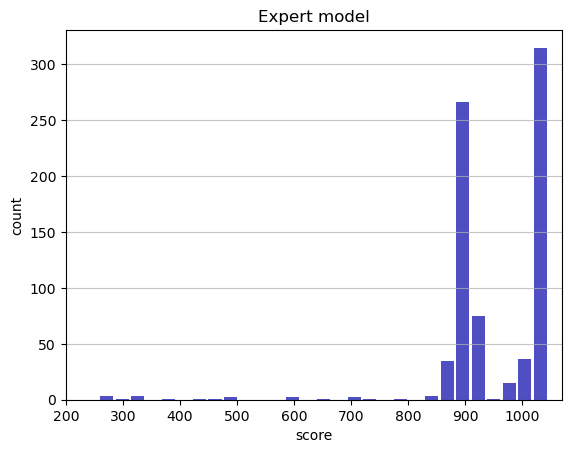

Track generation: 1248..1564 -> 316-tiles track
Epoch: 766
Expert	mean: 949.52	variance: 102.05



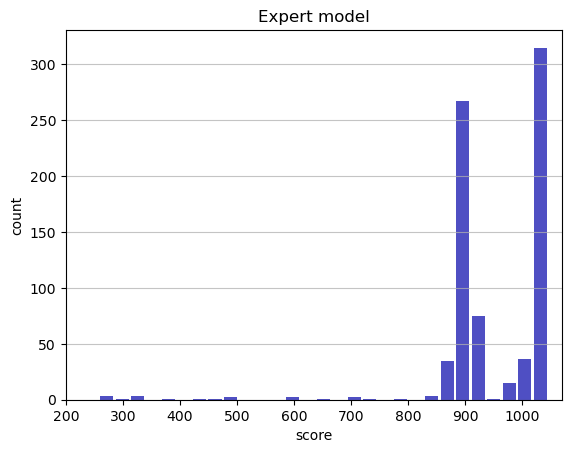

Track generation: 1139..1428 -> 289-tiles track
Epoch: 767
Expert	mean: 949.62	variance: 102.02



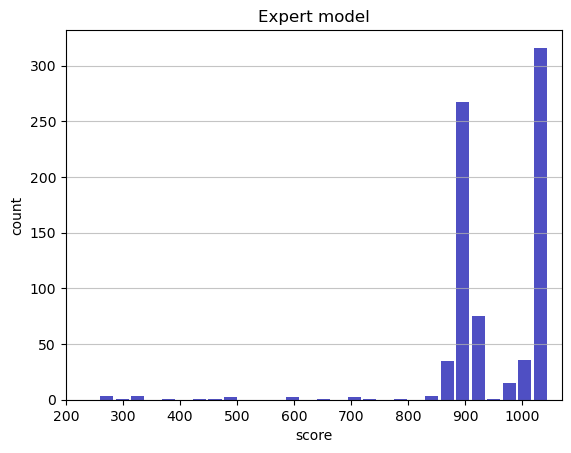

Track generation: 1212..1519 -> 307-tiles track
Epoch: 768
Expert	mean: 949.54	variance: 101.98



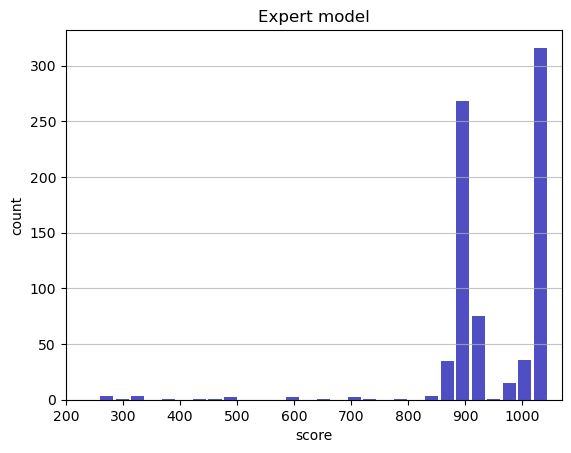

Track generation: 1036..1303 -> 267-tiles track
Epoch: 769
Expert	mean: 949.65	variance: 101.96



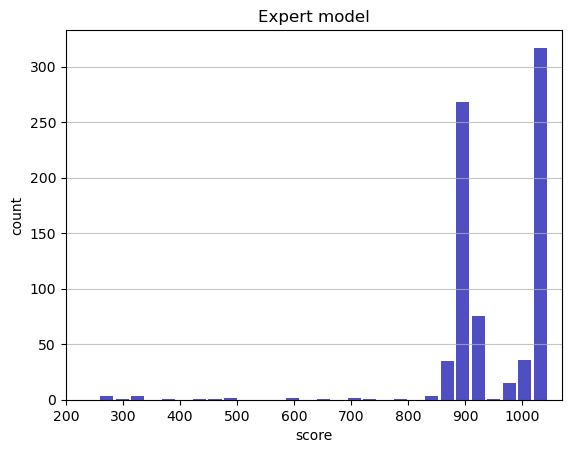

Track generation: 1151..1443 -> 292-tiles track
Epoch: 770
Expert	mean: 949.75	variance: 101.94



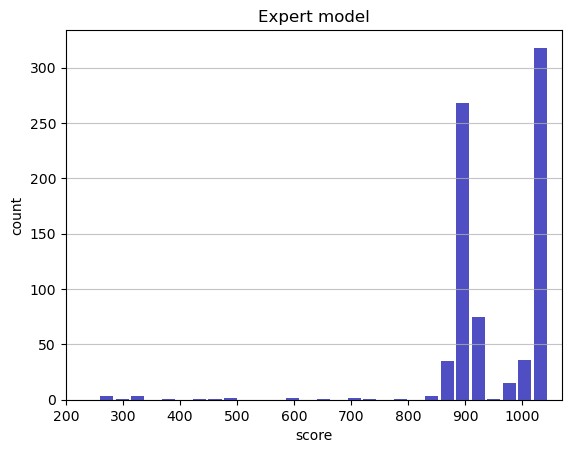

Track generation: 1140..1429 -> 289-tiles track
Epoch: 771
Expert	mean: 949.70	variance: 101.88



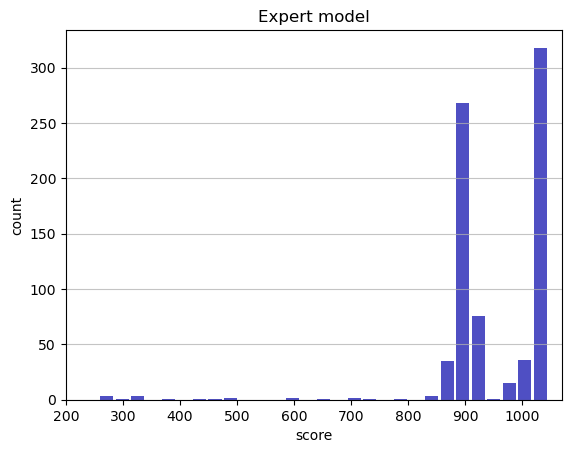

Track generation: 1268..1589 -> 321-tiles track
Epoch: 772
Expert	mean: 949.61	variance: 101.85



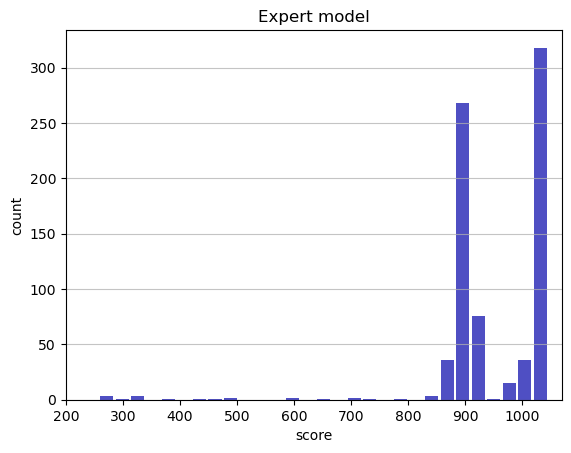

Track generation: 1012..1269 -> 257-tiles track
Epoch: 773
Expert	mean: 949.57	variance: 101.79



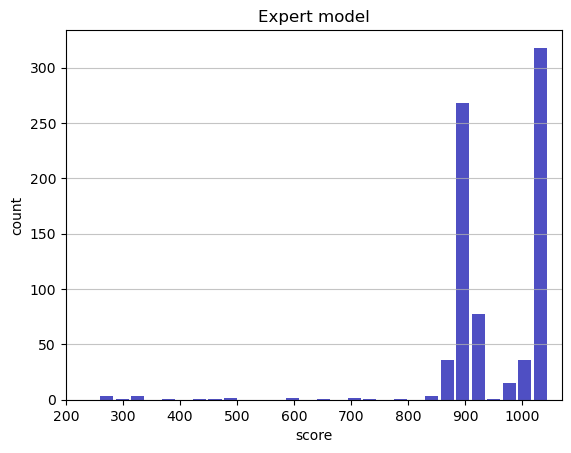

Track generation: 1119..1401 -> 282-tiles track
Epoch: 774
Expert	mean: 949.51	variance: 101.74



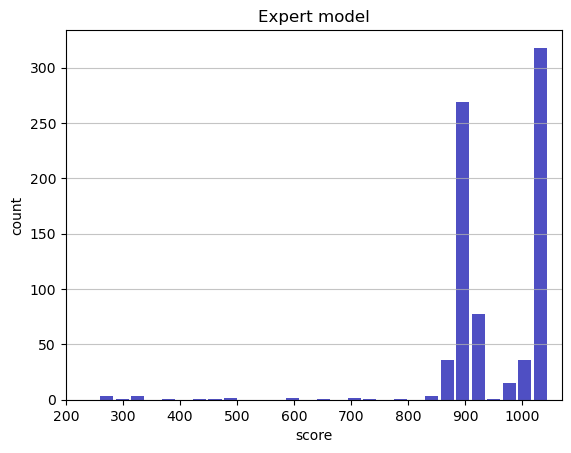

Track generation: 1088..1364 -> 276-tiles track
Epoch: 775
Expert	mean: 949.46	variance: 101.68



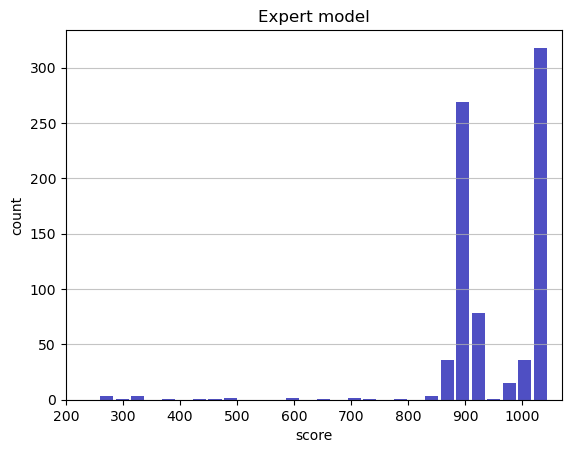

Track generation: 1247..1563 -> 316-tiles track
Epoch: 776
Expert	mean: 949.40	variance: 101.63



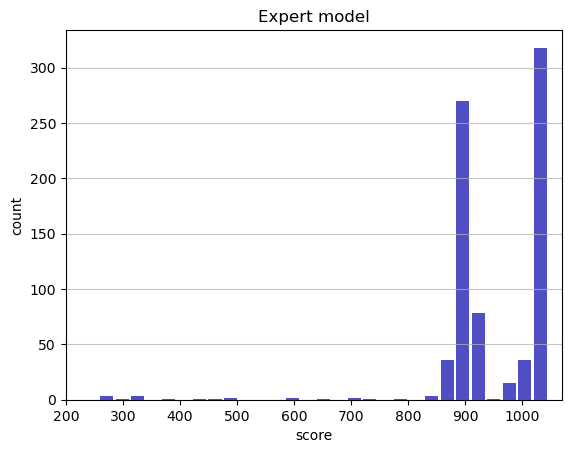

Track generation: 1224..1534 -> 310-tiles track
Epoch: 777
Expert	mean: 949.34	variance: 101.58



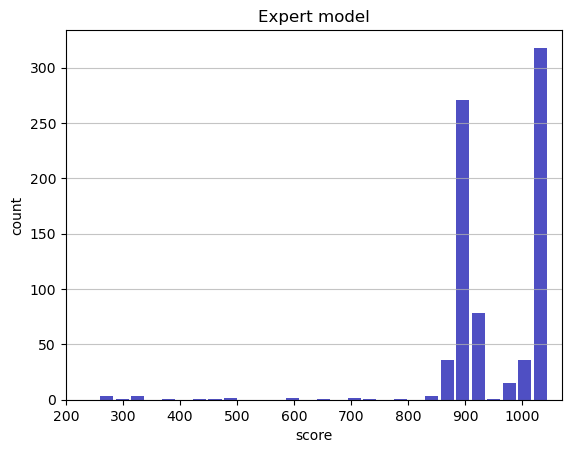

Track generation: 1007..1263 -> 256-tiles track
Epoch: 778
Expert	mean: 949.27	variance: 101.53



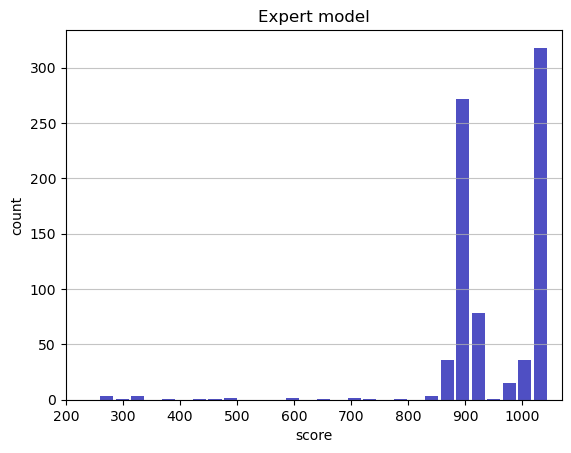

Track generation: 1097..1375 -> 278-tiles track
Epoch: 779
Expert	mean: 949.38	variance: 101.51



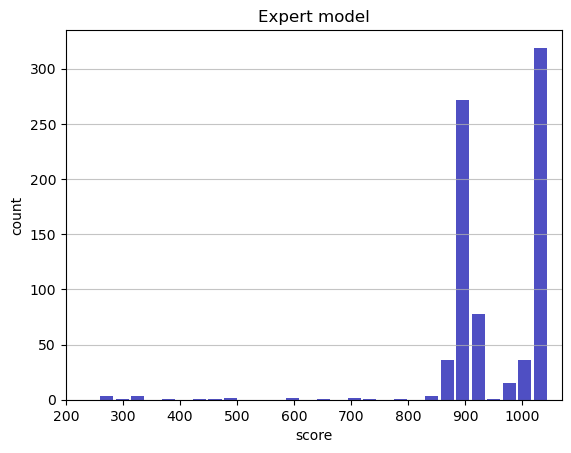

Track generation: 1087..1363 -> 276-tiles track
Epoch: 780
Expert	mean: 949.34	variance: 101.45



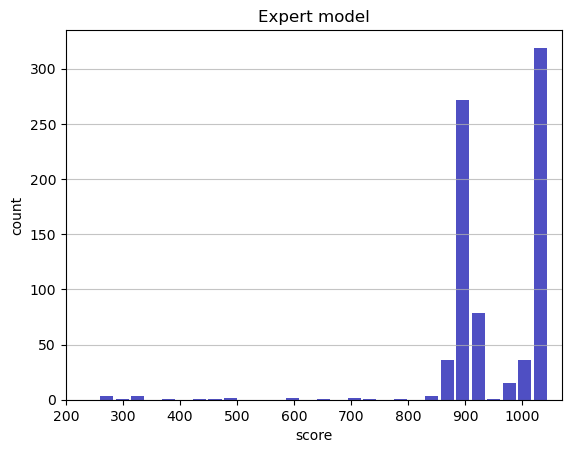

Track generation: 1044..1309 -> 265-tiles track
Epoch: 781
Expert	mean: 949.30	variance: 101.39



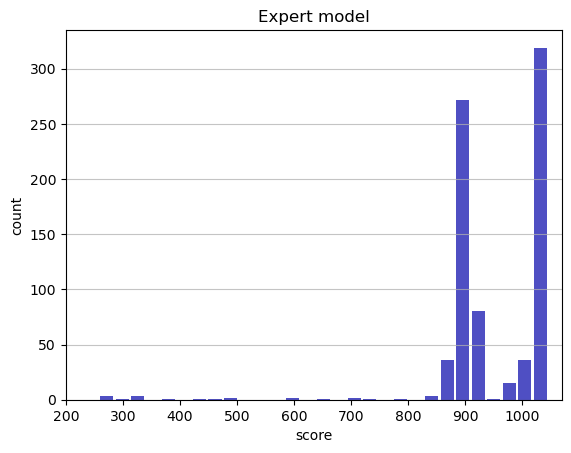

Track generation: 1156..1449 -> 293-tiles track
Epoch: 782
Expert	mean: 949.22	variance: 101.35



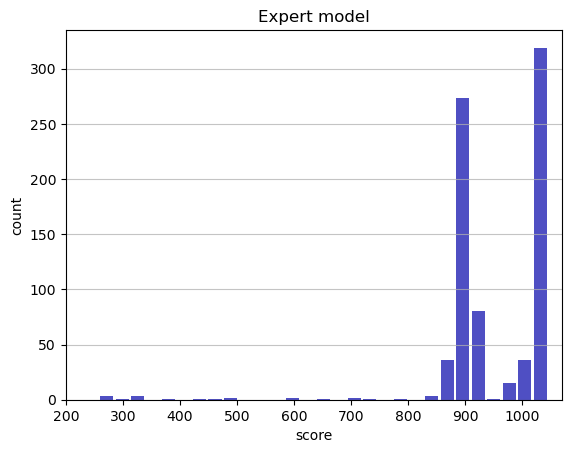

Track generation: 1099..1386 -> 287-tiles track
Epoch: 783
Expert	mean: 949.16	variance: 101.30



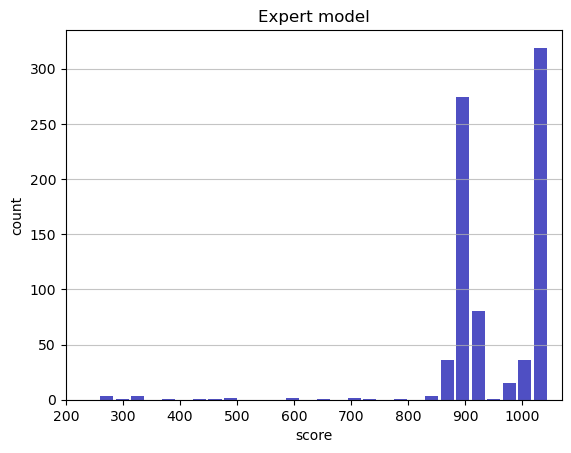

Track generation: 1160..1454 -> 294-tiles track
Epoch: 784
Expert	mean: 949.26	variance: 101.27



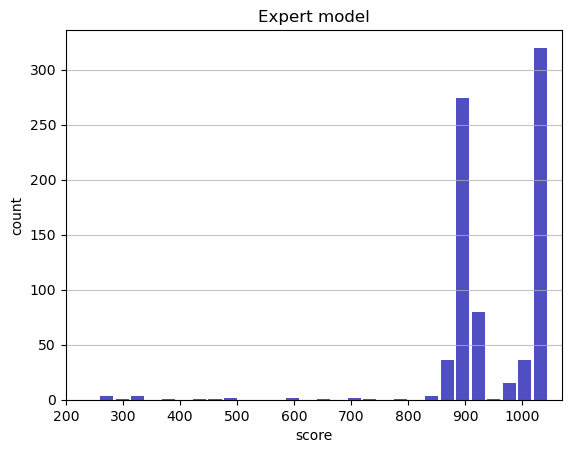

Track generation: 985..1242 -> 257-tiles track
Epoch: 785
Expert	mean: 949.21	variance: 101.22



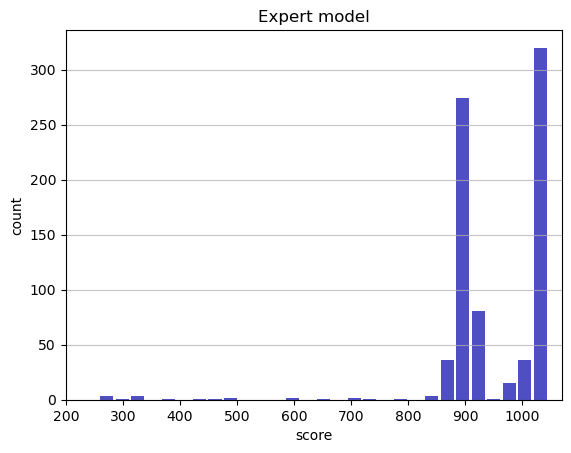

Track generation: 1067..1338 -> 271-tiles track
Epoch: 786
Expert	mean: 949.32	variance: 101.20



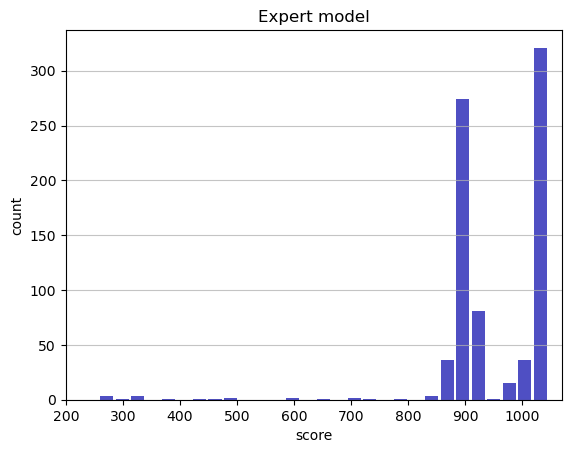

Track generation: 1138..1425 -> 287-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1156..1449 -> 293-tiles track
Epoch: 787
Expert	mean: 949.43	variance: 101.18



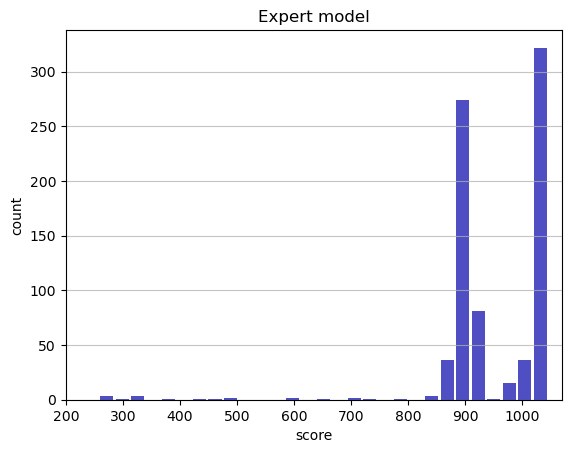

Track generation: 1223..1533 -> 310-tiles track
Epoch: 788
Expert	mean: 949.36	variance: 101.13



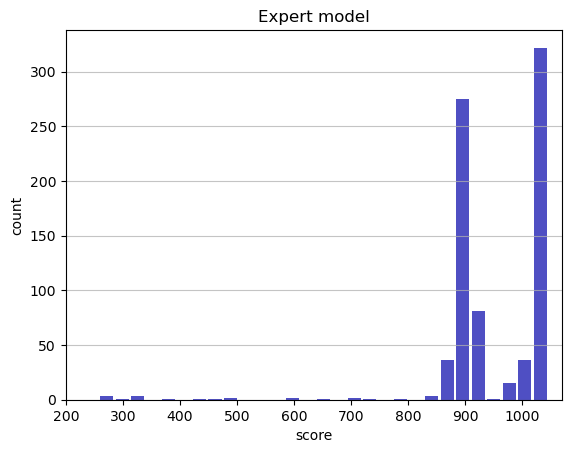

Track generation: 1133..1429 -> 296-tiles track
Epoch: 789
Expert	mean: 949.31	variance: 101.08



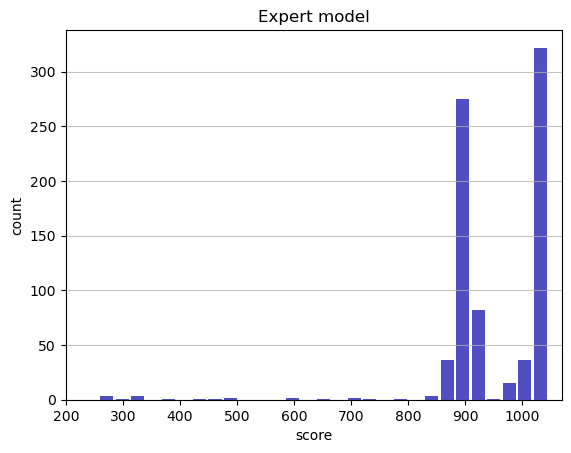

Track generation: 1152..1444 -> 292-tiles track
Epoch: 790
Expert	mean: 949.26	variance: 101.03



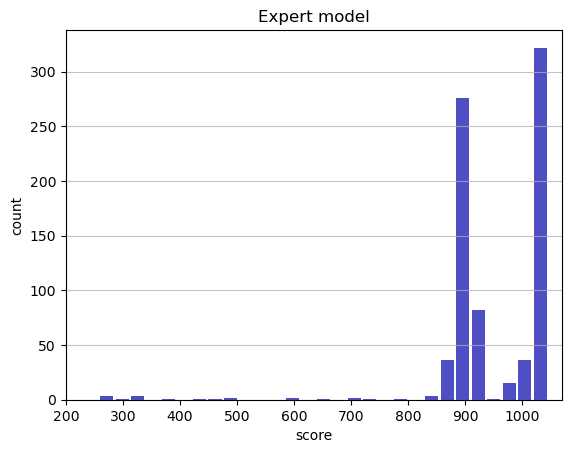

Track generation: 1123..1408 -> 285-tiles track
Epoch: 791
Expert	mean: 949.21	variance: 100.97



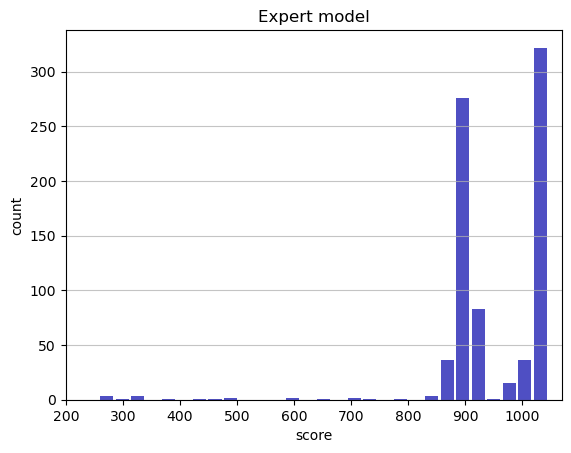

Track generation: 1304..1634 -> 330-tiles track
Epoch: 792
Expert	mean: 949.13	variance: 100.93



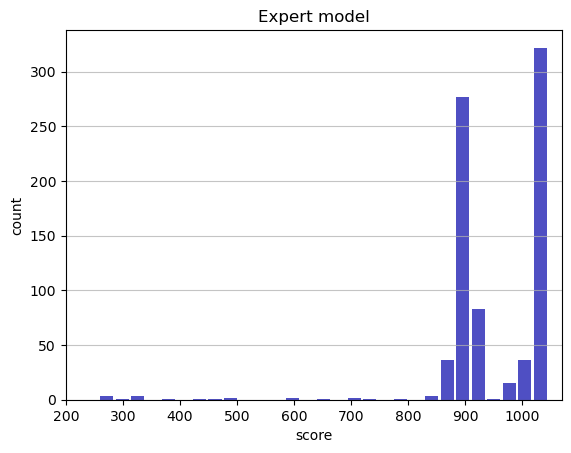

Track generation: 1159..1453 -> 294-tiles track
Epoch: 793
Expert	mean: 949.07	variance: 100.88



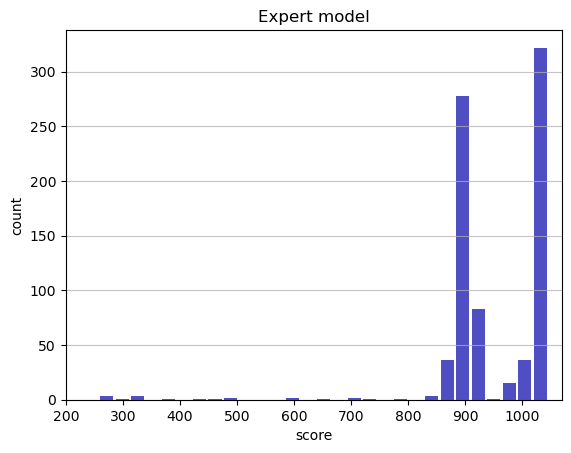

Track generation: 1164..1459 -> 295-tiles track
Epoch: 794
Expert	mean: 949.17	variance: 100.85



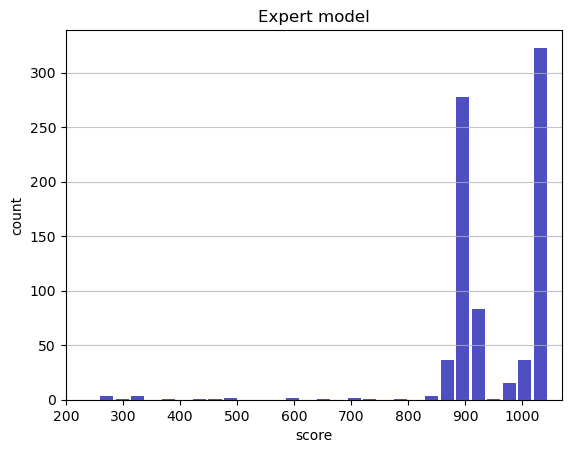

Track generation: 1067..1338 -> 271-tiles track
Epoch: 795
Expert	mean: 949.12	variance: 100.80



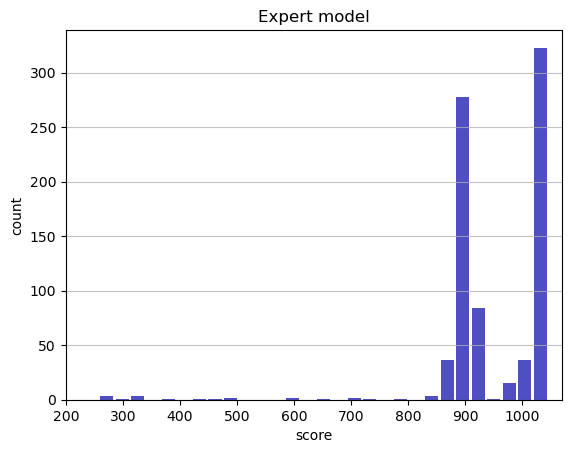

Track generation: 1264..1584 -> 320-tiles track
Epoch: 796
Expert	mean: 949.21	variance: 100.77



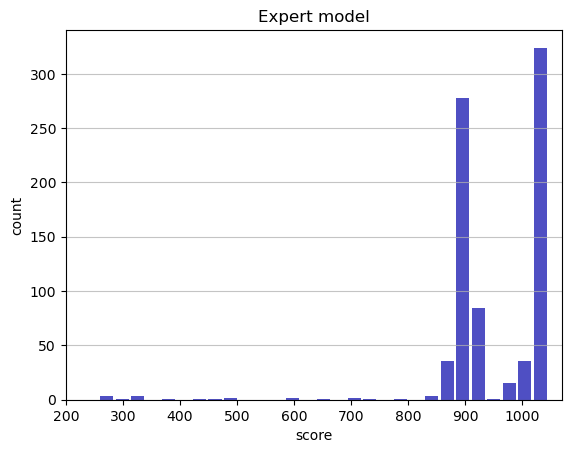

Track generation: 1136..1424 -> 288-tiles track
Epoch: 797
Expert	mean: 949.17	variance: 100.71



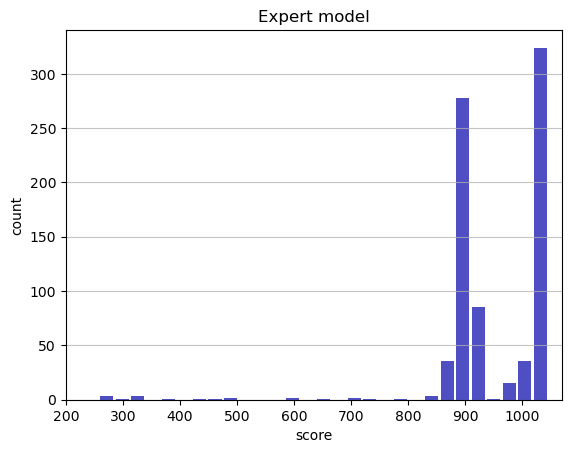

Track generation: 1023..1289 -> 266-tiles track
Epoch: 798
Expert	mean: 949.27	variance: 100.69



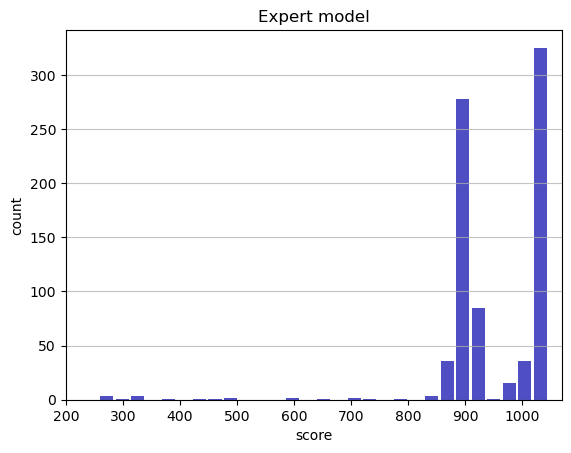

Track generation: 1210..1517 -> 307-tiles track
Epoch: 799
Expert	mean: 948.67	variance: 102.07



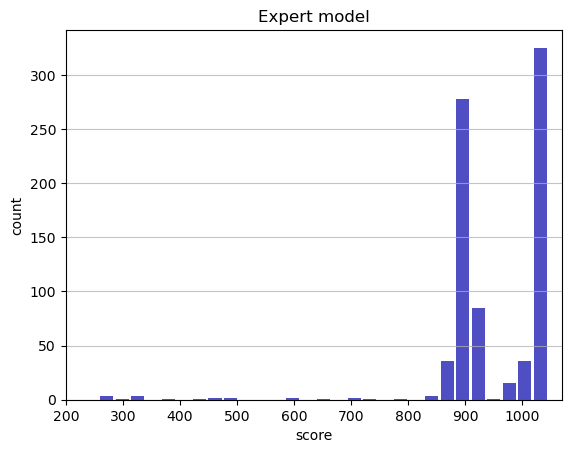

Track generation: 1175..1473 -> 298-tiles track
Epoch: 800
Expert	mean: 948.76	variance: 102.04



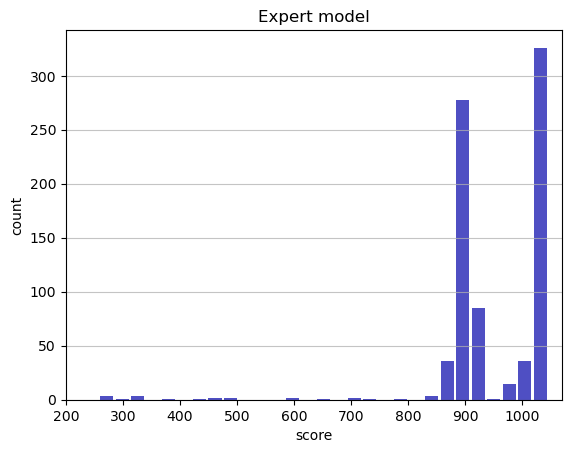

Track generation: 1173..1478 -> 305-tiles track
Epoch: 801
Expert	mean: 948.70	variance: 101.99



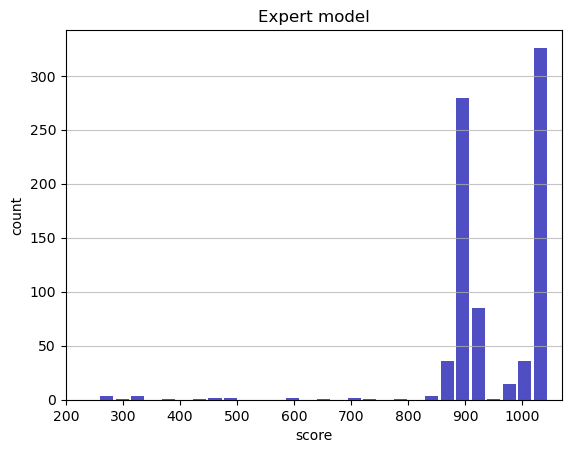

Track generation: 1025..1291 -> 266-tiles track
Epoch: 802
Expert	mean: 948.80	variance: 101.97



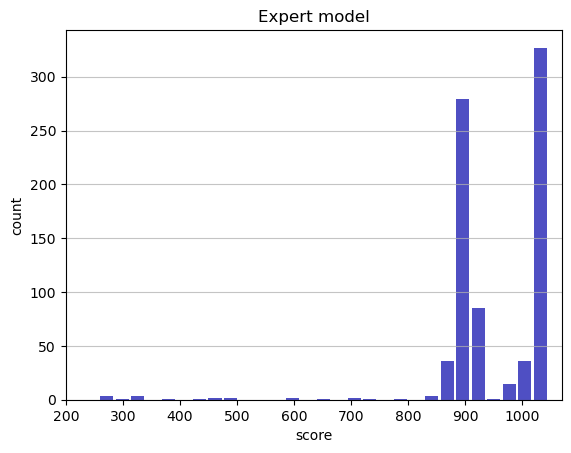

Track generation: 1204..1509 -> 305-tiles track
Epoch: 803
Expert	mean: 948.73	variance: 101.92



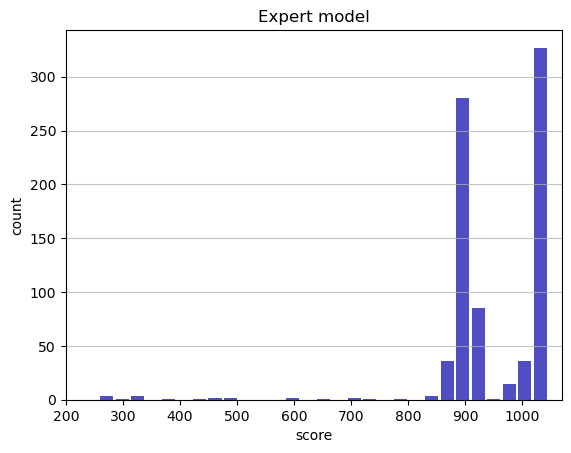

Track generation: 1118..1402 -> 284-tiles track
Epoch: 804
Expert	mean: 948.82	variance: 101.90



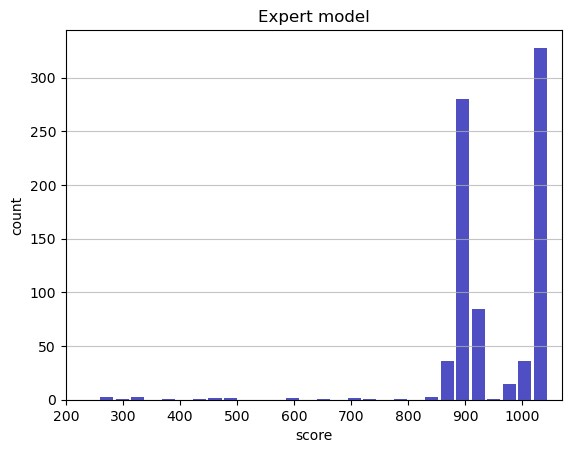

Track generation: 1162..1457 -> 295-tiles track
Epoch: 805
Expert	mean: 948.77	variance: 101.85



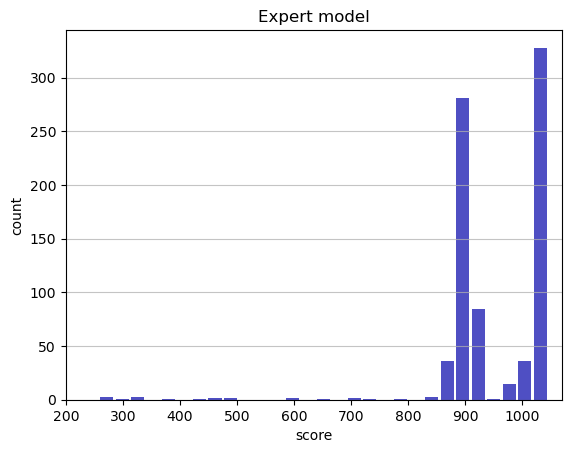

Track generation: 1071..1343 -> 272-tiles track
Epoch: 806
Expert	mean: 948.88	variance: 101.83



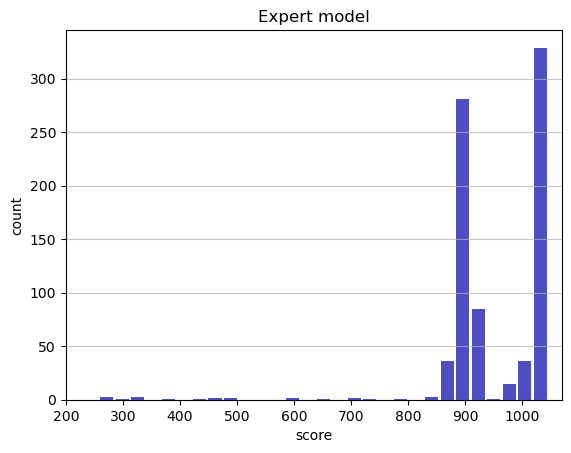

Track generation: 1314..1647 -> 333-tiles track
Epoch: 807
Expert	mean: 948.80	variance: 101.79



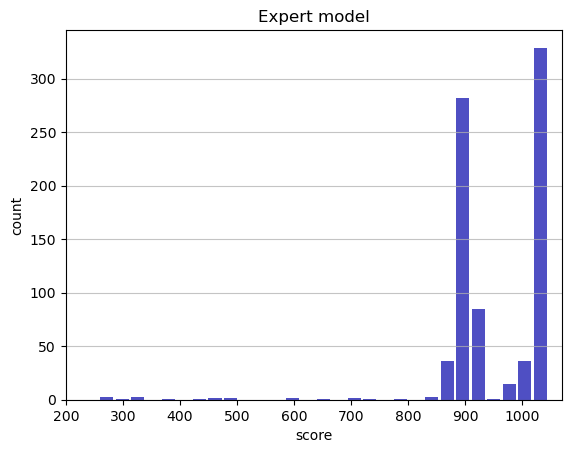

Track generation: 1080..1354 -> 274-tiles track
Epoch: 808
Expert	mean: 948.90	variance: 101.77



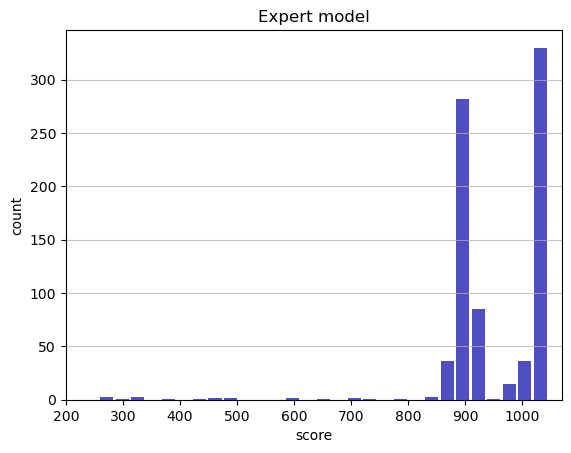

Track generation: 1300..1629 -> 329-tiles track
Epoch: 809
Expert	mean: 948.98	variance: 101.73



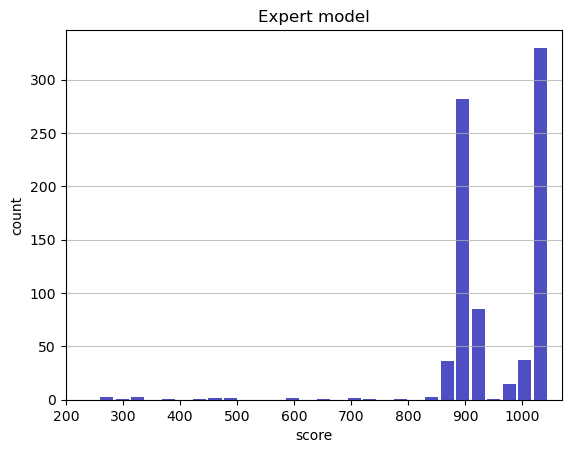

Track generation: 1129..1420 -> 291-tiles track
Epoch: 810
Expert	mean: 949.08	variance: 101.70



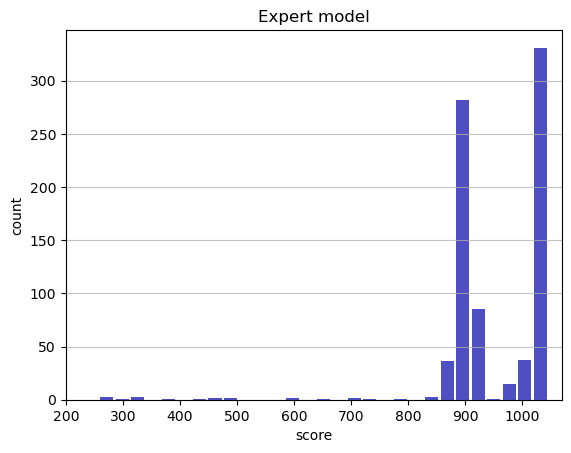

Track generation: 1136..1424 -> 288-tiles track
Epoch: 811
Expert	mean: 949.02	variance: 101.66



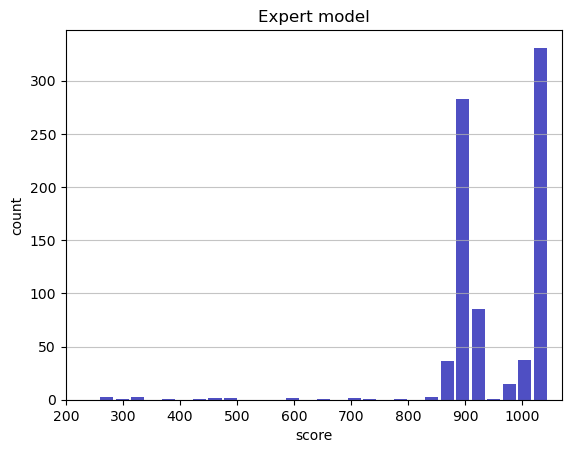

Track generation: 1089..1373 -> 284-tiles track
Epoch: 812
Expert	mean: 949.12	variance: 101.64



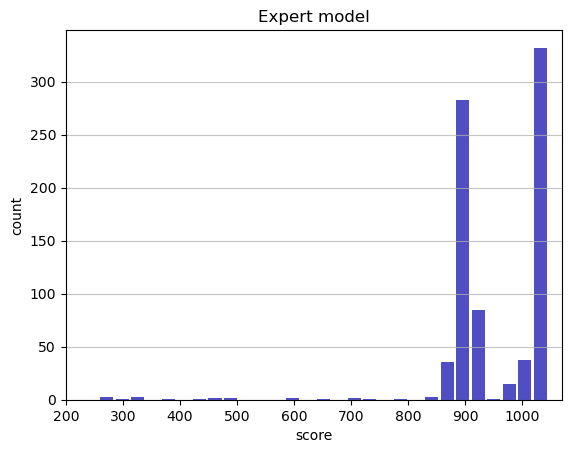

Track generation: 1240..1554 -> 314-tiles track
Epoch: 813
Expert	mean: 949.20	variance: 101.60



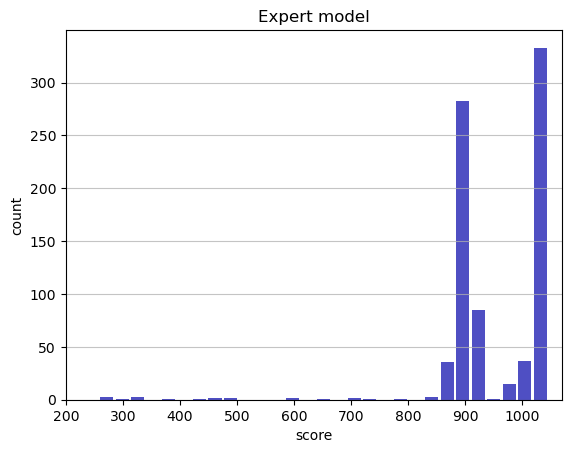

Track generation: 1059..1328 -> 269-tiles track
Epoch: 814
Expert	mean: 949.17	variance: 101.54



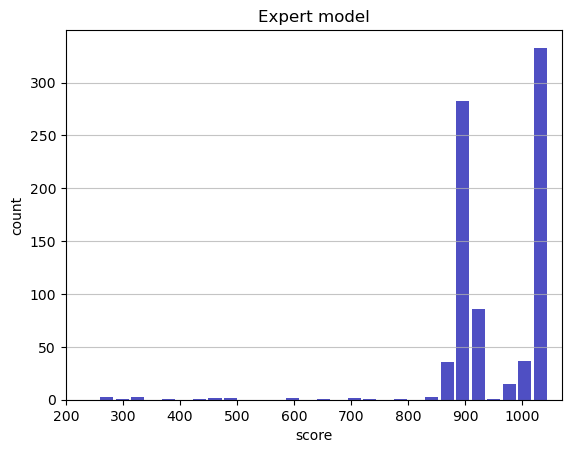

Track generation: 1059..1328 -> 269-tiles track
Epoch: 815
Expert	mean: 949.27	variance: 101.53



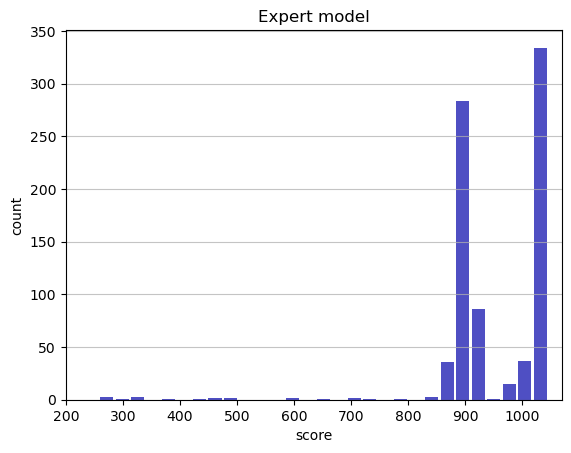

Track generation: 1097..1382 -> 285-tiles track
Epoch: 816
Expert	mean: 949.37	variance: 101.50



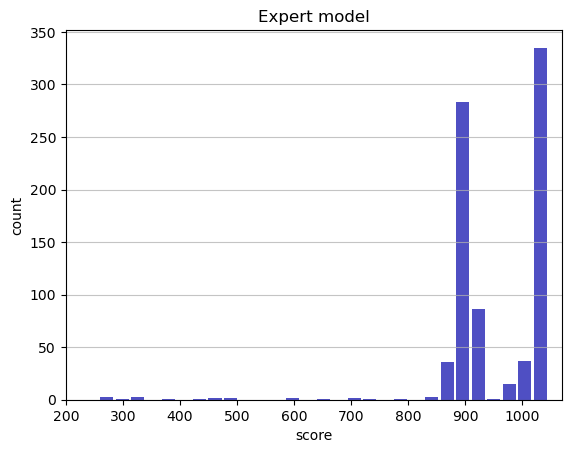

Track generation: 1207..1520 -> 313-tiles track
Epoch: 817
Expert	mean: 949.45	variance: 101.46



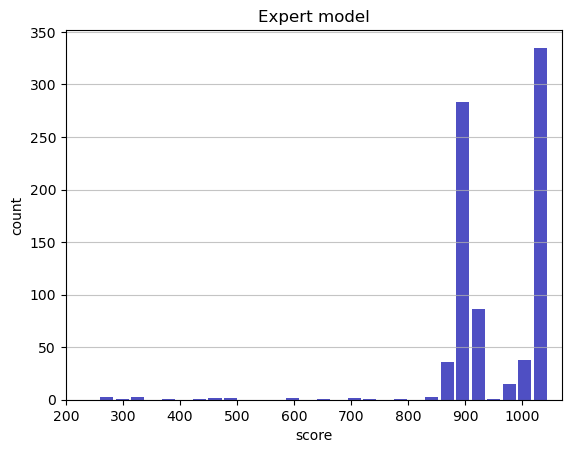

Track generation: 1130..1417 -> 287-tiles track
Epoch: 818
Expert	mean: 949.39	variance: 101.42



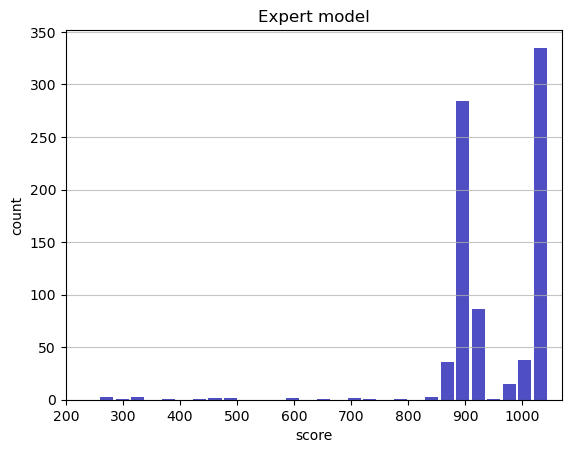

Track generation: 1031..1297 -> 266-tiles track
Epoch: 819
Expert	mean: 949.49	variance: 101.39



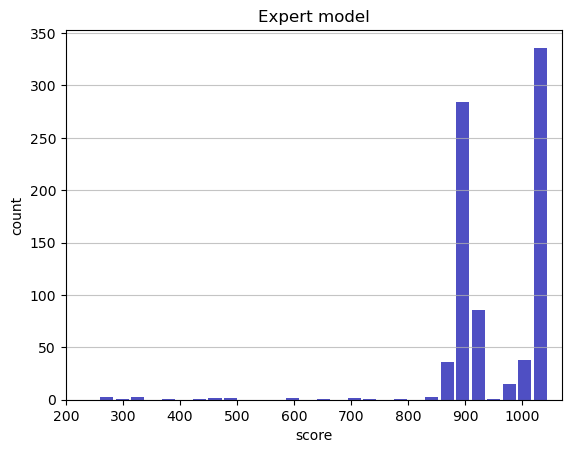

Track generation: 1192..1494 -> 302-tiles track
Epoch: 820
Expert	mean: 949.26	variance: 101.54



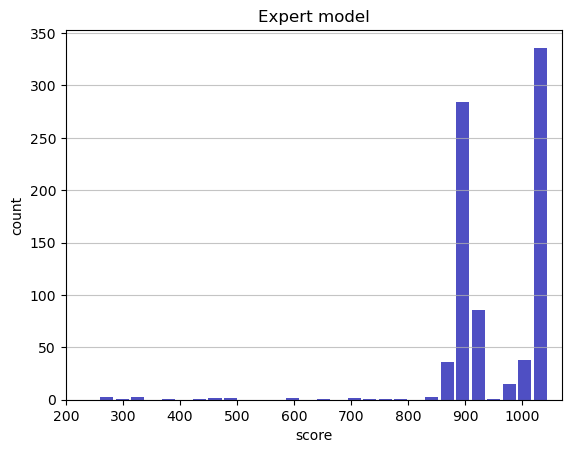

Track generation: 1096..1374 -> 278-tiles track
Epoch: 821
Expert	mean: 949.20	variance: 101.50



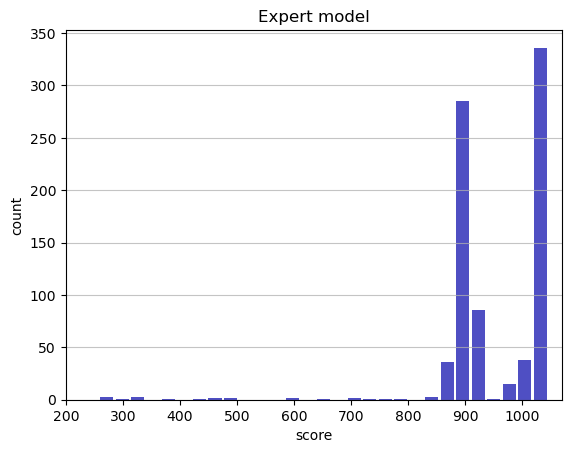

Track generation: 1204..1509 -> 305-tiles track
Epoch: 822
Expert	mean: 949.12	variance: 101.46



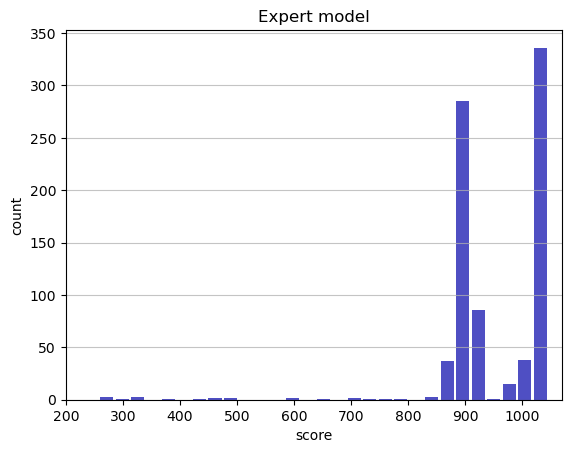

Track generation: 1025..1289 -> 264-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1138..1427 -> 289-tiles track
Epoch: 823
Expert	mean: 949.07	variance: 101.41



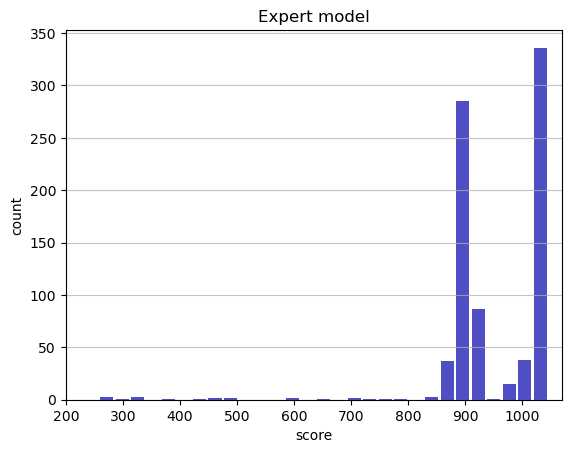

Track generation: 1141..1431 -> 290-tiles track
Epoch: 824
Expert	mean: 949.17	variance: 101.39



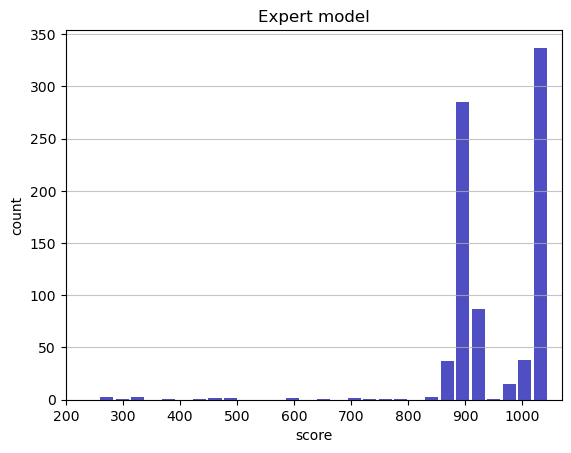

Track generation: 1071..1343 -> 272-tiles track
Epoch: 825
Expert	mean: 949.11	variance: 101.34



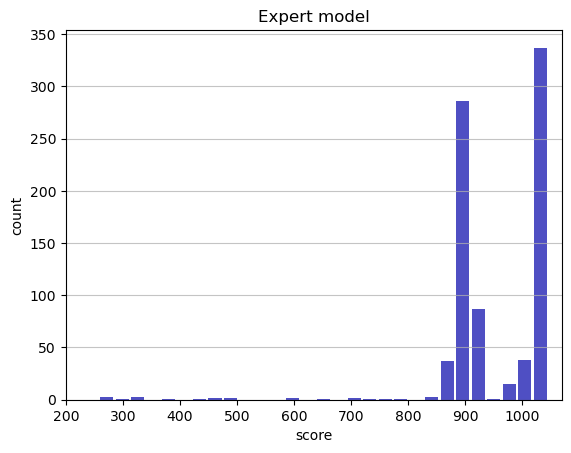

Track generation: 1143..1433 -> 290-tiles track
Epoch: 826
Expert	mean: 949.21	variance: 101.32



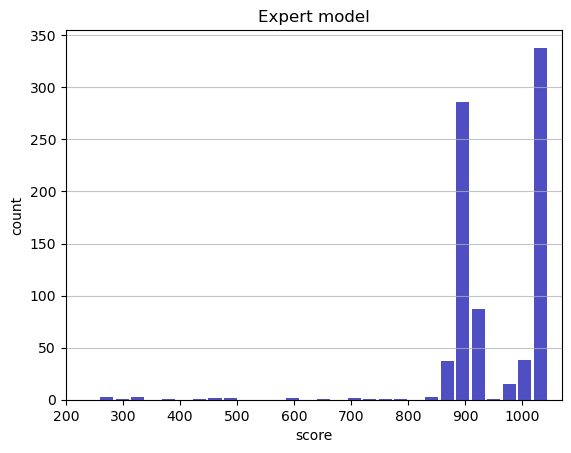

Track generation: 1167..1462 -> 295-tiles track
Epoch: 827
Expert	mean: 949.16	variance: 101.26



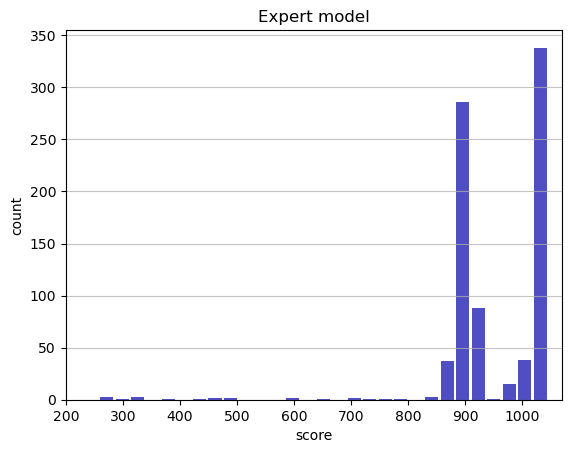

Track generation: 1085..1360 -> 275-tiles track
Epoch: 828
Expert	mean: 949.26	variance: 101.25



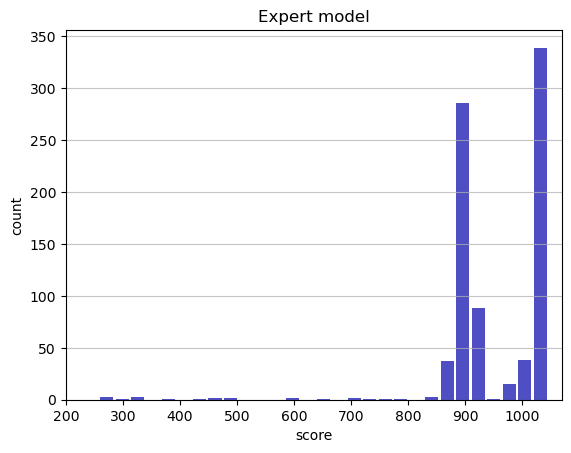

Track generation: 1260..1579 -> 319-tiles track
Epoch: 829
Expert	mean: 949.20	variance: 101.20



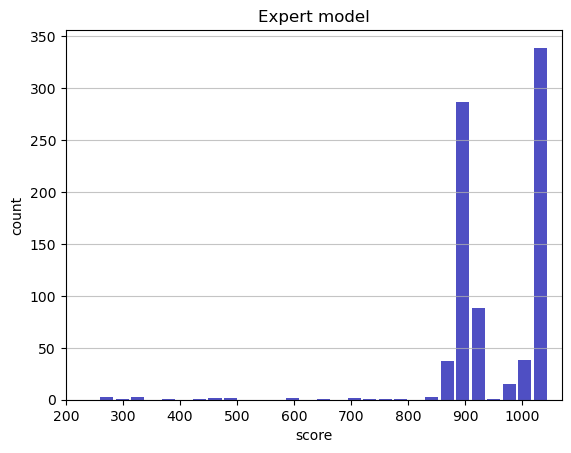

Track generation: 1300..1629 -> 329-tiles track
Epoch: 830
Expert	mean: 949.28	variance: 101.17



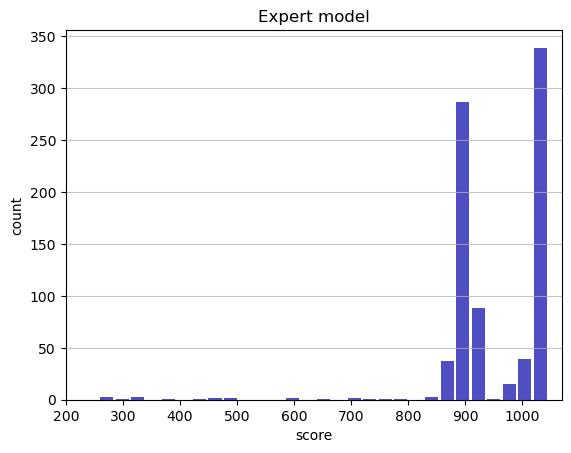

Track generation: 1191..1493 -> 302-tiles track
Epoch: 831
Expert	mean: 949.37	variance: 101.14



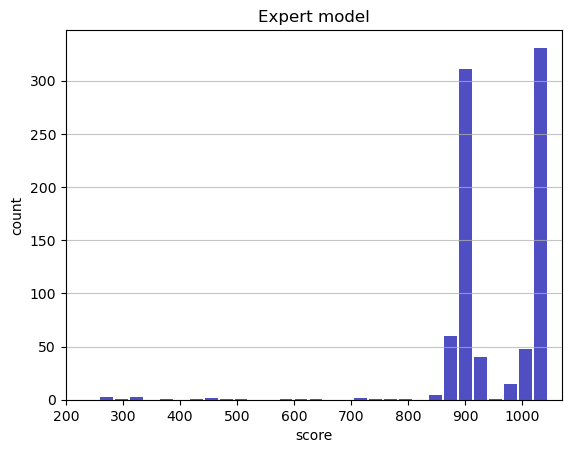

Track generation: 1214..1524 -> 310-tiles track
Epoch: 832
Expert	mean: 949.45	variance: 101.11



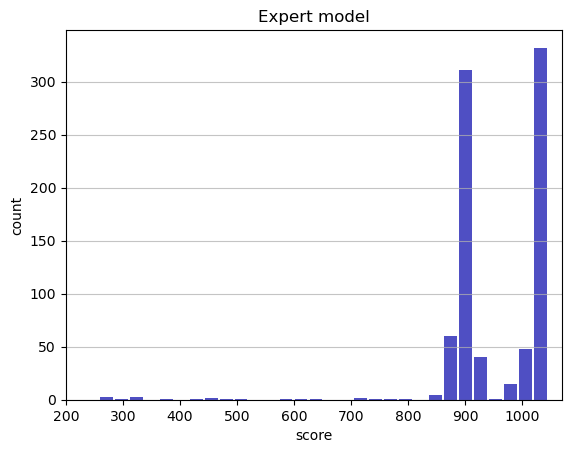

Track generation: 1012..1272 -> 260-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1248..1565 -> 317-tiles track
Epoch: 833
Expert	mean: 949.53	variance: 101.07



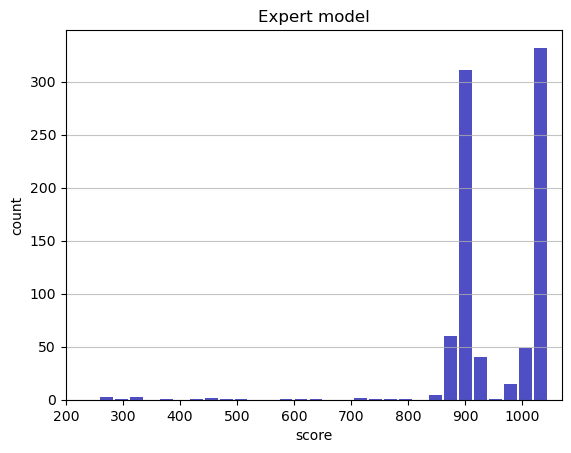

Track generation: 1226..1537 -> 311-tiles track
Epoch: 834
Expert	mean: 949.62	variance: 101.05



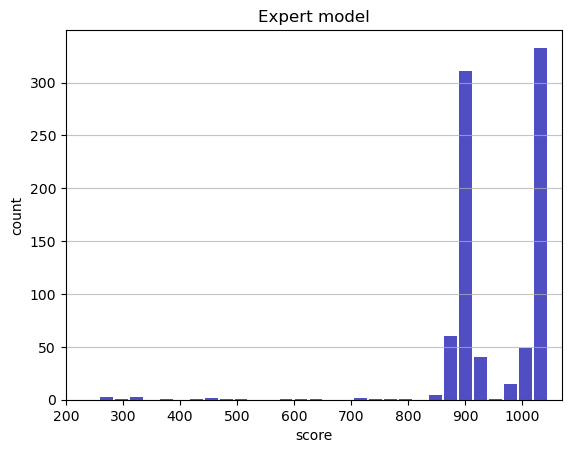

Track generation: 1112..1394 -> 282-tiles track
Epoch: 835
Expert	mean: 949.57	variance: 101.00



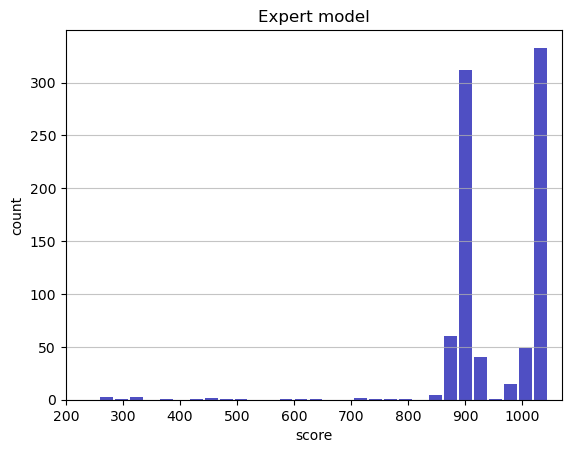

Track generation: 1168..1464 -> 296-tiles track
Epoch: 836
Expert	mean: 949.66	variance: 100.97



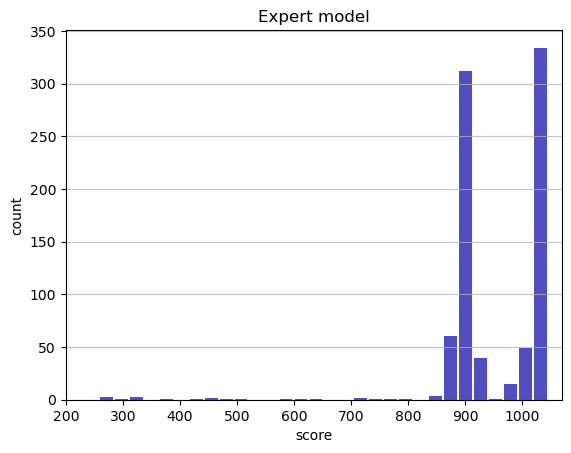

Track generation: 1327..1671 -> 344-tiles track
Epoch: 837
Expert	mean: 949.70	variance: 100.92



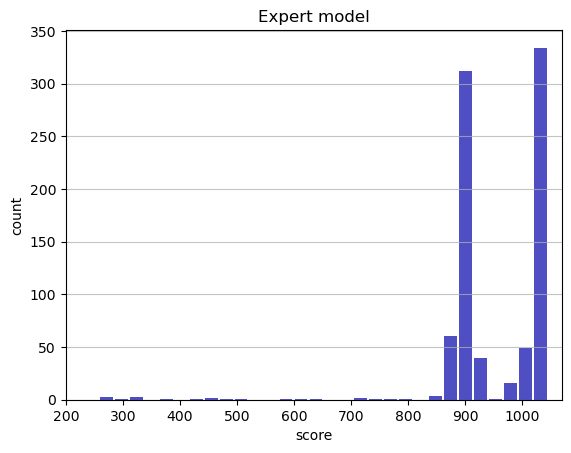

Track generation: 1217..1525 -> 308-tiles track
Epoch: 838
Expert	mean: 949.64	variance: 100.87



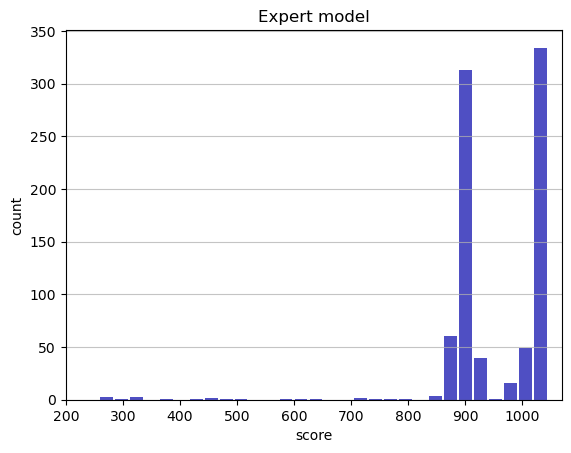

Track generation: 1222..1532 -> 310-tiles track
Epoch: 839
Expert	mean: 949.72	variance: 100.84



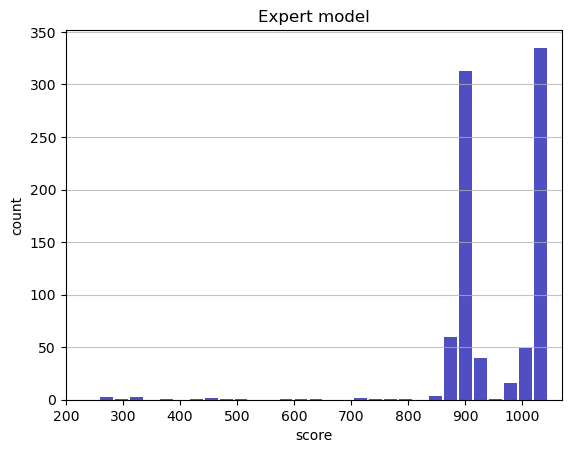

Track generation: 1164..1459 -> 295-tiles track
Epoch: 840
Expert	mean: 949.66	variance: 100.80



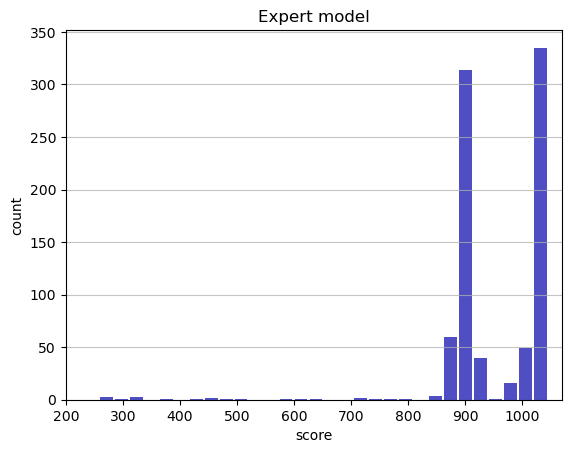

Track generation: 1064..1334 -> 270-tiles track
Epoch: 841
Expert	mean: 949.77	variance: 100.78



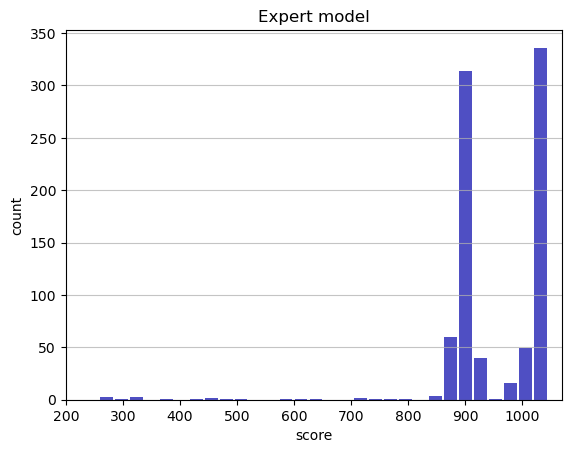

Track generation: 1173..1470 -> 297-tiles track
Epoch: 842
Expert	mean: 949.85	variance: 100.75



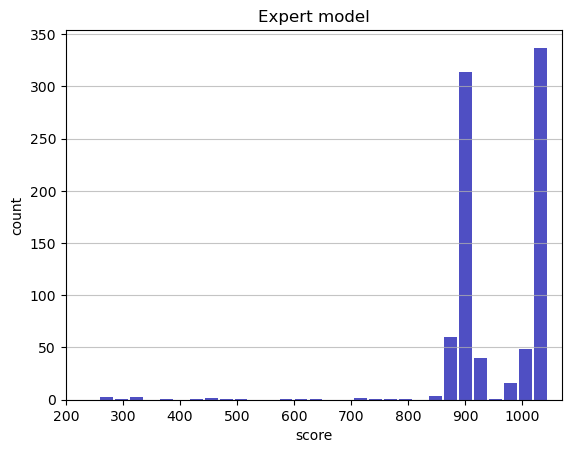

Track generation: 1187..1488 -> 301-tiles track
Epoch: 843
Expert	mean: 949.78	variance: 100.71



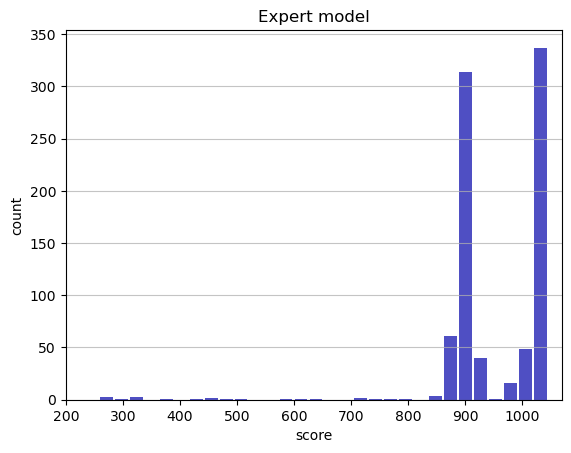

Track generation: 1259..1578 -> 319-tiles track
Epoch: 844
Expert	mean: 949.72	variance: 100.67



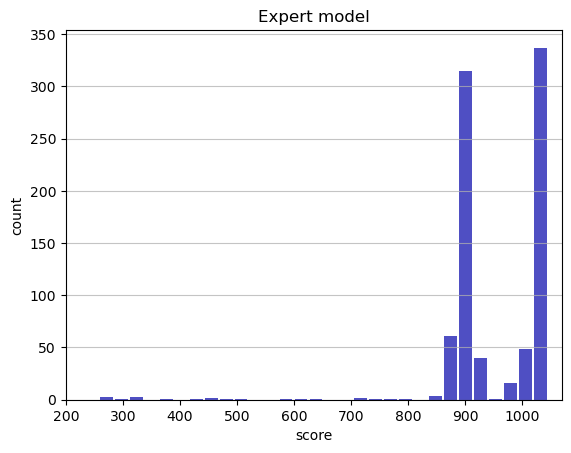

Track generation: 1087..1372 -> 285-tiles track
Epoch: 845
Expert	mean: 949.81	variance: 100.65



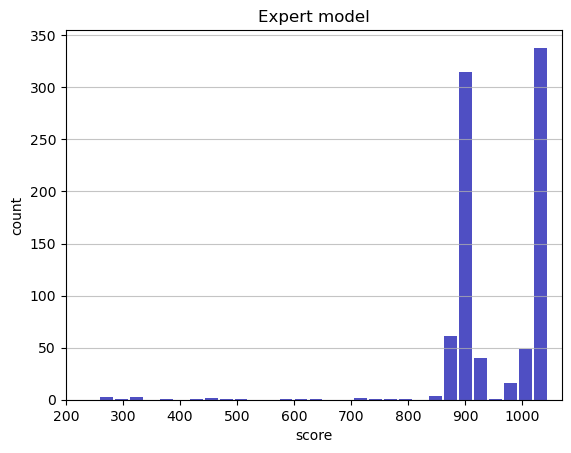

Track generation: 1250..1576 -> 326-tiles track
Epoch: 846
Expert	mean: 949.74	variance: 100.60



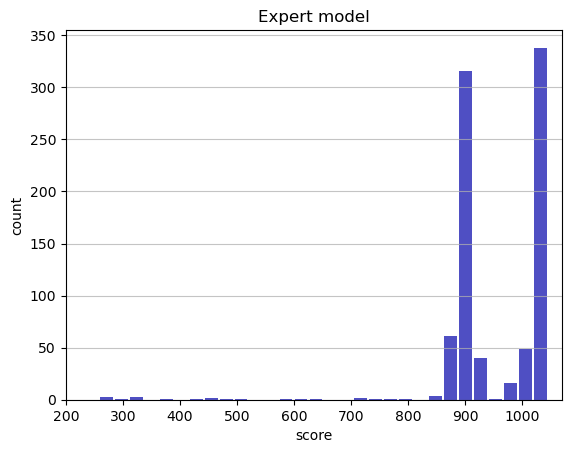

Track generation: 1124..1412 -> 288-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1164..1465 -> 301-tiles track
Epoch: 847
Expert	mean: 949.83	variance: 100.57



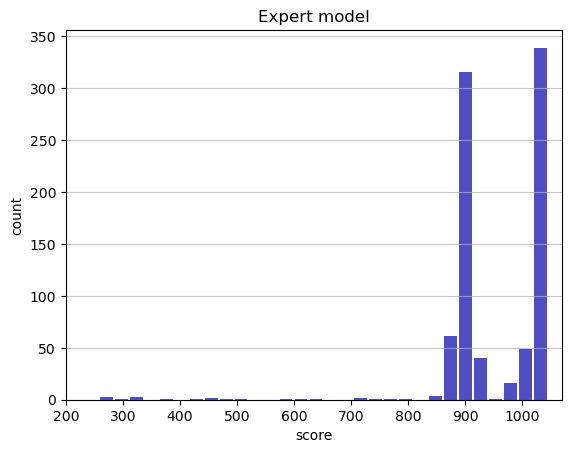

Track generation: 1294..1621 -> 327-tiles track
Epoch: 848
Expert	mean: 949.87	variance: 100.52



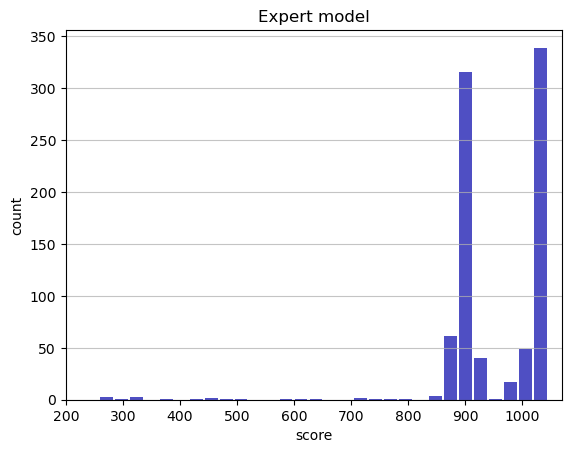

Track generation: 1119..1403 -> 284-tiles track
Epoch: 849
Expert	mean: 949.96	variance: 100.50



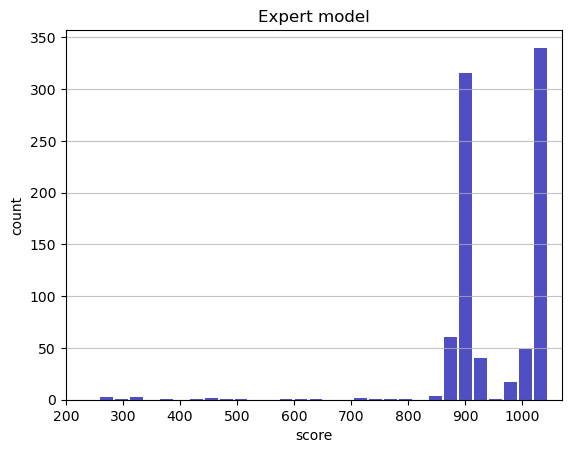

Track generation: 1050..1316 -> 266-tiles track
Epoch: 850
Expert	mean: 949.92	variance: 100.45



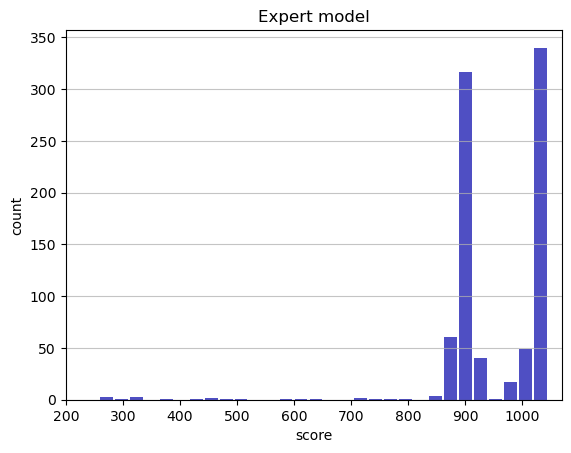

Track generation: 1236..1549 -> 313-tiles track
Epoch: 851
Expert	mean: 949.86	variance: 100.41



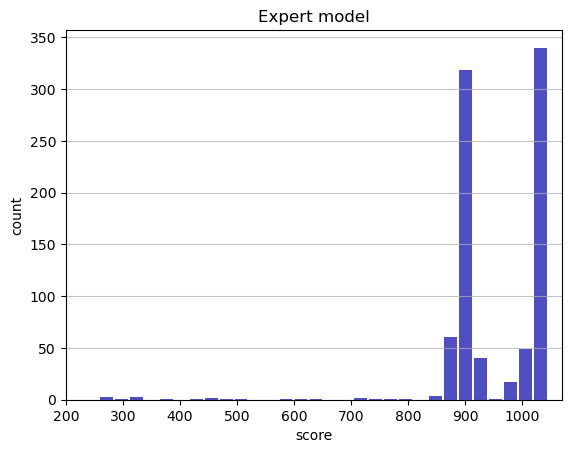

Track generation: 1136..1424 -> 288-tiles track
Epoch: 852
Expert	mean: 949.96	variance: 100.39



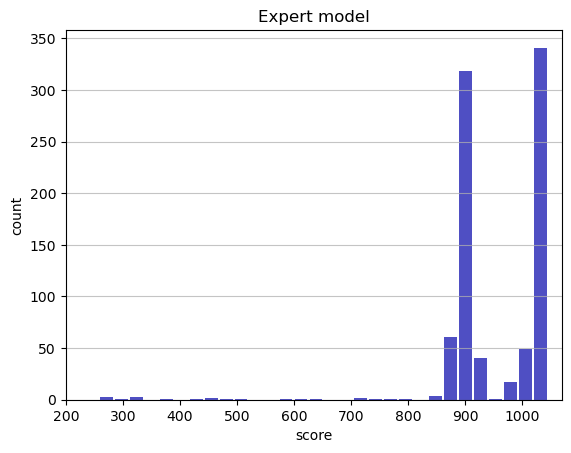

Track generation: 1099..1378 -> 279-tiles track
Epoch: 853
Expert	mean: 950.06	variance: 100.37



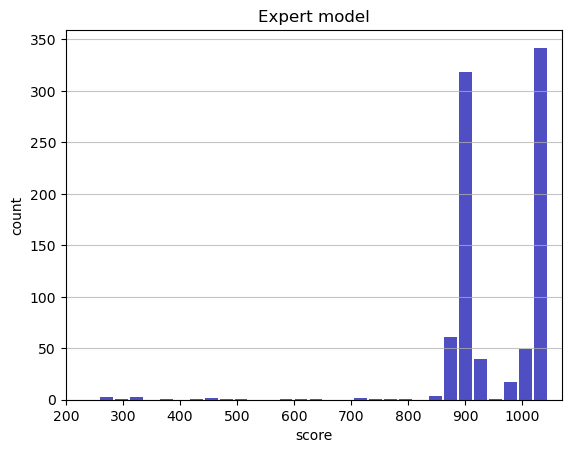

Track generation: 1143..1433 -> 290-tiles track
Epoch: 854
Expert	mean: 949.99	variance: 100.32



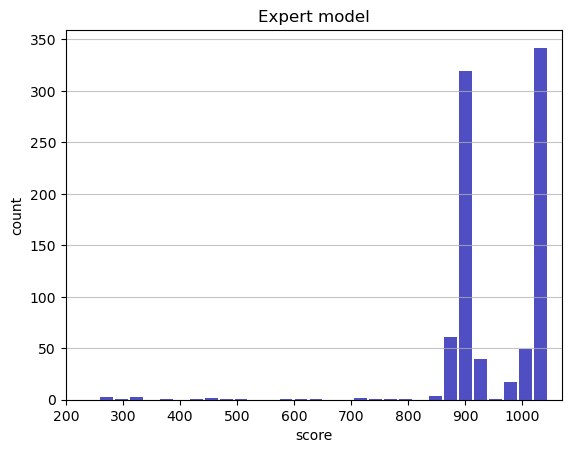

Track generation: 1245..1560 -> 315-tiles track
Epoch: 855
Expert	mean: 950.08	variance: 100.30



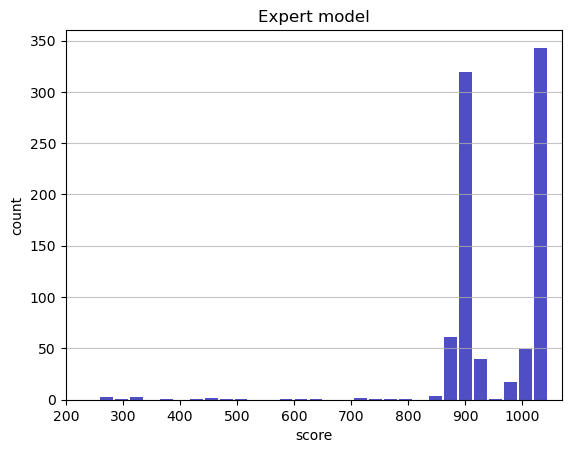

Track generation: 921..1159 -> 238-tiles track
Epoch: 856
Expert	mean: 950.19	variance: 100.29



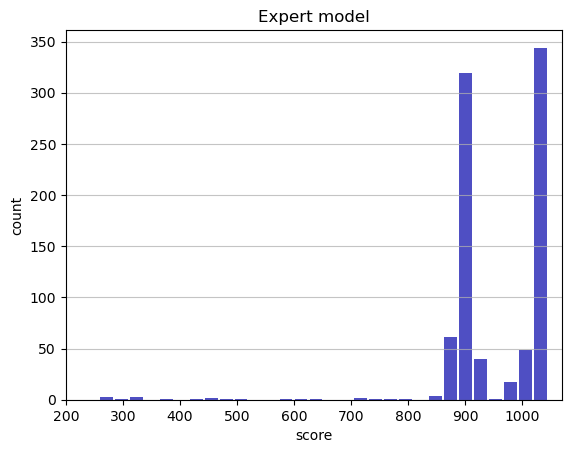

Track generation: 1164..1459 -> 295-tiles track
Epoch: 857
Expert	mean: 950.13	variance: 100.25



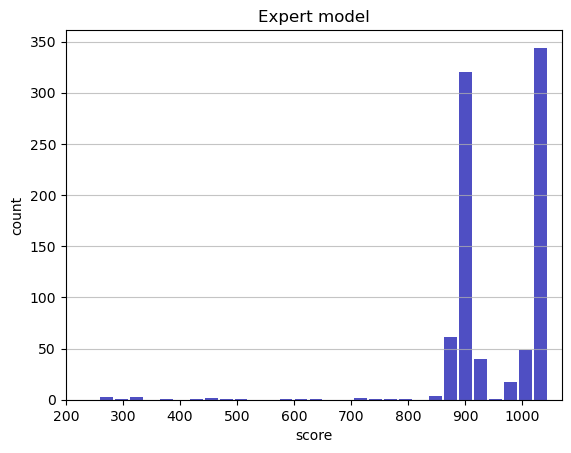

Track generation: 1116..1399 -> 283-tiles track
Epoch: 858
Expert	mean: 950.08	variance: 100.20



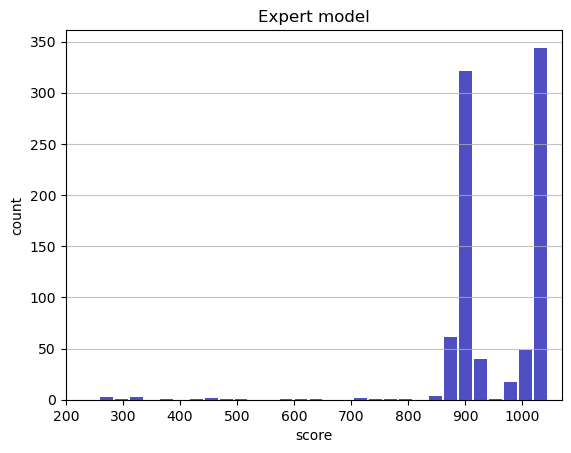

Track generation: 1058..1332 -> 274-tiles track
Epoch: 859
Expert	mean: 950.17	variance: 100.18



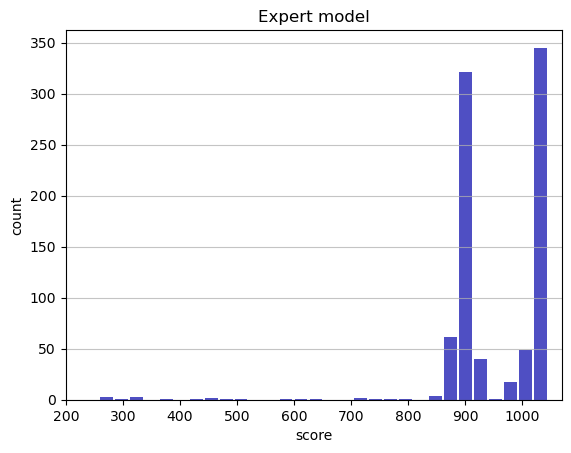

Track generation: 1293..1619 -> 326-tiles track
Epoch: 860
Expert	mean: 950.10	variance: 100.15



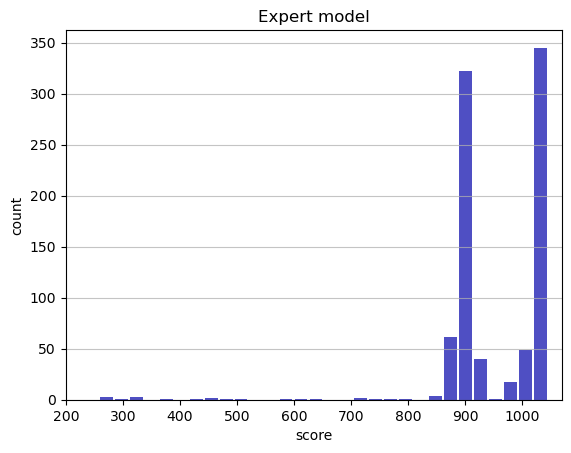

Track generation: 1078..1351 -> 273-tiles track
Epoch: 861
Expert	mean: 950.06	variance: 100.09



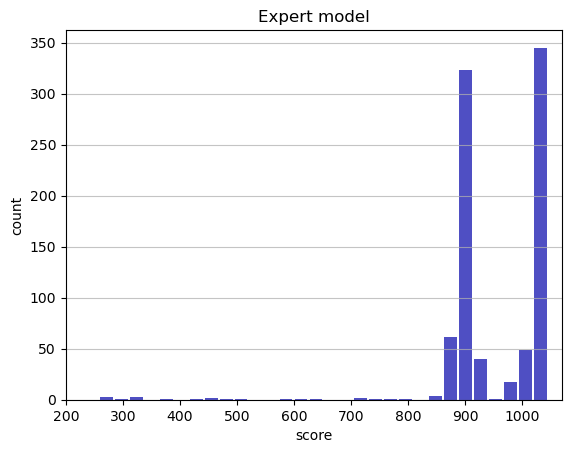

Track generation: 1092..1369 -> 277-tiles track
Epoch: 862
Expert	mean: 950.16	variance: 100.08



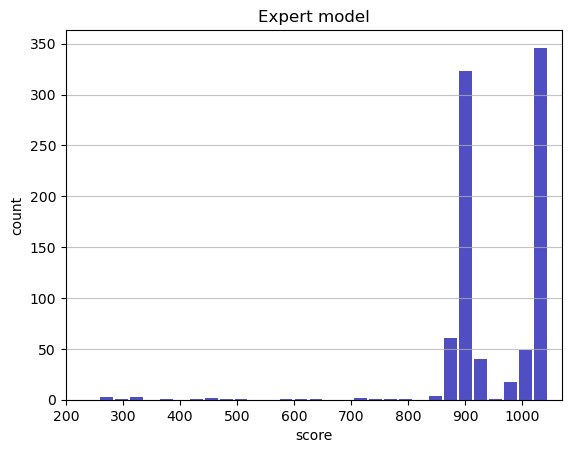

Track generation: 1291..1626 -> 335-tiles track
Epoch: 863
Expert	mean: 950.23	variance: 100.04



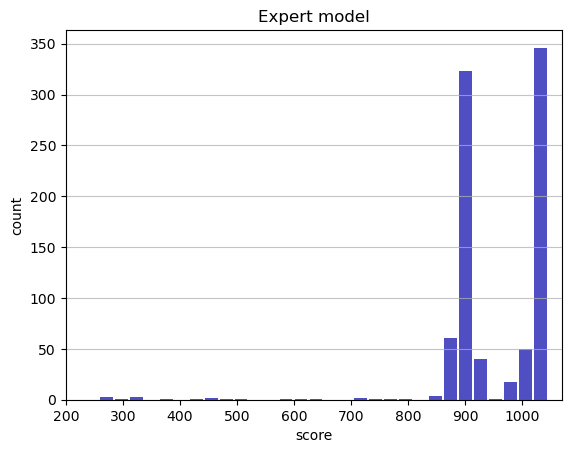

Track generation: 1073..1345 -> 272-tiles track
Epoch: 864
Expert	mean: 950.33	variance: 100.03



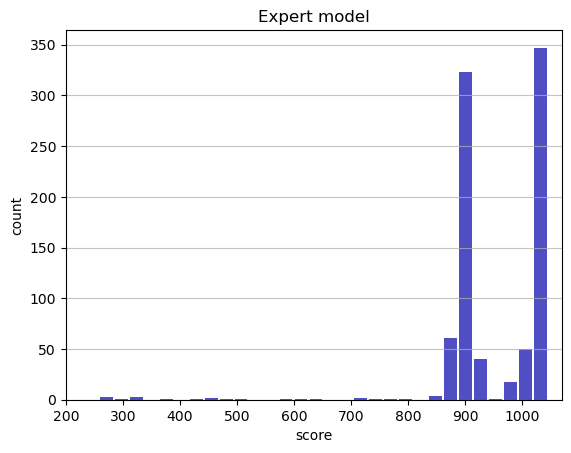

Track generation: 1189..1490 -> 301-tiles track
Epoch: 865
Expert	mean: 950.27	variance: 99.98



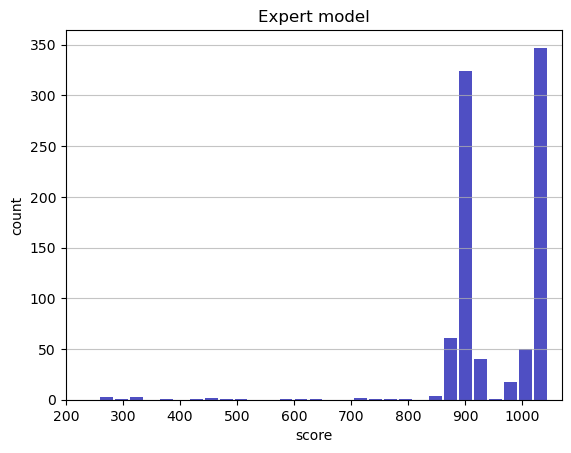

Track generation: 1127..1413 -> 286-tiles track
Epoch: 866
Expert	mean: 950.21	variance: 99.94



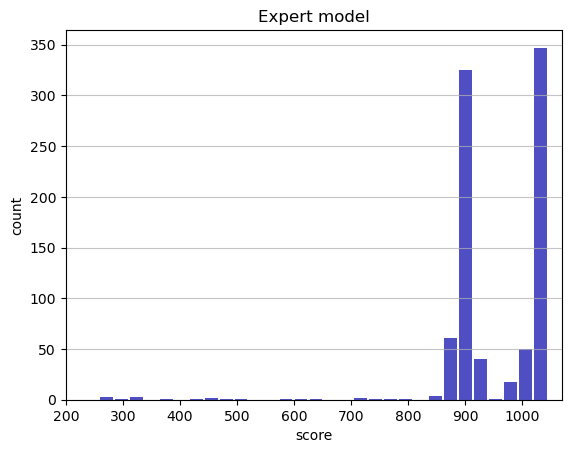

Track generation: 1348..1689 -> 341-tiles track
Epoch: 867
Expert	mean: 950.27	variance: 99.91



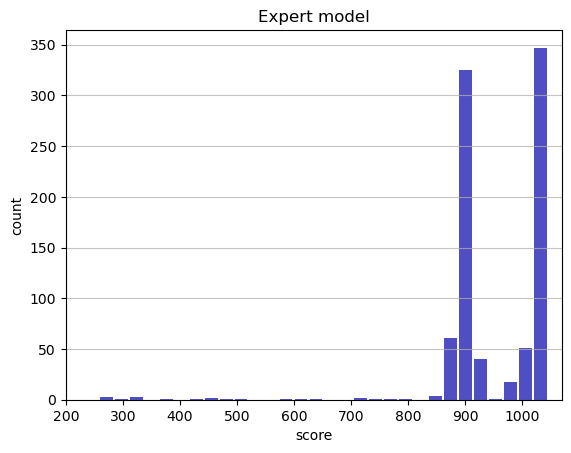

Track generation: 1046..1312 -> 266-tiles track
Epoch: 868
Expert	mean: 950.22	variance: 99.86



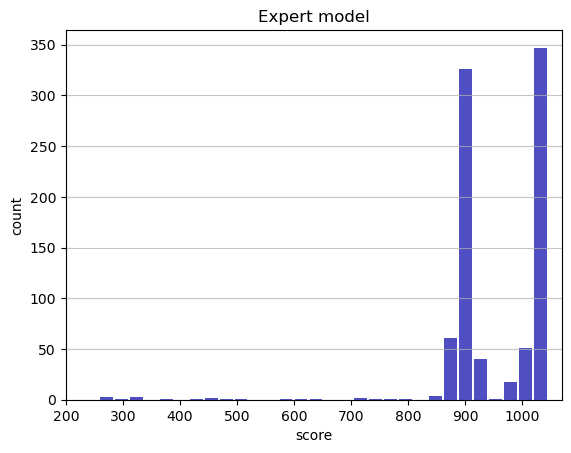

Track generation: 1171..1468 -> 297-tiles track
Epoch: 869
Expert	mean: 950.17	variance: 99.82



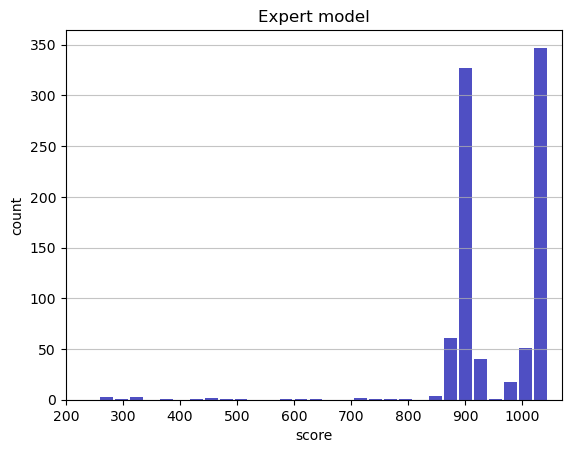

Track generation: 1150..1442 -> 292-tiles track
Epoch: 870
Expert	mean: 949.98	variance: 99.91



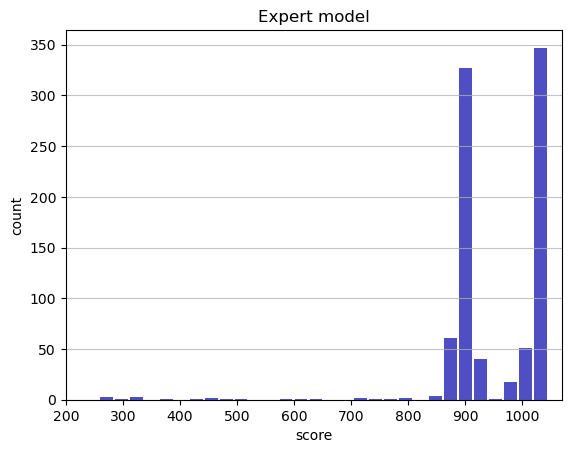

Track generation: 1129..1415 -> 286-tiles track
Epoch: 871
Expert	mean: 950.07	variance: 99.90



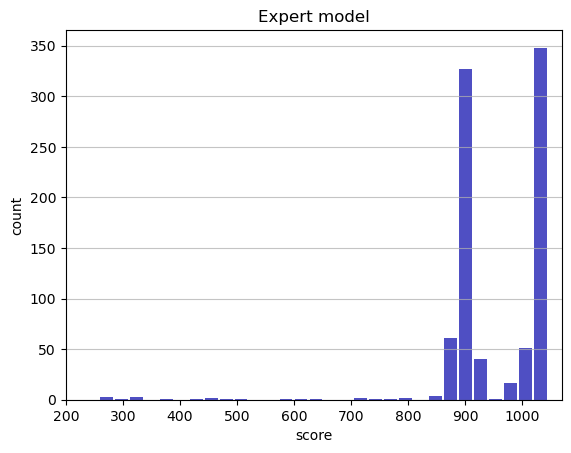

Track generation: 1269..1590 -> 321-tiles track
Epoch: 872
Expert	mean: 950.02	variance: 99.85



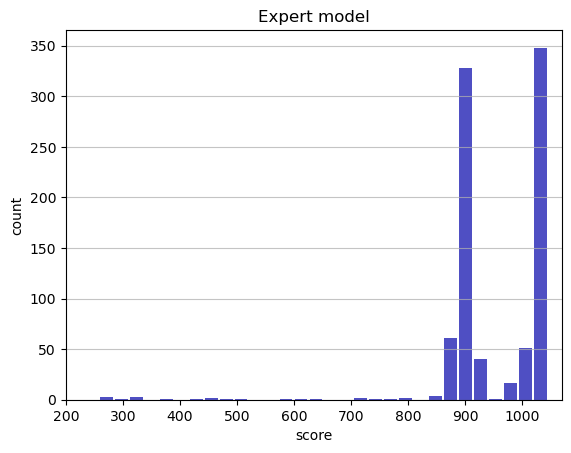

Track generation: 1167..1463 -> 296-tiles track
Epoch: 873
Expert	mean: 950.11	variance: 99.83



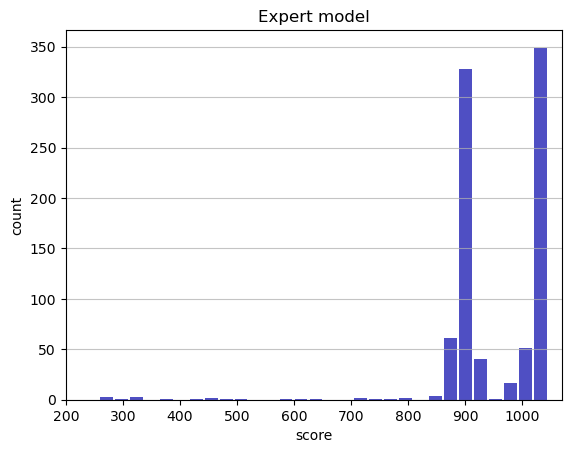

Track generation: 1295..1624 -> 329-tiles track
Epoch: 874
Expert	mean: 950.04	variance: 99.80



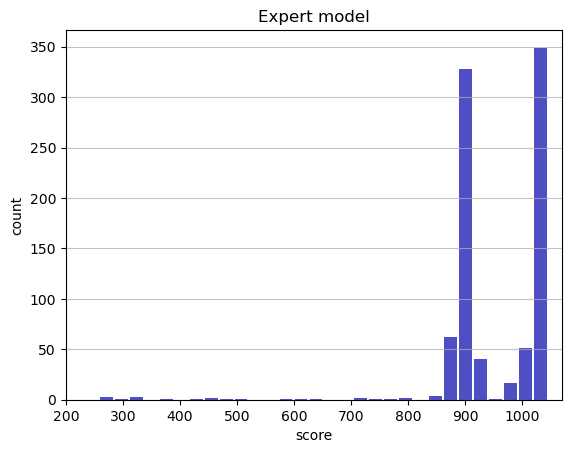

Track generation: 1127..1420 -> 293-tiles track
Epoch: 875
Expert	mean: 949.99	variance: 99.75



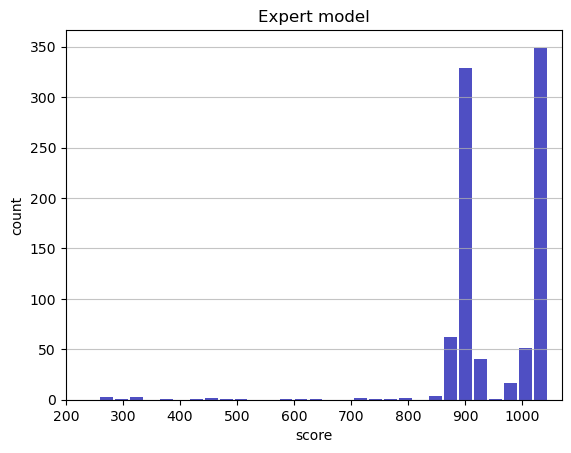

Track generation: 1187..1488 -> 301-tiles track
Epoch: 876
Expert	mean: 949.92	variance: 99.72



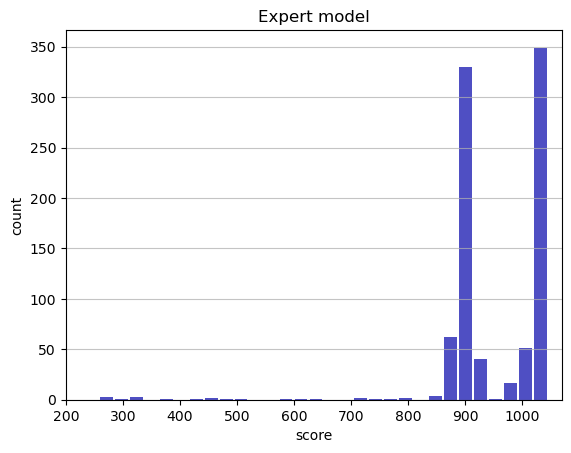

Track generation: 1087..1363 -> 276-tiles track
Epoch: 877
Expert	mean: 949.88	variance: 99.67



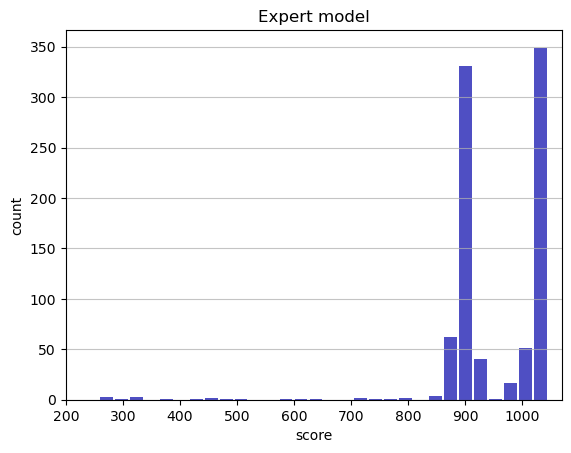

Track generation: 976..1224 -> 248-tiles track
Epoch: 878
Expert	mean: 949.98	variance: 99.66



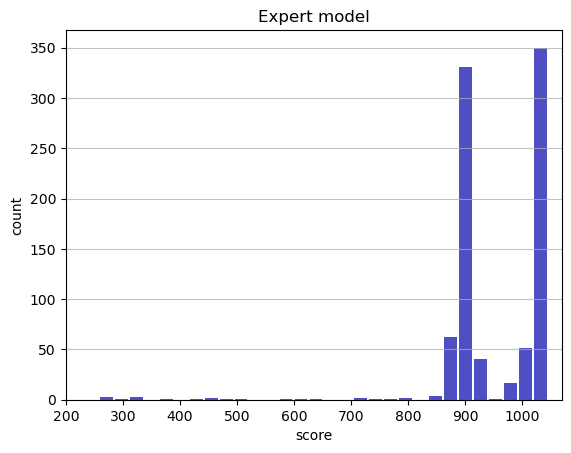

Track generation: 1091..1368 -> 277-tiles track
Epoch: 879
Expert	mean: 950.08	variance: 99.65



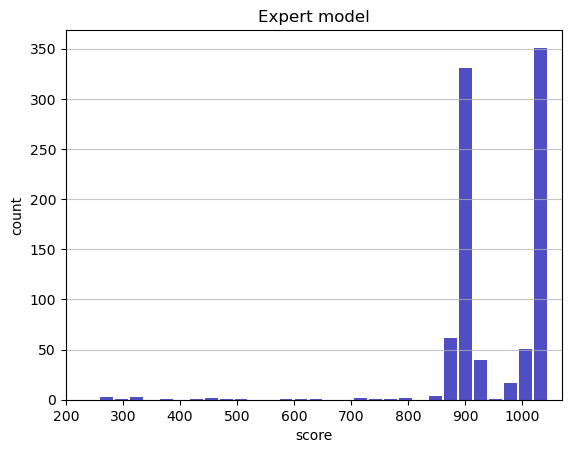

Track generation: 992..1254 -> 262-tiles track
Epoch: 880
Expert	mean: 950.04	variance: 99.60



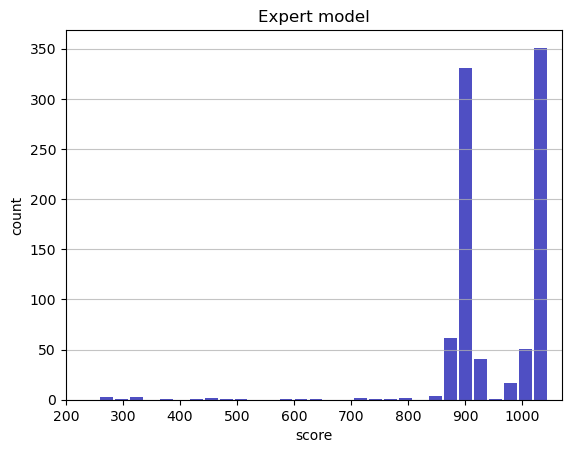

Track generation: 1188..1489 -> 301-tiles track
Epoch: 881
Expert	mean: 950.13	variance: 99.57



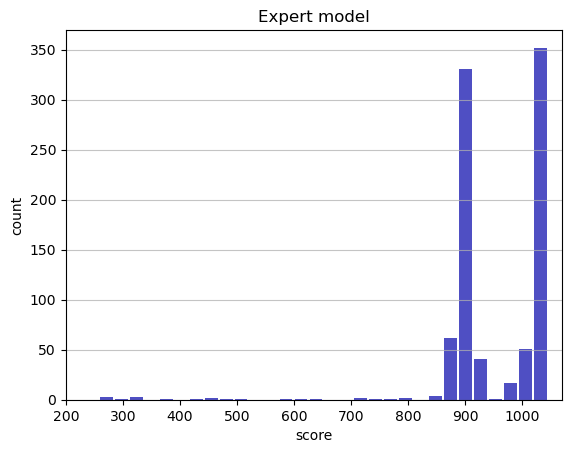

Track generation: 1017..1275 -> 258-tiles track
Epoch: 882
Expert	mean: 950.07	variance: 99.53



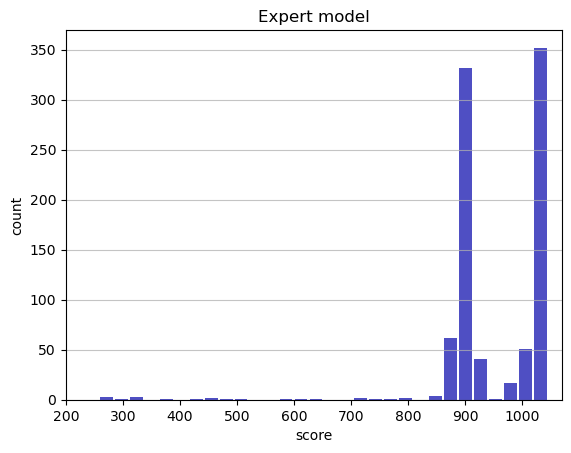

Track generation: 1200..1505 -> 305-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1099..1380 -> 281-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1353..1696 -> 343-tiles track
Epoch: 883
Expert	mean: 950.15	variance: 99.50



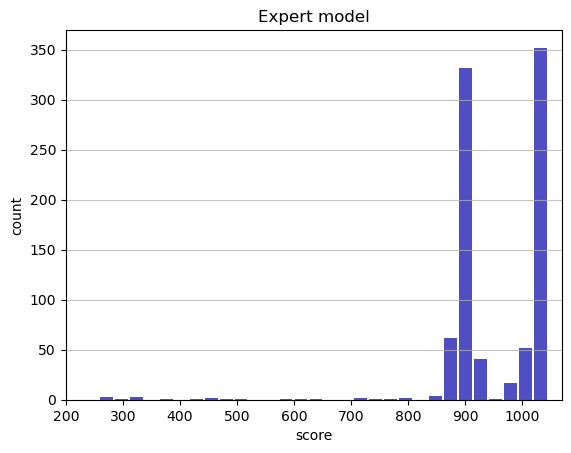

Track generation: 1159..1453 -> 294-tiles track
Epoch: 884
Expert	mean: 950.10	variance: 99.45



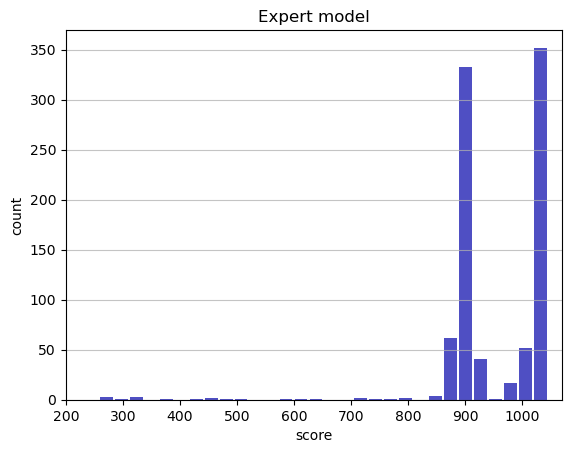

Track generation: 1091..1368 -> 277-tiles track
Epoch: 885
Expert	mean: 950.04	variance: 99.41



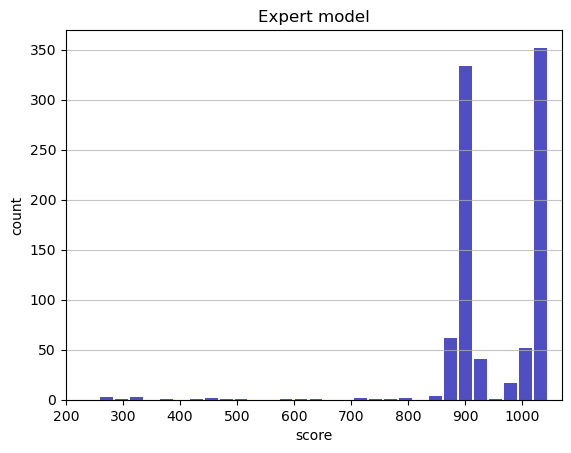

Track generation: 1113..1398 -> 285-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1115..1398 -> 283-tiles track
Epoch: 886
Expert	mean: 949.98	variance: 99.37



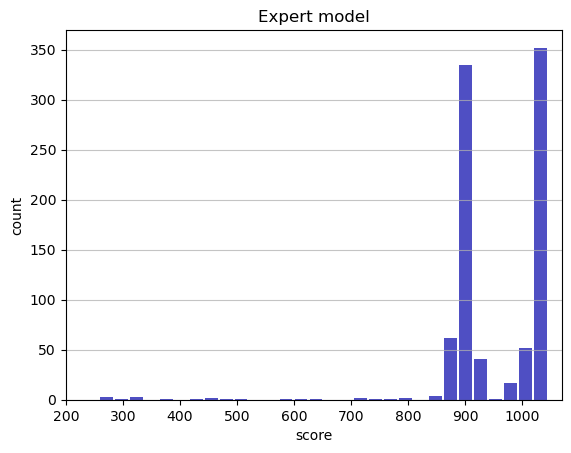

Track generation: 1117..1407 -> 290-tiles track
Epoch: 887
Expert	mean: 949.91	variance: 99.34



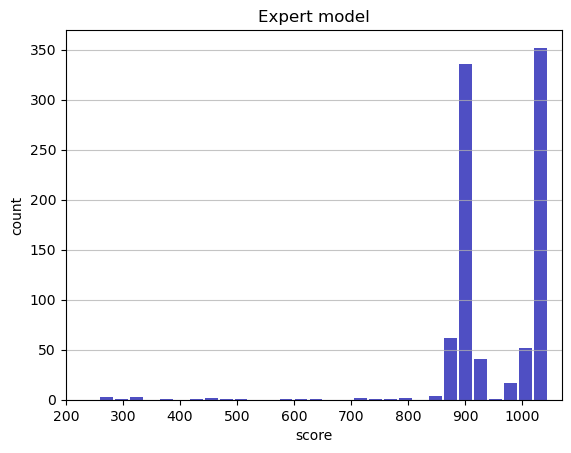

Track generation: 1119..1403 -> 284-tiles track
Epoch: 888
Expert	mean: 949.86	variance: 99.29



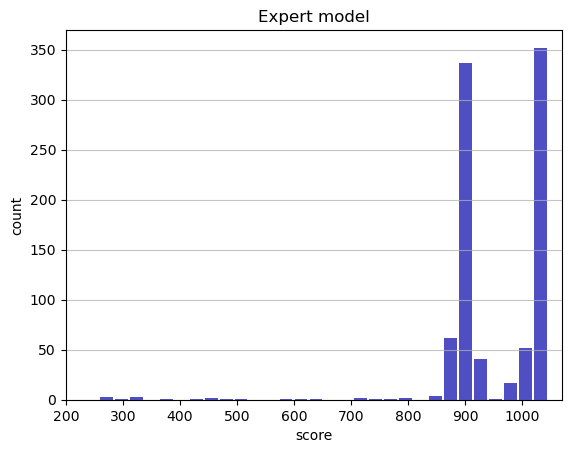

Track generation: 1083..1358 -> 275-tiles track
Epoch: 889
Expert	mean: 949.82	variance: 99.24



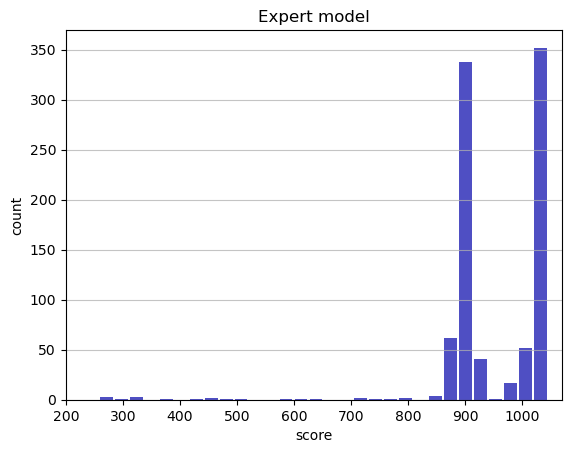

Track generation: 1058..1327 -> 269-tiles track
Epoch: 890
Expert	mean: 949.91	variance: 99.22



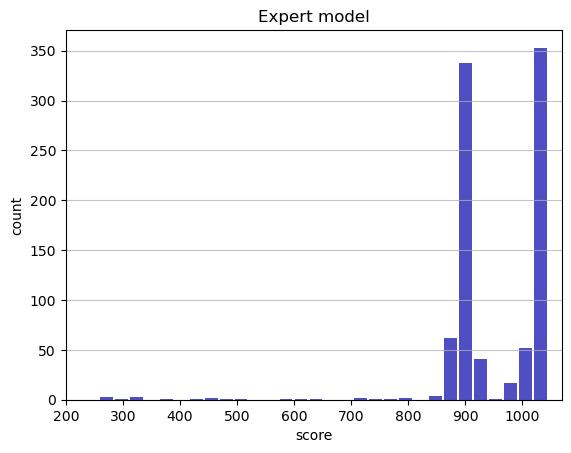

Track generation: 1170..1467 -> 297-tiles track
Epoch: 891
Expert	mean: 949.86	variance: 99.18



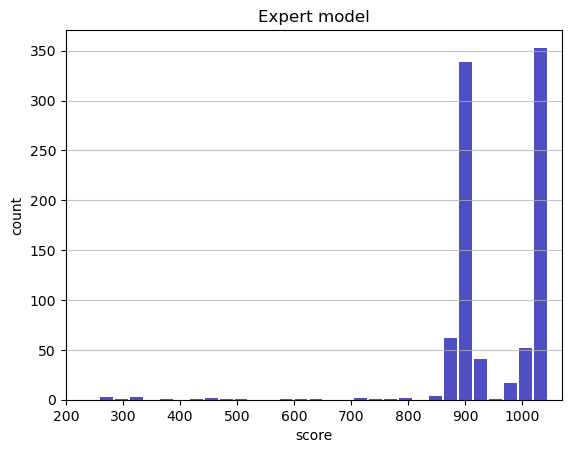

Track generation: 1277..1600 -> 323-tiles track
Epoch: 892
Expert	mean: 949.78	variance: 99.15



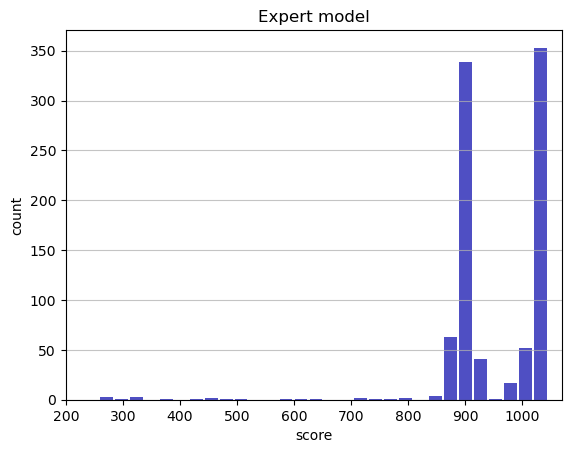

Track generation: 1122..1411 -> 289-tiles track
Epoch: 893
Expert	mean: 949.87	variance: 99.12



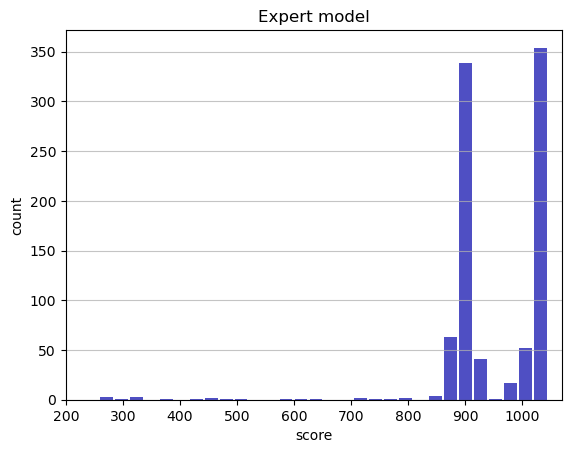

Track generation: 1068..1339 -> 271-tiles track
Epoch: 894
Expert	mean: 949.96	variance: 99.11



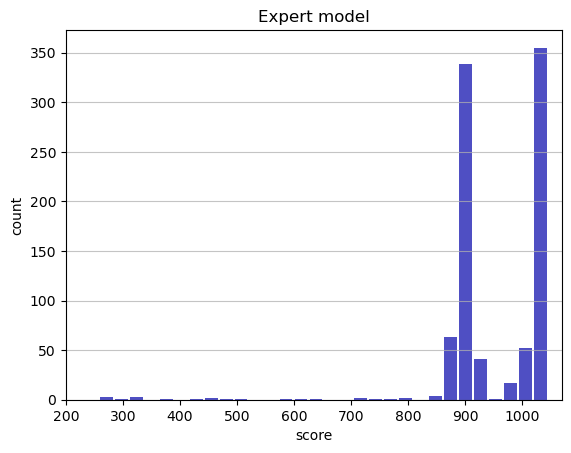

Track generation: 1136..1433 -> 297-tiles track
Epoch: 895
Expert	mean: 949.88	variance: 99.09



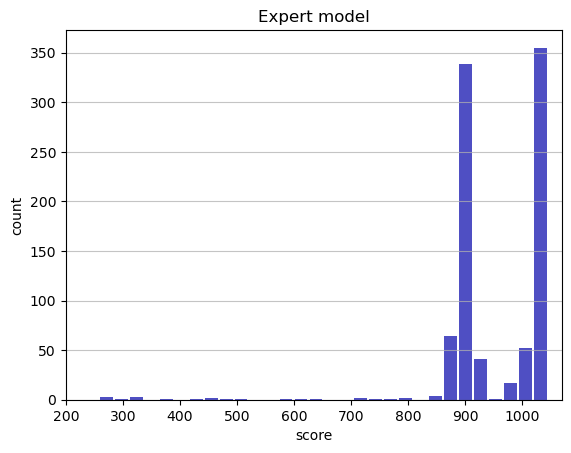

Track generation: 1114..1397 -> 283-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1047..1318 -> 271-tiles track
Epoch: 896
Expert	mean: 949.97	variance: 99.07



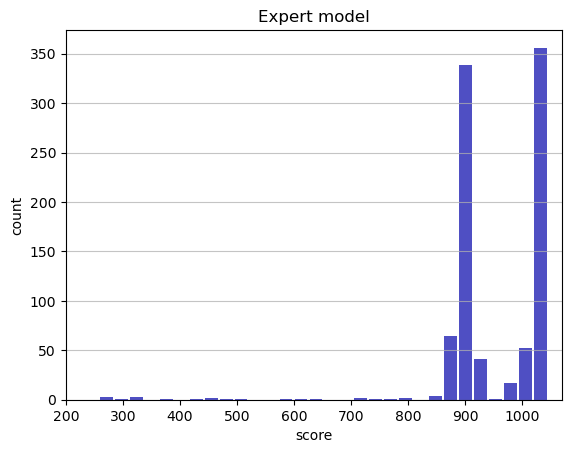

Track generation: 1120..1404 -> 284-tiles track
Epoch: 897
Expert	mean: 949.94	variance: 99.02



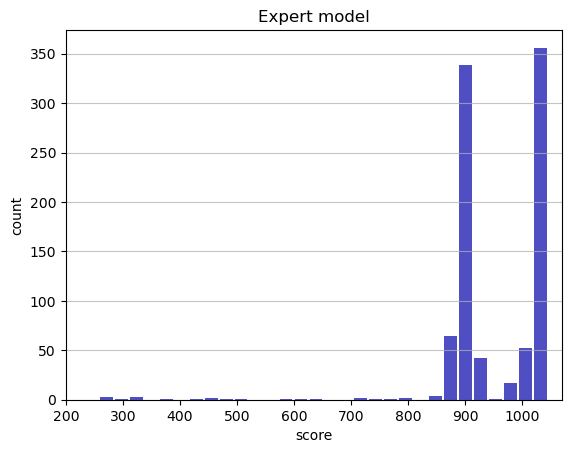

Track generation: 1089..1409 -> 320-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1107..1396 -> 289-tiles track
Epoch: 898
Expert	mean: 950.02	variance: 99.00



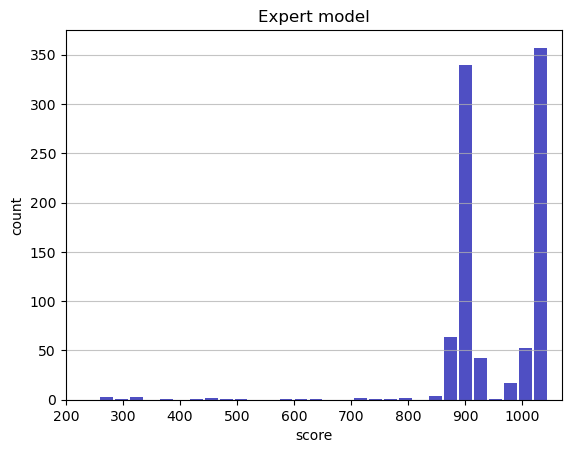

Track generation: 1175..1473 -> 298-tiles track
Epoch: 899
Expert	mean: 949.96	variance: 98.96



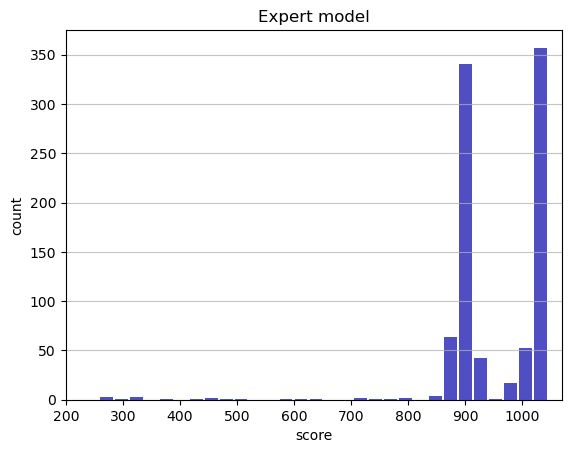

Track generation: 1095..1373 -> 278-tiles track
Epoch: 900
Expert	mean: 950.05	variance: 98.94



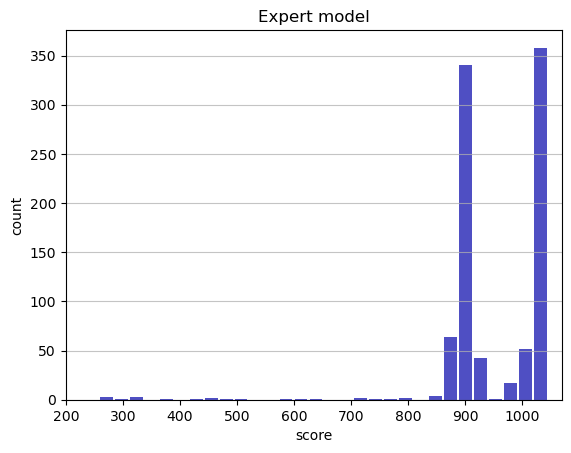

Track generation: 1184..1484 -> 300-tiles track
Epoch: 901
Expert	mean: 949.99	variance: 98.90



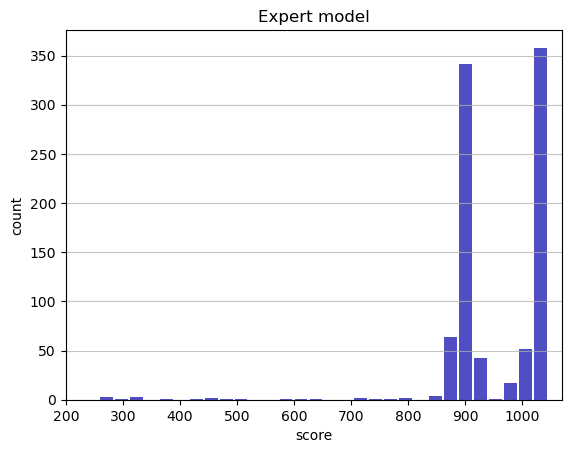

Track generation: 1123..1408 -> 285-tiles track
Epoch: 902
Expert	mean: 949.94	variance: 98.86



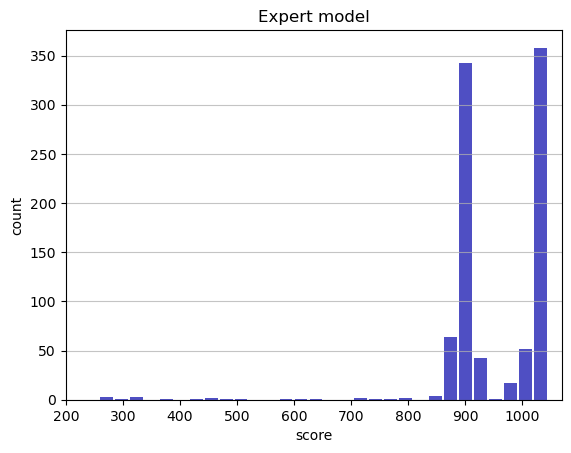

Track generation: 1096..1376 -> 280-tiles track
Epoch: 903
Expert	mean: 949.88	variance: 98.82



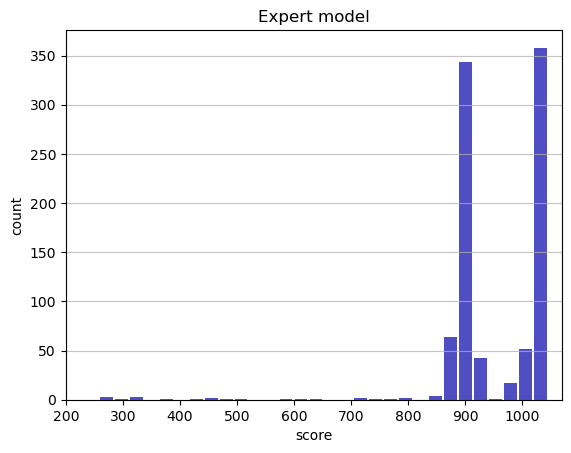

Track generation: 1150..1441 -> 291-tiles track
Epoch: 904
Expert	mean: 949.83	variance: 98.78



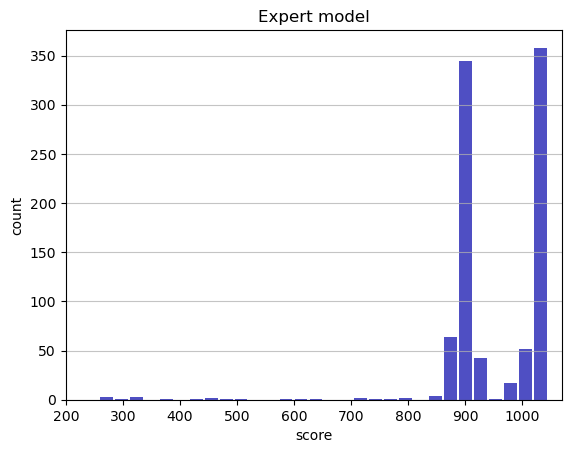

Track generation: 1016..1274 -> 258-tiles track
Epoch: 905
Expert	mean: 949.78	variance: 98.73



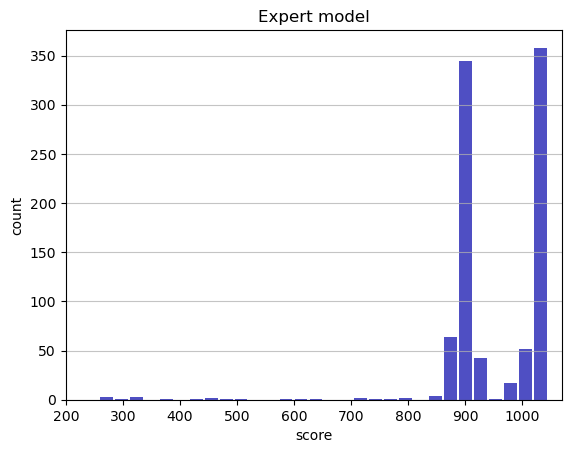

Track generation: 1300..1628 -> 328-tiles track
Epoch: 906
Expert	mean: 949.70	variance: 98.71



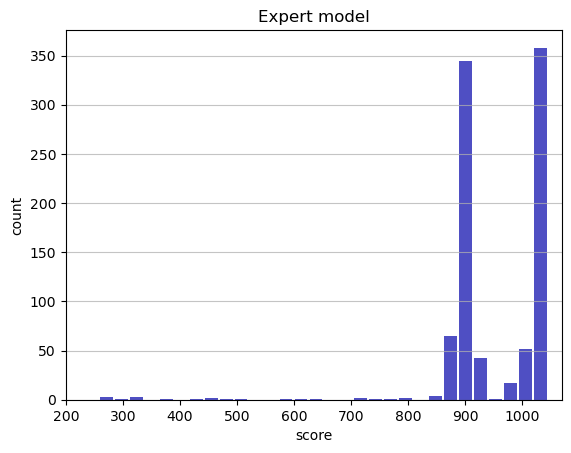

Track generation: 1138..1427 -> 289-tiles track
Epoch: 907
Expert	mean: 949.66	variance: 98.66



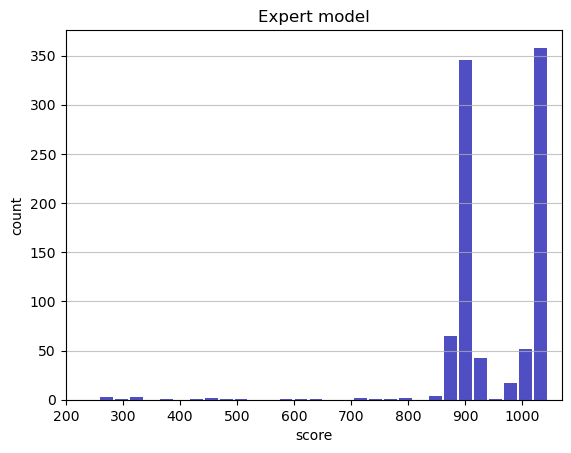

Track generation: 1245..1560 -> 315-tiles track
Epoch: 908
Expert	mean: 949.73	variance: 98.64



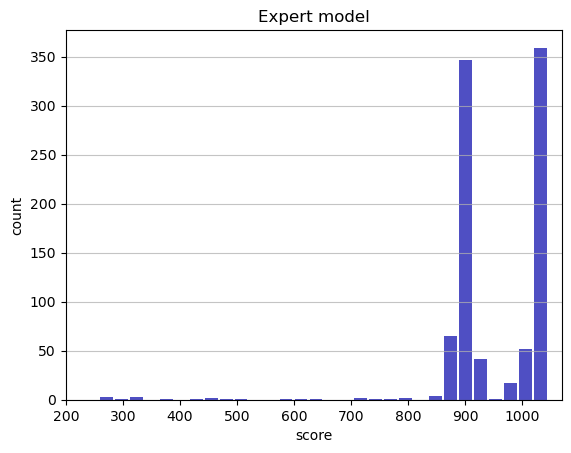

Track generation: 1302..1632 -> 330-tiles track
Epoch: 909
Expert	mean: 949.68	variance: 98.60



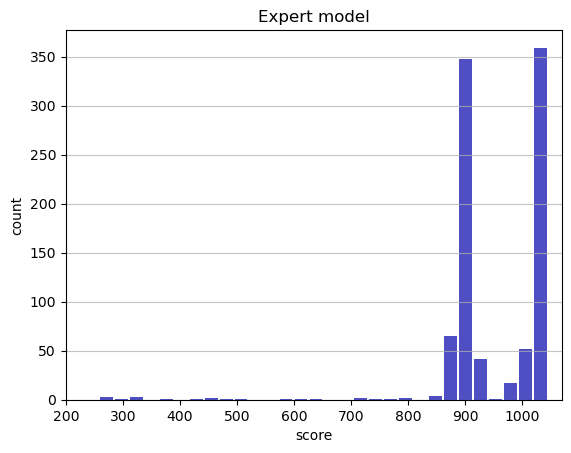

Track generation: 1112..1394 -> 282-tiles track
Epoch: 910
Expert	mean: 949.77	variance: 98.58



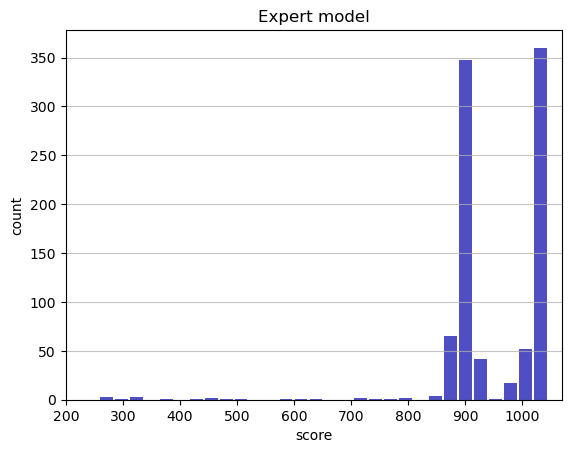

Track generation: 999..1260 -> 261-tiles track
Epoch: 911
Expert	mean: 949.71	variance: 98.54



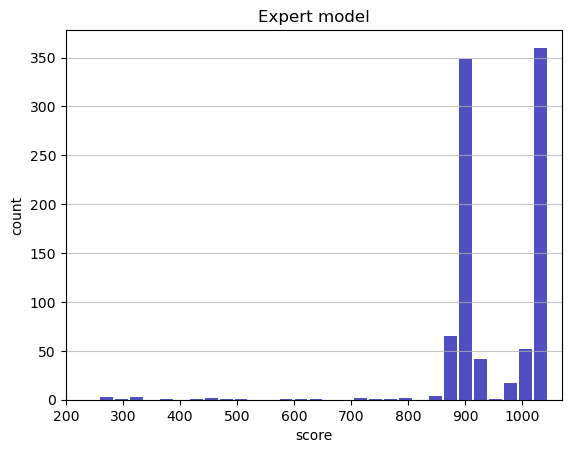

Track generation: 1080..1360 -> 280-tiles track
Epoch: 912
Expert	mean: 949.66	variance: 98.50



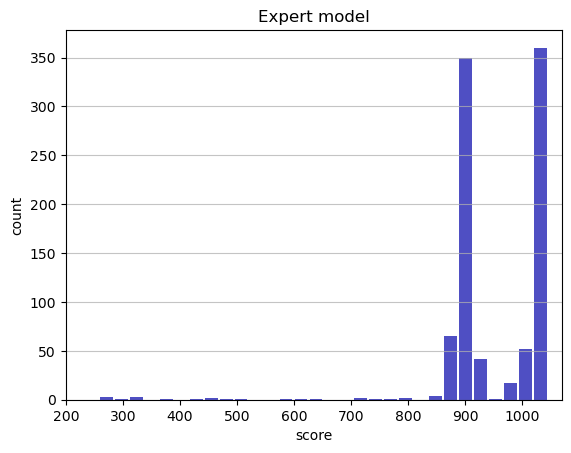

Track generation: 1199..1503 -> 304-tiles track
Epoch: 913
Expert	mean: 949.74	variance: 98.48



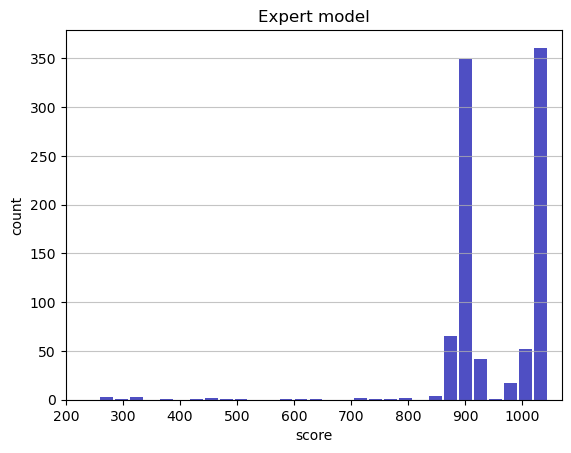

Track generation: 1128..1414 -> 286-tiles track
Epoch: 914
Expert	mean: 949.83	variance: 98.46



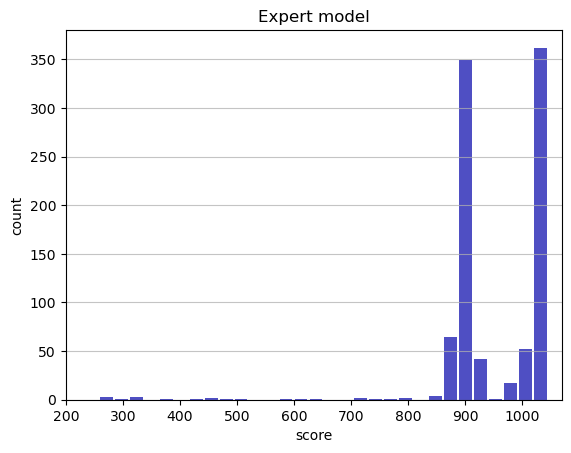

Track generation: 1163..1457 -> 294-tiles track
Epoch: 915
Expert	mean: 949.91	variance: 98.44



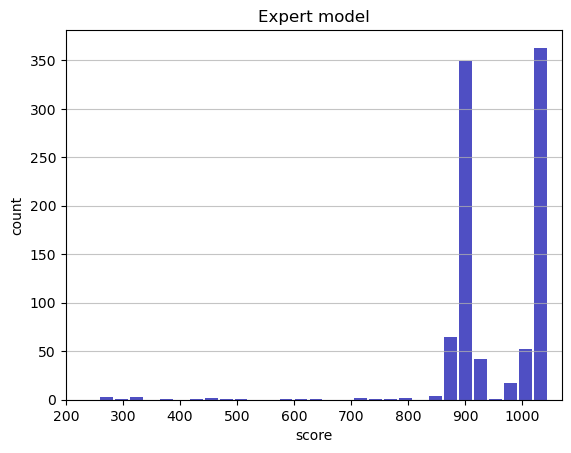

Track generation: 1109..1390 -> 281-tiles track
Epoch: 916
Expert	mean: 950.00	variance: 98.42



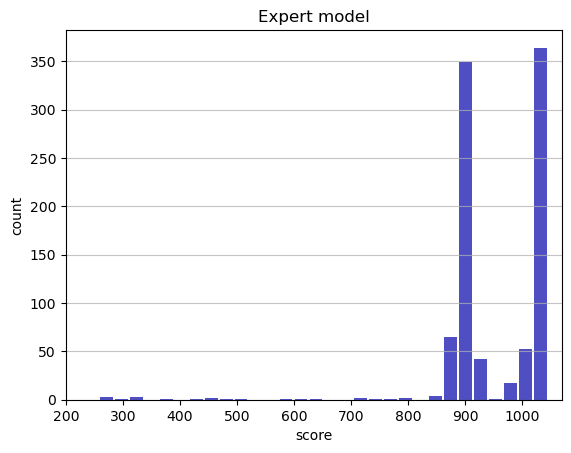

Track generation: 1125..1410 -> 285-tiles track
Epoch: 917
Expert	mean: 950.09	variance: 98.41



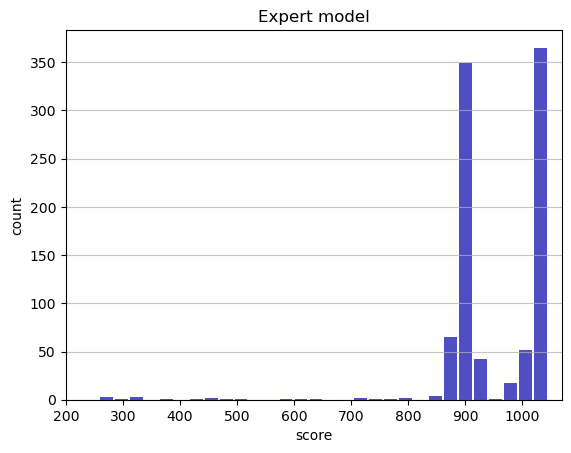

Track generation: 1220..1529 -> 309-tiles track
Epoch: 918
Expert	mean: 950.05	variance: 98.36



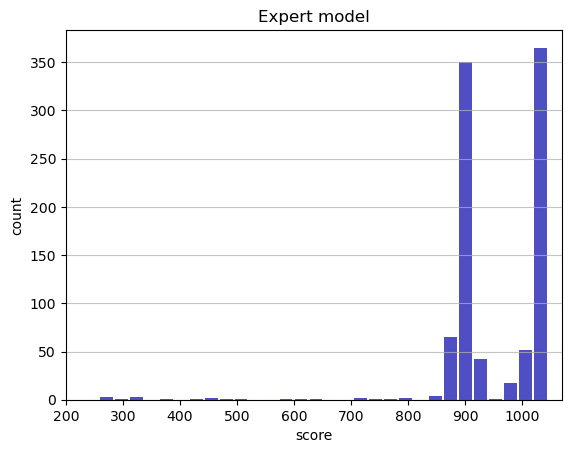

Track generation: 1032..1302 -> 270-tiles track
Epoch: 919
Expert	mean: 950.14	variance: 98.35



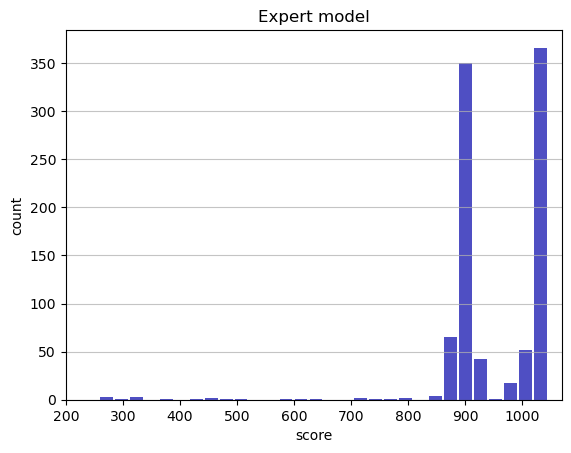

Track generation: 1172..1469 -> 297-tiles track
Epoch: 920
Expert	mean: 950.22	variance: 98.33



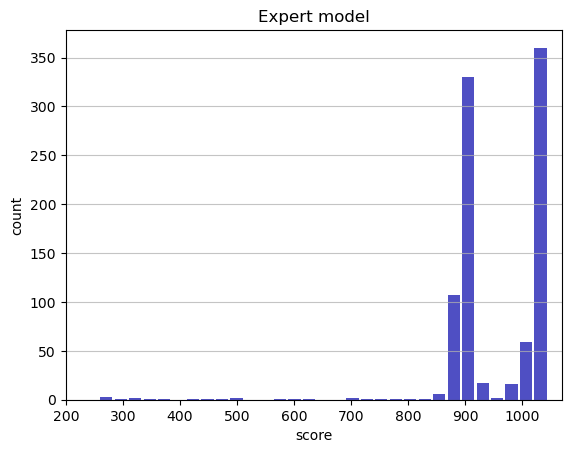

Track generation: 1079..1353 -> 274-tiles track
Epoch: 921
Expert	mean: 950.16	variance: 98.29



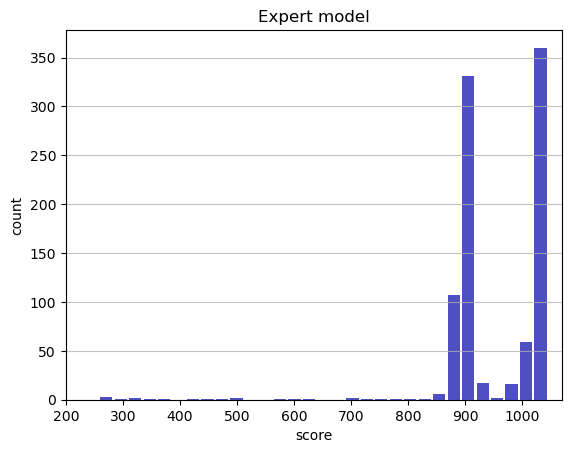

Track generation: 1103..1383 -> 280-tiles track
Epoch: 922
Expert	mean: 950.12	variance: 98.24



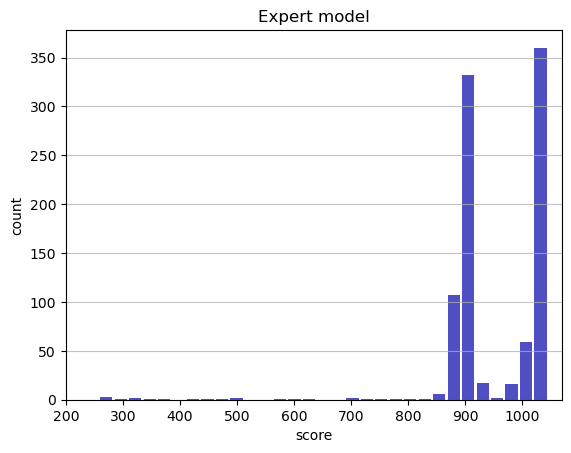

Track generation: 1211..1518 -> 307-tiles track
Epoch: 923
Expert	mean: 950.07	variance: 98.20



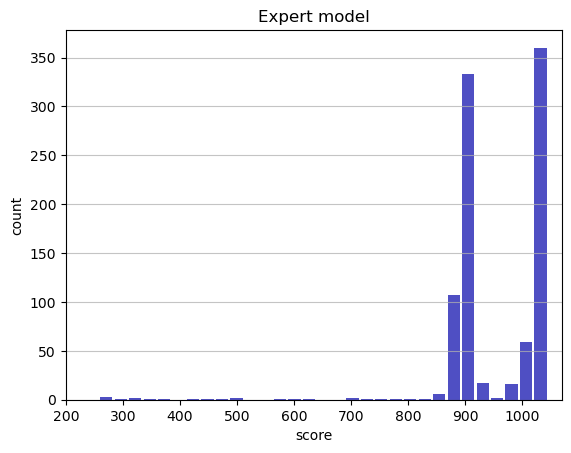

Track generation: 1212..1519 -> 307-tiles track
Epoch: 924
Expert	mean: 950.15	variance: 98.18



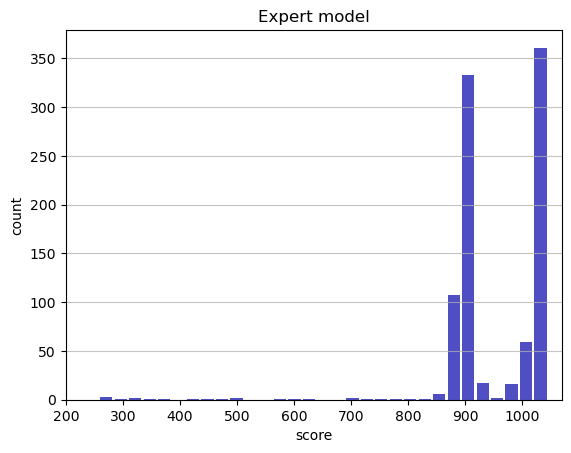

Track generation: 1245..1560 -> 315-tiles track
Epoch: 925
Expert	mean: 950.24	variance: 98.16



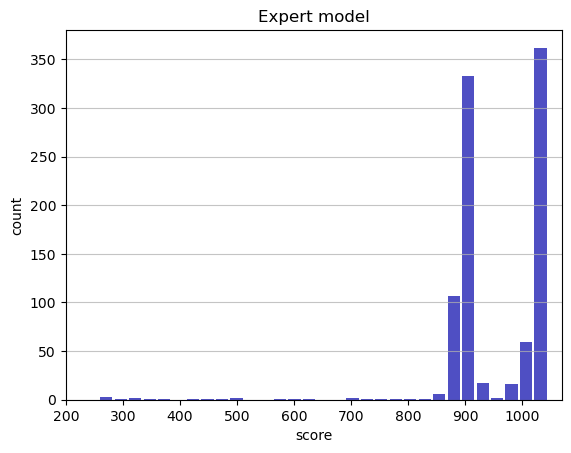

Track generation: 1217..1534 -> 317-tiles track
Epoch: 926
Expert	mean: 950.17	variance: 98.13



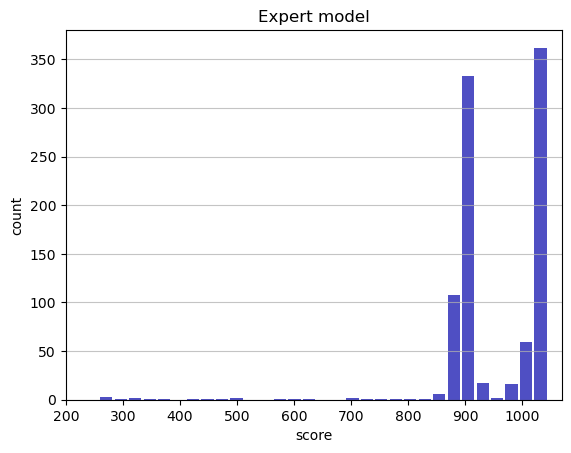

Track generation: 849..1068 -> 219-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1135..1423 -> 288-tiles track
Epoch: 927
Expert	mean: 950.26	variance: 98.11



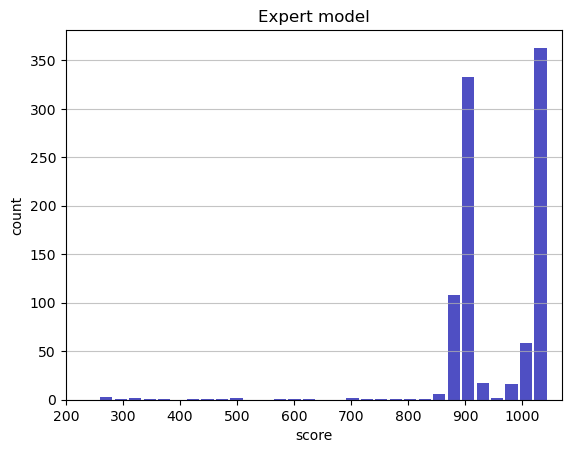

Track generation: 1249..1566 -> 317-tiles track
Epoch: 928
Expert	mean: 950.19	variance: 98.08



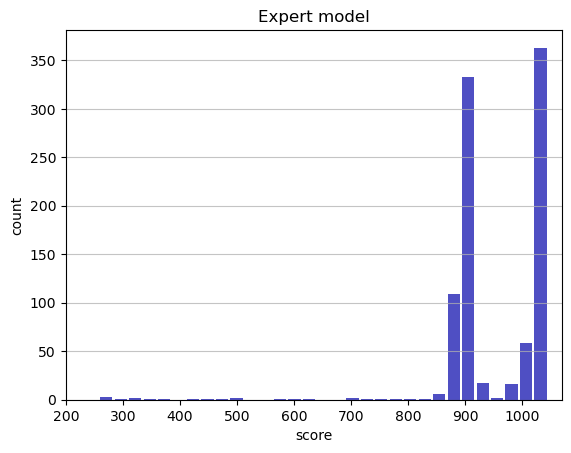

Track generation: 1251..1568 -> 317-tiles track
Epoch: 929
Expert	mean: 950.27	variance: 98.06



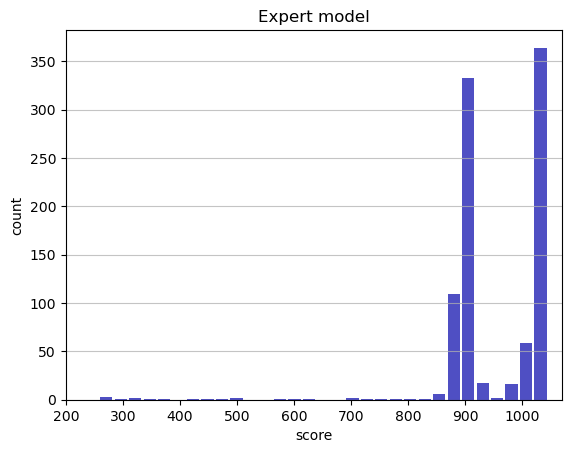

Track generation: 1164..1476 -> 312-tiles track
Epoch: 930
Expert	mean: 950.20	variance: 98.03



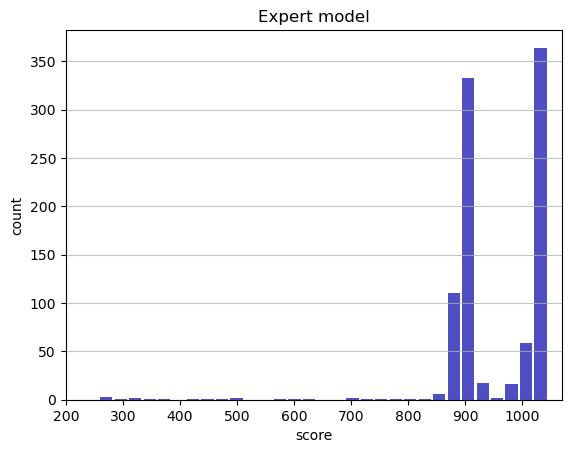

Track generation: 1048..1314 -> 266-tiles track
Epoch: 931
Expert	mean: 950.17	variance: 97.98



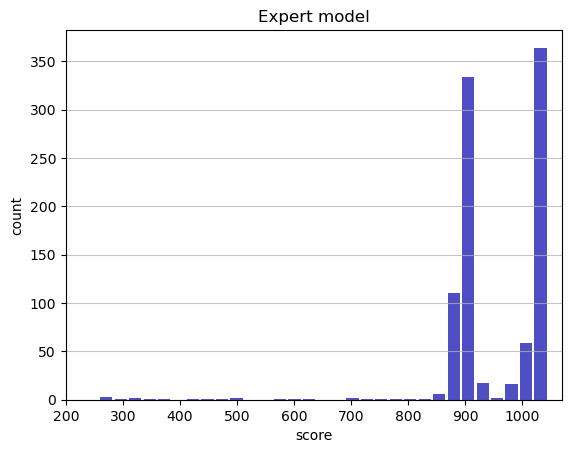

Track generation: 1161..1455 -> 294-tiles track
Epoch: 932
Expert	mean: 950.11	variance: 97.94



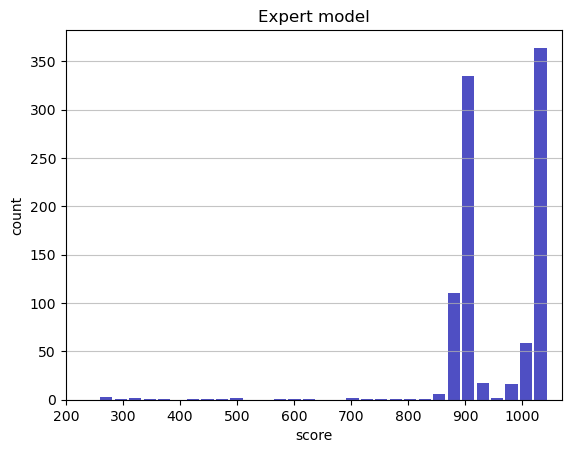

Track generation: 1127..1413 -> 286-tiles track
Epoch: 933
Expert	mean: 950.20	variance: 97.93



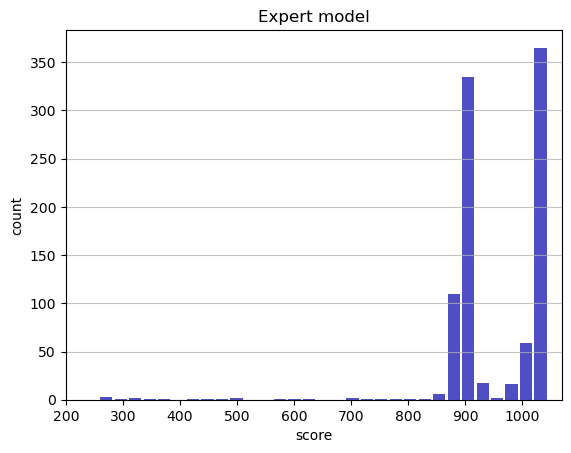

Track generation: 1138..1427 -> 289-tiles track
Epoch: 934
Expert	mean: 950.14	variance: 97.89



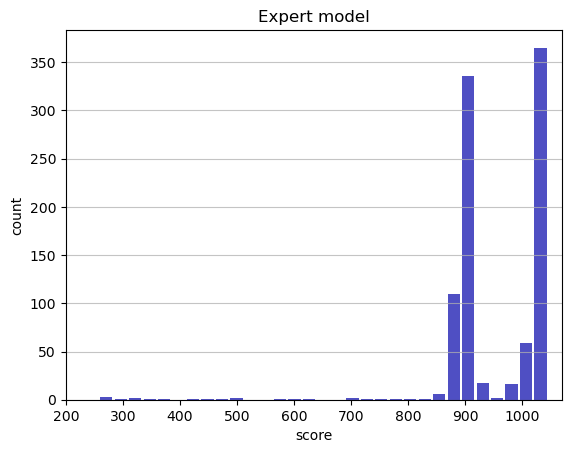

Track generation: 1026..1288 -> 262-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1328..1672 -> 344-tiles track
Epoch: 935
Expert	mean: 950.18	variance: 97.85



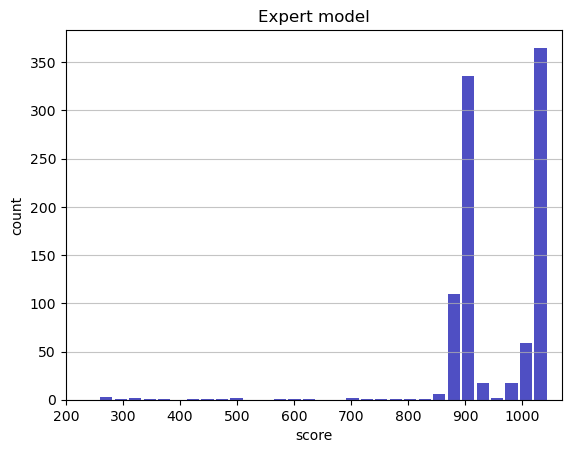

Track generation: 1043..1312 -> 269-tiles track
Epoch: 936
Expert	mean: 950.27	variance: 97.83



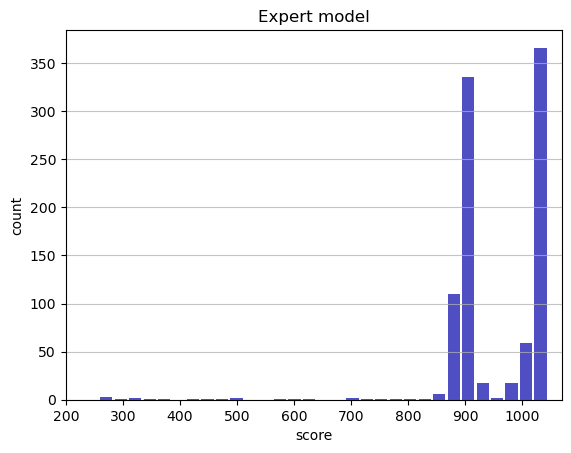

Track generation: 1231..1543 -> 312-tiles track
Epoch: 937
Expert	mean: 950.34	variance: 97.81



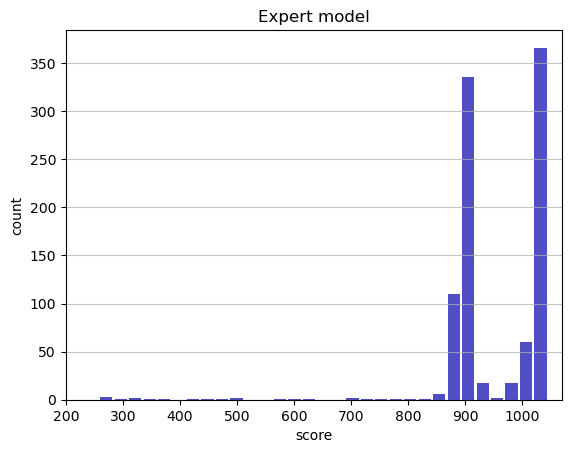

Track generation: 1187..1488 -> 301-tiles track
Epoch: 938
Expert	mean: 950.42	variance: 97.79



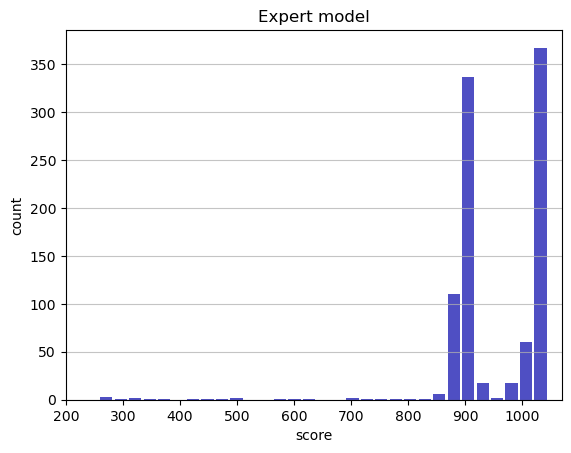

Track generation: 1169..1465 -> 296-tiles track
Epoch: 939
Expert	mean: 950.50	variance: 97.76



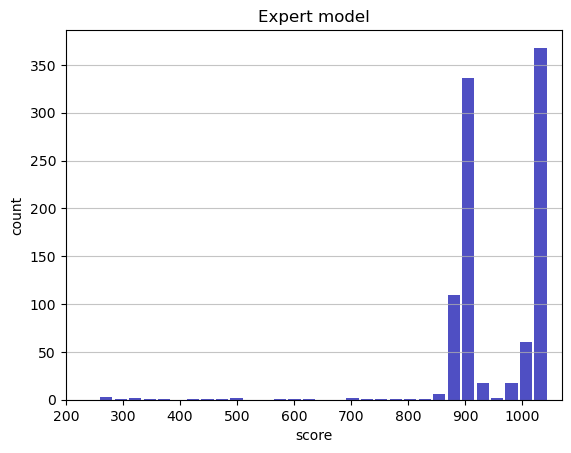

Track generation: 1236..1549 -> 313-tiles track
Epoch: 940
Expert	mean: 950.43	variance: 97.74



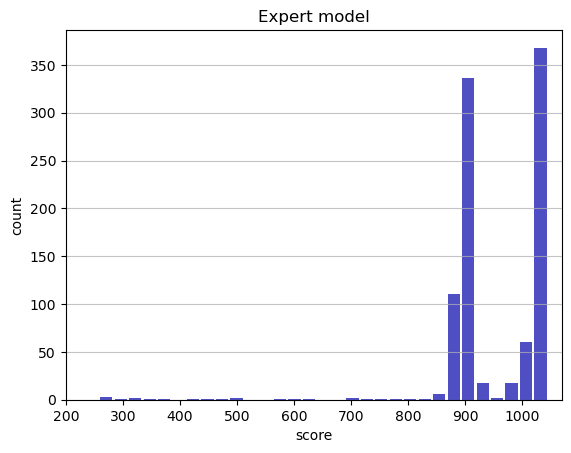

Track generation: 1092..1377 -> 285-tiles track
Epoch: 941
Expert	mean: 950.39	variance: 97.69



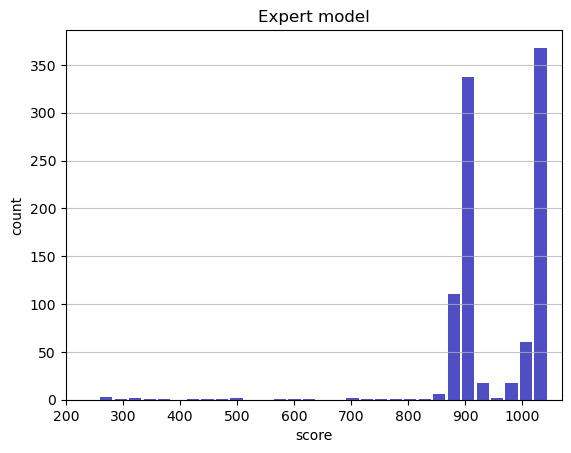

Track generation: 1266..1587 -> 321-tiles track
Epoch: 942
Expert	mean: 950.46	variance: 97.67



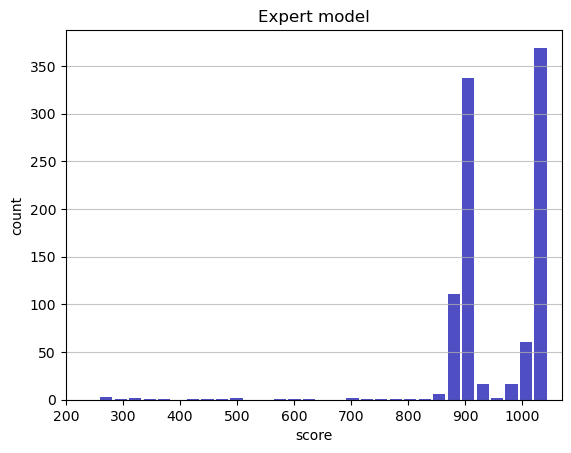

Track generation: 1276..1599 -> 323-tiles track
Epoch: 943
Expert	mean: 950.40	variance: 97.64



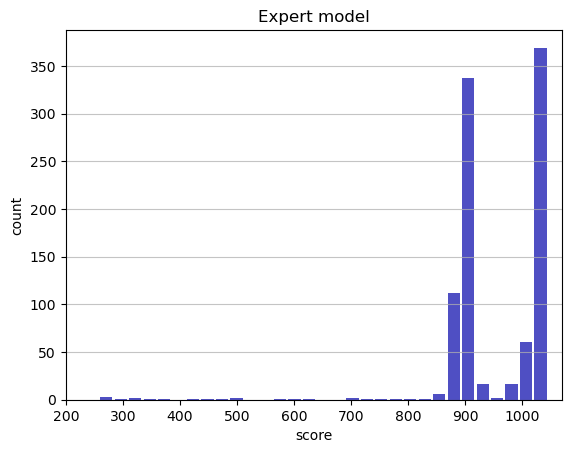

Track generation: 1118..1408 -> 290-tiles track
Epoch: 944
Expert	mean: 950.47	variance: 97.61



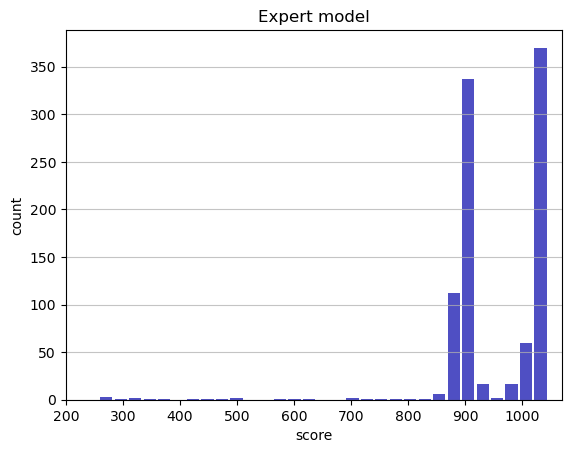

Track generation: 1105..1385 -> 280-tiles track
Epoch: 945
Expert	mean: 950.57	variance: 97.60



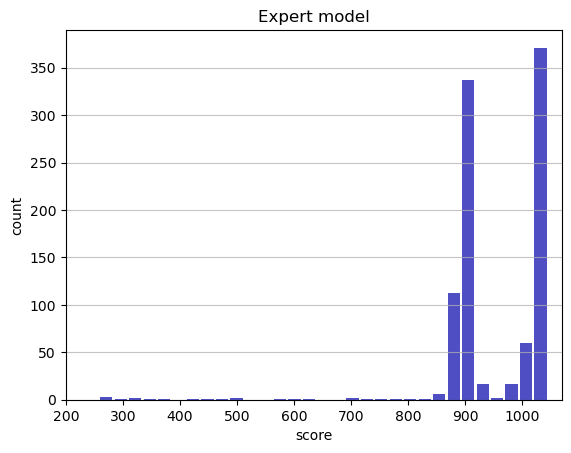

Track generation: 1097..1375 -> 278-tiles track
Epoch: 946
Expert	mean: 950.52	variance: 97.56



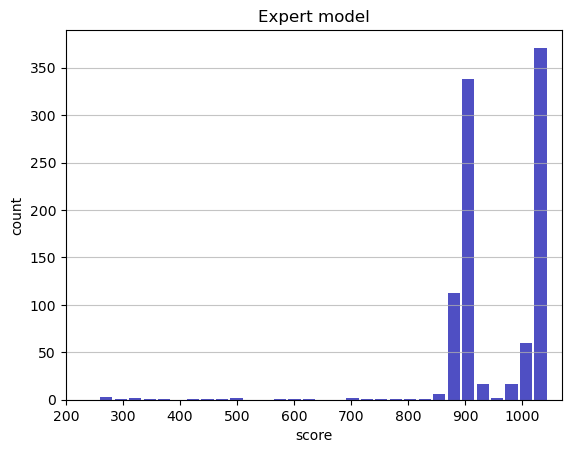

Track generation: 1133..1420 -> 287-tiles track
Epoch: 947
Expert	mean: 950.61	variance: 97.55



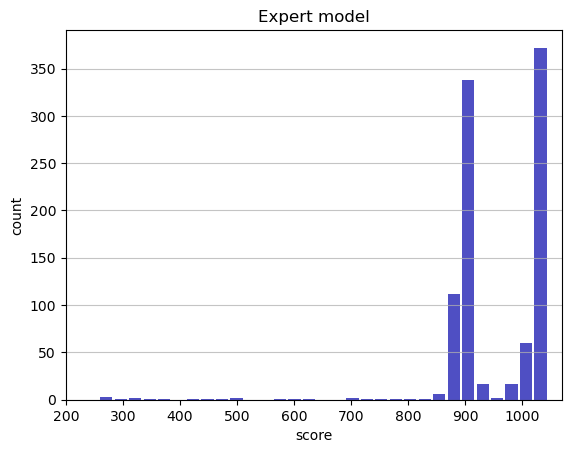

Track generation: 1064..1342 -> 278-tiles track
Epoch: 948
Expert	mean: 950.55	variance: 97.51



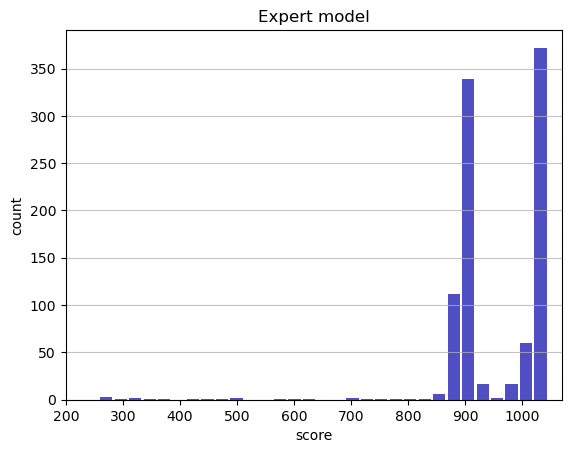

Track generation: 1247..1563 -> 316-tiles track
Epoch: 949
Expert	mean: 950.49	variance: 97.48



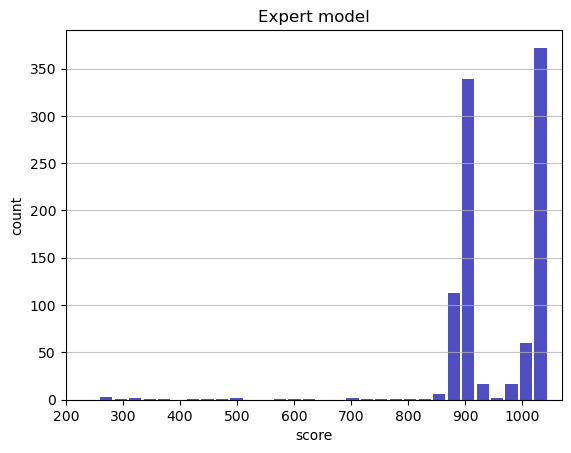

Track generation: 1055..1323 -> 268-tiles track
Epoch: 950
Expert	mean: 950.43	variance: 97.44



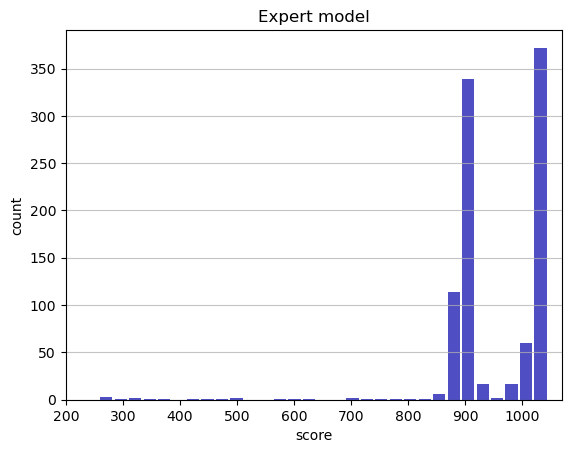

Track generation: 1165..1460 -> 295-tiles track
Epoch: 951
Expert	mean: 950.38	variance: 97.40



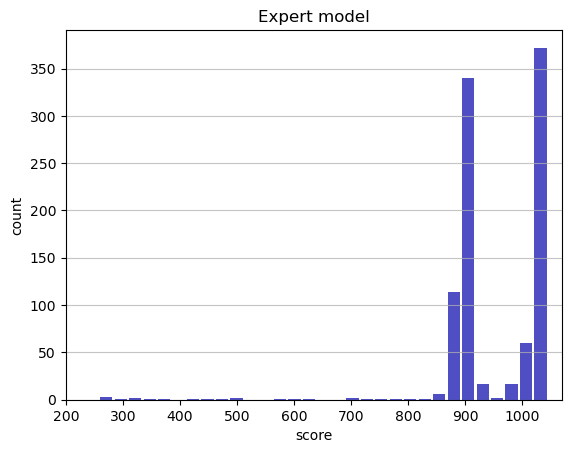

Track generation: 1164..1459 -> 295-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1165..1461 -> 296-tiles track
Epoch: 952
Expert	mean: 950.46	variance: 97.38



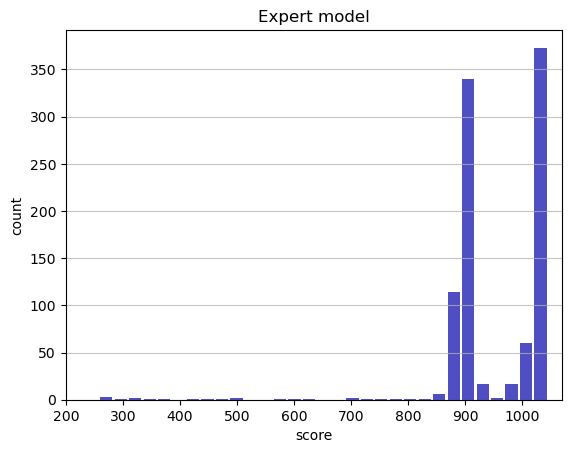

Track generation: 1089..1372 -> 283-tiles track
Epoch: 953
Expert	mean: 950.54	variance: 97.37



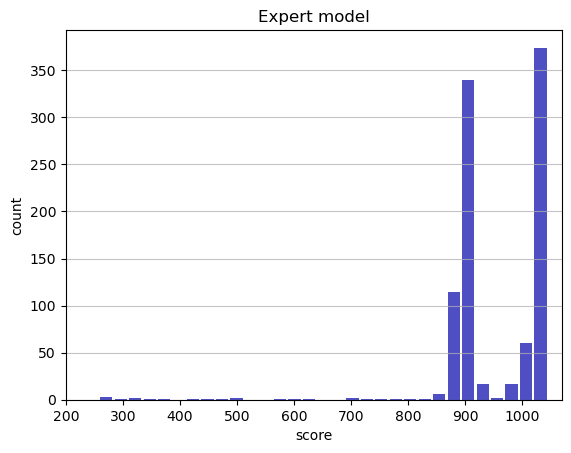

Track generation: 1116..1399 -> 283-tiles track
Epoch: 954
Expert	mean: 950.63	variance: 97.35



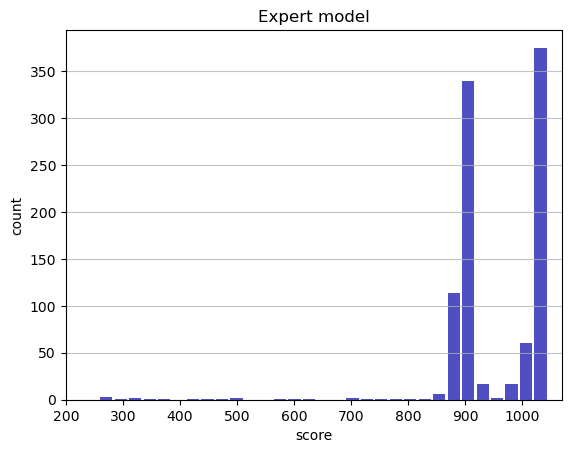

Track generation: 1156..1449 -> 293-tiles track
Epoch: 955
Expert	mean: 950.59	variance: 97.31



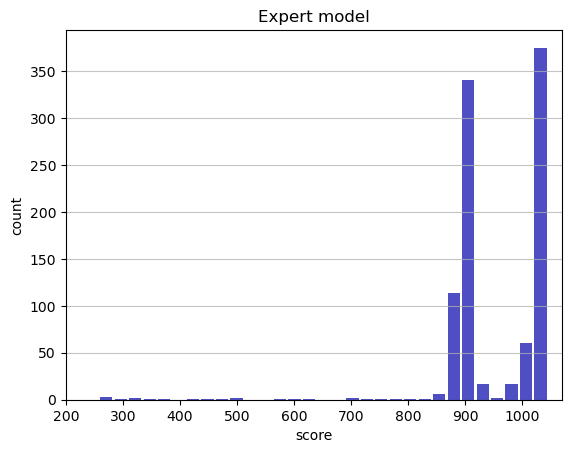

Track generation: 1029..1290 -> 261-tiles track
Epoch: 956
Expert	mean: 950.67	variance: 97.30



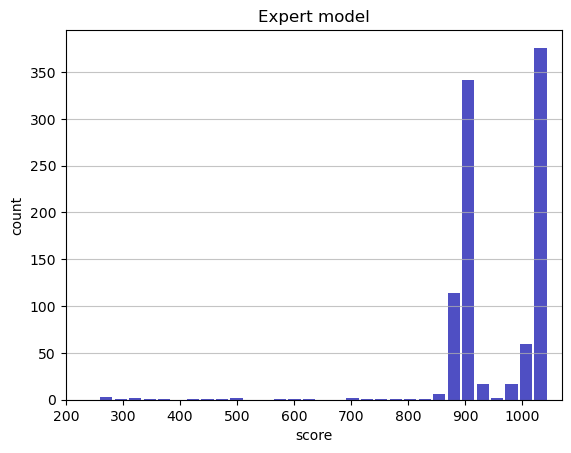

Track generation: 1254..1571 -> 317-tiles track
Epoch: 957
Expert	mean: 950.62	variance: 97.26



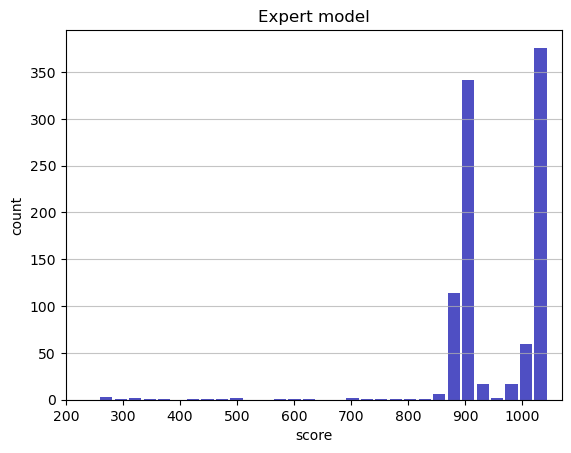

Track generation: 988..1239 -> 251-tiles track
Epoch: 958
Expert	mean: 950.71	variance: 97.25



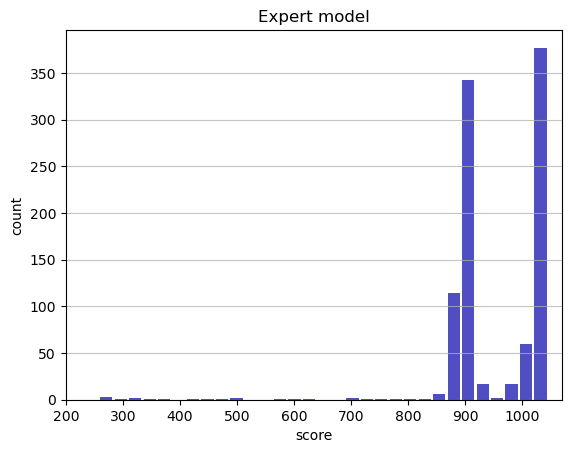

Track generation: 1153..1445 -> 292-tiles track
Epoch: 959
Expert	mean: 950.79	variance: 97.24



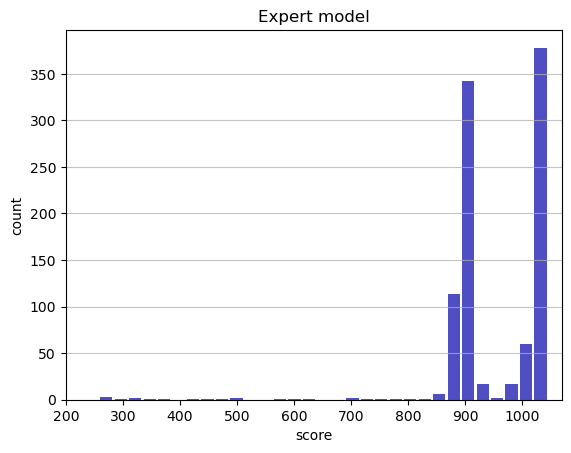

Track generation: 1123..1408 -> 285-tiles track
Epoch: 960
Expert	mean: 950.88	variance: 97.22



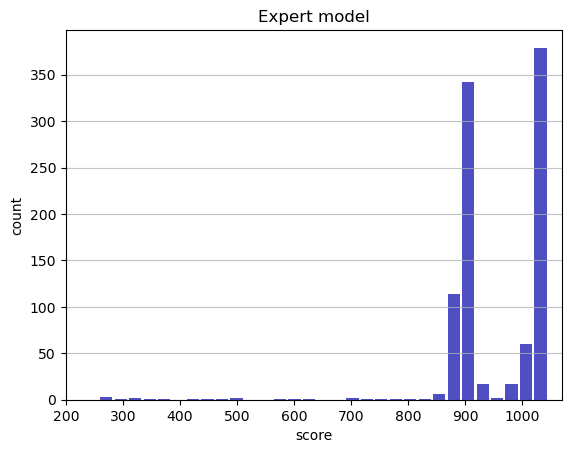

Track generation: 1200..1504 -> 304-tiles track
Epoch: 961
Expert	mean: 950.65	variance: 97.44



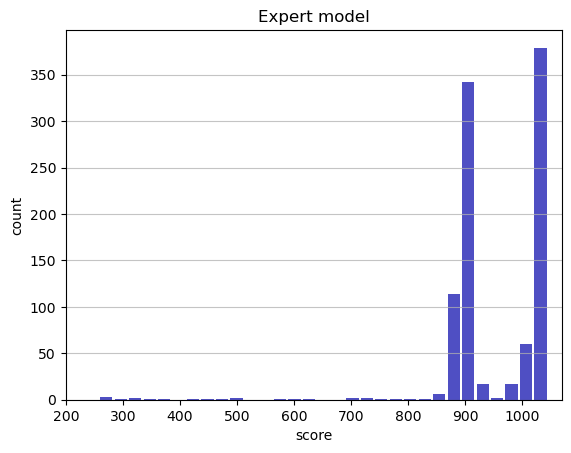

Track generation: 1128..1414 -> 286-tiles track
Epoch: 962
Expert	mean: 950.61	variance: 97.39



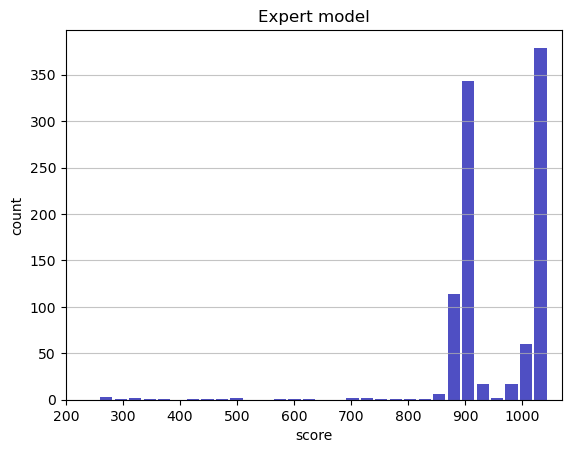

Track generation: 1161..1455 -> 294-tiles track
Epoch: 963
Expert	mean: 950.23	variance: 98.04



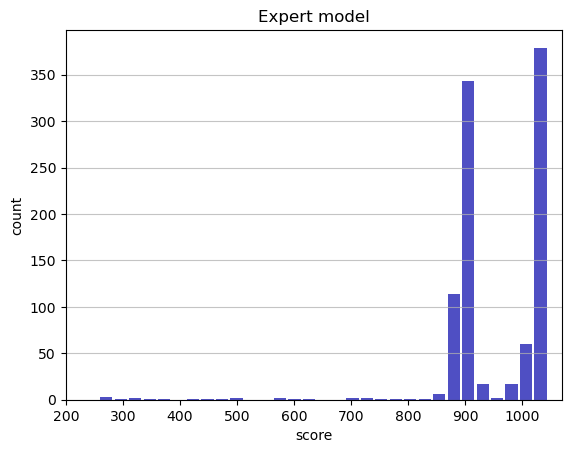

Track generation: 1128..1422 -> 294-tiles track
Epoch: 964
Expert	mean: 950.16	variance: 98.01



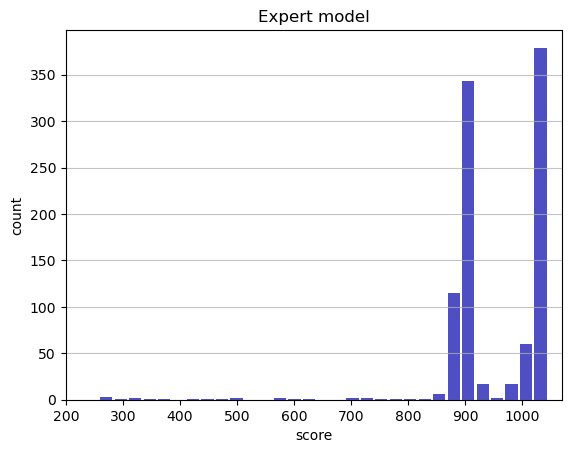

Track generation: 1367..1713 -> 346-tiles track
Epoch: 965
Expert	mean: 950.22	variance: 97.98



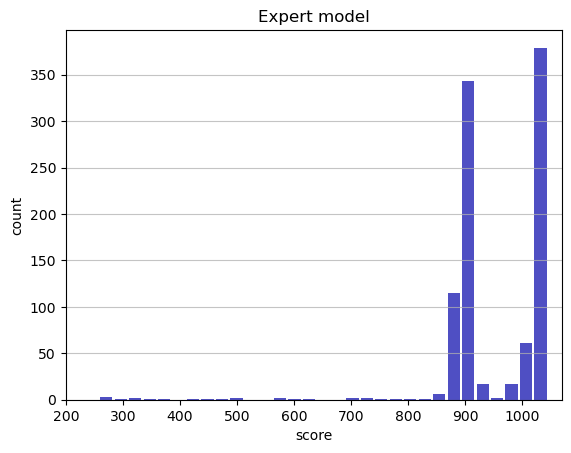

Track generation: 1212..1519 -> 307-tiles track
Epoch: 966
Expert	mean: 950.17	variance: 97.95



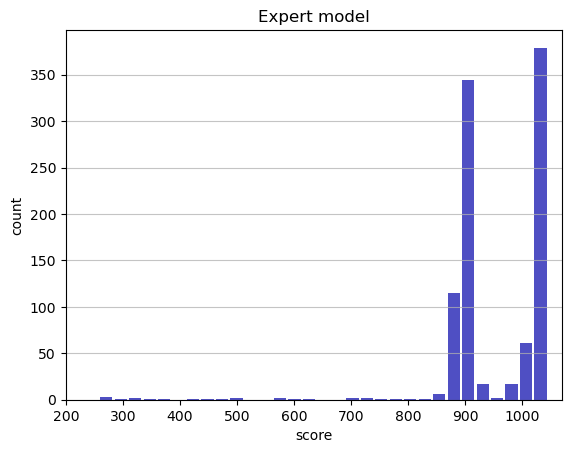

Track generation: 1140..1429 -> 289-tiles track
Epoch: 967
Expert	mean: 949.97	variance: 98.08



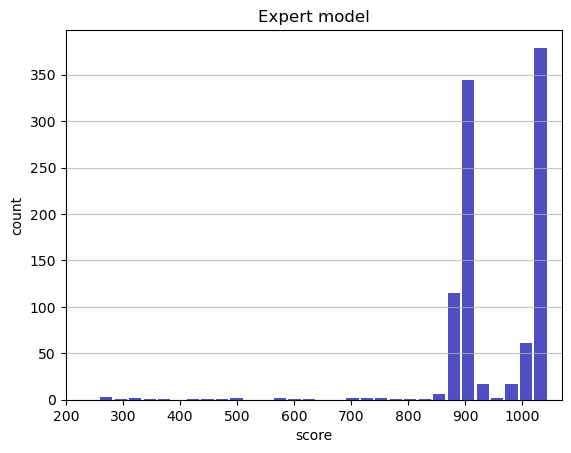

Track generation: 1019..1278 -> 259-tiles track
Epoch: 968
Expert	mean: 949.93	variance: 98.04



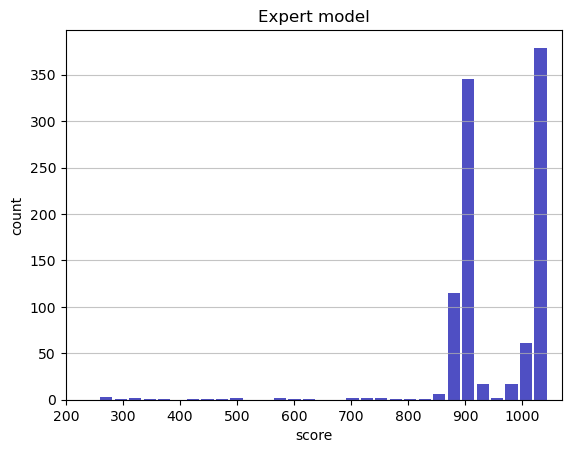

Track generation: 1161..1456 -> 295-tiles track
Epoch: 969
Expert	mean: 949.86	variance: 98.01



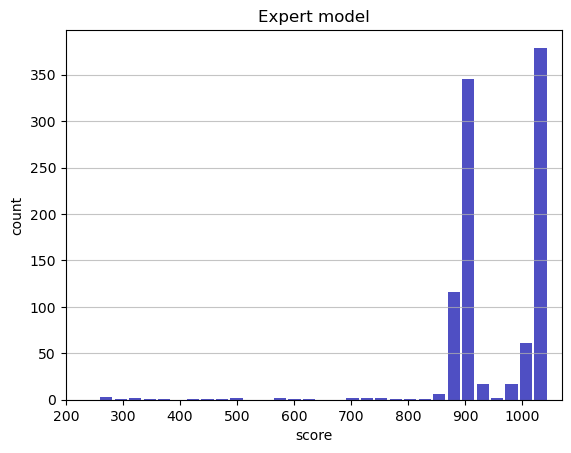

Track generation: 1253..1570 -> 317-tiles track
Epoch: 970
Expert	mean: 949.80	variance: 97.98



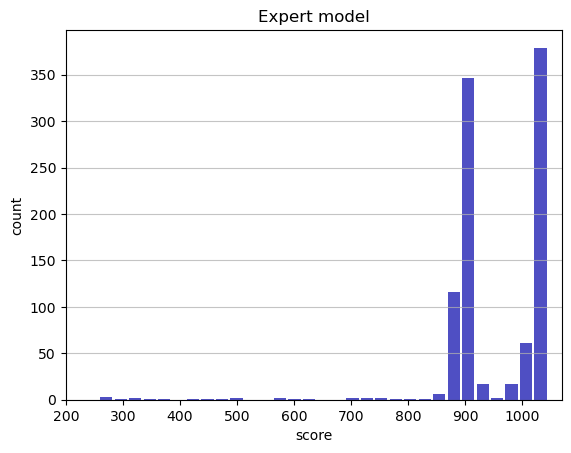

Track generation: 1102..1382 -> 280-tiles track
Epoch: 971
Expert	mean: 949.76	variance: 97.93



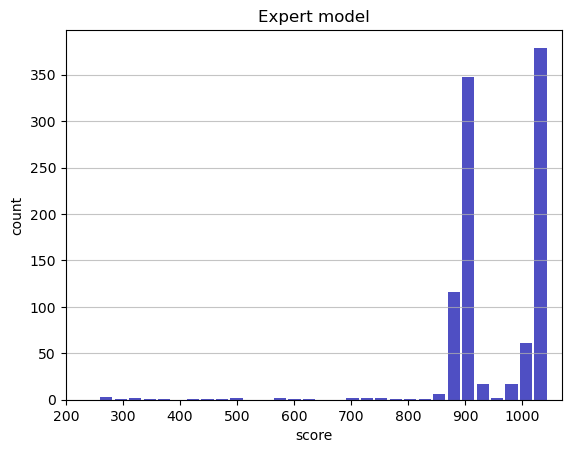

Track generation: 1086..1361 -> 275-tiles track
Epoch: 972
Expert	mean: 949.72	variance: 97.89



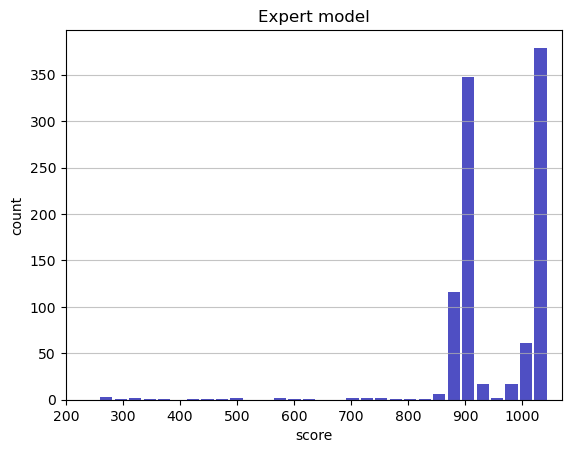

Track generation: 1068..1339 -> 271-tiles track
Epoch: 973
Expert	mean: 949.81	variance: 97.88



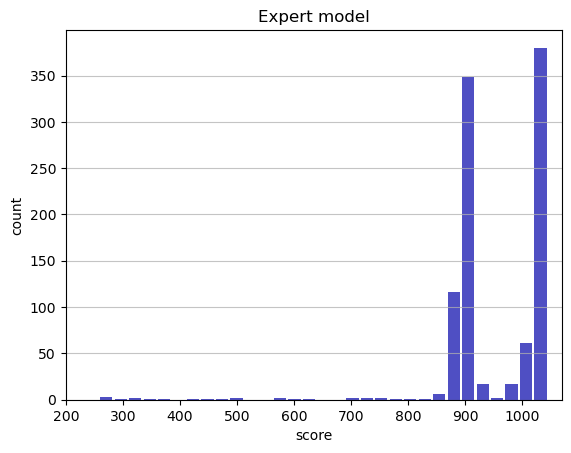

Track generation: 1139..1428 -> 289-tiles track
Epoch: 974
Expert	mean: 949.74	variance: 97.85



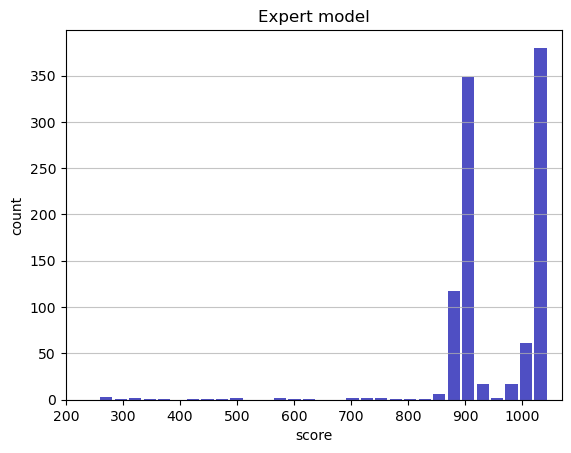

Track generation: 1268..1589 -> 321-tiles track
Epoch: 975
Expert	mean: 949.67	variance: 97.83



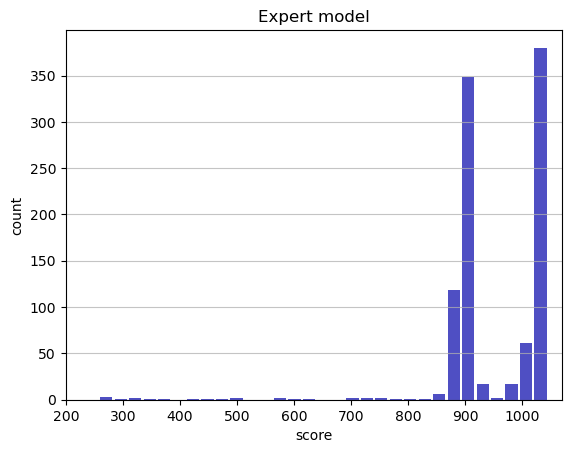

Track generation: 1020..1278 -> 258-tiles track
Epoch: 976
Expert	mean: 949.62	variance: 97.79



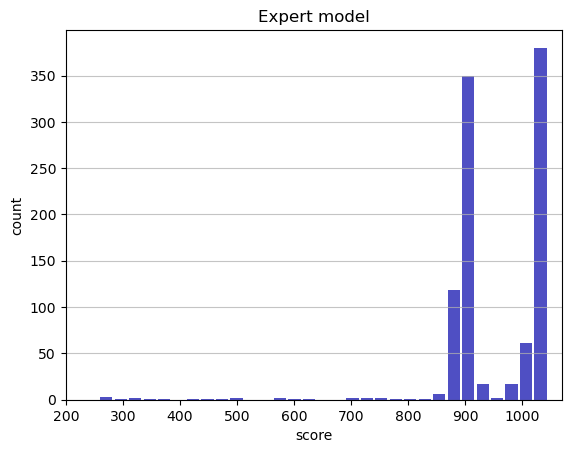

Track generation: 1167..1463 -> 296-tiles track
Epoch: 977
Expert	mean: 949.58	variance: 97.75



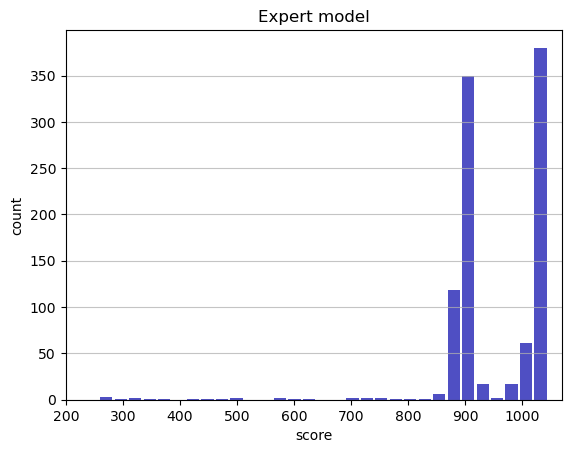

Track generation: 1043..1315 -> 272-tiles track
Epoch: 978
Expert	mean: 949.66	variance: 97.74



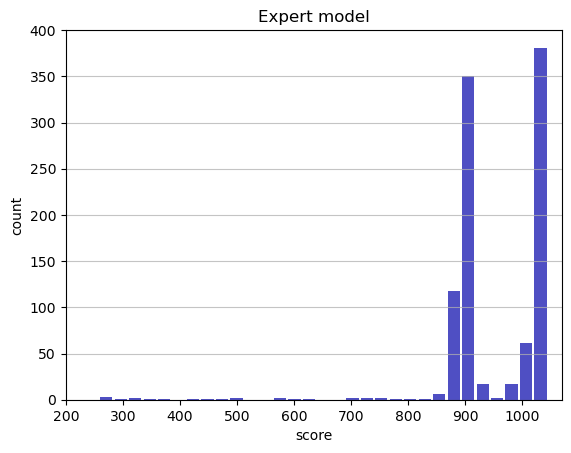

Track generation: 1108..1389 -> 281-tiles track
Epoch: 979
Expert	mean: 949.61	variance: 97.70



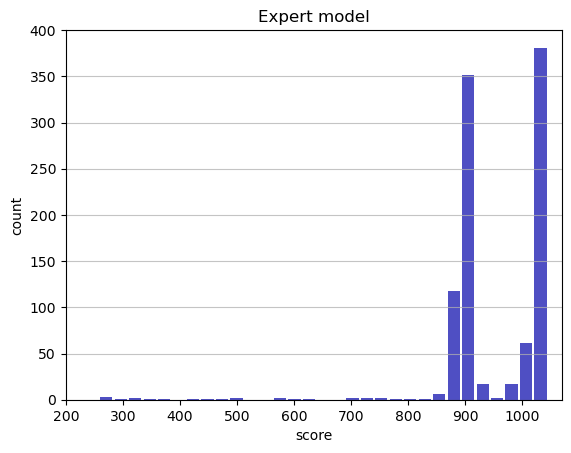

Track generation: 1291..1618 -> 327-tiles track
Epoch: 980
Expert	mean: 949.68	variance: 97.67



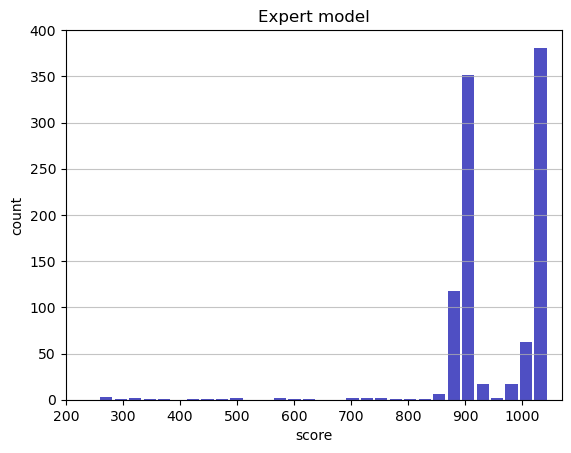

Track generation: 1053..1320 -> 267-tiles track
Epoch: 981
Expert	mean: 949.63	variance: 97.63



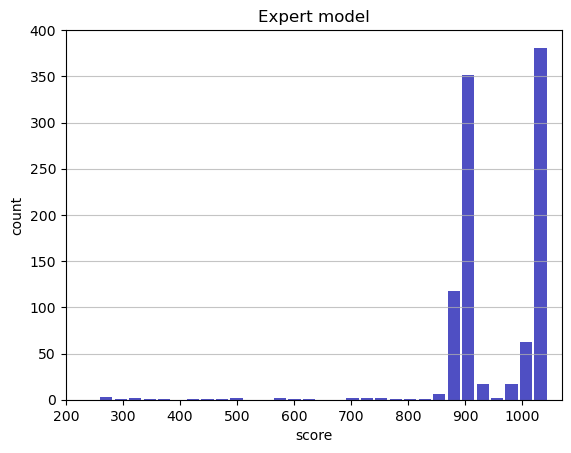

Track generation: 1266..1595 -> 329-tiles track
Epoch: 982
Expert	mean: 949.69	variance: 97.60



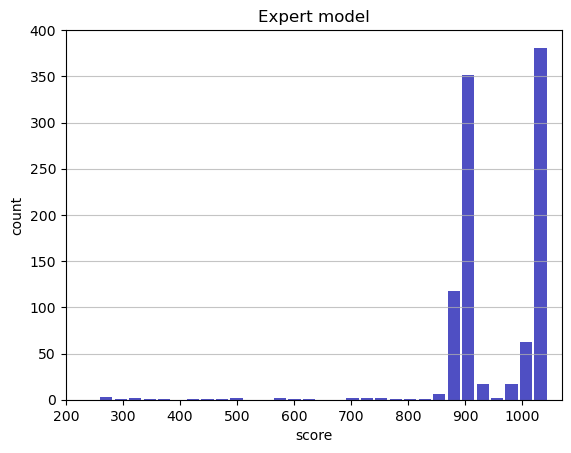

Track generation: 1139..1427 -> 288-tiles track
Epoch: 983
Expert	mean: 949.77	variance: 97.58



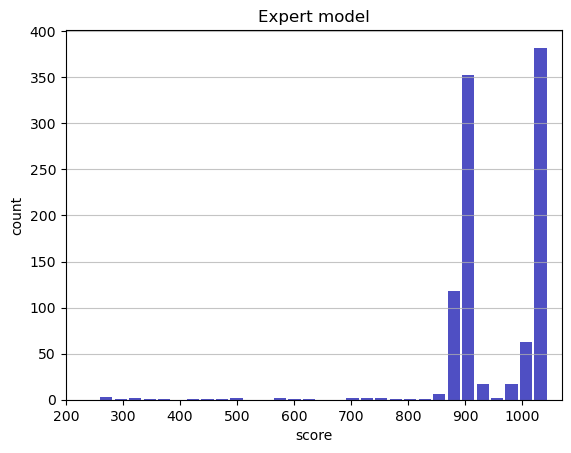

Track generation: 1133..1430 -> 297-tiles track
Epoch: 984
Expert	mean: 949.84	variance: 97.56



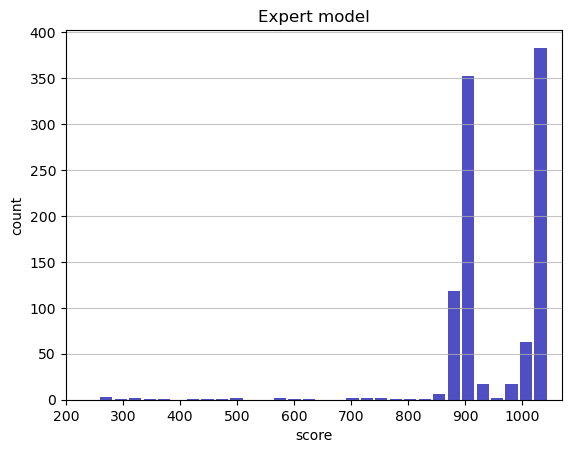

Track generation: 1011..1272 -> 261-tiles track
Epoch: 985
Expert	mean: 949.93	variance: 97.55



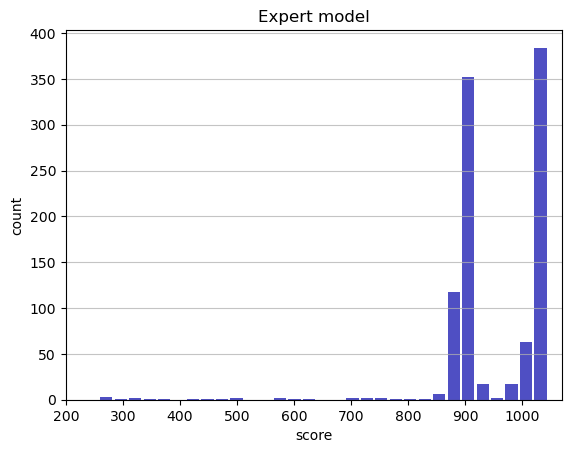

Track generation: 1196..1499 -> 303-tiles track
Epoch: 986
Expert	mean: 949.88	variance: 97.51



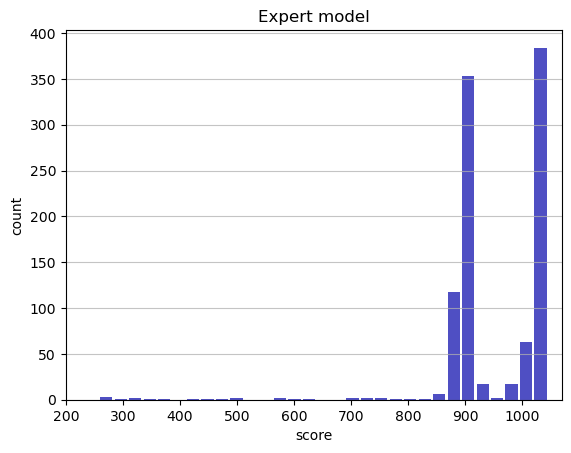

Track generation: 1200..1505 -> 305-tiles track
Epoch: 987
Expert	mean: 949.82	variance: 97.48



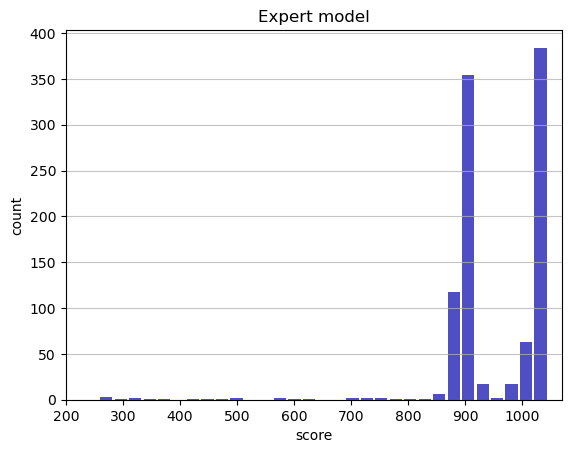

Track generation: 1151..1443 -> 292-tiles track
Epoch: 988
Expert	mean: 949.90	variance: 97.46



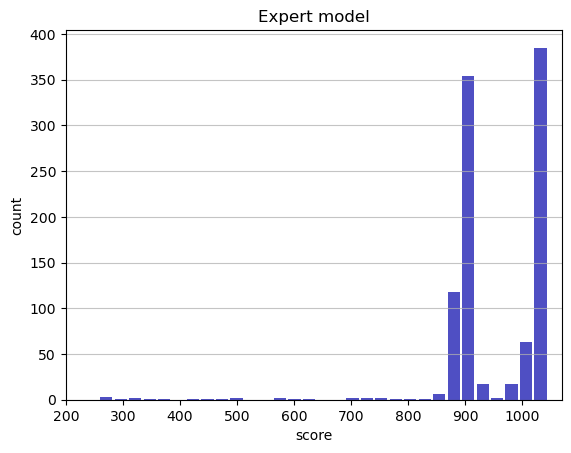

Track generation: 1267..1588 -> 321-tiles track
Epoch: 989
Expert	mean: 949.97	variance: 97.44



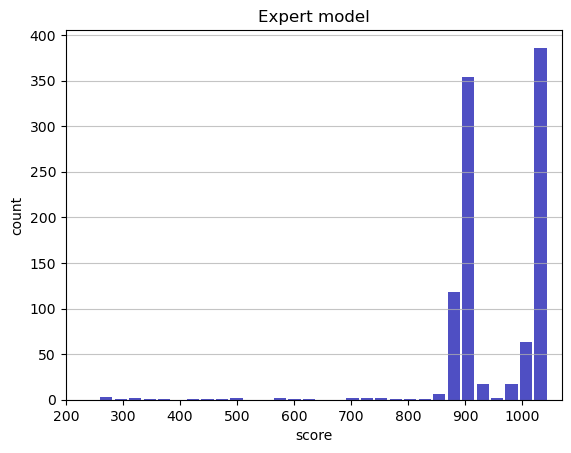

Track generation: 1076..1354 -> 278-tiles track
Epoch: 990
Expert	mean: 949.92	variance: 97.40



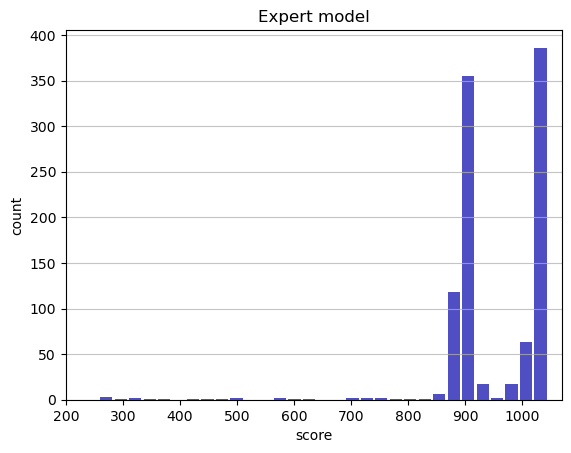

Track generation: 1276..1599 -> 323-tiles track
Epoch: 991
Expert	mean: 949.99	variance: 97.38



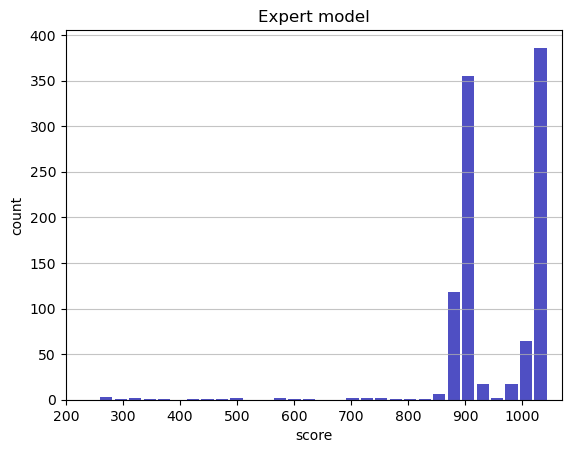

Track generation: 1153..1453 -> 300-tiles track
Epoch: 992
Expert	mean: 950.06	variance: 97.36



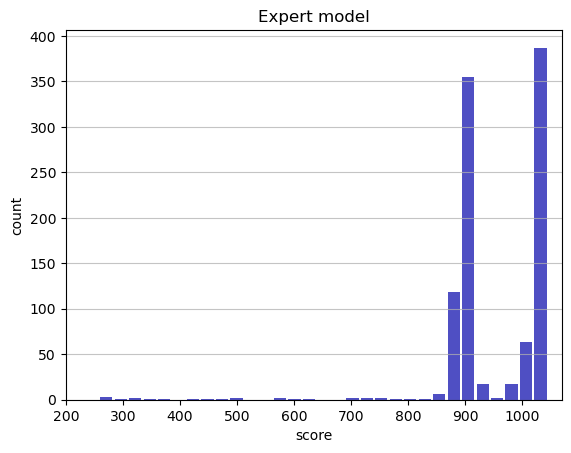

Track generation: 1221..1530 -> 309-tiles track
Epoch: 993
Expert	mean: 950.13	variance: 97.34



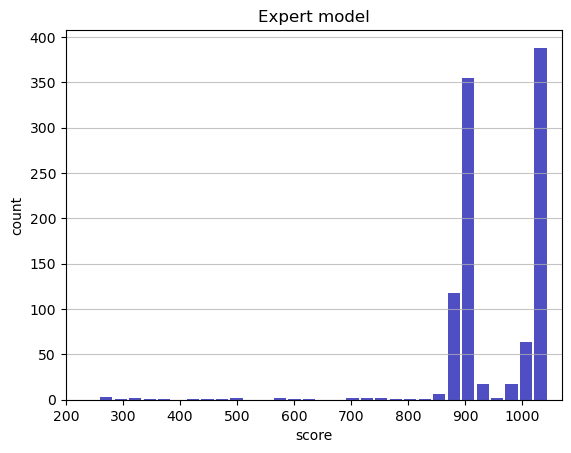

Track generation: 1163..1458 -> 295-tiles track
Epoch: 994
Expert	mean: 949.90	variance: 97.56



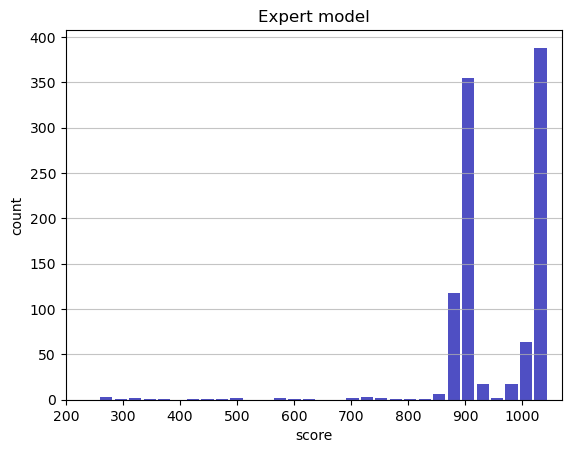

Track generation: 1055..1323 -> 268-tiles track
Epoch: 995
Expert	mean: 949.86	variance: 97.52



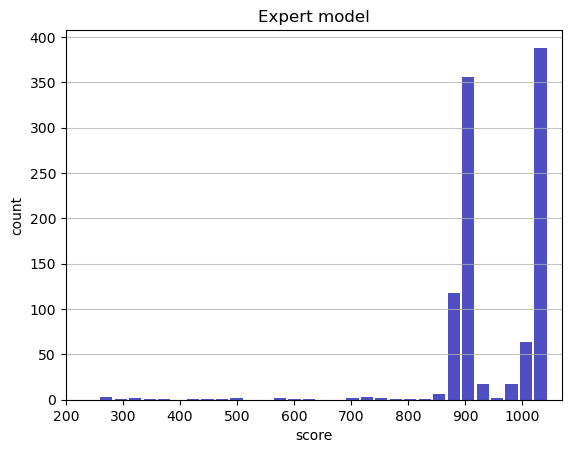

Track generation: 1001..1255 -> 254-tiles track
Epoch: 996
Expert	mean: 949.95	variance: 97.51



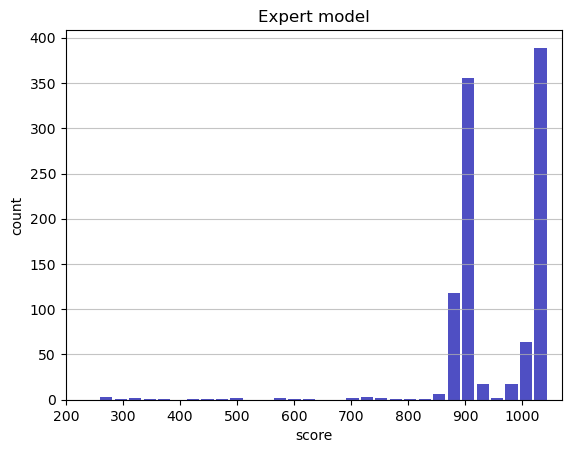

Track generation: 1011..1271 -> 260-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1069..1340 -> 271-tiles track
Epoch: 997
Expert	mean: 950.04	variance: 97.50



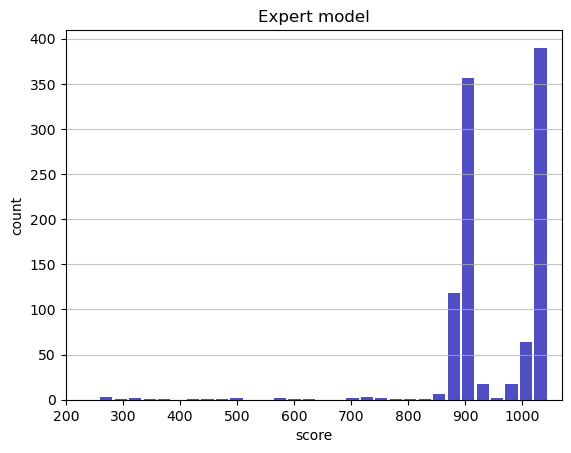

Track generation: 1151..1443 -> 292-tiles track
Epoch: 998
Expert	mean: 950.12	variance: 97.49



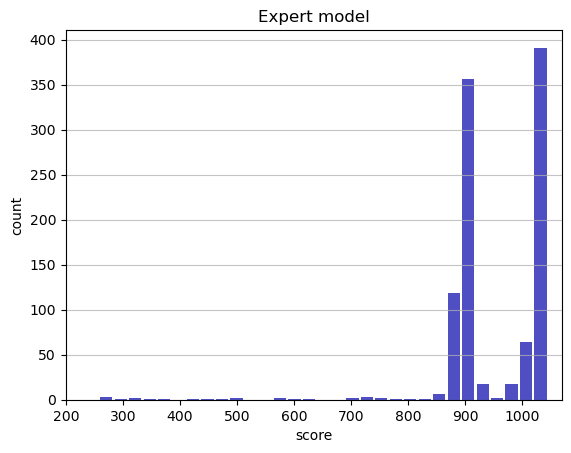

Track generation: 1197..1500 -> 303-tiles track
Epoch: 999
Expert	mean: 950.19	variance: 97.46



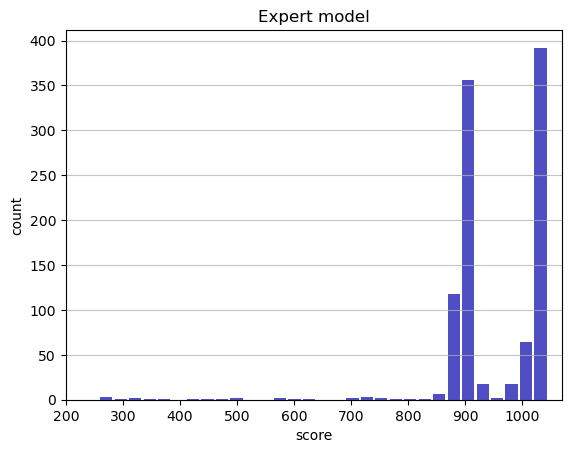

Track generation: 1160..1454 -> 294-tiles track
Epoch: 1000
Expert	mean: 950.15	variance: 97.42



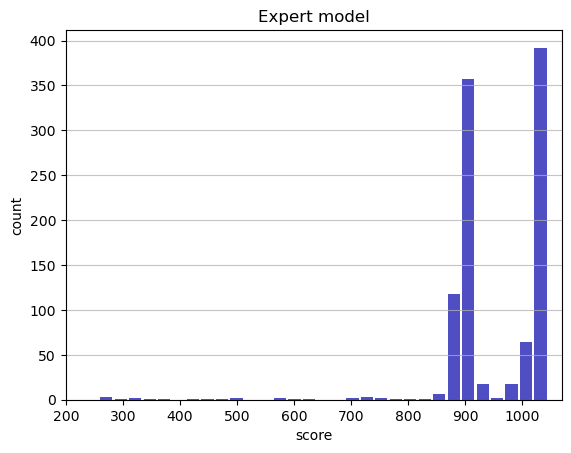

NameError: name 'agent_env' is not defined

In [3]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

agent = Agent()
agent.load_param()

env = Env()
total_score = 0
scores = []

epoch = 1000
for i_ep in range(1,epoch+1):
    score = 0
    state = env.reset()

    for t in range(1000):     
        action = agent.select_action(state)
        
        state_, reward, done, die = env.step(action * np.array([2., 1., 1.]) + np.array([-1., 0., 0.]))
        
        env.render()
        score += reward
        state = state_
        if done or die:
            break
    
    total_score += score
    scores.append(score)

    print("Epoch: {}".format(i_ep))
    print('Expert\tmean: {:.2f}\tvariance: {:.2f}\n'.format(np.array(scores).mean(), np.array(scores).std()))

    plt.figure()
    plt.hist(x=scores, bins='auto', color='#0504aa', alpha=0.7, rwidth=0.85)
    plt.grid(axis='y', alpha=0.75)
    plt.xlim(200,1070)
    plt.xlabel('score')
    plt.ylabel('count')
    plt.title('Expert model')

    plt.show()
    
env.close()

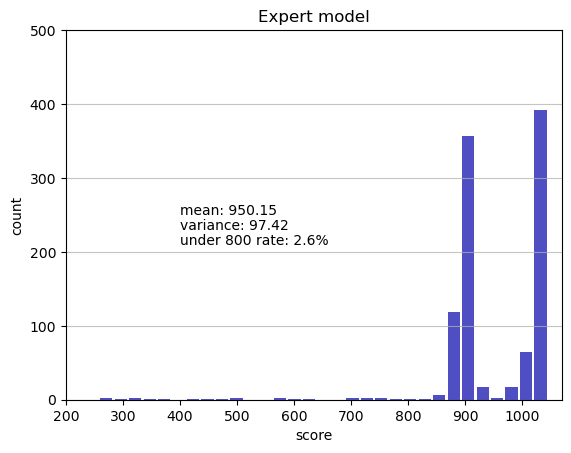

In [16]:
# np.save('./param/expert_score.npy', scores)

scores = np.load('./param/expert_score.npy')

plt.figure()
plt.hist(x=scores, bins='auto', color='#0504aa', alpha=0.7, rwidth=0.85)
plt.grid(axis='y', alpha=0.75)
plt.xlim(200,1070)
plt.ylim(0, 500)
plt.xlabel('score')
plt.ylabel('count')
plt.title('Expert model')
plt.text(400, 250, 'mean: {:.2f}'.format(np.array(scores).mean()))
plt.text(400, 230, 'variance: {:.2f}'.format(np.array(scores).std()))
plt.text(400, 210, 'under 800 rate: {}%'.format(len(scores[scores < 800])/10))

plt.show()